In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
# Read data downloaded from databricks
# https://databricks-prod-cloudfront.cloud.databricks.com/public/4027ec902e239c93eaaa8714f173bcfc/4954928053318020/1058911316420443/167703932442645/latest.html

In [3]:
# Read the CSV data file
df = pd.read_csv('insurance_claims.csv')
df.head(3)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN


In [4]:
# Data view
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
# Last column doesn't have anything. Drop it. Also policy number
df.drop(columns=["_c39", "policy_number", "insured_zip"], inplace=True)

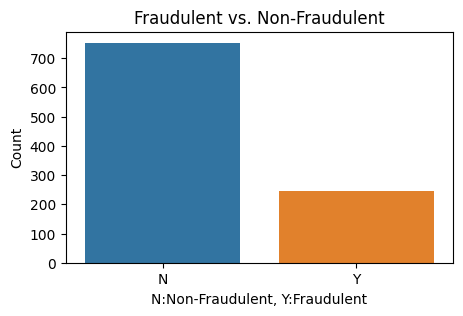

In [6]:
# Plotting count of fraud vs non-fraud transactions in a bar chart
plt.figure(figsize=(5,3))
sns.barplot(x=df['fraud_reported'].value_counts().index, y=df['fraud_reported'].value_counts())
plt.title('Fraudulent vs. Non-Fraudulent')
plt.ylabel('Count')
plt.xlabel('N:Non-Fraudulent, Y:Fraudulent')
plt.show()

##### From the plot, we can observe that the dataset is slightly imbalanced, with more transactions being non-fraudulent (class 0) and fewer transactions being fraudulent (class 1). This indicates that the dataset may have a class imbalance problem, which may affect the performance of a model trained on this dataset. It may be necessary to use techniques such as oversampling, undersampling, or class weighting to handle the class imbalance problem when building a model for fraud detection.


In [7]:
# Top 5 States where we are getting most insurance claims (incident_state)
df["incident_state"].value_counts()[:5]


NY    262
SC    248
WV    217
VA    110
NC    110
Name: incident_state, dtype: int64

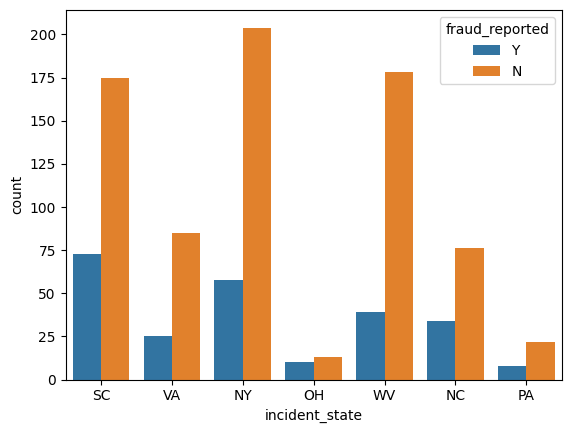

In [8]:
# Plotting count of fraud_reported by state
sns.countplot(x="incident_state", data=df, hue="fraud_reported")
plt.show()

In [9]:
# ax = sns.histplot(x = df['incident_state'], hue=df['fraud_reported'], multiple="dodge", 
#                   stat = 'density', shrink = 0.8, common_norm=False)
# plt.show()

<Figure size 1000x600 with 0 Axes>

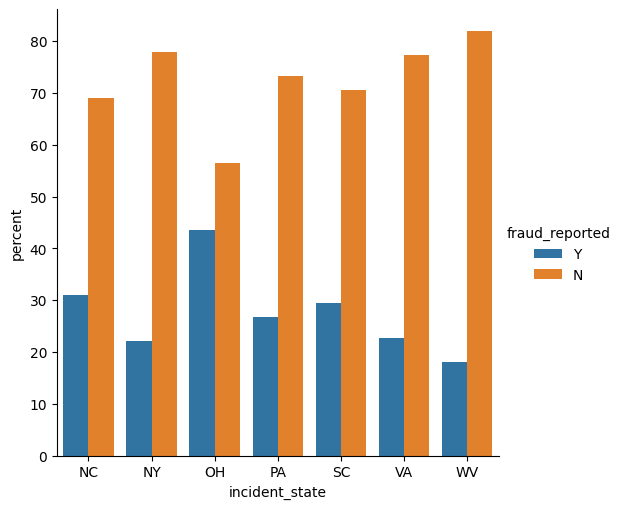

In [10]:
plt.figure(figsize=(10,6))
df.groupby("incident_state")["fraud_reported"].value_counts(normalize=True).mul(100).rename('percent').reset_index().pipe((sns.catplot,'data'), x="incident_state",y='percent',hue="fraud_reported", hue_order = ["Y", "N"],kind='bar')
plt.show()


##### By number the most number of fraud claims reported is in SC, but by percentage within the state its OH

In [11]:
# Top 5 States where we are getting most insurance claims (incident_state)
df["auto_make"].value_counts()[:5]

Saab         80
Dodge        80
Suburu       80
Nissan       78
Chevrolet    76
Name: auto_make, dtype: int64

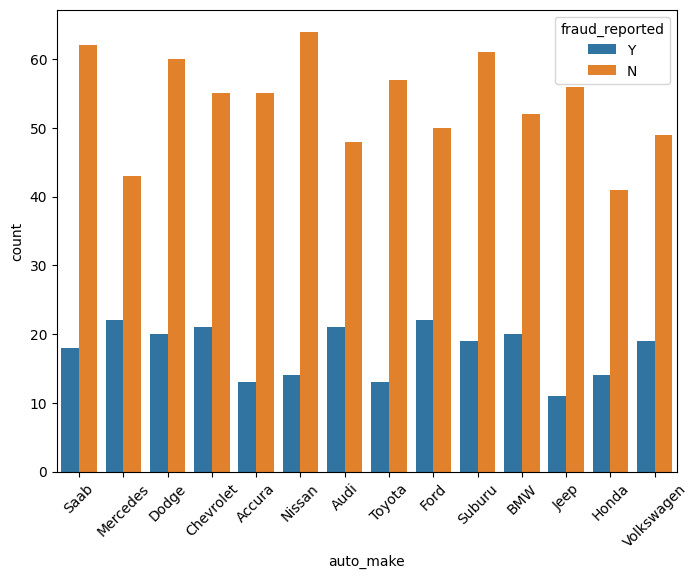

In [12]:
# Plotting count of fraud_reported by auto model
plt.figure(figsize=(8,6))
chart = sns.countplot(x="auto_make", data=df, hue="fraud_reported")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.show()

##### No significant difference with auto_make

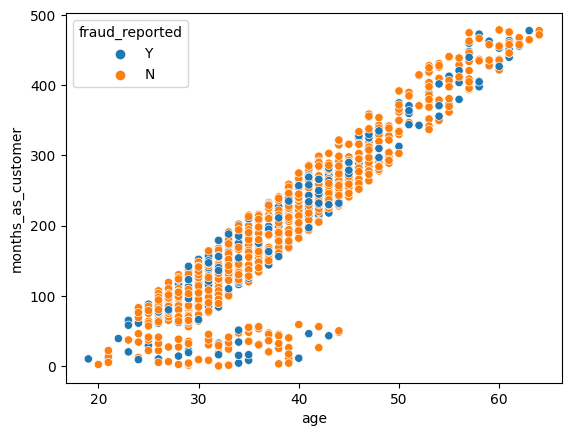

In [13]:
# Relation between age and months_as_customer
sns.scatterplot(x="age", y="months_as_customer", hue="fraud_reported", data=df)
plt.show()

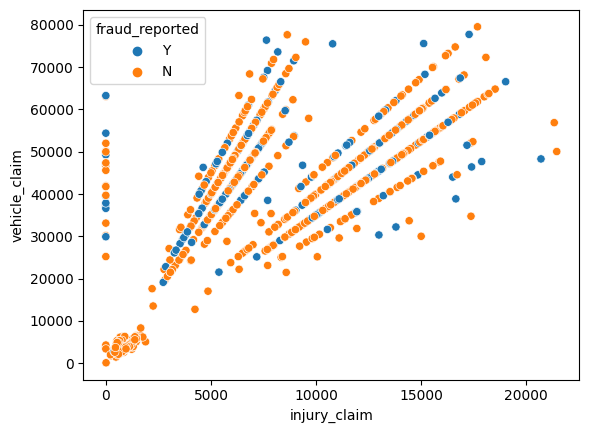

In [14]:
# Relation between injury claim and vehicle_claim
sns.scatterplot(x="injury_claim", y="vehicle_claim", hue="fraud_reported", data=df)
plt.show()

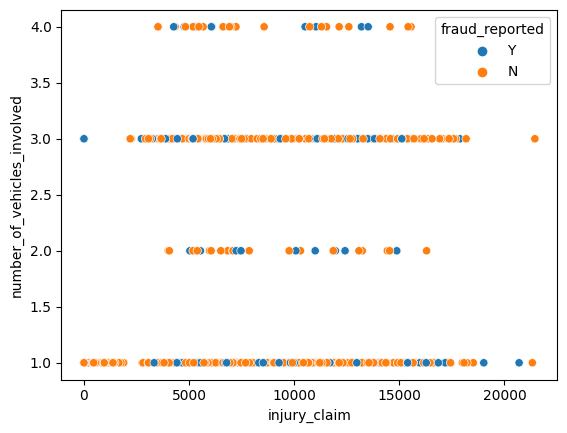

In [15]:
# Relation between injury claim and number of vehicles involved
sns.scatterplot(x="injury_claim", y="number_of_vehicles_involved", hue="fraud_reported", data=df)
plt.show()

### Missing values

In [16]:
# It looks like the dataset has no missing values, however this is misleading.
# Upon inspecting the CSV file, the missing values are denoted by '?'
# Replace missing values by NaN
df.replace(to_replace="?", value=np.nan, inplace=True)
df.head(3)

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2014-10-17,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,NaN,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NaN,0,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,2000-09-06,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N


In [17]:
# Check missing values
df.isnull().sum()


months_as_customer               0
age                              0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_availa

#### Missing values in collision_type, property_damage, and police_report_available
#### Various ways to deal with missing data:
    i) Exclude rows with missing values 
    ii) Imputation of missing values with some operation of existing values (constant, mean, median, etc)
    iii) "Smart" imputing by using a trained model to guess missing values
    iV) Use multiple-copula imputation.

### All missing values are in columns with categorical variables so impute their missing values by the mode of the values for that column

In [18]:
from sklearn.impute import SimpleImputer

In [19]:
imp = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

df[["collision_type", "property_damage", "police_report_available"]] = imp.fit_transform(X=df[["collision_type", "property_damage", "police_report_available"]])


In [20]:
# Again heck missing values
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

In [21]:
# How many categorical columns are there?
cat = df.columns[df.dtypes == "object"]
cat

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [22]:
# Number of elements in each categorical column
df[cat].nunique()

policy_bind_date            951
policy_state                  3
policy_csl                    3
insured_sex                   2
insured_education_level       7
insured_occupation           14
insured_hobbies              20
insured_relationship          6
incident_date                60
incident_type                 4
collision_type                3
incident_severity             4
authorities_contacted         5
incident_state                7
incident_city                 7
incident_location          1000
property_damage               2
police_report_available       2
auto_make                    14
auto_model                   39
fraud_reported                2
dtype: int64

In [23]:
# The columns with >=20 unique values do not add much in prediction so drop those columns:
col_drop_ind = df[cat].nunique() >= 10
col_drop = df[cat].columns[col_drop_ind]
col_drop

Index(['policy_bind_date', 'insured_occupation', 'insured_hobbies',
       'incident_date', 'incident_location', 'auto_make', 'auto_model'],
      dtype='object')

In [24]:
# Drop above columns
df.drop(columns=col_drop, inplace=True)

# Also total_claim_amount is the sum of other claims
df.drop(columns="total_claim_amount", inplace=True)


In [25]:
# Check categorical variables again
cat = df.columns[df.dtypes == "object"]
df[cat].nunique()

policy_state               3
policy_csl                 3
insured_sex                2
insured_education_level    7
insured_relationship       6
incident_type              4
collision_type             3
incident_severity          4
authorities_contacted      5
incident_state             7
incident_city              7
property_damage            2
police_report_available    2
fraud_reported             2
dtype: int64

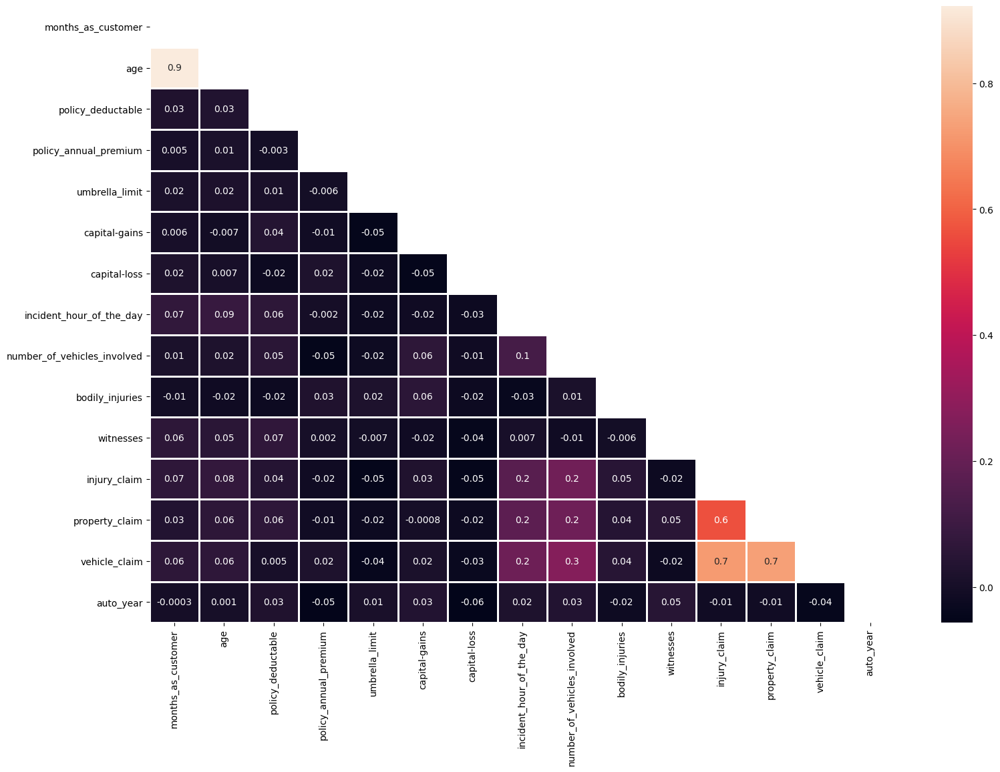

In [26]:
# Make a heat map for finding correlated variables:

plt.figure(figsize=(18,12))
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))
sns.heatmap(data = corr, mask = mask, annot = True, fmt = '.1g', linewidth = 1)
plt.show()


In [27]:
df[cat].head(3)
len(df[cat].columns)

14

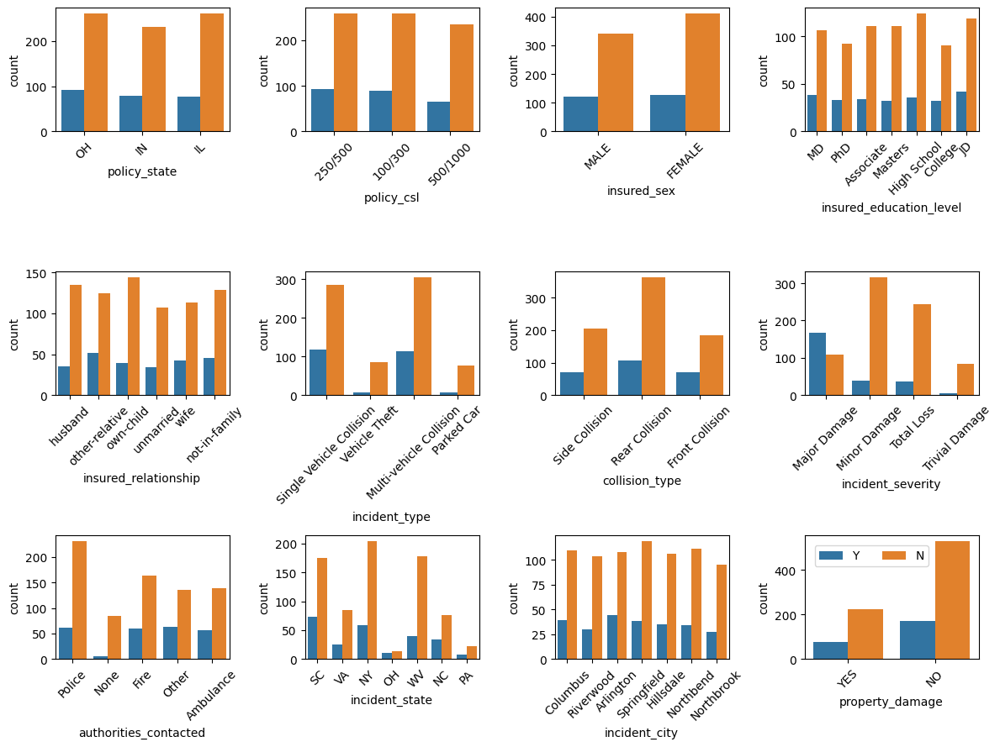

In [28]:
# Plot all categorical variables to see if any feature stand out

# Categorical columns
cat = df.columns[df.dtypes == "object"]
cat

fig , ax = plt.subplots(3,4,figsize = (12,9))
for i , subplots in zip (df[cat], ax.flatten()):  
    chart = sns.countplot(df[cat][i],hue = df[cat]['fraud_reported'],ax = subplots)
    chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
    chart.get_legend().remove()
# add legend
handles, labels = chart.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.93, 0.28))

plt.tight_layout()
plt.show()

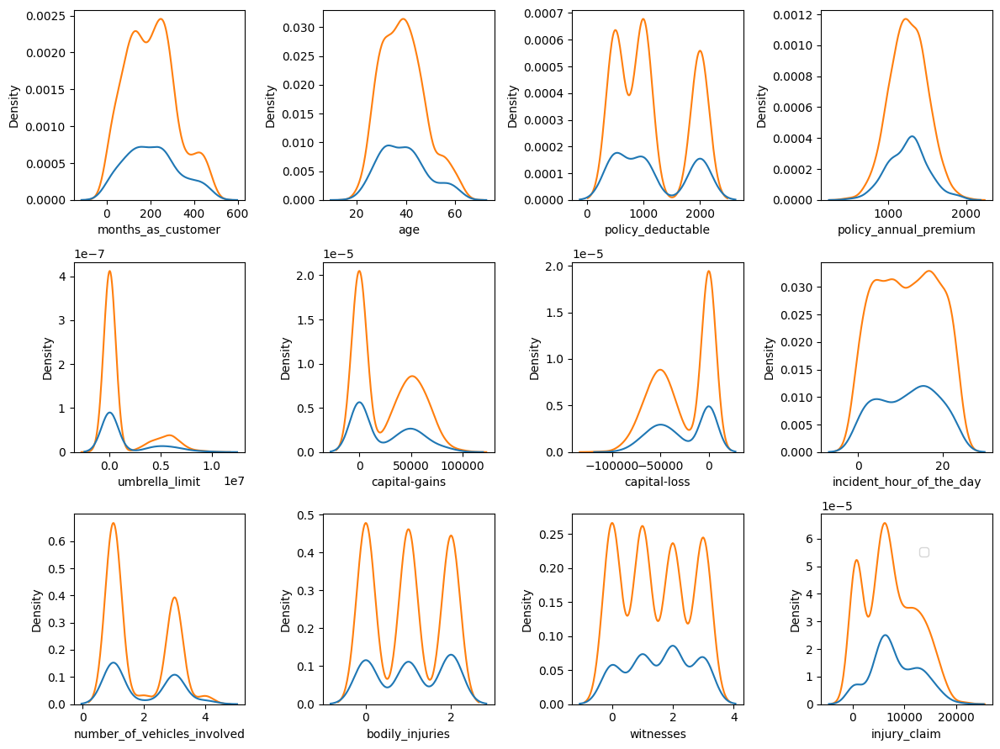

In [29]:
# How many non-categorical columns are there?
noncat = df.columns[df.dtypes != "object"]
noncat, len(noncat)

# Plot all non-categorical variables to see if any feature stand out
fig , ax = plt.subplots(3,4,figsize = (12,9))
for i , subplots in zip (df[noncat], ax.flatten()):  
    chart=sns.kdeplot(x=df[noncat][i], data=df, hue="fraud_reported", ax=subplots)
    chart.get_legend().remove()
# add legend
handles, labels = chart.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', ncol=3, bbox_to_anchor=(.93, 0.28))

plt.tight_layout()
plt.show()

In [30]:
df.head(2)

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,6510,13020,52080,2004,Y
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,780,780,3510,2007,Y


### Encoding categorical columns

In [31]:
# Dataframe of categorical columns
df_cat = df[cat]
df_cat.head(3)


,policy_state,policy_csl,insured_sex,insured_education_level,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,fraud_reported
0,OH,250/500,MALE,MD,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,YES,YES,Y
1,IN,250/500,MALE,MD,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,NO,NO,Y
2,OH,100/300,FEMALE,PhD,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,NO,NO,N


In [32]:
# Number of unique elements in each categorical column
df_cat.nunique()

policy_state               3
policy_csl                 3
insured_sex                2
insured_education_level    7
insured_relationship       6
incident_type              4
collision_type             3
incident_severity          4
authorities_contacted      5
incident_state             7
incident_city              7
property_damage            2
police_report_available    2
fraud_reported             2
dtype: int64

In [33]:
# Use pandas to encode categories
df_cat = pd.get_dummies(df_cat, drop_first = True)
df_cat.head(3)

,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,fraud_reported_Y
0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,1
1,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
2,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [34]:
# Non-categorical columns
df_noncat = df[noncat]
df_noncat.head(3)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year
0,328,48,1000,1406.91,0,53300,0,5,1,1,2,6510,13020,52080,2004
1,228,42,2000,1197.22,5000000,0,0,8,1,0,0,780,780,3510,2007
2,134,29,2000,1413.14,5000000,35100,0,7,3,2,3,7700,3850,23100,2007


In [35]:
# Combine both categorical and non-categorical variables
df = pd.concat([df_noncat, df_cat], axis=1)
df.head(3)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,fraud_reported_Y
0,328,48,1000,1406.91,0,53300,0,5,1,1,2,6510,13020,52080,2004,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,1
1,228,42,2000,1197.22,5000000,0,0,8,1,0,0,780,780,3510,2007,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
2,134,29,2000,1413.14,5000000,35100,0,7,3,2,3,7700,3850,23100,2007,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [36]:
print(df_cat.shape, df_noncat.shape, df.shape)

(1000, 43) (1000, 15) (1000, 58)


### Data preparation for predictive modeling. Train-test split.

In [37]:
# Features and label
X = df.drop("fraud_reported_Y", axis=1)
y = df[["fraud_reported_Y"]]

In [38]:
# split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#### Feature scaling

In [39]:
df_Xtrain_noncat = X_train[noncat]
df_Xtest_noncat = X_test[noncat]

df_Xtrain_noncat.head(3)


,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year
845,147,37,2000,1375.29,0,0,0,11,3,0,1,6240,6240,43680,2015
648,112,32,1000,1238.92,0,57800,-53700,4,1,0,2,460,920,3680,2012
698,164,31,500,1114.68,0,44500,-55900,5,1,1,0,480,480,3360,2002


In [40]:
# Feature scaling of non-categorical variables
from sklearn.preprocessing import StandardScaler

scalar = StandardScaler()
Xtrain_noncat_scaled = scalar.fit_transform(df_Xtrain_noncat)
Xtest_noncat_scaled = scalar.transform(df_Xtest_noncat)

df_Xtrain_noncat_scaled = pd.DataFrame(data = Xtrain_noncat_scaled, columns = df_Xtrain_noncat.columns, index = df_Xtrain_noncat.index)
df_Xtest_noncat_scaled = pd.DataFrame(data = Xtest_noncat_scaled, columns = df_Xtest_noncat.columns, index = df_Xtest_noncat.index)

df_Xtrain_noncat_scaled.head()


,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year
845,-0.499152,-0.218427,1.412559,0.499599,-0.459242,-0.897270,0.907166,-0.093566,1.131524,-1.220394,-0.431320,-0.266614,-0.240745,0.307550,1.621292
648,-0.805657,-0.768819,-0.220457,-0.066460,-0.459242,1.183734,-0.989121,-1.107889,-0.831466,-1.220394,0.472644,-1.421079,-1.333879,-1.801113,1.130133
698,-0.350279,-0.878898,-1.036965,-0.582169,-0.459242,0.704887,-1.066809,-0.962986,-0.831466,0.000000,-1.335284,-1.417084,-1.424288,-1.817982,-0.507063
725,-0.131347,0.001730,1.412559,-1.730559,-0.459242,-0.897270,0.907166,-0.673179,1.131524,1.220394,-1.335284,-0.226667,-0.199650,0.720848,-1.325661
447,1.296090,1.542828,-1.036965,2.234138,-0.459242,-0.897270,0.907166,1.645274,-0.831466,1.220394,0.472644,0.983723,-0.238690,0.640719,0.638974


In [41]:
# categorical df from Xtrain
df_Xtrain_cat = X_train.drop(columns=noncat, axis=1)
# and from Xtest
df_Xtest_cat = X_test.drop(columns=noncat, axis=1)

df_Xtrain_cat.head()


,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES
845,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
648,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
698,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0
725,0,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1
447,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0


In [42]:
# Concatenate scaled noncat data with categorical data, both from Xtrain and Xtest
X_train = pd.concat([df_Xtrain_noncat_scaled, df_Xtrain_cat], axis=1)
X_test = pd.concat([df_Xtest_noncat_scaled, df_Xtest_cat], axis=1)

X_train.head(3)

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim,auto_year,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES
845,-0.499152,-0.218427,1.412559,0.499599,-0.459242,-0.897270,0.907166,-0.093566,1.131524,-1.220394,-0.431320,-0.266614,-0.240745,0.307550,1.621292,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
648,-0.805657,-0.768819,-0.220457,-0.066460,-0.459242,1.183734,-0.989121,-1.107889,-0.831466,-1.220394,0.472644,-1.421079,-1.333879,-1.801113,1.130133,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
698,-0.350279,-0.878898,-1.036965,-0.582169,-0.459242,0.704887,-1.066809,-0.962986,-0.831466,0.000000,-1.335284,-1.417084,-1.424288,-1.817982,-0.507063,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0


### Now the data is ready for model fitting

# 1. Decision Tree

In [43]:
# import
from sklearn.tree import DecisionTreeClassifier


In [44]:
# To avoid over-fitting, set certain parameters
# one way to select min_sample_leaf = some percent (1%) of training set; and minimum Gini impurity = 1%
minImpurity = 0.5*0.01      # 1% of maximum
minSample = int(X_train.shape[0]*0.01)      # 1% of training data
print(minImpurity, minSample)

0.005 7


In [45]:
# (min_impurity_split=minImpurity, min_samples_leaf = minSample)

In [46]:
# fit
dt = DecisionTreeClassifier(criterion='gini', min_samples_leaf=minSample, min_impurity_decrease=minImpurity)
dt.fit(X_train, y_train)

# predict
y_pred = dt.predict(X_test)

In [47]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

dt_train_acc = accuracy_score(y_train, dt.predict(X_train))
dt_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {dt_train_acc}")
print(f"Test accuracy of Decision Tree is : {dt_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 0.8285714285714286
Test accuracy of Decision Tree is : 0.77
[[209  18]
 [ 51  22]]
              precision    recall  f1-score   support

           0       0.80      0.92      0.86       227
           1       0.55      0.30      0.39        73

    accuracy                           0.77       300
   macro avg       0.68      0.61      0.62       300
weighted avg       0.74      0.77      0.74       300



In [48]:
# Use Cross Validation and Grid Search to find optimal hyperparameters for the best model

from sklearn.model_selection import GridSearchCV

grid_params = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'min_impurity_decrease' : [0.001, 0.0025, 0.005, 0.0075, 0.01],
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(2, 10, 1)
}

grid_search = GridSearchCV(dt, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 2560 candidates, totalling 12800 fits


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(min_impurity_decrease=0.005,
                                              min_samples_leaf=7),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_impurity_decrease': [0.001, 0.0025, 0.005, 0.0075,
                                                   0.01],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10)},
             verbose=1)

In [49]:
# Best fitting parameters
print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'gini', 'max_depth': 3, 'min_impurity_decrease': 0.001, 'min_samples_leaf': 4, 'min_samples_split': 9}
0.8028571428571428


In [50]:
# Choose the best estimator from the grid
dt_grid = grid_search.best_estimator_

# predict using the best estimator
y_pred = dt_grid.predict(X_test)

In [51]:
# accuracy_score, confusion_matrix and classification_report

dt_grid_train_acc = accuracy_score(y_train, dt_grid.predict(X_train))
dt_grid_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {dt_grid_train_acc}")
print(f"Test accuracy of Decision Tree is : {dt_grid_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 0.81
Test accuracy of Decision Tree is : 0.81
[[198  29]
 [ 28  45]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.87       227
           1       0.61      0.62      0.61        73

    accuracy                           0.81       300
   macro avg       0.74      0.74      0.74       300
weighted avg       0.81      0.81      0.81       300



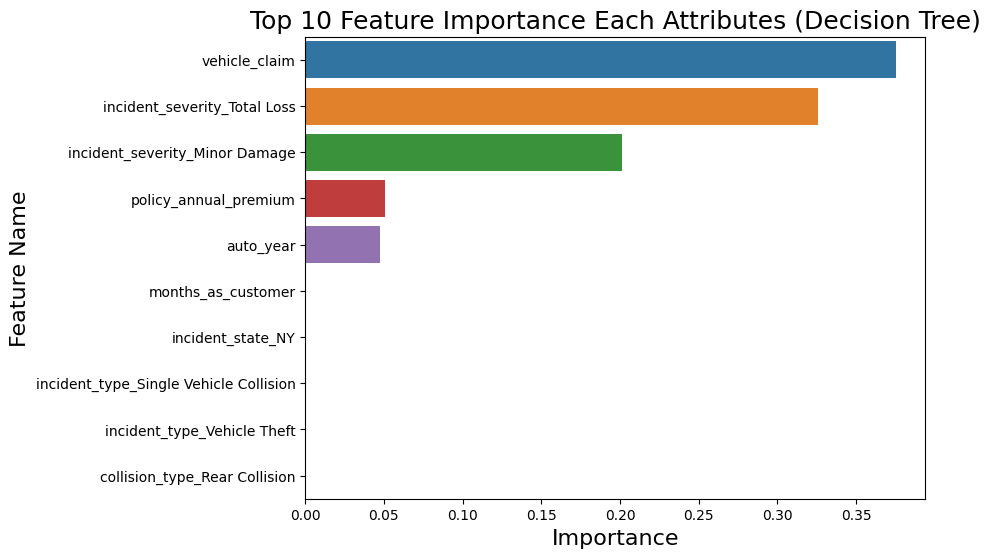

In [61]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": dt.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (Decision Tree)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

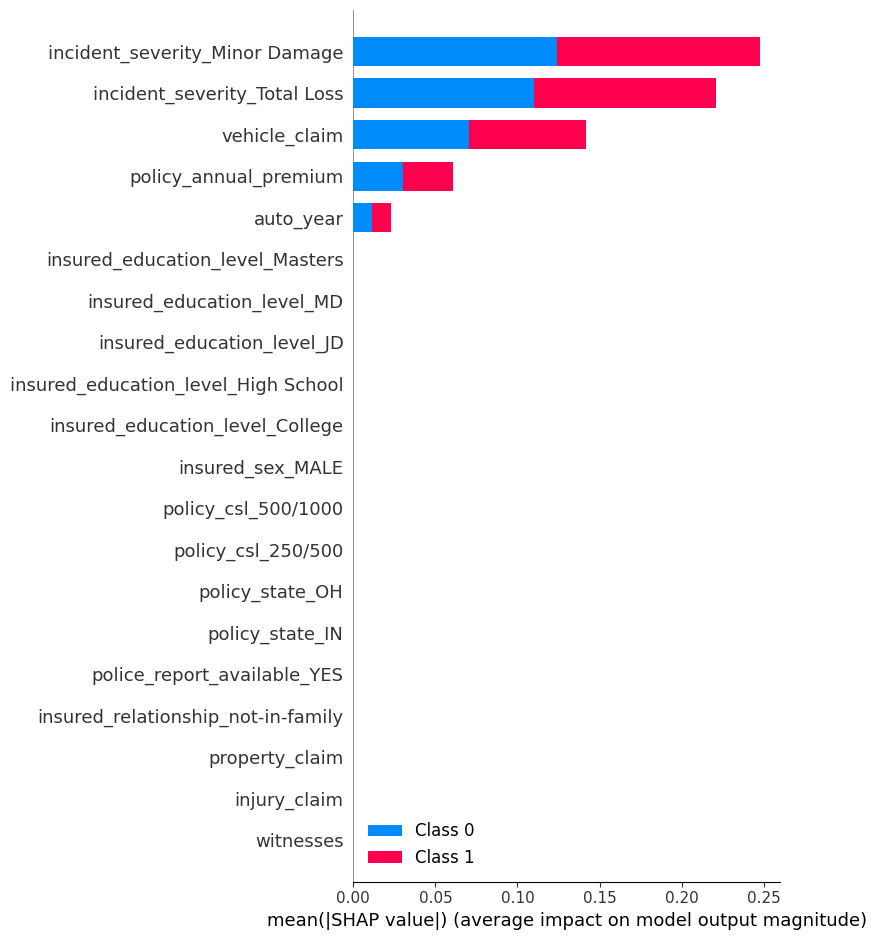

In [62]:
import shap
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

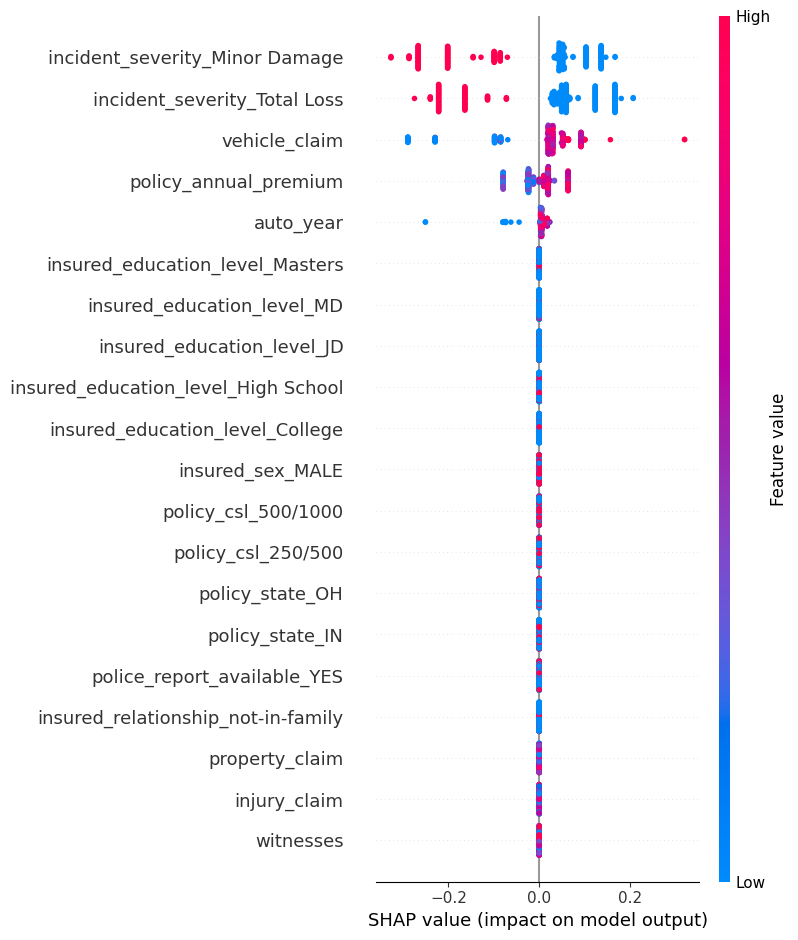

In [63]:
# compute SHAP values
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values[1], X_test.values, feature_names = X_test.columns)

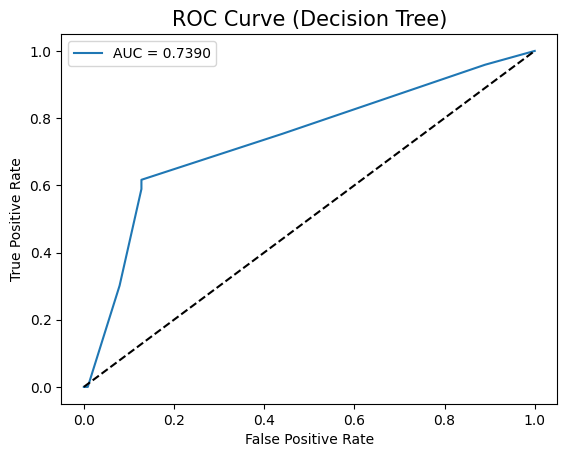

In [78]:
from sklearn.metrics import roc_curve, roc_auc_score
y_pred_proba = dt.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Decision Tree)', size = 15)
plt.legend()
plt.show()


# 2. Random Forest

In [52]:
# import
from sklearn.ensemble import RandomForestClassifier


In [53]:
# fit
rf = RandomForestClassifier(n_estimators=500, criterion='gini', min_samples_leaf=5, min_impurity_decrease=0.001)
rf.fit(X_train, y_train)

# predict
y_pred = rf.predict(X_test)

In [54]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

rf_train_acc = accuracy_score(y_train, rf.predict(X_train))
rf_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {rf_train_acc}")
print(f"Test accuracy of Decision Tree is : {rf_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 0.8742857142857143
Test accuracy of Decision Tree is : 0.7633333333333333
[[226   1]
 [ 70   3]]
              precision    recall  f1-score   support

           0       0.76      1.00      0.86       227
           1       0.75      0.04      0.08        73

    accuracy                           0.76       300
   macro avg       0.76      0.52      0.47       300
weighted avg       0.76      0.76      0.67       300



### !!! WARNING: The code below takes super long time to run

In [55]:
# Use Cross Validation and Grid Search to find optimal hyperparameters for the best model
grid_params = {
    'n_estimators' : [200, 500],
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'min_impurity_decrease' : [0.0025, 0.005, 0.0075, 0.01],
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(2, 10, 1)
}

grid_search = GridSearchCV(rf, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 4096 candidates, totalling 20480 fits


GridSearchCV(cv=5,
             estimator=RandomForestClassifier(min_impurity_decrease=0.001,
                                              min_samples_leaf=5,
                                              n_estimators=500),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_impurity_decrease': [0.0025, 0.005, 0.0075, 0.01],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10),
                         'n_estimators': [200, 500]},
             verbose=1)

In [56]:
# Best fitting parameters
print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'entropy', 'max_depth': 10, 'min_impurity_decrease': 0.0025, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
0.7571428571428571


In [57]:
# Choose the best estimator from the grid
rf_grid = grid_search.best_estimator_

# predict using the best estimator
y_pred = rf_grid.predict(X_test)

In [59]:
# accuracy_score, confusion_matrix and classification_report

rf_grid_train_acc = accuracy_score(y_train, rf_grid.predict(X_train))
rf_grid_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {rf_grid_train_acc}")
print(f"Test accuracy of Decision Tree is : {rf_grid_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 0.8728571428571429
Test accuracy of Decision Tree is : 0.7533333333333333
[[221   6]
 [ 68   5]]
              precision    recall  f1-score   support

           0       0.76      0.97      0.86       227
           1       0.45      0.07      0.12        73

    accuracy                           0.75       300
   macro avg       0.61      0.52      0.49       300
weighted avg       0.69      0.75      0.68       300



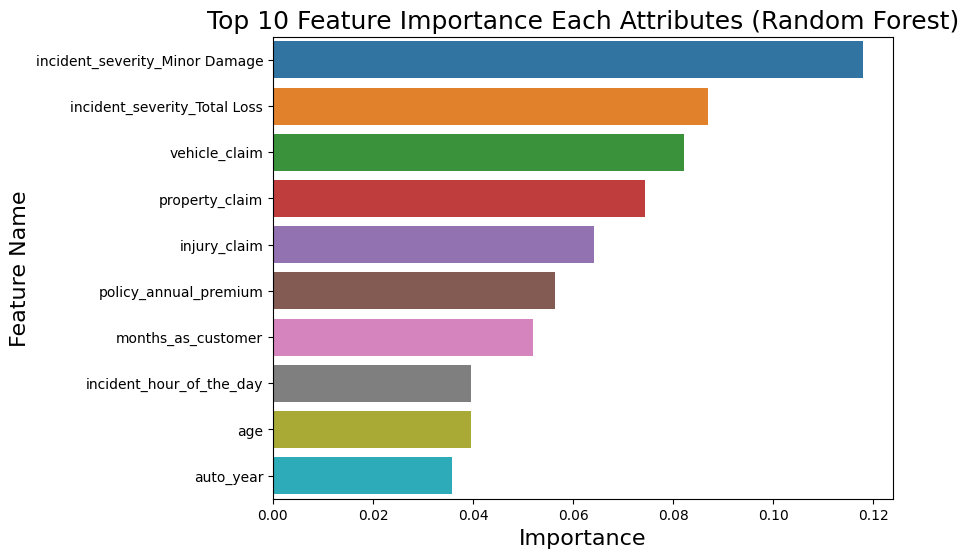

In [77]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": rf.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (Random Forest)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

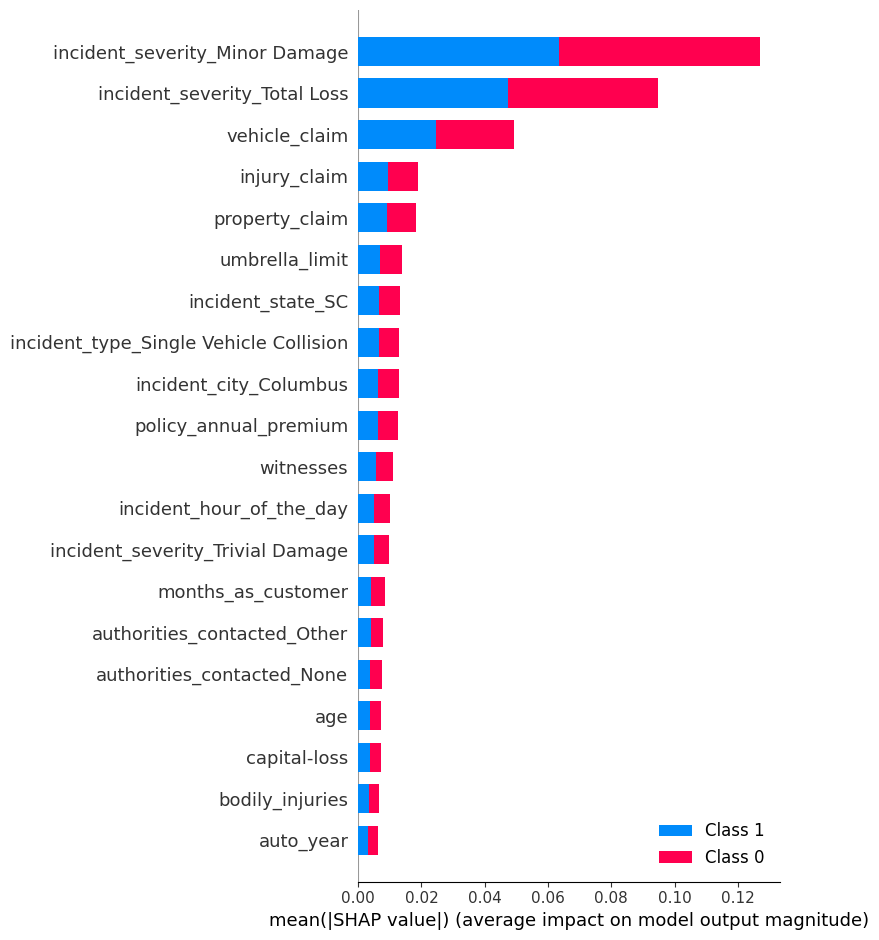

In [68]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

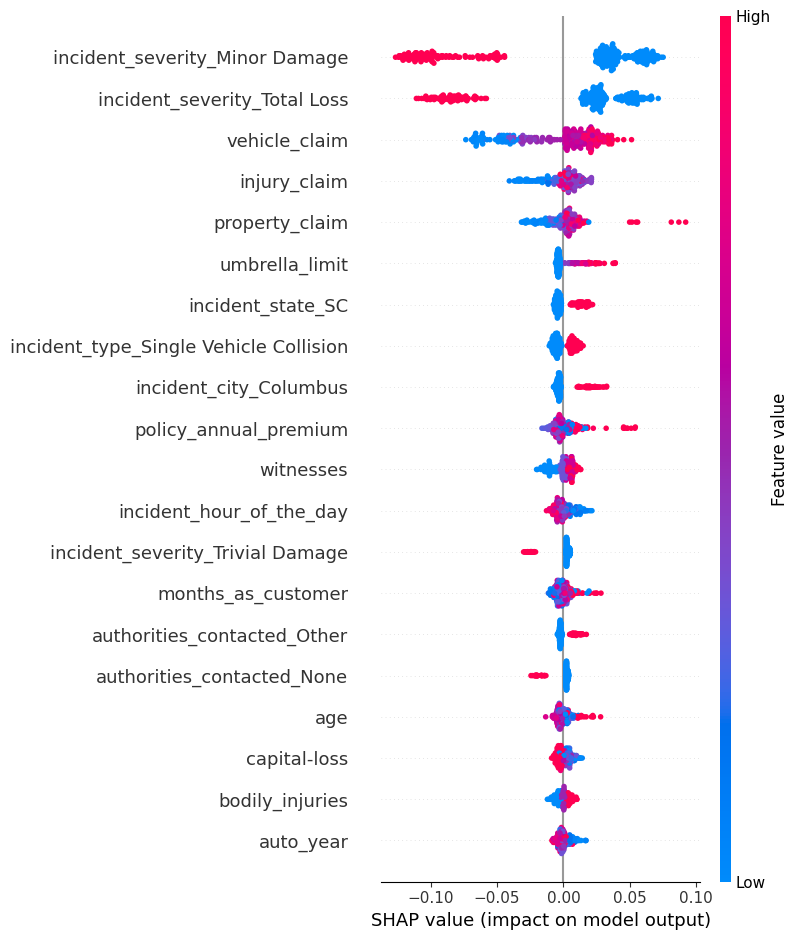

In [69]:
# compute SHAP values
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values[1], X_test.values, feature_names = X_test.columns)

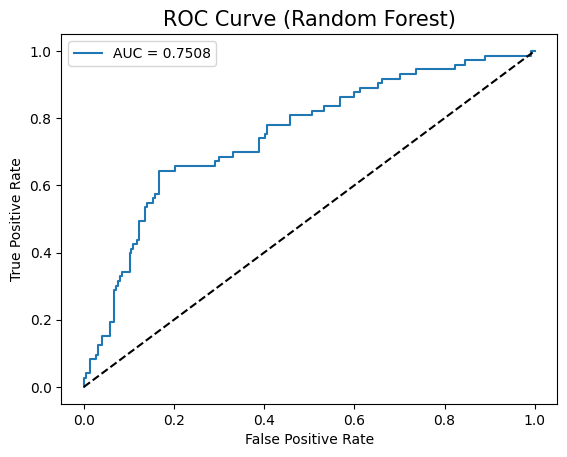

In [79]:
# ROC/AUC diagram
y_pred_proba = rf.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Random Forest)', size = 15)
plt.legend()
plt.show()


# 3. AdaBoost Classifier

In [71]:
# import
from sklearn.ensemble import AdaBoostClassifier

In [72]:
# Grid search and cross-validation
ada = AdaBoostClassifier(estimator = dt)

parameters = {
    'n_estimators' : [50, 70, 90, 120, 180, 200],
    'learning_rate' : [0.001, 0.01, 0.1, 1, 10],
    'algorithm' : ['SAMME', 'SAMME.R']
}

grid_search = GridSearchCV(ada, parameters, n_jobs = -1, cv = 5, verbose = 2)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(min_impurity_decrease=0.005,
                                                                           min_samples_leaf=7)),
             n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'n_estimators': [50, 70, 90, 120, 180, 200]},
             verbose=2)

In [73]:
# best parameter and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'algorithm': 'SAMME', 'learning_rate': 0.01, 'n_estimators': 50}
0.8014285714285714


In [74]:
# best estimator 
ada = grid_search.best_estimator_
y_pred = ada.predict(X_test)

In [75]:
# accuracy_score, confusion_matrix and classification_report

ada_train_acc = accuracy_score(y_train, ada.predict(X_train))
ada_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Ada Boost is : {ada_train_acc}")
print(f"Test accuracy of Ada Boost is : {ada_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Ada Boost is : 0.8085714285714286
Test accuracy of Ada Boost is : 0.8166666666666667
[[198  29]
 [ 26  47]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88       227
           1       0.62      0.64      0.63        73

    accuracy                           0.82       300
   macro avg       0.75      0.76      0.75       300
weighted avg       0.82      0.82      0.82       300



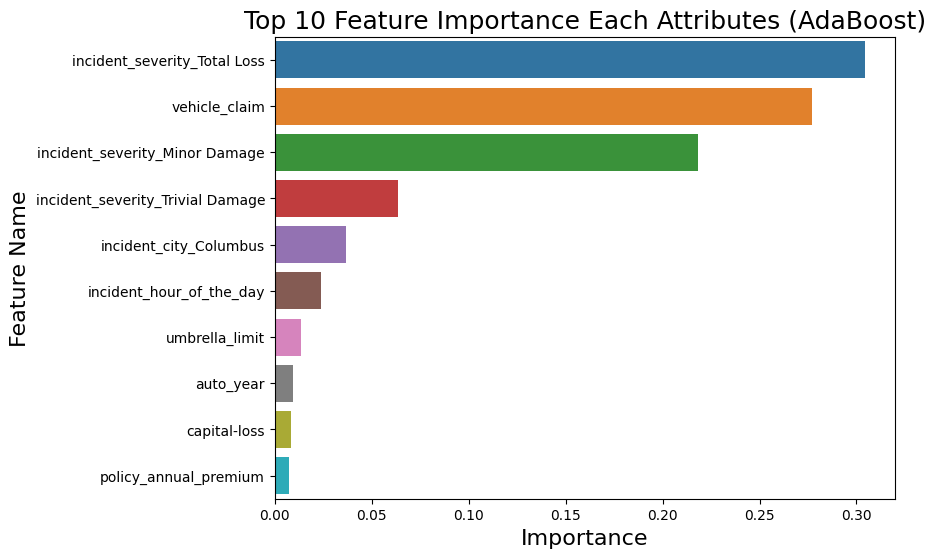

In [82]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": ada.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (AdaBoost)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

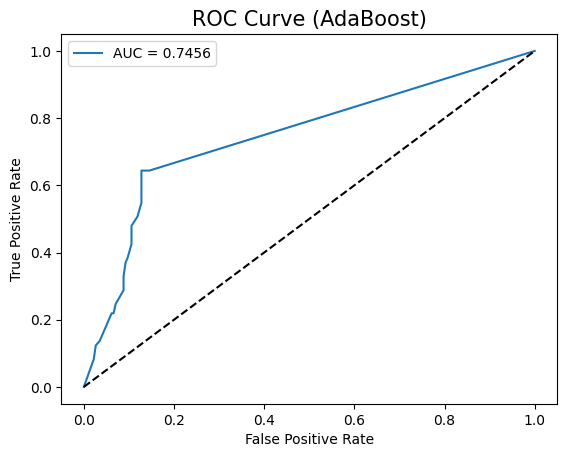

In [83]:
# ROC/AUC diagram
y_pred_proba = ada.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (AdaBoost)', size = 15)
plt.legend()
plt.show()


# 4. Gradient Boosting Classifier

In [84]:
# import
from sklearn.ensemble import GradientBoostingClassifier


In [86]:
# Grid Search and Cross Validation

gb = GradientBoostingClassifier()

parameters = {
    'n_estimators' : [50, 70, 90, 120],
    'learning_rate' : [0.001, 0.01, 0.1, 1, 10]
}

grid_search = GridSearchCV(gb, parameters, n_jobs = -1, cv = 5, verbose = 2)
grid_search.fit(X_train, y_train)



Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'n_estimators': [50, 70, 90, 120]},
             verbose=2)

In [87]:
# best parameter and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'learning_rate': 0.1, 'n_estimators': 50}
0.7828571428571429


In [88]:
# best estimator 
gb = grid_search.best_estimator_
y_pred = gb.predict(X_test)

In [89]:
# accuracy_score, confusion_matrix and classification_report

gb_train_acc = accuracy_score(y_train, gb.predict(X_train))
gb_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Gradient Boost is : {gb_train_acc}")
print(f"Test accuracy of Gradient Boost is : {gb_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Gradient Boost is : 0.8971428571428571
Test accuracy of Gradient Boost is : 0.7733333333333333
[[203  24]
 [ 44  29]]
              precision    recall  f1-score   support

           0       0.82      0.89      0.86       227
           1       0.55      0.40      0.46        73

    accuracy                           0.77       300
   macro avg       0.68      0.65      0.66       300
weighted avg       0.76      0.77      0.76       300



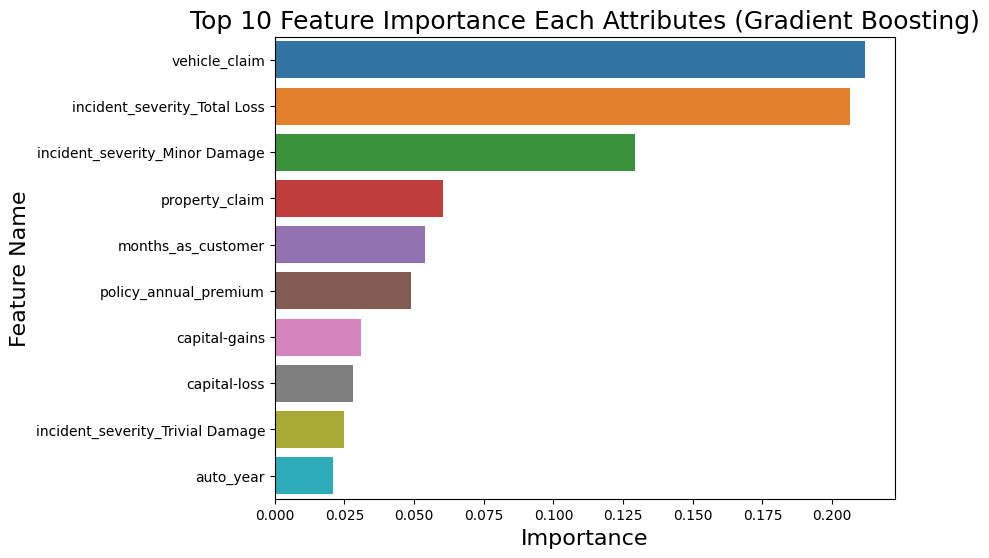

In [90]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": gb.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (Gradient Boosting)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

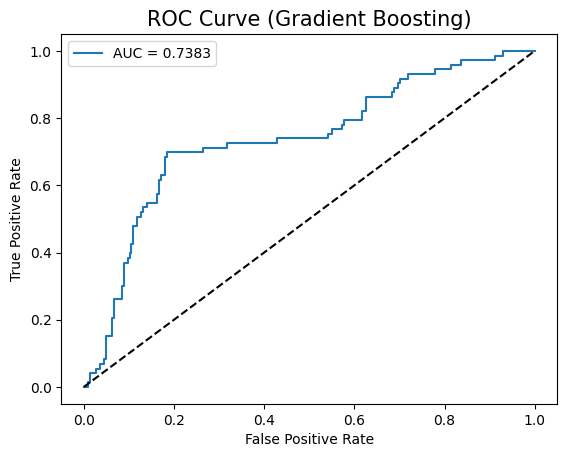

In [91]:
# ROC/AUC diagram
y_pred_proba = gb.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Gradient Boosting)', size = 15)
plt.legend()
plt.show()


# 5. Stochastic Gradient Boosting Classifier

In [92]:
# Grid Search and Cross Validation

sgb = GradientBoostingClassifier(subsample = 0.90, max_features = 0.70)

parameters = {
    'n_estimators' : [50, 70, 90, 120],
    'learning_rate' : [0.001, 0.01, 0.1, 1, 10]
}

grid_search = GridSearchCV(sgb, parameters, n_jobs = -1, cv = 5, verbose = 2)
grid_search.fit(X_train, y_train)


Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(cv=5,
             estimator=GradientBoostingClassifier(max_features=0.7,
                                                  subsample=0.9),
             n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'n_estimators': [50, 70, 90, 120]},
             verbose=2)

In [93]:
# best parameter and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'learning_rate': 0.1, 'n_estimators': 90}
0.7828571428571429


In [94]:
# best estimator 
sgb = grid_search.best_estimator_
y_pred = sgb.predict(X_test)

In [95]:
# accuracy_score, confusion_matrix and classification_report

sgb_train_acc = accuracy_score(y_train, sgb.predict(X_train))
sgb_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Gradient Boost is : {sgb_train_acc}")
print(f"Test accuracy of Gradient Boost is : {sgb_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Gradient Boost is : 0.9428571428571428
Test accuracy of Gradient Boost is : 0.79
[[204  23]
 [ 40  33]]
              precision    recall  f1-score   support

           0       0.84      0.90      0.87       227
           1       0.59      0.45      0.51        73

    accuracy                           0.79       300
   macro avg       0.71      0.68      0.69       300
weighted avg       0.78      0.79      0.78       300



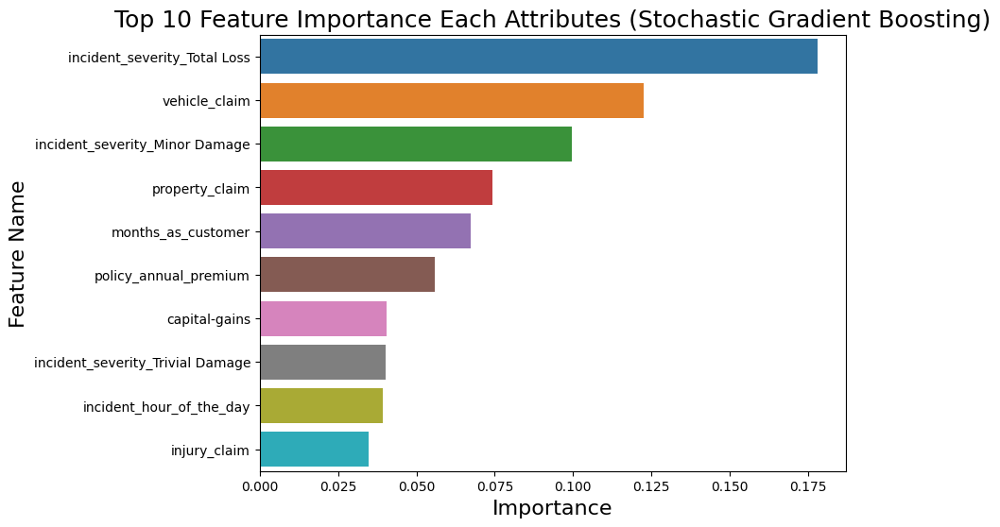

In [96]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": sgb.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (Stochastic Gradient Boosting)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

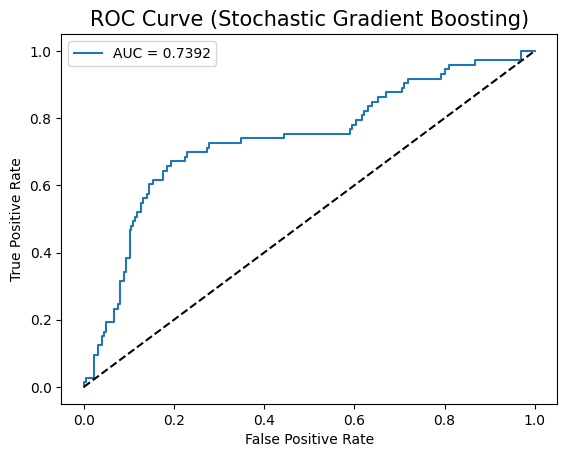

In [97]:
# ROC/AUC diagram
y_pred_proba = sgb.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Stochastic Gradient Boosting)', size = 15)
plt.legend()
plt.show()


# 6. Extreme Gradient Boosting (XGBOOST)

In [98]:
# Import
from xgboost import XGBClassifier

In [99]:
# Create an instance of the XGBoost classifier
xgb = XGBClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 10],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'random_state': [0, 42]
}

# Perform a grid search with cross-validation to find the best hyperparameters
grid_search = GridSearchCV(xgb, param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 10], 'n_estimators': [100, 200],
                         'random_state': [0, 42], 'subsample': [0.8, 1.0]})

In [104]:
# best parameter and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'colsample_bytree': 1.0, 'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'random_state': 0, 'subsample': 0.8}
0.8057142857142857


In [105]:
# best estimator 
xgb = grid_search.best_estimator_
y_pred = xgb.predict(X_test)

In [106]:
# accuracy_score, confusion_matrix and classification_report

xgb_train_acc = accuracy_score(y_train, xgb.predict(X_train))
xgb_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of XGBoost is : {xgb_train_acc}")
print(f"Test accuracy of XGBoost is : {xgb_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of XGBoost is : 0.8157142857142857
Test accuracy of XGBoost is : 0.7933333333333333
[[200  27]
 [ 35  38]]
              precision    recall  f1-score   support

           0       0.85      0.88      0.87       227
           1       0.58      0.52      0.55        73

    accuracy                           0.79       300
   macro avg       0.72      0.70      0.71       300
weighted avg       0.79      0.79      0.79       300



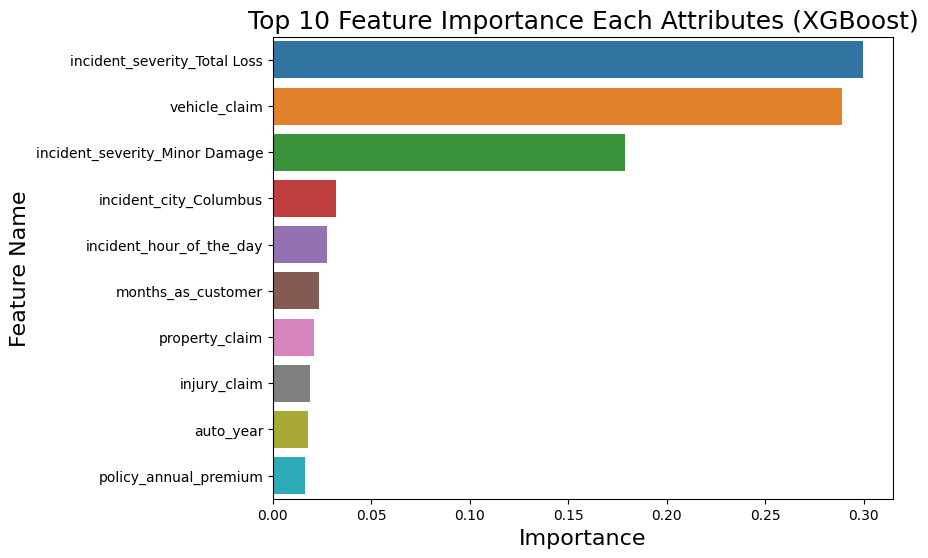

In [107]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": xgb.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (XGBoost)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

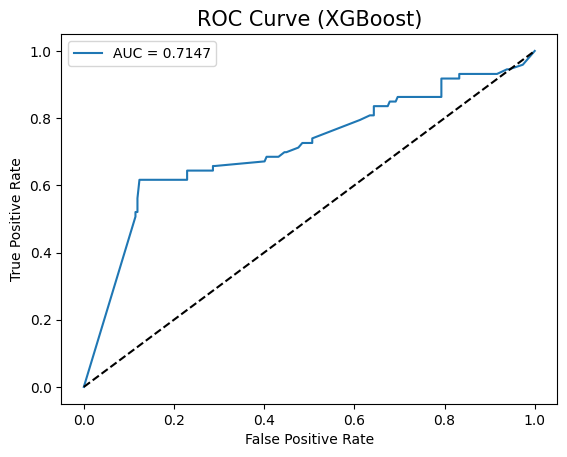

In [108]:
# ROC/AUC diagram
y_pred_proba = xgb.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (XGBoost)', size = 15)
plt.legend()
plt.show()


# 7. CatBoost

In [110]:
# Import
from catboost import CatBoostClassifier


In [111]:
# Create an instance of the catBoost classifier
cat = CatBoostClassifier()

# Define the parameter grid
param_grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [3, 5, 7]}

# Perform a grid search with cross-validation to find the best hyperparameters
grid_search = GridSearchCV(cat, param_grid, cv=5)
grid_search.fit(X_train, y_train)

0:	learn: 0.6834015	total: 49.2ms	remaining: 49.2s
1:	learn: 0.6666732	total: 50.3ms	remaining: 25.1s
2:	learn: 0.6516970	total: 51.1ms	remaining: 17s
3:	learn: 0.6407632	total: 52ms	remaining: 12.9s
4:	learn: 0.6266881	total: 52.8ms	remaining: 10.5s
5:	learn: 0.6160337	total: 53.7ms	remaining: 8.9s
6:	learn: 0.6072263	total: 54.7ms	remaining: 7.75s
7:	learn: 0.6007311	total: 55.5ms	remaining: 6.88s
8:	learn: 0.5926372	total: 56.3ms	remaining: 6.2s
9:	learn: 0.5874910	total: 57.1ms	remaining: 5.65s
10:	learn: 0.5823200	total: 58ms	remaining: 5.21s
11:	learn: 0.5771354	total: 59ms	remaining: 4.86s
12:	learn: 0.5703939	total: 60ms	remaining: 4.55s
13:	learn: 0.5661341	total: 61ms	remaining: 4.29s
14:	learn: 0.5618478	total: 61.9ms	remaining: 4.07s
15:	learn: 0.5582559	total: 62.8ms	remaining: 3.86s
16:	learn: 0.5538240	total: 63.6ms	remaining: 3.68s
17:	learn: 0.5473802	total: 64.5ms	remaining: 3.52s
18:	learn: 0.5441469	total: 65.5ms	remaining: 3.38s
19:	learn: 0.5406019	total: 66.4ms	r

215:	learn: 0.2842769	total: 216ms	remaining: 783ms
216:	learn: 0.2833681	total: 217ms	remaining: 782ms
217:	learn: 0.2828896	total: 217ms	remaining: 780ms
218:	learn: 0.2819650	total: 218ms	remaining: 779ms
219:	learn: 0.2815021	total: 219ms	remaining: 777ms
220:	learn: 0.2809262	total: 220ms	remaining: 775ms
221:	learn: 0.2801413	total: 221ms	remaining: 773ms
222:	learn: 0.2797197	total: 221ms	remaining: 771ms
223:	learn: 0.2790985	total: 222ms	remaining: 769ms
224:	learn: 0.2786736	total: 223ms	remaining: 768ms
225:	learn: 0.2782245	total: 224ms	remaining: 767ms
226:	learn: 0.2774826	total: 225ms	remaining: 765ms
227:	learn: 0.2770869	total: 226ms	remaining: 764ms
228:	learn: 0.2765678	total: 226ms	remaining: 763ms
229:	learn: 0.2756641	total: 227ms	remaining: 761ms
230:	learn: 0.2748750	total: 228ms	remaining: 759ms
231:	learn: 0.2736390	total: 229ms	remaining: 757ms
232:	learn: 0.2728673	total: 230ms	remaining: 756ms
233:	learn: 0.2723693	total: 230ms	remaining: 754ms
234:	learn: 

435:	learn: 0.1520396	total: 385ms	remaining: 498ms
436:	learn: 0.1518016	total: 386ms	remaining: 497ms
437:	learn: 0.1515159	total: 387ms	remaining: 497ms
438:	learn: 0.1511868	total: 388ms	remaining: 495ms
439:	learn: 0.1508821	total: 388ms	remaining: 494ms
440:	learn: 0.1503581	total: 389ms	remaining: 493ms
441:	learn: 0.1498100	total: 390ms	remaining: 492ms
442:	learn: 0.1494667	total: 390ms	remaining: 491ms
443:	learn: 0.1492020	total: 391ms	remaining: 490ms
444:	learn: 0.1486408	total: 392ms	remaining: 489ms
445:	learn: 0.1483244	total: 392ms	remaining: 487ms
446:	learn: 0.1481858	total: 393ms	remaining: 486ms
447:	learn: 0.1477202	total: 394ms	remaining: 485ms
448:	learn: 0.1474751	total: 395ms	remaining: 484ms
449:	learn: 0.1471122	total: 395ms	remaining: 483ms
450:	learn: 0.1467649	total: 396ms	remaining: 482ms
451:	learn: 0.1465419	total: 397ms	remaining: 481ms
452:	learn: 0.1457586	total: 397ms	remaining: 480ms
453:	learn: 0.1454641	total: 398ms	remaining: 479ms
454:	learn: 

678:	learn: 0.0809704	total: 558ms	remaining: 264ms
679:	learn: 0.0806977	total: 559ms	remaining: 263ms
680:	learn: 0.0806567	total: 560ms	remaining: 262ms
681:	learn: 0.0806306	total: 561ms	remaining: 262ms
682:	learn: 0.0805441	total: 562ms	remaining: 261ms
683:	learn: 0.0804431	total: 562ms	remaining: 260ms
684:	learn: 0.0802080	total: 563ms	remaining: 259ms
685:	learn: 0.0799892	total: 564ms	remaining: 258ms
686:	learn: 0.0797150	total: 565ms	remaining: 257ms
687:	learn: 0.0794762	total: 566ms	remaining: 257ms
688:	learn: 0.0792567	total: 567ms	remaining: 256ms
689:	learn: 0.0792064	total: 568ms	remaining: 255ms
690:	learn: 0.0790462	total: 569ms	remaining: 254ms
691:	learn: 0.0789301	total: 569ms	remaining: 253ms
692:	learn: 0.0787763	total: 570ms	remaining: 253ms
693:	learn: 0.0786537	total: 571ms	remaining: 252ms
694:	learn: 0.0784227	total: 572ms	remaining: 251ms
695:	learn: 0.0782988	total: 574ms	remaining: 251ms
696:	learn: 0.0780318	total: 575ms	remaining: 250ms
697:	learn: 

891:	learn: 0.0495746	total: 731ms	remaining: 88.5ms
892:	learn: 0.0494797	total: 732ms	remaining: 87.7ms
893:	learn: 0.0493623	total: 733ms	remaining: 86.9ms
894:	learn: 0.0492371	total: 734ms	remaining: 86.1ms
895:	learn: 0.0490901	total: 735ms	remaining: 85.3ms
896:	learn: 0.0489744	total: 736ms	remaining: 84.5ms
897:	learn: 0.0489116	total: 737ms	remaining: 83.7ms
898:	learn: 0.0488202	total: 737ms	remaining: 82.8ms
899:	learn: 0.0486668	total: 738ms	remaining: 82ms
900:	learn: 0.0485202	total: 739ms	remaining: 81.2ms
901:	learn: 0.0484185	total: 740ms	remaining: 80.4ms
902:	learn: 0.0483736	total: 741ms	remaining: 79.6ms
903:	learn: 0.0482345	total: 742ms	remaining: 78.8ms
904:	learn: 0.0481010	total: 743ms	remaining: 78ms
905:	learn: 0.0479989	total: 744ms	remaining: 77.2ms
906:	learn: 0.0479222	total: 745ms	remaining: 76.4ms
907:	learn: 0.0478004	total: 746ms	remaining: 75.6ms
908:	learn: 0.0477120	total: 747ms	remaining: 74.7ms
909:	learn: 0.0475956	total: 748ms	remaining: 73.9

82:	learn: 0.3963631	total: 54.1ms	remaining: 598ms
83:	learn: 0.3952347	total: 54.9ms	remaining: 599ms
84:	learn: 0.3936514	total: 55.7ms	remaining: 599ms
85:	learn: 0.3926621	total: 56.4ms	remaining: 600ms
86:	learn: 0.3923112	total: 57.1ms	remaining: 599ms
87:	learn: 0.3915762	total: 57.8ms	remaining: 599ms
88:	learn: 0.3909992	total: 58.5ms	remaining: 599ms
89:	learn: 0.3899277	total: 59.2ms	remaining: 598ms
90:	learn: 0.3891778	total: 59.8ms	remaining: 598ms
91:	learn: 0.3878074	total: 60.5ms	remaining: 597ms
92:	learn: 0.3864414	total: 61.2ms	remaining: 597ms
93:	learn: 0.3849632	total: 61.9ms	remaining: 596ms
94:	learn: 0.3836979	total: 62.5ms	remaining: 596ms
95:	learn: 0.3832954	total: 63.2ms	remaining: 596ms
96:	learn: 0.3818383	total: 64.1ms	remaining: 597ms
97:	learn: 0.3809514	total: 64.8ms	remaining: 596ms
98:	learn: 0.3796556	total: 65.4ms	remaining: 595ms
99:	learn: 0.3792825	total: 66ms	remaining: 594ms
100:	learn: 0.3781466	total: 66.8ms	remaining: 595ms
101:	learn: 0

339:	learn: 0.2111740	total: 227ms	remaining: 440ms
340:	learn: 0.2103499	total: 227ms	remaining: 439ms
341:	learn: 0.2099449	total: 228ms	remaining: 439ms
342:	learn: 0.2095259	total: 229ms	remaining: 438ms
343:	learn: 0.2085769	total: 230ms	remaining: 438ms
344:	learn: 0.2076040	total: 230ms	remaining: 437ms
345:	learn: 0.2069524	total: 231ms	remaining: 436ms
346:	learn: 0.2063883	total: 232ms	remaining: 436ms
347:	learn: 0.2060108	total: 232ms	remaining: 435ms
348:	learn: 0.2055688	total: 233ms	remaining: 434ms
349:	learn: 0.2052061	total: 234ms	remaining: 434ms
350:	learn: 0.2045303	total: 234ms	remaining: 433ms
351:	learn: 0.2037506	total: 235ms	remaining: 433ms
352:	learn: 0.2036097	total: 236ms	remaining: 432ms
353:	learn: 0.2029273	total: 236ms	remaining: 431ms
354:	learn: 0.2021751	total: 237ms	remaining: 431ms
355:	learn: 0.2014604	total: 238ms	remaining: 430ms
356:	learn: 0.2010192	total: 238ms	remaining: 430ms
357:	learn: 0.2007612	total: 239ms	remaining: 429ms
358:	learn: 

585:	learn: 0.1138132	total: 398ms	remaining: 281ms
586:	learn: 0.1136919	total: 398ms	remaining: 280ms
587:	learn: 0.1134722	total: 399ms	remaining: 280ms
588:	learn: 0.1133377	total: 400ms	remaining: 279ms
589:	learn: 0.1129198	total: 401ms	remaining: 278ms
590:	learn: 0.1126179	total: 402ms	remaining: 278ms
591:	learn: 0.1124810	total: 403ms	remaining: 277ms
592:	learn: 0.1123036	total: 403ms	remaining: 277ms
593:	learn: 0.1119298	total: 404ms	remaining: 276ms
594:	learn: 0.1116574	total: 405ms	remaining: 276ms
595:	learn: 0.1114179	total: 406ms	remaining: 275ms
596:	learn: 0.1113256	total: 407ms	remaining: 275ms
597:	learn: 0.1109153	total: 407ms	remaining: 274ms
598:	learn: 0.1106455	total: 408ms	remaining: 273ms
599:	learn: 0.1103144	total: 409ms	remaining: 273ms
600:	learn: 0.1100270	total: 410ms	remaining: 272ms
601:	learn: 0.1096461	total: 411ms	remaining: 271ms
602:	learn: 0.1094260	total: 411ms	remaining: 271ms
603:	learn: 0.1092155	total: 412ms	remaining: 270ms
604:	learn: 

814:	learn: 0.0651795	total: 569ms	remaining: 129ms
815:	learn: 0.0650796	total: 570ms	remaining: 129ms
816:	learn: 0.0649603	total: 571ms	remaining: 128ms
817:	learn: 0.0647682	total: 572ms	remaining: 127ms
818:	learn: 0.0646378	total: 573ms	remaining: 127ms
819:	learn: 0.0644703	total: 573ms	remaining: 126ms
820:	learn: 0.0642999	total: 575ms	remaining: 125ms
821:	learn: 0.0641486	total: 575ms	remaining: 125ms
822:	learn: 0.0640180	total: 576ms	remaining: 124ms
823:	learn: 0.0638932	total: 577ms	remaining: 123ms
824:	learn: 0.0637398	total: 578ms	remaining: 123ms
825:	learn: 0.0635591	total: 578ms	remaining: 122ms
826:	learn: 0.0634234	total: 579ms	remaining: 121ms
827:	learn: 0.0633066	total: 580ms	remaining: 120ms
828:	learn: 0.0631558	total: 581ms	remaining: 120ms
829:	learn: 0.0629144	total: 582ms	remaining: 119ms
830:	learn: 0.0627466	total: 583ms	remaining: 119ms
831:	learn: 0.0626017	total: 583ms	remaining: 118ms
832:	learn: 0.0625130	total: 584ms	remaining: 117ms
833:	learn: 

31:	learn: 0.4924031	total: 20.5ms	remaining: 619ms
32:	learn: 0.4899906	total: 21.6ms	remaining: 632ms
33:	learn: 0.4860041	total: 22.2ms	remaining: 632ms
34:	learn: 0.4839104	total: 23ms	remaining: 635ms
35:	learn: 0.4793709	total: 23.9ms	remaining: 639ms
36:	learn: 0.4770198	total: 25.3ms	remaining: 659ms
37:	learn: 0.4726200	total: 26.3ms	remaining: 665ms
38:	learn: 0.4682080	total: 26.9ms	remaining: 663ms
39:	learn: 0.4646558	total: 27.6ms	remaining: 662ms
40:	learn: 0.4633252	total: 28.3ms	remaining: 663ms
41:	learn: 0.4620347	total: 29.1ms	remaining: 664ms
42:	learn: 0.4604888	total: 29.8ms	remaining: 663ms
43:	learn: 0.4571468	total: 30.5ms	remaining: 663ms
44:	learn: 0.4543111	total: 31.3ms	remaining: 665ms
45:	learn: 0.4528718	total: 32ms	remaining: 665ms
46:	learn: 0.4505136	total: 32.7ms	remaining: 664ms
47:	learn: 0.4487726	total: 33.4ms	remaining: 663ms
48:	learn: 0.4472455	total: 34.1ms	remaining: 663ms
49:	learn: 0.4452229	total: 35.2ms	remaining: 669ms
50:	learn: 0.442

266:	learn: 0.2533382	total: 192ms	remaining: 528ms
267:	learn: 0.2527777	total: 193ms	remaining: 528ms
268:	learn: 0.2522034	total: 194ms	remaining: 527ms
269:	learn: 0.2512378	total: 195ms	remaining: 527ms
270:	learn: 0.2507802	total: 196ms	remaining: 527ms
271:	learn: 0.2503693	total: 197ms	remaining: 526ms
272:	learn: 0.2498040	total: 197ms	remaining: 526ms
273:	learn: 0.2491026	total: 198ms	remaining: 525ms
274:	learn: 0.2481663	total: 199ms	remaining: 525ms
275:	learn: 0.2475780	total: 200ms	remaining: 524ms
276:	learn: 0.2470486	total: 201ms	remaining: 524ms
277:	learn: 0.2465971	total: 202ms	remaining: 523ms
278:	learn: 0.2460493	total: 202ms	remaining: 523ms
279:	learn: 0.2456375	total: 203ms	remaining: 523ms
280:	learn: 0.2449945	total: 204ms	remaining: 523ms
281:	learn: 0.2442599	total: 205ms	remaining: 523ms
282:	learn: 0.2430498	total: 206ms	remaining: 522ms
283:	learn: 0.2422467	total: 207ms	remaining: 522ms
284:	learn: 0.2419426	total: 208ms	remaining: 521ms
285:	learn: 

501:	learn: 0.1342624	total: 364ms	remaining: 361ms
502:	learn: 0.1339064	total: 365ms	remaining: 360ms
503:	learn: 0.1335217	total: 366ms	remaining: 360ms
504:	learn: 0.1332148	total: 367ms	remaining: 360ms
505:	learn: 0.1328655	total: 368ms	remaining: 359ms
506:	learn: 0.1326454	total: 369ms	remaining: 358ms
507:	learn: 0.1321682	total: 369ms	remaining: 358ms
508:	learn: 0.1316325	total: 370ms	remaining: 357ms
509:	learn: 0.1313340	total: 372ms	remaining: 357ms
510:	learn: 0.1310772	total: 373ms	remaining: 357ms
511:	learn: 0.1308011	total: 374ms	remaining: 356ms
512:	learn: 0.1303897	total: 375ms	remaining: 356ms
513:	learn: 0.1299842	total: 375ms	remaining: 355ms
514:	learn: 0.1297842	total: 376ms	remaining: 354ms
515:	learn: 0.1294306	total: 377ms	remaining: 354ms
516:	learn: 0.1291682	total: 378ms	remaining: 353ms
517:	learn: 0.1288544	total: 379ms	remaining: 352ms
518:	learn: 0.1285996	total: 379ms	remaining: 352ms
519:	learn: 0.1284119	total: 381ms	remaining: 351ms
520:	learn: 

742:	learn: 0.0770053	total: 537ms	remaining: 186ms
743:	learn: 0.0767576	total: 538ms	remaining: 185ms
744:	learn: 0.0765518	total: 538ms	remaining: 184ms
745:	learn: 0.0763700	total: 539ms	remaining: 184ms
746:	learn: 0.0762323	total: 540ms	remaining: 183ms
747:	learn: 0.0761192	total: 541ms	remaining: 182ms
748:	learn: 0.0759497	total: 541ms	remaining: 181ms
749:	learn: 0.0757890	total: 542ms	remaining: 181ms
750:	learn: 0.0756176	total: 543ms	remaining: 180ms
751:	learn: 0.0754085	total: 543ms	remaining: 179ms
752:	learn: 0.0751918	total: 544ms	remaining: 178ms
753:	learn: 0.0751747	total: 545ms	remaining: 178ms
754:	learn: 0.0750245	total: 546ms	remaining: 177ms
755:	learn: 0.0747543	total: 547ms	remaining: 176ms
756:	learn: 0.0746106	total: 548ms	remaining: 176ms
757:	learn: 0.0744516	total: 549ms	remaining: 175ms
758:	learn: 0.0742804	total: 550ms	remaining: 175ms
759:	learn: 0.0741573	total: 551ms	remaining: 174ms
760:	learn: 0.0740338	total: 552ms	remaining: 173ms
761:	learn: 

972:	learn: 0.0477164	total: 710ms	remaining: 19.7ms
973:	learn: 0.0476097	total: 711ms	remaining: 19ms
974:	learn: 0.0475217	total: 712ms	remaining: 18.2ms
975:	learn: 0.0474018	total: 713ms	remaining: 17.5ms
976:	learn: 0.0472428	total: 714ms	remaining: 16.8ms
977:	learn: 0.0471664	total: 714ms	remaining: 16.1ms
978:	learn: 0.0470008	total: 715ms	remaining: 15.3ms
979:	learn: 0.0469167	total: 716ms	remaining: 14.6ms
980:	learn: 0.0468213	total: 717ms	remaining: 13.9ms
981:	learn: 0.0467362	total: 718ms	remaining: 13.2ms
982:	learn: 0.0467061	total: 719ms	remaining: 12.4ms
983:	learn: 0.0466243	total: 720ms	remaining: 11.7ms
984:	learn: 0.0465128	total: 721ms	remaining: 11ms
985:	learn: 0.0464148	total: 721ms	remaining: 10.2ms
986:	learn: 0.0463400	total: 722ms	remaining: 9.51ms
987:	learn: 0.0462225	total: 723ms	remaining: 8.78ms
988:	learn: 0.0461569	total: 724ms	remaining: 8.05ms
989:	learn: 0.0460963	total: 725ms	remaining: 7.32ms
990:	learn: 0.0460216	total: 726ms	remaining: 6.59

202:	learn: 0.2978747	total: 133ms	remaining: 522ms
203:	learn: 0.2968036	total: 134ms	remaining: 522ms
204:	learn: 0.2961208	total: 135ms	remaining: 522ms
205:	learn: 0.2954163	total: 135ms	remaining: 522ms
206:	learn: 0.2949904	total: 136ms	remaining: 521ms
207:	learn: 0.2938588	total: 137ms	remaining: 521ms
208:	learn: 0.2932886	total: 138ms	remaining: 520ms
209:	learn: 0.2926262	total: 138ms	remaining: 520ms
210:	learn: 0.2917149	total: 139ms	remaining: 520ms
211:	learn: 0.2912645	total: 140ms	remaining: 519ms
212:	learn: 0.2904893	total: 140ms	remaining: 518ms
213:	learn: 0.2884666	total: 141ms	remaining: 517ms
214:	learn: 0.2875373	total: 142ms	remaining: 517ms
215:	learn: 0.2866712	total: 142ms	remaining: 517ms
216:	learn: 0.2864786	total: 143ms	remaining: 516ms
217:	learn: 0.2859995	total: 144ms	remaining: 516ms
218:	learn: 0.2854763	total: 144ms	remaining: 515ms
219:	learn: 0.2845491	total: 145ms	remaining: 514ms
220:	learn: 0.2839973	total: 146ms	remaining: 514ms
221:	learn: 

439:	learn: 0.1616657	total: 305ms	remaining: 389ms
440:	learn: 0.1611717	total: 306ms	remaining: 388ms
441:	learn: 0.1607139	total: 307ms	remaining: 388ms
442:	learn: 0.1602196	total: 308ms	remaining: 387ms
443:	learn: 0.1599565	total: 309ms	remaining: 387ms
444:	learn: 0.1595244	total: 310ms	remaining: 386ms
445:	learn: 0.1590227	total: 310ms	remaining: 385ms
446:	learn: 0.1588909	total: 311ms	remaining: 385ms
447:	learn: 0.1585933	total: 312ms	remaining: 384ms
448:	learn: 0.1582025	total: 313ms	remaining: 384ms
449:	learn: 0.1578260	total: 314ms	remaining: 383ms
450:	learn: 0.1573103	total: 315ms	remaining: 383ms
451:	learn: 0.1568999	total: 315ms	remaining: 382ms
452:	learn: 0.1565810	total: 316ms	remaining: 382ms
453:	learn: 0.1559775	total: 317ms	remaining: 381ms
454:	learn: 0.1554204	total: 318ms	remaining: 381ms
455:	learn: 0.1551927	total: 319ms	remaining: 380ms
456:	learn: 0.1545824	total: 320ms	remaining: 380ms
457:	learn: 0.1542508	total: 321ms	remaining: 379ms
458:	learn: 

677:	learn: 0.0899282	total: 477ms	remaining: 226ms
678:	learn: 0.0896352	total: 478ms	remaining: 226ms
679:	learn: 0.0893700	total: 478ms	remaining: 225ms
680:	learn: 0.0891150	total: 479ms	remaining: 225ms
681:	learn: 0.0889029	total: 480ms	remaining: 224ms
682:	learn: 0.0885602	total: 481ms	remaining: 223ms
683:	learn: 0.0884249	total: 481ms	remaining: 222ms
684:	learn: 0.0881649	total: 482ms	remaining: 222ms
685:	learn: 0.0879343	total: 483ms	remaining: 221ms
686:	learn: 0.0877968	total: 484ms	remaining: 220ms
687:	learn: 0.0876013	total: 485ms	remaining: 220ms
688:	learn: 0.0873473	total: 485ms	remaining: 219ms
689:	learn: 0.0872234	total: 486ms	remaining: 218ms
690:	learn: 0.0869859	total: 487ms	remaining: 218ms
691:	learn: 0.0868665	total: 488ms	remaining: 217ms
692:	learn: 0.0866078	total: 488ms	remaining: 216ms
693:	learn: 0.0864315	total: 489ms	remaining: 216ms
694:	learn: 0.0862066	total: 490ms	remaining: 215ms
695:	learn: 0.0859387	total: 491ms	remaining: 214ms
696:	learn: 

914:	learn: 0.0541758	total: 649ms	remaining: 60.3ms
915:	learn: 0.0540143	total: 650ms	remaining: 59.6ms
916:	learn: 0.0539244	total: 651ms	remaining: 58.9ms
917:	learn: 0.0538171	total: 651ms	remaining: 58.2ms
918:	learn: 0.0537624	total: 652ms	remaining: 57.5ms
919:	learn: 0.0536880	total: 653ms	remaining: 56.8ms
920:	learn: 0.0534873	total: 654ms	remaining: 56.1ms
921:	learn: 0.0534289	total: 655ms	remaining: 55.4ms
922:	learn: 0.0533937	total: 655ms	remaining: 54.7ms
923:	learn: 0.0533236	total: 656ms	remaining: 54ms
924:	learn: 0.0531932	total: 657ms	remaining: 53.2ms
925:	learn: 0.0530933	total: 658ms	remaining: 52.5ms
926:	learn: 0.0529851	total: 658ms	remaining: 51.8ms
927:	learn: 0.0528787	total: 659ms	remaining: 51.1ms
928:	learn: 0.0526839	total: 660ms	remaining: 50.5ms
929:	learn: 0.0526445	total: 661ms	remaining: 49.8ms
930:	learn: 0.0525412	total: 662ms	remaining: 49ms
931:	learn: 0.0524372	total: 662ms	remaining: 48.3ms
932:	learn: 0.0524106	total: 663ms	remaining: 47.6

119:	learn: 0.3633426	total: 79.7ms	remaining: 585ms
120:	learn: 0.3626707	total: 80.8ms	remaining: 587ms
121:	learn: 0.3620406	total: 81.6ms	remaining: 587ms
122:	learn: 0.3613941	total: 82.3ms	remaining: 587ms
123:	learn: 0.3601252	total: 83ms	remaining: 586ms
124:	learn: 0.3590300	total: 84ms	remaining: 588ms
125:	learn: 0.3585099	total: 85ms	remaining: 589ms
126:	learn: 0.3576599	total: 85.6ms	remaining: 589ms
127:	learn: 0.3568660	total: 86.4ms	remaining: 589ms
128:	learn: 0.3560246	total: 87.5ms	remaining: 590ms
129:	learn: 0.3550268	total: 88.2ms	remaining: 590ms
130:	learn: 0.3543454	total: 89.3ms	remaining: 593ms
131:	learn: 0.3538070	total: 90.4ms	remaining: 595ms
132:	learn: 0.3528567	total: 92.1ms	remaining: 600ms
133:	learn: 0.3518246	total: 93.8ms	remaining: 606ms
134:	learn: 0.3511072	total: 94.7ms	remaining: 607ms
135:	learn: 0.3501007	total: 95.5ms	remaining: 607ms
136:	learn: 0.3496073	total: 96.5ms	remaining: 608ms
137:	learn: 0.3492418	total: 97.2ms	remaining: 607ms

347:	learn: 0.2120312	total: 253ms	remaining: 474ms
348:	learn: 0.2113803	total: 254ms	remaining: 475ms
349:	learn: 0.2104783	total: 255ms	remaining: 474ms
350:	learn: 0.2097560	total: 256ms	remaining: 473ms
351:	learn: 0.2091323	total: 257ms	remaining: 473ms
352:	learn: 0.2088087	total: 258ms	remaining: 473ms
353:	learn: 0.2078829	total: 259ms	remaining: 472ms
354:	learn: 0.2074364	total: 260ms	remaining: 472ms
355:	learn: 0.2065419	total: 260ms	remaining: 471ms
356:	learn: 0.2059540	total: 262ms	remaining: 471ms
357:	learn: 0.2054217	total: 262ms	remaining: 470ms
358:	learn: 0.2043943	total: 263ms	remaining: 470ms
359:	learn: 0.2039403	total: 264ms	remaining: 469ms
360:	learn: 0.2031635	total: 265ms	remaining: 469ms
361:	learn: 0.2029757	total: 266ms	remaining: 469ms
362:	learn: 0.2026975	total: 267ms	remaining: 469ms
363:	learn: 0.2023340	total: 269ms	remaining: 470ms
364:	learn: 0.2019488	total: 269ms	remaining: 469ms
365:	learn: 0.2015403	total: 270ms	remaining: 468ms
366:	learn: 

586:	learn: 0.1143194	total: 426ms	remaining: 300ms
587:	learn: 0.1140026	total: 427ms	remaining: 299ms
588:	learn: 0.1137388	total: 428ms	remaining: 298ms
589:	learn: 0.1135270	total: 429ms	remaining: 298ms
590:	learn: 0.1131553	total: 429ms	remaining: 297ms
591:	learn: 0.1128378	total: 430ms	remaining: 296ms
592:	learn: 0.1124648	total: 431ms	remaining: 295ms
593:	learn: 0.1122768	total: 431ms	remaining: 295ms
594:	learn: 0.1120452	total: 432ms	remaining: 294ms
595:	learn: 0.1118176	total: 433ms	remaining: 293ms
596:	learn: 0.1115165	total: 434ms	remaining: 293ms
597:	learn: 0.1113450	total: 434ms	remaining: 292ms
598:	learn: 0.1112171	total: 435ms	remaining: 291ms
599:	learn: 0.1111320	total: 436ms	remaining: 290ms
600:	learn: 0.1111030	total: 436ms	remaining: 290ms
601:	learn: 0.1108393	total: 437ms	remaining: 289ms
602:	learn: 0.1106244	total: 438ms	remaining: 288ms
603:	learn: 0.1103549	total: 438ms	remaining: 287ms
604:	learn: 0.1097913	total: 439ms	remaining: 287ms
605:	learn: 

813:	learn: 0.0667036	total: 599ms	remaining: 137ms
814:	learn: 0.0665393	total: 600ms	remaining: 136ms
815:	learn: 0.0663088	total: 602ms	remaining: 136ms
816:	learn: 0.0661432	total: 603ms	remaining: 135ms
817:	learn: 0.0659927	total: 603ms	remaining: 134ms
818:	learn: 0.0657855	total: 604ms	remaining: 134ms
819:	learn: 0.0657174	total: 606ms	remaining: 133ms
820:	learn: 0.0655832	total: 606ms	remaining: 132ms
821:	learn: 0.0653777	total: 607ms	remaining: 132ms
822:	learn: 0.0652771	total: 608ms	remaining: 131ms
823:	learn: 0.0652047	total: 609ms	remaining: 130ms
824:	learn: 0.0650899	total: 610ms	remaining: 129ms
825:	learn: 0.0650042	total: 611ms	remaining: 129ms
826:	learn: 0.0648831	total: 612ms	remaining: 128ms
827:	learn: 0.0647632	total: 613ms	remaining: 127ms
828:	learn: 0.0646630	total: 613ms	remaining: 127ms
829:	learn: 0.0644494	total: 614ms	remaining: 126ms
830:	learn: 0.0644127	total: 615ms	remaining: 125ms
831:	learn: 0.0643295	total: 616ms	remaining: 124ms
832:	learn: 

26:	learn: 0.3895915	total: 18.5ms	remaining: 668ms
27:	learn: 0.3869859	total: 19.4ms	remaining: 675ms
28:	learn: 0.3853561	total: 20.2ms	remaining: 675ms
29:	learn: 0.3806673	total: 21.6ms	remaining: 700ms
30:	learn: 0.3774942	total: 22.6ms	remaining: 707ms
31:	learn: 0.3747125	total: 23.5ms	remaining: 710ms
32:	learn: 0.3729948	total: 24.4ms	remaining: 714ms
33:	learn: 0.3691274	total: 25.2ms	remaining: 717ms
34:	learn: 0.3661134	total: 26ms	remaining: 717ms
35:	learn: 0.3627396	total: 26.7ms	remaining: 716ms
36:	learn: 0.3606018	total: 27.7ms	remaining: 720ms
37:	learn: 0.3589082	total: 28.5ms	remaining: 721ms
38:	learn: 0.3554849	total: 29.3ms	remaining: 723ms
39:	learn: 0.3541679	total: 30.1ms	remaining: 723ms
40:	learn: 0.3529194	total: 31.1ms	remaining: 728ms
41:	learn: 0.3492494	total: 31.9ms	remaining: 728ms
42:	learn: 0.3464819	total: 32.6ms	remaining: 726ms
43:	learn: 0.3424310	total: 33.3ms	remaining: 724ms
44:	learn: 0.3400227	total: 34.2ms	remaining: 725ms
45:	learn: 0.3

257:	learn: 0.0542133	total: 192ms	remaining: 553ms
258:	learn: 0.0540569	total: 193ms	remaining: 553ms
259:	learn: 0.0536097	total: 194ms	remaining: 553ms
260:	learn: 0.0530693	total: 195ms	remaining: 552ms
261:	learn: 0.0528524	total: 196ms	remaining: 552ms
262:	learn: 0.0524524	total: 197ms	remaining: 551ms
263:	learn: 0.0520472	total: 198ms	remaining: 551ms
264:	learn: 0.0518779	total: 198ms	remaining: 550ms
265:	learn: 0.0514953	total: 199ms	remaining: 550ms
266:	learn: 0.0509586	total: 200ms	remaining: 549ms
267:	learn: 0.0506183	total: 201ms	remaining: 549ms
268:	learn: 0.0503940	total: 202ms	remaining: 548ms
269:	learn: 0.0500490	total: 202ms	remaining: 547ms
270:	learn: 0.0494814	total: 203ms	remaining: 546ms
271:	learn: 0.0488089	total: 204ms	remaining: 545ms
272:	learn: 0.0484403	total: 204ms	remaining: 544ms
273:	learn: 0.0479861	total: 205ms	remaining: 543ms
274:	learn: 0.0473794	total: 206ms	remaining: 543ms
275:	learn: 0.0470638	total: 207ms	remaining: 542ms
276:	learn: 

493:	learn: 0.0131038	total: 367ms	remaining: 376ms
494:	learn: 0.0130459	total: 368ms	remaining: 375ms
495:	learn: 0.0129688	total: 369ms	remaining: 375ms
496:	learn: 0.0129050	total: 370ms	remaining: 374ms
497:	learn: 0.0128191	total: 370ms	remaining: 373ms
498:	learn: 0.0127459	total: 371ms	remaining: 373ms
499:	learn: 0.0126784	total: 372ms	remaining: 372ms
500:	learn: 0.0126241	total: 372ms	remaining: 371ms
501:	learn: 0.0125701	total: 373ms	remaining: 370ms
502:	learn: 0.0125351	total: 374ms	remaining: 369ms
503:	learn: 0.0124882	total: 375ms	remaining: 369ms
504:	learn: 0.0124275	total: 375ms	remaining: 368ms
505:	learn: 0.0123750	total: 376ms	remaining: 367ms
506:	learn: 0.0123418	total: 377ms	remaining: 366ms
507:	learn: 0.0123155	total: 378ms	remaining: 366ms
508:	learn: 0.0122514	total: 378ms	remaining: 365ms
509:	learn: 0.0122412	total: 379ms	remaining: 364ms
510:	learn: 0.0122286	total: 380ms	remaining: 363ms
511:	learn: 0.0121466	total: 381ms	remaining: 363ms
512:	learn: 

724:	learn: 0.0056153	total: 540ms	remaining: 205ms
725:	learn: 0.0056152	total: 541ms	remaining: 204ms
726:	learn: 0.0055811	total: 542ms	remaining: 203ms
727:	learn: 0.0055614	total: 543ms	remaining: 203ms
728:	learn: 0.0055518	total: 544ms	remaining: 202ms
729:	learn: 0.0055305	total: 545ms	remaining: 201ms
730:	learn: 0.0055058	total: 545ms	remaining: 201ms
731:	learn: 0.0054865	total: 546ms	remaining: 200ms
732:	learn: 0.0054705	total: 547ms	remaining: 199ms
733:	learn: 0.0054666	total: 548ms	remaining: 198ms
734:	learn: 0.0054666	total: 548ms	remaining: 198ms
735:	learn: 0.0054532	total: 549ms	remaining: 197ms
736:	learn: 0.0054532	total: 550ms	remaining: 196ms
737:	learn: 0.0054350	total: 551ms	remaining: 195ms
738:	learn: 0.0054128	total: 551ms	remaining: 195ms
739:	learn: 0.0054126	total: 552ms	remaining: 194ms
740:	learn: 0.0053963	total: 553ms	remaining: 193ms
741:	learn: 0.0053780	total: 554ms	remaining: 192ms
742:	learn: 0.0053633	total: 555ms	remaining: 192ms
743:	learn: 

949:	learn: 0.0032471	total: 713ms	remaining: 37.5ms
950:	learn: 0.0032471	total: 714ms	remaining: 36.8ms
951:	learn: 0.0032426	total: 715ms	remaining: 36ms
952:	learn: 0.0032360	total: 716ms	remaining: 35.3ms
953:	learn: 0.0032251	total: 717ms	remaining: 34.5ms
954:	learn: 0.0032160	total: 717ms	remaining: 33.8ms
955:	learn: 0.0031985	total: 718ms	remaining: 33.1ms
956:	learn: 0.0031900	total: 719ms	remaining: 32.3ms
957:	learn: 0.0031817	total: 720ms	remaining: 31.5ms
958:	learn: 0.0031718	total: 720ms	remaining: 30.8ms
959:	learn: 0.0031699	total: 721ms	remaining: 30ms
960:	learn: 0.0031699	total: 722ms	remaining: 29.3ms
961:	learn: 0.0031626	total: 722ms	remaining: 28.5ms
962:	learn: 0.0031626	total: 723ms	remaining: 27.8ms
963:	learn: 0.0031561	total: 724ms	remaining: 27ms
964:	learn: 0.0031462	total: 725ms	remaining: 26.3ms
965:	learn: 0.0031341	total: 725ms	remaining: 25.5ms
966:	learn: 0.0031341	total: 726ms	remaining: 24.8ms
967:	learn: 0.0031330	total: 727ms	remaining: 24ms
9

186:	learn: 0.1020224	total: 120ms	remaining: 521ms
187:	learn: 0.1013314	total: 121ms	remaining: 522ms
188:	learn: 0.1006784	total: 122ms	remaining: 522ms
189:	learn: 0.1001385	total: 123ms	remaining: 522ms
190:	learn: 0.0989695	total: 123ms	remaining: 522ms
191:	learn: 0.0981219	total: 124ms	remaining: 522ms
192:	learn: 0.0970899	total: 125ms	remaining: 522ms
193:	learn: 0.0967239	total: 125ms	remaining: 521ms
194:	learn: 0.0960316	total: 126ms	remaining: 521ms
195:	learn: 0.0950911	total: 127ms	remaining: 520ms
196:	learn: 0.0943570	total: 127ms	remaining: 520ms
197:	learn: 0.0934711	total: 128ms	remaining: 519ms
198:	learn: 0.0929193	total: 129ms	remaining: 518ms
199:	learn: 0.0922691	total: 130ms	remaining: 518ms
200:	learn: 0.0910485	total: 130ms	remaining: 518ms
201:	learn: 0.0904842	total: 131ms	remaining: 517ms
202:	learn: 0.0897917	total: 132ms	remaining: 517ms
203:	learn: 0.0889189	total: 132ms	remaining: 517ms
204:	learn: 0.0884664	total: 133ms	remaining: 516ms
205:	learn: 

430:	learn: 0.0207793	total: 292ms	remaining: 385ms
431:	learn: 0.0206595	total: 293ms	remaining: 385ms
432:	learn: 0.0204826	total: 293ms	remaining: 384ms
433:	learn: 0.0203946	total: 294ms	remaining: 384ms
434:	learn: 0.0203168	total: 295ms	remaining: 383ms
435:	learn: 0.0201638	total: 295ms	remaining: 382ms
436:	learn: 0.0200671	total: 296ms	remaining: 382ms
437:	learn: 0.0200044	total: 297ms	remaining: 381ms
438:	learn: 0.0198471	total: 297ms	remaining: 380ms
439:	learn: 0.0197672	total: 298ms	remaining: 379ms
440:	learn: 0.0196793	total: 299ms	remaining: 379ms
441:	learn: 0.0196084	total: 299ms	remaining: 378ms
442:	learn: 0.0194921	total: 300ms	remaining: 377ms
443:	learn: 0.0193905	total: 301ms	remaining: 377ms
444:	learn: 0.0193360	total: 302ms	remaining: 376ms
445:	learn: 0.0192394	total: 302ms	remaining: 375ms
446:	learn: 0.0192128	total: 303ms	remaining: 375ms
447:	learn: 0.0191239	total: 304ms	remaining: 374ms
448:	learn: 0.0190693	total: 304ms	remaining: 373ms
449:	learn: 

687:	learn: 0.0080991	total: 464ms	remaining: 211ms
688:	learn: 0.0080961	total: 465ms	remaining: 210ms
689:	learn: 0.0080724	total: 466ms	remaining: 209ms
690:	learn: 0.0080468	total: 467ms	remaining: 209ms
691:	learn: 0.0080245	total: 468ms	remaining: 208ms
692:	learn: 0.0079961	total: 468ms	remaining: 207ms
693:	learn: 0.0079635	total: 469ms	remaining: 207ms
694:	learn: 0.0079635	total: 470ms	remaining: 206ms
695:	learn: 0.0079341	total: 470ms	remaining: 205ms
696:	learn: 0.0079164	total: 471ms	remaining: 205ms
697:	learn: 0.0079158	total: 472ms	remaining: 204ms
698:	learn: 0.0078916	total: 472ms	remaining: 203ms
699:	learn: 0.0078598	total: 473ms	remaining: 203ms
700:	learn: 0.0078340	total: 474ms	remaining: 202ms
701:	learn: 0.0078327	total: 475ms	remaining: 202ms
702:	learn: 0.0078204	total: 476ms	remaining: 201ms
703:	learn: 0.0078059	total: 477ms	remaining: 200ms
704:	learn: 0.0077629	total: 478ms	remaining: 200ms
705:	learn: 0.0077197	total: 478ms	remaining: 199ms
706:	learn: 

927:	learn: 0.0044718	total: 638ms	remaining: 49.5ms
928:	learn: 0.0044601	total: 639ms	remaining: 48.9ms
929:	learn: 0.0044599	total: 640ms	remaining: 48.2ms
930:	learn: 0.0044407	total: 641ms	remaining: 47.5ms
931:	learn: 0.0044306	total: 642ms	remaining: 46.9ms
932:	learn: 0.0044197	total: 643ms	remaining: 46.2ms
933:	learn: 0.0044197	total: 644ms	remaining: 45.5ms
934:	learn: 0.0044187	total: 645ms	remaining: 44.8ms
935:	learn: 0.0044187	total: 646ms	remaining: 44.1ms
936:	learn: 0.0044116	total: 646ms	remaining: 43.5ms
937:	learn: 0.0044116	total: 647ms	remaining: 42.8ms
938:	learn: 0.0044026	total: 648ms	remaining: 42.1ms
939:	learn: 0.0043974	total: 649ms	remaining: 41.4ms
940:	learn: 0.0043901	total: 650ms	remaining: 40.7ms
941:	learn: 0.0043777	total: 651ms	remaining: 40.1ms
942:	learn: 0.0043624	total: 652ms	remaining: 39.4ms
943:	learn: 0.0043572	total: 652ms	remaining: 38.7ms
944:	learn: 0.0043571	total: 653ms	remaining: 38ms
945:	learn: 0.0043571	total: 654ms	remaining: 37

132:	learn: 0.1705265	total: 102ms	remaining: 662ms
133:	learn: 0.1676403	total: 103ms	remaining: 664ms
134:	learn: 0.1660361	total: 103ms	remaining: 662ms
135:	learn: 0.1650086	total: 104ms	remaining: 662ms
136:	learn: 0.1628010	total: 105ms	remaining: 661ms
137:	learn: 0.1612981	total: 106ms	remaining: 660ms
138:	learn: 0.1599808	total: 106ms	remaining: 659ms
139:	learn: 0.1582770	total: 107ms	remaining: 658ms
140:	learn: 0.1570662	total: 108ms	remaining: 657ms
141:	learn: 0.1565055	total: 109ms	remaining: 656ms
142:	learn: 0.1542275	total: 109ms	remaining: 655ms
143:	learn: 0.1530754	total: 110ms	remaining: 654ms
144:	learn: 0.1518635	total: 112ms	remaining: 658ms
145:	learn: 0.1503821	total: 112ms	remaining: 657ms
146:	learn: 0.1492251	total: 113ms	remaining: 656ms
147:	learn: 0.1480264	total: 114ms	remaining: 655ms
148:	learn: 0.1469210	total: 114ms	remaining: 654ms
149:	learn: 0.1460222	total: 115ms	remaining: 653ms
150:	learn: 0.1446678	total: 116ms	remaining: 652ms
151:	learn: 

379:	learn: 0.0286993	total: 275ms	remaining: 449ms
380:	learn: 0.0285707	total: 276ms	remaining: 449ms
381:	learn: 0.0283299	total: 277ms	remaining: 448ms
382:	learn: 0.0282376	total: 278ms	remaining: 447ms
383:	learn: 0.0279228	total: 278ms	remaining: 447ms
384:	learn: 0.0278251	total: 279ms	remaining: 446ms
385:	learn: 0.0276656	total: 280ms	remaining: 445ms
386:	learn: 0.0276306	total: 281ms	remaining: 444ms
387:	learn: 0.0273948	total: 281ms	remaining: 444ms
388:	learn: 0.0272805	total: 282ms	remaining: 443ms
389:	learn: 0.0272032	total: 283ms	remaining: 442ms
390:	learn: 0.0270115	total: 283ms	remaining: 441ms
391:	learn: 0.0268255	total: 284ms	remaining: 440ms
392:	learn: 0.0265985	total: 285ms	remaining: 440ms
393:	learn: 0.0264755	total: 285ms	remaining: 439ms
394:	learn: 0.0263832	total: 286ms	remaining: 438ms
395:	learn: 0.0262941	total: 287ms	remaining: 438ms
396:	learn: 0.0261720	total: 288ms	remaining: 437ms
397:	learn: 0.0260542	total: 288ms	remaining: 436ms
398:	learn: 

628:	learn: 0.0091104	total: 449ms	remaining: 265ms
629:	learn: 0.0090840	total: 449ms	remaining: 264ms
630:	learn: 0.0090509	total: 450ms	remaining: 263ms
631:	learn: 0.0090349	total: 451ms	remaining: 263ms
632:	learn: 0.0089945	total: 452ms	remaining: 262ms
633:	learn: 0.0089677	total: 452ms	remaining: 261ms
634:	learn: 0.0089550	total: 453ms	remaining: 260ms
635:	learn: 0.0089061	total: 454ms	remaining: 260ms
636:	learn: 0.0088553	total: 454ms	remaining: 259ms
637:	learn: 0.0088372	total: 455ms	remaining: 258ms
638:	learn: 0.0088071	total: 456ms	remaining: 257ms
639:	learn: 0.0087399	total: 456ms	remaining: 257ms
640:	learn: 0.0087091	total: 457ms	remaining: 256ms
641:	learn: 0.0086634	total: 458ms	remaining: 255ms
642:	learn: 0.0086187	total: 458ms	remaining: 255ms
643:	learn: 0.0085986	total: 459ms	remaining: 254ms
644:	learn: 0.0085883	total: 460ms	remaining: 253ms
645:	learn: 0.0085388	total: 460ms	remaining: 252ms
646:	learn: 0.0085210	total: 461ms	remaining: 252ms
647:	learn: 

877:	learn: 0.0043915	total: 622ms	remaining: 86.4ms
878:	learn: 0.0043914	total: 623ms	remaining: 85.7ms
879:	learn: 0.0043842	total: 624ms	remaining: 85.1ms
880:	learn: 0.0043748	total: 625ms	remaining: 84.4ms
881:	learn: 0.0043679	total: 625ms	remaining: 83.7ms
882:	learn: 0.0043558	total: 626ms	remaining: 82.9ms
883:	learn: 0.0043492	total: 627ms	remaining: 82.2ms
884:	learn: 0.0043310	total: 627ms	remaining: 81.5ms
885:	learn: 0.0043214	total: 628ms	remaining: 80.8ms
886:	learn: 0.0043137	total: 629ms	remaining: 80.1ms
887:	learn: 0.0042934	total: 629ms	remaining: 79.4ms
888:	learn: 0.0042844	total: 630ms	remaining: 78.7ms
889:	learn: 0.0042761	total: 631ms	remaining: 78ms
890:	learn: 0.0042709	total: 632ms	remaining: 77.3ms
891:	learn: 0.0042708	total: 633ms	remaining: 76.6ms
892:	learn: 0.0042579	total: 633ms	remaining: 75.9ms
893:	learn: 0.0042491	total: 634ms	remaining: 75.2ms
894:	learn: 0.0042375	total: 635ms	remaining: 74.5ms
895:	learn: 0.0042268	total: 636ms	remaining: 73

91:	learn: 0.2229108	total: 63.4ms	remaining: 625ms
92:	learn: 0.2207615	total: 64.4ms	remaining: 628ms
93:	learn: 0.2187965	total: 65.1ms	remaining: 628ms
94:	learn: 0.2166488	total: 65.8ms	remaining: 627ms
95:	learn: 0.2148119	total: 66.4ms	remaining: 625ms
96:	learn: 0.2124371	total: 67.1ms	remaining: 624ms
97:	learn: 0.2103917	total: 67.7ms	remaining: 623ms
98:	learn: 0.2092935	total: 68.4ms	remaining: 622ms
99:	learn: 0.2078860	total: 69.1ms	remaining: 622ms
100:	learn: 0.2060057	total: 70.1ms	remaining: 624ms
101:	learn: 0.2053444	total: 71ms	remaining: 625ms
102:	learn: 0.2041895	total: 71.6ms	remaining: 623ms
103:	learn: 0.2015710	total: 73ms	remaining: 629ms
104:	learn: 0.1999735	total: 73.8ms	remaining: 629ms
105:	learn: 0.1984421	total: 74.6ms	remaining: 629ms
106:	learn: 0.1959940	total: 75.3ms	remaining: 628ms
107:	learn: 0.1955352	total: 76ms	remaining: 628ms
108:	learn: 0.1944162	total: 76.9ms	remaining: 628ms
109:	learn: 0.1927745	total: 77.7ms	remaining: 628ms
110:	lea

325:	learn: 0.0353419	total: 237ms	remaining: 491ms
326:	learn: 0.0352908	total: 238ms	remaining: 490ms
327:	learn: 0.0351052	total: 239ms	remaining: 490ms
328:	learn: 0.0348503	total: 240ms	remaining: 489ms
329:	learn: 0.0346252	total: 240ms	remaining: 488ms
330:	learn: 0.0344639	total: 241ms	remaining: 487ms
331:	learn: 0.0341724	total: 242ms	remaining: 487ms
332:	learn: 0.0339428	total: 242ms	remaining: 486ms
333:	learn: 0.0337679	total: 243ms	remaining: 485ms
334:	learn: 0.0336527	total: 244ms	remaining: 484ms
335:	learn: 0.0335565	total: 245ms	remaining: 483ms
336:	learn: 0.0333218	total: 245ms	remaining: 483ms
337:	learn: 0.0331374	total: 246ms	remaining: 482ms
338:	learn: 0.0330252	total: 247ms	remaining: 481ms
339:	learn: 0.0328550	total: 247ms	remaining: 480ms
340:	learn: 0.0326865	total: 248ms	remaining: 480ms
341:	learn: 0.0324088	total: 249ms	remaining: 479ms
342:	learn: 0.0322335	total: 250ms	remaining: 478ms
343:	learn: 0.0320749	total: 250ms	remaining: 477ms
344:	learn: 

578:	learn: 0.0105797	total: 411ms	remaining: 299ms
579:	learn: 0.0105226	total: 412ms	remaining: 299ms
580:	learn: 0.0104849	total: 413ms	remaining: 298ms
581:	learn: 0.0104478	total: 414ms	remaining: 297ms
582:	learn: 0.0103820	total: 415ms	remaining: 297ms
583:	learn: 0.0103654	total: 415ms	remaining: 296ms
584:	learn: 0.0103278	total: 416ms	remaining: 295ms
585:	learn: 0.0103168	total: 417ms	remaining: 294ms
586:	learn: 0.0102365	total: 417ms	remaining: 294ms
587:	learn: 0.0101952	total: 418ms	remaining: 293ms
588:	learn: 0.0101866	total: 419ms	remaining: 292ms
589:	learn: 0.0101344	total: 419ms	remaining: 291ms
590:	learn: 0.0100755	total: 420ms	remaining: 291ms
591:	learn: 0.0100402	total: 421ms	remaining: 290ms
592:	learn: 0.0100073	total: 422ms	remaining: 289ms
593:	learn: 0.0099653	total: 422ms	remaining: 289ms
594:	learn: 0.0099314	total: 423ms	remaining: 288ms
595:	learn: 0.0098931	total: 424ms	remaining: 287ms
596:	learn: 0.0098440	total: 425ms	remaining: 287ms
597:	learn: 

810:	learn: 0.0051847	total: 584ms	remaining: 136ms
811:	learn: 0.0051779	total: 585ms	remaining: 136ms
812:	learn: 0.0051423	total: 586ms	remaining: 135ms
813:	learn: 0.0051258	total: 587ms	remaining: 134ms
814:	learn: 0.0051113	total: 588ms	remaining: 133ms
815:	learn: 0.0051032	total: 589ms	remaining: 133ms
816:	learn: 0.0050748	total: 590ms	remaining: 132ms
817:	learn: 0.0050603	total: 590ms	remaining: 131ms
818:	learn: 0.0050525	total: 591ms	remaining: 131ms
819:	learn: 0.0050522	total: 592ms	remaining: 130ms
820:	learn: 0.0050458	total: 592ms	remaining: 129ms
821:	learn: 0.0050458	total: 593ms	remaining: 128ms
822:	learn: 0.0050311	total: 594ms	remaining: 128ms
823:	learn: 0.0050149	total: 595ms	remaining: 127ms
824:	learn: 0.0049880	total: 595ms	remaining: 126ms
825:	learn: 0.0049722	total: 596ms	remaining: 126ms
826:	learn: 0.0049638	total: 597ms	remaining: 125ms
827:	learn: 0.0049639	total: 598ms	remaining: 124ms
828:	learn: 0.0049568	total: 599ms	remaining: 123ms
829:	learn: 

23:	learn: 0.4052410	total: 15.8ms	remaining: 641ms
24:	learn: 0.4011116	total: 16.4ms	remaining: 640ms
25:	learn: 0.3966255	total: 17ms	remaining: 636ms
26:	learn: 0.3933968	total: 17.8ms	remaining: 641ms
27:	learn: 0.3918044	total: 18.4ms	remaining: 640ms
28:	learn: 0.3887923	total: 19.1ms	remaining: 638ms
29:	learn: 0.3850149	total: 19.9ms	remaining: 642ms
30:	learn: 0.3820775	total: 20.6ms	remaining: 644ms
31:	learn: 0.3787139	total: 21.2ms	remaining: 642ms
32:	learn: 0.3761253	total: 21.9ms	remaining: 640ms
33:	learn: 0.3736121	total: 22.6ms	remaining: 642ms
34:	learn: 0.3713886	total: 23.2ms	remaining: 641ms
35:	learn: 0.3671099	total: 23.9ms	remaining: 640ms
36:	learn: 0.3642555	total: 24.5ms	remaining: 638ms
37:	learn: 0.3603616	total: 25.2ms	remaining: 637ms
38:	learn: 0.3585027	total: 25.8ms	remaining: 636ms
39:	learn: 0.3560480	total: 26.4ms	remaining: 634ms
40:	learn: 0.3550379	total: 27.1ms	remaining: 633ms
41:	learn: 0.3527762	total: 27.9ms	remaining: 636ms
42:	learn: 0.3

278:	learn: 0.0519947	total: 189ms	remaining: 489ms
279:	learn: 0.0518130	total: 190ms	remaining: 489ms
280:	learn: 0.0514270	total: 191ms	remaining: 488ms
281:	learn: 0.0507773	total: 192ms	remaining: 488ms
282:	learn: 0.0502494	total: 193ms	remaining: 488ms
283:	learn: 0.0500106	total: 194ms	remaining: 488ms
284:	learn: 0.0493927	total: 194ms	remaining: 488ms
285:	learn: 0.0488541	total: 195ms	remaining: 487ms
286:	learn: 0.0484884	total: 196ms	remaining: 486ms
287:	learn: 0.0480266	total: 196ms	remaining: 486ms
288:	learn: 0.0478617	total: 197ms	remaining: 485ms
289:	learn: 0.0475873	total: 198ms	remaining: 484ms
290:	learn: 0.0473298	total: 199ms	remaining: 484ms
291:	learn: 0.0468209	total: 199ms	remaining: 483ms
292:	learn: 0.0465659	total: 200ms	remaining: 483ms
293:	learn: 0.0461422	total: 201ms	remaining: 482ms
294:	learn: 0.0456767	total: 201ms	remaining: 481ms
295:	learn: 0.0453832	total: 202ms	remaining: 481ms
296:	learn: 0.0448346	total: 203ms	remaining: 481ms
297:	learn: 

522:	learn: 0.0138926	total: 363ms	remaining: 331ms
523:	learn: 0.0138350	total: 364ms	remaining: 330ms
524:	learn: 0.0137995	total: 364ms	remaining: 330ms
525:	learn: 0.0137432	total: 365ms	remaining: 329ms
526:	learn: 0.0137164	total: 366ms	remaining: 328ms
527:	learn: 0.0136592	total: 367ms	remaining: 328ms
528:	learn: 0.0136369	total: 367ms	remaining: 327ms
529:	learn: 0.0135686	total: 368ms	remaining: 326ms
530:	learn: 0.0135659	total: 369ms	remaining: 326ms
531:	learn: 0.0135507	total: 369ms	remaining: 325ms
532:	learn: 0.0135306	total: 370ms	remaining: 324ms
533:	learn: 0.0135007	total: 371ms	remaining: 324ms
534:	learn: 0.0134727	total: 372ms	remaining: 323ms
535:	learn: 0.0133678	total: 373ms	remaining: 322ms
536:	learn: 0.0133250	total: 374ms	remaining: 322ms
537:	learn: 0.0132559	total: 374ms	remaining: 322ms
538:	learn: 0.0131725	total: 376ms	remaining: 321ms
539:	learn: 0.0131141	total: 377ms	remaining: 321ms
540:	learn: 0.0130404	total: 377ms	remaining: 320ms
541:	learn: 

690:	learn: 0.0074694	total: 512ms	remaining: 229ms
691:	learn: 0.0074496	total: 514ms	remaining: 229ms
692:	learn: 0.0074401	total: 514ms	remaining: 228ms
693:	learn: 0.0074288	total: 515ms	remaining: 227ms
694:	learn: 0.0073952	total: 516ms	remaining: 226ms
695:	learn: 0.0073489	total: 517ms	remaining: 226ms
696:	learn: 0.0073122	total: 517ms	remaining: 225ms
697:	learn: 0.0072889	total: 518ms	remaining: 224ms
698:	learn: 0.0072543	total: 519ms	remaining: 223ms
699:	learn: 0.0072299	total: 520ms	remaining: 223ms
700:	learn: 0.0071918	total: 521ms	remaining: 222ms
701:	learn: 0.0071474	total: 521ms	remaining: 221ms
702:	learn: 0.0071274	total: 522ms	remaining: 221ms
703:	learn: 0.0071274	total: 523ms	remaining: 220ms
704:	learn: 0.0071034	total: 524ms	remaining: 219ms
705:	learn: 0.0070805	total: 525ms	remaining: 218ms
706:	learn: 0.0070700	total: 526ms	remaining: 218ms
707:	learn: 0.0070496	total: 527ms	remaining: 217ms
708:	learn: 0.0070165	total: 527ms	remaining: 216ms
709:	learn: 

894:	learn: 0.0046957	total: 685ms	remaining: 80.4ms
895:	learn: 0.0046780	total: 686ms	remaining: 79.6ms
896:	learn: 0.0046707	total: 687ms	remaining: 78.9ms
897:	learn: 0.0046569	total: 688ms	remaining: 78.1ms
898:	learn: 0.0046368	total: 689ms	remaining: 77.4ms
899:	learn: 0.0046034	total: 690ms	remaining: 76.6ms
900:	learn: 0.0045930	total: 691ms	remaining: 75.9ms
901:	learn: 0.0045930	total: 692ms	remaining: 75.1ms
902:	learn: 0.0045903	total: 692ms	remaining: 74.4ms
903:	learn: 0.0045903	total: 693ms	remaining: 73.6ms
904:	learn: 0.0045622	total: 694ms	remaining: 72.9ms
905:	learn: 0.0045572	total: 695ms	remaining: 72.2ms
906:	learn: 0.0045544	total: 697ms	remaining: 71.4ms
907:	learn: 0.0045433	total: 698ms	remaining: 70.7ms
908:	learn: 0.0045222	total: 699ms	remaining: 69.9ms
909:	learn: 0.0045136	total: 699ms	remaining: 69.2ms
910:	learn: 0.0045058	total: 701ms	remaining: 68.4ms
911:	learn: 0.0045015	total: 702ms	remaining: 67.7ms
912:	learn: 0.0044905	total: 703ms	remaining: 

78:	learn: 0.4093111	total: 62.9ms	remaining: 734ms
79:	learn: 0.4079441	total: 63.9ms	remaining: 735ms
80:	learn: 0.4075930	total: 64.6ms	remaining: 733ms
81:	learn: 0.4066269	total: 65.3ms	remaining: 732ms
82:	learn: 0.4059372	total: 66.1ms	remaining: 730ms
83:	learn: 0.4052191	total: 66.8ms	remaining: 729ms
84:	learn: 0.4041279	total: 67.7ms	remaining: 729ms
85:	learn: 0.4031825	total: 68.5ms	remaining: 727ms
86:	learn: 0.4019194	total: 69.4ms	remaining: 728ms
87:	learn: 0.4002419	total: 70.3ms	remaining: 728ms
88:	learn: 0.3996325	total: 71.2ms	remaining: 729ms
89:	learn: 0.3985046	total: 72.1ms	remaining: 729ms
90:	learn: 0.3975434	total: 72.9ms	remaining: 729ms
91:	learn: 0.3967327	total: 73.9ms	remaining: 729ms
92:	learn: 0.3958930	total: 74.8ms	remaining: 729ms
93:	learn: 0.3949528	total: 75.8ms	remaining: 730ms
94:	learn: 0.3937999	total: 76.7ms	remaining: 730ms
95:	learn: 0.3929013	total: 77.4ms	remaining: 729ms
96:	learn: 0.3920191	total: 78.1ms	remaining: 727ms
97:	learn: 0

274:	learn: 0.2604774	total: 235ms	remaining: 618ms
275:	learn: 0.2601706	total: 236ms	remaining: 619ms
276:	learn: 0.2597886	total: 237ms	remaining: 618ms
277:	learn: 0.2592057	total: 238ms	remaining: 617ms
278:	learn: 0.2581064	total: 238ms	remaining: 616ms
279:	learn: 0.2575644	total: 239ms	remaining: 616ms
280:	learn: 0.2569045	total: 240ms	remaining: 615ms
281:	learn: 0.2565069	total: 241ms	remaining: 613ms
282:	learn: 0.2557923	total: 242ms	remaining: 612ms
283:	learn: 0.2550862	total: 242ms	remaining: 611ms
284:	learn: 0.2544094	total: 244ms	remaining: 611ms
285:	learn: 0.2537682	total: 245ms	remaining: 610ms
286:	learn: 0.2532933	total: 245ms	remaining: 610ms
287:	learn: 0.2525706	total: 246ms	remaining: 608ms
288:	learn: 0.2516276	total: 247ms	remaining: 608ms
289:	learn: 0.2510269	total: 248ms	remaining: 607ms
290:	learn: 0.2503470	total: 249ms	remaining: 607ms
291:	learn: 0.2497880	total: 250ms	remaining: 606ms
292:	learn: 0.2489599	total: 251ms	remaining: 605ms
293:	learn: 

480:	learn: 0.1595561	total: 406ms	remaining: 438ms
481:	learn: 0.1590750	total: 407ms	remaining: 437ms
482:	learn: 0.1586087	total: 408ms	remaining: 437ms
483:	learn: 0.1583822	total: 409ms	remaining: 436ms
484:	learn: 0.1581471	total: 410ms	remaining: 435ms
485:	learn: 0.1576227	total: 411ms	remaining: 434ms
486:	learn: 0.1572526	total: 412ms	remaining: 434ms
487:	learn: 0.1567818	total: 413ms	remaining: 433ms
488:	learn: 0.1564060	total: 413ms	remaining: 432ms
489:	learn: 0.1560837	total: 415ms	remaining: 432ms
490:	learn: 0.1557177	total: 416ms	remaining: 431ms
491:	learn: 0.1556044	total: 416ms	remaining: 430ms
492:	learn: 0.1552416	total: 417ms	remaining: 429ms
493:	learn: 0.1547430	total: 418ms	remaining: 428ms
494:	learn: 0.1545048	total: 419ms	remaining: 428ms
495:	learn: 0.1540392	total: 420ms	remaining: 427ms
496:	learn: 0.1535747	total: 421ms	remaining: 426ms
497:	learn: 0.1532022	total: 422ms	remaining: 426ms
498:	learn: 0.1529616	total: 423ms	remaining: 425ms
499:	learn: 

687:	learn: 0.1011424	total: 578ms	remaining: 262ms
688:	learn: 0.1008246	total: 579ms	remaining: 261ms
689:	learn: 0.1006744	total: 580ms	remaining: 261ms
690:	learn: 0.1005102	total: 581ms	remaining: 260ms
691:	learn: 0.1003623	total: 582ms	remaining: 259ms
692:	learn: 0.1001929	total: 583ms	remaining: 258ms
693:	learn: 0.1000776	total: 584ms	remaining: 257ms
694:	learn: 0.0998130	total: 585ms	remaining: 257ms
695:	learn: 0.0996264	total: 585ms	remaining: 256ms
696:	learn: 0.0996060	total: 586ms	remaining: 255ms
697:	learn: 0.0993798	total: 587ms	remaining: 254ms
698:	learn: 0.0991996	total: 588ms	remaining: 253ms
699:	learn: 0.0991862	total: 589ms	remaining: 252ms
700:	learn: 0.0988487	total: 589ms	remaining: 251ms
701:	learn: 0.0987161	total: 590ms	remaining: 250ms
702:	learn: 0.0985443	total: 591ms	remaining: 250ms
703:	learn: 0.0983094	total: 592ms	remaining: 249ms
704:	learn: 0.0981335	total: 593ms	remaining: 248ms
705:	learn: 0.0979365	total: 594ms	remaining: 247ms
706:	learn: 

905:	learn: 0.0667155	total: 751ms	remaining: 77.9ms
906:	learn: 0.0665677	total: 752ms	remaining: 77.1ms
907:	learn: 0.0664344	total: 753ms	remaining: 76.2ms
908:	learn: 0.0662951	total: 753ms	remaining: 75.4ms
909:	learn: 0.0661299	total: 754ms	remaining: 74.6ms
910:	learn: 0.0660363	total: 755ms	remaining: 73.8ms
911:	learn: 0.0659470	total: 756ms	remaining: 72.9ms
912:	learn: 0.0657673	total: 757ms	remaining: 72.1ms
913:	learn: 0.0656034	total: 757ms	remaining: 71.3ms
914:	learn: 0.0655048	total: 758ms	remaining: 70.4ms
915:	learn: 0.0653742	total: 759ms	remaining: 69.6ms
916:	learn: 0.0652309	total: 760ms	remaining: 68.8ms
917:	learn: 0.0650650	total: 760ms	remaining: 67.9ms
918:	learn: 0.0649390	total: 761ms	remaining: 67.1ms
919:	learn: 0.0648505	total: 762ms	remaining: 66.3ms
920:	learn: 0.0647002	total: 763ms	remaining: 65.4ms
921:	learn: 0.0645816	total: 764ms	remaining: 64.6ms
922:	learn: 0.0645718	total: 765ms	remaining: 63.8ms
923:	learn: 0.0644216	total: 766ms	remaining: 

97:	learn: 0.3907890	total: 80.9ms	remaining: 745ms
98:	learn: 0.3899671	total: 81.9ms	remaining: 745ms
99:	learn: 0.3889142	total: 82.8ms	remaining: 745ms
100:	learn: 0.3885163	total: 83.7ms	remaining: 745ms
101:	learn: 0.3876008	total: 84.7ms	remaining: 745ms
102:	learn: 0.3871631	total: 85.5ms	remaining: 745ms
103:	learn: 0.3862282	total: 86.3ms	remaining: 743ms
104:	learn: 0.3856388	total: 87.3ms	remaining: 744ms
105:	learn: 0.3847063	total: 88.4ms	remaining: 746ms
106:	learn: 0.3840612	total: 89.4ms	remaining: 746ms
107:	learn: 0.3830596	total: 90.3ms	remaining: 746ms
108:	learn: 0.3825585	total: 91.5ms	remaining: 748ms
109:	learn: 0.3822148	total: 92.3ms	remaining: 747ms
110:	learn: 0.3814522	total: 93.1ms	remaining: 746ms
111:	learn: 0.3804895	total: 94.1ms	remaining: 746ms
112:	learn: 0.3797812	total: 95.1ms	remaining: 746ms
113:	learn: 0.3790521	total: 96.2ms	remaining: 747ms
114:	learn: 0.3784887	total: 97.1ms	remaining: 748ms
115:	learn: 0.3780164	total: 98ms	remaining: 747m

296:	learn: 0.2560455	total: 251ms	remaining: 595ms
297:	learn: 0.2553242	total: 252ms	remaining: 595ms
298:	learn: 0.2545303	total: 253ms	remaining: 594ms
299:	learn: 0.2540890	total: 254ms	remaining: 593ms
300:	learn: 0.2539724	total: 255ms	remaining: 592ms
301:	learn: 0.2534550	total: 256ms	remaining: 591ms
302:	learn: 0.2530437	total: 256ms	remaining: 590ms
303:	learn: 0.2525629	total: 257ms	remaining: 589ms
304:	learn: 0.2524897	total: 258ms	remaining: 588ms
305:	learn: 0.2520014	total: 259ms	remaining: 587ms
306:	learn: 0.2515159	total: 260ms	remaining: 586ms
307:	learn: 0.2509783	total: 260ms	remaining: 585ms
308:	learn: 0.2502730	total: 261ms	remaining: 584ms
309:	learn: 0.2498144	total: 262ms	remaining: 583ms
310:	learn: 0.2488576	total: 263ms	remaining: 582ms
311:	learn: 0.2487331	total: 264ms	remaining: 582ms
312:	learn: 0.2478875	total: 265ms	remaining: 581ms
313:	learn: 0.2473416	total: 266ms	remaining: 582ms
314:	learn: 0.2467318	total: 267ms	remaining: 581ms
315:	learn: 

487:	learn: 0.1693669	total: 421ms	remaining: 442ms
488:	learn: 0.1688977	total: 422ms	remaining: 441ms
489:	learn: 0.1686675	total: 423ms	remaining: 440ms
490:	learn: 0.1682491	total: 424ms	remaining: 439ms
491:	learn: 0.1680092	total: 424ms	remaining: 438ms
492:	learn: 0.1674172	total: 425ms	remaining: 437ms
493:	learn: 0.1669226	total: 426ms	remaining: 437ms
494:	learn: 0.1666523	total: 427ms	remaining: 436ms
495:	learn: 0.1663307	total: 428ms	remaining: 435ms
496:	learn: 0.1660332	total: 429ms	remaining: 434ms
497:	learn: 0.1657124	total: 430ms	remaining: 433ms
498:	learn: 0.1654631	total: 430ms	remaining: 432ms
499:	learn: 0.1654240	total: 431ms	remaining: 431ms
500:	learn: 0.1652760	total: 432ms	remaining: 431ms
501:	learn: 0.1649198	total: 434ms	remaining: 430ms
502:	learn: 0.1645443	total: 435ms	remaining: 430ms
503:	learn: 0.1641013	total: 436ms	remaining: 429ms
504:	learn: 0.1639677	total: 437ms	remaining: 429ms
505:	learn: 0.1636155	total: 438ms	remaining: 428ms
506:	learn: 

684:	learn: 0.1105671	total: 593ms	remaining: 273ms
685:	learn: 0.1102858	total: 594ms	remaining: 272ms
686:	learn: 0.1100801	total: 595ms	remaining: 271ms
687:	learn: 0.1098305	total: 596ms	remaining: 270ms
688:	learn: 0.1096120	total: 597ms	remaining: 270ms
689:	learn: 0.1094448	total: 598ms	remaining: 269ms
690:	learn: 0.1091974	total: 599ms	remaining: 268ms
691:	learn: 0.1091088	total: 599ms	remaining: 267ms
692:	learn: 0.1088682	total: 600ms	remaining: 266ms
693:	learn: 0.1087815	total: 601ms	remaining: 265ms
694:	learn: 0.1086277	total: 602ms	remaining: 264ms
695:	learn: 0.1083006	total: 603ms	remaining: 263ms
696:	learn: 0.1081825	total: 604ms	remaining: 263ms
697:	learn: 0.1080181	total: 605ms	remaining: 262ms
698:	learn: 0.1078357	total: 606ms	remaining: 261ms
699:	learn: 0.1075874	total: 607ms	remaining: 260ms
700:	learn: 0.1074132	total: 608ms	remaining: 259ms
701:	learn: 0.1072687	total: 609ms	remaining: 259ms
702:	learn: 0.1070510	total: 611ms	remaining: 258ms
703:	learn: 

865:	learn: 0.0782081	total: 754ms	remaining: 117ms
866:	learn: 0.0780830	total: 755ms	remaining: 116ms
867:	learn: 0.0779484	total: 756ms	remaining: 115ms
868:	learn: 0.0777858	total: 757ms	remaining: 114ms
869:	learn: 0.0776649	total: 757ms	remaining: 113ms
870:	learn: 0.0774036	total: 758ms	remaining: 112ms
871:	learn: 0.0773102	total: 759ms	remaining: 111ms
872:	learn: 0.0770876	total: 760ms	remaining: 111ms
873:	learn: 0.0769272	total: 760ms	remaining: 110ms
874:	learn: 0.0768254	total: 761ms	remaining: 109ms
875:	learn: 0.0767301	total: 762ms	remaining: 108ms
876:	learn: 0.0765849	total: 763ms	remaining: 107ms
877:	learn: 0.0764623	total: 764ms	remaining: 106ms
878:	learn: 0.0764113	total: 765ms	remaining: 105ms
879:	learn: 0.0762491	total: 766ms	remaining: 104ms
880:	learn: 0.0760925	total: 767ms	remaining: 104ms
881:	learn: 0.0759689	total: 768ms	remaining: 103ms
882:	learn: 0.0758333	total: 769ms	remaining: 102ms
883:	learn: 0.0757526	total: 770ms	remaining: 101ms
884:	learn: 

48:	learn: 0.4515902	total: 36.5ms	remaining: 708ms
49:	learn: 0.4503527	total: 37.4ms	remaining: 710ms
50:	learn: 0.4494592	total: 38.1ms	remaining: 709ms
51:	learn: 0.4465789	total: 39ms	remaining: 711ms
52:	learn: 0.4436832	total: 39.8ms	remaining: 712ms
53:	learn: 0.4424512	total: 40.8ms	remaining: 715ms
54:	learn: 0.4408875	total: 41.6ms	remaining: 715ms
55:	learn: 0.4377213	total: 42.4ms	remaining: 714ms
56:	learn: 0.4362906	total: 43.3ms	remaining: 717ms
57:	learn: 0.4345834	total: 44.6ms	remaining: 724ms
58:	learn: 0.4330230	total: 45.7ms	remaining: 729ms
59:	learn: 0.4314754	total: 46.5ms	remaining: 728ms
60:	learn: 0.4301056	total: 47.2ms	remaining: 727ms
61:	learn: 0.4294960	total: 48.2ms	remaining: 730ms
62:	learn: 0.4283734	total: 49.1ms	remaining: 730ms
63:	learn: 0.4279004	total: 49.9ms	remaining: 730ms
64:	learn: 0.4268375	total: 50.7ms	remaining: 729ms
65:	learn: 0.4262238	total: 51.4ms	remaining: 727ms
66:	learn: 0.4255886	total: 52.1ms	remaining: 726ms
67:	learn: 0.4

269:	learn: 0.2734575	total: 209ms	remaining: 566ms
270:	learn: 0.2727842	total: 210ms	remaining: 565ms
271:	learn: 0.2722035	total: 211ms	remaining: 565ms
272:	learn: 0.2719653	total: 212ms	remaining: 564ms
273:	learn: 0.2715564	total: 213ms	remaining: 564ms
274:	learn: 0.2708024	total: 214ms	remaining: 563ms
275:	learn: 0.2704886	total: 214ms	remaining: 562ms
276:	learn: 0.2704248	total: 215ms	remaining: 561ms
277:	learn: 0.2698696	total: 216ms	remaining: 561ms
278:	learn: 0.2694444	total: 217ms	remaining: 560ms
279:	learn: 0.2688385	total: 217ms	remaining: 559ms
280:	learn: 0.2683186	total: 218ms	remaining: 559ms
281:	learn: 0.2677904	total: 219ms	remaining: 558ms
282:	learn: 0.2671091	total: 220ms	remaining: 558ms
283:	learn: 0.2665551	total: 221ms	remaining: 557ms
284:	learn: 0.2661506	total: 222ms	remaining: 556ms
285:	learn: 0.2659931	total: 222ms	remaining: 555ms
286:	learn: 0.2651676	total: 223ms	remaining: 554ms
287:	learn: 0.2651031	total: 224ms	remaining: 553ms
288:	learn: 

488:	learn: 0.1741304	total: 381ms	remaining: 398ms
489:	learn: 0.1738327	total: 382ms	remaining: 398ms
490:	learn: 0.1736390	total: 383ms	remaining: 397ms
491:	learn: 0.1730573	total: 384ms	remaining: 396ms
492:	learn: 0.1723020	total: 385ms	remaining: 396ms
493:	learn: 0.1720925	total: 386ms	remaining: 395ms
494:	learn: 0.1716486	total: 387ms	remaining: 394ms
495:	learn: 0.1712300	total: 388ms	remaining: 394ms
496:	learn: 0.1707534	total: 388ms	remaining: 393ms
497:	learn: 0.1701080	total: 389ms	remaining: 393ms
498:	learn: 0.1696881	total: 390ms	remaining: 392ms
499:	learn: 0.1696636	total: 391ms	remaining: 391ms
500:	learn: 0.1692745	total: 392ms	remaining: 391ms
501:	learn: 0.1687374	total: 393ms	remaining: 390ms
502:	learn: 0.1682395	total: 394ms	remaining: 389ms
503:	learn: 0.1678163	total: 395ms	remaining: 388ms
504:	learn: 0.1675912	total: 395ms	remaining: 388ms
505:	learn: 0.1672414	total: 396ms	remaining: 387ms
506:	learn: 0.1670848	total: 397ms	remaining: 386ms
507:	learn: 

712:	learn: 0.1081685	total: 554ms	remaining: 223ms
713:	learn: 0.1079864	total: 555ms	remaining: 222ms
714:	learn: 0.1078209	total: 556ms	remaining: 222ms
715:	learn: 0.1076290	total: 557ms	remaining: 221ms
716:	learn: 0.1075475	total: 558ms	remaining: 220ms
717:	learn: 0.1074350	total: 559ms	remaining: 220ms
718:	learn: 0.1071176	total: 560ms	remaining: 219ms
719:	learn: 0.1071055	total: 561ms	remaining: 218ms
720:	learn: 0.1068802	total: 562ms	remaining: 217ms
721:	learn: 0.1066298	total: 563ms	remaining: 217ms
722:	learn: 0.1065303	total: 564ms	remaining: 216ms
723:	learn: 0.1063983	total: 565ms	remaining: 215ms
724:	learn: 0.1062120	total: 565ms	remaining: 214ms
725:	learn: 0.1058741	total: 566ms	remaining: 214ms
726:	learn: 0.1056290	total: 567ms	remaining: 213ms
727:	learn: 0.1052726	total: 568ms	remaining: 212ms
728:	learn: 0.1049643	total: 569ms	remaining: 211ms
729:	learn: 0.1047006	total: 569ms	remaining: 211ms
730:	learn: 0.1044536	total: 570ms	remaining: 210ms
731:	learn: 

928:	learn: 0.0738142	total: 728ms	remaining: 55.6ms
929:	learn: 0.0737237	total: 729ms	remaining: 54.9ms
930:	learn: 0.0735362	total: 730ms	remaining: 54.1ms
931:	learn: 0.0734450	total: 731ms	remaining: 53.3ms
932:	learn: 0.0732898	total: 732ms	remaining: 52.5ms
933:	learn: 0.0731354	total: 733ms	remaining: 51.8ms
934:	learn: 0.0728965	total: 733ms	remaining: 51ms
935:	learn: 0.0727722	total: 734ms	remaining: 50.2ms
936:	learn: 0.0725158	total: 736ms	remaining: 49.5ms
937:	learn: 0.0724012	total: 737ms	remaining: 48.7ms
938:	learn: 0.0722406	total: 737ms	remaining: 47.9ms
939:	learn: 0.0721075	total: 738ms	remaining: 47.1ms
940:	learn: 0.0718756	total: 739ms	remaining: 46.3ms
941:	learn: 0.0717799	total: 740ms	remaining: 45.5ms
942:	learn: 0.0715154	total: 741ms	remaining: 44.8ms
943:	learn: 0.0713901	total: 742ms	remaining: 44ms
944:	learn: 0.0712670	total: 742ms	remaining: 43.2ms
945:	learn: 0.0711512	total: 743ms	remaining: 42.4ms
946:	learn: 0.0710306	total: 744ms	remaining: 41.7

127:	learn: 0.3693796	total: 96.1ms	remaining: 654ms
128:	learn: 0.3684820	total: 96.9ms	remaining: 654ms
129:	learn: 0.3672720	total: 97.6ms	remaining: 653ms
130:	learn: 0.3663852	total: 98.7ms	remaining: 654ms
131:	learn: 0.3660412	total: 99.9ms	remaining: 657ms
132:	learn: 0.3653505	total: 101ms	remaining: 658ms
133:	learn: 0.3642797	total: 102ms	remaining: 658ms
134:	learn: 0.3636543	total: 103ms	remaining: 657ms
135:	learn: 0.3624441	total: 103ms	remaining: 656ms
136:	learn: 0.3612520	total: 104ms	remaining: 655ms
137:	learn: 0.3606688	total: 105ms	remaining: 654ms
138:	learn: 0.3597216	total: 106ms	remaining: 654ms
139:	learn: 0.3587621	total: 106ms	remaining: 653ms
140:	learn: 0.3580096	total: 107ms	remaining: 653ms
141:	learn: 0.3574341	total: 108ms	remaining: 653ms
142:	learn: 0.3558532	total: 109ms	remaining: 652ms
143:	learn: 0.3548371	total: 110ms	remaining: 651ms
144:	learn: 0.3542767	total: 110ms	remaining: 651ms
145:	learn: 0.3534573	total: 111ms	remaining: 650ms
146:	le

357:	learn: 0.2255121	total: 270ms	remaining: 484ms
358:	learn: 0.2250720	total: 271ms	remaining: 484ms
359:	learn: 0.2244032	total: 272ms	remaining: 483ms
360:	learn: 0.2239883	total: 273ms	remaining: 483ms
361:	learn: 0.2232945	total: 273ms	remaining: 482ms
362:	learn: 0.2232592	total: 274ms	remaining: 481ms
363:	learn: 0.2226451	total: 275ms	remaining: 480ms
364:	learn: 0.2223623	total: 275ms	remaining: 479ms
365:	learn: 0.2223231	total: 276ms	remaining: 478ms
366:	learn: 0.2216674	total: 277ms	remaining: 478ms
367:	learn: 0.2206735	total: 278ms	remaining: 477ms
368:	learn: 0.2197114	total: 278ms	remaining: 476ms
369:	learn: 0.2195141	total: 279ms	remaining: 475ms
370:	learn: 0.2186580	total: 280ms	remaining: 474ms
371:	learn: 0.2182670	total: 281ms	remaining: 474ms
372:	learn: 0.2182250	total: 282ms	remaining: 473ms
373:	learn: 0.2172443	total: 282ms	remaining: 473ms
374:	learn: 0.2164465	total: 283ms	remaining: 472ms
375:	learn: 0.2159559	total: 284ms	remaining: 471ms
376:	learn: 

585:	learn: 0.1400354	total: 442ms	remaining: 312ms
586:	learn: 0.1398402	total: 443ms	remaining: 312ms
587:	learn: 0.1397309	total: 444ms	remaining: 311ms
588:	learn: 0.1393346	total: 445ms	remaining: 311ms
589:	learn: 0.1389326	total: 446ms	remaining: 310ms
590:	learn: 0.1385727	total: 447ms	remaining: 309ms
591:	learn: 0.1381245	total: 448ms	remaining: 309ms
592:	learn: 0.1376619	total: 449ms	remaining: 308ms
593:	learn: 0.1373410	total: 450ms	remaining: 307ms
594:	learn: 0.1371478	total: 451ms	remaining: 307ms
595:	learn: 0.1369638	total: 452ms	remaining: 306ms
596:	learn: 0.1368456	total: 453ms	remaining: 306ms
597:	learn: 0.1365034	total: 453ms	remaining: 305ms
598:	learn: 0.1361793	total: 454ms	remaining: 304ms
599:	learn: 0.1357680	total: 455ms	remaining: 303ms
600:	learn: 0.1354125	total: 456ms	remaining: 303ms
601:	learn: 0.1351243	total: 457ms	remaining: 302ms
602:	learn: 0.1346694	total: 458ms	remaining: 301ms
603:	learn: 0.1343956	total: 458ms	remaining: 301ms
604:	learn: 

805:	learn: 0.0885212	total: 613ms	remaining: 148ms
806:	learn: 0.0883484	total: 614ms	remaining: 147ms
807:	learn: 0.0882972	total: 615ms	remaining: 146ms
808:	learn: 0.0880199	total: 616ms	remaining: 145ms
809:	learn: 0.0877464	total: 617ms	remaining: 145ms
810:	learn: 0.0875422	total: 617ms	remaining: 144ms
811:	learn: 0.0874231	total: 618ms	remaining: 143ms
812:	learn: 0.0872868	total: 619ms	remaining: 142ms
813:	learn: 0.0869975	total: 620ms	remaining: 142ms
814:	learn: 0.0868136	total: 621ms	remaining: 141ms
815:	learn: 0.0866523	total: 621ms	remaining: 140ms
816:	learn: 0.0863748	total: 622ms	remaining: 139ms
817:	learn: 0.0862032	total: 623ms	remaining: 139ms
818:	learn: 0.0861153	total: 624ms	remaining: 138ms
819:	learn: 0.0860140	total: 625ms	remaining: 137ms
820:	learn: 0.0857203	total: 626ms	remaining: 137ms
821:	learn: 0.0857096	total: 627ms	remaining: 136ms
822:	learn: 0.0855067	total: 628ms	remaining: 135ms
823:	learn: 0.0853681	total: 629ms	remaining: 134ms
824:	learn: 

1:	learn: 0.6638724	total: 1.72ms	remaining: 860ms
2:	learn: 0.6488753	total: 2.76ms	remaining: 919ms
3:	learn: 0.6420932	total: 3.46ms	remaining: 862ms
4:	learn: 0.6280103	total: 4.25ms	remaining: 845ms
5:	learn: 0.6216088	total: 5.02ms	remaining: 832ms
6:	learn: 0.6139541	total: 6.07ms	remaining: 861ms
7:	learn: 0.6076120	total: 6.87ms	remaining: 852ms
8:	learn: 0.6002941	total: 7.77ms	remaining: 856ms
9:	learn: 0.5949421	total: 8.81ms	remaining: 873ms
10:	learn: 0.5880991	total: 10ms	remaining: 899ms
11:	learn: 0.5770549	total: 10.9ms	remaining: 895ms
12:	learn: 0.5702079	total: 12.2ms	remaining: 926ms
13:	learn: 0.5661026	total: 14.2ms	remaining: 999ms
14:	learn: 0.5616765	total: 15ms	remaining: 987ms
15:	learn: 0.5579265	total: 15.8ms	remaining: 970ms
16:	learn: 0.5526594	total: 16.6ms	remaining: 958ms
17:	learn: 0.5480995	total: 17.3ms	remaining: 945ms
18:	learn: 0.5431442	total: 18.2ms	remaining: 942ms
19:	learn: 0.5354151	total: 19ms	remaining: 932ms
20:	learn: 0.5324996	total:

215:	learn: 0.3125273	total: 173ms	remaining: 626ms
216:	learn: 0.3117253	total: 174ms	remaining: 626ms
217:	learn: 0.3113391	total: 175ms	remaining: 626ms
218:	learn: 0.3108757	total: 175ms	remaining: 625ms
219:	learn: 0.3105774	total: 176ms	remaining: 625ms
220:	learn: 0.3099226	total: 177ms	remaining: 624ms
221:	learn: 0.3093542	total: 178ms	remaining: 623ms
222:	learn: 0.3087017	total: 178ms	remaining: 622ms
223:	learn: 0.3082636	total: 179ms	remaining: 621ms
224:	learn: 0.3077547	total: 180ms	remaining: 621ms
225:	learn: 0.3068180	total: 181ms	remaining: 620ms
226:	learn: 0.3064381	total: 182ms	remaining: 619ms
227:	learn: 0.3057525	total: 183ms	remaining: 619ms
228:	learn: 0.3046159	total: 184ms	remaining: 619ms
229:	learn: 0.3043852	total: 184ms	remaining: 618ms
230:	learn: 0.3040746	total: 185ms	remaining: 617ms
231:	learn: 0.3036094	total: 186ms	remaining: 616ms
232:	learn: 0.3033758	total: 187ms	remaining: 615ms
233:	learn: 0.3022539	total: 188ms	remaining: 614ms
234:	learn: 

434:	learn: 0.2004602	total: 345ms	remaining: 448ms
435:	learn: 0.2000241	total: 346ms	remaining: 448ms
436:	learn: 0.1991558	total: 347ms	remaining: 447ms
437:	learn: 0.1985430	total: 348ms	remaining: 446ms
438:	learn: 0.1981138	total: 348ms	remaining: 445ms
439:	learn: 0.1973487	total: 349ms	remaining: 444ms
440:	learn: 0.1970237	total: 350ms	remaining: 443ms
441:	learn: 0.1966677	total: 350ms	remaining: 442ms
442:	learn: 0.1966343	total: 351ms	remaining: 442ms
443:	learn: 0.1959929	total: 352ms	remaining: 441ms
444:	learn: 0.1959372	total: 353ms	remaining: 440ms
445:	learn: 0.1953950	total: 354ms	remaining: 439ms
446:	learn: 0.1949706	total: 355ms	remaining: 439ms
447:	learn: 0.1947730	total: 356ms	remaining: 438ms
448:	learn: 0.1941980	total: 356ms	remaining: 437ms
449:	learn: 0.1940835	total: 357ms	remaining: 436ms
450:	learn: 0.1940515	total: 358ms	remaining: 435ms
451:	learn: 0.1935984	total: 358ms	remaining: 435ms
452:	learn: 0.1935403	total: 359ms	remaining: 434ms
453:	learn: 

656:	learn: 0.1259582	total: 519ms	remaining: 271ms
657:	learn: 0.1256081	total: 520ms	remaining: 270ms
658:	learn: 0.1255894	total: 521ms	remaining: 270ms
659:	learn: 0.1253968	total: 522ms	remaining: 269ms
660:	learn: 0.1250361	total: 523ms	remaining: 268ms
661:	learn: 0.1248720	total: 524ms	remaining: 267ms
662:	learn: 0.1246242	total: 525ms	remaining: 267ms
663:	learn: 0.1242961	total: 526ms	remaining: 266ms
664:	learn: 0.1241408	total: 526ms	remaining: 265ms
665:	learn: 0.1241265	total: 527ms	remaining: 264ms
666:	learn: 0.1241005	total: 528ms	remaining: 264ms
667:	learn: 0.1237669	total: 529ms	remaining: 263ms
668:	learn: 0.1234860	total: 530ms	remaining: 262ms
669:	learn: 0.1231443	total: 531ms	remaining: 261ms
670:	learn: 0.1230200	total: 531ms	remaining: 261ms
671:	learn: 0.1227002	total: 532ms	remaining: 260ms
672:	learn: 0.1223922	total: 533ms	remaining: 259ms
673:	learn: 0.1223713	total: 534ms	remaining: 258ms
674:	learn: 0.1223440	total: 534ms	remaining: 257ms
675:	learn: 

862:	learn: 0.0862662	total: 691ms	remaining: 110ms
863:	learn: 0.0860320	total: 692ms	remaining: 109ms
864:	learn: 0.0860235	total: 693ms	remaining: 108ms
865:	learn: 0.0859112	total: 694ms	remaining: 107ms
866:	learn: 0.0857384	total: 695ms	remaining: 107ms
867:	learn: 0.0855765	total: 696ms	remaining: 106ms
868:	learn: 0.0853076	total: 696ms	remaining: 105ms
869:	learn: 0.0851814	total: 697ms	remaining: 104ms
870:	learn: 0.0850135	total: 698ms	remaining: 103ms
871:	learn: 0.0848576	total: 699ms	remaining: 103ms
872:	learn: 0.0848499	total: 700ms	remaining: 102ms
873:	learn: 0.0847074	total: 701ms	remaining: 101ms
874:	learn: 0.0844032	total: 702ms	remaining: 100ms
875:	learn: 0.0843687	total: 702ms	remaining: 99.4ms
876:	learn: 0.0843608	total: 703ms	remaining: 98.6ms
877:	learn: 0.0843467	total: 704ms	remaining: 97.8ms
878:	learn: 0.0841116	total: 705ms	remaining: 97ms
879:	learn: 0.0839454	total: 705ms	remaining: 96.2ms
880:	learn: 0.0838246	total: 706ms	remaining: 95.4ms
881:	lea

164:	learn: 0.1322662	total: 132ms	remaining: 670ms
165:	learn: 0.1312852	total: 133ms	remaining: 669ms
166:	learn: 0.1296873	total: 135ms	remaining: 671ms
167:	learn: 0.1288475	total: 136ms	remaining: 672ms
168:	learn: 0.1279456	total: 137ms	remaining: 676ms
169:	learn: 0.1276212	total: 139ms	remaining: 679ms
170:	learn: 0.1267038	total: 140ms	remaining: 678ms
171:	learn: 0.1256310	total: 141ms	remaining: 677ms
172:	learn: 0.1250687	total: 142ms	remaining: 677ms
173:	learn: 0.1237989	total: 142ms	remaining: 676ms
174:	learn: 0.1231520	total: 143ms	remaining: 675ms
175:	learn: 0.1222034	total: 144ms	remaining: 676ms
176:	learn: 0.1213534	total: 145ms	remaining: 676ms
177:	learn: 0.1201575	total: 146ms	remaining: 675ms
178:	learn: 0.1189532	total: 147ms	remaining: 674ms
179:	learn: 0.1181524	total: 148ms	remaining: 673ms
180:	learn: 0.1169475	total: 148ms	remaining: 672ms
181:	learn: 0.1164126	total: 149ms	remaining: 671ms
182:	learn: 0.1160215	total: 150ms	remaining: 670ms
183:	learn: 

360:	learn: 0.0416823	total: 303ms	remaining: 537ms
361:	learn: 0.0414492	total: 305ms	remaining: 537ms
362:	learn: 0.0412664	total: 306ms	remaining: 538ms
363:	learn: 0.0410084	total: 307ms	remaining: 537ms
364:	learn: 0.0407202	total: 309ms	remaining: 537ms
365:	learn: 0.0404599	total: 310ms	remaining: 537ms
366:	learn: 0.0401871	total: 311ms	remaining: 536ms
367:	learn: 0.0399406	total: 312ms	remaining: 535ms
368:	learn: 0.0397925	total: 312ms	remaining: 534ms
369:	learn: 0.0394928	total: 313ms	remaining: 533ms
370:	learn: 0.0392825	total: 314ms	remaining: 532ms
371:	learn: 0.0390244	total: 315ms	remaining: 532ms
372:	learn: 0.0389953	total: 316ms	remaining: 531ms
373:	learn: 0.0388746	total: 317ms	remaining: 530ms
374:	learn: 0.0385965	total: 318ms	remaining: 530ms
375:	learn: 0.0382403	total: 319ms	remaining: 529ms
376:	learn: 0.0381198	total: 319ms	remaining: 528ms
377:	learn: 0.0378882	total: 321ms	remaining: 528ms
378:	learn: 0.0378400	total: 322ms	remaining: 528ms
379:	learn: 

572:	learn: 0.0181475	total: 476ms	remaining: 355ms
573:	learn: 0.0180780	total: 477ms	remaining: 354ms
574:	learn: 0.0179908	total: 478ms	remaining: 353ms
575:	learn: 0.0179105	total: 479ms	remaining: 352ms
576:	learn: 0.0177998	total: 480ms	remaining: 352ms
577:	learn: 0.0177464	total: 480ms	remaining: 351ms
578:	learn: 0.0176738	total: 482ms	remaining: 350ms
579:	learn: 0.0176119	total: 482ms	remaining: 349ms
580:	learn: 0.0175679	total: 483ms	remaining: 348ms
581:	learn: 0.0175658	total: 484ms	remaining: 348ms
582:	learn: 0.0175253	total: 485ms	remaining: 347ms
583:	learn: 0.0174991	total: 485ms	remaining: 346ms
584:	learn: 0.0174171	total: 486ms	remaining: 345ms
585:	learn: 0.0173319	total: 487ms	remaining: 344ms
586:	learn: 0.0172861	total: 487ms	remaining: 343ms
587:	learn: 0.0172643	total: 488ms	remaining: 342ms
588:	learn: 0.0172365	total: 489ms	remaining: 341ms
589:	learn: 0.0171930	total: 490ms	remaining: 340ms
590:	learn: 0.0171376	total: 490ms	remaining: 339ms
591:	learn: 

800:	learn: 0.0099105	total: 648ms	remaining: 161ms
801:	learn: 0.0099102	total: 649ms	remaining: 160ms
802:	learn: 0.0098569	total: 650ms	remaining: 159ms
803:	learn: 0.0098455	total: 651ms	remaining: 159ms
804:	learn: 0.0098245	total: 652ms	remaining: 158ms
805:	learn: 0.0097819	total: 652ms	remaining: 157ms
806:	learn: 0.0097649	total: 653ms	remaining: 156ms
807:	learn: 0.0097341	total: 654ms	remaining: 155ms
808:	learn: 0.0097342	total: 655ms	remaining: 155ms
809:	learn: 0.0096945	total: 655ms	remaining: 154ms
810:	learn: 0.0096750	total: 656ms	remaining: 153ms
811:	learn: 0.0096542	total: 657ms	remaining: 152ms
812:	learn: 0.0096229	total: 657ms	remaining: 151ms
813:	learn: 0.0096092	total: 658ms	remaining: 150ms
814:	learn: 0.0095814	total: 659ms	remaining: 150ms
815:	learn: 0.0095534	total: 660ms	remaining: 149ms
816:	learn: 0.0095534	total: 660ms	remaining: 148ms
817:	learn: 0.0095181	total: 661ms	remaining: 147ms
818:	learn: 0.0094999	total: 662ms	remaining: 146ms
819:	learn: 

0:	learn: 0.6628528	total: 691us	remaining: 690ms
1:	learn: 0.6156745	total: 1.49ms	remaining: 744ms
2:	learn: 0.5721006	total: 2.41ms	remaining: 802ms
3:	learn: 0.5491288	total: 3.23ms	remaining: 804ms
4:	learn: 0.5395605	total: 3.82ms	remaining: 760ms
5:	learn: 0.5303630	total: 4.56ms	remaining: 756ms
6:	learn: 0.5193868	total: 5.57ms	remaining: 791ms
7:	learn: 0.5057329	total: 6.33ms	remaining: 785ms
8:	learn: 0.4907594	total: 6.95ms	remaining: 766ms
9:	learn: 0.4851234	total: 7.66ms	remaining: 758ms
10:	learn: 0.4786994	total: 8.36ms	remaining: 751ms
11:	learn: 0.4647761	total: 9.06ms	remaining: 746ms
12:	learn: 0.4587143	total: 9.76ms	remaining: 741ms
13:	learn: 0.4557697	total: 10.8ms	remaining: 758ms
14:	learn: 0.4507592	total: 11.5ms	remaining: 752ms
15:	learn: 0.4418894	total: 12.6ms	remaining: 772ms
16:	learn: 0.4384724	total: 13.3ms	remaining: 766ms
17:	learn: 0.4327210	total: 14.1ms	remaining: 770ms
18:	learn: 0.4288355	total: 14.9ms	remaining: 772ms
19:	learn: 0.4220222	to

218:	learn: 0.0966872	total: 172ms	remaining: 612ms
219:	learn: 0.0960961	total: 173ms	remaining: 612ms
220:	learn: 0.0953124	total: 173ms	remaining: 611ms
221:	learn: 0.0946271	total: 174ms	remaining: 611ms
222:	learn: 0.0939679	total: 175ms	remaining: 610ms
223:	learn: 0.0934719	total: 176ms	remaining: 609ms
224:	learn: 0.0928759	total: 177ms	remaining: 608ms
225:	learn: 0.0924319	total: 177ms	remaining: 607ms
226:	learn: 0.0917845	total: 178ms	remaining: 607ms
227:	learn: 0.0915065	total: 179ms	remaining: 606ms
228:	learn: 0.0914404	total: 180ms	remaining: 605ms
229:	learn: 0.0908040	total: 180ms	remaining: 604ms
230:	learn: 0.0903954	total: 181ms	remaining: 603ms
231:	learn: 0.0892477	total: 182ms	remaining: 602ms
232:	learn: 0.0887505	total: 183ms	remaining: 601ms
233:	learn: 0.0882362	total: 183ms	remaining: 600ms
234:	learn: 0.0876175	total: 184ms	remaining: 599ms
235:	learn: 0.0869291	total: 185ms	remaining: 598ms
236:	learn: 0.0864498	total: 186ms	remaining: 598ms
237:	learn: 

437:	learn: 0.0320934	total: 344ms	remaining: 442ms
438:	learn: 0.0320660	total: 346ms	remaining: 442ms
439:	learn: 0.0320435	total: 346ms	remaining: 441ms
440:	learn: 0.0318852	total: 347ms	remaining: 440ms
441:	learn: 0.0317707	total: 348ms	remaining: 439ms
442:	learn: 0.0316614	total: 349ms	remaining: 438ms
443:	learn: 0.0316003	total: 349ms	remaining: 437ms
444:	learn: 0.0314359	total: 350ms	remaining: 437ms
445:	learn: 0.0313300	total: 351ms	remaining: 436ms
446:	learn: 0.0312874	total: 352ms	remaining: 435ms
447:	learn: 0.0310819	total: 352ms	remaining: 434ms
448:	learn: 0.0309830	total: 353ms	remaining: 433ms
449:	learn: 0.0309731	total: 354ms	remaining: 432ms
450:	learn: 0.0308846	total: 355ms	remaining: 432ms
451:	learn: 0.0308409	total: 355ms	remaining: 431ms
452:	learn: 0.0307195	total: 356ms	remaining: 430ms
453:	learn: 0.0306979	total: 357ms	remaining: 429ms
454:	learn: 0.0305631	total: 358ms	remaining: 429ms
455:	learn: 0.0304804	total: 359ms	remaining: 428ms
456:	learn: 

612:	learn: 0.0178295	total: 505ms	remaining: 319ms
613:	learn: 0.0177420	total: 506ms	remaining: 318ms
614:	learn: 0.0177403	total: 507ms	remaining: 317ms
615:	learn: 0.0176732	total: 508ms	remaining: 316ms
616:	learn: 0.0176367	total: 508ms	remaining: 316ms
617:	learn: 0.0175847	total: 509ms	remaining: 315ms
618:	learn: 0.0175030	total: 510ms	remaining: 314ms
619:	learn: 0.0174728	total: 511ms	remaining: 313ms
620:	learn: 0.0174063	total: 511ms	remaining: 312ms
621:	learn: 0.0173560	total: 512ms	remaining: 311ms
622:	learn: 0.0173319	total: 513ms	remaining: 311ms
623:	learn: 0.0172705	total: 514ms	remaining: 310ms
624:	learn: 0.0171967	total: 515ms	remaining: 309ms
625:	learn: 0.0171939	total: 516ms	remaining: 308ms
626:	learn: 0.0171784	total: 517ms	remaining: 307ms
627:	learn: 0.0171451	total: 517ms	remaining: 307ms
628:	learn: 0.0170489	total: 518ms	remaining: 306ms
629:	learn: 0.0170326	total: 519ms	remaining: 305ms
630:	learn: 0.0170296	total: 520ms	remaining: 304ms
631:	learn: 

828:	learn: 0.0108359	total: 678ms	remaining: 140ms
829:	learn: 0.0108129	total: 679ms	remaining: 139ms
830:	learn: 0.0107939	total: 680ms	remaining: 138ms
831:	learn: 0.0107661	total: 680ms	remaining: 137ms
832:	learn: 0.0107497	total: 681ms	remaining: 137ms
833:	learn: 0.0107446	total: 682ms	remaining: 136ms
834:	learn: 0.0106817	total: 683ms	remaining: 135ms
835:	learn: 0.0106520	total: 683ms	remaining: 134ms
836:	learn: 0.0106217	total: 684ms	remaining: 133ms
837:	learn: 0.0105650	total: 685ms	remaining: 132ms
838:	learn: 0.0105327	total: 686ms	remaining: 132ms
839:	learn: 0.0105305	total: 686ms	remaining: 131ms
840:	learn: 0.0105305	total: 687ms	remaining: 130ms
841:	learn: 0.0105304	total: 688ms	remaining: 129ms
842:	learn: 0.0104976	total: 689ms	remaining: 128ms
843:	learn: 0.0104813	total: 689ms	remaining: 127ms
844:	learn: 0.0104566	total: 690ms	remaining: 127ms
845:	learn: 0.0104401	total: 691ms	remaining: 126ms
846:	learn: 0.0104042	total: 692ms	remaining: 125ms
847:	learn: 

35:	learn: 0.3816225	total: 27.1ms	remaining: 727ms
36:	learn: 0.3793752	total: 28.1ms	remaining: 732ms
37:	learn: 0.3758817	total: 28.9ms	remaining: 731ms
38:	learn: 0.3731872	total: 29.6ms	remaining: 730ms
39:	learn: 0.3712573	total: 30.4ms	remaining: 729ms
40:	learn: 0.3687218	total: 31.1ms	remaining: 727ms
41:	learn: 0.3653370	total: 31.8ms	remaining: 725ms
42:	learn: 0.3640326	total: 32.5ms	remaining: 723ms
43:	learn: 0.3600968	total: 33.4ms	remaining: 725ms
44:	learn: 0.3574514	total: 34.1ms	remaining: 724ms
45:	learn: 0.3550370	total: 34.9ms	remaining: 724ms
46:	learn: 0.3533005	total: 35.7ms	remaining: 724ms
47:	learn: 0.3510051	total: 36.5ms	remaining: 725ms
48:	learn: 0.3494738	total: 37.4ms	remaining: 726ms
49:	learn: 0.3466607	total: 38.7ms	remaining: 734ms
50:	learn: 0.3436723	total: 39.5ms	remaining: 735ms
51:	learn: 0.3413127	total: 40.5ms	remaining: 738ms
52:	learn: 0.3381936	total: 41.5ms	remaining: 741ms
53:	learn: 0.3359780	total: 42.4ms	remaining: 743ms
54:	learn: 0

252:	learn: 0.0849878	total: 199ms	remaining: 589ms
253:	learn: 0.0843933	total: 200ms	remaining: 588ms
254:	learn: 0.0835450	total: 201ms	remaining: 587ms
255:	learn: 0.0831466	total: 202ms	remaining: 587ms
256:	learn: 0.0826481	total: 203ms	remaining: 586ms
257:	learn: 0.0821089	total: 204ms	remaining: 586ms
258:	learn: 0.0812713	total: 205ms	remaining: 585ms
259:	learn: 0.0805913	total: 205ms	remaining: 585ms
260:	learn: 0.0800856	total: 206ms	remaining: 584ms
261:	learn: 0.0796526	total: 207ms	remaining: 583ms
262:	learn: 0.0794267	total: 208ms	remaining: 582ms
263:	learn: 0.0788815	total: 209ms	remaining: 582ms
264:	learn: 0.0784728	total: 210ms	remaining: 581ms
265:	learn: 0.0779119	total: 210ms	remaining: 581ms
266:	learn: 0.0773949	total: 211ms	remaining: 580ms
267:	learn: 0.0770286	total: 212ms	remaining: 579ms
268:	learn: 0.0768453	total: 213ms	remaining: 579ms
269:	learn: 0.0762984	total: 214ms	remaining: 578ms
270:	learn: 0.0757348	total: 215ms	remaining: 578ms
271:	learn: 

476:	learn: 0.0287271	total: 372ms	remaining: 408ms
477:	learn: 0.0286168	total: 373ms	remaining: 408ms
478:	learn: 0.0284231	total: 374ms	remaining: 407ms
479:	learn: 0.0283444	total: 375ms	remaining: 406ms
480:	learn: 0.0282162	total: 376ms	remaining: 405ms
481:	learn: 0.0281306	total: 377ms	remaining: 405ms
482:	learn: 0.0280470	total: 377ms	remaining: 404ms
483:	learn: 0.0278853	total: 378ms	remaining: 403ms
484:	learn: 0.0278119	total: 379ms	remaining: 402ms
485:	learn: 0.0277326	total: 380ms	remaining: 401ms
486:	learn: 0.0276283	total: 380ms	remaining: 401ms
487:	learn: 0.0275985	total: 381ms	remaining: 400ms
488:	learn: 0.0274713	total: 382ms	remaining: 399ms
489:	learn: 0.0274135	total: 383ms	remaining: 398ms
490:	learn: 0.0273484	total: 383ms	remaining: 397ms
491:	learn: 0.0272731	total: 384ms	remaining: 397ms
492:	learn: 0.0272187	total: 385ms	remaining: 396ms
493:	learn: 0.0271448	total: 386ms	remaining: 395ms
494:	learn: 0.0270574	total: 387ms	remaining: 395ms
495:	learn: 

690:	learn: 0.0152522	total: 543ms	remaining: 243ms
691:	learn: 0.0152143	total: 545ms	remaining: 242ms
692:	learn: 0.0151796	total: 545ms	remaining: 242ms
693:	learn: 0.0151482	total: 546ms	remaining: 241ms
694:	learn: 0.0151481	total: 547ms	remaining: 240ms
695:	learn: 0.0151264	total: 548ms	remaining: 239ms
696:	learn: 0.0150842	total: 549ms	remaining: 238ms
697:	learn: 0.0150843	total: 549ms	remaining: 238ms
698:	learn: 0.0150476	total: 550ms	remaining: 237ms
699:	learn: 0.0150161	total: 551ms	remaining: 236ms
700:	learn: 0.0149963	total: 551ms	remaining: 235ms
701:	learn: 0.0149618	total: 553ms	remaining: 235ms
702:	learn: 0.0149224	total: 553ms	remaining: 234ms
703:	learn: 0.0149167	total: 554ms	remaining: 233ms
704:	learn: 0.0148905	total: 555ms	remaining: 232ms
705:	learn: 0.0148577	total: 556ms	remaining: 232ms
706:	learn: 0.0148230	total: 557ms	remaining: 231ms
707:	learn: 0.0147467	total: 558ms	remaining: 230ms
708:	learn: 0.0147433	total: 559ms	remaining: 229ms
709:	learn: 

900:	learn: 0.0098476	total: 715ms	remaining: 78.6ms
901:	learn: 0.0098467	total: 716ms	remaining: 77.8ms
902:	learn: 0.0098256	total: 717ms	remaining: 77.1ms
903:	learn: 0.0098153	total: 719ms	remaining: 76.3ms
904:	learn: 0.0097917	total: 720ms	remaining: 75.5ms
905:	learn: 0.0097656	total: 720ms	remaining: 74.7ms
906:	learn: 0.0097590	total: 721ms	remaining: 73.9ms
907:	learn: 0.0097436	total: 722ms	remaining: 73.2ms
908:	learn: 0.0097226	total: 723ms	remaining: 72.4ms
909:	learn: 0.0097208	total: 724ms	remaining: 71.6ms
910:	learn: 0.0097198	total: 725ms	remaining: 70.8ms
911:	learn: 0.0096833	total: 726ms	remaining: 70ms
912:	learn: 0.0096765	total: 728ms	remaining: 69.3ms
913:	learn: 0.0096521	total: 729ms	remaining: 68.6ms
914:	learn: 0.0096313	total: 730ms	remaining: 67.9ms
915:	learn: 0.0096102	total: 732ms	remaining: 67.1ms
916:	learn: 0.0095711	total: 733ms	remaining: 66.3ms
917:	learn: 0.0095706	total: 734ms	remaining: 65.6ms
918:	learn: 0.0095544	total: 735ms	remaining: 64

92:	learn: 0.2419053	total: 69.4ms	remaining: 677ms
93:	learn: 0.2402815	total: 70.5ms	remaining: 679ms
94:	learn: 0.2396497	total: 71.3ms	remaining: 679ms
95:	learn: 0.2388506	total: 72ms	remaining: 678ms
96:	learn: 0.2386864	total: 72.8ms	remaining: 678ms
97:	learn: 0.2377531	total: 73.5ms	remaining: 677ms
98:	learn: 0.2362189	total: 74.2ms	remaining: 676ms
99:	learn: 0.2341791	total: 75ms	remaining: 675ms
100:	learn: 0.2332293	total: 76.1ms	remaining: 677ms
101:	learn: 0.2313227	total: 76.9ms	remaining: 677ms
102:	learn: 0.2311228	total: 77.8ms	remaining: 678ms
103:	learn: 0.2282590	total: 78.6ms	remaining: 677ms
104:	learn: 0.2259811	total: 79.6ms	remaining: 679ms
105:	learn: 0.2231789	total: 80.6ms	remaining: 679ms
106:	learn: 0.2212472	total: 81.7ms	remaining: 682ms
107:	learn: 0.2195786	total: 82.8ms	remaining: 684ms
108:	learn: 0.2172674	total: 84.8ms	remaining: 693ms
109:	learn: 0.2151950	total: 85.7ms	remaining: 693ms
110:	learn: 0.2134115	total: 86.7ms	remaining: 694ms
111:	

303:	learn: 0.0594805	total: 241ms	remaining: 552ms
304:	learn: 0.0589918	total: 242ms	remaining: 552ms
305:	learn: 0.0587500	total: 243ms	remaining: 551ms
306:	learn: 0.0586336	total: 244ms	remaining: 550ms
307:	learn: 0.0579926	total: 244ms	remaining: 549ms
308:	learn: 0.0575699	total: 245ms	remaining: 548ms
309:	learn: 0.0573891	total: 246ms	remaining: 549ms
310:	learn: 0.0571609	total: 247ms	remaining: 548ms
311:	learn: 0.0569384	total: 248ms	remaining: 548ms
312:	learn: 0.0564679	total: 249ms	remaining: 547ms
313:	learn: 0.0561484	total: 250ms	remaining: 546ms
314:	learn: 0.0561001	total: 251ms	remaining: 545ms
315:	learn: 0.0558832	total: 251ms	remaining: 544ms
316:	learn: 0.0557744	total: 252ms	remaining: 544ms
317:	learn: 0.0556630	total: 253ms	remaining: 543ms
318:	learn: 0.0554350	total: 254ms	remaining: 543ms
319:	learn: 0.0552918	total: 255ms	remaining: 542ms
320:	learn: 0.0552315	total: 256ms	remaining: 541ms
321:	learn: 0.0548570	total: 257ms	remaining: 541ms
322:	learn: 

513:	learn: 0.0240136	total: 414ms	remaining: 391ms
514:	learn: 0.0239447	total: 415ms	remaining: 391ms
515:	learn: 0.0239422	total: 416ms	remaining: 390ms
516:	learn: 0.0238744	total: 417ms	remaining: 389ms
517:	learn: 0.0237154	total: 418ms	remaining: 389ms
518:	learn: 0.0235824	total: 418ms	remaining: 388ms
519:	learn: 0.0235039	total: 419ms	remaining: 387ms
520:	learn: 0.0234573	total: 420ms	remaining: 386ms
521:	learn: 0.0234011	total: 421ms	remaining: 386ms
522:	learn: 0.0233404	total: 422ms	remaining: 385ms
523:	learn: 0.0232787	total: 423ms	remaining: 384ms
524:	learn: 0.0232752	total: 424ms	remaining: 383ms
525:	learn: 0.0232077	total: 424ms	remaining: 382ms
526:	learn: 0.0231978	total: 425ms	remaining: 382ms
527:	learn: 0.0231206	total: 426ms	remaining: 381ms
528:	learn: 0.0231078	total: 427ms	remaining: 380ms
529:	learn: 0.0231046	total: 427ms	remaining: 379ms
530:	learn: 0.0230432	total: 428ms	remaining: 378ms
531:	learn: 0.0230342	total: 429ms	remaining: 377ms
532:	learn: 

724:	learn: 0.0132265	total: 587ms	remaining: 222ms
725:	learn: 0.0132154	total: 588ms	remaining: 222ms
726:	learn: 0.0131611	total: 589ms	remaining: 221ms
727:	learn: 0.0131391	total: 589ms	remaining: 220ms
728:	learn: 0.0130260	total: 590ms	remaining: 220ms
729:	learn: 0.0129740	total: 591ms	remaining: 219ms
730:	learn: 0.0129552	total: 592ms	remaining: 218ms
731:	learn: 0.0129140	total: 593ms	remaining: 217ms
732:	learn: 0.0129078	total: 595ms	remaining: 217ms
733:	learn: 0.0128816	total: 595ms	remaining: 216ms
734:	learn: 0.0128811	total: 596ms	remaining: 215ms
735:	learn: 0.0128594	total: 597ms	remaining: 214ms
736:	learn: 0.0128177	total: 598ms	remaining: 213ms
737:	learn: 0.0128171	total: 599ms	remaining: 213ms
738:	learn: 0.0127911	total: 599ms	remaining: 212ms
739:	learn: 0.0127413	total: 600ms	remaining: 211ms
740:	learn: 0.0126926	total: 601ms	remaining: 210ms
741:	learn: 0.0126893	total: 602ms	remaining: 209ms
742:	learn: 0.0126401	total: 603ms	remaining: 208ms
743:	learn: 

928:	learn: 0.0088902	total: 759ms	remaining: 58ms
929:	learn: 0.0088902	total: 760ms	remaining: 57.2ms
930:	learn: 0.0088683	total: 761ms	remaining: 56.4ms
931:	learn: 0.0088683	total: 762ms	remaining: 55.6ms
932:	learn: 0.0088497	total: 764ms	remaining: 54.8ms
933:	learn: 0.0088497	total: 764ms	remaining: 54ms
934:	learn: 0.0088491	total: 765ms	remaining: 53.2ms
935:	learn: 0.0088357	total: 767ms	remaining: 52.4ms
936:	learn: 0.0088357	total: 767ms	remaining: 51.6ms
937:	learn: 0.0088178	total: 768ms	remaining: 50.8ms
938:	learn: 0.0088121	total: 769ms	remaining: 50ms
939:	learn: 0.0088120	total: 770ms	remaining: 49.1ms
940:	learn: 0.0087982	total: 771ms	remaining: 48.3ms
941:	learn: 0.0087689	total: 772ms	remaining: 47.5ms
942:	learn: 0.0087678	total: 773ms	remaining: 46.7ms
943:	learn: 0.0087511	total: 774ms	remaining: 45.9ms
944:	learn: 0.0087433	total: 774ms	remaining: 45.1ms
945:	learn: 0.0087433	total: 775ms	remaining: 44.3ms
946:	learn: 0.0087239	total: 776ms	remaining: 43.4ms

121:	learn: 0.2114641	total: 94.4ms	remaining: 679ms
122:	learn: 0.2095279	total: 95.6ms	remaining: 681ms
123:	learn: 0.2076016	total: 96.5ms	remaining: 682ms
124:	learn: 0.2065698	total: 97.8ms	remaining: 685ms
125:	learn: 0.2056154	total: 98.7ms	remaining: 685ms
126:	learn: 0.2054789	total: 99.6ms	remaining: 684ms
127:	learn: 0.2043856	total: 100ms	remaining: 683ms
128:	learn: 0.2015398	total: 101ms	remaining: 682ms
129:	learn: 0.2000458	total: 102ms	remaining: 683ms
130:	learn: 0.1989307	total: 103ms	remaining: 683ms
131:	learn: 0.1972369	total: 104ms	remaining: 683ms
132:	learn: 0.1951838	total: 105ms	remaining: 682ms
133:	learn: 0.1936374	total: 105ms	remaining: 681ms
134:	learn: 0.1916440	total: 106ms	remaining: 680ms
135:	learn: 0.1904318	total: 107ms	remaining: 681ms
136:	learn: 0.1893361	total: 108ms	remaining: 680ms
137:	learn: 0.1878492	total: 109ms	remaining: 681ms
138:	learn: 0.1860418	total: 110ms	remaining: 680ms
139:	learn: 0.1850050	total: 111ms	remaining: 680ms
140:	l

336:	learn: 0.0572265	total: 267ms	remaining: 525ms
337:	learn: 0.0569017	total: 268ms	remaining: 524ms
338:	learn: 0.0565556	total: 269ms	remaining: 524ms
339:	learn: 0.0563757	total: 270ms	remaining: 524ms
340:	learn: 0.0563447	total: 271ms	remaining: 523ms
341:	learn: 0.0559399	total: 272ms	remaining: 523ms
342:	learn: 0.0559074	total: 273ms	remaining: 522ms
343:	learn: 0.0557804	total: 274ms	remaining: 522ms
344:	learn: 0.0557606	total: 275ms	remaining: 521ms
345:	learn: 0.0554269	total: 276ms	remaining: 522ms
346:	learn: 0.0550882	total: 277ms	remaining: 522ms
347:	learn: 0.0547990	total: 278ms	remaining: 521ms
348:	learn: 0.0544232	total: 279ms	remaining: 521ms
349:	learn: 0.0541155	total: 280ms	remaining: 521ms
350:	learn: 0.0537395	total: 281ms	remaining: 520ms
351:	learn: 0.0536968	total: 282ms	remaining: 520ms
352:	learn: 0.0532880	total: 284ms	remaining: 520ms
353:	learn: 0.0529449	total: 284ms	remaining: 519ms
354:	learn: 0.0525669	total: 285ms	remaining: 519ms
355:	learn: 

532:	learn: 0.0267884	total: 437ms	remaining: 383ms
533:	learn: 0.0266856	total: 438ms	remaining: 382ms
534:	learn: 0.0265533	total: 439ms	remaining: 382ms
535:	learn: 0.0264252	total: 440ms	remaining: 381ms
536:	learn: 0.0264193	total: 441ms	remaining: 380ms
537:	learn: 0.0262913	total: 442ms	remaining: 379ms
538:	learn: 0.0262871	total: 443ms	remaining: 379ms
539:	learn: 0.0262461	total: 444ms	remaining: 378ms
540:	learn: 0.0262420	total: 445ms	remaining: 377ms
541:	learn: 0.0261856	total: 445ms	remaining: 376ms
542:	learn: 0.0260331	total: 446ms	remaining: 376ms
543:	learn: 0.0259292	total: 447ms	remaining: 375ms
544:	learn: 0.0259107	total: 448ms	remaining: 374ms
545:	learn: 0.0258045	total: 449ms	remaining: 373ms
546:	learn: 0.0257707	total: 450ms	remaining: 372ms
547:	learn: 0.0256674	total: 450ms	remaining: 371ms
548:	learn: 0.0255534	total: 451ms	remaining: 371ms
549:	learn: 0.0254553	total: 452ms	remaining: 370ms
550:	learn: 0.0253850	total: 453ms	remaining: 369ms
551:	learn: 

741:	learn: 0.0155886	total: 610ms	remaining: 212ms
742:	learn: 0.0155193	total: 611ms	remaining: 211ms
743:	learn: 0.0155096	total: 612ms	remaining: 211ms
744:	learn: 0.0155075	total: 613ms	remaining: 210ms
745:	learn: 0.0155067	total: 614ms	remaining: 209ms
746:	learn: 0.0154937	total: 615ms	remaining: 208ms
747:	learn: 0.0154927	total: 615ms	remaining: 207ms
748:	learn: 0.0154907	total: 616ms	remaining: 207ms
749:	learn: 0.0154495	total: 617ms	remaining: 206ms
750:	learn: 0.0154472	total: 618ms	remaining: 205ms
751:	learn: 0.0154461	total: 619ms	remaining: 204ms
752:	learn: 0.0154439	total: 620ms	remaining: 203ms
753:	learn: 0.0154422	total: 621ms	remaining: 203ms
754:	learn: 0.0153739	total: 622ms	remaining: 202ms
755:	learn: 0.0153632	total: 622ms	remaining: 201ms
756:	learn: 0.0153355	total: 623ms	remaining: 200ms
757:	learn: 0.0152928	total: 624ms	remaining: 199ms
758:	learn: 0.0152917	total: 625ms	remaining: 199ms
759:	learn: 0.0152898	total: 626ms	remaining: 198ms
760:	learn: 

943:	learn: 0.0109923	total: 781ms	remaining: 46.4ms
944:	learn: 0.0109767	total: 782ms	remaining: 45.5ms
945:	learn: 0.0109371	total: 783ms	remaining: 44.7ms
946:	learn: 0.0109368	total: 785ms	remaining: 43.9ms
947:	learn: 0.0108973	total: 786ms	remaining: 43.1ms
948:	learn: 0.0108644	total: 787ms	remaining: 42.3ms
949:	learn: 0.0108479	total: 788ms	remaining: 41.5ms
950:	learn: 0.0108470	total: 789ms	remaining: 40.7ms
951:	learn: 0.0108340	total: 790ms	remaining: 39.8ms
952:	learn: 0.0108162	total: 791ms	remaining: 39ms
953:	learn: 0.0107927	total: 792ms	remaining: 38.2ms
954:	learn: 0.0107664	total: 793ms	remaining: 37.4ms
955:	learn: 0.0107415	total: 794ms	remaining: 36.5ms
956:	learn: 0.0107181	total: 795ms	remaining: 35.7ms
957:	learn: 0.0106862	total: 796ms	remaining: 34.9ms
958:	learn: 0.0106374	total: 797ms	remaining: 34.1ms
959:	learn: 0.0105983	total: 797ms	remaining: 33.2ms
960:	learn: 0.0105629	total: 798ms	remaining: 32.4ms
961:	learn: 0.0104899	total: 799ms	remaining: 31

134:	learn: 0.3666900	total: 108ms	remaining: 690ms
135:	learn: 0.3656975	total: 109ms	remaining: 689ms
136:	learn: 0.3647949	total: 110ms	remaining: 691ms
137:	learn: 0.3639533	total: 111ms	remaining: 691ms
138:	learn: 0.3633611	total: 112ms	remaining: 691ms
139:	learn: 0.3621568	total: 113ms	remaining: 691ms
140:	learn: 0.3611035	total: 114ms	remaining: 692ms
141:	learn: 0.3606860	total: 114ms	remaining: 691ms
142:	learn: 0.3600256	total: 115ms	remaining: 691ms
143:	learn: 0.3592536	total: 116ms	remaining: 689ms
144:	learn: 0.3590466	total: 117ms	remaining: 688ms
145:	learn: 0.3577668	total: 118ms	remaining: 689ms
146:	learn: 0.3573217	total: 119ms	remaining: 689ms
147:	learn: 0.3566550	total: 120ms	remaining: 688ms
148:	learn: 0.3555694	total: 120ms	remaining: 687ms
149:	learn: 0.3550436	total: 121ms	remaining: 686ms
150:	learn: 0.3547723	total: 122ms	remaining: 685ms
151:	learn: 0.3540632	total: 123ms	remaining: 684ms
152:	learn: 0.3535352	total: 123ms	remaining: 684ms
153:	learn: 

340:	learn: 0.2378208	total: 280ms	remaining: 541ms
341:	learn: 0.2373126	total: 281ms	remaining: 541ms
342:	learn: 0.2369919	total: 282ms	remaining: 540ms
343:	learn: 0.2364198	total: 283ms	remaining: 539ms
344:	learn: 0.2356840	total: 284ms	remaining: 539ms
345:	learn: 0.2351718	total: 285ms	remaining: 538ms
346:	learn: 0.2345950	total: 285ms	remaining: 537ms
347:	learn: 0.2337685	total: 286ms	remaining: 536ms
348:	learn: 0.2336257	total: 287ms	remaining: 536ms
349:	learn: 0.2331396	total: 288ms	remaining: 535ms
350:	learn: 0.2326507	total: 289ms	remaining: 535ms
351:	learn: 0.2326042	total: 290ms	remaining: 534ms
352:	learn: 0.2320681	total: 291ms	remaining: 534ms
353:	learn: 0.2316187	total: 292ms	remaining: 533ms
354:	learn: 0.2313888	total: 293ms	remaining: 532ms
355:	learn: 0.2311716	total: 294ms	remaining: 532ms
356:	learn: 0.2307456	total: 295ms	remaining: 531ms
357:	learn: 0.2302674	total: 296ms	remaining: 531ms
358:	learn: 0.2298089	total: 297ms	remaining: 530ms
359:	learn: 

541:	learn: 0.1577873	total: 452ms	remaining: 382ms
542:	learn: 0.1574803	total: 454ms	remaining: 382ms
543:	learn: 0.1569248	total: 454ms	remaining: 381ms
544:	learn: 0.1564578	total: 455ms	remaining: 380ms
545:	learn: 0.1562845	total: 456ms	remaining: 380ms
546:	learn: 0.1562666	total: 458ms	remaining: 379ms
547:	learn: 0.1557217	total: 458ms	remaining: 378ms
548:	learn: 0.1556590	total: 459ms	remaining: 377ms
549:	learn: 0.1551386	total: 460ms	remaining: 377ms
550:	learn: 0.1548719	total: 461ms	remaining: 376ms
551:	learn: 0.1545085	total: 462ms	remaining: 375ms
552:	learn: 0.1541336	total: 463ms	remaining: 374ms
553:	learn: 0.1537771	total: 464ms	remaining: 373ms
554:	learn: 0.1535262	total: 465ms	remaining: 373ms
555:	learn: 0.1530393	total: 466ms	remaining: 372ms
556:	learn: 0.1526997	total: 466ms	remaining: 371ms
557:	learn: 0.1523609	total: 467ms	remaining: 370ms
558:	learn: 0.1521733	total: 468ms	remaining: 369ms
559:	learn: 0.1521436	total: 469ms	remaining: 368ms
560:	learn: 

731:	learn: 0.1094521	total: 626ms	remaining: 229ms
732:	learn: 0.1092548	total: 627ms	remaining: 229ms
733:	learn: 0.1090268	total: 628ms	remaining: 228ms
734:	learn: 0.1086840	total: 629ms	remaining: 227ms
735:	learn: 0.1083943	total: 630ms	remaining: 226ms
736:	learn: 0.1081345	total: 631ms	remaining: 225ms
737:	learn: 0.1079273	total: 631ms	remaining: 224ms
738:	learn: 0.1076782	total: 632ms	remaining: 223ms
739:	learn: 0.1075216	total: 633ms	remaining: 222ms
740:	learn: 0.1072838	total: 634ms	remaining: 222ms
741:	learn: 0.1070891	total: 635ms	remaining: 221ms
742:	learn: 0.1069076	total: 636ms	remaining: 220ms
743:	learn: 0.1068065	total: 636ms	remaining: 219ms
744:	learn: 0.1065663	total: 637ms	remaining: 218ms
745:	learn: 0.1064082	total: 638ms	remaining: 217ms
746:	learn: 0.1062602	total: 639ms	remaining: 216ms
747:	learn: 0.1061942	total: 639ms	remaining: 215ms
748:	learn: 0.1058300	total: 640ms	remaining: 215ms
749:	learn: 0.1057235	total: 641ms	remaining: 214ms
750:	learn: 

937:	learn: 0.0778330	total: 800ms	remaining: 52.9ms
938:	learn: 0.0777539	total: 801ms	remaining: 52ms
939:	learn: 0.0776519	total: 802ms	remaining: 51.2ms
940:	learn: 0.0775066	total: 803ms	remaining: 50.3ms
941:	learn: 0.0773363	total: 804ms	remaining: 49.5ms
942:	learn: 0.0771598	total: 805ms	remaining: 48.6ms
943:	learn: 0.0770269	total: 806ms	remaining: 47.8ms
944:	learn: 0.0768646	total: 806ms	remaining: 46.9ms
945:	learn: 0.0767770	total: 807ms	remaining: 46.1ms
946:	learn: 0.0765697	total: 808ms	remaining: 45.2ms
947:	learn: 0.0765059	total: 809ms	remaining: 44.4ms
948:	learn: 0.0764323	total: 810ms	remaining: 43.5ms
949:	learn: 0.0763151	total: 811ms	remaining: 42.7ms
950:	learn: 0.0761891	total: 812ms	remaining: 41.8ms
951:	learn: 0.0760254	total: 812ms	remaining: 41ms
952:	learn: 0.0758925	total: 814ms	remaining: 40.1ms
953:	learn: 0.0757814	total: 814ms	remaining: 39.3ms
954:	learn: 0.0756571	total: 815ms	remaining: 38.4ms
955:	learn: 0.0756319	total: 816ms	remaining: 37.6

107:	learn: 0.3845453	total: 100ms	remaining: 826ms
108:	learn: 0.3844161	total: 101ms	remaining: 829ms
109:	learn: 0.3840096	total: 102ms	remaining: 827ms
110:	learn: 0.3834269	total: 104ms	remaining: 829ms
111:	learn: 0.3822249	total: 105ms	remaining: 834ms
112:	learn: 0.3816571	total: 106ms	remaining: 834ms
113:	learn: 0.3807632	total: 107ms	remaining: 834ms
114:	learn: 0.3803016	total: 108ms	remaining: 832ms
115:	learn: 0.3797185	total: 109ms	remaining: 830ms
116:	learn: 0.3788528	total: 110ms	remaining: 828ms
117:	learn: 0.3782939	total: 111ms	remaining: 826ms
118:	learn: 0.3778073	total: 112ms	remaining: 826ms
119:	learn: 0.3767495	total: 112ms	remaining: 824ms
120:	learn: 0.3760335	total: 113ms	remaining: 822ms
121:	learn: 0.3754737	total: 114ms	remaining: 820ms
122:	learn: 0.3751774	total: 115ms	remaining: 819ms
123:	learn: 0.3742819	total: 116ms	remaining: 818ms
124:	learn: 0.3728368	total: 117ms	remaining: 818ms
125:	learn: 0.3720495	total: 118ms	remaining: 818ms
126:	learn: 

308:	learn: 0.2655593	total: 273ms	remaining: 611ms
309:	learn: 0.2649651	total: 274ms	remaining: 611ms
310:	learn: 0.2640318	total: 275ms	remaining: 610ms
311:	learn: 0.2639660	total: 276ms	remaining: 609ms
312:	learn: 0.2633994	total: 277ms	remaining: 608ms
313:	learn: 0.2628604	total: 278ms	remaining: 607ms
314:	learn: 0.2624585	total: 278ms	remaining: 606ms
315:	learn: 0.2618425	total: 279ms	remaining: 605ms
316:	learn: 0.2613694	total: 280ms	remaining: 604ms
317:	learn: 0.2613141	total: 281ms	remaining: 603ms
318:	learn: 0.2607925	total: 282ms	remaining: 602ms
319:	learn: 0.2604709	total: 283ms	remaining: 601ms
320:	learn: 0.2599293	total: 284ms	remaining: 600ms
321:	learn: 0.2598713	total: 284ms	remaining: 599ms
322:	learn: 0.2590573	total: 285ms	remaining: 598ms
323:	learn: 0.2587402	total: 286ms	remaining: 596ms
324:	learn: 0.2584296	total: 287ms	remaining: 595ms
325:	learn: 0.2574069	total: 287ms	remaining: 594ms
326:	learn: 0.2570163	total: 288ms	remaining: 593ms
327:	learn: 

517:	learn: 0.1736580	total: 445ms	remaining: 414ms
518:	learn: 0.1732876	total: 446ms	remaining: 413ms
519:	learn: 0.1729659	total: 447ms	remaining: 412ms
520:	learn: 0.1724537	total: 448ms	remaining: 412ms
521:	learn: 0.1722216	total: 449ms	remaining: 411ms
522:	learn: 0.1719110	total: 449ms	remaining: 410ms
523:	learn: 0.1715087	total: 450ms	remaining: 409ms
524:	learn: 0.1711578	total: 451ms	remaining: 408ms
525:	learn: 0.1704068	total: 452ms	remaining: 407ms
526:	learn: 0.1700335	total: 453ms	remaining: 406ms
527:	learn: 0.1697381	total: 454ms	remaining: 406ms
528:	learn: 0.1695948	total: 455ms	remaining: 405ms
529:	learn: 0.1691675	total: 456ms	remaining: 404ms
530:	learn: 0.1688288	total: 456ms	remaining: 403ms
531:	learn: 0.1684150	total: 457ms	remaining: 402ms
532:	learn: 0.1680311	total: 458ms	remaining: 401ms
533:	learn: 0.1674665	total: 459ms	remaining: 400ms
534:	learn: 0.1669897	total: 460ms	remaining: 399ms
535:	learn: 0.1666664	total: 460ms	remaining: 398ms
536:	learn: 

719:	learn: 0.1179830	total: 617ms	remaining: 240ms
720:	learn: 0.1178643	total: 618ms	remaining: 239ms
721:	learn: 0.1177266	total: 618ms	remaining: 238ms
722:	learn: 0.1175018	total: 619ms	remaining: 237ms
723:	learn: 0.1171999	total: 620ms	remaining: 236ms
724:	learn: 0.1170574	total: 621ms	remaining: 235ms
725:	learn: 0.1168218	total: 622ms	remaining: 235ms
726:	learn: 0.1166152	total: 622ms	remaining: 234ms
727:	learn: 0.1165969	total: 623ms	remaining: 233ms
728:	learn: 0.1164653	total: 624ms	remaining: 232ms
729:	learn: 0.1163215	total: 625ms	remaining: 231ms
730:	learn: 0.1161798	total: 626ms	remaining: 230ms
731:	learn: 0.1158998	total: 627ms	remaining: 229ms
732:	learn: 0.1157557	total: 627ms	remaining: 229ms
733:	learn: 0.1156740	total: 628ms	remaining: 228ms
734:	learn: 0.1153740	total: 629ms	remaining: 227ms
735:	learn: 0.1150397	total: 630ms	remaining: 226ms
736:	learn: 0.1150219	total: 630ms	remaining: 225ms
737:	learn: 0.1147662	total: 631ms	remaining: 224ms
738:	learn: 

930:	learn: 0.0839247	total: 789ms	remaining: 58.5ms
931:	learn: 0.0838314	total: 790ms	remaining: 57.6ms
932:	learn: 0.0836427	total: 791ms	remaining: 56.8ms
933:	learn: 0.0835089	total: 791ms	remaining: 55.9ms
934:	learn: 0.0833446	total: 792ms	remaining: 55.1ms
935:	learn: 0.0832050	total: 793ms	remaining: 54.2ms
936:	learn: 0.0831295	total: 794ms	remaining: 53.4ms
937:	learn: 0.0831211	total: 795ms	remaining: 52.5ms
938:	learn: 0.0830886	total: 796ms	remaining: 51.7ms
939:	learn: 0.0826826	total: 797ms	remaining: 50.9ms
940:	learn: 0.0826034	total: 798ms	remaining: 50ms
941:	learn: 0.0825934	total: 799ms	remaining: 49.2ms
942:	learn: 0.0823781	total: 799ms	remaining: 48.3ms
943:	learn: 0.0823419	total: 800ms	remaining: 47.5ms
944:	learn: 0.0822410	total: 801ms	remaining: 46.6ms
945:	learn: 0.0822312	total: 802ms	remaining: 45.8ms
946:	learn: 0.0821760	total: 803ms	remaining: 44.9ms
947:	learn: 0.0820878	total: 804ms	remaining: 44.1ms
948:	learn: 0.0819010	total: 804ms	remaining: 43

108:	learn: 0.3895908	total: 95.4ms	remaining: 780ms
109:	learn: 0.3893136	total: 96.6ms	remaining: 782ms
110:	learn: 0.3881590	total: 97.5ms	remaining: 781ms
111:	learn: 0.3872216	total: 98.4ms	remaining: 780ms
112:	learn: 0.3866967	total: 99.4ms	remaining: 780ms
113:	learn: 0.3858983	total: 100ms	remaining: 780ms
114:	learn: 0.3852328	total: 101ms	remaining: 778ms
115:	learn: 0.3848161	total: 102ms	remaining: 776ms
116:	learn: 0.3842912	total: 103ms	remaining: 776ms
117:	learn: 0.3834705	total: 104ms	remaining: 775ms
118:	learn: 0.3825530	total: 105ms	remaining: 774ms
119:	learn: 0.3818129	total: 105ms	remaining: 772ms
120:	learn: 0.3812274	total: 107ms	remaining: 777ms
121:	learn: 0.3803845	total: 108ms	remaining: 775ms
122:	learn: 0.3797679	total: 108ms	remaining: 773ms
123:	learn: 0.3784161	total: 109ms	remaining: 771ms
124:	learn: 0.3779688	total: 110ms	remaining: 772ms
125:	learn: 0.3775308	total: 111ms	remaining: 771ms
126:	learn: 0.3767871	total: 112ms	remaining: 769ms
127:	le

327:	learn: 0.2589835	total: 269ms	remaining: 552ms
328:	learn: 0.2583343	total: 270ms	remaining: 551ms
329:	learn: 0.2580362	total: 271ms	remaining: 551ms
330:	learn: 0.2571207	total: 272ms	remaining: 550ms
331:	learn: 0.2566590	total: 273ms	remaining: 549ms
332:	learn: 0.2558974	total: 273ms	remaining: 548ms
333:	learn: 0.2554382	total: 274ms	remaining: 547ms
334:	learn: 0.2553126	total: 275ms	remaining: 546ms
335:	learn: 0.2549106	total: 276ms	remaining: 546ms
336:	learn: 0.2543780	total: 277ms	remaining: 545ms
337:	learn: 0.2541065	total: 278ms	remaining: 544ms
338:	learn: 0.2540574	total: 278ms	remaining: 543ms
339:	learn: 0.2537296	total: 279ms	remaining: 542ms
340:	learn: 0.2532583	total: 280ms	remaining: 541ms
341:	learn: 0.2531885	total: 281ms	remaining: 540ms
342:	learn: 0.2526640	total: 282ms	remaining: 539ms
343:	learn: 0.2523581	total: 282ms	remaining: 538ms
344:	learn: 0.2522979	total: 283ms	remaining: 537ms
345:	learn: 0.2522530	total: 284ms	remaining: 536ms
346:	learn: 

548:	learn: 0.1705832	total: 441ms	remaining: 362ms
549:	learn: 0.1700666	total: 441ms	remaining: 361ms
550:	learn: 0.1696713	total: 442ms	remaining: 361ms
551:	learn: 0.1692368	total: 443ms	remaining: 360ms
552:	learn: 0.1689477	total: 444ms	remaining: 359ms
553:	learn: 0.1685559	total: 445ms	remaining: 358ms
554:	learn: 0.1683549	total: 446ms	remaining: 357ms
555:	learn: 0.1679341	total: 446ms	remaining: 356ms
556:	learn: 0.1675311	total: 447ms	remaining: 356ms
557:	learn: 0.1672853	total: 448ms	remaining: 355ms
558:	learn: 0.1669477	total: 449ms	remaining: 354ms
559:	learn: 0.1665037	total: 450ms	remaining: 353ms
560:	learn: 0.1661688	total: 450ms	remaining: 352ms
561:	learn: 0.1658627	total: 451ms	remaining: 352ms
562:	learn: 0.1655021	total: 452ms	remaining: 351ms
563:	learn: 0.1652399	total: 452ms	remaining: 350ms
564:	learn: 0.1647455	total: 453ms	remaining: 349ms
565:	learn: 0.1643544	total: 454ms	remaining: 348ms
566:	learn: 0.1639635	total: 455ms	remaining: 347ms
567:	learn: 

761:	learn: 0.1176851	total: 612ms	remaining: 191ms
762:	learn: 0.1175183	total: 613ms	remaining: 190ms
763:	learn: 0.1171386	total: 614ms	remaining: 190ms
764:	learn: 0.1168455	total: 615ms	remaining: 189ms
765:	learn: 0.1166422	total: 615ms	remaining: 188ms
766:	learn: 0.1164831	total: 616ms	remaining: 187ms
767:	learn: 0.1163434	total: 617ms	remaining: 186ms
768:	learn: 0.1162296	total: 618ms	remaining: 186ms
769:	learn: 0.1160638	total: 618ms	remaining: 185ms
770:	learn: 0.1158316	total: 619ms	remaining: 184ms
771:	learn: 0.1155978	total: 620ms	remaining: 183ms
772:	learn: 0.1153201	total: 621ms	remaining: 182ms
773:	learn: 0.1153097	total: 622ms	remaining: 182ms
774:	learn: 0.1151178	total: 623ms	remaining: 181ms
775:	learn: 0.1151024	total: 623ms	remaining: 180ms
776:	learn: 0.1150251	total: 624ms	remaining: 179ms
777:	learn: 0.1148928	total: 625ms	remaining: 178ms
778:	learn: 0.1146839	total: 625ms	remaining: 177ms
779:	learn: 0.1145127	total: 627ms	remaining: 177ms
780:	learn: 

985:	learn: 0.0852442	total: 784ms	remaining: 11.1ms
986:	learn: 0.0850872	total: 785ms	remaining: 10.3ms
987:	learn: 0.0849767	total: 786ms	remaining: 9.54ms
988:	learn: 0.0848303	total: 786ms	remaining: 8.75ms
989:	learn: 0.0847251	total: 787ms	remaining: 7.95ms
990:	learn: 0.0845844	total: 788ms	remaining: 7.16ms
991:	learn: 0.0844725	total: 789ms	remaining: 6.36ms
992:	learn: 0.0843918	total: 790ms	remaining: 5.57ms
993:	learn: 0.0842672	total: 790ms	remaining: 4.77ms
994:	learn: 0.0840696	total: 791ms	remaining: 3.98ms
995:	learn: 0.0838565	total: 792ms	remaining: 3.18ms
996:	learn: 0.0837854	total: 793ms	remaining: 2.38ms
997:	learn: 0.0836546	total: 794ms	remaining: 1.59ms
998:	learn: 0.0835005	total: 794ms	remaining: 795us
999:	learn: 0.0834432	total: 795ms	remaining: 0us
0:	learn: 0.6741576	total: 632us	remaining: 632ms
1:	learn: 0.6616879	total: 1.37ms	remaining: 682ms
2:	learn: 0.6528806	total: 2.11ms	remaining: 702ms
3:	learn: 0.6430309	total: 2.84ms	remaining: 708ms
4:	lea

200:	learn: 0.3287710	total: 145ms	remaining: 575ms
201:	learn: 0.3283313	total: 146ms	remaining: 575ms
202:	learn: 0.3273860	total: 146ms	remaining: 575ms
203:	learn: 0.3268948	total: 147ms	remaining: 574ms
204:	learn: 0.3254434	total: 148ms	remaining: 574ms
205:	learn: 0.3246178	total: 149ms	remaining: 573ms
206:	learn: 0.3234416	total: 149ms	remaining: 572ms
207:	learn: 0.3223772	total: 150ms	remaining: 572ms
208:	learn: 0.3213339	total: 151ms	remaining: 571ms
209:	learn: 0.3207991	total: 152ms	remaining: 570ms
210:	learn: 0.3200384	total: 152ms	remaining: 569ms
211:	learn: 0.3194926	total: 153ms	remaining: 568ms
212:	learn: 0.3190897	total: 154ms	remaining: 568ms
213:	learn: 0.3186669	total: 154ms	remaining: 567ms
214:	learn: 0.3177901	total: 155ms	remaining: 566ms
215:	learn: 0.3172406	total: 156ms	remaining: 566ms
216:	learn: 0.3165752	total: 157ms	remaining: 565ms
217:	learn: 0.3159950	total: 157ms	remaining: 564ms
218:	learn: 0.3158109	total: 158ms	remaining: 563ms
219:	learn: 

425:	learn: 0.2085135	total: 317ms	remaining: 427ms
426:	learn: 0.2081432	total: 318ms	remaining: 427ms
427:	learn: 0.2081009	total: 319ms	remaining: 427ms
428:	learn: 0.2077529	total: 320ms	remaining: 426ms
429:	learn: 0.2074638	total: 321ms	remaining: 426ms
430:	learn: 0.2072878	total: 322ms	remaining: 426ms
431:	learn: 0.2066669	total: 323ms	remaining: 425ms
432:	learn: 0.2058307	total: 324ms	remaining: 424ms
433:	learn: 0.2051494	total: 325ms	remaining: 423ms
434:	learn: 0.2048699	total: 325ms	remaining: 423ms
435:	learn: 0.2045668	total: 326ms	remaining: 422ms
436:	learn: 0.2041258	total: 327ms	remaining: 421ms
437:	learn: 0.2041040	total: 328ms	remaining: 421ms
438:	learn: 0.2039118	total: 329ms	remaining: 420ms
439:	learn: 0.2034587	total: 330ms	remaining: 420ms
440:	learn: 0.2031283	total: 331ms	remaining: 419ms
441:	learn: 0.2026627	total: 332ms	remaining: 419ms
442:	learn: 0.2025358	total: 333ms	remaining: 418ms
443:	learn: 0.2019493	total: 334ms	remaining: 418ms
444:	learn: 

584:	learn: 0.1557063	total: 495ms	remaining: 351ms
585:	learn: 0.1552980	total: 496ms	remaining: 350ms
586:	learn: 0.1549251	total: 497ms	remaining: 350ms
587:	learn: 0.1547741	total: 498ms	remaining: 349ms
588:	learn: 0.1545363	total: 499ms	remaining: 348ms
589:	learn: 0.1541649	total: 500ms	remaining: 347ms
590:	learn: 0.1538125	total: 501ms	remaining: 346ms
591:	learn: 0.1537834	total: 501ms	remaining: 346ms
592:	learn: 0.1533621	total: 502ms	remaining: 345ms
593:	learn: 0.1531093	total: 503ms	remaining: 344ms
594:	learn: 0.1528069	total: 504ms	remaining: 343ms
595:	learn: 0.1525168	total: 505ms	remaining: 342ms
596:	learn: 0.1520629	total: 505ms	remaining: 341ms
597:	learn: 0.1517123	total: 506ms	remaining: 340ms
598:	learn: 0.1514010	total: 507ms	remaining: 340ms
599:	learn: 0.1512193	total: 508ms	remaining: 339ms
600:	learn: 0.1510595	total: 509ms	remaining: 338ms
601:	learn: 0.1507252	total: 510ms	remaining: 337ms
602:	learn: 0.1506874	total: 511ms	remaining: 337ms
603:	learn: 

789:	learn: 0.1088630	total: 650ms	remaining: 173ms
790:	learn: 0.1086071	total: 651ms	remaining: 172ms
791:	learn: 0.1083470	total: 652ms	remaining: 171ms
792:	learn: 0.1081439	total: 652ms	remaining: 170ms
793:	learn: 0.1080417	total: 653ms	remaining: 169ms
794:	learn: 0.1076572	total: 655ms	remaining: 169ms
795:	learn: 0.1074930	total: 655ms	remaining: 168ms
796:	learn: 0.1071596	total: 656ms	remaining: 167ms
797:	learn: 0.1070373	total: 657ms	remaining: 166ms
798:	learn: 0.1067675	total: 658ms	remaining: 165ms
799:	learn: 0.1065204	total: 658ms	remaining: 165ms
800:	learn: 0.1063683	total: 659ms	remaining: 164ms
801:	learn: 0.1062408	total: 660ms	remaining: 163ms
802:	learn: 0.1060266	total: 660ms	remaining: 162ms
803:	learn: 0.1058220	total: 661ms	remaining: 161ms
804:	learn: 0.1054983	total: 662ms	remaining: 160ms
805:	learn: 0.1052875	total: 662ms	remaining: 159ms
806:	learn: 0.1050145	total: 663ms	remaining: 159ms
807:	learn: 0.1049163	total: 664ms	remaining: 158ms
808:	learn: 

0:	learn: 0.6756546	total: 638us	remaining: 638ms
1:	learn: 0.6641635	total: 1.72ms	remaining: 858ms
2:	learn: 0.6491767	total: 3.13ms	remaining: 1.04s
3:	learn: 0.6397908	total: 3.93ms	remaining: 979ms
4:	learn: 0.6260707	total: 4.66ms	remaining: 927ms
5:	learn: 0.6197614	total: 5.42ms	remaining: 898ms
6:	learn: 0.6123997	total: 6.3ms	remaining: 894ms
7:	learn: 0.6061738	total: 7.03ms	remaining: 871ms
8:	learn: 0.6007674	total: 7.8ms	remaining: 859ms
9:	learn: 0.5958830	total: 8.82ms	remaining: 873ms
10:	learn: 0.5891356	total: 9.78ms	remaining: 880ms
11:	learn: 0.5782067	total: 10.5ms	remaining: 868ms
12:	learn: 0.5715788	total: 11.3ms	remaining: 855ms
13:	learn: 0.5678515	total: 12ms	remaining: 844ms
14:	learn: 0.5634641	total: 12.8ms	remaining: 843ms
15:	learn: 0.5597359	total: 13.6ms	remaining: 835ms
16:	learn: 0.5546060	total: 14.5ms	remaining: 837ms
17:	learn: 0.5500531	total: 15.5ms	remaining: 845ms
18:	learn: 0.5450312	total: 16.3ms	remaining: 843ms
19:	learn: 0.5372571	total:

220:	learn: 0.3161902	total: 174ms	remaining: 612ms
221:	learn: 0.3157012	total: 175ms	remaining: 613ms
222:	learn: 0.3150413	total: 176ms	remaining: 613ms
223:	learn: 0.3145883	total: 177ms	remaining: 613ms
224:	learn: 0.3138548	total: 178ms	remaining: 612ms
225:	learn: 0.3133077	total: 178ms	remaining: 611ms
226:	learn: 0.3129423	total: 179ms	remaining: 610ms
227:	learn: 0.3124149	total: 180ms	remaining: 610ms
228:	learn: 0.3113923	total: 181ms	remaining: 610ms
229:	learn: 0.3110242	total: 183ms	remaining: 611ms
230:	learn: 0.3107456	total: 184ms	remaining: 611ms
231:	learn: 0.3106498	total: 185ms	remaining: 611ms
232:	learn: 0.3103953	total: 186ms	remaining: 611ms
233:	learn: 0.3094198	total: 187ms	remaining: 611ms
234:	learn: 0.3089323	total: 187ms	remaining: 610ms
235:	learn: 0.3083604	total: 188ms	remaining: 610ms
236:	learn: 0.3077590	total: 190ms	remaining: 610ms
237:	learn: 0.3074425	total: 190ms	remaining: 610ms
238:	learn: 0.3065945	total: 191ms	remaining: 609ms
239:	learn: 

428:	learn: 0.2238694	total: 346ms	remaining: 460ms
429:	learn: 0.2238039	total: 347ms	remaining: 460ms
430:	learn: 0.2229498	total: 348ms	remaining: 459ms
431:	learn: 0.2222226	total: 349ms	remaining: 458ms
432:	learn: 0.2221961	total: 349ms	remaining: 458ms
433:	learn: 0.2215795	total: 350ms	remaining: 457ms
434:	learn: 0.2211994	total: 351ms	remaining: 456ms
435:	learn: 0.2206869	total: 352ms	remaining: 455ms
436:	learn: 0.2206232	total: 353ms	remaining: 454ms
437:	learn: 0.2204376	total: 354ms	remaining: 454ms
438:	learn: 0.2201975	total: 354ms	remaining: 453ms
439:	learn: 0.2197570	total: 355ms	remaining: 452ms
440:	learn: 0.2194725	total: 356ms	remaining: 451ms
441:	learn: 0.2193683	total: 357ms	remaining: 451ms
442:	learn: 0.2188017	total: 358ms	remaining: 450ms
443:	learn: 0.2187112	total: 359ms	remaining: 449ms
444:	learn: 0.2183049	total: 360ms	remaining: 449ms
445:	learn: 0.2175559	total: 361ms	remaining: 448ms
446:	learn: 0.2169617	total: 362ms	remaining: 447ms
447:	learn: 

641:	learn: 0.1526795	total: 520ms	remaining: 290ms
642:	learn: 0.1524510	total: 521ms	remaining: 289ms
643:	learn: 0.1520199	total: 522ms	remaining: 289ms
644:	learn: 0.1520071	total: 523ms	remaining: 288ms
645:	learn: 0.1516344	total: 525ms	remaining: 288ms
646:	learn: 0.1516126	total: 526ms	remaining: 287ms
647:	learn: 0.1510883	total: 527ms	remaining: 286ms
648:	learn: 0.1504674	total: 529ms	remaining: 286ms
649:	learn: 0.1501297	total: 530ms	remaining: 285ms
650:	learn: 0.1498647	total: 531ms	remaining: 285ms
651:	learn: 0.1498506	total: 532ms	remaining: 284ms
652:	learn: 0.1497660	total: 533ms	remaining: 283ms
653:	learn: 0.1494110	total: 534ms	remaining: 282ms
654:	learn: 0.1493973	total: 535ms	remaining: 282ms
655:	learn: 0.1492703	total: 536ms	remaining: 281ms
656:	learn: 0.1490933	total: 537ms	remaining: 281ms
657:	learn: 0.1489131	total: 538ms	remaining: 280ms
658:	learn: 0.1489003	total: 539ms	remaining: 279ms
659:	learn: 0.1487082	total: 540ms	remaining: 278ms
660:	learn: 

843:	learn: 0.1112753	total: 693ms	remaining: 128ms
844:	learn: 0.1112551	total: 694ms	remaining: 127ms
845:	learn: 0.1110087	total: 695ms	remaining: 126ms
846:	learn: 0.1106897	total: 696ms	remaining: 126ms
847:	learn: 0.1105145	total: 697ms	remaining: 125ms
848:	learn: 0.1104003	total: 697ms	remaining: 124ms
849:	learn: 0.1100287	total: 698ms	remaining: 123ms
850:	learn: 0.1099419	total: 699ms	remaining: 122ms
851:	learn: 0.1095053	total: 700ms	remaining: 122ms
852:	learn: 0.1094637	total: 701ms	remaining: 121ms
853:	learn: 0.1091189	total: 701ms	remaining: 120ms
854:	learn: 0.1091131	total: 702ms	remaining: 119ms
855:	learn: 0.1088479	total: 703ms	remaining: 118ms
856:	learn: 0.1086687	total: 704ms	remaining: 117ms
857:	learn: 0.1084782	total: 705ms	remaining: 117ms
858:	learn: 0.1082172	total: 705ms	remaining: 116ms
859:	learn: 0.1081884	total: 706ms	remaining: 115ms
860:	learn: 0.1079069	total: 707ms	remaining: 114ms
861:	learn: 0.1076257	total: 708ms	remaining: 113ms
862:	learn: 

39:	learn: 0.3691722	total: 30.8ms	remaining: 738ms
40:	learn: 0.3668403	total: 32.4ms	remaining: 757ms
41:	learn: 0.3636357	total: 33.5ms	remaining: 763ms
42:	learn: 0.3610342	total: 34.4ms	remaining: 767ms
43:	learn: 0.3594103	total: 35.3ms	remaining: 766ms
44:	learn: 0.3578816	total: 36.1ms	remaining: 766ms
45:	learn: 0.3572194	total: 36.9ms	remaining: 765ms
46:	learn: 0.3557793	total: 37.7ms	remaining: 764ms
47:	learn: 0.3531876	total: 38.4ms	remaining: 762ms
48:	learn: 0.3523745	total: 39.1ms	remaining: 759ms
49:	learn: 0.3493892	total: 39.9ms	remaining: 758ms
50:	learn: 0.3460629	total: 40.9ms	remaining: 761ms
51:	learn: 0.3447975	total: 41.7ms	remaining: 761ms
52:	learn: 0.3426715	total: 42.5ms	remaining: 760ms
53:	learn: 0.3417394	total: 43.2ms	remaining: 757ms
54:	learn: 0.3372542	total: 44ms	remaining: 757ms
55:	learn: 0.3356069	total: 44.9ms	remaining: 756ms
56:	learn: 0.3338408	total: 45.7ms	remaining: 756ms
57:	learn: 0.3312125	total: 46.5ms	remaining: 755ms
58:	learn: 0.3

246:	learn: 0.0940070	total: 202ms	remaining: 615ms
247:	learn: 0.0934449	total: 203ms	remaining: 615ms
248:	learn: 0.0929467	total: 204ms	remaining: 615ms
249:	learn: 0.0925542	total: 205ms	remaining: 614ms
250:	learn: 0.0921852	total: 205ms	remaining: 613ms
251:	learn: 0.0914784	total: 207ms	remaining: 613ms
252:	learn: 0.0914564	total: 208ms	remaining: 614ms
253:	learn: 0.0908348	total: 209ms	remaining: 614ms
254:	learn: 0.0904181	total: 210ms	remaining: 613ms
255:	learn: 0.0900972	total: 211ms	remaining: 612ms
256:	learn: 0.0894666	total: 212ms	remaining: 612ms
257:	learn: 0.0888186	total: 213ms	remaining: 611ms
258:	learn: 0.0878813	total: 214ms	remaining: 611ms
259:	learn: 0.0872756	total: 214ms	remaining: 610ms
260:	learn: 0.0872589	total: 215ms	remaining: 609ms
261:	learn: 0.0868655	total: 216ms	remaining: 608ms
262:	learn: 0.0864823	total: 217ms	remaining: 608ms
263:	learn: 0.0859445	total: 218ms	remaining: 607ms
264:	learn: 0.0856777	total: 218ms	remaining: 606ms
265:	learn: 

449:	learn: 0.0386867	total: 372ms	remaining: 454ms
450:	learn: 0.0386611	total: 373ms	remaining: 454ms
451:	learn: 0.0385153	total: 374ms	remaining: 453ms
452:	learn: 0.0384407	total: 375ms	remaining: 453ms
453:	learn: 0.0383811	total: 376ms	remaining: 453ms
454:	learn: 0.0382512	total: 377ms	remaining: 452ms
455:	learn: 0.0382324	total: 378ms	remaining: 451ms
456:	learn: 0.0381276	total: 379ms	remaining: 450ms
457:	learn: 0.0378266	total: 380ms	remaining: 450ms
458:	learn: 0.0376485	total: 381ms	remaining: 449ms
459:	learn: 0.0374978	total: 382ms	remaining: 449ms
460:	learn: 0.0372945	total: 383ms	remaining: 448ms
461:	learn: 0.0371017	total: 384ms	remaining: 447ms
462:	learn: 0.0370153	total: 385ms	remaining: 446ms
463:	learn: 0.0369650	total: 386ms	remaining: 446ms
464:	learn: 0.0368414	total: 387ms	remaining: 445ms
465:	learn: 0.0368231	total: 387ms	remaining: 444ms
466:	learn: 0.0366782	total: 388ms	remaining: 443ms
467:	learn: 0.0365702	total: 389ms	remaining: 442ms
468:	learn: 

671:	learn: 0.0196584	total: 544ms	remaining: 266ms
672:	learn: 0.0195973	total: 545ms	remaining: 265ms
673:	learn: 0.0195269	total: 546ms	remaining: 264ms
674:	learn: 0.0195125	total: 547ms	remaining: 263ms
675:	learn: 0.0194318	total: 548ms	remaining: 263ms
676:	learn: 0.0193906	total: 549ms	remaining: 262ms
677:	learn: 0.0193580	total: 549ms	remaining: 261ms
678:	learn: 0.0193234	total: 550ms	remaining: 260ms
679:	learn: 0.0191990	total: 551ms	remaining: 259ms
680:	learn: 0.0191863	total: 552ms	remaining: 259ms
681:	learn: 0.0191137	total: 553ms	remaining: 258ms
682:	learn: 0.0190948	total: 554ms	remaining: 257ms
683:	learn: 0.0190686	total: 555ms	remaining: 256ms
684:	learn: 0.0190116	total: 556ms	remaining: 255ms
685:	learn: 0.0189757	total: 556ms	remaining: 255ms
686:	learn: 0.0189449	total: 557ms	remaining: 254ms
687:	learn: 0.0188654	total: 558ms	remaining: 253ms
688:	learn: 0.0187894	total: 559ms	remaining: 252ms
689:	learn: 0.0187615	total: 560ms	remaining: 252ms
690:	learn: 

877:	learn: 0.0123982	total: 716ms	remaining: 99.5ms
878:	learn: 0.0123856	total: 717ms	remaining: 98.7ms
879:	learn: 0.0123672	total: 718ms	remaining: 97.9ms
880:	learn: 0.0123350	total: 719ms	remaining: 97.1ms
881:	learn: 0.0123018	total: 720ms	remaining: 96.3ms
882:	learn: 0.0122850	total: 720ms	remaining: 95.5ms
883:	learn: 0.0122530	total: 721ms	remaining: 94.6ms
884:	learn: 0.0122230	total: 722ms	remaining: 93.8ms
885:	learn: 0.0121970	total: 723ms	remaining: 93ms
886:	learn: 0.0121500	total: 724ms	remaining: 92.2ms
887:	learn: 0.0121426	total: 724ms	remaining: 91.4ms
888:	learn: 0.0121235	total: 725ms	remaining: 90.6ms
889:	learn: 0.0120888	total: 726ms	remaining: 89.8ms
890:	learn: 0.0120659	total: 727ms	remaining: 89ms
891:	learn: 0.0120474	total: 728ms	remaining: 88.2ms
892:	learn: 0.0120186	total: 729ms	remaining: 87.3ms
893:	learn: 0.0120184	total: 730ms	remaining: 86.5ms
894:	learn: 0.0119990	total: 730ms	remaining: 85.7ms
895:	learn: 0.0119678	total: 731ms	remaining: 84.9

54:	learn: 0.3310801	total: 53.4ms	remaining: 917ms
55:	learn: 0.3298207	total: 54.7ms	remaining: 923ms
56:	learn: 0.3284398	total: 55.7ms	remaining: 921ms
57:	learn: 0.3266334	total: 56.7ms	remaining: 920ms
58:	learn: 0.3231175	total: 57.6ms	remaining: 919ms
59:	learn: 0.3212036	total: 58.5ms	remaining: 917ms
60:	learn: 0.3186845	total: 59.5ms	remaining: 915ms
61:	learn: 0.3166380	total: 60.5ms	remaining: 916ms
62:	learn: 0.3137766	total: 61.6ms	remaining: 916ms
63:	learn: 0.3121531	total: 62.5ms	remaining: 914ms
64:	learn: 0.3102078	total: 63.4ms	remaining: 912ms
65:	learn: 0.3087527	total: 64.4ms	remaining: 911ms
66:	learn: 0.3067569	total: 65.7ms	remaining: 915ms
67:	learn: 0.3031793	total: 66.6ms	remaining: 913ms
68:	learn: 0.3007526	total: 67.5ms	remaining: 910ms
69:	learn: 0.2992887	total: 68.4ms	remaining: 909ms
70:	learn: 0.2975200	total: 69.3ms	remaining: 907ms
71:	learn: 0.2947984	total: 70.2ms	remaining: 904ms
72:	learn: 0.2928593	total: 70.9ms	remaining: 901ms
73:	learn: 0

236:	learn: 0.0992800	total: 225ms	remaining: 724ms
237:	learn: 0.0985331	total: 226ms	remaining: 725ms
238:	learn: 0.0978158	total: 227ms	remaining: 724ms
239:	learn: 0.0972763	total: 229ms	remaining: 724ms
240:	learn: 0.0965772	total: 230ms	remaining: 723ms
241:	learn: 0.0958187	total: 231ms	remaining: 723ms
242:	learn: 0.0952103	total: 232ms	remaining: 723ms
243:	learn: 0.0942747	total: 233ms	remaining: 722ms
244:	learn: 0.0935671	total: 234ms	remaining: 721ms
245:	learn: 0.0929364	total: 235ms	remaining: 720ms
246:	learn: 0.0924012	total: 236ms	remaining: 720ms
247:	learn: 0.0917903	total: 237ms	remaining: 718ms
248:	learn: 0.0911612	total: 238ms	remaining: 717ms
249:	learn: 0.0904580	total: 238ms	remaining: 715ms
250:	learn: 0.0898757	total: 239ms	remaining: 714ms
251:	learn: 0.0898148	total: 240ms	remaining: 713ms
252:	learn: 0.0891173	total: 241ms	remaining: 712ms
253:	learn: 0.0886384	total: 242ms	remaining: 710ms
254:	learn: 0.0885542	total: 243ms	remaining: 710ms
255:	learn: 

434:	learn: 0.0395855	total: 398ms	remaining: 517ms
435:	learn: 0.0395613	total: 399ms	remaining: 517ms
436:	learn: 0.0393363	total: 400ms	remaining: 516ms
437:	learn: 0.0391388	total: 401ms	remaining: 515ms
438:	learn: 0.0390973	total: 402ms	remaining: 514ms
439:	learn: 0.0390250	total: 403ms	remaining: 513ms
440:	learn: 0.0388455	total: 404ms	remaining: 512ms
441:	learn: 0.0385975	total: 405ms	remaining: 511ms
442:	learn: 0.0382201	total: 406ms	remaining: 511ms
443:	learn: 0.0380457	total: 407ms	remaining: 510ms
444:	learn: 0.0379518	total: 408ms	remaining: 509ms
445:	learn: 0.0378748	total: 410ms	remaining: 509ms
446:	learn: 0.0377786	total: 411ms	remaining: 508ms
447:	learn: 0.0376059	total: 412ms	remaining: 507ms
448:	learn: 0.0374474	total: 413ms	remaining: 507ms
449:	learn: 0.0374113	total: 414ms	remaining: 506ms
450:	learn: 0.0373635	total: 415ms	remaining: 505ms
451:	learn: 0.0373029	total: 416ms	remaining: 504ms
452:	learn: 0.0371770	total: 417ms	remaining: 503ms
453:	learn: 

609:	learn: 0.0235522	total: 552ms	remaining: 353ms
610:	learn: 0.0235097	total: 553ms	remaining: 352ms
611:	learn: 0.0234665	total: 554ms	remaining: 351ms
612:	learn: 0.0234327	total: 555ms	remaining: 350ms
613:	learn: 0.0233205	total: 556ms	remaining: 349ms
614:	learn: 0.0232277	total: 556ms	remaining: 348ms
615:	learn: 0.0231510	total: 558ms	remaining: 348ms
616:	learn: 0.0231213	total: 559ms	remaining: 347ms
617:	learn: 0.0231150	total: 560ms	remaining: 346ms
618:	learn: 0.0230088	total: 562ms	remaining: 346ms
619:	learn: 0.0229909	total: 563ms	remaining: 345ms
620:	learn: 0.0229835	total: 564ms	remaining: 344ms
621:	learn: 0.0229545	total: 564ms	remaining: 343ms
622:	learn: 0.0228722	total: 565ms	remaining: 342ms
623:	learn: 0.0228565	total: 566ms	remaining: 341ms
624:	learn: 0.0227873	total: 567ms	remaining: 340ms
625:	learn: 0.0227387	total: 568ms	remaining: 340ms
626:	learn: 0.0227364	total: 569ms	remaining: 339ms
627:	learn: 0.0227299	total: 570ms	remaining: 338ms
628:	learn: 

806:	learn: 0.0150390	total: 725ms	remaining: 173ms
807:	learn: 0.0150202	total: 726ms	remaining: 173ms
808:	learn: 0.0149818	total: 727ms	remaining: 172ms
809:	learn: 0.0149819	total: 728ms	remaining: 171ms
810:	learn: 0.0149815	total: 729ms	remaining: 170ms
811:	learn: 0.0149288	total: 730ms	remaining: 169ms
812:	learn: 0.0148846	total: 731ms	remaining: 168ms
813:	learn: 0.0148450	total: 731ms	remaining: 167ms
814:	learn: 0.0148450	total: 733ms	remaining: 166ms
815:	learn: 0.0148016	total: 734ms	remaining: 165ms
816:	learn: 0.0147504	total: 735ms	remaining: 165ms
817:	learn: 0.0147479	total: 735ms	remaining: 164ms
818:	learn: 0.0147389	total: 736ms	remaining: 163ms
819:	learn: 0.0146892	total: 737ms	remaining: 162ms
820:	learn: 0.0146796	total: 738ms	remaining: 161ms
821:	learn: 0.0146532	total: 739ms	remaining: 160ms
822:	learn: 0.0146531	total: 740ms	remaining: 159ms
823:	learn: 0.0146157	total: 741ms	remaining: 158ms
824:	learn: 0.0146032	total: 742ms	remaining: 157ms
825:	learn: 

0:	learn: 0.6633107	total: 755us	remaining: 755ms
1:	learn: 0.6169884	total: 1.81ms	remaining: 905ms
2:	learn: 0.5972634	total: 2.62ms	remaining: 869ms
3:	learn: 0.5754478	total: 3.38ms	remaining: 842ms
4:	learn: 0.5638822	total: 4.23ms	remaining: 841ms
5:	learn: 0.5477249	total: 4.93ms	remaining: 816ms
6:	learn: 0.5373752	total: 5.67ms	remaining: 805ms
7:	learn: 0.5192870	total: 6.54ms	remaining: 812ms
8:	learn: 0.5075209	total: 7.32ms	remaining: 806ms
9:	learn: 0.5021584	total: 8.19ms	remaining: 811ms
10:	learn: 0.4941703	total: 8.96ms	remaining: 806ms
11:	learn: 0.4783835	total: 9.67ms	remaining: 796ms
12:	learn: 0.4700921	total: 10.4ms	remaining: 793ms
13:	learn: 0.4657305	total: 11.2ms	remaining: 788ms
14:	learn: 0.4606730	total: 12.3ms	remaining: 809ms
15:	learn: 0.4513997	total: 13.3ms	remaining: 815ms
16:	learn: 0.4474509	total: 14.1ms	remaining: 816ms
17:	learn: 0.4393029	total: 14.9ms	remaining: 812ms
18:	learn: 0.4370710	total: 15.6ms	remaining: 807ms
19:	learn: 0.4309054	to

371:	learn: 0.0597297	total: 342ms	remaining: 577ms
372:	learn: 0.0593581	total: 343ms	remaining: 577ms
373:	learn: 0.0591109	total: 344ms	remaining: 576ms
374:	learn: 0.0588512	total: 345ms	remaining: 575ms
375:	learn: 0.0583579	total: 346ms	remaining: 574ms
376:	learn: 0.0581817	total: 346ms	remaining: 572ms
377:	learn: 0.0579653	total: 347ms	remaining: 571ms
378:	learn: 0.0579547	total: 348ms	remaining: 570ms
379:	learn: 0.0578446	total: 349ms	remaining: 569ms
380:	learn: 0.0578144	total: 350ms	remaining: 568ms
381:	learn: 0.0575331	total: 351ms	remaining: 567ms
382:	learn: 0.0572563	total: 351ms	remaining: 566ms
383:	learn: 0.0570839	total: 352ms	remaining: 565ms
384:	learn: 0.0566873	total: 353ms	remaining: 564ms
385:	learn: 0.0562567	total: 354ms	remaining: 563ms
386:	learn: 0.0559355	total: 355ms	remaining: 563ms
387:	learn: 0.0557120	total: 356ms	remaining: 562ms
388:	learn: 0.0553666	total: 357ms	remaining: 560ms
389:	learn: 0.0551693	total: 358ms	remaining: 559ms
390:	learn: 

584:	learn: 0.0289584	total: 514ms	remaining: 365ms
585:	learn: 0.0289266	total: 516ms	remaining: 364ms
586:	learn: 0.0289029	total: 516ms	remaining: 363ms
587:	learn: 0.0287496	total: 517ms	remaining: 363ms
588:	learn: 0.0285969	total: 518ms	remaining: 362ms
589:	learn: 0.0285130	total: 519ms	remaining: 361ms
590:	learn: 0.0283726	total: 520ms	remaining: 360ms
591:	learn: 0.0283693	total: 521ms	remaining: 359ms
592:	learn: 0.0283655	total: 522ms	remaining: 358ms
593:	learn: 0.0283578	total: 522ms	remaining: 357ms
594:	learn: 0.0283010	total: 523ms	remaining: 356ms
595:	learn: 0.0282921	total: 524ms	remaining: 355ms
596:	learn: 0.0281971	total: 525ms	remaining: 354ms
597:	learn: 0.0280578	total: 526ms	remaining: 354ms
598:	learn: 0.0279940	total: 527ms	remaining: 353ms
599:	learn: 0.0279414	total: 528ms	remaining: 352ms
600:	learn: 0.0277746	total: 529ms	remaining: 351ms
601:	learn: 0.0276546	total: 530ms	remaining: 350ms
602:	learn: 0.0275423	total: 531ms	remaining: 350ms
603:	learn: 

795:	learn: 0.0181613	total: 685ms	remaining: 176ms
796:	learn: 0.0181349	total: 686ms	remaining: 175ms
797:	learn: 0.0181342	total: 687ms	remaining: 174ms
798:	learn: 0.0181166	total: 688ms	remaining: 173ms
799:	learn: 0.0181090	total: 689ms	remaining: 172ms
800:	learn: 0.0180761	total: 690ms	remaining: 171ms
801:	learn: 0.0180286	total: 691ms	remaining: 170ms
802:	learn: 0.0180154	total: 691ms	remaining: 170ms
803:	learn: 0.0179828	total: 692ms	remaining: 169ms
804:	learn: 0.0179575	total: 693ms	remaining: 168ms
805:	learn: 0.0179080	total: 694ms	remaining: 167ms
806:	learn: 0.0178561	total: 695ms	remaining: 166ms
807:	learn: 0.0178052	total: 695ms	remaining: 165ms
808:	learn: 0.0178051	total: 696ms	remaining: 164ms
809:	learn: 0.0177888	total: 697ms	remaining: 163ms
810:	learn: 0.0177427	total: 698ms	remaining: 163ms
811:	learn: 0.0177071	total: 698ms	remaining: 162ms
812:	learn: 0.0175764	total: 699ms	remaining: 161ms
813:	learn: 0.0175174	total: 700ms	remaining: 160ms
814:	learn: 

0:	learn: 0.6331199	total: 665us	remaining: 665ms
1:	learn: 0.6003260	total: 1.66ms	remaining: 830ms
2:	learn: 0.5807254	total: 2.7ms	remaining: 899ms
3:	learn: 0.5504361	total: 3.47ms	remaining: 863ms
4:	learn: 0.5357385	total: 4.18ms	remaining: 832ms
5:	learn: 0.5270458	total: 4.9ms	remaining: 812ms
6:	learn: 0.5172656	total: 5.66ms	remaining: 803ms
7:	learn: 0.5038051	total: 6.56ms	remaining: 814ms
8:	learn: 0.4982862	total: 7.36ms	remaining: 810ms
9:	learn: 0.4937898	total: 8.13ms	remaining: 805ms
10:	learn: 0.4848281	total: 8.85ms	remaining: 796ms
11:	learn: 0.4693157	total: 9.72ms	remaining: 800ms
12:	learn: 0.4566169	total: 10.5ms	remaining: 797ms
13:	learn: 0.4536319	total: 11.4ms	remaining: 799ms
14:	learn: 0.4508143	total: 12.1ms	remaining: 798ms
15:	learn: 0.4471877	total: 12.9ms	remaining: 796ms
16:	learn: 0.4419859	total: 13.8ms	remaining: 800ms
17:	learn: 0.4391073	total: 14.7ms	remaining: 800ms
18:	learn: 0.4370289	total: 15.5ms	remaining: 798ms
19:	learn: 0.4288353	tota

218:	learn: 0.1153159	total: 175ms	remaining: 623ms
219:	learn: 0.1148514	total: 176ms	remaining: 622ms
220:	learn: 0.1139852	total: 177ms	remaining: 623ms
221:	learn: 0.1131979	total: 177ms	remaining: 622ms
222:	learn: 0.1124343	total: 178ms	remaining: 621ms
223:	learn: 0.1124137	total: 179ms	remaining: 620ms
224:	learn: 0.1120930	total: 180ms	remaining: 619ms
225:	learn: 0.1117878	total: 181ms	remaining: 618ms
226:	learn: 0.1117476	total: 181ms	remaining: 618ms
227:	learn: 0.1113841	total: 182ms	remaining: 617ms
228:	learn: 0.1105846	total: 183ms	remaining: 616ms
229:	learn: 0.1098535	total: 184ms	remaining: 616ms
230:	learn: 0.1098283	total: 185ms	remaining: 615ms
231:	learn: 0.1097970	total: 186ms	remaining: 615ms
232:	learn: 0.1084584	total: 187ms	remaining: 614ms
233:	learn: 0.1075443	total: 187ms	remaining: 613ms
234:	learn: 0.1067629	total: 188ms	remaining: 613ms
235:	learn: 0.1062587	total: 189ms	remaining: 612ms
236:	learn: 0.1053226	total: 190ms	remaining: 611ms
237:	learn: 

422:	learn: 0.0450623	total: 347ms	remaining: 473ms
423:	learn: 0.0450558	total: 349ms	remaining: 474ms
424:	learn: 0.0449712	total: 350ms	remaining: 473ms
425:	learn: 0.0448201	total: 350ms	remaining: 472ms
426:	learn: 0.0446843	total: 351ms	remaining: 472ms
427:	learn: 0.0445772	total: 352ms	remaining: 471ms
428:	learn: 0.0442619	total: 353ms	remaining: 470ms
429:	learn: 0.0442577	total: 354ms	remaining: 469ms
430:	learn: 0.0442423	total: 355ms	remaining: 469ms
431:	learn: 0.0441255	total: 356ms	remaining: 468ms
432:	learn: 0.0439697	total: 357ms	remaining: 467ms
433:	learn: 0.0434629	total: 358ms	remaining: 467ms
434:	learn: 0.0432045	total: 359ms	remaining: 466ms
435:	learn: 0.0431487	total: 360ms	remaining: 465ms
436:	learn: 0.0429801	total: 361ms	remaining: 465ms
437:	learn: 0.0429743	total: 362ms	remaining: 464ms
438:	learn: 0.0427716	total: 363ms	remaining: 464ms
439:	learn: 0.0425931	total: 364ms	remaining: 463ms
440:	learn: 0.0423626	total: 364ms	remaining: 462ms
441:	learn: 

619:	learn: 0.0249301	total: 520ms	remaining: 319ms
620:	learn: 0.0248834	total: 521ms	remaining: 318ms
621:	learn: 0.0247109	total: 522ms	remaining: 317ms
622:	learn: 0.0246569	total: 523ms	remaining: 316ms
623:	learn: 0.0245754	total: 523ms	remaining: 315ms
624:	learn: 0.0245713	total: 524ms	remaining: 315ms
625:	learn: 0.0245191	total: 525ms	remaining: 314ms
626:	learn: 0.0245174	total: 526ms	remaining: 313ms
627:	learn: 0.0244689	total: 527ms	remaining: 312ms
628:	learn: 0.0243756	total: 527ms	remaining: 311ms
629:	learn: 0.0243144	total: 528ms	remaining: 310ms
630:	learn: 0.0242270	total: 529ms	remaining: 310ms
631:	learn: 0.0242255	total: 530ms	remaining: 309ms
632:	learn: 0.0241909	total: 531ms	remaining: 308ms
633:	learn: 0.0241697	total: 532ms	remaining: 307ms
634:	learn: 0.0240955	total: 532ms	remaining: 306ms
635:	learn: 0.0239317	total: 533ms	remaining: 305ms
636:	learn: 0.0238109	total: 534ms	remaining: 304ms
637:	learn: 0.0237755	total: 535ms	remaining: 304ms
638:	learn: 

843:	learn: 0.0152119	total: 693ms	remaining: 128ms
844:	learn: 0.0152105	total: 693ms	remaining: 127ms
845:	learn: 0.0151657	total: 694ms	remaining: 126ms
846:	learn: 0.0151556	total: 695ms	remaining: 126ms
847:	learn: 0.0151216	total: 696ms	remaining: 125ms
848:	learn: 0.0150821	total: 697ms	remaining: 124ms
849:	learn: 0.0150801	total: 698ms	remaining: 123ms
850:	learn: 0.0150098	total: 698ms	remaining: 122ms
851:	learn: 0.0149688	total: 699ms	remaining: 121ms
852:	learn: 0.0149333	total: 700ms	remaining: 121ms
853:	learn: 0.0149319	total: 701ms	remaining: 120ms
854:	learn: 0.0148946	total: 702ms	remaining: 119ms
855:	learn: 0.0148855	total: 703ms	remaining: 118ms
856:	learn: 0.0148495	total: 703ms	remaining: 117ms
857:	learn: 0.0148232	total: 704ms	remaining: 117ms
858:	learn: 0.0147989	total: 705ms	remaining: 116ms
859:	learn: 0.0147453	total: 706ms	remaining: 115ms
860:	learn: 0.0147444	total: 706ms	remaining: 114ms
861:	learn: 0.0146744	total: 707ms	remaining: 113ms
862:	learn: 

50:	learn: 0.3496118	total: 34.7ms	remaining: 646ms
51:	learn: 0.3472505	total: 35.6ms	remaining: 648ms
52:	learn: 0.3448005	total: 36.6ms	remaining: 654ms
53:	learn: 0.3429857	total: 37.6ms	remaining: 659ms
54:	learn: 0.3410371	total: 38.4ms	remaining: 659ms
55:	learn: 0.3398292	total: 39.1ms	remaining: 660ms
56:	learn: 0.3368461	total: 40ms	remaining: 661ms
57:	learn: 0.3331423	total: 40.7ms	remaining: 661ms
58:	learn: 0.3316722	total: 41.5ms	remaining: 662ms
59:	learn: 0.3304941	total: 42.3ms	remaining: 663ms
60:	learn: 0.3290779	total: 43.1ms	remaining: 664ms
61:	learn: 0.3266171	total: 43.9ms	remaining: 665ms
62:	learn: 0.3244138	total: 44.7ms	remaining: 664ms
63:	learn: 0.3210512	total: 45.4ms	remaining: 665ms
64:	learn: 0.3188916	total: 46.2ms	remaining: 664ms
65:	learn: 0.3171937	total: 46.9ms	remaining: 664ms
66:	learn: 0.3157570	total: 47.7ms	remaining: 664ms
67:	learn: 0.3141690	total: 48.5ms	remaining: 664ms
68:	learn: 0.3123024	total: 49.2ms	remaining: 664ms
69:	learn: 0.3

277:	learn: 0.0876953	total: 207ms	remaining: 538ms
278:	learn: 0.0876703	total: 208ms	remaining: 538ms
279:	learn: 0.0870235	total: 209ms	remaining: 538ms
280:	learn: 0.0867763	total: 210ms	remaining: 538ms
281:	learn: 0.0863724	total: 212ms	remaining: 540ms
282:	learn: 0.0859513	total: 213ms	remaining: 540ms
283:	learn: 0.0854221	total: 214ms	remaining: 539ms
284:	learn: 0.0848025	total: 215ms	remaining: 539ms
285:	learn: 0.0845987	total: 216ms	remaining: 539ms
286:	learn: 0.0845716	total: 217ms	remaining: 539ms
287:	learn: 0.0841557	total: 219ms	remaining: 541ms
288:	learn: 0.0841323	total: 221ms	remaining: 543ms
289:	learn: 0.0839639	total: 222ms	remaining: 544ms
290:	learn: 0.0835893	total: 223ms	remaining: 544ms
291:	learn: 0.0831228	total: 224ms	remaining: 544ms
292:	learn: 0.0824371	total: 225ms	remaining: 544ms
293:	learn: 0.0822203	total: 226ms	remaining: 543ms
294:	learn: 0.0821822	total: 227ms	remaining: 542ms
295:	learn: 0.0813256	total: 228ms	remaining: 541ms
296:	learn: 

457:	learn: 0.0463164	total: 376ms	remaining: 445ms
458:	learn: 0.0460472	total: 378ms	remaining: 445ms
459:	learn: 0.0459464	total: 379ms	remaining: 444ms
460:	learn: 0.0456923	total: 379ms	remaining: 444ms
461:	learn: 0.0454082	total: 380ms	remaining: 443ms
462:	learn: 0.0452554	total: 381ms	remaining: 442ms
463:	learn: 0.0451316	total: 382ms	remaining: 441ms
464:	learn: 0.0451274	total: 383ms	remaining: 440ms
465:	learn: 0.0451091	total: 384ms	remaining: 439ms
466:	learn: 0.0449220	total: 384ms	remaining: 439ms
467:	learn: 0.0445106	total: 385ms	remaining: 438ms
468:	learn: 0.0442039	total: 386ms	remaining: 437ms
469:	learn: 0.0439092	total: 387ms	remaining: 436ms
470:	learn: 0.0438699	total: 388ms	remaining: 435ms
471:	learn: 0.0437238	total: 388ms	remaining: 434ms
472:	learn: 0.0437172	total: 389ms	remaining: 433ms
473:	learn: 0.0433887	total: 390ms	remaining: 433ms
474:	learn: 0.0433825	total: 391ms	remaining: 432ms
475:	learn: 0.0431919	total: 392ms	remaining: 431ms
476:	learn: 

666:	learn: 0.0257521	total: 549ms	remaining: 274ms
667:	learn: 0.0256718	total: 550ms	remaining: 274ms
668:	learn: 0.0255902	total: 551ms	remaining: 273ms
669:	learn: 0.0255880	total: 553ms	remaining: 272ms
670:	learn: 0.0255172	total: 554ms	remaining: 272ms
671:	learn: 0.0254973	total: 555ms	remaining: 271ms
672:	learn: 0.0254935	total: 556ms	remaining: 270ms
673:	learn: 0.0253576	total: 556ms	remaining: 269ms
674:	learn: 0.0253262	total: 557ms	remaining: 268ms
675:	learn: 0.0253042	total: 558ms	remaining: 267ms
676:	learn: 0.0253028	total: 559ms	remaining: 266ms
677:	learn: 0.0251946	total: 560ms	remaining: 266ms
678:	learn: 0.0251668	total: 561ms	remaining: 265ms
679:	learn: 0.0250725	total: 562ms	remaining: 264ms
680:	learn: 0.0250138	total: 563ms	remaining: 264ms
681:	learn: 0.0249762	total: 563ms	remaining: 263ms
682:	learn: 0.0248490	total: 564ms	remaining: 262ms
683:	learn: 0.0247600	total: 565ms	remaining: 261ms
684:	learn: 0.0247581	total: 566ms	remaining: 260ms
685:	learn: 

874:	learn: 0.0175246	total: 724ms	remaining: 103ms
875:	learn: 0.0175237	total: 725ms	remaining: 103ms
876:	learn: 0.0175220	total: 725ms	remaining: 102ms
877:	learn: 0.0175156	total: 726ms	remaining: 101ms
878:	learn: 0.0174536	total: 727ms	remaining: 100ms
879:	learn: 0.0173860	total: 728ms	remaining: 99.2ms
880:	learn: 0.0173840	total: 728ms	remaining: 98.4ms
881:	learn: 0.0173415	total: 729ms	remaining: 97.5ms
882:	learn: 0.0173404	total: 730ms	remaining: 96.7ms
883:	learn: 0.0173351	total: 730ms	remaining: 95.9ms
884:	learn: 0.0172630	total: 731ms	remaining: 95ms
885:	learn: 0.0172242	total: 732ms	remaining: 94.2ms
886:	learn: 0.0172089	total: 733ms	remaining: 93.4ms
887:	learn: 0.0172018	total: 734ms	remaining: 92.5ms
888:	learn: 0.0171402	total: 734ms	remaining: 91.7ms
889:	learn: 0.0171400	total: 735ms	remaining: 90.8ms
890:	learn: 0.0171387	total: 736ms	remaining: 90ms
891:	learn: 0.0171285	total: 736ms	remaining: 89.2ms
892:	learn: 0.0171228	total: 737ms	remaining: 88.3ms
89

49:	learn: 0.4500790	total: 41.6ms	remaining: 791ms
50:	learn: 0.4484059	total: 42.6ms	remaining: 793ms
51:	learn: 0.4477342	total: 43.5ms	remaining: 793ms
52:	learn: 0.4468232	total: 44.2ms	remaining: 790ms
53:	learn: 0.4449245	total: 44.9ms	remaining: 787ms
54:	learn: 0.4437081	total: 45.7ms	remaining: 785ms
55:	learn: 0.4426148	total: 46.4ms	remaining: 782ms
56:	learn: 0.4416194	total: 47.2ms	remaining: 780ms
57:	learn: 0.4392666	total: 47.9ms	remaining: 778ms
58:	learn: 0.4376047	total: 48.7ms	remaining: 776ms
59:	learn: 0.4363815	total: 49.5ms	remaining: 776ms
60:	learn: 0.4351380	total: 50.3ms	remaining: 775ms
61:	learn: 0.4344864	total: 51.2ms	remaining: 775ms
62:	learn: 0.4337468	total: 52.5ms	remaining: 780ms
63:	learn: 0.4328242	total: 53.3ms	remaining: 780ms
64:	learn: 0.4316782	total: 54.2ms	remaining: 780ms
65:	learn: 0.4296201	total: 54.9ms	remaining: 777ms
66:	learn: 0.4290559	total: 55.7ms	remaining: 776ms
67:	learn: 0.4274792	total: 56.4ms	remaining: 774ms
68:	learn: 0

224:	learn: 0.3141779	total: 218ms	remaining: 752ms
225:	learn: 0.3140151	total: 219ms	remaining: 751ms
226:	learn: 0.3133314	total: 220ms	remaining: 749ms
227:	learn: 0.3126586	total: 221ms	remaining: 749ms
228:	learn: 0.3117687	total: 222ms	remaining: 747ms
229:	learn: 0.3112744	total: 223ms	remaining: 745ms
230:	learn: 0.3108748	total: 223ms	remaining: 743ms
231:	learn: 0.3104692	total: 224ms	remaining: 742ms
232:	learn: 0.3096139	total: 225ms	remaining: 741ms
233:	learn: 0.3089243	total: 226ms	remaining: 739ms
234:	learn: 0.3079103	total: 227ms	remaining: 738ms
235:	learn: 0.3074321	total: 227ms	remaining: 736ms
236:	learn: 0.3068626	total: 228ms	remaining: 734ms
237:	learn: 0.3062013	total: 229ms	remaining: 733ms
238:	learn: 0.3057391	total: 230ms	remaining: 731ms
239:	learn: 0.3052593	total: 230ms	remaining: 730ms
240:	learn: 0.3044634	total: 231ms	remaining: 728ms
241:	learn: 0.3035117	total: 232ms	remaining: 726ms
242:	learn: 0.3028576	total: 233ms	remaining: 725ms
243:	learn: 

456:	learn: 0.1978766	total: 391ms	remaining: 464ms
457:	learn: 0.1973662	total: 392ms	remaining: 464ms
458:	learn: 0.1968132	total: 393ms	remaining: 463ms
459:	learn: 0.1962684	total: 394ms	remaining: 462ms
460:	learn: 0.1957384	total: 394ms	remaining: 461ms
461:	learn: 0.1953384	total: 395ms	remaining: 460ms
462:	learn: 0.1951426	total: 396ms	remaining: 459ms
463:	learn: 0.1947617	total: 396ms	remaining: 458ms
464:	learn: 0.1940306	total: 397ms	remaining: 457ms
465:	learn: 0.1940095	total: 398ms	remaining: 456ms
466:	learn: 0.1937264	total: 399ms	remaining: 455ms
467:	learn: 0.1932415	total: 399ms	remaining: 454ms
468:	learn: 0.1926950	total: 400ms	remaining: 453ms
469:	learn: 0.1922985	total: 401ms	remaining: 452ms
470:	learn: 0.1922752	total: 402ms	remaining: 451ms
471:	learn: 0.1919604	total: 402ms	remaining: 450ms
472:	learn: 0.1914451	total: 403ms	remaining: 449ms
473:	learn: 0.1914107	total: 404ms	remaining: 448ms
474:	learn: 0.1909914	total: 405ms	remaining: 447ms
475:	learn: 

688:	learn: 0.1257569	total: 565ms	remaining: 255ms
689:	learn: 0.1255512	total: 565ms	remaining: 254ms
690:	learn: 0.1255290	total: 566ms	remaining: 253ms
691:	learn: 0.1253426	total: 567ms	remaining: 252ms
692:	learn: 0.1251122	total: 568ms	remaining: 252ms
693:	learn: 0.1249410	total: 569ms	remaining: 251ms
694:	learn: 0.1249251	total: 569ms	remaining: 250ms
695:	learn: 0.1245914	total: 570ms	remaining: 249ms
696:	learn: 0.1244255	total: 571ms	remaining: 248ms
697:	learn: 0.1242227	total: 572ms	remaining: 247ms
698:	learn: 0.1239334	total: 573ms	remaining: 247ms
699:	learn: 0.1237523	total: 573ms	remaining: 246ms
700:	learn: 0.1235983	total: 574ms	remaining: 245ms
701:	learn: 0.1234438	total: 575ms	remaining: 244ms
702:	learn: 0.1230744	total: 576ms	remaining: 243ms
703:	learn: 0.1228246	total: 576ms	remaining: 242ms
704:	learn: 0.1225304	total: 577ms	remaining: 242ms
705:	learn: 0.1222469	total: 578ms	remaining: 241ms
706:	learn: 0.1220084	total: 579ms	remaining: 240ms
707:	learn: 

921:	learn: 0.0872192	total: 738ms	remaining: 62.4ms
922:	learn: 0.0870268	total: 739ms	remaining: 61.6ms
923:	learn: 0.0868903	total: 740ms	remaining: 60.9ms
924:	learn: 0.0867333	total: 741ms	remaining: 60.1ms
925:	learn: 0.0865558	total: 741ms	remaining: 59.3ms
926:	learn: 0.0865496	total: 742ms	remaining: 58.5ms
927:	learn: 0.0865189	total: 743ms	remaining: 57.6ms
928:	learn: 0.0863547	total: 744ms	remaining: 56.8ms
929:	learn: 0.0861513	total: 745ms	remaining: 56ms
930:	learn: 0.0860087	total: 745ms	remaining: 55.2ms
931:	learn: 0.0858228	total: 746ms	remaining: 54.4ms
932:	learn: 0.0857174	total: 747ms	remaining: 53.6ms
933:	learn: 0.0854552	total: 748ms	remaining: 52.8ms
934:	learn: 0.0853236	total: 748ms	remaining: 52ms
935:	learn: 0.0850933	total: 749ms	remaining: 51.2ms
936:	learn: 0.0849845	total: 750ms	remaining: 50.4ms
937:	learn: 0.0849783	total: 751ms	remaining: 49.6ms
938:	learn: 0.0848353	total: 751ms	remaining: 48.8ms
939:	learn: 0.0847306	total: 752ms	remaining: 48ms

133:	learn: 0.3725663	total: 95.1ms	remaining: 615ms
134:	learn: 0.3720613	total: 95.9ms	remaining: 615ms
135:	learn: 0.3711837	total: 96.9ms	remaining: 616ms
136:	learn: 0.3699308	total: 97.8ms	remaining: 616ms
137:	learn: 0.3690439	total: 98.6ms	remaining: 616ms
138:	learn: 0.3683502	total: 99.5ms	remaining: 616ms
139:	learn: 0.3677984	total: 100ms	remaining: 616ms
140:	learn: 0.3674837	total: 101ms	remaining: 615ms
141:	learn: 0.3668502	total: 102ms	remaining: 614ms
142:	learn: 0.3659272	total: 102ms	remaining: 613ms
143:	learn: 0.3649750	total: 103ms	remaining: 612ms
144:	learn: 0.3645817	total: 104ms	remaining: 612ms
145:	learn: 0.3639995	total: 104ms	remaining: 611ms
146:	learn: 0.3633133	total: 105ms	remaining: 610ms
147:	learn: 0.3629065	total: 106ms	remaining: 610ms
148:	learn: 0.3619770	total: 107ms	remaining: 609ms
149:	learn: 0.3615054	total: 107ms	remaining: 609ms
150:	learn: 0.3608161	total: 108ms	remaining: 608ms
151:	learn: 0.3601388	total: 109ms	remaining: 607ms
152:	l

364:	learn: 0.2512093	total: 270ms	remaining: 469ms
365:	learn: 0.2511687	total: 271ms	remaining: 469ms
366:	learn: 0.2507905	total: 272ms	remaining: 468ms
367:	learn: 0.2503982	total: 273ms	remaining: 468ms
368:	learn: 0.2498940	total: 273ms	remaining: 467ms
369:	learn: 0.2498319	total: 274ms	remaining: 467ms
370:	learn: 0.2494780	total: 275ms	remaining: 466ms
371:	learn: 0.2485669	total: 276ms	remaining: 465ms
372:	learn: 0.2483124	total: 276ms	remaining: 465ms
373:	learn: 0.2476757	total: 277ms	remaining: 464ms
374:	learn: 0.2469485	total: 278ms	remaining: 463ms
375:	learn: 0.2469107	total: 279ms	remaining: 462ms
376:	learn: 0.2466159	total: 279ms	remaining: 462ms
377:	learn: 0.2465759	total: 280ms	remaining: 461ms
378:	learn: 0.2463202	total: 281ms	remaining: 460ms
379:	learn: 0.2457777	total: 282ms	remaining: 460ms
380:	learn: 0.2448417	total: 282ms	remaining: 459ms
381:	learn: 0.2441746	total: 283ms	remaining: 458ms
382:	learn: 0.2434500	total: 284ms	remaining: 458ms
383:	learn: 

583:	learn: 0.1673215	total: 442ms	remaining: 315ms
584:	learn: 0.1673002	total: 443ms	remaining: 314ms
585:	learn: 0.1670488	total: 444ms	remaining: 314ms
586:	learn: 0.1668500	total: 445ms	remaining: 313ms
587:	learn: 0.1665652	total: 446ms	remaining: 313ms
588:	learn: 0.1661538	total: 447ms	remaining: 312ms
589:	learn: 0.1659395	total: 448ms	remaining: 311ms
590:	learn: 0.1651339	total: 448ms	remaining: 310ms
591:	learn: 0.1645332	total: 449ms	remaining: 310ms
592:	learn: 0.1641362	total: 450ms	remaining: 309ms
593:	learn: 0.1637985	total: 451ms	remaining: 308ms
594:	learn: 0.1634091	total: 451ms	remaining: 307ms
595:	learn: 0.1633495	total: 452ms	remaining: 307ms
596:	learn: 0.1628703	total: 453ms	remaining: 306ms
597:	learn: 0.1624596	total: 454ms	remaining: 305ms
598:	learn: 0.1624342	total: 455ms	remaining: 304ms
599:	learn: 0.1621648	total: 455ms	remaining: 304ms
600:	learn: 0.1614195	total: 456ms	remaining: 303ms
601:	learn: 0.1610145	total: 457ms	remaining: 302ms
602:	learn: 

806:	learn: 0.1135679	total: 613ms	remaining: 147ms
807:	learn: 0.1133886	total: 614ms	remaining: 146ms
808:	learn: 0.1132515	total: 615ms	remaining: 145ms
809:	learn: 0.1130838	total: 616ms	remaining: 145ms
810:	learn: 0.1128882	total: 617ms	remaining: 144ms
811:	learn: 0.1127808	total: 618ms	remaining: 143ms
812:	learn: 0.1126711	total: 619ms	remaining: 142ms
813:	learn: 0.1122962	total: 620ms	remaining: 142ms
814:	learn: 0.1122826	total: 620ms	remaining: 141ms
815:	learn: 0.1122692	total: 621ms	remaining: 140ms
816:	learn: 0.1121561	total: 622ms	remaining: 139ms
817:	learn: 0.1120502	total: 623ms	remaining: 139ms
818:	learn: 0.1118213	total: 624ms	remaining: 138ms
819:	learn: 0.1118084	total: 625ms	remaining: 137ms
820:	learn: 0.1116918	total: 625ms	remaining: 136ms
821:	learn: 0.1115223	total: 626ms	remaining: 136ms
822:	learn: 0.1112717	total: 627ms	remaining: 135ms
823:	learn: 0.1112081	total: 628ms	remaining: 134ms
824:	learn: 0.1111648	total: 628ms	remaining: 133ms
825:	learn: 

0:	learn: 0.6839022	total: 1.16ms	remaining: 1.16s
1:	learn: 0.6680493	total: 2.13ms	remaining: 1.06s
2:	learn: 0.6597958	total: 3ms	remaining: 997ms
3:	learn: 0.6495282	total: 3.8ms	remaining: 947ms
4:	learn: 0.6370322	total: 4.53ms	remaining: 902ms
5:	learn: 0.6278930	total: 5.29ms	remaining: 877ms
6:	learn: 0.6203903	total: 5.99ms	remaining: 849ms
7:	learn: 0.6138354	total: 6.7ms	remaining: 830ms
8:	learn: 0.6085401	total: 7.39ms	remaining: 814ms
9:	learn: 0.6036629	total: 8.22ms	remaining: 813ms
10:	learn: 0.5988754	total: 9.19ms	remaining: 826ms
11:	learn: 0.5924857	total: 10.3ms	remaining: 846ms
12:	learn: 0.5852471	total: 11.2ms	remaining: 849ms
13:	learn: 0.5806636	total: 12.3ms	remaining: 864ms
14:	learn: 0.5753622	total: 14.2ms	remaining: 929ms
15:	learn: 0.5716321	total: 15.2ms	remaining: 934ms
16:	learn: 0.5657555	total: 16ms	remaining: 925ms
17:	learn: 0.5565643	total: 16.8ms	remaining: 914ms
18:	learn: 0.5533476	total: 17.5ms	remaining: 904ms
19:	learn: 0.5449455	total: 1

200:	learn: 0.3351582	total: 170ms	remaining: 676ms
201:	learn: 0.3347346	total: 171ms	remaining: 677ms
202:	learn: 0.3340042	total: 172ms	remaining: 675ms
203:	learn: 0.3336526	total: 173ms	remaining: 674ms
204:	learn: 0.3333244	total: 174ms	remaining: 673ms
205:	learn: 0.3329666	total: 174ms	remaining: 672ms
206:	learn: 0.3319698	total: 175ms	remaining: 671ms
207:	learn: 0.3316429	total: 176ms	remaining: 669ms
208:	learn: 0.3314729	total: 177ms	remaining: 668ms
209:	learn: 0.3312906	total: 177ms	remaining: 667ms
210:	learn: 0.3308505	total: 178ms	remaining: 667ms
211:	learn: 0.3304402	total: 179ms	remaining: 667ms
212:	learn: 0.3296325	total: 180ms	remaining: 666ms
213:	learn: 0.3287429	total: 181ms	remaining: 665ms
214:	learn: 0.3276998	total: 182ms	remaining: 665ms
215:	learn: 0.3273268	total: 183ms	remaining: 664ms
216:	learn: 0.3267018	total: 184ms	remaining: 662ms
217:	learn: 0.3262852	total: 184ms	remaining: 661ms
218:	learn: 0.3256002	total: 185ms	remaining: 660ms
219:	learn: 

426:	learn: 0.2299452	total: 342ms	remaining: 459ms
427:	learn: 0.2298416	total: 343ms	remaining: 458ms
428:	learn: 0.2294221	total: 344ms	remaining: 458ms
429:	learn: 0.2290998	total: 344ms	remaining: 457ms
430:	learn: 0.2290667	total: 345ms	remaining: 456ms
431:	learn: 0.2286750	total: 346ms	remaining: 455ms
432:	learn: 0.2283365	total: 347ms	remaining: 454ms
433:	learn: 0.2277557	total: 347ms	remaining: 453ms
434:	learn: 0.2271229	total: 348ms	remaining: 452ms
435:	learn: 0.2265905	total: 349ms	remaining: 451ms
436:	learn: 0.2257859	total: 350ms	remaining: 451ms
437:	learn: 0.2252282	total: 350ms	remaining: 450ms
438:	learn: 0.2247145	total: 351ms	remaining: 449ms
439:	learn: 0.2242264	total: 352ms	remaining: 448ms
440:	learn: 0.2239449	total: 353ms	remaining: 447ms
441:	learn: 0.2239198	total: 354ms	remaining: 447ms
442:	learn: 0.2236896	total: 355ms	remaining: 446ms
443:	learn: 0.2234967	total: 356ms	remaining: 445ms
444:	learn: 0.2230050	total: 356ms	remaining: 444ms
445:	learn: 

646:	learn: 0.1559947	total: 514ms	remaining: 280ms
647:	learn: 0.1558386	total: 515ms	remaining: 280ms
648:	learn: 0.1555543	total: 516ms	remaining: 279ms
649:	learn: 0.1553461	total: 517ms	remaining: 278ms
650:	learn: 0.1549451	total: 518ms	remaining: 278ms
651:	learn: 0.1547727	total: 519ms	remaining: 277ms
652:	learn: 0.1543411	total: 519ms	remaining: 276ms
653:	learn: 0.1539427	total: 520ms	remaining: 275ms
654:	learn: 0.1537239	total: 521ms	remaining: 274ms
655:	learn: 0.1534851	total: 521ms	remaining: 273ms
656:	learn: 0.1532768	total: 522ms	remaining: 273ms
657:	learn: 0.1529617	total: 523ms	remaining: 272ms
658:	learn: 0.1527564	total: 524ms	remaining: 271ms
659:	learn: 0.1524295	total: 525ms	remaining: 270ms
660:	learn: 0.1522414	total: 525ms	remaining: 269ms
661:	learn: 0.1520486	total: 526ms	remaining: 269ms
662:	learn: 0.1517977	total: 527ms	remaining: 268ms
663:	learn: 0.1516463	total: 528ms	remaining: 267ms
664:	learn: 0.1512913	total: 529ms	remaining: 266ms
665:	learn: 

859:	learn: 0.1107015	total: 684ms	remaining: 111ms
860:	learn: 0.1106031	total: 685ms	remaining: 111ms
861:	learn: 0.1104457	total: 686ms	remaining: 110ms
862:	learn: 0.1102349	total: 687ms	remaining: 109ms
863:	learn: 0.1100054	total: 689ms	remaining: 108ms
864:	learn: 0.1099987	total: 690ms	remaining: 108ms
865:	learn: 0.1097161	total: 690ms	remaining: 107ms
866:	learn: 0.1095276	total: 691ms	remaining: 106ms
867:	learn: 0.1092921	total: 692ms	remaining: 105ms
868:	learn: 0.1091295	total: 693ms	remaining: 104ms
869:	learn: 0.1089728	total: 694ms	remaining: 104ms
870:	learn: 0.1088223	total: 695ms	remaining: 103ms
871:	learn: 0.1085389	total: 696ms	remaining: 102ms
872:	learn: 0.1084713	total: 697ms	remaining: 101ms
873:	learn: 0.1084160	total: 698ms	remaining: 101ms
874:	learn: 0.1082246	total: 699ms	remaining: 99.8ms
875:	learn: 0.1080547	total: 700ms	remaining: 99ms
876:	learn: 0.1079031	total: 700ms	remaining: 98.2ms
877:	learn: 0.1076986	total: 702ms	remaining: 97.5ms
878:	learn

24:	learn: 0.5213593	total: 21.8ms	remaining: 851ms
25:	learn: 0.5183871	total: 22.7ms	remaining: 852ms
26:	learn: 0.5156627	total: 23.8ms	remaining: 859ms
27:	learn: 0.5092163	total: 24.9ms	remaining: 865ms
28:	learn: 0.5077597	total: 26.4ms	remaining: 885ms
29:	learn: 0.5022948	total: 27.2ms	remaining: 879ms
30:	learn: 0.4973019	total: 28ms	remaining: 874ms
31:	learn: 0.4952022	total: 28.7ms	remaining: 867ms
32:	learn: 0.4897146	total: 29.4ms	remaining: 862ms
33:	learn: 0.4881615	total: 30.3ms	remaining: 861ms
34:	learn: 0.4848844	total: 31.5ms	remaining: 869ms
35:	learn: 0.4806820	total: 33.6ms	remaining: 899ms
36:	learn: 0.4791367	total: 34.4ms	remaining: 895ms
37:	learn: 0.4780915	total: 35.2ms	remaining: 892ms
38:	learn: 0.4739495	total: 36ms	remaining: 888ms
39:	learn: 0.4723871	total: 37ms	remaining: 887ms
40:	learn: 0.4682654	total: 37.8ms	remaining: 883ms
41:	learn: 0.4659702	total: 39.1ms	remaining: 891ms
42:	learn: 0.4622560	total: 40.6ms	remaining: 903ms
43:	learn: 0.46068

200:	learn: 0.3345845	total: 192ms	remaining: 762ms
201:	learn: 0.3341931	total: 193ms	remaining: 762ms
202:	learn: 0.3335102	total: 194ms	remaining: 760ms
203:	learn: 0.3323534	total: 194ms	remaining: 759ms
204:	learn: 0.3314297	total: 195ms	remaining: 757ms
205:	learn: 0.3312785	total: 196ms	remaining: 756ms
206:	learn: 0.3311665	total: 197ms	remaining: 754ms
207:	learn: 0.3307883	total: 197ms	remaining: 752ms
208:	learn: 0.3295552	total: 198ms	remaining: 750ms
209:	learn: 0.3283662	total: 199ms	remaining: 750ms
210:	learn: 0.3280346	total: 200ms	remaining: 749ms
211:	learn: 0.3274969	total: 201ms	remaining: 748ms
212:	learn: 0.3271523	total: 202ms	remaining: 747ms
213:	learn: 0.3267018	total: 204ms	remaining: 750ms
214:	learn: 0.3266285	total: 205ms	remaining: 749ms
215:	learn: 0.3256792	total: 206ms	remaining: 748ms
216:	learn: 0.3250553	total: 207ms	remaining: 747ms
217:	learn: 0.3243273	total: 208ms	remaining: 746ms
218:	learn: 0.3235347	total: 209ms	remaining: 745ms
219:	learn: 

418:	learn: 0.2285785	total: 366ms	remaining: 508ms
419:	learn: 0.2283335	total: 367ms	remaining: 507ms
420:	learn: 0.2278123	total: 368ms	remaining: 506ms
421:	learn: 0.2275142	total: 369ms	remaining: 505ms
422:	learn: 0.2273353	total: 370ms	remaining: 505ms
423:	learn: 0.2267986	total: 371ms	remaining: 504ms
424:	learn: 0.2263711	total: 372ms	remaining: 503ms
425:	learn: 0.2261590	total: 373ms	remaining: 503ms
426:	learn: 0.2260600	total: 374ms	remaining: 502ms
427:	learn: 0.2257352	total: 374ms	remaining: 500ms
428:	learn: 0.2251798	total: 375ms	remaining: 499ms
429:	learn: 0.2250345	total: 376ms	remaining: 498ms
430:	learn: 0.2243660	total: 377ms	remaining: 497ms
431:	learn: 0.2242340	total: 378ms	remaining: 497ms
432:	learn: 0.2237459	total: 379ms	remaining: 496ms
433:	learn: 0.2231089	total: 380ms	remaining: 495ms
434:	learn: 0.2228748	total: 380ms	remaining: 494ms
435:	learn: 0.2226207	total: 381ms	remaining: 493ms
436:	learn: 0.2223349	total: 382ms	remaining: 492ms
437:	learn: 

625:	learn: 0.1572651	total: 537ms	remaining: 321ms
626:	learn: 0.1568896	total: 538ms	remaining: 320ms
627:	learn: 0.1567162	total: 539ms	remaining: 319ms
628:	learn: 0.1566007	total: 539ms	remaining: 318ms
629:	learn: 0.1564554	total: 540ms	remaining: 317ms
630:	learn: 0.1563205	total: 541ms	remaining: 317ms
631:	learn: 0.1562159	total: 542ms	remaining: 316ms
632:	learn: 0.1559092	total: 543ms	remaining: 315ms
633:	learn: 0.1558943	total: 544ms	remaining: 314ms
634:	learn: 0.1554115	total: 544ms	remaining: 313ms
635:	learn: 0.1550799	total: 545ms	remaining: 312ms
636:	learn: 0.1549323	total: 546ms	remaining: 311ms
637:	learn: 0.1548281	total: 547ms	remaining: 310ms
638:	learn: 0.1545492	total: 547ms	remaining: 309ms
639:	learn: 0.1545406	total: 548ms	remaining: 308ms
640:	learn: 0.1542767	total: 549ms	remaining: 307ms
641:	learn: 0.1541570	total: 550ms	remaining: 306ms
642:	learn: 0.1538716	total: 550ms	remaining: 306ms
643:	learn: 0.1536481	total: 551ms	remaining: 305ms
644:	learn: 

851:	learn: 0.1114348	total: 710ms	remaining: 123ms
852:	learn: 0.1112353	total: 711ms	remaining: 123ms
853:	learn: 0.1111188	total: 712ms	remaining: 122ms
854:	learn: 0.1110701	total: 713ms	remaining: 121ms
855:	learn: 0.1108228	total: 714ms	remaining: 120ms
856:	learn: 0.1105579	total: 715ms	remaining: 119ms
857:	learn: 0.1103420	total: 716ms	remaining: 118ms
858:	learn: 0.1101202	total: 717ms	remaining: 118ms
859:	learn: 0.1099929	total: 717ms	remaining: 117ms
860:	learn: 0.1098275	total: 718ms	remaining: 116ms
861:	learn: 0.1096420	total: 719ms	remaining: 115ms
862:	learn: 0.1094012	total: 720ms	remaining: 114ms
863:	learn: 0.1091031	total: 721ms	remaining: 114ms
864:	learn: 0.1089917	total: 722ms	remaining: 113ms
865:	learn: 0.1089516	total: 723ms	remaining: 112ms
866:	learn: 0.1086538	total: 724ms	remaining: 111ms
867:	learn: 0.1085122	total: 725ms	remaining: 110ms
868:	learn: 0.1083711	total: 726ms	remaining: 109ms
869:	learn: 0.1081819	total: 727ms	remaining: 109ms
870:	learn: 

60:	learn: 0.4358675	total: 45.4ms	remaining: 699ms
61:	learn: 0.4349966	total: 46.2ms	remaining: 699ms
62:	learn: 0.4342760	total: 47.1ms	remaining: 701ms
63:	learn: 0.4333344	total: 47.9ms	remaining: 701ms
64:	learn: 0.4317452	total: 48.6ms	remaining: 700ms
65:	learn: 0.4309895	total: 49.5ms	remaining: 700ms
66:	learn: 0.4295777	total: 50.3ms	remaining: 700ms
67:	learn: 0.4292026	total: 51.1ms	remaining: 701ms
68:	learn: 0.4281012	total: 52.1ms	remaining: 703ms
69:	learn: 0.4270654	total: 53ms	remaining: 705ms
70:	learn: 0.4257763	total: 54ms	remaining: 706ms
71:	learn: 0.4241724	total: 54.8ms	remaining: 707ms
72:	learn: 0.4234623	total: 56.4ms	remaining: 717ms
73:	learn: 0.4223956	total: 58.1ms	remaining: 727ms
74:	learn: 0.4219720	total: 59.2ms	remaining: 730ms
75:	learn: 0.4208886	total: 60.3ms	remaining: 733ms
76:	learn: 0.4197540	total: 61.2ms	remaining: 733ms
77:	learn: 0.4181031	total: 62.1ms	remaining: 734ms
78:	learn: 0.4173468	total: 63.1ms	remaining: 735ms
79:	learn: 0.416

248:	learn: 0.3118122	total: 201ms	remaining: 606ms
249:	learn: 0.3111578	total: 202ms	remaining: 606ms
250:	learn: 0.3105628	total: 203ms	remaining: 605ms
251:	learn: 0.3096397	total: 204ms	remaining: 604ms
252:	learn: 0.3092632	total: 204ms	remaining: 603ms
253:	learn: 0.3089002	total: 206ms	remaining: 604ms
254:	learn: 0.3086209	total: 207ms	remaining: 603ms
255:	learn: 0.3078877	total: 207ms	remaining: 603ms
256:	learn: 0.3077425	total: 209ms	remaining: 603ms
257:	learn: 0.3068692	total: 209ms	remaining: 602ms
258:	learn: 0.3057164	total: 210ms	remaining: 602ms
259:	learn: 0.3050600	total: 211ms	remaining: 601ms
260:	learn: 0.3049831	total: 212ms	remaining: 600ms
261:	learn: 0.3046934	total: 213ms	remaining: 599ms
262:	learn: 0.3044833	total: 214ms	remaining: 599ms
263:	learn: 0.3037473	total: 215ms	remaining: 598ms
264:	learn: 0.3036937	total: 216ms	remaining: 598ms
265:	learn: 0.3030632	total: 217ms	remaining: 598ms
266:	learn: 0.3025621	total: 218ms	remaining: 598ms
267:	learn: 

449:	learn: 0.2262280	total: 374ms	remaining: 457ms
450:	learn: 0.2262030	total: 375ms	remaining: 456ms
451:	learn: 0.2256823	total: 376ms	remaining: 456ms
452:	learn: 0.2248409	total: 377ms	remaining: 455ms
453:	learn: 0.2247771	total: 378ms	remaining: 455ms
454:	learn: 0.2242722	total: 379ms	remaining: 454ms
455:	learn: 0.2240526	total: 380ms	remaining: 453ms
456:	learn: 0.2235045	total: 381ms	remaining: 453ms
457:	learn: 0.2233071	total: 382ms	remaining: 452ms
458:	learn: 0.2229267	total: 383ms	remaining: 452ms
459:	learn: 0.2229065	total: 384ms	remaining: 451ms
460:	learn: 0.2225722	total: 386ms	remaining: 451ms
461:	learn: 0.2218426	total: 387ms	remaining: 451ms
462:	learn: 0.2214143	total: 388ms	remaining: 450ms
463:	learn: 0.2208854	total: 389ms	remaining: 449ms
464:	learn: 0.2203766	total: 390ms	remaining: 449ms
465:	learn: 0.2197616	total: 391ms	remaining: 448ms
466:	learn: 0.2195209	total: 392ms	remaining: 447ms
467:	learn: 0.2194706	total: 393ms	remaining: 447ms
468:	learn: 

655:	learn: 0.1627026	total: 548ms	remaining: 287ms
656:	learn: 0.1624919	total: 549ms	remaining: 287ms
657:	learn: 0.1624784	total: 550ms	remaining: 286ms
658:	learn: 0.1624657	total: 551ms	remaining: 285ms
659:	learn: 0.1619732	total: 552ms	remaining: 284ms
660:	learn: 0.1616805	total: 553ms	remaining: 283ms
661:	learn: 0.1612362	total: 553ms	remaining: 283ms
662:	learn: 0.1610127	total: 554ms	remaining: 282ms
663:	learn: 0.1608534	total: 555ms	remaining: 281ms
664:	learn: 0.1608379	total: 556ms	remaining: 280ms
665:	learn: 0.1608257	total: 557ms	remaining: 279ms
666:	learn: 0.1606311	total: 558ms	remaining: 278ms
667:	learn: 0.1601144	total: 559ms	remaining: 278ms
668:	learn: 0.1595513	total: 559ms	remaining: 277ms
669:	learn: 0.1593804	total: 560ms	remaining: 276ms
670:	learn: 0.1591768	total: 561ms	remaining: 275ms
671:	learn: 0.1590277	total: 562ms	remaining: 274ms
672:	learn: 0.1585888	total: 563ms	remaining: 273ms
673:	learn: 0.1585781	total: 564ms	remaining: 273ms
674:	learn: 

862:	learn: 0.1221268	total: 721ms	remaining: 114ms
863:	learn: 0.1220189	total: 722ms	remaining: 114ms
864:	learn: 0.1220083	total: 723ms	remaining: 113ms
865:	learn: 0.1216004	total: 724ms	remaining: 112ms
866:	learn: 0.1215049	total: 725ms	remaining: 111ms
867:	learn: 0.1212139	total: 726ms	remaining: 110ms
868:	learn: 0.1208723	total: 727ms	remaining: 110ms
869:	learn: 0.1206134	total: 728ms	remaining: 109ms
870:	learn: 0.1206035	total: 729ms	remaining: 108ms
871:	learn: 0.1203291	total: 730ms	remaining: 107ms
872:	learn: 0.1203205	total: 731ms	remaining: 106ms
873:	learn: 0.1201767	total: 732ms	remaining: 106ms
874:	learn: 0.1198990	total: 733ms	remaining: 105ms
875:	learn: 0.1198392	total: 734ms	remaining: 104ms
876:	learn: 0.1198326	total: 735ms	remaining: 103ms
877:	learn: 0.1198251	total: 736ms	remaining: 102ms
878:	learn: 0.1198162	total: 736ms	remaining: 101ms
879:	learn: 0.1197320	total: 737ms	remaining: 101ms
880:	learn: 0.1193319	total: 738ms	remaining: 99.7ms
881:	learn:

63:	learn: 0.3250966	total: 46.2ms	remaining: 676ms
64:	learn: 0.3223469	total: 47.1ms	remaining: 678ms
65:	learn: 0.3213923	total: 48.3ms	remaining: 684ms
66:	learn: 0.3195718	total: 49.2ms	remaining: 686ms
67:	learn: 0.3178261	total: 50.2ms	remaining: 688ms
68:	learn: 0.3146236	total: 51ms	remaining: 688ms
69:	learn: 0.3126594	total: 51.9ms	remaining: 690ms
70:	learn: 0.3125575	total: 52.5ms	remaining: 687ms
71:	learn: 0.3109068	total: 53.7ms	remaining: 692ms
72:	learn: 0.3087295	total: 54.8ms	remaining: 696ms
73:	learn: 0.3074645	total: 55.6ms	remaining: 696ms
74:	learn: 0.3040979	total: 56.6ms	remaining: 699ms
75:	learn: 0.3003815	total: 57.5ms	remaining: 699ms
76:	learn: 0.2984961	total: 58.4ms	remaining: 700ms
77:	learn: 0.2977030	total: 59.2ms	remaining: 700ms
78:	learn: 0.2960840	total: 60ms	remaining: 700ms
79:	learn: 0.2934361	total: 60.8ms	remaining: 700ms
80:	learn: 0.2920556	total: 61.6ms	remaining: 699ms
81:	learn: 0.2899976	total: 62.6ms	remaining: 700ms
82:	learn: 0.288

285:	learn: 0.0859578	total: 219ms	remaining: 546ms
286:	learn: 0.0852429	total: 220ms	remaining: 547ms
287:	learn: 0.0852159	total: 221ms	remaining: 547ms
288:	learn: 0.0845554	total: 223ms	remaining: 549ms
289:	learn: 0.0842153	total: 224ms	remaining: 549ms
290:	learn: 0.0837529	total: 225ms	remaining: 549ms
291:	learn: 0.0834531	total: 226ms	remaining: 548ms
292:	learn: 0.0831395	total: 227ms	remaining: 548ms
293:	learn: 0.0826906	total: 228ms	remaining: 547ms
294:	learn: 0.0821990	total: 229ms	remaining: 547ms
295:	learn: 0.0818435	total: 230ms	remaining: 547ms
296:	learn: 0.0818082	total: 231ms	remaining: 548ms
297:	learn: 0.0813999	total: 233ms	remaining: 549ms
298:	learn: 0.0808683	total: 234ms	remaining: 548ms
299:	learn: 0.0801507	total: 235ms	remaining: 548ms
300:	learn: 0.0798083	total: 236ms	remaining: 548ms
301:	learn: 0.0790975	total: 237ms	remaining: 548ms
302:	learn: 0.0790041	total: 238ms	remaining: 548ms
303:	learn: 0.0785439	total: 239ms	remaining: 548ms
304:	learn: 

466:	learn: 0.0436497	total: 391ms	remaining: 446ms
467:	learn: 0.0434195	total: 392ms	remaining: 446ms
468:	learn: 0.0430537	total: 393ms	remaining: 445ms
469:	learn: 0.0429000	total: 394ms	remaining: 444ms
470:	learn: 0.0427141	total: 395ms	remaining: 443ms
471:	learn: 0.0425297	total: 396ms	remaining: 443ms
472:	learn: 0.0424304	total: 397ms	remaining: 442ms
473:	learn: 0.0422693	total: 398ms	remaining: 442ms
474:	learn: 0.0421723	total: 399ms	remaining: 441ms
475:	learn: 0.0419573	total: 400ms	remaining: 440ms
476:	learn: 0.0419468	total: 401ms	remaining: 440ms
477:	learn: 0.0417182	total: 402ms	remaining: 439ms
478:	learn: 0.0415680	total: 403ms	remaining: 438ms
479:	learn: 0.0414696	total: 404ms	remaining: 437ms
480:	learn: 0.0414029	total: 405ms	remaining: 437ms
481:	learn: 0.0412684	total: 405ms	remaining: 436ms
482:	learn: 0.0411608	total: 406ms	remaining: 435ms
483:	learn: 0.0410297	total: 407ms	remaining: 434ms
484:	learn: 0.0408297	total: 408ms	remaining: 433ms
485:	learn: 

683:	learn: 0.0228875	total: 564ms	remaining: 260ms
684:	learn: 0.0228482	total: 565ms	remaining: 260ms
685:	learn: 0.0227809	total: 565ms	remaining: 259ms
686:	learn: 0.0227168	total: 566ms	remaining: 258ms
687:	learn: 0.0226795	total: 567ms	remaining: 257ms
688:	learn: 0.0226713	total: 568ms	remaining: 256ms
689:	learn: 0.0225849	total: 569ms	remaining: 256ms
690:	learn: 0.0225144	total: 570ms	remaining: 255ms
691:	learn: 0.0224946	total: 570ms	remaining: 254ms
692:	learn: 0.0224922	total: 571ms	remaining: 253ms
693:	learn: 0.0224905	total: 572ms	remaining: 252ms
694:	learn: 0.0224873	total: 573ms	remaining: 251ms
695:	learn: 0.0224843	total: 573ms	remaining: 250ms
696:	learn: 0.0223994	total: 574ms	remaining: 250ms
697:	learn: 0.0223361	total: 575ms	remaining: 249ms
698:	learn: 0.0222647	total: 576ms	remaining: 248ms
699:	learn: 0.0222612	total: 576ms	remaining: 247ms
700:	learn: 0.0221876	total: 577ms	remaining: 246ms
701:	learn: 0.0221552	total: 578ms	remaining: 245ms
702:	learn: 

912:	learn: 0.0152601	total: 737ms	remaining: 70.2ms
913:	learn: 0.0152563	total: 737ms	remaining: 69.4ms
914:	learn: 0.0152563	total: 738ms	remaining: 68.6ms
915:	learn: 0.0152183	total: 739ms	remaining: 67.8ms
916:	learn: 0.0151931	total: 740ms	remaining: 67ms
917:	learn: 0.0151923	total: 741ms	remaining: 66.2ms
918:	learn: 0.0151775	total: 742ms	remaining: 65.4ms
919:	learn: 0.0151773	total: 743ms	remaining: 64.6ms
920:	learn: 0.0151505	total: 743ms	remaining: 63.8ms
921:	learn: 0.0151150	total: 744ms	remaining: 63ms
922:	learn: 0.0150614	total: 745ms	remaining: 62.2ms
923:	learn: 0.0150322	total: 746ms	remaining: 61.4ms
924:	learn: 0.0150102	total: 747ms	remaining: 60.6ms
925:	learn: 0.0150077	total: 748ms	remaining: 59.8ms
926:	learn: 0.0149614	total: 749ms	remaining: 59ms
927:	learn: 0.0149358	total: 749ms	remaining: 58.1ms
928:	learn: 0.0149216	total: 750ms	remaining: 57.3ms
929:	learn: 0.0149052	total: 751ms	remaining: 56.5ms
930:	learn: 0.0148685	total: 752ms	remaining: 55.7ms

116:	learn: 0.2299429	total: 85.8ms	remaining: 647ms
117:	learn: 0.2284551	total: 87.1ms	remaining: 651ms
118:	learn: 0.2262799	total: 87.9ms	remaining: 651ms
119:	learn: 0.2237776	total: 88.8ms	remaining: 651ms
120:	learn: 0.2224506	total: 90ms	remaining: 654ms
121:	learn: 0.2204224	total: 91ms	remaining: 655ms
122:	learn: 0.2193022	total: 92ms	remaining: 656ms
123:	learn: 0.2183855	total: 93.1ms	remaining: 658ms
124:	learn: 0.2172117	total: 94ms	remaining: 658ms
125:	learn: 0.2161757	total: 94.8ms	remaining: 658ms
126:	learn: 0.2146415	total: 95.6ms	remaining: 657ms
127:	learn: 0.2129107	total: 96.4ms	remaining: 657ms
128:	learn: 0.2120717	total: 97.1ms	remaining: 656ms
129:	learn: 0.2107048	total: 98ms	remaining: 656ms
130:	learn: 0.2086461	total: 98.8ms	remaining: 655ms
131:	learn: 0.2083063	total: 99.7ms	remaining: 655ms
132:	learn: 0.2081762	total: 100ms	remaining: 655ms
133:	learn: 0.2064393	total: 101ms	remaining: 654ms
134:	learn: 0.2042790	total: 102ms	remaining: 654ms
135:	l

332:	learn: 0.0733109	total: 257ms	remaining: 515ms
333:	learn: 0.0729236	total: 258ms	remaining: 515ms
334:	learn: 0.0723734	total: 259ms	remaining: 515ms
335:	learn: 0.0717923	total: 260ms	remaining: 515ms
336:	learn: 0.0713202	total: 261ms	remaining: 514ms
337:	learn: 0.0710550	total: 262ms	remaining: 513ms
338:	learn: 0.0709663	total: 263ms	remaining: 513ms
339:	learn: 0.0706602	total: 264ms	remaining: 512ms
340:	learn: 0.0706419	total: 265ms	remaining: 511ms
341:	learn: 0.0706189	total: 265ms	remaining: 510ms
342:	learn: 0.0703747	total: 266ms	remaining: 510ms
343:	learn: 0.0702931	total: 267ms	remaining: 509ms
344:	learn: 0.0700491	total: 268ms	remaining: 508ms
345:	learn: 0.0696163	total: 298ms	remaining: 564ms
346:	learn: 0.0692079	total: 299ms	remaining: 563ms
347:	learn: 0.0691506	total: 300ms	remaining: 562ms
348:	learn: 0.0690647	total: 301ms	remaining: 562ms
349:	learn: 0.0688300	total: 302ms	remaining: 561ms
350:	learn: 0.0686398	total: 304ms	remaining: 563ms
351:	learn: 

684:	learn: 0.0266808	total: 605ms	remaining: 278ms
685:	learn: 0.0265370	total: 606ms	remaining: 277ms
686:	learn: 0.0264812	total: 607ms	remaining: 277ms
687:	learn: 0.0264473	total: 608ms	remaining: 276ms
688:	learn: 0.0263003	total: 609ms	remaining: 275ms
689:	learn: 0.0262676	total: 610ms	remaining: 274ms
690:	learn: 0.0262614	total: 610ms	remaining: 273ms
691:	learn: 0.0262023	total: 611ms	remaining: 272ms
692:	learn: 0.0260977	total: 612ms	remaining: 271ms
693:	learn: 0.0260942	total: 613ms	remaining: 270ms
694:	learn: 0.0260311	total: 614ms	remaining: 269ms
695:	learn: 0.0259695	total: 614ms	remaining: 268ms
696:	learn: 0.0259359	total: 615ms	remaining: 267ms
697:	learn: 0.0259069	total: 616ms	remaining: 267ms
698:	learn: 0.0258762	total: 617ms	remaining: 266ms
699:	learn: 0.0258704	total: 618ms	remaining: 265ms
700:	learn: 0.0257018	total: 619ms	remaining: 264ms
701:	learn: 0.0256040	total: 619ms	remaining: 263ms
702:	learn: 0.0255837	total: 620ms	remaining: 262ms
703:	learn: 

874:	learn: 0.0189029	total: 777ms	remaining: 111ms
875:	learn: 0.0188173	total: 779ms	remaining: 110ms
876:	learn: 0.0188105	total: 780ms	remaining: 109ms
877:	learn: 0.0187716	total: 781ms	remaining: 108ms
878:	learn: 0.0187237	total: 782ms	remaining: 108ms
879:	learn: 0.0186496	total: 783ms	remaining: 107ms
880:	learn: 0.0186294	total: 784ms	remaining: 106ms
881:	learn: 0.0185605	total: 785ms	remaining: 105ms
882:	learn: 0.0185397	total: 786ms	remaining: 104ms
883:	learn: 0.0185040	total: 787ms	remaining: 103ms
884:	learn: 0.0185027	total: 788ms	remaining: 102ms
885:	learn: 0.0184840	total: 790ms	remaining: 102ms
886:	learn: 0.0184316	total: 791ms	remaining: 101ms
887:	learn: 0.0184072	total: 791ms	remaining: 99.8ms
888:	learn: 0.0183269	total: 792ms	remaining: 98.9ms
889:	learn: 0.0182999	total: 793ms	remaining: 98ms
890:	learn: 0.0182261	total: 794ms	remaining: 97.1ms
891:	learn: 0.0182246	total: 794ms	remaining: 96.2ms
892:	learn: 0.0181888	total: 795ms	remaining: 95.3ms
893:	lea

240:	learn: 0.1173270	total: 201ms	remaining: 634ms
241:	learn: 0.1171968	total: 203ms	remaining: 634ms
242:	learn: 0.1164390	total: 203ms	remaining: 634ms
243:	learn: 0.1155736	total: 204ms	remaining: 633ms
244:	learn: 0.1149782	total: 205ms	remaining: 632ms
245:	learn: 0.1143016	total: 206ms	remaining: 631ms
246:	learn: 0.1139413	total: 206ms	remaining: 629ms
247:	learn: 0.1134014	total: 207ms	remaining: 629ms
248:	learn: 0.1130065	total: 208ms	remaining: 628ms
249:	learn: 0.1125006	total: 209ms	remaining: 627ms
250:	learn: 0.1122692	total: 210ms	remaining: 626ms
251:	learn: 0.1115654	total: 211ms	remaining: 626ms
252:	learn: 0.1107076	total: 212ms	remaining: 625ms
253:	learn: 0.1105187	total: 212ms	remaining: 624ms
254:	learn: 0.1099905	total: 213ms	remaining: 623ms
255:	learn: 0.1095329	total: 214ms	remaining: 622ms
256:	learn: 0.1092518	total: 215ms	remaining: 621ms
257:	learn: 0.1087480	total: 216ms	remaining: 620ms
258:	learn: 0.1078638	total: 217ms	remaining: 620ms
259:	learn: 

451:	learn: 0.0516014	total: 375ms	remaining: 454ms
452:	learn: 0.0514823	total: 376ms	remaining: 453ms
453:	learn: 0.0513438	total: 377ms	remaining: 453ms
454:	learn: 0.0512318	total: 377ms	remaining: 452ms
455:	learn: 0.0512154	total: 378ms	remaining: 451ms
456:	learn: 0.0510736	total: 379ms	remaining: 450ms
457:	learn: 0.0509357	total: 380ms	remaining: 449ms
458:	learn: 0.0507064	total: 380ms	remaining: 448ms
459:	learn: 0.0506797	total: 381ms	remaining: 447ms
460:	learn: 0.0504793	total: 382ms	remaining: 447ms
461:	learn: 0.0503963	total: 383ms	remaining: 446ms
462:	learn: 0.0502406	total: 384ms	remaining: 445ms
463:	learn: 0.0498482	total: 385ms	remaining: 444ms
464:	learn: 0.0497392	total: 386ms	remaining: 444ms
465:	learn: 0.0496172	total: 386ms	remaining: 443ms
466:	learn: 0.0495345	total: 387ms	remaining: 442ms
467:	learn: 0.0495148	total: 388ms	remaining: 441ms
468:	learn: 0.0494899	total: 389ms	remaining: 440ms
469:	learn: 0.0493291	total: 390ms	remaining: 439ms
470:	learn: 

655:	learn: 0.0293281	total: 547ms	remaining: 287ms
656:	learn: 0.0292055	total: 548ms	remaining: 286ms
657:	learn: 0.0291453	total: 549ms	remaining: 285ms
658:	learn: 0.0290105	total: 550ms	remaining: 284ms
659:	learn: 0.0289083	total: 550ms	remaining: 284ms
660:	learn: 0.0288420	total: 551ms	remaining: 283ms
661:	learn: 0.0287107	total: 552ms	remaining: 282ms
662:	learn: 0.0286757	total: 553ms	remaining: 281ms
663:	learn: 0.0285742	total: 554ms	remaining: 280ms
664:	learn: 0.0284834	total: 555ms	remaining: 279ms
665:	learn: 0.0283844	total: 556ms	remaining: 279ms
666:	learn: 0.0283693	total: 556ms	remaining: 278ms
667:	learn: 0.0283662	total: 557ms	remaining: 277ms
668:	learn: 0.0283457	total: 558ms	remaining: 276ms
669:	learn: 0.0281883	total: 559ms	remaining: 275ms
670:	learn: 0.0280327	total: 559ms	remaining: 274ms
671:	learn: 0.0279596	total: 560ms	remaining: 273ms
672:	learn: 0.0279273	total: 561ms	remaining: 273ms
673:	learn: 0.0278972	total: 562ms	remaining: 272ms
674:	learn: 

865:	learn: 0.0201458	total: 721ms	remaining: 112ms
866:	learn: 0.0201440	total: 722ms	remaining: 111ms
867:	learn: 0.0201262	total: 723ms	remaining: 110ms
868:	learn: 0.0200836	total: 723ms	remaining: 109ms
869:	learn: 0.0200653	total: 724ms	remaining: 108ms
870:	learn: 0.0200026	total: 725ms	remaining: 107ms
871:	learn: 0.0199931	total: 726ms	remaining: 107ms
872:	learn: 0.0199910	total: 727ms	remaining: 106ms
873:	learn: 0.0199900	total: 728ms	remaining: 105ms
874:	learn: 0.0199658	total: 729ms	remaining: 104ms
875:	learn: 0.0199481	total: 730ms	remaining: 103ms
876:	learn: 0.0199251	total: 731ms	remaining: 102ms
877:	learn: 0.0199147	total: 731ms	remaining: 102ms
878:	learn: 0.0198992	total: 732ms	remaining: 101ms
879:	learn: 0.0198973	total: 733ms	remaining: 100ms
880:	learn: 0.0198956	total: 734ms	remaining: 99.1ms
881:	learn: 0.0198496	total: 735ms	remaining: 98.3ms
882:	learn: 0.0198481	total: 735ms	remaining: 97.5ms
883:	learn: 0.0198181	total: 736ms	remaining: 96.6ms
884:	lea

46:	learn: 0.3617100	total: 41.5ms	remaining: 841ms
47:	learn: 0.3590909	total: 42.4ms	remaining: 842ms
48:	learn: 0.3579344	total: 43.5ms	remaining: 845ms
49:	learn: 0.3538021	total: 44.4ms	remaining: 844ms
50:	learn: 0.3503589	total: 45.5ms	remaining: 847ms
51:	learn: 0.3488950	total: 46.5ms	remaining: 848ms
52:	learn: 0.3469531	total: 47.4ms	remaining: 847ms
53:	learn: 0.3457003	total: 48.3ms	remaining: 846ms
54:	learn: 0.3421356	total: 49.1ms	remaining: 844ms
55:	learn: 0.3408758	total: 50ms	remaining: 844ms
56:	learn: 0.3368169	total: 51ms	remaining: 844ms
57:	learn: 0.3338598	total: 51.9ms	remaining: 843ms
58:	learn: 0.3319624	total: 52.9ms	remaining: 844ms
59:	learn: 0.3297215	total: 53.8ms	remaining: 842ms
60:	learn: 0.3271718	total: 54.5ms	remaining: 840ms
61:	learn: 0.3246472	total: 55.4ms	remaining: 839ms
62:	learn: 0.3232201	total: 56.2ms	remaining: 836ms
63:	learn: 0.3206832	total: 57ms	remaining: 834ms
64:	learn: 0.3184943	total: 58ms	remaining: 835ms
65:	learn: 0.3162254

225:	learn: 0.1249605	total: 196ms	remaining: 671ms
226:	learn: 0.1245407	total: 197ms	remaining: 671ms
227:	learn: 0.1245006	total: 198ms	remaining: 670ms
228:	learn: 0.1238402	total: 199ms	remaining: 669ms
229:	learn: 0.1230955	total: 200ms	remaining: 668ms
230:	learn: 0.1225049	total: 201ms	remaining: 668ms
231:	learn: 0.1223961	total: 202ms	remaining: 668ms
232:	learn: 0.1221284	total: 203ms	remaining: 667ms
233:	learn: 0.1216188	total: 204ms	remaining: 666ms
234:	learn: 0.1211693	total: 204ms	remaining: 665ms
235:	learn: 0.1199953	total: 205ms	remaining: 665ms
236:	learn: 0.1195630	total: 206ms	remaining: 664ms
237:	learn: 0.1185298	total: 207ms	remaining: 664ms
238:	learn: 0.1176023	total: 208ms	remaining: 663ms
239:	learn: 0.1169699	total: 209ms	remaining: 661ms
240:	learn: 0.1159589	total: 210ms	remaining: 660ms
241:	learn: 0.1154601	total: 211ms	remaining: 659ms
242:	learn: 0.1151805	total: 211ms	remaining: 658ms
243:	learn: 0.1144508	total: 212ms	remaining: 657ms
244:	learn: 

425:	learn: 0.0521800	total: 369ms	remaining: 497ms
426:	learn: 0.0518450	total: 369ms	remaining: 496ms
427:	learn: 0.0517066	total: 370ms	remaining: 495ms
428:	learn: 0.0515913	total: 371ms	remaining: 494ms
429:	learn: 0.0514592	total: 372ms	remaining: 493ms
430:	learn: 0.0512514	total: 373ms	remaining: 493ms
431:	learn: 0.0510871	total: 374ms	remaining: 492ms
432:	learn: 0.0509214	total: 375ms	remaining: 491ms
433:	learn: 0.0506562	total: 375ms	remaining: 490ms
434:	learn: 0.0504703	total: 376ms	remaining: 489ms
435:	learn: 0.0504033	total: 377ms	remaining: 488ms
436:	learn: 0.0502202	total: 378ms	remaining: 487ms
437:	learn: 0.0499108	total: 378ms	remaining: 486ms
438:	learn: 0.0497214	total: 379ms	remaining: 485ms
439:	learn: 0.0494205	total: 380ms	remaining: 484ms
440:	learn: 0.0491839	total: 381ms	remaining: 483ms
441:	learn: 0.0491361	total: 382ms	remaining: 482ms
442:	learn: 0.0490103	total: 382ms	remaining: 481ms
443:	learn: 0.0487239	total: 383ms	remaining: 480ms
444:	learn: 

652:	learn: 0.0266315	total: 542ms	remaining: 288ms
653:	learn: 0.0265523	total: 543ms	remaining: 287ms
654:	learn: 0.0264705	total: 544ms	remaining: 286ms
655:	learn: 0.0264116	total: 545ms	remaining: 286ms
656:	learn: 0.0263825	total: 546ms	remaining: 285ms
657:	learn: 0.0262935	total: 546ms	remaining: 284ms
658:	learn: 0.0262311	total: 547ms	remaining: 283ms
659:	learn: 0.0261703	total: 548ms	remaining: 282ms
660:	learn: 0.0260883	total: 549ms	remaining: 281ms
661:	learn: 0.0260398	total: 550ms	remaining: 281ms
662:	learn: 0.0260113	total: 550ms	remaining: 280ms
663:	learn: 0.0259289	total: 551ms	remaining: 279ms
664:	learn: 0.0258749	total: 552ms	remaining: 278ms
665:	learn: 0.0258732	total: 553ms	remaining: 277ms
666:	learn: 0.0258429	total: 553ms	remaining: 276ms
667:	learn: 0.0257804	total: 554ms	remaining: 275ms
668:	learn: 0.0256971	total: 555ms	remaining: 275ms
669:	learn: 0.0256130	total: 556ms	remaining: 274ms
670:	learn: 0.0255799	total: 557ms	remaining: 273ms
671:	learn: 

845:	learn: 0.0182435	total: 715ms	remaining: 130ms
846:	learn: 0.0181956	total: 716ms	remaining: 129ms
847:	learn: 0.0181864	total: 717ms	remaining: 129ms
848:	learn: 0.0181686	total: 719ms	remaining: 128ms
849:	learn: 0.0181567	total: 719ms	remaining: 127ms
850:	learn: 0.0181012	total: 720ms	remaining: 126ms
851:	learn: 0.0180870	total: 721ms	remaining: 125ms
852:	learn: 0.0180453	total: 722ms	remaining: 124ms
853:	learn: 0.0180442	total: 723ms	remaining: 124ms
854:	learn: 0.0179713	total: 723ms	remaining: 123ms
855:	learn: 0.0179253	total: 724ms	remaining: 122ms
856:	learn: 0.0179199	total: 725ms	remaining: 121ms
857:	learn: 0.0178447	total: 726ms	remaining: 120ms
858:	learn: 0.0178352	total: 728ms	remaining: 119ms
859:	learn: 0.0178147	total: 729ms	remaining: 119ms
860:	learn: 0.0177830	total: 731ms	remaining: 118ms
861:	learn: 0.0177371	total: 732ms	remaining: 117ms
862:	learn: 0.0176841	total: 733ms	remaining: 116ms
863:	learn: 0.0176032	total: 734ms	remaining: 116ms
864:	learn: 

16:	learn: 0.4529302	total: 14.4ms	remaining: 835ms
17:	learn: 0.4489112	total: 15.5ms	remaining: 847ms
18:	learn: 0.4441742	total: 17.3ms	remaining: 893ms
19:	learn: 0.4361507	total: 18.7ms	remaining: 919ms
20:	learn: 0.4346934	total: 19.6ms	remaining: 912ms
21:	learn: 0.4274718	total: 20.6ms	remaining: 915ms
22:	learn: 0.4259505	total: 21.4ms	remaining: 908ms
23:	learn: 0.4189249	total: 22.2ms	remaining: 904ms
24:	learn: 0.4159940	total: 23ms	remaining: 896ms
25:	learn: 0.4117320	total: 23.9ms	remaining: 894ms
26:	learn: 0.4101697	total: 25.1ms	remaining: 904ms
27:	learn: 0.4085427	total: 25.8ms	remaining: 897ms
28:	learn: 0.4058636	total: 26.6ms	remaining: 889ms
29:	learn: 0.4039498	total: 27.4ms	remaining: 886ms
30:	learn: 0.3996380	total: 28.4ms	remaining: 887ms
31:	learn: 0.3976505	total: 29.3ms	remaining: 886ms
32:	learn: 0.3957689	total: 30.1ms	remaining: 882ms
33:	learn: 0.3931763	total: 31.1ms	remaining: 882ms
34:	learn: 0.3923980	total: 32.1ms	remaining: 884ms
35:	learn: 0.3

219:	learn: 0.1503375	total: 185ms	remaining: 655ms
220:	learn: 0.1497753	total: 186ms	remaining: 655ms
221:	learn: 0.1480027	total: 187ms	remaining: 654ms
222:	learn: 0.1472349	total: 187ms	remaining: 653ms
223:	learn: 0.1471957	total: 188ms	remaining: 652ms
224:	learn: 0.1463763	total: 189ms	remaining: 651ms
225:	learn: 0.1457737	total: 190ms	remaining: 650ms
226:	learn: 0.1444420	total: 191ms	remaining: 649ms
227:	learn: 0.1438094	total: 191ms	remaining: 648ms
228:	learn: 0.1424009	total: 192ms	remaining: 647ms
229:	learn: 0.1416564	total: 193ms	remaining: 646ms
230:	learn: 0.1405550	total: 194ms	remaining: 645ms
231:	learn: 0.1395824	total: 194ms	remaining: 643ms
232:	learn: 0.1390724	total: 195ms	remaining: 642ms
233:	learn: 0.1390364	total: 196ms	remaining: 641ms
234:	learn: 0.1390019	total: 197ms	remaining: 640ms
235:	learn: 0.1384519	total: 197ms	remaining: 639ms
236:	learn: 0.1382078	total: 198ms	remaining: 638ms
237:	learn: 0.1370870	total: 199ms	remaining: 638ms
238:	learn: 

451:	learn: 0.0583244	total: 358ms	remaining: 434ms
452:	learn: 0.0580708	total: 359ms	remaining: 434ms
453:	learn: 0.0580636	total: 360ms	remaining: 433ms
454:	learn: 0.0579142	total: 361ms	remaining: 432ms
455:	learn: 0.0574646	total: 362ms	remaining: 431ms
456:	learn: 0.0573271	total: 362ms	remaining: 431ms
457:	learn: 0.0573195	total: 363ms	remaining: 430ms
458:	learn: 0.0570508	total: 364ms	remaining: 429ms
459:	learn: 0.0570459	total: 365ms	remaining: 428ms
460:	learn: 0.0566893	total: 365ms	remaining: 427ms
461:	learn: 0.0564450	total: 366ms	remaining: 426ms
462:	learn: 0.0562788	total: 367ms	remaining: 425ms
463:	learn: 0.0561527	total: 368ms	remaining: 425ms
464:	learn: 0.0561210	total: 369ms	remaining: 424ms
465:	learn: 0.0559746	total: 369ms	remaining: 423ms
466:	learn: 0.0557554	total: 370ms	remaining: 422ms
467:	learn: 0.0557492	total: 371ms	remaining: 422ms
468:	learn: 0.0556810	total: 372ms	remaining: 421ms
469:	learn: 0.0554235	total: 373ms	remaining: 420ms
470:	learn: 

677:	learn: 0.0316949	total: 531ms	remaining: 252ms
678:	learn: 0.0316430	total: 532ms	remaining: 251ms
679:	learn: 0.0315807	total: 532ms	remaining: 251ms
680:	learn: 0.0313982	total: 533ms	remaining: 250ms
681:	learn: 0.0313699	total: 534ms	remaining: 249ms
682:	learn: 0.0313651	total: 535ms	remaining: 248ms
683:	learn: 0.0312933	total: 535ms	remaining: 247ms
684:	learn: 0.0312915	total: 536ms	remaining: 247ms
685:	learn: 0.0311567	total: 537ms	remaining: 246ms
686:	learn: 0.0311538	total: 538ms	remaining: 245ms
687:	learn: 0.0311094	total: 538ms	remaining: 244ms
688:	learn: 0.0310639	total: 539ms	remaining: 243ms
689:	learn: 0.0310614	total: 540ms	remaining: 243ms
690:	learn: 0.0310594	total: 541ms	remaining: 242ms
691:	learn: 0.0309731	total: 542ms	remaining: 241ms
692:	learn: 0.0308307	total: 543ms	remaining: 240ms
693:	learn: 0.0308281	total: 543ms	remaining: 240ms
694:	learn: 0.0307634	total: 544ms	remaining: 239ms
695:	learn: 0.0307615	total: 546ms	remaining: 238ms
696:	learn: 

890:	learn: 0.0219553	total: 704ms	remaining: 86.1ms
891:	learn: 0.0219169	total: 705ms	remaining: 85.3ms
892:	learn: 0.0218359	total: 706ms	remaining: 84.6ms
893:	learn: 0.0218331	total: 707ms	remaining: 83.8ms
894:	learn: 0.0218316	total: 708ms	remaining: 83.1ms
895:	learn: 0.0218137	total: 709ms	remaining: 82.3ms
896:	learn: 0.0217771	total: 710ms	remaining: 81.5ms
897:	learn: 0.0217736	total: 711ms	remaining: 80.7ms
898:	learn: 0.0217721	total: 711ms	remaining: 79.9ms
899:	learn: 0.0217547	total: 712ms	remaining: 79.1ms
900:	learn: 0.0217530	total: 713ms	remaining: 78.4ms
901:	learn: 0.0216487	total: 714ms	remaining: 77.6ms
902:	learn: 0.0216477	total: 715ms	remaining: 76.8ms
903:	learn: 0.0216454	total: 716ms	remaining: 76ms
904:	learn: 0.0216229	total: 716ms	remaining: 75.2ms
905:	learn: 0.0215977	total: 717ms	remaining: 74.4ms
906:	learn: 0.0215952	total: 718ms	remaining: 73.6ms
907:	learn: 0.0215379	total: 719ms	remaining: 72.8ms
908:	learn: 0.0215370	total: 719ms	remaining: 72

98:	learn: 0.4023633	total: 72.8ms	remaining: 663ms
99:	learn: 0.4011421	total: 73.8ms	remaining: 664ms
100:	learn: 0.4008042	total: 74.8ms	remaining: 666ms
101:	learn: 0.3997919	total: 75.5ms	remaining: 665ms
102:	learn: 0.3989566	total: 76.4ms	remaining: 665ms
103:	learn: 0.3980798	total: 77.2ms	remaining: 665ms
104:	learn: 0.3972695	total: 78ms	remaining: 665ms
105:	learn: 0.3967692	total: 78.8ms	remaining: 664ms
106:	learn: 0.3963240	total: 79.5ms	remaining: 663ms
107:	learn: 0.3952714	total: 80.2ms	remaining: 663ms
108:	learn: 0.3943495	total: 81ms	remaining: 662ms
109:	learn: 0.3940479	total: 81.7ms	remaining: 661ms
110:	learn: 0.3932727	total: 82.3ms	remaining: 660ms
111:	learn: 0.3927406	total: 83.1ms	remaining: 659ms
112:	learn: 0.3919555	total: 83.8ms	remaining: 658ms
113:	learn: 0.3916362	total: 84.6ms	remaining: 657ms
114:	learn: 0.3909804	total: 85.6ms	remaining: 659ms
115:	learn: 0.3903125	total: 86.4ms	remaining: 658ms
116:	learn: 0.3897577	total: 87.3ms	remaining: 659ms

328:	learn: 0.2669598	total: 244ms	remaining: 498ms
329:	learn: 0.2659615	total: 245ms	remaining: 498ms
330:	learn: 0.2655344	total: 247ms	remaining: 498ms
331:	learn: 0.2646774	total: 247ms	remaining: 498ms
332:	learn: 0.2644373	total: 248ms	remaining: 497ms
333:	learn: 0.2644076	total: 249ms	remaining: 496ms
334:	learn: 0.2636432	total: 250ms	remaining: 495ms
335:	learn: 0.2629027	total: 250ms	remaining: 495ms
336:	learn: 0.2620227	total: 251ms	remaining: 494ms
337:	learn: 0.2610254	total: 252ms	remaining: 493ms
338:	learn: 0.2606593	total: 253ms	remaining: 493ms
339:	learn: 0.2605473	total: 253ms	remaining: 492ms
340:	learn: 0.2597499	total: 254ms	remaining: 491ms
341:	learn: 0.2590590	total: 255ms	remaining: 491ms
342:	learn: 0.2588320	total: 256ms	remaining: 491ms
343:	learn: 0.2584144	total: 257ms	remaining: 491ms
344:	learn: 0.2577021	total: 258ms	remaining: 490ms
345:	learn: 0.2576608	total: 260ms	remaining: 491ms
346:	learn: 0.2571150	total: 261ms	remaining: 492ms
347:	learn: 

552:	learn: 0.1767872	total: 415ms	remaining: 336ms
553:	learn: 0.1764640	total: 416ms	remaining: 335ms
554:	learn: 0.1762282	total: 417ms	remaining: 335ms
555:	learn: 0.1757862	total: 418ms	remaining: 334ms
556:	learn: 0.1752501	total: 419ms	remaining: 333ms
557:	learn: 0.1750386	total: 420ms	remaining: 333ms
558:	learn: 0.1748761	total: 421ms	remaining: 332ms
559:	learn: 0.1743541	total: 422ms	remaining: 332ms
560:	learn: 0.1741803	total: 423ms	remaining: 331ms
561:	learn: 0.1738322	total: 423ms	remaining: 330ms
562:	learn: 0.1736222	total: 424ms	remaining: 329ms
563:	learn: 0.1732244	total: 425ms	remaining: 329ms
564:	learn: 0.1730674	total: 426ms	remaining: 328ms
565:	learn: 0.1725739	total: 427ms	remaining: 327ms
566:	learn: 0.1720621	total: 427ms	remaining: 326ms
567:	learn: 0.1719052	total: 428ms	remaining: 326ms
568:	learn: 0.1717079	total: 429ms	remaining: 325ms
569:	learn: 0.1712991	total: 430ms	remaining: 324ms
570:	learn: 0.1710481	total: 431ms	remaining: 324ms
571:	learn: 

775:	learn: 0.1222245	total: 587ms	remaining: 169ms
776:	learn: 0.1222080	total: 588ms	remaining: 169ms
777:	learn: 0.1220360	total: 589ms	remaining: 168ms
778:	learn: 0.1217674	total: 590ms	remaining: 167ms
779:	learn: 0.1214855	total: 591ms	remaining: 167ms
780:	learn: 0.1212894	total: 592ms	remaining: 166ms
781:	learn: 0.1210362	total: 593ms	remaining: 165ms
782:	learn: 0.1208672	total: 593ms	remaining: 164ms
783:	learn: 0.1206863	total: 594ms	remaining: 164ms
784:	learn: 0.1205253	total: 595ms	remaining: 163ms
785:	learn: 0.1201997	total: 596ms	remaining: 162ms
786:	learn: 0.1198971	total: 597ms	remaining: 162ms
787:	learn: 0.1195868	total: 597ms	remaining: 161ms
788:	learn: 0.1194741	total: 598ms	remaining: 160ms
789:	learn: 0.1192386	total: 599ms	remaining: 159ms
790:	learn: 0.1189805	total: 600ms	remaining: 159ms
791:	learn: 0.1188422	total: 601ms	remaining: 158ms
792:	learn: 0.1185596	total: 602ms	remaining: 157ms
793:	learn: 0.1182767	total: 603ms	remaining: 156ms
794:	learn: 

938:	learn: 0.0977041	total: 764ms	remaining: 49.6ms
939:	learn: 0.0976111	total: 765ms	remaining: 48.8ms
940:	learn: 0.0974922	total: 766ms	remaining: 48ms
941:	learn: 0.0972979	total: 768ms	remaining: 47.3ms
942:	learn: 0.0972281	total: 769ms	remaining: 46.5ms
943:	learn: 0.0970309	total: 770ms	remaining: 45.6ms
944:	learn: 0.0968484	total: 770ms	remaining: 44.8ms
945:	learn: 0.0967612	total: 771ms	remaining: 44ms
946:	learn: 0.0966086	total: 772ms	remaining: 43.2ms
947:	learn: 0.0965348	total: 773ms	remaining: 42.4ms
948:	learn: 0.0964749	total: 775ms	remaining: 41.6ms
949:	learn: 0.0962944	total: 776ms	remaining: 40.8ms
950:	learn: 0.0961439	total: 777ms	remaining: 40ms
951:	learn: 0.0959024	total: 777ms	remaining: 39.2ms
952:	learn: 0.0958417	total: 778ms	remaining: 38.4ms
953:	learn: 0.0956723	total: 779ms	remaining: 37.6ms
954:	learn: 0.0955702	total: 780ms	remaining: 36.8ms
955:	learn: 0.0954178	total: 782ms	remaining: 36ms
956:	learn: 0.0951481	total: 783ms	remaining: 35.2ms
9

141:	learn: 0.3703791	total: 103ms	remaining: 625ms
142:	learn: 0.3694558	total: 105ms	remaining: 627ms
143:	learn: 0.3685391	total: 105ms	remaining: 627ms
144:	learn: 0.3682929	total: 107ms	remaining: 628ms
145:	learn: 0.3678133	total: 107ms	remaining: 627ms
146:	learn: 0.3672357	total: 108ms	remaining: 627ms
147:	learn: 0.3668512	total: 109ms	remaining: 626ms
148:	learn: 0.3659041	total: 110ms	remaining: 626ms
149:	learn: 0.3656840	total: 110ms	remaining: 625ms
150:	learn: 0.3649657	total: 111ms	remaining: 624ms
151:	learn: 0.3642960	total: 112ms	remaining: 623ms
152:	learn: 0.3639322	total: 112ms	remaining: 622ms
153:	learn: 0.3634909	total: 113ms	remaining: 622ms
154:	learn: 0.3628669	total: 114ms	remaining: 623ms
155:	learn: 0.3626923	total: 116ms	remaining: 625ms
156:	learn: 0.3621224	total: 117ms	remaining: 626ms
157:	learn: 0.3612355	total: 118ms	remaining: 626ms
158:	learn: 0.3605984	total: 118ms	remaining: 627ms
159:	learn: 0.3600863	total: 120ms	remaining: 628ms
160:	learn: 

373:	learn: 0.2573632	total: 275ms	remaining: 461ms
374:	learn: 0.2568970	total: 277ms	remaining: 461ms
375:	learn: 0.2568619	total: 278ms	remaining: 461ms
376:	learn: 0.2566266	total: 278ms	remaining: 460ms
377:	learn: 0.2565934	total: 279ms	remaining: 460ms
378:	learn: 0.2565564	total: 280ms	remaining: 459ms
379:	learn: 0.2565249	total: 281ms	remaining: 458ms
380:	learn: 0.2561389	total: 282ms	remaining: 458ms
381:	learn: 0.2555032	total: 282ms	remaining: 457ms
382:	learn: 0.2546749	total: 283ms	remaining: 456ms
383:	learn: 0.2541244	total: 284ms	remaining: 456ms
384:	learn: 0.2536603	total: 285ms	remaining: 455ms
385:	learn: 0.2534104	total: 286ms	remaining: 455ms
386:	learn: 0.2531993	total: 287ms	remaining: 454ms
387:	learn: 0.2528634	total: 288ms	remaining: 454ms
388:	learn: 0.2524026	total: 289ms	remaining: 453ms
389:	learn: 0.2519896	total: 289ms	remaining: 453ms
390:	learn: 0.2512188	total: 290ms	remaining: 452ms
391:	learn: 0.2509846	total: 291ms	remaining: 452ms
392:	learn: 

596:	learn: 0.1732639	total: 449ms	remaining: 303ms
597:	learn: 0.1729519	total: 449ms	remaining: 302ms
598:	learn: 0.1729303	total: 451ms	remaining: 302ms
599:	learn: 0.1726714	total: 451ms	remaining: 301ms
600:	learn: 0.1725045	total: 452ms	remaining: 300ms
601:	learn: 0.1720864	total: 454ms	remaining: 300ms
602:	learn: 0.1716828	total: 455ms	remaining: 299ms
603:	learn: 0.1714514	total: 456ms	remaining: 299ms
604:	learn: 0.1709792	total: 457ms	remaining: 298ms
605:	learn: 0.1708586	total: 458ms	remaining: 297ms
606:	learn: 0.1705878	total: 458ms	remaining: 297ms
607:	learn: 0.1705664	total: 459ms	remaining: 296ms
608:	learn: 0.1702219	total: 460ms	remaining: 295ms
609:	learn: 0.1701393	total: 461ms	remaining: 295ms
610:	learn: 0.1699733	total: 462ms	remaining: 294ms
611:	learn: 0.1698461	total: 462ms	remaining: 293ms
612:	learn: 0.1696980	total: 463ms	remaining: 292ms
613:	learn: 0.1696678	total: 464ms	remaining: 292ms
614:	learn: 0.1694515	total: 465ms	remaining: 291ms
615:	learn: 

778:	learn: 0.1278603	total: 618ms	remaining: 175ms
779:	learn: 0.1278041	total: 619ms	remaining: 175ms
780:	learn: 0.1276565	total: 620ms	remaining: 174ms
781:	learn: 0.1276446	total: 621ms	remaining: 173ms
782:	learn: 0.1273479	total: 622ms	remaining: 172ms
783:	learn: 0.1270328	total: 623ms	remaining: 172ms
784:	learn: 0.1270171	total: 623ms	remaining: 171ms
785:	learn: 0.1269105	total: 624ms	remaining: 170ms
786:	learn: 0.1267801	total: 625ms	remaining: 169ms
787:	learn: 0.1266020	total: 626ms	remaining: 168ms
788:	learn: 0.1263859	total: 626ms	remaining: 168ms
789:	learn: 0.1261808	total: 627ms	remaining: 167ms
790:	learn: 0.1260002	total: 628ms	remaining: 166ms
791:	learn: 0.1259420	total: 629ms	remaining: 165ms
792:	learn: 0.1256625	total: 630ms	remaining: 164ms
793:	learn: 0.1253350	total: 631ms	remaining: 164ms
794:	learn: 0.1248663	total: 631ms	remaining: 163ms
795:	learn: 0.1246597	total: 632ms	remaining: 162ms
796:	learn: 0.1244093	total: 633ms	remaining: 161ms
797:	learn: 

995:	learn: 0.0953471	total: 789ms	remaining: 3.17ms
996:	learn: 0.0952869	total: 790ms	remaining: 2.38ms
997:	learn: 0.0951023	total: 791ms	remaining: 1.58ms
998:	learn: 0.0949890	total: 792ms	remaining: 792us
999:	learn: 0.0949486	total: 793ms	remaining: 0us
0:	learn: 0.6839749	total: 632us	remaining: 632ms
1:	learn: 0.6682270	total: 1.4ms	remaining: 696ms
2:	learn: 0.6601411	total: 2.33ms	remaining: 776ms
3:	learn: 0.6498849	total: 3.12ms	remaining: 776ms
4:	learn: 0.6374588	total: 3.9ms	remaining: 776ms
5:	learn: 0.6284598	total: 4.71ms	remaining: 780ms
6:	learn: 0.6210317	total: 5.49ms	remaining: 779ms
7:	learn: 0.6145707	total: 6.21ms	remaining: 771ms
8:	learn: 0.6093346	total: 6.94ms	remaining: 764ms
9:	learn: 0.6045187	total: 7.7ms	remaining: 762ms
10:	learn: 0.5997294	total: 8.4ms	remaining: 755ms
11:	learn: 0.5934550	total: 9.1ms	remaining: 749ms
12:	learn: 0.5864516	total: 9.77ms	remaining: 742ms
13:	learn: 0.5819259	total: 10.5ms	remaining: 737ms
14:	learn: 0.5778995	total:

207:	learn: 0.3337918	total: 154ms	remaining: 587ms
208:	learn: 0.3332509	total: 155ms	remaining: 587ms
209:	learn: 0.3328566	total: 156ms	remaining: 586ms
210:	learn: 0.3322104	total: 157ms	remaining: 586ms
211:	learn: 0.3316051	total: 157ms	remaining: 585ms
212:	learn: 0.3312076	total: 158ms	remaining: 585ms
213:	learn: 0.3307668	total: 159ms	remaining: 584ms
214:	learn: 0.3304065	total: 160ms	remaining: 583ms
215:	learn: 0.3299802	total: 161ms	remaining: 583ms
216:	learn: 0.3292056	total: 162ms	remaining: 583ms
217:	learn: 0.3286906	total: 162ms	remaining: 582ms
218:	learn: 0.3277810	total: 164ms	remaining: 584ms
219:	learn: 0.3271357	total: 164ms	remaining: 583ms
220:	learn: 0.3270298	total: 165ms	remaining: 582ms
221:	learn: 0.3266182	total: 166ms	remaining: 582ms
222:	learn: 0.3260746	total: 167ms	remaining: 581ms
223:	learn: 0.3257563	total: 168ms	remaining: 580ms
224:	learn: 0.3251647	total: 168ms	remaining: 580ms
225:	learn: 0.3246329	total: 169ms	remaining: 580ms
226:	learn: 

425:	learn: 0.2371111	total: 325ms	remaining: 438ms
426:	learn: 0.2369334	total: 327ms	remaining: 439ms
427:	learn: 0.2367167	total: 328ms	remaining: 439ms
428:	learn: 0.2360274	total: 329ms	remaining: 438ms
429:	learn: 0.2353928	total: 330ms	remaining: 437ms
430:	learn: 0.2349622	total: 331ms	remaining: 437ms
431:	learn: 0.2346676	total: 332ms	remaining: 436ms
432:	learn: 0.2346425	total: 333ms	remaining: 436ms
433:	learn: 0.2340885	total: 334ms	remaining: 435ms
434:	learn: 0.2336476	total: 335ms	remaining: 435ms
435:	learn: 0.2333281	total: 336ms	remaining: 434ms
436:	learn: 0.2328967	total: 337ms	remaining: 434ms
437:	learn: 0.2323540	total: 338ms	remaining: 433ms
438:	learn: 0.2319558	total: 338ms	remaining: 432ms
439:	learn: 0.2319188	total: 339ms	remaining: 432ms
440:	learn: 0.2316906	total: 340ms	remaining: 432ms
441:	learn: 0.2310363	total: 341ms	remaining: 431ms
442:	learn: 0.2308344	total: 342ms	remaining: 430ms
443:	learn: 0.2306410	total: 343ms	remaining: 429ms
444:	learn: 

629:	learn: 0.1722917	total: 499ms	remaining: 293ms
630:	learn: 0.1721185	total: 500ms	remaining: 292ms
631:	learn: 0.1717045	total: 501ms	remaining: 292ms
632:	learn: 0.1715144	total: 502ms	remaining: 291ms
633:	learn: 0.1713158	total: 503ms	remaining: 290ms
634:	learn: 0.1708736	total: 504ms	remaining: 290ms
635:	learn: 0.1707029	total: 505ms	remaining: 289ms
636:	learn: 0.1702291	total: 506ms	remaining: 288ms
637:	learn: 0.1698163	total: 506ms	remaining: 287ms
638:	learn: 0.1693280	total: 507ms	remaining: 287ms
639:	learn: 0.1693093	total: 508ms	remaining: 286ms
640:	learn: 0.1689609	total: 509ms	remaining: 285ms
641:	learn: 0.1683821	total: 510ms	remaining: 284ms
642:	learn: 0.1679873	total: 511ms	remaining: 283ms
643:	learn: 0.1675693	total: 512ms	remaining: 283ms
644:	learn: 0.1674574	total: 512ms	remaining: 282ms
645:	learn: 0.1671045	total: 513ms	remaining: 281ms
646:	learn: 0.1666307	total: 514ms	remaining: 281ms
647:	learn: 0.1663290	total: 515ms	remaining: 280ms
648:	learn: 

855:	learn: 0.1200872	total: 672ms	remaining: 113ms
856:	learn: 0.1198945	total: 673ms	remaining: 112ms
857:	learn: 0.1196708	total: 674ms	remaining: 111ms
858:	learn: 0.1193456	total: 675ms	remaining: 111ms
859:	learn: 0.1193313	total: 675ms	remaining: 110ms
860:	learn: 0.1191373	total: 676ms	remaining: 109ms
861:	learn: 0.1189434	total: 677ms	remaining: 108ms
862:	learn: 0.1187614	total: 678ms	remaining: 108ms
863:	learn: 0.1185134	total: 679ms	remaining: 107ms
864:	learn: 0.1184005	total: 680ms	remaining: 106ms
865:	learn: 0.1183265	total: 681ms	remaining: 105ms
866:	learn: 0.1182152	total: 681ms	remaining: 105ms
867:	learn: 0.1182073	total: 682ms	remaining: 104ms
868:	learn: 0.1180798	total: 683ms	remaining: 103ms
869:	learn: 0.1178286	total: 684ms	remaining: 102ms
870:	learn: 0.1177445	total: 685ms	remaining: 101ms
871:	learn: 0.1175825	total: 686ms	remaining: 101ms
872:	learn: 0.1173082	total: 686ms	remaining: 99.8ms
873:	learn: 0.1171351	total: 687ms	remaining: 99ms
874:	learn: 

54:	learn: 0.4422369	total: 40.9ms	remaining: 703ms
55:	learn: 0.4407024	total: 41.9ms	remaining: 707ms
56:	learn: 0.4395277	total: 42.7ms	remaining: 707ms
57:	learn: 0.4379686	total: 43.6ms	remaining: 707ms
58:	learn: 0.4362556	total: 44.3ms	remaining: 706ms
59:	learn: 0.4349980	total: 45.1ms	remaining: 707ms
60:	learn: 0.4336236	total: 45.8ms	remaining: 706ms
61:	learn: 0.4328300	total: 46.5ms	remaining: 704ms
62:	learn: 0.4317286	total: 47.4ms	remaining: 705ms
63:	learn: 0.4311297	total: 48.4ms	remaining: 708ms
64:	learn: 0.4302545	total: 49.3ms	remaining: 710ms
65:	learn: 0.4291094	total: 50.1ms	remaining: 709ms
66:	learn: 0.4273925	total: 50.9ms	remaining: 709ms
67:	learn: 0.4262122	total: 51.6ms	remaining: 708ms
68:	learn: 0.4255021	total: 52.2ms	remaining: 705ms
69:	learn: 0.4250728	total: 53.1ms	remaining: 706ms
70:	learn: 0.4245214	total: 53.8ms	remaining: 704ms
71:	learn: 0.4228073	total: 54.6ms	remaining: 704ms
72:	learn: 0.4224913	total: 55.6ms	remaining: 706ms
73:	learn: 0

249:	learn: 0.3102716	total: 197ms	remaining: 590ms
250:	learn: 0.3094113	total: 198ms	remaining: 590ms
251:	learn: 0.3091217	total: 199ms	remaining: 590ms
252:	learn: 0.3084124	total: 200ms	remaining: 590ms
253:	learn: 0.3081639	total: 200ms	remaining: 589ms
254:	learn: 0.3077320	total: 201ms	remaining: 588ms
255:	learn: 0.3069710	total: 202ms	remaining: 587ms
256:	learn: 0.3063841	total: 203ms	remaining: 587ms
257:	learn: 0.3058901	total: 204ms	remaining: 587ms
258:	learn: 0.3048225	total: 205ms	remaining: 586ms
259:	learn: 0.3041230	total: 206ms	remaining: 585ms
260:	learn: 0.3040748	total: 206ms	remaining: 584ms
261:	learn: 0.3035564	total: 207ms	remaining: 584ms
262:	learn: 0.3029161	total: 208ms	remaining: 583ms
263:	learn: 0.3019670	total: 209ms	remaining: 582ms
264:	learn: 0.3016492	total: 210ms	remaining: 581ms
265:	learn: 0.3007112	total: 210ms	remaining: 580ms
266:	learn: 0.3001239	total: 211ms	remaining: 579ms
267:	learn: 0.2991153	total: 212ms	remaining: 578ms
268:	learn: 

484:	learn: 0.2125150	total: 369ms	remaining: 391ms
485:	learn: 0.2119234	total: 370ms	remaining: 391ms
486:	learn: 0.2113805	total: 371ms	remaining: 390ms
487:	learn: 0.2112424	total: 371ms	remaining: 390ms
488:	learn: 0.2109547	total: 372ms	remaining: 389ms
489:	learn: 0.2109340	total: 373ms	remaining: 388ms
490:	learn: 0.2103531	total: 374ms	remaining: 388ms
491:	learn: 0.2100741	total: 375ms	remaining: 387ms
492:	learn: 0.2095403	total: 376ms	remaining: 387ms
493:	learn: 0.2092444	total: 377ms	remaining: 386ms
494:	learn: 0.2088942	total: 378ms	remaining: 385ms
495:	learn: 0.2087647	total: 379ms	remaining: 385ms
496:	learn: 0.2081423	total: 379ms	remaining: 384ms
497:	learn: 0.2077628	total: 380ms	remaining: 383ms
498:	learn: 0.2070690	total: 381ms	remaining: 383ms
499:	learn: 0.2070283	total: 382ms	remaining: 382ms
500:	learn: 0.2066575	total: 383ms	remaining: 382ms
501:	learn: 0.2062415	total: 384ms	remaining: 381ms
502:	learn: 0.2060107	total: 385ms	remaining: 380ms
503:	learn: 

676:	learn: 0.1559157	total: 539ms	remaining: 257ms
677:	learn: 0.1557052	total: 540ms	remaining: 256ms
678:	learn: 0.1555261	total: 541ms	remaining: 256ms
679:	learn: 0.1553673	total: 542ms	remaining: 255ms
680:	learn: 0.1551229	total: 543ms	remaining: 254ms
681:	learn: 0.1548944	total: 543ms	remaining: 253ms
682:	learn: 0.1544032	total: 544ms	remaining: 253ms
683:	learn: 0.1543652	total: 545ms	remaining: 252ms
684:	learn: 0.1541189	total: 546ms	remaining: 251ms
685:	learn: 0.1538744	total: 547ms	remaining: 251ms
686:	learn: 0.1538140	total: 548ms	remaining: 250ms
687:	learn: 0.1534915	total: 549ms	remaining: 249ms
688:	learn: 0.1532553	total: 550ms	remaining: 248ms
689:	learn: 0.1532400	total: 551ms	remaining: 247ms
690:	learn: 0.1531217	total: 552ms	remaining: 247ms
691:	learn: 0.1530717	total: 553ms	remaining: 246ms
692:	learn: 0.1530593	total: 554ms	remaining: 245ms
693:	learn: 0.1529069	total: 555ms	remaining: 245ms
694:	learn: 0.1528415	total: 556ms	remaining: 244ms
695:	learn: 

864:	learn: 0.1204412	total: 710ms	remaining: 111ms
865:	learn: 0.1203941	total: 711ms	remaining: 110ms
866:	learn: 0.1200864	total: 712ms	remaining: 109ms
867:	learn: 0.1198665	total: 713ms	remaining: 108ms
868:	learn: 0.1196731	total: 714ms	remaining: 108ms
869:	learn: 0.1195771	total: 715ms	remaining: 107ms
870:	learn: 0.1192024	total: 716ms	remaining: 106ms
871:	learn: 0.1190483	total: 717ms	remaining: 105ms
872:	learn: 0.1190144	total: 718ms	remaining: 104ms
873:	learn: 0.1189063	total: 719ms	remaining: 104ms
874:	learn: 0.1186191	total: 720ms	remaining: 103ms
875:	learn: 0.1184770	total: 721ms	remaining: 102ms
876:	learn: 0.1183430	total: 722ms	remaining: 101ms
877:	learn: 0.1179734	total: 722ms	remaining: 100ms
878:	learn: 0.1179249	total: 723ms	remaining: 99.5ms
879:	learn: 0.1178919	total: 724ms	remaining: 98.7ms
880:	learn: 0.1176278	total: 725ms	remaining: 98ms
881:	learn: 0.1174815	total: 727ms	remaining: 97.2ms
882:	learn: 0.1172691	total: 727ms	remaining: 96.4ms
883:	lear

54:	learn: 0.4457137	total: 37.9ms	remaining: 652ms
55:	learn: 0.4432975	total: 38.8ms	remaining: 654ms
56:	learn: 0.4418049	total: 39.9ms	remaining: 660ms
57:	learn: 0.4408055	total: 40.8ms	remaining: 663ms
58:	learn: 0.4391770	total: 41.7ms	remaining: 665ms
59:	learn: 0.4376372	total: 42.4ms	remaining: 665ms
60:	learn: 0.4361069	total: 43.1ms	remaining: 664ms
61:	learn: 0.4352729	total: 43.9ms	remaining: 665ms
62:	learn: 0.4346233	total: 44.7ms	remaining: 665ms
63:	learn: 0.4337218	total: 45.4ms	remaining: 664ms
64:	learn: 0.4327339	total: 46.2ms	remaining: 664ms
65:	learn: 0.4320247	total: 47ms	remaining: 665ms
66:	learn: 0.4306616	total: 47.8ms	remaining: 666ms
67:	learn: 0.4303130	total: 48.6ms	remaining: 666ms
68:	learn: 0.4293108	total: 49.3ms	remaining: 666ms
69:	learn: 0.4283713	total: 50.1ms	remaining: 665ms
70:	learn: 0.4276700	total: 50.7ms	remaining: 664ms
71:	learn: 0.4261539	total: 51.8ms	remaining: 667ms
72:	learn: 0.4254659	total: 52.7ms	remaining: 669ms
73:	learn: 0.4

254:	learn: 0.3184964	total: 210ms	remaining: 612ms
255:	learn: 0.3183244	total: 211ms	remaining: 613ms
256:	learn: 0.3181960	total: 212ms	remaining: 613ms
257:	learn: 0.3176955	total: 213ms	remaining: 613ms
258:	learn: 0.3171355	total: 214ms	remaining: 613ms
259:	learn: 0.3168918	total: 215ms	remaining: 612ms
260:	learn: 0.3166500	total: 216ms	remaining: 611ms
261:	learn: 0.3163491	total: 217ms	remaining: 610ms
262:	learn: 0.3161678	total: 218ms	remaining: 610ms
263:	learn: 0.3157567	total: 219ms	remaining: 610ms
264:	learn: 0.3156927	total: 220ms	remaining: 609ms
265:	learn: 0.3149927	total: 221ms	remaining: 609ms
266:	learn: 0.3145261	total: 221ms	remaining: 608ms
267:	learn: 0.3142401	total: 222ms	remaining: 608ms
268:	learn: 0.3133762	total: 223ms	remaining: 607ms
269:	learn: 0.3131801	total: 224ms	remaining: 606ms
270:	learn: 0.3121467	total: 225ms	remaining: 606ms
271:	learn: 0.3117152	total: 226ms	remaining: 605ms
272:	learn: 0.3116346	total: 227ms	remaining: 604ms
273:	learn: 

465:	learn: 0.2396501	total: 383ms	remaining: 439ms
466:	learn: 0.2394910	total: 384ms	remaining: 438ms
467:	learn: 0.2394426	total: 385ms	remaining: 438ms
468:	learn: 0.2387771	total: 386ms	remaining: 437ms
469:	learn: 0.2381518	total: 387ms	remaining: 436ms
470:	learn: 0.2379710	total: 388ms	remaining: 435ms
471:	learn: 0.2379515	total: 388ms	remaining: 434ms
472:	learn: 0.2373134	total: 389ms	remaining: 434ms
473:	learn: 0.2366722	total: 390ms	remaining: 433ms
474:	learn: 0.2364774	total: 391ms	remaining: 432ms
475:	learn: 0.2364531	total: 391ms	remaining: 431ms
476:	learn: 0.2358732	total: 392ms	remaining: 430ms
477:	learn: 0.2358532	total: 393ms	remaining: 429ms
478:	learn: 0.2358308	total: 394ms	remaining: 428ms
479:	learn: 0.2356688	total: 395ms	remaining: 428ms
480:	learn: 0.2349908	total: 395ms	remaining: 427ms
481:	learn: 0.2349405	total: 396ms	remaining: 426ms
482:	learn: 0.2344290	total: 397ms	remaining: 425ms
483:	learn: 0.2344084	total: 398ms	remaining: 424ms
484:	learn: 

685:	learn: 0.1777896	total: 556ms	remaining: 255ms
686:	learn: 0.1777628	total: 558ms	remaining: 254ms
687:	learn: 0.1774797	total: 559ms	remaining: 253ms
688:	learn: 0.1771783	total: 559ms	remaining: 253ms
689:	learn: 0.1771295	total: 560ms	remaining: 252ms
690:	learn: 0.1767032	total: 561ms	remaining: 251ms
691:	learn: 0.1763250	total: 562ms	remaining: 250ms
692:	learn: 0.1763108	total: 563ms	remaining: 249ms
693:	learn: 0.1762891	total: 564ms	remaining: 249ms
694:	learn: 0.1762075	total: 565ms	remaining: 248ms
695:	learn: 0.1757205	total: 566ms	remaining: 247ms
696:	learn: 0.1755235	total: 567ms	remaining: 246ms
697:	learn: 0.1752925	total: 568ms	remaining: 246ms
698:	learn: 0.1748463	total: 569ms	remaining: 245ms
699:	learn: 0.1746571	total: 570ms	remaining: 244ms
700:	learn: 0.1743451	total: 571ms	remaining: 243ms
701:	learn: 0.1738932	total: 572ms	remaining: 243ms
702:	learn: 0.1737177	total: 572ms	remaining: 242ms
703:	learn: 0.1735463	total: 573ms	remaining: 241ms
704:	learn: 

890:	learn: 0.1347428	total: 727ms	remaining: 88.9ms
891:	learn: 0.1346356	total: 728ms	remaining: 88.2ms
892:	learn: 0.1344271	total: 729ms	remaining: 87.4ms
893:	learn: 0.1344086	total: 730ms	remaining: 86.5ms
894:	learn: 0.1340405	total: 731ms	remaining: 85.7ms
895:	learn: 0.1338681	total: 732ms	remaining: 84.9ms
896:	learn: 0.1336887	total: 732ms	remaining: 84.1ms
897:	learn: 0.1335986	total: 733ms	remaining: 83.3ms
898:	learn: 0.1330562	total: 734ms	remaining: 82.4ms
899:	learn: 0.1330225	total: 735ms	remaining: 81.6ms
900:	learn: 0.1330050	total: 735ms	remaining: 80.8ms
901:	learn: 0.1328562	total: 736ms	remaining: 80ms
902:	learn: 0.1327443	total: 737ms	remaining: 79.2ms
903:	learn: 0.1327230	total: 738ms	remaining: 78.4ms
904:	learn: 0.1326733	total: 739ms	remaining: 77.5ms
905:	learn: 0.1326597	total: 740ms	remaining: 76.7ms
906:	learn: 0.1324842	total: 740ms	remaining: 75.9ms
907:	learn: 0.1324766	total: 741ms	remaining: 75.1ms
908:	learn: 0.1323957	total: 742ms	remaining: 74

232:	learn: 0.1201299	total: 200ms	remaining: 660ms
233:	learn: 0.1194699	total: 202ms	remaining: 660ms
234:	learn: 0.1188804	total: 202ms	remaining: 659ms
235:	learn: 0.1177763	total: 203ms	remaining: 658ms
236:	learn: 0.1171038	total: 204ms	remaining: 657ms
237:	learn: 0.1165407	total: 205ms	remaining: 656ms
238:	learn: 0.1161176	total: 206ms	remaining: 655ms
239:	learn: 0.1154453	total: 206ms	remaining: 654ms
240:	learn: 0.1154036	total: 207ms	remaining: 652ms
241:	learn: 0.1148619	total: 208ms	remaining: 651ms
242:	learn: 0.1143463	total: 209ms	remaining: 650ms
243:	learn: 0.1133554	total: 210ms	remaining: 650ms
244:	learn: 0.1130195	total: 210ms	remaining: 649ms
245:	learn: 0.1126971	total: 211ms	remaining: 648ms
246:	learn: 0.1121399	total: 212ms	remaining: 646ms
247:	learn: 0.1111027	total: 213ms	remaining: 645ms
248:	learn: 0.1110543	total: 214ms	remaining: 644ms
249:	learn: 0.1108235	total: 214ms	remaining: 643ms
250:	learn: 0.1101875	total: 215ms	remaining: 642ms
251:	learn: 

440:	learn: 0.0545087	total: 373ms	remaining: 472ms
441:	learn: 0.0542453	total: 373ms	remaining: 471ms
442:	learn: 0.0539917	total: 375ms	remaining: 471ms
443:	learn: 0.0539680	total: 375ms	remaining: 470ms
444:	learn: 0.0537622	total: 376ms	remaining: 469ms
445:	learn: 0.0535323	total: 377ms	remaining: 469ms
446:	learn: 0.0534105	total: 378ms	remaining: 468ms
447:	learn: 0.0532822	total: 379ms	remaining: 467ms
448:	learn: 0.0531991	total: 380ms	remaining: 466ms
449:	learn: 0.0528821	total: 381ms	remaining: 465ms
450:	learn: 0.0525493	total: 382ms	remaining: 465ms
451:	learn: 0.0524358	total: 383ms	remaining: 464ms
452:	learn: 0.0522747	total: 383ms	remaining: 463ms
453:	learn: 0.0521449	total: 384ms	remaining: 462ms
454:	learn: 0.0518823	total: 385ms	remaining: 461ms
455:	learn: 0.0518148	total: 386ms	remaining: 460ms
456:	learn: 0.0517107	total: 387ms	remaining: 459ms
457:	learn: 0.0515670	total: 387ms	remaining: 459ms
458:	learn: 0.0512310	total: 388ms	remaining: 458ms
459:	learn: 

627:	learn: 0.0310995	total: 527ms	remaining: 312ms
628:	learn: 0.0309865	total: 528ms	remaining: 311ms
629:	learn: 0.0308533	total: 529ms	remaining: 310ms
630:	learn: 0.0307540	total: 530ms	remaining: 310ms
631:	learn: 0.0307510	total: 531ms	remaining: 309ms
632:	learn: 0.0306375	total: 532ms	remaining: 309ms
633:	learn: 0.0304500	total: 533ms	remaining: 308ms
634:	learn: 0.0304221	total: 534ms	remaining: 307ms
635:	learn: 0.0303269	total: 535ms	remaining: 306ms
636:	learn: 0.0302125	total: 536ms	remaining: 305ms
637:	learn: 0.0301534	total: 537ms	remaining: 305ms
638:	learn: 0.0300635	total: 538ms	remaining: 304ms
639:	learn: 0.0300381	total: 539ms	remaining: 303ms
640:	learn: 0.0300338	total: 540ms	remaining: 302ms
641:	learn: 0.0299288	total: 540ms	remaining: 301ms
642:	learn: 0.0299169	total: 541ms	remaining: 300ms
643:	learn: 0.0299133	total: 542ms	remaining: 300ms
644:	learn: 0.0299055	total: 543ms	remaining: 299ms
645:	learn: 0.0298437	total: 544ms	remaining: 298ms
646:	learn: 

981:	learn: 0.0166019	total: 823ms	remaining: 15.1ms
982:	learn: 0.0165415	total: 824ms	remaining: 14.3ms
983:	learn: 0.0165407	total: 825ms	remaining: 13.4ms
984:	learn: 0.0165313	total: 826ms	remaining: 12.6ms
985:	learn: 0.0165297	total: 827ms	remaining: 11.7ms
986:	learn: 0.0165274	total: 828ms	remaining: 10.9ms
987:	learn: 0.0164999	total: 829ms	remaining: 10.1ms
988:	learn: 0.0164801	total: 830ms	remaining: 9.23ms
989:	learn: 0.0164517	total: 831ms	remaining: 8.39ms
990:	learn: 0.0163915	total: 831ms	remaining: 7.55ms
991:	learn: 0.0163357	total: 832ms	remaining: 6.71ms
992:	learn: 0.0162777	total: 833ms	remaining: 5.87ms
993:	learn: 0.0162491	total: 834ms	remaining: 5.03ms
994:	learn: 0.0162453	total: 834ms	remaining: 4.19ms
995:	learn: 0.0162151	total: 835ms	remaining: 3.35ms
996:	learn: 0.0161749	total: 836ms	remaining: 2.52ms
997:	learn: 0.0161439	total: 837ms	remaining: 1.68ms
998:	learn: 0.0160894	total: 838ms	remaining: 838us
999:	learn: 0.0160571	total: 839ms	remaining: 0

158:	learn: 0.1866547	total: 137ms	remaining: 727ms
159:	learn: 0.1865683	total: 139ms	remaining: 731ms
160:	learn: 0.1864915	total: 140ms	remaining: 730ms
161:	learn: 0.1850276	total: 141ms	remaining: 729ms
162:	learn: 0.1843446	total: 142ms	remaining: 728ms
163:	learn: 0.1833401	total: 143ms	remaining: 727ms
164:	learn: 0.1832544	total: 143ms	remaining: 726ms
165:	learn: 0.1818581	total: 144ms	remaining: 724ms
166:	learn: 0.1800188	total: 145ms	remaining: 723ms
167:	learn: 0.1796340	total: 146ms	remaining: 723ms
168:	learn: 0.1783942	total: 147ms	remaining: 722ms
169:	learn: 0.1780381	total: 148ms	remaining: 720ms
170:	learn: 0.1779592	total: 148ms	remaining: 719ms
171:	learn: 0.1768805	total: 149ms	remaining: 717ms
172:	learn: 0.1755251	total: 150ms	remaining: 716ms
173:	learn: 0.1743244	total: 151ms	remaining: 715ms
174:	learn: 0.1740008	total: 151ms	remaining: 713ms
175:	learn: 0.1731716	total: 152ms	remaining: 713ms
176:	learn: 0.1724798	total: 153ms	remaining: 711ms
177:	learn: 

368:	learn: 0.0723418	total: 309ms	remaining: 529ms
369:	learn: 0.0721599	total: 310ms	remaining: 528ms
370:	learn: 0.0720055	total: 311ms	remaining: 528ms
371:	learn: 0.0716984	total: 312ms	remaining: 527ms
372:	learn: 0.0715009	total: 313ms	remaining: 526ms
373:	learn: 0.0712827	total: 314ms	remaining: 525ms
374:	learn: 0.0705869	total: 314ms	remaining: 524ms
375:	learn: 0.0703639	total: 315ms	remaining: 523ms
376:	learn: 0.0701777	total: 316ms	remaining: 522ms
377:	learn: 0.0696675	total: 317ms	remaining: 521ms
378:	learn: 0.0694759	total: 318ms	remaining: 520ms
379:	learn: 0.0692192	total: 318ms	remaining: 520ms
380:	learn: 0.0691292	total: 319ms	remaining: 519ms
381:	learn: 0.0689146	total: 320ms	remaining: 518ms
382:	learn: 0.0686324	total: 321ms	remaining: 517ms
383:	learn: 0.0683486	total: 322ms	remaining: 516ms
384:	learn: 0.0682404	total: 323ms	remaining: 515ms
385:	learn: 0.0680799	total: 324ms	remaining: 515ms
386:	learn: 0.0677877	total: 324ms	remaining: 514ms
387:	learn: 

551:	learn: 0.0434226	total: 477ms	remaining: 387ms
552:	learn: 0.0432603	total: 478ms	remaining: 387ms
553:	learn: 0.0431555	total: 480ms	remaining: 386ms
554:	learn: 0.0429099	total: 481ms	remaining: 386ms
555:	learn: 0.0427670	total: 482ms	remaining: 385ms
556:	learn: 0.0426308	total: 483ms	remaining: 384ms
557:	learn: 0.0423743	total: 484ms	remaining: 383ms
558:	learn: 0.0423048	total: 485ms	remaining: 382ms
559:	learn: 0.0421129	total: 486ms	remaining: 382ms
560:	learn: 0.0419162	total: 487ms	remaining: 381ms
561:	learn: 0.0417764	total: 488ms	remaining: 381ms
562:	learn: 0.0417676	total: 489ms	remaining: 380ms
563:	learn: 0.0416164	total: 490ms	remaining: 379ms
564:	learn: 0.0415393	total: 491ms	remaining: 378ms
565:	learn: 0.0414603	total: 491ms	remaining: 377ms
566:	learn: 0.0414561	total: 492ms	remaining: 376ms
567:	learn: 0.0412745	total: 493ms	remaining: 375ms
568:	learn: 0.0412147	total: 494ms	remaining: 374ms
569:	learn: 0.0410913	total: 495ms	remaining: 373ms
570:	learn: 

755:	learn: 0.0275871	total: 648ms	remaining: 209ms
756:	learn: 0.0275709	total: 649ms	remaining: 208ms
757:	learn: 0.0274016	total: 650ms	remaining: 208ms
758:	learn: 0.0272840	total: 651ms	remaining: 207ms
759:	learn: 0.0272148	total: 652ms	remaining: 206ms
760:	learn: 0.0271955	total: 653ms	remaining: 205ms
761:	learn: 0.0270765	total: 653ms	remaining: 204ms
762:	learn: 0.0270746	total: 654ms	remaining: 203ms
763:	learn: 0.0269828	total: 655ms	remaining: 202ms
764:	learn: 0.0269701	total: 656ms	remaining: 201ms
765:	learn: 0.0269005	total: 657ms	remaining: 201ms
766:	learn: 0.0268983	total: 657ms	remaining: 200ms
767:	learn: 0.0268349	total: 658ms	remaining: 199ms
768:	learn: 0.0268144	total: 659ms	remaining: 198ms
769:	learn: 0.0267888	total: 660ms	remaining: 197ms
770:	learn: 0.0267669	total: 660ms	remaining: 196ms
771:	learn: 0.0267407	total: 661ms	remaining: 195ms
772:	learn: 0.0266989	total: 662ms	remaining: 194ms
773:	learn: 0.0266413	total: 663ms	remaining: 194ms
774:	learn: 

962:	learn: 0.0193283	total: 819ms	remaining: 31.5ms
963:	learn: 0.0192389	total: 820ms	remaining: 30.6ms
964:	learn: 0.0192373	total: 821ms	remaining: 29.8ms
965:	learn: 0.0191846	total: 822ms	remaining: 28.9ms
966:	learn: 0.0191771	total: 823ms	remaining: 28.1ms
967:	learn: 0.0191759	total: 824ms	remaining: 27.2ms
968:	learn: 0.0190915	total: 824ms	remaining: 26.4ms
969:	learn: 0.0190429	total: 825ms	remaining: 25.5ms
970:	learn: 0.0190420	total: 826ms	remaining: 24.7ms
971:	learn: 0.0190403	total: 827ms	remaining: 23.8ms
972:	learn: 0.0190388	total: 827ms	remaining: 23ms
973:	learn: 0.0190377	total: 828ms	remaining: 22.1ms
974:	learn: 0.0190363	total: 829ms	remaining: 21.3ms
975:	learn: 0.0190133	total: 830ms	remaining: 20.4ms
976:	learn: 0.0190117	total: 831ms	remaining: 19.6ms
977:	learn: 0.0190103	total: 832ms	remaining: 18.7ms
978:	learn: 0.0190092	total: 832ms	remaining: 17.9ms
979:	learn: 0.0189842	total: 834ms	remaining: 17ms
980:	learn: 0.0189807	total: 834ms	remaining: 16.2

168:	learn: 0.1834544	total: 125ms	remaining: 615ms
169:	learn: 0.1829199	total: 126ms	remaining: 615ms
170:	learn: 0.1818889	total: 127ms	remaining: 616ms
171:	learn: 0.1813233	total: 128ms	remaining: 615ms
172:	learn: 0.1806313	total: 129ms	remaining: 615ms
173:	learn: 0.1789560	total: 129ms	remaining: 614ms
174:	learn: 0.1783761	total: 130ms	remaining: 614ms
175:	learn: 0.1778169	total: 131ms	remaining: 613ms
176:	learn: 0.1762705	total: 132ms	remaining: 612ms
177:	learn: 0.1750114	total: 132ms	remaining: 612ms
178:	learn: 0.1739980	total: 133ms	remaining: 611ms
179:	learn: 0.1733346	total: 134ms	remaining: 612ms
180:	learn: 0.1727190	total: 135ms	remaining: 612ms
181:	learn: 0.1722933	total: 136ms	remaining: 611ms
182:	learn: 0.1712189	total: 137ms	remaining: 611ms
183:	learn: 0.1697146	total: 138ms	remaining: 610ms
184:	learn: 0.1688159	total: 138ms	remaining: 610ms
185:	learn: 0.1685535	total: 139ms	remaining: 609ms
186:	learn: 0.1678342	total: 140ms	remaining: 608ms
187:	learn: 

376:	learn: 0.0757492	total: 297ms	remaining: 491ms
377:	learn: 0.0753574	total: 298ms	remaining: 490ms
378:	learn: 0.0753425	total: 299ms	remaining: 489ms
379:	learn: 0.0752287	total: 300ms	remaining: 489ms
380:	learn: 0.0749268	total: 302ms	remaining: 490ms
381:	learn: 0.0745401	total: 303ms	remaining: 489ms
382:	learn: 0.0740053	total: 303ms	remaining: 489ms
383:	learn: 0.0739330	total: 304ms	remaining: 488ms
384:	learn: 0.0735712	total: 305ms	remaining: 487ms
385:	learn: 0.0731273	total: 306ms	remaining: 486ms
386:	learn: 0.0727620	total: 306ms	remaining: 485ms
387:	learn: 0.0724371	total: 307ms	remaining: 484ms
388:	learn: 0.0723352	total: 308ms	remaining: 484ms
389:	learn: 0.0721983	total: 309ms	remaining: 483ms
390:	learn: 0.0718934	total: 309ms	remaining: 482ms
391:	learn: 0.0715263	total: 310ms	remaining: 481ms
392:	learn: 0.0712530	total: 311ms	remaining: 481ms
393:	learn: 0.0710454	total: 312ms	remaining: 480ms
394:	learn: 0.0706380	total: 313ms	remaining: 479ms
395:	learn: 

608:	learn: 0.0368650	total: 470ms	remaining: 302ms
609:	learn: 0.0368144	total: 471ms	remaining: 301ms
610:	learn: 0.0368047	total: 472ms	remaining: 301ms
611:	learn: 0.0368010	total: 473ms	remaining: 300ms
612:	learn: 0.0366876	total: 474ms	remaining: 299ms
613:	learn: 0.0366084	total: 475ms	remaining: 298ms
614:	learn: 0.0365736	total: 475ms	remaining: 298ms
615:	learn: 0.0365564	total: 476ms	remaining: 297ms
616:	learn: 0.0365526	total: 477ms	remaining: 296ms
617:	learn: 0.0363998	total: 478ms	remaining: 295ms
618:	learn: 0.0363583	total: 478ms	remaining: 294ms
619:	learn: 0.0362366	total: 479ms	remaining: 294ms
620:	learn: 0.0361707	total: 480ms	remaining: 293ms
621:	learn: 0.0359913	total: 481ms	remaining: 292ms
622:	learn: 0.0358027	total: 482ms	remaining: 292ms
623:	learn: 0.0357012	total: 482ms	remaining: 291ms
624:	learn: 0.0356525	total: 483ms	remaining: 290ms
625:	learn: 0.0356227	total: 484ms	remaining: 289ms
626:	learn: 0.0355119	total: 485ms	remaining: 288ms
627:	learn: 

865:	learn: 0.0230518	total: 806ms	remaining: 125ms
866:	learn: 0.0230405	total: 807ms	remaining: 124ms
867:	learn: 0.0229697	total: 808ms	remaining: 123ms
868:	learn: 0.0228924	total: 809ms	remaining: 122ms
869:	learn: 0.0228526	total: 810ms	remaining: 121ms
870:	learn: 0.0228514	total: 811ms	remaining: 120ms
871:	learn: 0.0228145	total: 811ms	remaining: 119ms
872:	learn: 0.0228135	total: 812ms	remaining: 118ms
873:	learn: 0.0228066	total: 813ms	remaining: 117ms
874:	learn: 0.0227491	total: 814ms	remaining: 116ms
875:	learn: 0.0227059	total: 815ms	remaining: 115ms
876:	learn: 0.0226994	total: 816ms	remaining: 114ms
877:	learn: 0.0226469	total: 817ms	remaining: 113ms
878:	learn: 0.0226428	total: 818ms	remaining: 113ms
879:	learn: 0.0225782	total: 818ms	remaining: 112ms
880:	learn: 0.0225511	total: 819ms	remaining: 111ms
881:	learn: 0.0224809	total: 820ms	remaining: 110ms
882:	learn: 0.0223789	total: 821ms	remaining: 109ms
883:	learn: 0.0223668	total: 822ms	remaining: 108ms
884:	learn: 

64:	learn: 0.3194914	total: 46.1ms	remaining: 664ms
65:	learn: 0.3181203	total: 47.1ms	remaining: 666ms
66:	learn: 0.3150815	total: 47.8ms	remaining: 666ms
67:	learn: 0.3129713	total: 48.5ms	remaining: 665ms
68:	learn: 0.3111353	total: 49.2ms	remaining: 664ms
69:	learn: 0.3097766	total: 49.9ms	remaining: 663ms
70:	learn: 0.3093861	total: 50.8ms	remaining: 664ms
71:	learn: 0.3076532	total: 52ms	remaining: 670ms
72:	learn: 0.3054587	total: 52.8ms	remaining: 671ms
73:	learn: 0.3036391	total: 53.5ms	remaining: 670ms
74:	learn: 0.3004559	total: 54.3ms	remaining: 669ms
75:	learn: 0.2983176	total: 55ms	remaining: 669ms
76:	learn: 0.2960524	total: 55.8ms	remaining: 669ms
77:	learn: 0.2930808	total: 56.5ms	remaining: 668ms
78:	learn: 0.2921321	total: 57.2ms	remaining: 667ms
79:	learn: 0.2891262	total: 57.8ms	remaining: 665ms
80:	learn: 0.2880151	total: 58.6ms	remaining: 665ms
81:	learn: 0.2876376	total: 59.3ms	remaining: 664ms
82:	learn: 0.2863252	total: 60ms	remaining: 662ms
83:	learn: 0.28538

312:	learn: 0.0865077	total: 220ms	remaining: 483ms
313:	learn: 0.0861294	total: 221ms	remaining: 482ms
314:	learn: 0.0857903	total: 222ms	remaining: 482ms
315:	learn: 0.0852196	total: 222ms	remaining: 481ms
316:	learn: 0.0850611	total: 223ms	remaining: 481ms
317:	learn: 0.0848516	total: 224ms	remaining: 481ms
318:	learn: 0.0844075	total: 225ms	remaining: 480ms
319:	learn: 0.0840030	total: 226ms	remaining: 480ms
320:	learn: 0.0837402	total: 226ms	remaining: 479ms
321:	learn: 0.0836690	total: 227ms	remaining: 478ms
322:	learn: 0.0833764	total: 228ms	remaining: 478ms
323:	learn: 0.0831398	total: 229ms	remaining: 477ms
324:	learn: 0.0826727	total: 229ms	remaining: 476ms
325:	learn: 0.0822400	total: 230ms	remaining: 476ms
326:	learn: 0.0821573	total: 231ms	remaining: 475ms
327:	learn: 0.0815572	total: 232ms	remaining: 475ms
328:	learn: 0.0810342	total: 232ms	remaining: 474ms
329:	learn: 0.0806114	total: 233ms	remaining: 474ms
330:	learn: 0.0802836	total: 234ms	remaining: 473ms
331:	learn: 

543:	learn: 0.0410369	total: 393ms	remaining: 329ms
544:	learn: 0.0407970	total: 394ms	remaining: 329ms
545:	learn: 0.0406623	total: 395ms	remaining: 328ms
546:	learn: 0.0405456	total: 396ms	remaining: 328ms
547:	learn: 0.0404366	total: 396ms	remaining: 327ms
548:	learn: 0.0402619	total: 397ms	remaining: 326ms
549:	learn: 0.0401723	total: 398ms	remaining: 326ms
550:	learn: 0.0401261	total: 399ms	remaining: 325ms
551:	learn: 0.0400258	total: 399ms	remaining: 324ms
552:	learn: 0.0398882	total: 400ms	remaining: 323ms
553:	learn: 0.0398504	total: 401ms	remaining: 323ms
554:	learn: 0.0397466	total: 402ms	remaining: 322ms
555:	learn: 0.0397404	total: 402ms	remaining: 321ms
556:	learn: 0.0396282	total: 403ms	remaining: 321ms
557:	learn: 0.0396204	total: 404ms	remaining: 320ms
558:	learn: 0.0395773	total: 405ms	remaining: 319ms
559:	learn: 0.0395038	total: 406ms	remaining: 319ms
560:	learn: 0.0393409	total: 407ms	remaining: 318ms
561:	learn: 0.0390315	total: 407ms	remaining: 317ms
562:	learn: 

769:	learn: 0.0252511	total: 566ms	remaining: 169ms
770:	learn: 0.0252268	total: 567ms	remaining: 168ms
771:	learn: 0.0252092	total: 568ms	remaining: 168ms
772:	learn: 0.0252067	total: 568ms	remaining: 167ms
773:	learn: 0.0251050	total: 570ms	remaining: 166ms
774:	learn: 0.0250886	total: 570ms	remaining: 166ms
775:	learn: 0.0250477	total: 571ms	remaining: 165ms
776:	learn: 0.0250053	total: 572ms	remaining: 164ms
777:	learn: 0.0249185	total: 573ms	remaining: 163ms
778:	learn: 0.0248248	total: 573ms	remaining: 163ms
779:	learn: 0.0248234	total: 574ms	remaining: 162ms
780:	learn: 0.0247207	total: 575ms	remaining: 161ms
781:	learn: 0.0246756	total: 576ms	remaining: 161ms
782:	learn: 0.0246107	total: 577ms	remaining: 160ms
783:	learn: 0.0245817	total: 578ms	remaining: 159ms
784:	learn: 0.0244900	total: 579ms	remaining: 158ms
785:	learn: 0.0244522	total: 579ms	remaining: 158ms
786:	learn: 0.0244431	total: 580ms	remaining: 157ms
787:	learn: 0.0244287	total: 581ms	remaining: 156ms
788:	learn: 

989:	learn: 0.0179365	total: 722ms	remaining: 7.29ms
990:	learn: 0.0179365	total: 723ms	remaining: 6.57ms
991:	learn: 0.0178830	total: 724ms	remaining: 5.84ms
992:	learn: 0.0178646	total: 725ms	remaining: 5.11ms
993:	learn: 0.0178180	total: 726ms	remaining: 4.38ms
994:	learn: 0.0177975	total: 726ms	remaining: 3.65ms
995:	learn: 0.0177877	total: 727ms	remaining: 2.92ms
996:	learn: 0.0177642	total: 728ms	remaining: 2.19ms
997:	learn: 0.0177107	total: 729ms	remaining: 1.46ms
998:	learn: 0.0177014	total: 729ms	remaining: 730us
999:	learn: 0.0176930	total: 730ms	remaining: 0us
0:	learn: 0.6388229	total: 670us	remaining: 670ms
1:	learn: 0.6134917	total: 1.55ms	remaining: 776ms
2:	learn: 0.5943527	total: 2.63ms	remaining: 876ms
3:	learn: 0.5595398	total: 3.42ms	remaining: 853ms
4:	learn: 0.5485365	total: 4.18ms	remaining: 833ms
5:	learn: 0.5329395	total: 4.89ms	remaining: 809ms
6:	learn: 0.5231936	total: 5.64ms	remaining: 800ms
7:	learn: 0.5060268	total: 6.5ms	remaining: 807ms
8:	learn: 0.499

167:	learn: 0.2029629	total: 146ms	remaining: 721ms
168:	learn: 0.2027699	total: 147ms	remaining: 722ms
169:	learn: 0.2011079	total: 148ms	remaining: 721ms
170:	learn: 0.2010430	total: 148ms	remaining: 719ms
171:	learn: 0.1996275	total: 149ms	remaining: 719ms
172:	learn: 0.1978835	total: 150ms	remaining: 717ms
173:	learn: 0.1978369	total: 151ms	remaining: 716ms
174:	learn: 0.1968678	total: 152ms	remaining: 715ms
175:	learn: 0.1960490	total: 153ms	remaining: 714ms
176:	learn: 0.1959927	total: 154ms	remaining: 714ms
177:	learn: 0.1943697	total: 155ms	remaining: 715ms
178:	learn: 0.1931906	total: 156ms	remaining: 714ms
179:	learn: 0.1916690	total: 156ms	remaining: 713ms
180:	learn: 0.1902514	total: 157ms	remaining: 712ms
181:	learn: 0.1883944	total: 158ms	remaining: 711ms
182:	learn: 0.1879198	total: 159ms	remaining: 709ms
183:	learn: 0.1875442	total: 160ms	remaining: 708ms
184:	learn: 0.1864154	total: 160ms	remaining: 706ms
185:	learn: 0.1843722	total: 161ms	remaining: 705ms
186:	learn: 

393:	learn: 0.0783794	total: 319ms	remaining: 491ms
394:	learn: 0.0782844	total: 320ms	remaining: 491ms
395:	learn: 0.0782721	total: 321ms	remaining: 490ms
396:	learn: 0.0779008	total: 322ms	remaining: 489ms
397:	learn: 0.0773881	total: 323ms	remaining: 488ms
398:	learn: 0.0773170	total: 323ms	remaining: 487ms
399:	learn: 0.0773061	total: 324ms	remaining: 486ms
400:	learn: 0.0770591	total: 325ms	remaining: 485ms
401:	learn: 0.0767181	total: 326ms	remaining: 485ms
402:	learn: 0.0763430	total: 327ms	remaining: 484ms
403:	learn: 0.0758510	total: 327ms	remaining: 483ms
404:	learn: 0.0758390	total: 328ms	remaining: 482ms
405:	learn: 0.0758266	total: 329ms	remaining: 481ms
406:	learn: 0.0754596	total: 330ms	remaining: 480ms
407:	learn: 0.0752040	total: 331ms	remaining: 480ms
408:	learn: 0.0751947	total: 331ms	remaining: 479ms
409:	learn: 0.0750455	total: 332ms	remaining: 478ms
410:	learn: 0.0749016	total: 333ms	remaining: 477ms
411:	learn: 0.0748737	total: 334ms	remaining: 476ms
412:	learn: 

628:	learn: 0.0451156	total: 492ms	remaining: 290ms
629:	learn: 0.0449867	total: 493ms	remaining: 290ms
630:	learn: 0.0449800	total: 494ms	remaining: 289ms
631:	learn: 0.0448022	total: 495ms	remaining: 288ms
632:	learn: 0.0445785	total: 496ms	remaining: 288ms
633:	learn: 0.0445731	total: 497ms	remaining: 287ms
634:	learn: 0.0443028	total: 497ms	remaining: 286ms
635:	learn: 0.0441947	total: 498ms	remaining: 285ms
636:	learn: 0.0441121	total: 499ms	remaining: 284ms
637:	learn: 0.0440081	total: 500ms	remaining: 284ms
638:	learn: 0.0440026	total: 501ms	remaining: 283ms
639:	learn: 0.0439961	total: 501ms	remaining: 282ms
640:	learn: 0.0437906	total: 502ms	remaining: 281ms
641:	learn: 0.0435726	total: 503ms	remaining: 280ms
642:	learn: 0.0435695	total: 504ms	remaining: 280ms
643:	learn: 0.0435672	total: 504ms	remaining: 279ms
644:	learn: 0.0434055	total: 505ms	remaining: 278ms
645:	learn: 0.0434027	total: 506ms	remaining: 277ms
646:	learn: 0.0432175	total: 507ms	remaining: 276ms
647:	learn: 

854:	learn: 0.0298839	total: 664ms	remaining: 113ms
855:	learn: 0.0297486	total: 666ms	remaining: 112ms
856:	learn: 0.0296607	total: 667ms	remaining: 111ms
857:	learn: 0.0296342	total: 667ms	remaining: 110ms
858:	learn: 0.0295841	total: 668ms	remaining: 110ms
859:	learn: 0.0295800	total: 669ms	remaining: 109ms
860:	learn: 0.0294871	total: 670ms	remaining: 108ms
861:	learn: 0.0294856	total: 671ms	remaining: 107ms
862:	learn: 0.0294014	total: 672ms	remaining: 107ms
863:	learn: 0.0293995	total: 672ms	remaining: 106ms
864:	learn: 0.0293764	total: 673ms	remaining: 105ms
865:	learn: 0.0292062	total: 674ms	remaining: 104ms
866:	learn: 0.0291515	total: 675ms	remaining: 104ms
867:	learn: 0.0290753	total: 676ms	remaining: 103ms
868:	learn: 0.0290029	total: 677ms	remaining: 102ms
869:	learn: 0.0288812	total: 678ms	remaining: 101ms
870:	learn: 0.0287612	total: 679ms	remaining: 101ms
871:	learn: 0.0287597	total: 680ms	remaining: 99.8ms
872:	learn: 0.0287573	total: 680ms	remaining: 99ms
873:	learn: 

21:	learn: 0.4715250	total: 26.9ms	remaining: 1.2s
22:	learn: 0.4671950	total: 28.2ms	remaining: 1.2s
23:	learn: 0.4607659	total: 29.7ms	remaining: 1.21s
24:	learn: 0.4521257	total: 31ms	remaining: 1.21s
25:	learn: 0.4473923	total: 32.4ms	remaining: 1.21s
26:	learn: 0.4417315	total: 34ms	remaining: 1.23s
27:	learn: 0.4376533	total: 35.7ms	remaining: 1.24s
28:	learn: 0.4331577	total: 37.3ms	remaining: 1.25s
29:	learn: 0.4279924	total: 39.1ms	remaining: 1.26s
30:	learn: 0.4235337	total: 40.8ms	remaining: 1.28s
31:	learn: 0.4192858	total: 42.2ms	remaining: 1.27s
32:	learn: 0.4173105	total: 43.7ms	remaining: 1.28s
33:	learn: 0.4125193	total: 45.3ms	remaining: 1.29s
34:	learn: 0.4068445	total: 46.7ms	remaining: 1.29s
35:	learn: 0.4027234	total: 48ms	remaining: 1.28s
36:	learn: 0.3986493	total: 49.3ms	remaining: 1.28s
37:	learn: 0.3955536	total: 50.6ms	remaining: 1.28s
38:	learn: 0.3916386	total: 52.4ms	remaining: 1.29s
39:	learn: 0.3899029	total: 53.8ms	remaining: 1.29s
40:	learn: 0.3862370

303:	learn: 0.0848755	total: 383ms	remaining: 876ms
304:	learn: 0.0845184	total: 385ms	remaining: 877ms
305:	learn: 0.0841776	total: 387ms	remaining: 878ms
306:	learn: 0.0836754	total: 388ms	remaining: 877ms
307:	learn: 0.0833783	total: 390ms	remaining: 876ms
308:	learn: 0.0827615	total: 391ms	remaining: 875ms
309:	learn: 0.0821825	total: 393ms	remaining: 876ms
310:	learn: 0.0816221	total: 395ms	remaining: 875ms
311:	learn: 0.0810633	total: 396ms	remaining: 874ms
312:	learn: 0.0806243	total: 398ms	remaining: 873ms
313:	learn: 0.0799777	total: 399ms	remaining: 871ms
314:	learn: 0.0794531	total: 400ms	remaining: 871ms
315:	learn: 0.0792324	total: 402ms	remaining: 870ms
316:	learn: 0.0789134	total: 403ms	remaining: 869ms
317:	learn: 0.0783529	total: 404ms	remaining: 867ms
318:	learn: 0.0779951	total: 406ms	remaining: 866ms
319:	learn: 0.0774234	total: 408ms	remaining: 866ms
320:	learn: 0.0770121	total: 409ms	remaining: 865ms
321:	learn: 0.0765913	total: 411ms	remaining: 864ms
322:	learn: 

530:	learn: 0.0280192	total: 733ms	remaining: 647ms
531:	learn: 0.0278901	total: 734ms	remaining: 646ms
532:	learn: 0.0277354	total: 736ms	remaining: 645ms
533:	learn: 0.0276245	total: 737ms	remaining: 643ms
534:	learn: 0.0275447	total: 739ms	remaining: 643ms
535:	learn: 0.0274375	total: 741ms	remaining: 641ms
536:	learn: 0.0273389	total: 742ms	remaining: 640ms
537:	learn: 0.0272790	total: 744ms	remaining: 639ms
538:	learn: 0.0271617	total: 746ms	remaining: 638ms
539:	learn: 0.0269890	total: 747ms	remaining: 637ms
540:	learn: 0.0268775	total: 749ms	remaining: 635ms
541:	learn: 0.0267129	total: 750ms	remaining: 634ms
542:	learn: 0.0266136	total: 751ms	remaining: 632ms
543:	learn: 0.0265768	total: 752ms	remaining: 631ms
544:	learn: 0.0264659	total: 754ms	remaining: 629ms
545:	learn: 0.0263468	total: 755ms	remaining: 628ms
546:	learn: 0.0262958	total: 757ms	remaining: 627ms
547:	learn: 0.0261736	total: 759ms	remaining: 626ms
548:	learn: 0.0261071	total: 761ms	remaining: 625ms
549:	learn: 

792:	learn: 0.0115134	total: 1.09s	remaining: 285ms
793:	learn: 0.0114725	total: 1.09s	remaining: 284ms
794:	learn: 0.0114293	total: 1.1s	remaining: 283ms
795:	learn: 0.0114040	total: 1.1s	remaining: 282ms
796:	learn: 0.0113652	total: 1.1s	remaining: 281ms
797:	learn: 0.0113183	total: 1.1s	remaining: 280ms
798:	learn: 0.0112865	total: 1.11s	remaining: 278ms
799:	learn: 0.0112662	total: 1.11s	remaining: 277ms
800:	learn: 0.0112339	total: 1.11s	remaining: 276ms
801:	learn: 0.0112125	total: 1.11s	remaining: 274ms
802:	learn: 0.0111599	total: 1.11s	remaining: 273ms
803:	learn: 0.0111204	total: 1.11s	remaining: 272ms
804:	learn: 0.0110910	total: 1.12s	remaining: 271ms
805:	learn: 0.0110701	total: 1.12s	remaining: 269ms
806:	learn: 0.0110373	total: 1.12s	remaining: 268ms
807:	learn: 0.0110131	total: 1.12s	remaining: 267ms
808:	learn: 0.0109733	total: 1.12s	remaining: 265ms
809:	learn: 0.0109573	total: 1.12s	remaining: 264ms
810:	learn: 0.0109425	total: 1.13s	remaining: 263ms
811:	learn: 0.01

18:	learn: 0.4918983	total: 24.8ms	remaining: 1.28s
19:	learn: 0.4841160	total: 26.9ms	remaining: 1.32s
20:	learn: 0.4766576	total: 28.8ms	remaining: 1.34s
21:	learn: 0.4733979	total: 30.8ms	remaining: 1.37s
22:	learn: 0.4686710	total: 32.1ms	remaining: 1.36s
23:	learn: 0.4653306	total: 33.8ms	remaining: 1.37s
24:	learn: 0.4626586	total: 35.3ms	remaining: 1.38s
25:	learn: 0.4565750	total: 36.9ms	remaining: 1.38s
26:	learn: 0.4509837	total: 38.3ms	remaining: 1.38s
27:	learn: 0.4467392	total: 39.7ms	remaining: 1.38s
28:	learn: 0.4418701	total: 41.8ms	remaining: 1.4s
29:	learn: 0.4371821	total: 43.4ms	remaining: 1.4s
30:	learn: 0.4321033	total: 45ms	remaining: 1.41s
31:	learn: 0.4288422	total: 46.7ms	remaining: 1.41s
32:	learn: 0.4261993	total: 48.2ms	remaining: 1.41s
33:	learn: 0.4237898	total: 49.7ms	remaining: 1.41s
34:	learn: 0.4195448	total: 51.2ms	remaining: 1.41s
35:	learn: 0.4161362	total: 52.5ms	remaining: 1.41s
36:	learn: 0.4117307	total: 53.8ms	remaining: 1.4s
37:	learn: 0.4067

260:	learn: 0.1118772	total: 385ms	remaining: 1.09s
261:	learn: 0.1114170	total: 386ms	remaining: 1.09s
262:	learn: 0.1112396	total: 388ms	remaining: 1.09s
263:	learn: 0.1101867	total: 389ms	remaining: 1.08s
264:	learn: 0.1097116	total: 391ms	remaining: 1.08s
265:	learn: 0.1092013	total: 392ms	remaining: 1.08s
266:	learn: 0.1089527	total: 394ms	remaining: 1.08s
267:	learn: 0.1080377	total: 395ms	remaining: 1.08s
268:	learn: 0.1075979	total: 397ms	remaining: 1.08s
269:	learn: 0.1071203	total: 398ms	remaining: 1.08s
270:	learn: 0.1063886	total: 400ms	remaining: 1.07s
271:	learn: 0.1058962	total: 401ms	remaining: 1.07s
272:	learn: 0.1055117	total: 403ms	remaining: 1.07s
273:	learn: 0.1051931	total: 404ms	remaining: 1.07s
274:	learn: 0.1045986	total: 406ms	remaining: 1.07s
275:	learn: 0.1040315	total: 407ms	remaining: 1.07s
276:	learn: 0.1035901	total: 409ms	remaining: 1.07s
277:	learn: 0.1031140	total: 410ms	remaining: 1.06s
278:	learn: 0.1027259	total: 412ms	remaining: 1.06s
279:	learn: 

505:	learn: 0.0352007	total: 744ms	remaining: 726ms
506:	learn: 0.0350241	total: 745ms	remaining: 725ms
507:	learn: 0.0348916	total: 747ms	remaining: 724ms
508:	learn: 0.0347577	total: 749ms	remaining: 722ms
509:	learn: 0.0346001	total: 750ms	remaining: 721ms
510:	learn: 0.0344979	total: 752ms	remaining: 719ms
511:	learn: 0.0343730	total: 754ms	remaining: 718ms
512:	learn: 0.0342429	total: 755ms	remaining: 717ms
513:	learn: 0.0341413	total: 757ms	remaining: 716ms
514:	learn: 0.0340004	total: 758ms	remaining: 714ms
515:	learn: 0.0338148	total: 760ms	remaining: 713ms
516:	learn: 0.0337467	total: 761ms	remaining: 711ms
517:	learn: 0.0335814	total: 763ms	remaining: 710ms
518:	learn: 0.0333926	total: 765ms	remaining: 709ms
519:	learn: 0.0333267	total: 766ms	remaining: 707ms
520:	learn: 0.0331861	total: 768ms	remaining: 706ms
521:	learn: 0.0330272	total: 770ms	remaining: 705ms
522:	learn: 0.0329011	total: 771ms	remaining: 703ms
523:	learn: 0.0327641	total: 773ms	remaining: 702ms
524:	learn: 

732:	learn: 0.0164108	total: 1.09s	remaining: 396ms
733:	learn: 0.0163264	total: 1.09s	remaining: 395ms
734:	learn: 0.0162514	total: 1.09s	remaining: 393ms
735:	learn: 0.0161859	total: 1.09s	remaining: 392ms
736:	learn: 0.0161542	total: 1.09s	remaining: 390ms
737:	learn: 0.0160757	total: 1.09s	remaining: 389ms
738:	learn: 0.0160679	total: 1.1s	remaining: 387ms
739:	learn: 0.0160140	total: 1.1s	remaining: 386ms
740:	learn: 0.0159514	total: 1.1s	remaining: 384ms
741:	learn: 0.0158863	total: 1.1s	remaining: 383ms
742:	learn: 0.0158497	total: 1.1s	remaining: 382ms
743:	learn: 0.0158256	total: 1.1s	remaining: 380ms
744:	learn: 0.0157710	total: 1.11s	remaining: 379ms
745:	learn: 0.0157195	total: 1.11s	remaining: 377ms
746:	learn: 0.0156869	total: 1.11s	remaining: 376ms
747:	learn: 0.0156355	total: 1.11s	remaining: 374ms
748:	learn: 0.0156057	total: 1.11s	remaining: 373ms
749:	learn: 0.0155594	total: 1.11s	remaining: 372ms
750:	learn: 0.0155166	total: 1.12s	remaining: 371ms
751:	learn: 0.0154

964:	learn: 0.0090942	total: 1.44s	remaining: 52.4ms
965:	learn: 0.0090612	total: 1.45s	remaining: 50.9ms
966:	learn: 0.0090481	total: 1.45s	remaining: 49.4ms
967:	learn: 0.0090178	total: 1.45s	remaining: 47.9ms
968:	learn: 0.0089907	total: 1.45s	remaining: 46.4ms
969:	learn: 0.0089709	total: 1.45s	remaining: 44.9ms
970:	learn: 0.0089420	total: 1.45s	remaining: 43.4ms
971:	learn: 0.0089253	total: 1.46s	remaining: 41.9ms
972:	learn: 0.0089122	total: 1.46s	remaining: 40.4ms
973:	learn: 0.0088933	total: 1.46s	remaining: 38.9ms
974:	learn: 0.0088698	total: 1.46s	remaining: 37.4ms
975:	learn: 0.0088526	total: 1.46s	remaining: 35.9ms
976:	learn: 0.0088283	total: 1.46s	remaining: 34.4ms
977:	learn: 0.0088159	total: 1.46s	remaining: 32.9ms
978:	learn: 0.0087867	total: 1.47s	remaining: 31.4ms
979:	learn: 0.0087753	total: 1.47s	remaining: 30ms
980:	learn: 0.0087481	total: 1.47s	remaining: 28.5ms
981:	learn: 0.0087344	total: 1.47s	remaining: 27ms
982:	learn: 0.0087251	total: 1.47s	remaining: 25.5

194:	learn: 0.1666097	total: 282ms	remaining: 1.16s
195:	learn: 0.1659809	total: 284ms	remaining: 1.16s
196:	learn: 0.1652731	total: 285ms	remaining: 1.16s
197:	learn: 0.1645432	total: 287ms	remaining: 1.16s
198:	learn: 0.1634828	total: 289ms	remaining: 1.16s
199:	learn: 0.1628674	total: 291ms	remaining: 1.16s
200:	learn: 0.1618442	total: 292ms	remaining: 1.16s
201:	learn: 0.1607126	total: 293ms	remaining: 1.16s
202:	learn: 0.1600555	total: 295ms	remaining: 1.16s
203:	learn: 0.1589121	total: 297ms	remaining: 1.16s
204:	learn: 0.1580148	total: 298ms	remaining: 1.16s
205:	learn: 0.1569050	total: 300ms	remaining: 1.16s
206:	learn: 0.1560876	total: 302ms	remaining: 1.16s
207:	learn: 0.1555186	total: 304ms	remaining: 1.16s
208:	learn: 0.1547966	total: 305ms	remaining: 1.16s
209:	learn: 0.1542963	total: 307ms	remaining: 1.15s
210:	learn: 0.1536772	total: 308ms	remaining: 1.15s
211:	learn: 0.1527252	total: 310ms	remaining: 1.15s
212:	learn: 0.1522345	total: 311ms	remaining: 1.15s
213:	learn: 

423:	learn: 0.0528047	total: 643ms	remaining: 874ms
424:	learn: 0.0526320	total: 645ms	remaining: 873ms
425:	learn: 0.0524757	total: 646ms	remaining: 871ms
426:	learn: 0.0521614	total: 649ms	remaining: 870ms
427:	learn: 0.0519783	total: 650ms	remaining: 869ms
428:	learn: 0.0517575	total: 652ms	remaining: 867ms
429:	learn: 0.0515517	total: 653ms	remaining: 866ms
430:	learn: 0.0513446	total: 655ms	remaining: 864ms
431:	learn: 0.0510392	total: 657ms	remaining: 864ms
432:	learn: 0.0507143	total: 658ms	remaining: 862ms
433:	learn: 0.0505581	total: 660ms	remaining: 861ms
434:	learn: 0.0502141	total: 661ms	remaining: 859ms
435:	learn: 0.0499443	total: 664ms	remaining: 859ms
436:	learn: 0.0497831	total: 666ms	remaining: 858ms
437:	learn: 0.0496028	total: 667ms	remaining: 856ms
438:	learn: 0.0494630	total: 669ms	remaining: 855ms
439:	learn: 0.0492229	total: 672ms	remaining: 856ms
440:	learn: 0.0490604	total: 674ms	remaining: 854ms
441:	learn: 0.0488612	total: 675ms	remaining: 852ms
442:	learn: 

661:	learn: 0.0213877	total: 1s	remaining: 513ms
662:	learn: 0.0213139	total: 1s	remaining: 511ms
663:	learn: 0.0212549	total: 1.01s	remaining: 510ms
664:	learn: 0.0212017	total: 1.01s	remaining: 508ms
665:	learn: 0.0211430	total: 1.01s	remaining: 507ms
666:	learn: 0.0210835	total: 1.01s	remaining: 505ms
667:	learn: 0.0210205	total: 1.01s	remaining: 503ms
668:	learn: 0.0209414	total: 1.01s	remaining: 502ms
669:	learn: 0.0208446	total: 1.02s	remaining: 500ms
670:	learn: 0.0207902	total: 1.02s	remaining: 499ms
671:	learn: 0.0207035	total: 1.02s	remaining: 498ms
672:	learn: 0.0206326	total: 1.02s	remaining: 496ms
673:	learn: 0.0205874	total: 1.02s	remaining: 495ms
674:	learn: 0.0205190	total: 1.02s	remaining: 493ms
675:	learn: 0.0204472	total: 1.03s	remaining: 492ms
676:	learn: 0.0203763	total: 1.03s	remaining: 491ms
677:	learn: 0.0203269	total: 1.03s	remaining: 489ms
678:	learn: 0.0202589	total: 1.03s	remaining: 488ms
679:	learn: 0.0201892	total: 1.03s	remaining: 486ms
680:	learn: 0.0201

893:	learn: 0.0111374	total: 1.36s	remaining: 162ms
894:	learn: 0.0111164	total: 1.36s	remaining: 160ms
895:	learn: 0.0110852	total: 1.37s	remaining: 159ms
896:	learn: 0.0110580	total: 1.37s	remaining: 157ms
897:	learn: 0.0110270	total: 1.37s	remaining: 156ms
898:	learn: 0.0110034	total: 1.37s	remaining: 154ms
899:	learn: 0.0109760	total: 1.37s	remaining: 152ms
900:	learn: 0.0109499	total: 1.37s	remaining: 151ms
901:	learn: 0.0109350	total: 1.38s	remaining: 149ms
902:	learn: 0.0108864	total: 1.38s	remaining: 148ms
903:	learn: 0.0108668	total: 1.38s	remaining: 146ms
904:	learn: 0.0108450	total: 1.38s	remaining: 145ms
905:	learn: 0.0108115	total: 1.38s	remaining: 143ms
906:	learn: 0.0107936	total: 1.38s	remaining: 142ms
907:	learn: 0.0107760	total: 1.38s	remaining: 140ms
908:	learn: 0.0107500	total: 1.39s	remaining: 139ms
909:	learn: 0.0107346	total: 1.39s	remaining: 137ms
910:	learn: 0.0107124	total: 1.39s	remaining: 136ms
911:	learn: 0.0106876	total: 1.39s	remaining: 134ms
912:	learn: 

146:	learn: 0.2025990	total: 194ms	remaining: 1.12s
147:	learn: 0.2018558	total: 195ms	remaining: 1.13s
148:	learn: 0.2005671	total: 197ms	remaining: 1.12s
149:	learn: 0.1997395	total: 198ms	remaining: 1.12s
150:	learn: 0.1985807	total: 200ms	remaining: 1.12s
151:	learn: 0.1974179	total: 201ms	remaining: 1.12s
152:	learn: 0.1960119	total: 203ms	remaining: 1.12s
153:	learn: 0.1951476	total: 205ms	remaining: 1.12s
154:	learn: 0.1941057	total: 206ms	remaining: 1.12s
155:	learn: 0.1930631	total: 208ms	remaining: 1.12s
156:	learn: 0.1912518	total: 210ms	remaining: 1.13s
157:	learn: 0.1902433	total: 213ms	remaining: 1.14s
158:	learn: 0.1893790	total: 215ms	remaining: 1.14s
159:	learn: 0.1884876	total: 217ms	remaining: 1.14s
160:	learn: 0.1873572	total: 218ms	remaining: 1.14s
161:	learn: 0.1863705	total: 220ms	remaining: 1.14s
162:	learn: 0.1855906	total: 221ms	remaining: 1.14s
163:	learn: 0.1843242	total: 223ms	remaining: 1.13s
164:	learn: 0.1836944	total: 224ms	remaining: 1.13s
165:	learn: 

393:	learn: 0.0526933	total: 551ms	remaining: 848ms
394:	learn: 0.0524262	total: 553ms	remaining: 847ms
395:	learn: 0.0523151	total: 554ms	remaining: 846ms
396:	learn: 0.0520032	total: 556ms	remaining: 844ms
397:	learn: 0.0516940	total: 557ms	remaining: 843ms
398:	learn: 0.0512949	total: 559ms	remaining: 842ms
399:	learn: 0.0511388	total: 561ms	remaining: 841ms
400:	learn: 0.0509132	total: 562ms	remaining: 840ms
401:	learn: 0.0507750	total: 564ms	remaining: 839ms
402:	learn: 0.0505020	total: 565ms	remaining: 838ms
403:	learn: 0.0502221	total: 567ms	remaining: 836ms
404:	learn: 0.0498387	total: 569ms	remaining: 836ms
405:	learn: 0.0494212	total: 571ms	remaining: 835ms
406:	learn: 0.0491393	total: 572ms	remaining: 834ms
407:	learn: 0.0489127	total: 574ms	remaining: 832ms
408:	learn: 0.0486169	total: 575ms	remaining: 831ms
409:	learn: 0.0483403	total: 577ms	remaining: 830ms
410:	learn: 0.0481562	total: 578ms	remaining: 829ms
411:	learn: 0.0478729	total: 579ms	remaining: 827ms
412:	learn: 

660:	learn: 0.0182508	total: 909ms	remaining: 466ms
661:	learn: 0.0181859	total: 911ms	remaining: 465ms
662:	learn: 0.0181416	total: 913ms	remaining: 464ms
663:	learn: 0.0180845	total: 914ms	remaining: 463ms
664:	learn: 0.0180578	total: 916ms	remaining: 461ms
665:	learn: 0.0179969	total: 918ms	remaining: 460ms
666:	learn: 0.0179575	total: 919ms	remaining: 459ms
667:	learn: 0.0179164	total: 921ms	remaining: 458ms
668:	learn: 0.0178739	total: 922ms	remaining: 456ms
669:	learn: 0.0178155	total: 924ms	remaining: 455ms
670:	learn: 0.0177608	total: 926ms	remaining: 454ms
671:	learn: 0.0177164	total: 927ms	remaining: 453ms
672:	learn: 0.0176594	total: 929ms	remaining: 451ms
673:	learn: 0.0175928	total: 930ms	remaining: 450ms
674:	learn: 0.0175427	total: 931ms	remaining: 448ms
675:	learn: 0.0175055	total: 933ms	remaining: 447ms
676:	learn: 0.0174243	total: 934ms	remaining: 446ms
677:	learn: 0.0173790	total: 936ms	remaining: 444ms
678:	learn: 0.0173483	total: 937ms	remaining: 443ms
679:	learn: 

908:	learn: 0.0094001	total: 1.27s	remaining: 127ms
909:	learn: 0.0093759	total: 1.27s	remaining: 126ms
910:	learn: 0.0093451	total: 1.27s	remaining: 124ms
911:	learn: 0.0093288	total: 1.27s	remaining: 123ms
912:	learn: 0.0092944	total: 1.27s	remaining: 121ms
913:	learn: 0.0092805	total: 1.28s	remaining: 120ms
914:	learn: 0.0092595	total: 1.28s	remaining: 119ms
915:	learn: 0.0092384	total: 1.28s	remaining: 117ms
916:	learn: 0.0092123	total: 1.28s	remaining: 116ms
917:	learn: 0.0091972	total: 1.28s	remaining: 115ms
918:	learn: 0.0091748	total: 1.28s	remaining: 113ms
919:	learn: 0.0091554	total: 1.29s	remaining: 112ms
920:	learn: 0.0091395	total: 1.29s	remaining: 110ms
921:	learn: 0.0091227	total: 1.29s	remaining: 109ms
922:	learn: 0.0091019	total: 1.29s	remaining: 108ms
923:	learn: 0.0090806	total: 1.29s	remaining: 106ms
924:	learn: 0.0090515	total: 1.29s	remaining: 105ms
925:	learn: 0.0090335	total: 1.29s	remaining: 104ms
926:	learn: 0.0090072	total: 1.3s	remaining: 102ms
927:	learn: 0

151:	learn: 0.2125077	total: 213ms	remaining: 1.19s
152:	learn: 0.2112908	total: 216ms	remaining: 1.19s
153:	learn: 0.2100515	total: 218ms	remaining: 1.2s
154:	learn: 0.2078891	total: 220ms	remaining: 1.2s
155:	learn: 0.2069513	total: 222ms	remaining: 1.2s
156:	learn: 0.2055085	total: 224ms	remaining: 1.2s
157:	learn: 0.2042688	total: 226ms	remaining: 1.2s
158:	learn: 0.2029810	total: 228ms	remaining: 1.21s
159:	learn: 0.2023925	total: 230ms	remaining: 1.21s
160:	learn: 0.2014868	total: 231ms	remaining: 1.21s
161:	learn: 0.2005945	total: 233ms	remaining: 1.21s
162:	learn: 0.1994906	total: 235ms	remaining: 1.21s
163:	learn: 0.1982294	total: 237ms	remaining: 1.21s
164:	learn: 0.1973818	total: 239ms	remaining: 1.21s
165:	learn: 0.1966430	total: 241ms	remaining: 1.21s
166:	learn: 0.1962507	total: 244ms	remaining: 1.22s
167:	learn: 0.1956781	total: 245ms	remaining: 1.22s
168:	learn: 0.1942045	total: 247ms	remaining: 1.21s
169:	learn: 0.1930623	total: 249ms	remaining: 1.22s
170:	learn: 0.192

389:	learn: 0.0661595	total: 571ms	remaining: 894ms
390:	learn: 0.0659185	total: 573ms	remaining: 893ms
391:	learn: 0.0656929	total: 575ms	remaining: 892ms
392:	learn: 0.0652883	total: 576ms	remaining: 890ms
393:	learn: 0.0648850	total: 578ms	remaining: 889ms
394:	learn: 0.0647076	total: 579ms	remaining: 887ms
395:	learn: 0.0643500	total: 581ms	remaining: 886ms
396:	learn: 0.0641006	total: 582ms	remaining: 884ms
397:	learn: 0.0637892	total: 584ms	remaining: 883ms
398:	learn: 0.0635292	total: 585ms	remaining: 881ms
399:	learn: 0.0631368	total: 587ms	remaining: 880ms
400:	learn: 0.0627632	total: 588ms	remaining: 878ms
401:	learn: 0.0624674	total: 589ms	remaining: 876ms
402:	learn: 0.0621292	total: 591ms	remaining: 875ms
403:	learn: 0.0619811	total: 592ms	remaining: 873ms
404:	learn: 0.0616315	total: 593ms	remaining: 872ms
405:	learn: 0.0613892	total: 595ms	remaining: 870ms
406:	learn: 0.0609810	total: 596ms	remaining: 869ms
407:	learn: 0.0605533	total: 598ms	remaining: 867ms
408:	learn: 

653:	learn: 0.0241057	total: 929ms	remaining: 491ms
654:	learn: 0.0240900	total: 931ms	remaining: 490ms
655:	learn: 0.0240558	total: 932ms	remaining: 489ms
656:	learn: 0.0239603	total: 934ms	remaining: 487ms
657:	learn: 0.0238611	total: 935ms	remaining: 486ms
658:	learn: 0.0237756	total: 937ms	remaining: 485ms
659:	learn: 0.0237241	total: 938ms	remaining: 483ms
660:	learn: 0.0236171	total: 939ms	remaining: 482ms
661:	learn: 0.0235140	total: 941ms	remaining: 480ms
662:	learn: 0.0234464	total: 942ms	remaining: 479ms
663:	learn: 0.0233833	total: 944ms	remaining: 477ms
664:	learn: 0.0233184	total: 945ms	remaining: 476ms
665:	learn: 0.0232482	total: 947ms	remaining: 475ms
666:	learn: 0.0231449	total: 949ms	remaining: 474ms
667:	learn: 0.0230624	total: 950ms	remaining: 472ms
668:	learn: 0.0229911	total: 952ms	remaining: 471ms
669:	learn: 0.0229800	total: 953ms	remaining: 469ms
670:	learn: 0.0228884	total: 955ms	remaining: 468ms
671:	learn: 0.0227944	total: 957ms	remaining: 467ms
672:	learn: 

884:	learn: 0.0126362	total: 1.29s	remaining: 167ms
885:	learn: 0.0126299	total: 1.29s	remaining: 166ms
886:	learn: 0.0125848	total: 1.29s	remaining: 165ms
887:	learn: 0.0125554	total: 1.29s	remaining: 163ms
888:	learn: 0.0125083	total: 1.29s	remaining: 162ms
889:	learn: 0.0124826	total: 1.3s	remaining: 160ms
890:	learn: 0.0124452	total: 1.3s	remaining: 159ms
891:	learn: 0.0124185	total: 1.3s	remaining: 157ms
892:	learn: 0.0124002	total: 1.3s	remaining: 156ms
893:	learn: 0.0123874	total: 1.3s	remaining: 154ms
894:	learn: 0.0123665	total: 1.3s	remaining: 153ms
895:	learn: 0.0123612	total: 1.3s	remaining: 151ms
896:	learn: 0.0123132	total: 1.31s	remaining: 150ms
897:	learn: 0.0122773	total: 1.31s	remaining: 149ms
898:	learn: 0.0122719	total: 1.31s	remaining: 147ms
899:	learn: 0.0122572	total: 1.31s	remaining: 146ms
900:	learn: 0.0122492	total: 1.31s	remaining: 144ms
901:	learn: 0.0122292	total: 1.31s	remaining: 143ms
902:	learn: 0.0122078	total: 1.31s	remaining: 141ms
903:	learn: 0.01219

115:	learn: 0.0517576	total: 180ms	remaining: 1.37s
116:	learn: 0.0511814	total: 182ms	remaining: 1.37s
117:	learn: 0.0499858	total: 185ms	remaining: 1.38s
118:	learn: 0.0490047	total: 187ms	remaining: 1.38s
119:	learn: 0.0479541	total: 188ms	remaining: 1.38s
120:	learn: 0.0473948	total: 190ms	remaining: 1.38s
121:	learn: 0.0464014	total: 191ms	remaining: 1.38s
122:	learn: 0.0451528	total: 193ms	remaining: 1.37s
123:	learn: 0.0444945	total: 195ms	remaining: 1.38s
124:	learn: 0.0436711	total: 196ms	remaining: 1.37s
125:	learn: 0.0433281	total: 200ms	remaining: 1.39s
126:	learn: 0.0428023	total: 202ms	remaining: 1.39s
127:	learn: 0.0422457	total: 204ms	remaining: 1.39s
128:	learn: 0.0419761	total: 205ms	remaining: 1.39s
129:	learn: 0.0415449	total: 207ms	remaining: 1.39s
130:	learn: 0.0412827	total: 209ms	remaining: 1.39s
131:	learn: 0.0406608	total: 211ms	remaining: 1.39s
132:	learn: 0.0401477	total: 214ms	remaining: 1.4s
133:	learn: 0.0393356	total: 216ms	remaining: 1.4s
134:	learn: 0.

339:	learn: 0.0057575	total: 537ms	remaining: 1.04s
340:	learn: 0.0057320	total: 539ms	remaining: 1.04s
341:	learn: 0.0056875	total: 543ms	remaining: 1.04s
342:	learn: 0.0056356	total: 545ms	remaining: 1.04s
343:	learn: 0.0056109	total: 548ms	remaining: 1.04s
344:	learn: 0.0055868	total: 550ms	remaining: 1.04s
345:	learn: 0.0055421	total: 552ms	remaining: 1.04s
346:	learn: 0.0055068	total: 554ms	remaining: 1.04s
347:	learn: 0.0054676	total: 556ms	remaining: 1.04s
348:	learn: 0.0054302	total: 557ms	remaining: 1.04s
349:	learn: 0.0053994	total: 559ms	remaining: 1.04s
350:	learn: 0.0053892	total: 560ms	remaining: 1.03s
351:	learn: 0.0053672	total: 561ms	remaining: 1.03s
352:	learn: 0.0053563	total: 563ms	remaining: 1.03s
353:	learn: 0.0053117	total: 564ms	remaining: 1.03s
354:	learn: 0.0052858	total: 566ms	remaining: 1.03s
355:	learn: 0.0052441	total: 567ms	remaining: 1.03s
356:	learn: 0.0052441	total: 569ms	remaining: 1.02s
357:	learn: 0.0052136	total: 570ms	remaining: 1.02s
358:	learn: 

575:	learn: 0.0021281	total: 882ms	remaining: 649ms
576:	learn: 0.0021256	total: 884ms	remaining: 648ms
577:	learn: 0.0021204	total: 886ms	remaining: 647ms
578:	learn: 0.0021148	total: 888ms	remaining: 645ms
579:	learn: 0.0021148	total: 889ms	remaining: 644ms
580:	learn: 0.0021087	total: 891ms	remaining: 642ms
581:	learn: 0.0021003	total: 893ms	remaining: 641ms
582:	learn: 0.0021003	total: 894ms	remaining: 640ms
583:	learn: 0.0020931	total: 896ms	remaining: 638ms
584:	learn: 0.0020931	total: 898ms	remaining: 637ms
585:	learn: 0.0020931	total: 900ms	remaining: 636ms
586:	learn: 0.0020867	total: 901ms	remaining: 634ms
587:	learn: 0.0020817	total: 904ms	remaining: 633ms
588:	learn: 0.0020817	total: 905ms	remaining: 632ms
589:	learn: 0.0020741	total: 908ms	remaining: 631ms
590:	learn: 0.0020655	total: 910ms	remaining: 630ms
591:	learn: 0.0020582	total: 911ms	remaining: 628ms
592:	learn: 0.0020509	total: 913ms	remaining: 626ms
593:	learn: 0.0020401	total: 914ms	remaining: 625ms
594:	learn: 

806:	learn: 0.0015269	total: 1.24s	remaining: 296ms
807:	learn: 0.0015269	total: 1.24s	remaining: 294ms
808:	learn: 0.0015213	total: 1.24s	remaining: 293ms
809:	learn: 0.0015213	total: 1.24s	remaining: 291ms
810:	learn: 0.0015213	total: 1.24s	remaining: 290ms
811:	learn: 0.0015182	total: 1.24s	remaining: 288ms
812:	learn: 0.0015117	total: 1.25s	remaining: 287ms
813:	learn: 0.0015061	total: 1.25s	remaining: 285ms
814:	learn: 0.0015060	total: 1.25s	remaining: 284ms
815:	learn: 0.0015060	total: 1.25s	remaining: 282ms
816:	learn: 0.0015061	total: 1.25s	remaining: 281ms
817:	learn: 0.0015060	total: 1.25s	remaining: 279ms
818:	learn: 0.0015060	total: 1.26s	remaining: 278ms
819:	learn: 0.0015060	total: 1.26s	remaining: 276ms
820:	learn: 0.0015059	total: 1.26s	remaining: 275ms
821:	learn: 0.0015015	total: 1.26s	remaining: 273ms
822:	learn: 0.0014957	total: 1.26s	remaining: 272ms
823:	learn: 0.0014917	total: 1.26s	remaining: 270ms
824:	learn: 0.0014917	total: 1.27s	remaining: 269ms
825:	learn: 

11:	learn: 0.4047088	total: 21.2ms	remaining: 1.74s
12:	learn: 0.3960976	total: 23.3ms	remaining: 1.77s
13:	learn: 0.3877755	total: 25.3ms	remaining: 1.78s
14:	learn: 0.3796737	total: 27.4ms	remaining: 1.8s
15:	learn: 0.3675436	total: 29.6ms	remaining: 1.82s
16:	learn: 0.3605386	total: 31.8ms	remaining: 1.84s
17:	learn: 0.3493426	total: 34.1ms	remaining: 1.86s
18:	learn: 0.3402470	total: 36.2ms	remaining: 1.87s
19:	learn: 0.3339791	total: 38.9ms	remaining: 1.91s
20:	learn: 0.3245823	total: 43ms	remaining: 2s
21:	learn: 0.3205247	total: 45.5ms	remaining: 2.02s
22:	learn: 0.3153098	total: 47.9ms	remaining: 2.03s
23:	learn: 0.3096608	total: 49.7ms	remaining: 2.02s
24:	learn: 0.3067620	total: 51.9ms	remaining: 2.02s
25:	learn: 0.2998649	total: 55.5ms	remaining: 2.08s
26:	learn: 0.2929349	total: 57.9ms	remaining: 2.09s
27:	learn: 0.2891295	total: 59.5ms	remaining: 2.06s
28:	learn: 0.2871007	total: 61.4ms	remaining: 2.06s
29:	learn: 0.2830675	total: 62.9ms	remaining: 2.03s
30:	learn: 0.27709

219:	learn: 0.0177207	total: 377ms	remaining: 1.33s
220:	learn: 0.0174762	total: 378ms	remaining: 1.33s
221:	learn: 0.0172166	total: 380ms	remaining: 1.33s
222:	learn: 0.0170836	total: 381ms	remaining: 1.33s
223:	learn: 0.0168777	total: 383ms	remaining: 1.33s
224:	learn: 0.0167113	total: 385ms	remaining: 1.32s
225:	learn: 0.0165401	total: 386ms	remaining: 1.32s
226:	learn: 0.0163454	total: 388ms	remaining: 1.32s
227:	learn: 0.0162205	total: 390ms	remaining: 1.32s
228:	learn: 0.0160223	total: 391ms	remaining: 1.32s
229:	learn: 0.0158157	total: 393ms	remaining: 1.32s
230:	learn: 0.0156585	total: 395ms	remaining: 1.31s
231:	learn: 0.0154838	total: 396ms	remaining: 1.31s
232:	learn: 0.0153194	total: 398ms	remaining: 1.31s
233:	learn: 0.0152782	total: 399ms	remaining: 1.31s
234:	learn: 0.0151656	total: 401ms	remaining: 1.3s
235:	learn: 0.0151229	total: 403ms	remaining: 1.3s
236:	learn: 0.0149980	total: 405ms	remaining: 1.3s
237:	learn: 0.0149423	total: 406ms	remaining: 1.3s
238:	learn: 0.01

445:	learn: 0.0043447	total: 716ms	remaining: 890ms
446:	learn: 0.0043305	total: 718ms	remaining: 888ms
447:	learn: 0.0043040	total: 720ms	remaining: 887ms
448:	learn: 0.0042908	total: 722ms	remaining: 886ms
449:	learn: 0.0042759	total: 724ms	remaining: 885ms
450:	learn: 0.0042758	total: 726ms	remaining: 883ms
451:	learn: 0.0042723	total: 728ms	remaining: 882ms
452:	learn: 0.0042527	total: 730ms	remaining: 881ms
453:	learn: 0.0042299	total: 734ms	remaining: 883ms
454:	learn: 0.0042182	total: 736ms	remaining: 881ms
455:	learn: 0.0041969	total: 738ms	remaining: 881ms
456:	learn: 0.0041776	total: 740ms	remaining: 879ms
457:	learn: 0.0041606	total: 742ms	remaining: 878ms
458:	learn: 0.0041330	total: 744ms	remaining: 876ms
459:	learn: 0.0041168	total: 746ms	remaining: 876ms
460:	learn: 0.0041089	total: 748ms	remaining: 875ms
461:	learn: 0.0041088	total: 750ms	remaining: 874ms
462:	learn: 0.0040826	total: 752ms	remaining: 873ms
463:	learn: 0.0040538	total: 754ms	remaining: 871ms
464:	learn: 

627:	learn: 0.0024435	total: 1.07s	remaining: 635ms
628:	learn: 0.0024435	total: 1.07s	remaining: 634ms
629:	learn: 0.0024435	total: 1.08s	remaining: 632ms
630:	learn: 0.0024338	total: 1.08s	remaining: 630ms
631:	learn: 0.0024290	total: 1.08s	remaining: 629ms
632:	learn: 0.0024289	total: 1.08s	remaining: 627ms
633:	learn: 0.0024289	total: 1.08s	remaining: 626ms
634:	learn: 0.0024289	total: 1.09s	remaining: 624ms
635:	learn: 0.0024288	total: 1.09s	remaining: 623ms
636:	learn: 0.0024288	total: 1.09s	remaining: 621ms
637:	learn: 0.0024251	total: 1.09s	remaining: 619ms
638:	learn: 0.0024250	total: 1.09s	remaining: 618ms
639:	learn: 0.0024191	total: 1.09s	remaining: 616ms
640:	learn: 0.0024192	total: 1.1s	remaining: 615ms
641:	learn: 0.0024192	total: 1.1s	remaining: 613ms
642:	learn: 0.0024191	total: 1.1s	remaining: 611ms
643:	learn: 0.0024137	total: 1.1s	remaining: 610ms
644:	learn: 0.0024137	total: 1.1s	remaining: 608ms
645:	learn: 0.0024131	total: 1.11s	remaining: 607ms
646:	learn: 0.002

845:	learn: 0.0019664	total: 1.43s	remaining: 260ms
846:	learn: 0.0019664	total: 1.43s	remaining: 258ms
847:	learn: 0.0019664	total: 1.43s	remaining: 257ms
848:	learn: 0.0019663	total: 1.43s	remaining: 255ms
849:	learn: 0.0019663	total: 1.44s	remaining: 253ms
850:	learn: 0.0019663	total: 1.44s	remaining: 252ms
851:	learn: 0.0019663	total: 1.44s	remaining: 250ms
852:	learn: 0.0019663	total: 1.44s	remaining: 248ms
853:	learn: 0.0019663	total: 1.44s	remaining: 247ms
854:	learn: 0.0019599	total: 1.44s	remaining: 245ms
855:	learn: 0.0019598	total: 1.45s	remaining: 243ms
856:	learn: 0.0019599	total: 1.45s	remaining: 242ms
857:	learn: 0.0019598	total: 1.45s	remaining: 240ms
858:	learn: 0.0019593	total: 1.45s	remaining: 238ms
859:	learn: 0.0019593	total: 1.45s	remaining: 237ms
860:	learn: 0.0019593	total: 1.46s	remaining: 235ms
861:	learn: 0.0019593	total: 1.46s	remaining: 233ms
862:	learn: 0.0019592	total: 1.46s	remaining: 232ms
863:	learn: 0.0019593	total: 1.46s	remaining: 230ms
864:	learn: 

34:	learn: 0.2510581	total: 60.3ms	remaining: 1.66s
35:	learn: 0.2467010	total: 65.1ms	remaining: 1.74s
36:	learn: 0.2422267	total: 66.8ms	remaining: 1.74s
37:	learn: 0.2384888	total: 68.8ms	remaining: 1.74s
38:	learn: 0.2316594	total: 70.9ms	remaining: 1.75s
39:	learn: 0.2278142	total: 72.7ms	remaining: 1.74s
40:	learn: 0.2248749	total: 74.3ms	remaining: 1.74s
41:	learn: 0.2199610	total: 76ms	remaining: 1.73s
42:	learn: 0.2163417	total: 79ms	remaining: 1.76s
43:	learn: 0.2126377	total: 80.6ms	remaining: 1.75s
44:	learn: 0.2083373	total: 82.4ms	remaining: 1.75s
45:	learn: 0.2036958	total: 84ms	remaining: 1.74s
46:	learn: 0.2016081	total: 85.7ms	remaining: 1.74s
47:	learn: 0.1984138	total: 87.9ms	remaining: 1.74s
48:	learn: 0.1945002	total: 89.5ms	remaining: 1.74s
49:	learn: 0.1909900	total: 91.2ms	remaining: 1.73s
50:	learn: 0.1901588	total: 92.1ms	remaining: 1.71s
51:	learn: 0.1858150	total: 93.4ms	remaining: 1.7s
52:	learn: 0.1837839	total: 94.8ms	remaining: 1.69s
53:	learn: 0.181398

257:	learn: 0.0119288	total: 420ms	remaining: 1.21s
258:	learn: 0.0117605	total: 424ms	remaining: 1.21s
259:	learn: 0.0116434	total: 427ms	remaining: 1.21s
260:	learn: 0.0115807	total: 429ms	remaining: 1.21s
261:	learn: 0.0114684	total: 430ms	remaining: 1.21s
262:	learn: 0.0113686	total: 433ms	remaining: 1.21s
263:	learn: 0.0112806	total: 435ms	remaining: 1.21s
264:	learn: 0.0112144	total: 437ms	remaining: 1.21s
265:	learn: 0.0111398	total: 440ms	remaining: 1.21s
266:	learn: 0.0110714	total: 443ms	remaining: 1.22s
267:	learn: 0.0109480	total: 444ms	remaining: 1.21s
268:	learn: 0.0109073	total: 446ms	remaining: 1.21s
269:	learn: 0.0108108	total: 448ms	remaining: 1.21s
270:	learn: 0.0107300	total: 450ms	remaining: 1.21s
271:	learn: 0.0106685	total: 452ms	remaining: 1.21s
272:	learn: 0.0105659	total: 456ms	remaining: 1.21s
273:	learn: 0.0104829	total: 458ms	remaining: 1.21s
274:	learn: 0.0104101	total: 460ms	remaining: 1.21s
275:	learn: 0.0103604	total: 462ms	remaining: 1.21s
276:	learn: 

462:	learn: 0.0037102	total: 775ms	remaining: 899ms
463:	learn: 0.0036946	total: 777ms	remaining: 898ms
464:	learn: 0.0036768	total: 779ms	remaining: 896ms
465:	learn: 0.0036487	total: 780ms	remaining: 894ms
466:	learn: 0.0036341	total: 782ms	remaining: 892ms
467:	learn: 0.0036259	total: 783ms	remaining: 890ms
468:	learn: 0.0036092	total: 785ms	remaining: 889ms
469:	learn: 0.0036025	total: 787ms	remaining: 887ms
470:	learn: 0.0035932	total: 788ms	remaining: 886ms
471:	learn: 0.0035774	total: 790ms	remaining: 884ms
472:	learn: 0.0035666	total: 792ms	remaining: 882ms
473:	learn: 0.0035508	total: 793ms	remaining: 880ms
474:	learn: 0.0035353	total: 795ms	remaining: 878ms
475:	learn: 0.0035276	total: 799ms	remaining: 879ms
476:	learn: 0.0035150	total: 801ms	remaining: 878ms
477:	learn: 0.0035022	total: 802ms	remaining: 876ms
478:	learn: 0.0034938	total: 805ms	remaining: 875ms
479:	learn: 0.0034732	total: 808ms	remaining: 876ms
480:	learn: 0.0034732	total: 812ms	remaining: 876ms
481:	learn: 

663:	learn: 0.0020422	total: 1.13s	remaining: 573ms
664:	learn: 0.0020422	total: 1.13s	remaining: 571ms
665:	learn: 0.0020422	total: 1.14s	remaining: 569ms
666:	learn: 0.0020339	total: 1.14s	remaining: 568ms
667:	learn: 0.0020276	total: 1.14s	remaining: 566ms
668:	learn: 0.0020275	total: 1.14s	remaining: 564ms
669:	learn: 0.0020275	total: 1.14s	remaining: 563ms
670:	learn: 0.0020275	total: 1.14s	remaining: 561ms
671:	learn: 0.0020170	total: 1.15s	remaining: 559ms
672:	learn: 0.0020170	total: 1.15s	remaining: 558ms
673:	learn: 0.0020112	total: 1.15s	remaining: 556ms
674:	learn: 0.0020111	total: 1.15s	remaining: 554ms
675:	learn: 0.0020047	total: 1.15s	remaining: 552ms
676:	learn: 0.0020047	total: 1.15s	remaining: 550ms
677:	learn: 0.0020046	total: 1.16s	remaining: 549ms
678:	learn: 0.0019991	total: 1.16s	remaining: 547ms
679:	learn: 0.0019991	total: 1.16s	remaining: 545ms
680:	learn: 0.0019920	total: 1.16s	remaining: 544ms
681:	learn: 0.0019920	total: 1.16s	remaining: 542ms
682:	learn: 

862:	learn: 0.0016848	total: 1.49s	remaining: 236ms
863:	learn: 0.0016848	total: 1.49s	remaining: 235ms
864:	learn: 0.0016848	total: 1.49s	remaining: 233ms
865:	learn: 0.0016848	total: 1.49s	remaining: 231ms
866:	learn: 0.0016848	total: 1.5s	remaining: 229ms
867:	learn: 0.0016788	total: 1.5s	remaining: 228ms
868:	learn: 0.0016741	total: 1.5s	remaining: 226ms
869:	learn: 0.0016691	total: 1.5s	remaining: 224ms
870:	learn: 0.0016691	total: 1.5s	remaining: 223ms
871:	learn: 0.0016691	total: 1.51s	remaining: 221ms
872:	learn: 0.0016691	total: 1.51s	remaining: 219ms
873:	learn: 0.0016628	total: 1.51s	remaining: 218ms
874:	learn: 0.0016564	total: 1.51s	remaining: 216ms
875:	learn: 0.0016564	total: 1.51s	remaining: 214ms
876:	learn: 0.0016552	total: 1.52s	remaining: 213ms
877:	learn: 0.0016552	total: 1.52s	remaining: 211ms
878:	learn: 0.0016552	total: 1.52s	remaining: 210ms
879:	learn: 0.0016518	total: 1.53s	remaining: 208ms
880:	learn: 0.0016518	total: 1.53s	remaining: 206ms
881:	learn: 0.001

62:	learn: 0.1501528	total: 101ms	remaining: 1.5s
63:	learn: 0.1483304	total: 103ms	remaining: 1.51s
64:	learn: 0.1465961	total: 105ms	remaining: 1.51s
65:	learn: 0.1435347	total: 107ms	remaining: 1.52s
66:	learn: 0.1414991	total: 109ms	remaining: 1.52s
67:	learn: 0.1394426	total: 111ms	remaining: 1.52s
68:	learn: 0.1377947	total: 113ms	remaining: 1.53s
69:	learn: 0.1348877	total: 115ms	remaining: 1.53s
70:	learn: 0.1332244	total: 117ms	remaining: 1.53s
71:	learn: 0.1311466	total: 119ms	remaining: 1.54s
72:	learn: 0.1287816	total: 121ms	remaining: 1.54s
73:	learn: 0.1263374	total: 123ms	remaining: 1.54s
74:	learn: 0.1241344	total: 125ms	remaining: 1.53s
75:	learn: 0.1225835	total: 126ms	remaining: 1.54s
76:	learn: 0.1212964	total: 128ms	remaining: 1.54s
77:	learn: 0.1192248	total: 130ms	remaining: 1.54s
78:	learn: 0.1172781	total: 132ms	remaining: 1.54s
79:	learn: 0.1147424	total: 134ms	remaining: 1.54s
80:	learn: 0.1119794	total: 135ms	remaining: 1.53s
81:	learn: 0.1092587	total: 137m

295:	learn: 0.0087721	total: 458ms	remaining: 1.09s
296:	learn: 0.0087484	total: 459ms	remaining: 1.09s
297:	learn: 0.0086464	total: 461ms	remaining: 1.09s
298:	learn: 0.0085949	total: 463ms	remaining: 1.08s
299:	learn: 0.0085380	total: 464ms	remaining: 1.08s
300:	learn: 0.0085046	total: 466ms	remaining: 1.08s
301:	learn: 0.0084774	total: 467ms	remaining: 1.08s
302:	learn: 0.0083959	total: 469ms	remaining: 1.08s
303:	learn: 0.0083839	total: 471ms	remaining: 1.08s
304:	learn: 0.0083622	total: 472ms	remaining: 1.07s
305:	learn: 0.0083246	total: 474ms	remaining: 1.07s
306:	learn: 0.0082772	total: 475ms	remaining: 1.07s
307:	learn: 0.0082123	total: 477ms	remaining: 1.07s
308:	learn: 0.0081604	total: 478ms	remaining: 1.07s
309:	learn: 0.0081189	total: 480ms	remaining: 1.07s
310:	learn: 0.0080755	total: 482ms	remaining: 1.07s
311:	learn: 0.0080528	total: 484ms	remaining: 1.07s
312:	learn: 0.0079775	total: 485ms	remaining: 1.06s
313:	learn: 0.0079198	total: 488ms	remaining: 1.06s
314:	learn: 

525:	learn: 0.0027974	total: 815ms	remaining: 734ms
526:	learn: 0.0027912	total: 817ms	remaining: 733ms
527:	learn: 0.0027756	total: 818ms	remaining: 732ms
528:	learn: 0.0027642	total: 820ms	remaining: 730ms
529:	learn: 0.0027506	total: 822ms	remaining: 729ms
530:	learn: 0.0027506	total: 823ms	remaining: 727ms
531:	learn: 0.0027363	total: 825ms	remaining: 725ms
532:	learn: 0.0027218	total: 826ms	remaining: 724ms
533:	learn: 0.0027061	total: 828ms	remaining: 723ms
534:	learn: 0.0026976	total: 830ms	remaining: 721ms
535:	learn: 0.0026879	total: 831ms	remaining: 719ms
536:	learn: 0.0026809	total: 833ms	remaining: 718ms
537:	learn: 0.0026731	total: 835ms	remaining: 717ms
538:	learn: 0.0026596	total: 836ms	remaining: 715ms
539:	learn: 0.0026533	total: 838ms	remaining: 714ms
540:	learn: 0.0026471	total: 840ms	remaining: 713ms
541:	learn: 0.0026375	total: 842ms	remaining: 711ms
542:	learn: 0.0026239	total: 844ms	remaining: 710ms
543:	learn: 0.0026153	total: 845ms	remaining: 709ms
544:	learn: 

744:	learn: 0.0017263	total: 1.17s	remaining: 401ms
745:	learn: 0.0017263	total: 1.17s	remaining: 399ms
746:	learn: 0.0017192	total: 1.18s	remaining: 398ms
747:	learn: 0.0017125	total: 1.18s	remaining: 397ms
748:	learn: 0.0017099	total: 1.18s	remaining: 395ms
749:	learn: 0.0017098	total: 1.18s	remaining: 393ms
750:	learn: 0.0017098	total: 1.18s	remaining: 392ms
751:	learn: 0.0017076	total: 1.18s	remaining: 391ms
752:	learn: 0.0017076	total: 1.19s	remaining: 389ms
753:	learn: 0.0016986	total: 1.19s	remaining: 388ms
754:	learn: 0.0016985	total: 1.19s	remaining: 387ms
755:	learn: 0.0016930	total: 1.19s	remaining: 385ms
756:	learn: 0.0016929	total: 1.2s	remaining: 384ms
757:	learn: 0.0016905	total: 1.2s	remaining: 383ms
758:	learn: 0.0016904	total: 1.2s	remaining: 381ms
759:	learn: 0.0016904	total: 1.2s	remaining: 380ms
760:	learn: 0.0016857	total: 1.21s	remaining: 379ms
761:	learn: 0.0016857	total: 1.21s	remaining: 377ms
762:	learn: 0.0016857	total: 1.21s	remaining: 376ms
763:	learn: 0.00

939:	learn: 0.0015222	total: 1.53s	remaining: 97.5ms
940:	learn: 0.0015222	total: 1.53s	remaining: 95.8ms
941:	learn: 0.0015222	total: 1.53s	remaining: 94.3ms
942:	learn: 0.0015190	total: 1.53s	remaining: 92.6ms
943:	learn: 0.0015152	total: 1.53s	remaining: 91ms
944:	learn: 0.0015152	total: 1.54s	remaining: 89.4ms
945:	learn: 0.0015135	total: 1.54s	remaining: 87.9ms
946:	learn: 0.0015134	total: 1.54s	remaining: 86.3ms
947:	learn: 0.0015134	total: 1.54s	remaining: 84.7ms
948:	learn: 0.0015134	total: 1.55s	remaining: 83.1ms
949:	learn: 0.0015134	total: 1.55s	remaining: 81.6ms
950:	learn: 0.0015078	total: 1.55s	remaining: 80ms
951:	learn: 0.0015077	total: 1.55s	remaining: 78.4ms
952:	learn: 0.0015078	total: 1.56s	remaining: 76.7ms
953:	learn: 0.0015077	total: 1.56s	remaining: 75.1ms
954:	learn: 0.0015078	total: 1.56s	remaining: 73.5ms
955:	learn: 0.0015077	total: 1.56s	remaining: 71.9ms
956:	learn: 0.0015077	total: 1.56s	remaining: 70.3ms
957:	learn: 0.0015025	total: 1.57s	remaining: 68.7

130:	learn: 0.0545966	total: 215ms	remaining: 1.43s
131:	learn: 0.0538334	total: 218ms	remaining: 1.43s
132:	learn: 0.0532938	total: 220ms	remaining: 1.43s
133:	learn: 0.0527494	total: 221ms	remaining: 1.43s
134:	learn: 0.0516162	total: 223ms	remaining: 1.43s
135:	learn: 0.0506055	total: 225ms	remaining: 1.43s
136:	learn: 0.0496914	total: 227ms	remaining: 1.43s
137:	learn: 0.0487849	total: 228ms	remaining: 1.43s
138:	learn: 0.0480652	total: 230ms	remaining: 1.42s
139:	learn: 0.0475426	total: 232ms	remaining: 1.42s
140:	learn: 0.0469125	total: 234ms	remaining: 1.42s
141:	learn: 0.0453283	total: 237ms	remaining: 1.43s
142:	learn: 0.0445849	total: 239ms	remaining: 1.43s
143:	learn: 0.0442662	total: 241ms	remaining: 1.43s
144:	learn: 0.0439226	total: 243ms	remaining: 1.43s
145:	learn: 0.0432335	total: 244ms	remaining: 1.43s
146:	learn: 0.0425264	total: 246ms	remaining: 1.43s
147:	learn: 0.0421919	total: 248ms	remaining: 1.43s
148:	learn: 0.0414918	total: 249ms	remaining: 1.42s
149:	learn: 

351:	learn: 0.0068731	total: 574ms	remaining: 1.06s
352:	learn: 0.0068444	total: 576ms	remaining: 1.05s
353:	learn: 0.0068277	total: 579ms	remaining: 1.06s
354:	learn: 0.0068117	total: 580ms	remaining: 1.05s
355:	learn: 0.0067723	total: 582ms	remaining: 1.05s
356:	learn: 0.0067339	total: 584ms	remaining: 1.05s
357:	learn: 0.0067277	total: 587ms	remaining: 1.05s
358:	learn: 0.0066987	total: 589ms	remaining: 1.05s
359:	learn: 0.0066269	total: 590ms	remaining: 1.05s
360:	learn: 0.0065927	total: 593ms	remaining: 1.05s
361:	learn: 0.0065392	total: 595ms	remaining: 1.05s
362:	learn: 0.0064752	total: 597ms	remaining: 1.05s
363:	learn: 0.0064300	total: 598ms	remaining: 1.04s
364:	learn: 0.0063907	total: 601ms	remaining: 1.04s
365:	learn: 0.0063566	total: 603ms	remaining: 1.04s
366:	learn: 0.0063173	total: 604ms	remaining: 1.04s
367:	learn: 0.0062726	total: 608ms	remaining: 1.04s
368:	learn: 0.0062188	total: 609ms	remaining: 1.04s
369:	learn: 0.0062041	total: 610ms	remaining: 1.04s
370:	learn: 

541:	learn: 0.0032457	total: 933ms	remaining: 788ms
542:	learn: 0.0032457	total: 935ms	remaining: 787ms
543:	learn: 0.0032383	total: 939ms	remaining: 787ms
544:	learn: 0.0032228	total: 940ms	remaining: 785ms
545:	learn: 0.0032123	total: 942ms	remaining: 783ms
546:	learn: 0.0031926	total: 945ms	remaining: 782ms
547:	learn: 0.0031840	total: 947ms	remaining: 781ms
548:	learn: 0.0031677	total: 948ms	remaining: 779ms
549:	learn: 0.0031539	total: 950ms	remaining: 778ms
550:	learn: 0.0031390	total: 953ms	remaining: 776ms
551:	learn: 0.0031318	total: 954ms	remaining: 775ms
552:	learn: 0.0031183	total: 956ms	remaining: 773ms
553:	learn: 0.0031017	total: 958ms	remaining: 772ms
554:	learn: 0.0030866	total: 960ms	remaining: 770ms
555:	learn: 0.0030787	total: 962ms	remaining: 768ms
556:	learn: 0.0030647	total: 964ms	remaining: 766ms
557:	learn: 0.0030565	total: 967ms	remaining: 766ms
558:	learn: 0.0030439	total: 969ms	remaining: 764ms
559:	learn: 0.0030330	total: 970ms	remaining: 762ms
560:	learn: 

741:	learn: 0.0020921	total: 1.29s	remaining: 448ms
742:	learn: 0.0020885	total: 1.29s	remaining: 447ms
743:	learn: 0.0020883	total: 1.29s	remaining: 445ms
744:	learn: 0.0020882	total: 1.29s	remaining: 444ms
745:	learn: 0.0020871	total: 1.3s	remaining: 442ms
746:	learn: 0.0020762	total: 1.3s	remaining: 440ms
747:	learn: 0.0020762	total: 1.3s	remaining: 439ms
748:	learn: 0.0020762	total: 1.3s	remaining: 437ms
749:	learn: 0.0020762	total: 1.3s	remaining: 435ms
750:	learn: 0.0020762	total: 1.31s	remaining: 433ms
751:	learn: 0.0020711	total: 1.31s	remaining: 432ms
752:	learn: 0.0020609	total: 1.31s	remaining: 430ms
753:	learn: 0.0020526	total: 1.31s	remaining: 428ms
754:	learn: 0.0020526	total: 1.31s	remaining: 427ms
755:	learn: 0.0020464	total: 1.32s	remaining: 425ms
756:	learn: 0.0020402	total: 1.32s	remaining: 423ms
757:	learn: 0.0020316	total: 1.32s	remaining: 421ms
758:	learn: 0.0020298	total: 1.32s	remaining: 420ms
759:	learn: 0.0020239	total: 1.32s	remaining: 418ms
760:	learn: 0.002

970:	learn: 0.0017766	total: 1.64s	remaining: 49.1ms
971:	learn: 0.0017765	total: 1.65s	remaining: 47.4ms
972:	learn: 0.0017765	total: 1.65s	remaining: 45.8ms
973:	learn: 0.0017765	total: 1.65s	remaining: 44.1ms
974:	learn: 0.0017765	total: 1.65s	remaining: 42.4ms
975:	learn: 0.0017765	total: 1.65s	remaining: 40.7ms
976:	learn: 0.0017693	total: 1.66s	remaining: 39ms
977:	learn: 0.0017693	total: 1.66s	remaining: 37.3ms
978:	learn: 0.0017653	total: 1.66s	remaining: 35.6ms
979:	learn: 0.0017605	total: 1.66s	remaining: 33.9ms
980:	learn: 0.0017554	total: 1.66s	remaining: 32.2ms
981:	learn: 0.0017505	total: 1.66s	remaining: 30.5ms
982:	learn: 0.0017505	total: 1.67s	remaining: 28.8ms
983:	learn: 0.0017504	total: 1.67s	remaining: 27.1ms
984:	learn: 0.0017504	total: 1.67s	remaining: 25.4ms
985:	learn: 0.0017504	total: 1.67s	remaining: 23.7ms
986:	learn: 0.0017504	total: 1.67s	remaining: 22ms
987:	learn: 0.0017504	total: 1.68s	remaining: 20.4ms
988:	learn: 0.0017504	total: 1.68s	remaining: 18.7

181:	learn: 0.2092904	total: 286ms	remaining: 1.28s
182:	learn: 0.2087418	total: 288ms	remaining: 1.29s
183:	learn: 0.2078734	total: 290ms	remaining: 1.29s
184:	learn: 0.2072054	total: 292ms	remaining: 1.29s
185:	learn: 0.2064565	total: 294ms	remaining: 1.29s
186:	learn: 0.2054462	total: 297ms	remaining: 1.29s
187:	learn: 0.2047311	total: 298ms	remaining: 1.29s
188:	learn: 0.2037467	total: 300ms	remaining: 1.29s
189:	learn: 0.2026019	total: 302ms	remaining: 1.29s
190:	learn: 0.2013687	total: 304ms	remaining: 1.29s
191:	learn: 0.2002787	total: 306ms	remaining: 1.29s
192:	learn: 0.1996864	total: 308ms	remaining: 1.29s
193:	learn: 0.1986548	total: 309ms	remaining: 1.28s
194:	learn: 0.1977261	total: 311ms	remaining: 1.28s
195:	learn: 0.1965460	total: 313ms	remaining: 1.28s
196:	learn: 0.1957466	total: 314ms	remaining: 1.28s
197:	learn: 0.1946826	total: 316ms	remaining: 1.28s
198:	learn: 0.1941040	total: 318ms	remaining: 1.28s
199:	learn: 0.1934821	total: 319ms	remaining: 1.28s
200:	learn: 

370:	learn: 0.0954188	total: 645ms	remaining: 1.09s
371:	learn: 0.0949957	total: 648ms	remaining: 1.09s
372:	learn: 0.0947270	total: 650ms	remaining: 1.09s
373:	learn: 0.0944180	total: 652ms	remaining: 1.09s
374:	learn: 0.0943010	total: 654ms	remaining: 1.09s
375:	learn: 0.0938646	total: 656ms	remaining: 1.09s
376:	learn: 0.0933749	total: 658ms	remaining: 1.09s
377:	learn: 0.0929906	total: 661ms	remaining: 1.09s
378:	learn: 0.0924301	total: 662ms	remaining: 1.08s
379:	learn: 0.0922508	total: 664ms	remaining: 1.08s
380:	learn: 0.0917889	total: 665ms	remaining: 1.08s
381:	learn: 0.0914131	total: 668ms	remaining: 1.08s
382:	learn: 0.0908477	total: 670ms	remaining: 1.08s
383:	learn: 0.0905041	total: 672ms	remaining: 1.08s
384:	learn: 0.0902191	total: 674ms	remaining: 1.07s
385:	learn: 0.0899015	total: 676ms	remaining: 1.07s
386:	learn: 0.0895431	total: 679ms	remaining: 1.07s
387:	learn: 0.0891360	total: 680ms	remaining: 1.07s
388:	learn: 0.0887820	total: 682ms	remaining: 1.07s
389:	learn: 

579:	learn: 0.0436360	total: 1s	remaining: 726ms
580:	learn: 0.0435594	total: 1s	remaining: 725ms
581:	learn: 0.0433362	total: 1.01s	remaining: 723ms
582:	learn: 0.0432188	total: 1.01s	remaining: 722ms
583:	learn: 0.0430604	total: 1.01s	remaining: 720ms
584:	learn: 0.0428189	total: 1.01s	remaining: 718ms
585:	learn: 0.0427019	total: 1.01s	remaining: 717ms
586:	learn: 0.0425817	total: 1.02s	remaining: 715ms
587:	learn: 0.0424326	total: 1.02s	remaining: 713ms
588:	learn: 0.0423224	total: 1.02s	remaining: 711ms
589:	learn: 0.0422055	total: 1.02s	remaining: 710ms
590:	learn: 0.0421545	total: 1.02s	remaining: 708ms
591:	learn: 0.0420231	total: 1.02s	remaining: 706ms
592:	learn: 0.0418964	total: 1.06s	remaining: 731ms
593:	learn: 0.0417970	total: 1.07s	remaining: 729ms
594:	learn: 0.0416906	total: 1.07s	remaining: 728ms
595:	learn: 0.0414913	total: 1.07s	remaining: 726ms
596:	learn: 0.0414162	total: 1.07s	remaining: 724ms
597:	learn: 0.0412590	total: 1.07s	remaining: 723ms
598:	learn: 0.0411

764:	learn: 0.0262414	total: 1.36s	remaining: 419ms
765:	learn: 0.0261595	total: 1.37s	remaining: 418ms
766:	learn: 0.0261110	total: 1.37s	remaining: 416ms
767:	learn: 0.0260349	total: 1.37s	remaining: 414ms
768:	learn: 0.0259675	total: 1.37s	remaining: 412ms
769:	learn: 0.0258889	total: 1.37s	remaining: 410ms
770:	learn: 0.0258123	total: 1.37s	remaining: 408ms
771:	learn: 0.0257594	total: 1.38s	remaining: 407ms
772:	learn: 0.0256851	total: 1.38s	remaining: 405ms
773:	learn: 0.0256516	total: 1.38s	remaining: 403ms
774:	learn: 0.0255999	total: 1.38s	remaining: 401ms
775:	learn: 0.0255154	total: 1.38s	remaining: 399ms
776:	learn: 0.0254739	total: 1.38s	remaining: 397ms
777:	learn: 0.0254060	total: 1.39s	remaining: 396ms
778:	learn: 0.0253480	total: 1.39s	remaining: 394ms
779:	learn: 0.0252663	total: 1.39s	remaining: 392ms
780:	learn: 0.0251835	total: 1.39s	remaining: 390ms
781:	learn: 0.0251493	total: 1.39s	remaining: 388ms
782:	learn: 0.0250812	total: 1.39s	remaining: 387ms
783:	learn: 

978:	learn: 0.0170343	total: 1.72s	remaining: 36.9ms
979:	learn: 0.0169953	total: 1.72s	remaining: 35.2ms
980:	learn: 0.0169627	total: 1.73s	remaining: 33.4ms
981:	learn: 0.0169455	total: 1.73s	remaining: 31.7ms
982:	learn: 0.0169228	total: 1.73s	remaining: 29.9ms
983:	learn: 0.0168948	total: 1.73s	remaining: 28.1ms
984:	learn: 0.0168604	total: 1.73s	remaining: 26.4ms
985:	learn: 0.0168274	total: 1.73s	remaining: 24.6ms
986:	learn: 0.0168052	total: 1.74s	remaining: 22.9ms
987:	learn: 0.0167707	total: 1.74s	remaining: 21.1ms
988:	learn: 0.0167475	total: 1.74s	remaining: 19.3ms
989:	learn: 0.0167194	total: 1.74s	remaining: 17.6ms
990:	learn: 0.0166837	total: 1.74s	remaining: 15.8ms
991:	learn: 0.0166364	total: 1.74s	remaining: 14.1ms
992:	learn: 0.0166214	total: 1.75s	remaining: 12.3ms
993:	learn: 0.0165884	total: 1.75s	remaining: 10.5ms
994:	learn: 0.0165476	total: 1.75s	remaining: 8.79ms
995:	learn: 0.0165263	total: 1.75s	remaining: 7.03ms
996:	learn: 0.0164988	total: 1.75s	remaining: 

196:	learn: 0.1959035	total: 298ms	remaining: 1.21s
197:	learn: 0.1952696	total: 300ms	remaining: 1.21s
198:	learn: 0.1942536	total: 301ms	remaining: 1.21s
199:	learn: 0.1933244	total: 303ms	remaining: 1.21s
200:	learn: 0.1927917	total: 305ms	remaining: 1.21s
201:	learn: 0.1922543	total: 306ms	remaining: 1.21s
202:	learn: 0.1911151	total: 308ms	remaining: 1.21s
203:	learn: 0.1903539	total: 309ms	remaining: 1.21s
204:	learn: 0.1897912	total: 311ms	remaining: 1.21s
205:	learn: 0.1887209	total: 312ms	remaining: 1.2s
206:	learn: 0.1873961	total: 314ms	remaining: 1.2s
207:	learn: 0.1866220	total: 316ms	remaining: 1.2s
208:	learn: 0.1855753	total: 317ms	remaining: 1.2s
209:	learn: 0.1848700	total: 319ms	remaining: 1.2s
210:	learn: 0.1837964	total: 321ms	remaining: 1.2s
211:	learn: 0.1827465	total: 323ms	remaining: 1.2s
212:	learn: 0.1818723	total: 324ms	remaining: 1.2s
213:	learn: 0.1811899	total: 326ms	remaining: 1.2s
214:	learn: 0.1805882	total: 328ms	remaining: 1.2s
215:	learn: 0.1796721	

428:	learn: 0.0762633	total: 656ms	remaining: 873ms
429:	learn: 0.0758832	total: 659ms	remaining: 873ms
430:	learn: 0.0757494	total: 660ms	remaining: 871ms
431:	learn: 0.0753833	total: 662ms	remaining: 870ms
432:	learn: 0.0750983	total: 663ms	remaining: 869ms
433:	learn: 0.0747911	total: 665ms	remaining: 867ms
434:	learn: 0.0743908	total: 667ms	remaining: 866ms
435:	learn: 0.0739995	total: 669ms	remaining: 865ms
436:	learn: 0.0737826	total: 670ms	remaining: 863ms
437:	learn: 0.0735667	total: 672ms	remaining: 862ms
438:	learn: 0.0732457	total: 674ms	remaining: 861ms
439:	learn: 0.0731439	total: 675ms	remaining: 859ms
440:	learn: 0.0729424	total: 677ms	remaining: 858ms
441:	learn: 0.0727780	total: 678ms	remaining: 857ms
442:	learn: 0.0725741	total: 680ms	remaining: 856ms
443:	learn: 0.0723395	total: 682ms	remaining: 854ms
444:	learn: 0.0720615	total: 684ms	remaining: 853ms
445:	learn: 0.0718728	total: 686ms	remaining: 852ms
446:	learn: 0.0714899	total: 688ms	remaining: 851ms
447:	learn: 

664:	learn: 0.0369629	total: 1.01s	remaining: 511ms
665:	learn: 0.0369116	total: 1.02s	remaining: 510ms
666:	learn: 0.0369062	total: 1.02s	remaining: 508ms
667:	learn: 0.0367421	total: 1.02s	remaining: 507ms
668:	learn: 0.0366745	total: 1.02s	remaining: 505ms
669:	learn: 0.0366049	total: 1.02s	remaining: 504ms
670:	learn: 0.0365103	total: 1.02s	remaining: 503ms
671:	learn: 0.0364709	total: 1.03s	remaining: 501ms
672:	learn: 0.0364087	total: 1.03s	remaining: 500ms
673:	learn: 0.0363525	total: 1.03s	remaining: 498ms
674:	learn: 0.0361771	total: 1.03s	remaining: 497ms
675:	learn: 0.0361030	total: 1.03s	remaining: 496ms
676:	learn: 0.0359272	total: 1.03s	remaining: 494ms
677:	learn: 0.0358175	total: 1.04s	remaining: 493ms
678:	learn: 0.0358124	total: 1.04s	remaining: 491ms
679:	learn: 0.0357091	total: 1.04s	remaining: 490ms
680:	learn: 0.0356297	total: 1.04s	remaining: 489ms
681:	learn: 0.0355130	total: 1.04s	remaining: 487ms
682:	learn: 0.0354472	total: 1.05s	remaining: 486ms
683:	learn: 

894:	learn: 0.0224314	total: 1.37s	remaining: 161ms
895:	learn: 0.0223724	total: 1.37s	remaining: 160ms
896:	learn: 0.0223223	total: 1.38s	remaining: 158ms
897:	learn: 0.0222852	total: 1.38s	remaining: 157ms
898:	learn: 0.0222085	total: 1.38s	remaining: 155ms
899:	learn: 0.0221569	total: 1.38s	remaining: 153ms
900:	learn: 0.0220906	total: 1.38s	remaining: 152ms
901:	learn: 0.0220487	total: 1.38s	remaining: 150ms
902:	learn: 0.0219807	total: 1.39s	remaining: 149ms
903:	learn: 0.0219786	total: 1.39s	remaining: 147ms
904:	learn: 0.0219468	total: 1.39s	remaining: 146ms
905:	learn: 0.0219096	total: 1.39s	remaining: 144ms
906:	learn: 0.0218840	total: 1.39s	remaining: 143ms
907:	learn: 0.0218441	total: 1.4s	remaining: 141ms
908:	learn: 0.0217703	total: 1.4s	remaining: 140ms
909:	learn: 0.0217405	total: 1.4s	remaining: 138ms
910:	learn: 0.0217384	total: 1.4s	remaining: 137ms
911:	learn: 0.0216804	total: 1.4s	remaining: 135ms
912:	learn: 0.0216554	total: 1.4s	remaining: 134ms
913:	learn: 0.0215

111:	learn: 0.2925451	total: 182ms	remaining: 1.44s
112:	learn: 0.2902527	total: 184ms	remaining: 1.44s
113:	learn: 0.2897561	total: 186ms	remaining: 1.45s
114:	learn: 0.2885684	total: 189ms	remaining: 1.45s
115:	learn: 0.2878217	total: 191ms	remaining: 1.45s
116:	learn: 0.2864370	total: 193ms	remaining: 1.46s
117:	learn: 0.2854707	total: 195ms	remaining: 1.46s
118:	learn: 0.2844439	total: 197ms	remaining: 1.46s
119:	learn: 0.2830837	total: 199ms	remaining: 1.46s
120:	learn: 0.2819941	total: 201ms	remaining: 1.46s
121:	learn: 0.2807339	total: 203ms	remaining: 1.46s
122:	learn: 0.2795719	total: 205ms	remaining: 1.46s
123:	learn: 0.2783422	total: 207ms	remaining: 1.46s
124:	learn: 0.2769242	total: 208ms	remaining: 1.46s
125:	learn: 0.2755674	total: 211ms	remaining: 1.46s
126:	learn: 0.2744237	total: 213ms	remaining: 1.46s
127:	learn: 0.2733091	total: 215ms	remaining: 1.47s
128:	learn: 0.2719104	total: 217ms	remaining: 1.46s
129:	learn: 0.2710330	total: 219ms	remaining: 1.46s
130:	learn: 

343:	learn: 0.1160783	total: 539ms	remaining: 1.03s
344:	learn: 0.1155312	total: 542ms	remaining: 1.03s
345:	learn: 0.1150791	total: 545ms	remaining: 1.03s
346:	learn: 0.1146699	total: 547ms	remaining: 1.03s
347:	learn: 0.1140666	total: 548ms	remaining: 1.03s
348:	learn: 0.1135117	total: 550ms	remaining: 1.03s
349:	learn: 0.1134828	total: 552ms	remaining: 1.02s
350:	learn: 0.1129625	total: 555ms	remaining: 1.02s
351:	learn: 0.1122167	total: 556ms	remaining: 1.02s
352:	learn: 0.1118051	total: 558ms	remaining: 1.02s
353:	learn: 0.1114081	total: 560ms	remaining: 1.02s
354:	learn: 0.1108226	total: 562ms	remaining: 1.02s
355:	learn: 0.1102436	total: 564ms	remaining: 1.02s
356:	learn: 0.1097212	total: 566ms	remaining: 1.02s
357:	learn: 0.1091910	total: 568ms	remaining: 1.02s
358:	learn: 0.1086681	total: 570ms	remaining: 1.02s
359:	learn: 0.1082911	total: 572ms	remaining: 1.02s
360:	learn: 0.1078802	total: 574ms	remaining: 1.01s
361:	learn: 0.1071925	total: 575ms	remaining: 1.01s
362:	learn: 

577:	learn: 0.0501731	total: 900ms	remaining: 657ms
578:	learn: 0.0499504	total: 902ms	remaining: 656ms
579:	learn: 0.0498566	total: 904ms	remaining: 655ms
580:	learn: 0.0497038	total: 906ms	remaining: 653ms
581:	learn: 0.0494735	total: 907ms	remaining: 652ms
582:	learn: 0.0493137	total: 909ms	remaining: 650ms
583:	learn: 0.0491294	total: 911ms	remaining: 649ms
584:	learn: 0.0489803	total: 913ms	remaining: 647ms
585:	learn: 0.0487533	total: 914ms	remaining: 646ms
586:	learn: 0.0485682	total: 916ms	remaining: 645ms
587:	learn: 0.0483557	total: 918ms	remaining: 643ms
588:	learn: 0.0482068	total: 919ms	remaining: 641ms
589:	learn: 0.0481005	total: 921ms	remaining: 640ms
590:	learn: 0.0479134	total: 922ms	remaining: 638ms
591:	learn: 0.0477235	total: 924ms	remaining: 637ms
592:	learn: 0.0475762	total: 926ms	remaining: 635ms
593:	learn: 0.0474616	total: 927ms	remaining: 634ms
594:	learn: 0.0472966	total: 929ms	remaining: 632ms
595:	learn: 0.0471679	total: 930ms	remaining: 631ms
596:	learn: 

815:	learn: 0.0272559	total: 1.26s	remaining: 284ms
816:	learn: 0.0272324	total: 1.26s	remaining: 282ms
817:	learn: 0.0271980	total: 1.26s	remaining: 281ms
818:	learn: 0.0271441	total: 1.26s	remaining: 279ms
819:	learn: 0.0270674	total: 1.27s	remaining: 278ms
820:	learn: 0.0269900	total: 1.27s	remaining: 276ms
821:	learn: 0.0269065	total: 1.27s	remaining: 275ms
822:	learn: 0.0268502	total: 1.27s	remaining: 273ms
823:	learn: 0.0268156	total: 1.27s	remaining: 272ms
824:	learn: 0.0267840	total: 1.27s	remaining: 270ms
825:	learn: 0.0267091	total: 1.27s	remaining: 269ms
826:	learn: 0.0266659	total: 1.28s	remaining: 267ms
827:	learn: 0.0265847	total: 1.28s	remaining: 266ms
828:	learn: 0.0265279	total: 1.28s	remaining: 264ms
829:	learn: 0.0264552	total: 1.28s	remaining: 263ms
830:	learn: 0.0263927	total: 1.28s	remaining: 261ms
831:	learn: 0.0263459	total: 1.28s	remaining: 259ms
832:	learn: 0.0262870	total: 1.29s	remaining: 258ms
833:	learn: 0.0262194	total: 1.29s	remaining: 256ms
834:	learn: 

46:	learn: 0.3958732	total: 65.4ms	remaining: 1.33s
47:	learn: 0.3937378	total: 67.3ms	remaining: 1.33s
48:	learn: 0.3918243	total: 69.2ms	remaining: 1.34s
49:	learn: 0.3885147	total: 71ms	remaining: 1.35s
50:	learn: 0.3855287	total: 73ms	remaining: 1.36s
51:	learn: 0.3837759	total: 74.5ms	remaining: 1.36s
52:	learn: 0.3812816	total: 76.1ms	remaining: 1.36s
53:	learn: 0.3802896	total: 77.7ms	remaining: 1.36s
54:	learn: 0.3774533	total: 79.3ms	remaining: 1.36s
55:	learn: 0.3759393	total: 81.1ms	remaining: 1.37s
56:	learn: 0.3738092	total: 82.5ms	remaining: 1.36s
57:	learn: 0.3723534	total: 84.1ms	remaining: 1.36s
58:	learn: 0.3706763	total: 85.7ms	remaining: 1.37s
59:	learn: 0.3690513	total: 87.2ms	remaining: 1.36s
60:	learn: 0.3667094	total: 88.6ms	remaining: 1.36s
61:	learn: 0.3641259	total: 90.3ms	remaining: 1.36s
62:	learn: 0.3632129	total: 92.1ms	remaining: 1.37s
63:	learn: 0.3602864	total: 93.7ms	remaining: 1.37s
64:	learn: 0.3579651	total: 95.5ms	remaining: 1.37s
65:	learn: 0.356

292:	learn: 0.1323103	total: 426ms	remaining: 1.03s
293:	learn: 0.1319790	total: 428ms	remaining: 1.03s
294:	learn: 0.1311890	total: 430ms	remaining: 1.03s
295:	learn: 0.1303805	total: 432ms	remaining: 1.03s
296:	learn: 0.1297694	total: 434ms	remaining: 1.03s
297:	learn: 0.1292560	total: 436ms	remaining: 1.03s
298:	learn: 0.1287919	total: 437ms	remaining: 1.02s
299:	learn: 0.1284655	total: 439ms	remaining: 1.02s
300:	learn: 0.1276435	total: 441ms	remaining: 1.02s
301:	learn: 0.1272790	total: 442ms	remaining: 1.02s
302:	learn: 0.1268225	total: 444ms	remaining: 1.02s
303:	learn: 0.1264311	total: 445ms	remaining: 1.02s
304:	learn: 0.1256356	total: 447ms	remaining: 1.02s
305:	learn: 0.1247352	total: 448ms	remaining: 1.02s
306:	learn: 0.1239689	total: 450ms	remaining: 1.01s
307:	learn: 0.1236746	total: 451ms	remaining: 1.01s
308:	learn: 0.1231324	total: 453ms	remaining: 1.01s
309:	learn: 0.1226981	total: 454ms	remaining: 1.01s
310:	learn: 0.1219745	total: 456ms	remaining: 1.01s
311:	learn: 

535:	learn: 0.0558236	total: 787ms	remaining: 681ms
536:	learn: 0.0554849	total: 789ms	remaining: 680ms
537:	learn: 0.0553147	total: 790ms	remaining: 679ms
538:	learn: 0.0550441	total: 792ms	remaining: 677ms
539:	learn: 0.0548146	total: 793ms	remaining: 676ms
540:	learn: 0.0545606	total: 795ms	remaining: 674ms
541:	learn: 0.0543792	total: 796ms	remaining: 673ms
542:	learn: 0.0542326	total: 798ms	remaining: 671ms
543:	learn: 0.0539591	total: 800ms	remaining: 670ms
544:	learn: 0.0536768	total: 801ms	remaining: 669ms
545:	learn: 0.0534518	total: 803ms	remaining: 667ms
546:	learn: 0.0532538	total: 804ms	remaining: 666ms
547:	learn: 0.0531084	total: 805ms	remaining: 664ms
548:	learn: 0.0528523	total: 807ms	remaining: 663ms
549:	learn: 0.0526503	total: 808ms	remaining: 661ms
550:	learn: 0.0525947	total: 810ms	remaining: 660ms
551:	learn: 0.0523662	total: 811ms	remaining: 658ms
552:	learn: 0.0520722	total: 813ms	remaining: 657ms
553:	learn: 0.0519171	total: 814ms	remaining: 656ms
554:	learn: 

779:	learn: 0.0286684	total: 1.14s	remaining: 323ms
780:	learn: 0.0285796	total: 1.15s	remaining: 322ms
781:	learn: 0.0285686	total: 1.15s	remaining: 320ms
782:	learn: 0.0284998	total: 1.15s	remaining: 319ms
783:	learn: 0.0284241	total: 1.15s	remaining: 317ms
784:	learn: 0.0283013	total: 1.15s	remaining: 316ms
785:	learn: 0.0282663	total: 1.15s	remaining: 314ms
786:	learn: 0.0281748	total: 1.16s	remaining: 313ms
787:	learn: 0.0281205	total: 1.16s	remaining: 311ms
788:	learn: 0.0280492	total: 1.16s	remaining: 310ms
789:	learn: 0.0279803	total: 1.16s	remaining: 309ms
790:	learn: 0.0279139	total: 1.16s	remaining: 307ms
791:	learn: 0.0278784	total: 1.16s	remaining: 306ms
792:	learn: 0.0278130	total: 1.17s	remaining: 304ms
793:	learn: 0.0277051	total: 1.17s	remaining: 303ms
794:	learn: 0.0276222	total: 1.17s	remaining: 301ms
795:	learn: 0.0275891	total: 1.17s	remaining: 300ms
796:	learn: 0.0275168	total: 1.17s	remaining: 298ms
797:	learn: 0.0274465	total: 1.17s	remaining: 297ms
798:	learn: 

7:	learn: 0.5899909	total: 11.3ms	remaining: 1.4s
8:	learn: 0.5781728	total: 12.9ms	remaining: 1.42s
9:	learn: 0.5723588	total: 14.5ms	remaining: 1.43s
10:	learn: 0.5645040	total: 16.1ms	remaining: 1.45s
11:	learn: 0.5558510	total: 17.8ms	remaining: 1.47s
12:	learn: 0.5458684	total: 19.3ms	remaining: 1.47s
13:	learn: 0.5400154	total: 20.7ms	remaining: 1.46s
14:	learn: 0.5353481	total: 22.3ms	remaining: 1.46s
15:	learn: 0.5279186	total: 24ms	remaining: 1.47s
16:	learn: 0.5192131	total: 25.5ms	remaining: 1.47s
17:	learn: 0.5150623	total: 26.9ms	remaining: 1.47s
18:	learn: 0.5102609	total: 28.5ms	remaining: 1.47s
19:	learn: 0.5027196	total: 29.9ms	remaining: 1.47s
20:	learn: 0.4957948	total: 31.5ms	remaining: 1.47s
21:	learn: 0.4929617	total: 32.9ms	remaining: 1.46s
22:	learn: 0.4886660	total: 34.5ms	remaining: 1.47s
23:	learn: 0.4843857	total: 36.1ms	remaining: 1.47s
24:	learn: 0.4787397	total: 37.9ms	remaining: 1.48s
25:	learn: 0.4726445	total: 40ms	remaining: 1.5s
26:	learn: 0.4671253	

249:	learn: 0.1694140	total: 369ms	remaining: 1.11s
250:	learn: 0.1688277	total: 372ms	remaining: 1.11s
251:	learn: 0.1682252	total: 374ms	remaining: 1.11s
252:	learn: 0.1680272	total: 376ms	remaining: 1.11s
253:	learn: 0.1673422	total: 377ms	remaining: 1.11s
254:	learn: 0.1670519	total: 379ms	remaining: 1.11s
255:	learn: 0.1664028	total: 380ms	remaining: 1.1s
256:	learn: 0.1658242	total: 382ms	remaining: 1.1s
257:	learn: 0.1652665	total: 384ms	remaining: 1.1s
258:	learn: 0.1648749	total: 386ms	remaining: 1.1s
259:	learn: 0.1648031	total: 387ms	remaining: 1.1s
260:	learn: 0.1640454	total: 389ms	remaining: 1.1s
261:	learn: 0.1636178	total: 390ms	remaining: 1.1s
262:	learn: 0.1633589	total: 392ms	remaining: 1.1s
263:	learn: 0.1629579	total: 393ms	remaining: 1.1s
264:	learn: 0.1626328	total: 395ms	remaining: 1.09s
265:	learn: 0.1623428	total: 397ms	remaining: 1.09s
266:	learn: 0.1621432	total: 398ms	remaining: 1.09s
267:	learn: 0.1615176	total: 400ms	remaining: 1.09s
268:	learn: 0.1605130

495:	learn: 0.0718262	total: 727ms	remaining: 739ms
496:	learn: 0.0718124	total: 729ms	remaining: 738ms
497:	learn: 0.0715876	total: 731ms	remaining: 737ms
498:	learn: 0.0711875	total: 733ms	remaining: 736ms
499:	learn: 0.0711744	total: 734ms	remaining: 734ms
500:	learn: 0.0710278	total: 736ms	remaining: 733ms
501:	learn: 0.0707343	total: 737ms	remaining: 731ms
502:	learn: 0.0703776	total: 739ms	remaining: 730ms
503:	learn: 0.0700347	total: 740ms	remaining: 728ms
504:	learn: 0.0699078	total: 742ms	remaining: 727ms
505:	learn: 0.0695234	total: 743ms	remaining: 726ms
506:	learn: 0.0693142	total: 745ms	remaining: 724ms
507:	learn: 0.0693047	total: 746ms	remaining: 723ms
508:	learn: 0.0690242	total: 748ms	remaining: 721ms
509:	learn: 0.0689220	total: 749ms	remaining: 720ms
510:	learn: 0.0688001	total: 751ms	remaining: 719ms
511:	learn: 0.0685702	total: 753ms	remaining: 718ms
512:	learn: 0.0682235	total: 755ms	remaining: 716ms
513:	learn: 0.0682139	total: 756ms	remaining: 715ms
514:	learn: 

738:	learn: 0.0398586	total: 1.08s	remaining: 383ms
739:	learn: 0.0397555	total: 1.09s	remaining: 382ms
740:	learn: 0.0397524	total: 1.09s	remaining: 380ms
741:	learn: 0.0397029	total: 1.09s	remaining: 379ms
742:	learn: 0.0396451	total: 1.09s	remaining: 378ms
743:	learn: 0.0396390	total: 1.09s	remaining: 376ms
744:	learn: 0.0395460	total: 1.09s	remaining: 375ms
745:	learn: 0.0393870	total: 1.1s	remaining: 373ms
746:	learn: 0.0392923	total: 1.1s	remaining: 372ms
747:	learn: 0.0391111	total: 1.1s	remaining: 371ms
748:	learn: 0.0390085	total: 1.1s	remaining: 369ms
749:	learn: 0.0389452	total: 1.1s	remaining: 368ms
750:	learn: 0.0388072	total: 1.11s	remaining: 367ms
751:	learn: 0.0388034	total: 1.11s	remaining: 366ms
752:	learn: 0.0387090	total: 1.11s	remaining: 364ms
753:	learn: 0.0386754	total: 1.11s	remaining: 363ms
754:	learn: 0.0386080	total: 1.11s	remaining: 362ms
755:	learn: 0.0384627	total: 1.12s	remaining: 361ms
756:	learn: 0.0383172	total: 1.12s	remaining: 359ms
757:	learn: 0.038

961:	learn: 0.0254611	total: 1.44s	remaining: 57.1ms
962:	learn: 0.0253963	total: 1.45s	remaining: 55.6ms
963:	learn: 0.0253366	total: 1.45s	remaining: 54.1ms
964:	learn: 0.0253099	total: 1.45s	remaining: 52.6ms
965:	learn: 0.0252948	total: 1.45s	remaining: 51.1ms
966:	learn: 0.0252796	total: 1.45s	remaining: 49.6ms
967:	learn: 0.0252698	total: 1.45s	remaining: 48.1ms
968:	learn: 0.0252118	total: 1.46s	remaining: 46.6ms
969:	learn: 0.0252102	total: 1.46s	remaining: 45ms
970:	learn: 0.0251691	total: 1.46s	remaining: 43.5ms
971:	learn: 0.0251009	total: 1.46s	remaining: 42.1ms
972:	learn: 0.0250574	total: 1.46s	remaining: 40.6ms
973:	learn: 0.0249945	total: 1.46s	remaining: 39.1ms
974:	learn: 0.0249572	total: 1.47s	remaining: 37.6ms
975:	learn: 0.0249124	total: 1.47s	remaining: 36.1ms
976:	learn: 0.0248321	total: 1.47s	remaining: 34.6ms
977:	learn: 0.0248308	total: 1.47s	remaining: 33.1ms
978:	learn: 0.0247767	total: 1.47s	remaining: 31.6ms
979:	learn: 0.0247754	total: 1.47s	remaining: 30

161:	learn: 0.0472788	total: 285ms	remaining: 1.47s
162:	learn: 0.0464951	total: 287ms	remaining: 1.47s
163:	learn: 0.0460126	total: 288ms	remaining: 1.47s
164:	learn: 0.0458695	total: 290ms	remaining: 1.47s
165:	learn: 0.0453960	total: 292ms	remaining: 1.47s
166:	learn: 0.0449007	total: 293ms	remaining: 1.46s
167:	learn: 0.0441879	total: 295ms	remaining: 1.46s
168:	learn: 0.0438931	total: 296ms	remaining: 1.46s
169:	learn: 0.0433267	total: 298ms	remaining: 1.46s
170:	learn: 0.0432192	total: 300ms	remaining: 1.45s
171:	learn: 0.0429802	total: 302ms	remaining: 1.45s
172:	learn: 0.0425650	total: 304ms	remaining: 1.45s
173:	learn: 0.0420662	total: 306ms	remaining: 1.45s
174:	learn: 0.0416094	total: 308ms	remaining: 1.45s
175:	learn: 0.0415533	total: 310ms	remaining: 1.45s
176:	learn: 0.0412456	total: 311ms	remaining: 1.45s
177:	learn: 0.0409472	total: 314ms	remaining: 1.45s
178:	learn: 0.0405681	total: 315ms	remaining: 1.44s
179:	learn: 0.0403248	total: 317ms	remaining: 1.44s
180:	learn: 

405:	learn: 0.0099051	total: 646ms	remaining: 945ms
406:	learn: 0.0098690	total: 648ms	remaining: 944ms
407:	learn: 0.0098391	total: 649ms	remaining: 942ms
408:	learn: 0.0098069	total: 651ms	remaining: 941ms
409:	learn: 0.0097573	total: 653ms	remaining: 939ms
410:	learn: 0.0097204	total: 654ms	remaining: 937ms
411:	learn: 0.0096575	total: 656ms	remaining: 936ms
412:	learn: 0.0096142	total: 657ms	remaining: 934ms
413:	learn: 0.0095910	total: 659ms	remaining: 933ms
414:	learn: 0.0095521	total: 661ms	remaining: 931ms
415:	learn: 0.0094829	total: 662ms	remaining: 930ms
416:	learn: 0.0094209	total: 665ms	remaining: 929ms
417:	learn: 0.0094044	total: 668ms	remaining: 931ms
418:	learn: 0.0093672	total: 670ms	remaining: 929ms
419:	learn: 0.0093299	total: 671ms	remaining: 927ms
420:	learn: 0.0092953	total: 673ms	remaining: 925ms
421:	learn: 0.0092743	total: 674ms	remaining: 924ms
422:	learn: 0.0092348	total: 676ms	remaining: 922ms
423:	learn: 0.0091841	total: 678ms	remaining: 921ms
424:	learn: 

633:	learn: 0.0049670	total: 1s	remaining: 578ms
634:	learn: 0.0049524	total: 1s	remaining: 577ms
635:	learn: 0.0049473	total: 1s	remaining: 576ms
636:	learn: 0.0049395	total: 1.01s	remaining: 575ms
637:	learn: 0.0049282	total: 1.01s	remaining: 573ms
638:	learn: 0.0049174	total: 1.01s	remaining: 572ms
639:	learn: 0.0048978	total: 1.01s	remaining: 570ms
640:	learn: 0.0048746	total: 1.01s	remaining: 569ms
641:	learn: 0.0048746	total: 1.02s	remaining: 568ms
642:	learn: 0.0048604	total: 1.02s	remaining: 566ms
643:	learn: 0.0048529	total: 1.02s	remaining: 564ms
644:	learn: 0.0048399	total: 1.02s	remaining: 563ms
645:	learn: 0.0048284	total: 1.02s	remaining: 561ms
646:	learn: 0.0048152	total: 1.02s	remaining: 560ms
647:	learn: 0.0048063	total: 1.03s	remaining: 558ms
648:	learn: 0.0047926	total: 1.03s	remaining: 556ms
649:	learn: 0.0047865	total: 1.03s	remaining: 555ms
650:	learn: 0.0047788	total: 1.03s	remaining: 554ms
651:	learn: 0.0047670	total: 1.03s	remaining: 552ms
652:	learn: 0.0047514

877:	learn: 0.0031500	total: 1.36s	remaining: 189ms
878:	learn: 0.0031440	total: 1.36s	remaining: 187ms
879:	learn: 0.0031359	total: 1.36s	remaining: 186ms
880:	learn: 0.0031326	total: 1.36s	remaining: 184ms
881:	learn: 0.0031278	total: 1.37s	remaining: 183ms
882:	learn: 0.0031208	total: 1.37s	remaining: 181ms
883:	learn: 0.0031116	total: 1.37s	remaining: 180ms
884:	learn: 0.0031019	total: 1.37s	remaining: 178ms
885:	learn: 0.0030949	total: 1.37s	remaining: 177ms
886:	learn: 0.0030883	total: 1.38s	remaining: 175ms
887:	learn: 0.0030835	total: 1.38s	remaining: 174ms
888:	learn: 0.0030799	total: 1.38s	remaining: 172ms
889:	learn: 0.0030730	total: 1.38s	remaining: 171ms
890:	learn: 0.0030692	total: 1.38s	remaining: 169ms
891:	learn: 0.0030679	total: 1.38s	remaining: 168ms
892:	learn: 0.0030626	total: 1.39s	remaining: 166ms
893:	learn: 0.0030556	total: 1.39s	remaining: 165ms
894:	learn: 0.0030506	total: 1.39s	remaining: 163ms
895:	learn: 0.0030494	total: 1.39s	remaining: 161ms
896:	learn: 

85:	learn: 0.1346065	total: 130ms	remaining: 1.39s
86:	learn: 0.1333776	total: 132ms	remaining: 1.39s
87:	learn: 0.1316876	total: 135ms	remaining: 1.39s
88:	learn: 0.1297090	total: 136ms	remaining: 1.39s
89:	learn: 0.1271096	total: 138ms	remaining: 1.4s
90:	learn: 0.1235246	total: 140ms	remaining: 1.4s
91:	learn: 0.1211573	total: 142ms	remaining: 1.4s
92:	learn: 0.1197833	total: 144ms	remaining: 1.4s
93:	learn: 0.1166835	total: 145ms	remaining: 1.4s
94:	learn: 0.1152121	total: 147ms	remaining: 1.4s
95:	learn: 0.1142516	total: 149ms	remaining: 1.4s
96:	learn: 0.1133162	total: 150ms	remaining: 1.4s
97:	learn: 0.1122208	total: 152ms	remaining: 1.4s
98:	learn: 0.1108100	total: 154ms	remaining: 1.4s
99:	learn: 0.1091761	total: 155ms	remaining: 1.4s
100:	learn: 0.1073863	total: 158ms	remaining: 1.41s
101:	learn: 0.1070646	total: 160ms	remaining: 1.41s
102:	learn: 0.1053585	total: 163ms	remaining: 1.42s
103:	learn: 0.1031368	total: 165ms	remaining: 1.42s
104:	learn: 0.1023820	total: 166ms	rem

285:	learn: 0.0212130	total: 488ms	remaining: 1.22s
286:	learn: 0.0211273	total: 492ms	remaining: 1.22s
287:	learn: 0.0209332	total: 494ms	remaining: 1.22s
288:	learn: 0.0208276	total: 496ms	remaining: 1.22s
289:	learn: 0.0206683	total: 498ms	remaining: 1.22s
290:	learn: 0.0204931	total: 500ms	remaining: 1.22s
291:	learn: 0.0203009	total: 502ms	remaining: 1.22s
292:	learn: 0.0201301	total: 503ms	remaining: 1.21s
293:	learn: 0.0200468	total: 505ms	remaining: 1.21s
294:	learn: 0.0198499	total: 507ms	remaining: 1.21s
295:	learn: 0.0197879	total: 509ms	remaining: 1.21s
296:	learn: 0.0195494	total: 510ms	remaining: 1.21s
297:	learn: 0.0195393	total: 512ms	remaining: 1.21s
298:	learn: 0.0194107	total: 514ms	remaining: 1.2s
299:	learn: 0.0192516	total: 515ms	remaining: 1.2s
300:	learn: 0.0191957	total: 517ms	remaining: 1.2s
301:	learn: 0.0190410	total: 519ms	remaining: 1.2s
302:	learn: 0.0189119	total: 521ms	remaining: 1.2s
303:	learn: 0.0188090	total: 523ms	remaining: 1.2s
304:	learn: 0.0187

508:	learn: 0.0084066	total: 845ms	remaining: 815ms
509:	learn: 0.0083676	total: 848ms	remaining: 814ms
510:	learn: 0.0083459	total: 849ms	remaining: 813ms
511:	learn: 0.0083132	total: 851ms	remaining: 811ms
512:	learn: 0.0082986	total: 853ms	remaining: 810ms
513:	learn: 0.0082555	total: 855ms	remaining: 809ms
514:	learn: 0.0082215	total: 857ms	remaining: 807ms
515:	learn: 0.0081842	total: 859ms	remaining: 806ms
516:	learn: 0.0081422	total: 861ms	remaining: 804ms
517:	learn: 0.0081159	total: 862ms	remaining: 802ms
518:	learn: 0.0080917	total: 864ms	remaining: 801ms
519:	learn: 0.0080708	total: 866ms	remaining: 800ms
520:	learn: 0.0080564	total: 868ms	remaining: 798ms
521:	learn: 0.0080453	total: 870ms	remaining: 797ms
522:	learn: 0.0080139	total: 872ms	remaining: 795ms
523:	learn: 0.0080125	total: 873ms	remaining: 793ms
524:	learn: 0.0079968	total: 875ms	remaining: 791ms
525:	learn: 0.0079654	total: 876ms	remaining: 790ms
526:	learn: 0.0079497	total: 878ms	remaining: 788ms
527:	learn: 

732:	learn: 0.0051857	total: 1.21s	remaining: 439ms
733:	learn: 0.0051701	total: 1.21s	remaining: 438ms
734:	learn: 0.0051627	total: 1.21s	remaining: 436ms
735:	learn: 0.0051526	total: 1.21s	remaining: 434ms
736:	learn: 0.0051426	total: 1.21s	remaining: 433ms
737:	learn: 0.0051281	total: 1.21s	remaining: 431ms
738:	learn: 0.0051182	total: 1.22s	remaining: 429ms
739:	learn: 0.0051098	total: 1.22s	remaining: 427ms
740:	learn: 0.0050974	total: 1.22s	remaining: 426ms
741:	learn: 0.0050861	total: 1.22s	remaining: 424ms
742:	learn: 0.0050818	total: 1.22s	remaining: 423ms
743:	learn: 0.0050673	total: 1.22s	remaining: 421ms
744:	learn: 0.0050672	total: 1.22s	remaining: 419ms
745:	learn: 0.0050589	total: 1.23s	remaining: 417ms
746:	learn: 0.0050546	total: 1.23s	remaining: 416ms
747:	learn: 0.0050483	total: 1.23s	remaining: 414ms
748:	learn: 0.0050429	total: 1.23s	remaining: 412ms
749:	learn: 0.0050346	total: 1.23s	remaining: 411ms
750:	learn: 0.0050297	total: 1.23s	remaining: 409ms
751:	learn: 

971:	learn: 0.0038116	total: 1.57s	remaining: 45.1ms
972:	learn: 0.0038116	total: 1.57s	remaining: 43.6ms
973:	learn: 0.0038116	total: 1.57s	remaining: 42ms
974:	learn: 0.0038066	total: 1.57s	remaining: 40.4ms
975:	learn: 0.0038008	total: 1.57s	remaining: 38.7ms
976:	learn: 0.0038008	total: 1.58s	remaining: 37.1ms
977:	learn: 0.0038008	total: 1.58s	remaining: 35.5ms
978:	learn: 0.0038007	total: 1.58s	remaining: 33.9ms
979:	learn: 0.0038007	total: 1.58s	remaining: 32.3ms
980:	learn: 0.0038007	total: 1.58s	remaining: 30.7ms
981:	learn: 0.0037916	total: 1.59s	remaining: 29.1ms
982:	learn: 0.0037842	total: 1.59s	remaining: 27.5ms
983:	learn: 0.0037842	total: 1.59s	remaining: 25.8ms
984:	learn: 0.0037808	total: 1.59s	remaining: 24.2ms
985:	learn: 0.0037766	total: 1.59s	remaining: 22.6ms
986:	learn: 0.0037711	total: 1.59s	remaining: 21ms
987:	learn: 0.0037687	total: 1.6s	remaining: 19.4ms
988:	learn: 0.0037687	total: 1.6s	remaining: 17.8ms
989:	learn: 0.0037686	total: 1.6s	remaining: 16.2ms


196:	learn: 0.0417928	total: 282ms	remaining: 1.15s
197:	learn: 0.0412190	total: 284ms	remaining: 1.15s
198:	learn: 0.0409102	total: 285ms	remaining: 1.15s
199:	learn: 0.0403568	total: 287ms	remaining: 1.15s
200:	learn: 0.0401045	total: 288ms	remaining: 1.15s
201:	learn: 0.0397646	total: 290ms	remaining: 1.14s
202:	learn: 0.0395499	total: 291ms	remaining: 1.14s
203:	learn: 0.0394258	total: 293ms	remaining: 1.14s
204:	learn: 0.0389273	total: 294ms	remaining: 1.14s
205:	learn: 0.0385754	total: 296ms	remaining: 1.14s
206:	learn: 0.0385432	total: 297ms	remaining: 1.14s
207:	learn: 0.0380545	total: 299ms	remaining: 1.14s
208:	learn: 0.0377313	total: 300ms	remaining: 1.14s
209:	learn: 0.0373174	total: 302ms	remaining: 1.13s
210:	learn: 0.0370730	total: 303ms	remaining: 1.13s
211:	learn: 0.0365931	total: 305ms	remaining: 1.13s
212:	learn: 0.0364029	total: 306ms	remaining: 1.13s
213:	learn: 0.0361293	total: 308ms	remaining: 1.13s
214:	learn: 0.0359936	total: 310ms	remaining: 1.13s
215:	learn: 

438:	learn: 0.0107562	total: 640ms	remaining: 818ms
439:	learn: 0.0107387	total: 642ms	remaining: 817ms
440:	learn: 0.0106864	total: 644ms	remaining: 816ms
441:	learn: 0.0106433	total: 645ms	remaining: 815ms
442:	learn: 0.0105817	total: 647ms	remaining: 813ms
443:	learn: 0.0105075	total: 648ms	remaining: 812ms
444:	learn: 0.0104445	total: 650ms	remaining: 810ms
445:	learn: 0.0104142	total: 651ms	remaining: 809ms
446:	learn: 0.0103990	total: 653ms	remaining: 808ms
447:	learn: 0.0103469	total: 655ms	remaining: 807ms
448:	learn: 0.0102929	total: 656ms	remaining: 805ms
449:	learn: 0.0102562	total: 658ms	remaining: 804ms
450:	learn: 0.0102056	total: 660ms	remaining: 803ms
451:	learn: 0.0101535	total: 661ms	remaining: 801ms
452:	learn: 0.0101181	total: 663ms	remaining: 800ms
453:	learn: 0.0100645	total: 665ms	remaining: 799ms
454:	learn: 0.0100449	total: 667ms	remaining: 799ms
455:	learn: 0.0100280	total: 668ms	remaining: 797ms
456:	learn: 0.0099920	total: 670ms	remaining: 796ms
457:	learn: 

630:	learn: 0.0060742	total: 933ms	remaining: 545ms
631:	learn: 0.0060688	total: 934ms	remaining: 544ms
632:	learn: 0.0060522	total: 936ms	remaining: 543ms
633:	learn: 0.0060459	total: 937ms	remaining: 541ms
634:	learn: 0.0060364	total: 939ms	remaining: 540ms
635:	learn: 0.0060141	total: 941ms	remaining: 538ms
636:	learn: 0.0059935	total: 942ms	remaining: 537ms
637:	learn: 0.0059849	total: 944ms	remaining: 535ms
638:	learn: 0.0059632	total: 945ms	remaining: 534ms
639:	learn: 0.0059366	total: 947ms	remaining: 533ms
640:	learn: 0.0059168	total: 948ms	remaining: 531ms
641:	learn: 0.0059003	total: 950ms	remaining: 530ms
642:	learn: 0.0058785	total: 951ms	remaining: 528ms
643:	learn: 0.0058633	total: 954ms	remaining: 527ms
644:	learn: 0.0058510	total: 956ms	remaining: 526ms
645:	learn: 0.0058299	total: 957ms	remaining: 525ms
646:	learn: 0.0058115	total: 959ms	remaining: 523ms
647:	learn: 0.0057931	total: 961ms	remaining: 522ms
648:	learn: 0.0057815	total: 962ms	remaining: 520ms
649:	learn: 

849:	learn: 0.0039920	total: 1.29s	remaining: 228ms
850:	learn: 0.0039821	total: 1.29s	remaining: 226ms
851:	learn: 0.0039821	total: 1.29s	remaining: 225ms
852:	learn: 0.0039757	total: 1.3s	remaining: 223ms
853:	learn: 0.0039702	total: 1.3s	remaining: 222ms
854:	learn: 0.0039611	total: 1.3s	remaining: 220ms
855:	learn: 0.0039610	total: 1.3s	remaining: 219ms
856:	learn: 0.0039546	total: 1.3s	remaining: 217ms
857:	learn: 0.0039478	total: 1.3s	remaining: 216ms
858:	learn: 0.0039428	total: 1.3s	remaining: 214ms
859:	learn: 0.0039382	total: 1.31s	remaining: 213ms
860:	learn: 0.0039284	total: 1.31s	remaining: 211ms
861:	learn: 0.0039185	total: 1.31s	remaining: 210ms
862:	learn: 0.0039185	total: 1.31s	remaining: 208ms
863:	learn: 0.0039112	total: 1.31s	remaining: 207ms
864:	learn: 0.0039058	total: 1.31s	remaining: 205ms
865:	learn: 0.0039025	total: 1.32s	remaining: 204ms
866:	learn: 0.0038946	total: 1.32s	remaining: 202ms
867:	learn: 0.0038834	total: 1.32s	remaining: 201ms
868:	learn: 0.00388

82:	learn: 0.1446790	total: 119ms	remaining: 1.32s
83:	learn: 0.1423406	total: 121ms	remaining: 1.32s
84:	learn: 0.1406628	total: 123ms	remaining: 1.32s
85:	learn: 0.1385397	total: 124ms	remaining: 1.32s
86:	learn: 0.1356227	total: 126ms	remaining: 1.32s
87:	learn: 0.1347123	total: 127ms	remaining: 1.32s
88:	learn: 0.1332460	total: 129ms	remaining: 1.32s
89:	learn: 0.1318187	total: 130ms	remaining: 1.32s
90:	learn: 0.1307296	total: 132ms	remaining: 1.31s
91:	learn: 0.1288830	total: 133ms	remaining: 1.31s
92:	learn: 0.1259275	total: 135ms	remaining: 1.31s
93:	learn: 0.1251950	total: 136ms	remaining: 1.31s
94:	learn: 0.1235845	total: 138ms	remaining: 1.32s
95:	learn: 0.1217547	total: 140ms	remaining: 1.32s
96:	learn: 0.1201050	total: 142ms	remaining: 1.32s
97:	learn: 0.1194568	total: 144ms	remaining: 1.32s
98:	learn: 0.1179559	total: 146ms	remaining: 1.33s
99:	learn: 0.1157300	total: 148ms	remaining: 1.33s
100:	learn: 0.1145060	total: 150ms	remaining: 1.33s
101:	learn: 0.1131640	total: 1

312:	learn: 0.0171905	total: 475ms	remaining: 1.04s
313:	learn: 0.0170648	total: 477ms	remaining: 1.04s
314:	learn: 0.0169625	total: 478ms	remaining: 1.04s
315:	learn: 0.0168822	total: 480ms	remaining: 1.04s
316:	learn: 0.0168207	total: 481ms	remaining: 1.04s
317:	learn: 0.0166846	total: 483ms	remaining: 1.04s
318:	learn: 0.0166232	total: 485ms	remaining: 1.03s
319:	learn: 0.0164673	total: 486ms	remaining: 1.03s
320:	learn: 0.0164037	total: 488ms	remaining: 1.03s
321:	learn: 0.0162703	total: 489ms	remaining: 1.03s
322:	learn: 0.0161765	total: 491ms	remaining: 1.03s
323:	learn: 0.0160505	total: 492ms	remaining: 1.03s
324:	learn: 0.0159718	total: 494ms	remaining: 1.02s
325:	learn: 0.0158536	total: 496ms	remaining: 1.02s
326:	learn: 0.0157620	total: 497ms	remaining: 1.02s
327:	learn: 0.0157082	total: 499ms	remaining: 1.02s
328:	learn: 0.0156078	total: 500ms	remaining: 1.02s
329:	learn: 0.0155880	total: 502ms	remaining: 1.02s
330:	learn: 0.0154983	total: 504ms	remaining: 1.02s
331:	learn: 

548:	learn: 0.0072628	total: 833ms	remaining: 684ms
549:	learn: 0.0072443	total: 835ms	remaining: 683ms
550:	learn: 0.0072053	total: 836ms	remaining: 681ms
551:	learn: 0.0072052	total: 838ms	remaining: 680ms
552:	learn: 0.0071770	total: 840ms	remaining: 679ms
553:	learn: 0.0071483	total: 841ms	remaining: 677ms
554:	learn: 0.0071377	total: 842ms	remaining: 675ms
555:	learn: 0.0071116	total: 844ms	remaining: 674ms
556:	learn: 0.0070983	total: 846ms	remaining: 673ms
557:	learn: 0.0070780	total: 847ms	remaining: 671ms
558:	learn: 0.0070513	total: 849ms	remaining: 670ms
559:	learn: 0.0070317	total: 850ms	remaining: 668ms
560:	learn: 0.0069995	total: 852ms	remaining: 667ms
561:	learn: 0.0069903	total: 854ms	remaining: 666ms
562:	learn: 0.0069682	total: 856ms	remaining: 664ms
563:	learn: 0.0069517	total: 857ms	remaining: 663ms
564:	learn: 0.0069483	total: 859ms	remaining: 662ms
565:	learn: 0.0069110	total: 861ms	remaining: 660ms
566:	learn: 0.0068971	total: 863ms	remaining: 659ms
567:	learn: 

749:	learn: 0.0047104	total: 1.19s	remaining: 395ms
750:	learn: 0.0047037	total: 1.19s	remaining: 394ms
751:	learn: 0.0046957	total: 1.19s	remaining: 392ms
752:	learn: 0.0046911	total: 1.19s	remaining: 391ms
753:	learn: 0.0046820	total: 1.19s	remaining: 389ms
754:	learn: 0.0046746	total: 1.19s	remaining: 388ms
755:	learn: 0.0046670	total: 1.2s	remaining: 386ms
756:	learn: 0.0046544	total: 1.2s	remaining: 385ms
757:	learn: 0.0046461	total: 1.2s	remaining: 383ms
758:	learn: 0.0046312	total: 1.2s	remaining: 382ms
759:	learn: 0.0046166	total: 1.2s	remaining: 380ms
760:	learn: 0.0045985	total: 1.21s	remaining: 379ms
761:	learn: 0.0045857	total: 1.21s	remaining: 377ms
762:	learn: 0.0045715	total: 1.21s	remaining: 375ms
763:	learn: 0.0045709	total: 1.21s	remaining: 374ms
764:	learn: 0.0045596	total: 1.21s	remaining: 372ms
765:	learn: 0.0045596	total: 1.21s	remaining: 371ms
766:	learn: 0.0045498	total: 1.21s	remaining: 369ms
767:	learn: 0.0045411	total: 1.22s	remaining: 367ms
768:	learn: 0.004

947:	learn: 0.0036358	total: 1.54s	remaining: 84.7ms
948:	learn: 0.0036358	total: 1.55s	remaining: 83.2ms
949:	learn: 0.0036358	total: 1.55s	remaining: 81.6ms
950:	learn: 0.0036260	total: 1.55s	remaining: 80ms
951:	learn: 0.0036235	total: 1.55s	remaining: 78.4ms
952:	learn: 0.0036191	total: 1.56s	remaining: 76.8ms
953:	learn: 0.0036191	total: 1.56s	remaining: 75.2ms
954:	learn: 0.0036191	total: 1.56s	remaining: 73.6ms
955:	learn: 0.0036190	total: 1.56s	remaining: 72ms
956:	learn: 0.0036135	total: 1.56s	remaining: 70.3ms
957:	learn: 0.0036134	total: 1.57s	remaining: 68.7ms
958:	learn: 0.0036135	total: 1.57s	remaining: 67.1ms
959:	learn: 0.0036063	total: 1.57s	remaining: 65.5ms
960:	learn: 0.0036059	total: 1.57s	remaining: 63.8ms
961:	learn: 0.0036059	total: 1.57s	remaining: 62.2ms
962:	learn: 0.0036058	total: 1.58s	remaining: 60.6ms
963:	learn: 0.0036057	total: 1.58s	remaining: 58.9ms
964:	learn: 0.0035975	total: 1.58s	remaining: 57.3ms
965:	learn: 0.0035924	total: 1.58s	remaining: 55.7

160:	learn: 0.0646071	total: 246ms	remaining: 1.28s
161:	learn: 0.0640581	total: 248ms	remaining: 1.28s
162:	learn: 0.0631210	total: 250ms	remaining: 1.28s
163:	learn: 0.0624321	total: 251ms	remaining: 1.28s
164:	learn: 0.0611260	total: 253ms	remaining: 1.28s
165:	learn: 0.0601310	total: 255ms	remaining: 1.28s
166:	learn: 0.0596995	total: 257ms	remaining: 1.28s
167:	learn: 0.0593628	total: 258ms	remaining: 1.28s
168:	learn: 0.0585311	total: 260ms	remaining: 1.28s
169:	learn: 0.0581797	total: 262ms	remaining: 1.28s
170:	learn: 0.0572852	total: 263ms	remaining: 1.27s
171:	learn: 0.0568384	total: 265ms	remaining: 1.27s
172:	learn: 0.0564127	total: 267ms	remaining: 1.27s
173:	learn: 0.0556078	total: 268ms	remaining: 1.27s
174:	learn: 0.0549124	total: 270ms	remaining: 1.27s
175:	learn: 0.0545326	total: 271ms	remaining: 1.27s
176:	learn: 0.0538006	total: 273ms	remaining: 1.27s
177:	learn: 0.0530806	total: 275ms	remaining: 1.27s
178:	learn: 0.0526754	total: 277ms	remaining: 1.27s
179:	learn: 

403:	learn: 0.0142609	total: 604ms	remaining: 891ms
404:	learn: 0.0141876	total: 606ms	remaining: 890ms
405:	learn: 0.0141512	total: 608ms	remaining: 889ms
406:	learn: 0.0141512	total: 610ms	remaining: 889ms
407:	learn: 0.0140430	total: 612ms	remaining: 888ms
408:	learn: 0.0139770	total: 614ms	remaining: 887ms
409:	learn: 0.0138790	total: 616ms	remaining: 886ms
410:	learn: 0.0138767	total: 617ms	remaining: 885ms
411:	learn: 0.0138204	total: 619ms	remaining: 883ms
412:	learn: 0.0137701	total: 620ms	remaining: 882ms
413:	learn: 0.0136860	total: 622ms	remaining: 880ms
414:	learn: 0.0136007	total: 623ms	remaining: 879ms
415:	learn: 0.0135263	total: 625ms	remaining: 877ms
416:	learn: 0.0134736	total: 626ms	remaining: 876ms
417:	learn: 0.0134714	total: 628ms	remaining: 875ms
418:	learn: 0.0134696	total: 631ms	remaining: 874ms
419:	learn: 0.0134672	total: 632ms	remaining: 873ms
420:	learn: 0.0134657	total: 633ms	remaining: 871ms
421:	learn: 0.0133909	total: 635ms	remaining: 870ms
422:	learn: 

648:	learn: 0.0073795	total: 1.14s	remaining: 616ms
649:	learn: 0.0073621	total: 1.14s	remaining: 614ms
650:	learn: 0.0073389	total: 1.14s	remaining: 612ms
651:	learn: 0.0073269	total: 1.14s	remaining: 611ms
652:	learn: 0.0073148	total: 1.15s	remaining: 609ms
653:	learn: 0.0073146	total: 1.15s	remaining: 607ms
654:	learn: 0.0072797	total: 1.15s	remaining: 605ms
655:	learn: 0.0072722	total: 1.15s	remaining: 603ms
656:	learn: 0.0072631	total: 1.15s	remaining: 601ms
657:	learn: 0.0072477	total: 1.15s	remaining: 599ms
658:	learn: 0.0072392	total: 1.15s	remaining: 597ms
659:	learn: 0.0072352	total: 1.16s	remaining: 595ms
660:	learn: 0.0072351	total: 1.16s	remaining: 593ms
661:	learn: 0.0072201	total: 1.16s	remaining: 591ms
662:	learn: 0.0071980	total: 1.16s	remaining: 590ms
663:	learn: 0.0071674	total: 1.16s	remaining: 588ms
664:	learn: 0.0071497	total: 1.16s	remaining: 586ms
665:	learn: 0.0071275	total: 1.16s	remaining: 584ms
666:	learn: 0.0071076	total: 1.17s	remaining: 582ms
667:	learn: 

901:	learn: 0.0047237	total: 1.5s	remaining: 163ms
902:	learn: 0.0047169	total: 1.5s	remaining: 161ms
903:	learn: 0.0047064	total: 1.5s	remaining: 159ms
904:	learn: 0.0046841	total: 1.5s	remaining: 158ms
905:	learn: 0.0046712	total: 1.5s	remaining: 156ms
906:	learn: 0.0046712	total: 1.5s	remaining: 154ms
907:	learn: 0.0046712	total: 1.51s	remaining: 153ms
908:	learn: 0.0046711	total: 1.51s	remaining: 151ms
909:	learn: 0.0046711	total: 1.51s	remaining: 149ms
910:	learn: 0.0046710	total: 1.51s	remaining: 148ms
911:	learn: 0.0046583	total: 1.51s	remaining: 146ms
912:	learn: 0.0046513	total: 1.51s	remaining: 144ms
913:	learn: 0.0046512	total: 1.52s	remaining: 143ms
914:	learn: 0.0046430	total: 1.52s	remaining: 141ms
915:	learn: 0.0046352	total: 1.52s	remaining: 139ms
916:	learn: 0.0046268	total: 1.52s	remaining: 138ms
917:	learn: 0.0046202	total: 1.52s	remaining: 136ms
918:	learn: 0.0046099	total: 1.52s	remaining: 134ms
919:	learn: 0.0046099	total: 1.53s	remaining: 133ms
920:	learn: 0.0046

123:	learn: 0.2934846	total: 181ms	remaining: 1.28s
124:	learn: 0.2924497	total: 183ms	remaining: 1.28s
125:	learn: 0.2907113	total: 184ms	remaining: 1.28s
126:	learn: 0.2897284	total: 186ms	remaining: 1.28s
127:	learn: 0.2886105	total: 187ms	remaining: 1.28s
128:	learn: 0.2877243	total: 189ms	remaining: 1.27s
129:	learn: 0.2868503	total: 190ms	remaining: 1.27s
130:	learn: 0.2861529	total: 192ms	remaining: 1.27s
131:	learn: 0.2847244	total: 194ms	remaining: 1.27s
132:	learn: 0.2833943	total: 195ms	remaining: 1.27s
133:	learn: 0.2820353	total: 197ms	remaining: 1.27s
134:	learn: 0.2813307	total: 199ms	remaining: 1.27s
135:	learn: 0.2802775	total: 201ms	remaining: 1.27s
136:	learn: 0.2786013	total: 202ms	remaining: 1.27s
137:	learn: 0.2772315	total: 204ms	remaining: 1.27s
138:	learn: 0.2758124	total: 205ms	remaining: 1.27s
139:	learn: 0.2751307	total: 207ms	remaining: 1.27s
140:	learn: 0.2741513	total: 209ms	remaining: 1.27s
141:	learn: 0.2729660	total: 210ms	remaining: 1.27s
142:	learn: 

367:	learn: 0.1126574	total: 540ms	remaining: 927ms
368:	learn: 0.1121037	total: 542ms	remaining: 926ms
369:	learn: 0.1116878	total: 543ms	remaining: 925ms
370:	learn: 0.1112816	total: 545ms	remaining: 923ms
371:	learn: 0.1108256	total: 546ms	remaining: 922ms
372:	learn: 0.1104621	total: 548ms	remaining: 921ms
373:	learn: 0.1100341	total: 549ms	remaining: 920ms
374:	learn: 0.1094072	total: 551ms	remaining: 918ms
375:	learn: 0.1091334	total: 553ms	remaining: 917ms
376:	learn: 0.1085808	total: 554ms	remaining: 916ms
377:	learn: 0.1081672	total: 556ms	remaining: 915ms
378:	learn: 0.1076576	total: 557ms	remaining: 913ms
379:	learn: 0.1072478	total: 559ms	remaining: 912ms
380:	learn: 0.1067443	total: 561ms	remaining: 911ms
381:	learn: 0.1062854	total: 562ms	remaining: 910ms
382:	learn: 0.1058699	total: 564ms	remaining: 908ms
383:	learn: 0.1055162	total: 565ms	remaining: 907ms
384:	learn: 0.1048647	total: 567ms	remaining: 906ms
385:	learn: 0.1044917	total: 569ms	remaining: 905ms
386:	learn: 

614:	learn: 0.0521212	total: 898ms	remaining: 562ms
615:	learn: 0.0519945	total: 900ms	remaining: 561ms
616:	learn: 0.0518187	total: 902ms	remaining: 560ms
617:	learn: 0.0517158	total: 903ms	remaining: 558ms
618:	learn: 0.0516504	total: 905ms	remaining: 557ms
619:	learn: 0.0513906	total: 907ms	remaining: 556ms
620:	learn: 0.0512238	total: 908ms	remaining: 554ms
621:	learn: 0.0511026	total: 910ms	remaining: 553ms
622:	learn: 0.0509562	total: 912ms	remaining: 552ms
623:	learn: 0.0508068	total: 913ms	remaining: 550ms
624:	learn: 0.0506444	total: 915ms	remaining: 549ms
625:	learn: 0.0505511	total: 916ms	remaining: 547ms
626:	learn: 0.0503982	total: 917ms	remaining: 546ms
627:	learn: 0.0502688	total: 919ms	remaining: 544ms
628:	learn: 0.0500510	total: 920ms	remaining: 543ms
629:	learn: 0.0499735	total: 922ms	remaining: 541ms
630:	learn: 0.0498513	total: 923ms	remaining: 540ms
631:	learn: 0.0497494	total: 925ms	remaining: 539ms
632:	learn: 0.0495577	total: 926ms	remaining: 537ms
633:	learn: 

840:	learn: 0.0311798	total: 1.26s	remaining: 238ms
841:	learn: 0.0311167	total: 1.26s	remaining: 237ms
842:	learn: 0.0310448	total: 1.27s	remaining: 236ms
843:	learn: 0.0309823	total: 1.27s	remaining: 235ms
844:	learn: 0.0309182	total: 1.27s	remaining: 233ms
845:	learn: 0.0308650	total: 1.27s	remaining: 232ms
846:	learn: 0.0308117	total: 1.28s	remaining: 231ms
847:	learn: 0.0307848	total: 1.28s	remaining: 229ms
848:	learn: 0.0307469	total: 1.28s	remaining: 228ms
849:	learn: 0.0306759	total: 1.28s	remaining: 226ms
850:	learn: 0.0306588	total: 1.28s	remaining: 225ms
851:	learn: 0.0306181	total: 1.28s	remaining: 223ms
852:	learn: 0.0305401	total: 1.29s	remaining: 222ms
853:	learn: 0.0304821	total: 1.29s	remaining: 221ms
854:	learn: 0.0303958	total: 1.29s	remaining: 219ms
855:	learn: 0.0303217	total: 1.29s	remaining: 218ms
856:	learn: 0.0302302	total: 1.29s	remaining: 216ms
857:	learn: 0.0301589	total: 1.3s	remaining: 215ms
858:	learn: 0.0301145	total: 1.3s	remaining: 213ms
859:	learn: 0.

42:	learn: 0.4201736	total: 60.3ms	remaining: 1.34s
43:	learn: 0.4159322	total: 62.4ms	remaining: 1.36s
44:	learn: 0.4141519	total: 64.2ms	remaining: 1.36s
45:	learn: 0.4122910	total: 66ms	remaining: 1.37s
46:	learn: 0.4099509	total: 67.6ms	remaining: 1.37s
47:	learn: 0.4078339	total: 69.2ms	remaining: 1.37s
48:	learn: 0.4060566	total: 70.8ms	remaining: 1.37s
49:	learn: 0.4035302	total: 72.4ms	remaining: 1.37s
50:	learn: 0.4018393	total: 73.9ms	remaining: 1.38s
51:	learn: 0.3984656	total: 75.5ms	remaining: 1.38s
52:	learn: 0.3955894	total: 76.9ms	remaining: 1.37s
53:	learn: 0.3935783	total: 78.5ms	remaining: 1.38s
54:	learn: 0.3914843	total: 79.9ms	remaining: 1.37s
55:	learn: 0.3888417	total: 81.4ms	remaining: 1.37s
56:	learn: 0.3858024	total: 83ms	remaining: 1.37s
57:	learn: 0.3836990	total: 84.4ms	remaining: 1.37s
58:	learn: 0.3801593	total: 86.1ms	remaining: 1.37s
59:	learn: 0.3789971	total: 87.7ms	remaining: 1.37s
60:	learn: 0.3773416	total: 89.4ms	remaining: 1.38s
61:	learn: 0.375

292:	learn: 0.1608959	total: 421ms	remaining: 1.01s
293:	learn: 0.1608371	total: 423ms	remaining: 1.01s
294:	learn: 0.1603354	total: 424ms	remaining: 1.01s
295:	learn: 0.1597871	total: 426ms	remaining: 1.01s
296:	learn: 0.1592221	total: 427ms	remaining: 1.01s
297:	learn: 0.1583124	total: 429ms	remaining: 1.01s
298:	learn: 0.1577596	total: 430ms	remaining: 1.01s
299:	learn: 0.1570483	total: 432ms	remaining: 1.01s
300:	learn: 0.1565407	total: 433ms	remaining: 1.01s
301:	learn: 0.1559093	total: 435ms	remaining: 1.01s
302:	learn: 0.1554590	total: 437ms	remaining: 1s
303:	learn: 0.1552609	total: 439ms	remaining: 1s
304:	learn: 0.1546062	total: 440ms	remaining: 1s
305:	learn: 0.1541118	total: 441ms	remaining: 1s
306:	learn: 0.1531806	total: 443ms	remaining: 1000ms
307:	learn: 0.1523719	total: 444ms	remaining: 999ms
308:	learn: 0.1519854	total: 446ms	remaining: 997ms
309:	learn: 0.1514835	total: 448ms	remaining: 997ms
310:	learn: 0.1502911	total: 449ms	remaining: 995ms
311:	learn: 0.1501369	t

532:	learn: 0.0738189	total: 779ms	remaining: 683ms
533:	learn: 0.0735690	total: 781ms	remaining: 682ms
534:	learn: 0.0733495	total: 783ms	remaining: 680ms
535:	learn: 0.0730603	total: 784ms	remaining: 679ms
536:	learn: 0.0729276	total: 786ms	remaining: 678ms
537:	learn: 0.0729073	total: 787ms	remaining: 676ms
538:	learn: 0.0726558	total: 789ms	remaining: 675ms
539:	learn: 0.0726221	total: 790ms	remaining: 673ms
540:	learn: 0.0723793	total: 792ms	remaining: 672ms
541:	learn: 0.0721192	total: 794ms	remaining: 671ms
542:	learn: 0.0718469	total: 795ms	remaining: 669ms
543:	learn: 0.0717741	total: 796ms	remaining: 668ms
544:	learn: 0.0715356	total: 798ms	remaining: 666ms
545:	learn: 0.0711908	total: 799ms	remaining: 665ms
546:	learn: 0.0709652	total: 801ms	remaining: 663ms
547:	learn: 0.0706363	total: 802ms	remaining: 662ms
548:	learn: 0.0704621	total: 804ms	remaining: 660ms
549:	learn: 0.0702820	total: 806ms	remaining: 659ms
550:	learn: 0.0699500	total: 807ms	remaining: 658ms
551:	learn: 

773:	learn: 0.0416875	total: 1.14s	remaining: 332ms
774:	learn: 0.0416244	total: 1.14s	remaining: 331ms
775:	learn: 0.0414778	total: 1.14s	remaining: 330ms
776:	learn: 0.0413531	total: 1.14s	remaining: 328ms
777:	learn: 0.0412543	total: 1.15s	remaining: 327ms
778:	learn: 0.0411303	total: 1.15s	remaining: 325ms
779:	learn: 0.0410463	total: 1.15s	remaining: 324ms
780:	learn: 0.0409225	total: 1.15s	remaining: 322ms
781:	learn: 0.0408766	total: 1.15s	remaining: 321ms
782:	learn: 0.0407009	total: 1.15s	remaining: 320ms
783:	learn: 0.0406132	total: 1.15s	remaining: 318ms
784:	learn: 0.0405361	total: 1.16s	remaining: 317ms
785:	learn: 0.0403915	total: 1.16s	remaining: 315ms
786:	learn: 0.0403449	total: 1.16s	remaining: 314ms
787:	learn: 0.0402958	total: 1.16s	remaining: 312ms
788:	learn: 0.0402876	total: 1.16s	remaining: 311ms
789:	learn: 0.0402789	total: 1.16s	remaining: 310ms
790:	learn: 0.0402752	total: 1.17s	remaining: 308ms
791:	learn: 0.0402187	total: 1.17s	remaining: 307ms
792:	learn: 

4:	learn: 0.6391720	total: 6.37ms	remaining: 1.27s
5:	learn: 0.6307059	total: 8.13ms	remaining: 1.35s
6:	learn: 0.6214407	total: 9.73ms	remaining: 1.38s
7:	learn: 0.6082448	total: 11.2ms	remaining: 1.39s
8:	learn: 0.6012037	total: 12.7ms	remaining: 1.4s
9:	learn: 0.5955541	total: 13.8ms	remaining: 1.36s
10:	learn: 0.5891313	total: 15.2ms	remaining: 1.37s
11:	learn: 0.5833373	total: 16.7ms	remaining: 1.38s
12:	learn: 0.5721557	total: 18.5ms	remaining: 1.4s
13:	learn: 0.5658134	total: 19.9ms	remaining: 1.4s
14:	learn: 0.5607416	total: 21.5ms	remaining: 1.41s
15:	learn: 0.5514767	total: 23.2ms	remaining: 1.43s
16:	learn: 0.5431364	total: 24.3ms	remaining: 1.41s
17:	learn: 0.5339920	total: 25.7ms	remaining: 1.4s
18:	learn: 0.5286539	total: 27.2ms	remaining: 1.4s
19:	learn: 0.5226221	total: 28.6ms	remaining: 1.4s
20:	learn: 0.5151582	total: 30.2ms	remaining: 1.41s
21:	learn: 0.5082497	total: 31.9ms	remaining: 1.42s
22:	learn: 0.5041812	total: 33.3ms	remaining: 1.42s
23:	learn: 0.4994683	tot

252:	learn: 0.1862468	total: 363ms	remaining: 1.07s
253:	learn: 0.1858864	total: 364ms	remaining: 1.07s
254:	learn: 0.1848670	total: 366ms	remaining: 1.07s
255:	learn: 0.1839348	total: 367ms	remaining: 1.07s
256:	learn: 0.1833079	total: 369ms	remaining: 1.07s
257:	learn: 0.1827017	total: 370ms	remaining: 1.06s
258:	learn: 0.1819631	total: 372ms	remaining: 1.06s
259:	learn: 0.1814105	total: 373ms	remaining: 1.06s
260:	learn: 0.1811673	total: 375ms	remaining: 1.06s
261:	learn: 0.1807248	total: 376ms	remaining: 1.06s
262:	learn: 0.1799845	total: 378ms	remaining: 1.06s
263:	learn: 0.1792923	total: 379ms	remaining: 1.06s
264:	learn: 0.1787305	total: 381ms	remaining: 1.06s
265:	learn: 0.1786295	total: 382ms	remaining: 1.05s
266:	learn: 0.1774861	total: 384ms	remaining: 1.05s
267:	learn: 0.1769101	total: 385ms	remaining: 1.05s
268:	learn: 0.1759827	total: 387ms	remaining: 1.05s
269:	learn: 0.1753146	total: 389ms	remaining: 1.05s
270:	learn: 0.1744384	total: 390ms	remaining: 1.05s
271:	learn: 

488:	learn: 0.0875837	total: 705ms	remaining: 736ms
489:	learn: 0.0871623	total: 706ms	remaining: 735ms
490:	learn: 0.0869262	total: 708ms	remaining: 734ms
491:	learn: 0.0866267	total: 710ms	remaining: 733ms
492:	learn: 0.0862861	total: 712ms	remaining: 732ms
493:	learn: 0.0860128	total: 713ms	remaining: 731ms
494:	learn: 0.0858444	total: 715ms	remaining: 729ms
495:	learn: 0.0856042	total: 716ms	remaining: 728ms
496:	learn: 0.0854616	total: 718ms	remaining: 727ms
497:	learn: 0.0851810	total: 720ms	remaining: 726ms
498:	learn: 0.0849157	total: 721ms	remaining: 724ms
499:	learn: 0.0846842	total: 723ms	remaining: 723ms
500:	learn: 0.0844261	total: 724ms	remaining: 722ms
501:	learn: 0.0842728	total: 726ms	remaining: 720ms
502:	learn: 0.0839349	total: 728ms	remaining: 719ms
503:	learn: 0.0837370	total: 730ms	remaining: 719ms
504:	learn: 0.0834023	total: 732ms	remaining: 717ms
505:	learn: 0.0833883	total: 734ms	remaining: 717ms
506:	learn: 0.0831869	total: 736ms	remaining: 716ms
507:	learn: 

721:	learn: 0.0498589	total: 1.06s	remaining: 409ms
722:	learn: 0.0498546	total: 1.06s	remaining: 407ms
723:	learn: 0.0497111	total: 1.06s	remaining: 406ms
724:	learn: 0.0496034	total: 1.07s	remaining: 404ms
725:	learn: 0.0494596	total: 1.07s	remaining: 403ms
726:	learn: 0.0493307	total: 1.07s	remaining: 401ms
727:	learn: 0.0491854	total: 1.07s	remaining: 400ms
728:	learn: 0.0491706	total: 1.07s	remaining: 398ms
729:	learn: 0.0491378	total: 1.07s	remaining: 397ms
730:	learn: 0.0489762	total: 1.07s	remaining: 396ms
731:	learn: 0.0488074	total: 1.08s	remaining: 394ms
732:	learn: 0.0487223	total: 1.08s	remaining: 393ms
733:	learn: 0.0485766	total: 1.08s	remaining: 391ms
734:	learn: 0.0484454	total: 1.08s	remaining: 390ms
735:	learn: 0.0483731	total: 1.08s	remaining: 389ms
736:	learn: 0.0482781	total: 1.08s	remaining: 387ms
737:	learn: 0.0481441	total: 1.09s	remaining: 386ms
738:	learn: 0.0480380	total: 1.09s	remaining: 385ms
739:	learn: 0.0479399	total: 1.09s	remaining: 384ms
740:	learn: 

963:	learn: 0.0312614	total: 1.42s	remaining: 53ms
964:	learn: 0.0311876	total: 1.42s	remaining: 51.5ms
965:	learn: 0.0311296	total: 1.42s	remaining: 50ms
966:	learn: 0.0310717	total: 1.42s	remaining: 48.6ms
967:	learn: 0.0310300	total: 1.42s	remaining: 47.1ms
968:	learn: 0.0309755	total: 1.43s	remaining: 45.6ms
969:	learn: 0.0309352	total: 1.43s	remaining: 44.1ms
970:	learn: 0.0308759	total: 1.43s	remaining: 42.7ms
971:	learn: 0.0308514	total: 1.43s	remaining: 41.2ms
972:	learn: 0.0307880	total: 1.43s	remaining: 39.7ms
973:	learn: 0.0307292	total: 1.43s	remaining: 38.3ms
974:	learn: 0.0307272	total: 1.44s	remaining: 36.8ms
975:	learn: 0.0306706	total: 1.44s	remaining: 35.3ms
976:	learn: 0.0305924	total: 1.44s	remaining: 33.9ms
977:	learn: 0.0305434	total: 1.44s	remaining: 32.4ms
978:	learn: 0.0304883	total: 1.44s	remaining: 30.9ms
979:	learn: 0.0304305	total: 1.44s	remaining: 29.5ms
980:	learn: 0.0303640	total: 1.45s	remaining: 28ms
981:	learn: 0.0303187	total: 1.45s	remaining: 26.5ms

196:	learn: 0.2201600	total: 279ms	remaining: 1.14s
197:	learn: 0.2193313	total: 281ms	remaining: 1.14s
198:	learn: 0.2185755	total: 283ms	remaining: 1.14s
199:	learn: 0.2177802	total: 284ms	remaining: 1.14s
200:	learn: 0.2173828	total: 286ms	remaining: 1.14s
201:	learn: 0.2163810	total: 287ms	remaining: 1.13s
202:	learn: 0.2158686	total: 289ms	remaining: 1.13s
203:	learn: 0.2153099	total: 290ms	remaining: 1.13s
204:	learn: 0.2143823	total: 292ms	remaining: 1.13s
205:	learn: 0.2139091	total: 294ms	remaining: 1.13s
206:	learn: 0.2131567	total: 295ms	remaining: 1.13s
207:	learn: 0.2126205	total: 297ms	remaining: 1.13s
208:	learn: 0.2116035	total: 299ms	remaining: 1.13s
209:	learn: 0.2110683	total: 301ms	remaining: 1.13s
210:	learn: 0.2104207	total: 302ms	remaining: 1.13s
211:	learn: 0.2094820	total: 304ms	remaining: 1.13s
212:	learn: 0.2085377	total: 306ms	remaining: 1.13s
213:	learn: 0.2077945	total: 308ms	remaining: 1.13s
214:	learn: 0.2066946	total: 310ms	remaining: 1.13s
215:	learn: 

441:	learn: 0.1006148	total: 640ms	remaining: 808ms
442:	learn: 0.1001003	total: 641ms	remaining: 806ms
443:	learn: 0.0996750	total: 643ms	remaining: 805ms
444:	learn: 0.0993865	total: 645ms	remaining: 804ms
445:	learn: 0.0991461	total: 646ms	remaining: 803ms
446:	learn: 0.0991355	total: 648ms	remaining: 801ms
447:	learn: 0.0987271	total: 649ms	remaining: 800ms
448:	learn: 0.0984505	total: 651ms	remaining: 798ms
449:	learn: 0.0982296	total: 652ms	remaining: 797ms
450:	learn: 0.0980960	total: 654ms	remaining: 796ms
451:	learn: 0.0977811	total: 655ms	remaining: 794ms
452:	learn: 0.0975403	total: 657ms	remaining: 793ms
453:	learn: 0.0971753	total: 659ms	remaining: 792ms
454:	learn: 0.0971444	total: 660ms	remaining: 791ms
455:	learn: 0.0968413	total: 662ms	remaining: 790ms
456:	learn: 0.0965878	total: 664ms	remaining: 789ms
457:	learn: 0.0964667	total: 665ms	remaining: 787ms
458:	learn: 0.0960123	total: 667ms	remaining: 786ms
459:	learn: 0.0955626	total: 669ms	remaining: 785ms
460:	learn: 

689:	learn: 0.0505557	total: 999ms	remaining: 449ms
690:	learn: 0.0504058	total: 1s	remaining: 447ms
691:	learn: 0.0503842	total: 1s	remaining: 446ms
692:	learn: 0.0501433	total: 1s	remaining: 445ms
693:	learn: 0.0499926	total: 1s	remaining: 443ms
694:	learn: 0.0498996	total: 1.01s	remaining: 442ms
695:	learn: 0.0497267	total: 1.01s	remaining: 440ms
696:	learn: 0.0495906	total: 1.01s	remaining: 439ms
697:	learn: 0.0495025	total: 1.01s	remaining: 438ms
698:	learn: 0.0493904	total: 1.01s	remaining: 436ms
699:	learn: 0.0491741	total: 1.01s	remaining: 435ms
700:	learn: 0.0490796	total: 1.02s	remaining: 433ms
701:	learn: 0.0489438	total: 1.02s	remaining: 432ms
702:	learn: 0.0489095	total: 1.02s	remaining: 431ms
703:	learn: 0.0487197	total: 1.02s	remaining: 429ms
704:	learn: 0.0486292	total: 1.02s	remaining: 428ms
705:	learn: 0.0485343	total: 1.02s	remaining: 427ms
706:	learn: 0.0484912	total: 1.03s	remaining: 426ms
707:	learn: 0.0483465	total: 1.03s	remaining: 424ms
708:	learn: 0.0481978	to

934:	learn: 0.0300627	total: 1.36s	remaining: 94.3ms
935:	learn: 0.0299922	total: 1.36s	remaining: 92.9ms
936:	learn: 0.0298943	total: 1.36s	remaining: 91.5ms
937:	learn: 0.0298333	total: 1.36s	remaining: 90ms
938:	learn: 0.0298036	total: 1.36s	remaining: 88.6ms
939:	learn: 0.0297494	total: 1.36s	remaining: 87.1ms
940:	learn: 0.0296969	total: 1.37s	remaining: 85.7ms
941:	learn: 0.0296868	total: 1.37s	remaining: 84.2ms
942:	learn: 0.0296292	total: 1.37s	remaining: 82.8ms
943:	learn: 0.0295846	total: 1.37s	remaining: 81.4ms
944:	learn: 0.0295440	total: 1.37s	remaining: 79.9ms
945:	learn: 0.0295363	total: 1.37s	remaining: 78.5ms
946:	learn: 0.0295065	total: 1.38s	remaining: 77ms
947:	learn: 0.0294424	total: 1.38s	remaining: 75.6ms
948:	learn: 0.0293882	total: 1.38s	remaining: 74.2ms
949:	learn: 0.0293584	total: 1.38s	remaining: 72.8ms
950:	learn: 0.0293240	total: 1.38s	remaining: 71.3ms
951:	learn: 0.0292682	total: 1.39s	remaining: 69.9ms
952:	learn: 0.0292047	total: 1.39s	remaining: 68.4

166:	learn: 0.2552159	total: 236ms	remaining: 1.18s
167:	learn: 0.2547988	total: 238ms	remaining: 1.18s
168:	learn: 0.2544693	total: 239ms	remaining: 1.18s
169:	learn: 0.2534992	total: 241ms	remaining: 1.18s
170:	learn: 0.2530923	total: 242ms	remaining: 1.17s
171:	learn: 0.2525066	total: 244ms	remaining: 1.17s
172:	learn: 0.2515102	total: 245ms	remaining: 1.17s
173:	learn: 0.2507422	total: 247ms	remaining: 1.17s
174:	learn: 0.2497593	total: 249ms	remaining: 1.17s
175:	learn: 0.2494100	total: 251ms	remaining: 1.17s
176:	learn: 0.2488123	total: 252ms	remaining: 1.17s
177:	learn: 0.2481165	total: 254ms	remaining: 1.17s
178:	learn: 0.2472956	total: 256ms	remaining: 1.17s
179:	learn: 0.2461999	total: 257ms	remaining: 1.17s
180:	learn: 0.2455348	total: 259ms	remaining: 1.17s
181:	learn: 0.2443777	total: 260ms	remaining: 1.17s
182:	learn: 0.2439226	total: 261ms	remaining: 1.17s
183:	learn: 0.2432007	total: 263ms	remaining: 1.17s
184:	learn: 0.2418230	total: 265ms	remaining: 1.17s
185:	learn: 

409:	learn: 0.1294146	total: 595ms	remaining: 856ms
410:	learn: 0.1288816	total: 597ms	remaining: 855ms
411:	learn: 0.1288626	total: 599ms	remaining: 855ms
412:	learn: 0.1282448	total: 601ms	remaining: 854ms
413:	learn: 0.1281124	total: 602ms	remaining: 853ms
414:	learn: 0.1280894	total: 605ms	remaining: 852ms
415:	learn: 0.1277127	total: 606ms	remaining: 851ms
416:	learn: 0.1276972	total: 609ms	remaining: 851ms
417:	learn: 0.1276807	total: 611ms	remaining: 850ms
418:	learn: 0.1270781	total: 612ms	remaining: 849ms
419:	learn: 0.1264274	total: 614ms	remaining: 848ms
420:	learn: 0.1258028	total: 616ms	remaining: 847ms
421:	learn: 0.1253228	total: 617ms	remaining: 845ms
422:	learn: 0.1248472	total: 619ms	remaining: 844ms
423:	learn: 0.1245178	total: 620ms	remaining: 842ms
424:	learn: 0.1238827	total: 622ms	remaining: 841ms
425:	learn: 0.1238487	total: 623ms	remaining: 840ms
426:	learn: 0.1232271	total: 625ms	remaining: 839ms
427:	learn: 0.1226508	total: 627ms	remaining: 838ms
428:	learn: 

656:	learn: 0.0657847	total: 954ms	remaining: 498ms
657:	learn: 0.0656294	total: 955ms	remaining: 497ms
658:	learn: 0.0656227	total: 957ms	remaining: 495ms
659:	learn: 0.0654509	total: 959ms	remaining: 494ms
660:	learn: 0.0652193	total: 960ms	remaining: 493ms
661:	learn: 0.0652122	total: 962ms	remaining: 491ms
662:	learn: 0.0650734	total: 964ms	remaining: 490ms
663:	learn: 0.0650642	total: 965ms	remaining: 488ms
664:	learn: 0.0647098	total: 967ms	remaining: 487ms
665:	learn: 0.0645807	total: 968ms	remaining: 486ms
666:	learn: 0.0644520	total: 970ms	remaining: 484ms
667:	learn: 0.0644032	total: 971ms	remaining: 483ms
668:	learn: 0.0643780	total: 973ms	remaining: 481ms
669:	learn: 0.0642849	total: 974ms	remaining: 480ms
670:	learn: 0.0642783	total: 976ms	remaining: 478ms
671:	learn: 0.0641923	total: 977ms	remaining: 477ms
672:	learn: 0.0640487	total: 979ms	remaining: 476ms
673:	learn: 0.0638618	total: 980ms	remaining: 474ms
674:	learn: 0.0636715	total: 982ms	remaining: 473ms
675:	learn: 

906:	learn: 0.0403869	total: 1.31s	remaining: 135ms
907:	learn: 0.0402927	total: 1.31s	remaining: 133ms
908:	learn: 0.0401714	total: 1.32s	remaining: 132ms
909:	learn: 0.0401540	total: 1.32s	remaining: 130ms
910:	learn: 0.0400557	total: 1.32s	remaining: 129ms
911:	learn: 0.0399838	total: 1.32s	remaining: 127ms
912:	learn: 0.0399468	total: 1.32s	remaining: 126ms
913:	learn: 0.0398299	total: 1.32s	remaining: 125ms
914:	learn: 0.0397004	total: 1.33s	remaining: 123ms
915:	learn: 0.0395719	total: 1.33s	remaining: 122ms
916:	learn: 0.0395006	total: 1.33s	remaining: 120ms
917:	learn: 0.0394546	total: 1.33s	remaining: 119ms
918:	learn: 0.0393436	total: 1.33s	remaining: 117ms
919:	learn: 0.0392431	total: 1.33s	remaining: 116ms
920:	learn: 0.0391725	total: 1.33s	remaining: 115ms
921:	learn: 0.0390895	total: 1.34s	remaining: 113ms
922:	learn: 0.0390209	total: 1.34s	remaining: 112ms
923:	learn: 0.0389437	total: 1.34s	remaining: 110ms
924:	learn: 0.0388764	total: 1.34s	remaining: 109ms
925:	learn: 

139:	learn: 0.0817495	total: 201ms	remaining: 1.23s
140:	learn: 0.0815185	total: 203ms	remaining: 1.24s
141:	learn: 0.0814944	total: 205ms	remaining: 1.24s
142:	learn: 0.0807131	total: 206ms	remaining: 1.23s
143:	learn: 0.0801758	total: 208ms	remaining: 1.23s
144:	learn: 0.0801066	total: 209ms	remaining: 1.23s
145:	learn: 0.0790057	total: 211ms	remaining: 1.23s
146:	learn: 0.0778892	total: 212ms	remaining: 1.23s
147:	learn: 0.0778475	total: 214ms	remaining: 1.23s
148:	learn: 0.0771494	total: 215ms	remaining: 1.23s
149:	learn: 0.0762837	total: 217ms	remaining: 1.23s
150:	learn: 0.0762394	total: 218ms	remaining: 1.23s
151:	learn: 0.0761902	total: 219ms	remaining: 1.22s
152:	learn: 0.0755847	total: 221ms	remaining: 1.22s
153:	learn: 0.0747083	total: 223ms	remaining: 1.22s
154:	learn: 0.0746265	total: 224ms	remaining: 1.22s
155:	learn: 0.0732632	total: 225ms	remaining: 1.22s
156:	learn: 0.0726355	total: 227ms	remaining: 1.22s
157:	learn: 0.0715278	total: 228ms	remaining: 1.22s
158:	learn: 

392:	learn: 0.0161075	total: 557ms	remaining: 860ms
393:	learn: 0.0160633	total: 558ms	remaining: 859ms
394:	learn: 0.0160221	total: 560ms	remaining: 858ms
395:	learn: 0.0159403	total: 562ms	remaining: 857ms
396:	learn: 0.0158886	total: 563ms	remaining: 856ms
397:	learn: 0.0158214	total: 565ms	remaining: 854ms
398:	learn: 0.0157573	total: 566ms	remaining: 853ms
399:	learn: 0.0157191	total: 568ms	remaining: 851ms
400:	learn: 0.0157005	total: 569ms	remaining: 850ms
401:	learn: 0.0155991	total: 570ms	remaining: 848ms
402:	learn: 0.0155741	total: 572ms	remaining: 847ms
403:	learn: 0.0155706	total: 573ms	remaining: 846ms
404:	learn: 0.0154910	total: 575ms	remaining: 844ms
405:	learn: 0.0154144	total: 576ms	remaining: 843ms
406:	learn: 0.0153721	total: 578ms	remaining: 841ms
407:	learn: 0.0153140	total: 579ms	remaining: 840ms
408:	learn: 0.0152638	total: 580ms	remaining: 839ms
409:	learn: 0.0152526	total: 582ms	remaining: 837ms
410:	learn: 0.0151340	total: 583ms	remaining: 836ms
411:	learn: 

637:	learn: 0.0076849	total: 915ms	remaining: 519ms
638:	learn: 0.0076579	total: 917ms	remaining: 518ms
639:	learn: 0.0076377	total: 919ms	remaining: 517ms
640:	learn: 0.0076236	total: 921ms	remaining: 516ms
641:	learn: 0.0076018	total: 923ms	remaining: 515ms
642:	learn: 0.0075876	total: 926ms	remaining: 514ms
643:	learn: 0.0075647	total: 928ms	remaining: 513ms
644:	learn: 0.0075443	total: 930ms	remaining: 512ms
645:	learn: 0.0075223	total: 932ms	remaining: 511ms
646:	learn: 0.0074884	total: 934ms	remaining: 510ms
647:	learn: 0.0074574	total: 937ms	remaining: 509ms
648:	learn: 0.0074272	total: 938ms	remaining: 507ms
649:	learn: 0.0074194	total: 940ms	remaining: 506ms
650:	learn: 0.0074028	total: 941ms	remaining: 505ms
651:	learn: 0.0073850	total: 943ms	remaining: 503ms
652:	learn: 0.0073640	total: 945ms	remaining: 502ms
653:	learn: 0.0073360	total: 947ms	remaining: 501ms
654:	learn: 0.0073108	total: 948ms	remaining: 499ms
655:	learn: 0.0072963	total: 950ms	remaining: 498ms
656:	learn: 

885:	learn: 0.0048764	total: 1.27s	remaining: 164ms
886:	learn: 0.0048638	total: 1.27s	remaining: 162ms
887:	learn: 0.0048638	total: 1.27s	remaining: 161ms
888:	learn: 0.0048557	total: 1.28s	remaining: 159ms
889:	learn: 0.0048525	total: 1.28s	remaining: 158ms
890:	learn: 0.0048448	total: 1.28s	remaining: 157ms
891:	learn: 0.0048374	total: 1.28s	remaining: 155ms
892:	learn: 0.0048282	total: 1.28s	remaining: 154ms
893:	learn: 0.0048224	total: 1.28s	remaining: 152ms
894:	learn: 0.0048118	total: 1.29s	remaining: 151ms
895:	learn: 0.0048108	total: 1.29s	remaining: 149ms
896:	learn: 0.0048108	total: 1.29s	remaining: 148ms
897:	learn: 0.0048025	total: 1.29s	remaining: 147ms
898:	learn: 0.0047916	total: 1.29s	remaining: 145ms
899:	learn: 0.0047876	total: 1.29s	remaining: 144ms
900:	learn: 0.0047752	total: 1.29s	remaining: 142ms
901:	learn: 0.0047665	total: 1.3s	remaining: 141ms
902:	learn: 0.0047618	total: 1.3s	remaining: 139ms
903:	learn: 0.0047508	total: 1.3s	remaining: 138ms
904:	learn: 0.0

102:	learn: 0.1315362	total: 180ms	remaining: 1.56s
103:	learn: 0.1297559	total: 182ms	remaining: 1.57s
104:	learn: 0.1285124	total: 184ms	remaining: 1.57s
105:	learn: 0.1266166	total: 186ms	remaining: 1.57s
106:	learn: 0.1249369	total: 188ms	remaining: 1.57s
107:	learn: 0.1232830	total: 190ms	remaining: 1.57s
108:	learn: 0.1216898	total: 192ms	remaining: 1.57s
109:	learn: 0.1200609	total: 194ms	remaining: 1.57s
110:	learn: 0.1191780	total: 196ms	remaining: 1.57s
111:	learn: 0.1171284	total: 198ms	remaining: 1.57s
112:	learn: 0.1166139	total: 201ms	remaining: 1.58s
113:	learn: 0.1146734	total: 203ms	remaining: 1.58s
114:	learn: 0.1130669	total: 204ms	remaining: 1.57s
115:	learn: 0.1123157	total: 207ms	remaining: 1.57s
116:	learn: 0.1099393	total: 208ms	remaining: 1.57s
117:	learn: 0.1084976	total: 210ms	remaining: 1.57s
118:	learn: 0.1069144	total: 212ms	remaining: 1.57s
119:	learn: 0.1059458	total: 213ms	remaining: 1.56s
120:	learn: 0.1050034	total: 215ms	remaining: 1.56s
121:	learn: 

336:	learn: 0.0236035	total: 537ms	remaining: 1.06s
337:	learn: 0.0234415	total: 539ms	remaining: 1.05s
338:	learn: 0.0233806	total: 541ms	remaining: 1.05s
339:	learn: 0.0233722	total: 542ms	remaining: 1.05s
340:	learn: 0.0233640	total: 544ms	remaining: 1.05s
341:	learn: 0.0233102	total: 545ms	remaining: 1.05s
342:	learn: 0.0231775	total: 547ms	remaining: 1.05s
343:	learn: 0.0230659	total: 548ms	remaining: 1.04s
344:	learn: 0.0230111	total: 550ms	remaining: 1.04s
345:	learn: 0.0229037	total: 552ms	remaining: 1.04s
346:	learn: 0.0227071	total: 553ms	remaining: 1.04s
347:	learn: 0.0226072	total: 555ms	remaining: 1.04s
348:	learn: 0.0225152	total: 556ms	remaining: 1.04s
349:	learn: 0.0225111	total: 558ms	remaining: 1.03s
350:	learn: 0.0223942	total: 559ms	remaining: 1.03s
351:	learn: 0.0223898	total: 561ms	remaining: 1.03s
352:	learn: 0.0223832	total: 562ms	remaining: 1.03s
353:	learn: 0.0222507	total: 564ms	remaining: 1.03s
354:	learn: 0.0221274	total: 565ms	remaining: 1.03s
355:	learn: 

541:	learn: 0.0117248	total: 878ms	remaining: 742ms
542:	learn: 0.0117237	total: 880ms	remaining: 740ms
543:	learn: 0.0116759	total: 881ms	remaining: 739ms
544:	learn: 0.0116749	total: 883ms	remaining: 737ms
545:	learn: 0.0116471	total: 884ms	remaining: 735ms
546:	learn: 0.0116450	total: 886ms	remaining: 734ms
547:	learn: 0.0116351	total: 888ms	remaining: 732ms
548:	learn: 0.0116341	total: 889ms	remaining: 731ms
549:	learn: 0.0115776	total: 891ms	remaining: 729ms
550:	learn: 0.0115224	total: 893ms	remaining: 728ms
551:	learn: 0.0114703	total: 895ms	remaining: 726ms
552:	learn: 0.0114353	total: 897ms	remaining: 725ms
553:	learn: 0.0113866	total: 898ms	remaining: 723ms
554:	learn: 0.0113866	total: 899ms	remaining: 721ms
555:	learn: 0.0113846	total: 902ms	remaining: 720ms
556:	learn: 0.0113388	total: 904ms	remaining: 719ms
557:	learn: 0.0113376	total: 905ms	remaining: 717ms
558:	learn: 0.0113353	total: 906ms	remaining: 715ms
559:	learn: 0.0113298	total: 908ms	remaining: 714ms
560:	learn: 

763:	learn: 0.0077763	total: 1.23s	remaining: 381ms
764:	learn: 0.0077521	total: 1.24s	remaining: 380ms
765:	learn: 0.0077361	total: 1.24s	remaining: 378ms
766:	learn: 0.0077276	total: 1.24s	remaining: 377ms
767:	learn: 0.0077115	total: 1.24s	remaining: 375ms
768:	learn: 0.0077021	total: 1.24s	remaining: 373ms
769:	learn: 0.0076959	total: 1.24s	remaining: 372ms
770:	learn: 0.0076741	total: 1.25s	remaining: 370ms
771:	learn: 0.0076419	total: 1.25s	remaining: 369ms
772:	learn: 0.0076339	total: 1.25s	remaining: 367ms
773:	learn: 0.0076117	total: 1.25s	remaining: 365ms
774:	learn: 0.0075979	total: 1.25s	remaining: 364ms
775:	learn: 0.0075823	total: 1.25s	remaining: 362ms
776:	learn: 0.0075819	total: 1.25s	remaining: 360ms
777:	learn: 0.0075632	total: 1.26s	remaining: 359ms
778:	learn: 0.0075448	total: 1.26s	remaining: 357ms
779:	learn: 0.0075074	total: 1.26s	remaining: 355ms
780:	learn: 0.0075018	total: 1.26s	remaining: 354ms
781:	learn: 0.0074947	total: 1.26s	remaining: 352ms
782:	learn: 

0:	learn: 0.6633107	total: 1.05ms	remaining: 1.05s
1:	learn: 0.6154809	total: 2.94ms	remaining: 1.47s
2:	learn: 0.5879328	total: 4.52ms	remaining: 1.5s
3:	learn: 0.5482301	total: 5.93ms	remaining: 1.48s
4:	learn: 0.5228349	total: 7.52ms	remaining: 1.5s
5:	learn: 0.5003343	total: 9.15ms	remaining: 1.52s
6:	learn: 0.4884763	total: 10.7ms	remaining: 1.51s
7:	learn: 0.4777618	total: 12.2ms	remaining: 1.52s
8:	learn: 0.4602118	total: 13.8ms	remaining: 1.52s
9:	learn: 0.4527737	total: 15.6ms	remaining: 1.54s
10:	learn: 0.4441001	total: 17ms	remaining: 1.52s
11:	learn: 0.4351606	total: 18.3ms	remaining: 1.51s
12:	learn: 0.4282404	total: 19.8ms	remaining: 1.51s
13:	learn: 0.4265486	total: 20.6ms	remaining: 1.45s
14:	learn: 0.4144791	total: 23ms	remaining: 1.51s
15:	learn: 0.4064856	total: 24.5ms	remaining: 1.5s
16:	learn: 0.3976255	total: 26ms	remaining: 1.5s
17:	learn: 0.3907534	total: 27.5ms	remaining: 1.5s
18:	learn: 0.3854383	total: 29ms	remaining: 1.5s
19:	learn: 0.3813066	total: 30.4ms	r

227:	learn: 0.0486520	total: 343ms	remaining: 1.16s
228:	learn: 0.0484487	total: 345ms	remaining: 1.16s
229:	learn: 0.0481974	total: 346ms	remaining: 1.16s
230:	learn: 0.0476936	total: 348ms	remaining: 1.16s
231:	learn: 0.0470326	total: 350ms	remaining: 1.16s
232:	learn: 0.0467511	total: 351ms	remaining: 1.16s
233:	learn: 0.0463021	total: 353ms	remaining: 1.15s
234:	learn: 0.0457106	total: 354ms	remaining: 1.15s
235:	learn: 0.0452155	total: 356ms	remaining: 1.15s
236:	learn: 0.0447389	total: 357ms	remaining: 1.15s
237:	learn: 0.0445279	total: 359ms	remaining: 1.15s
238:	learn: 0.0441254	total: 360ms	remaining: 1.15s
239:	learn: 0.0438415	total: 362ms	remaining: 1.14s
240:	learn: 0.0435149	total: 363ms	remaining: 1.14s
241:	learn: 0.0431593	total: 364ms	remaining: 1.14s
242:	learn: 0.0431372	total: 366ms	remaining: 1.14s
243:	learn: 0.0428677	total: 367ms	remaining: 1.14s
244:	learn: 0.0428564	total: 369ms	remaining: 1.14s
245:	learn: 0.0425613	total: 370ms	remaining: 1.13s
246:	learn: 

444:	learn: 0.0160684	total: 683ms	remaining: 851ms
445:	learn: 0.0160200	total: 686ms	remaining: 852ms
446:	learn: 0.0159569	total: 687ms	remaining: 850ms
447:	learn: 0.0158973	total: 689ms	remaining: 849ms
448:	learn: 0.0158608	total: 692ms	remaining: 849ms
449:	learn: 0.0157764	total: 693ms	remaining: 847ms
450:	learn: 0.0157207	total: 695ms	remaining: 846ms
451:	learn: 0.0156947	total: 696ms	remaining: 844ms
452:	learn: 0.0156258	total: 699ms	remaining: 844ms
453:	learn: 0.0155872	total: 701ms	remaining: 843ms
454:	learn: 0.0155359	total: 702ms	remaining: 841ms
455:	learn: 0.0154742	total: 704ms	remaining: 840ms
456:	learn: 0.0154041	total: 706ms	remaining: 839ms
457:	learn: 0.0153816	total: 708ms	remaining: 838ms
458:	learn: 0.0152783	total: 709ms	remaining: 836ms
459:	learn: 0.0151812	total: 711ms	remaining: 835ms
460:	learn: 0.0151263	total: 713ms	remaining: 834ms
461:	learn: 0.0150759	total: 715ms	remaining: 832ms
462:	learn: 0.0150180	total: 716ms	remaining: 831ms
463:	learn: 

662:	learn: 0.0090229	total: 1.04s	remaining: 530ms
663:	learn: 0.0089942	total: 1.04s	remaining: 528ms
664:	learn: 0.0089621	total: 1.04s	remaining: 527ms
665:	learn: 0.0089398	total: 1.05s	remaining: 525ms
666:	learn: 0.0089283	total: 1.05s	remaining: 524ms
667:	learn: 0.0089277	total: 1.05s	remaining: 523ms
668:	learn: 0.0089169	total: 1.05s	remaining: 521ms
669:	learn: 0.0088845	total: 1.05s	remaining: 520ms
670:	learn: 0.0088632	total: 1.06s	remaining: 518ms
671:	learn: 0.0088416	total: 1.06s	remaining: 517ms
672:	learn: 0.0088416	total: 1.06s	remaining: 515ms
673:	learn: 0.0088374	total: 1.06s	remaining: 514ms
674:	learn: 0.0088206	total: 1.06s	remaining: 512ms
675:	learn: 0.0087959	total: 1.06s	remaining: 511ms
676:	learn: 0.0087949	total: 1.07s	remaining: 509ms
677:	learn: 0.0087724	total: 1.07s	remaining: 508ms
678:	learn: 0.0087542	total: 1.07s	remaining: 507ms
679:	learn: 0.0087065	total: 1.07s	remaining: 505ms
680:	learn: 0.0086918	total: 1.08s	remaining: 504ms
681:	learn: 

888:	learn: 0.0062396	total: 1.4s	remaining: 174ms
889:	learn: 0.0062288	total: 1.4s	remaining: 173ms
890:	learn: 0.0062241	total: 1.4s	remaining: 171ms
891:	learn: 0.0062148	total: 1.4s	remaining: 170ms
892:	learn: 0.0061969	total: 1.4s	remaining: 168ms
893:	learn: 0.0061746	total: 1.41s	remaining: 167ms
894:	learn: 0.0061676	total: 1.41s	remaining: 165ms
895:	learn: 0.0061644	total: 1.41s	remaining: 164ms
896:	learn: 0.0061644	total: 1.41s	remaining: 162ms
897:	learn: 0.0061550	total: 1.41s	remaining: 160ms
898:	learn: 0.0061550	total: 1.41s	remaining: 159ms
899:	learn: 0.0061550	total: 1.42s	remaining: 157ms
900:	learn: 0.0061428	total: 1.42s	remaining: 156ms
901:	learn: 0.0061388	total: 1.42s	remaining: 154ms
902:	learn: 0.0061185	total: 1.42s	remaining: 153ms
903:	learn: 0.0061043	total: 1.42s	remaining: 151ms
904:	learn: 0.0060846	total: 1.43s	remaining: 150ms
905:	learn: 0.0060773	total: 1.43s	remaining: 148ms
906:	learn: 0.0060665	total: 1.43s	remaining: 147ms
907:	learn: 0.006

126:	learn: 0.1042928	total: 182ms	remaining: 1.25s
127:	learn: 0.1034299	total: 184ms	remaining: 1.25s
128:	learn: 0.1024971	total: 185ms	remaining: 1.25s
129:	learn: 0.1013258	total: 187ms	remaining: 1.25s
130:	learn: 0.1004218	total: 189ms	remaining: 1.25s
131:	learn: 0.1003522	total: 191ms	remaining: 1.25s
132:	learn: 0.0997949	total: 192ms	remaining: 1.25s
133:	learn: 0.0988428	total: 194ms	remaining: 1.25s
134:	learn: 0.0974665	total: 195ms	remaining: 1.25s
135:	learn: 0.0957391	total: 197ms	remaining: 1.25s
136:	learn: 0.0945301	total: 199ms	remaining: 1.25s
137:	learn: 0.0938212	total: 200ms	remaining: 1.25s
138:	learn: 0.0932039	total: 202ms	remaining: 1.25s
139:	learn: 0.0922151	total: 204ms	remaining: 1.25s
140:	learn: 0.0914607	total: 205ms	remaining: 1.25s
141:	learn: 0.0907013	total: 207ms	remaining: 1.25s
142:	learn: 0.0898928	total: 208ms	remaining: 1.25s
143:	learn: 0.0896300	total: 209ms	remaining: 1.24s
144:	learn: 0.0890004	total: 211ms	remaining: 1.24s
145:	learn: 

361:	learn: 0.0220700	total: 543ms	remaining: 956ms
362:	learn: 0.0218905	total: 545ms	remaining: 956ms
363:	learn: 0.0217891	total: 547ms	remaining: 956ms
364:	learn: 0.0216324	total: 549ms	remaining: 955ms
365:	learn: 0.0215261	total: 551ms	remaining: 955ms
366:	learn: 0.0214567	total: 553ms	remaining: 955ms
367:	learn: 0.0213405	total: 555ms	remaining: 954ms
368:	learn: 0.0213340	total: 557ms	remaining: 952ms
369:	learn: 0.0212607	total: 559ms	remaining: 951ms
370:	learn: 0.0211871	total: 560ms	remaining: 950ms
371:	learn: 0.0210214	total: 562ms	remaining: 949ms
372:	learn: 0.0210172	total: 563ms	remaining: 947ms
373:	learn: 0.0209365	total: 565ms	remaining: 946ms
374:	learn: 0.0207352	total: 567ms	remaining: 944ms
375:	learn: 0.0206400	total: 568ms	remaining: 943ms
376:	learn: 0.0205848	total: 570ms	remaining: 942ms
377:	learn: 0.0205400	total: 571ms	remaining: 940ms
378:	learn: 0.0204746	total: 574ms	remaining: 940ms
379:	learn: 0.0203657	total: 575ms	remaining: 939ms
380:	learn: 

595:	learn: 0.0105008	total: 903ms	remaining: 612ms
596:	learn: 0.0104995	total: 905ms	remaining: 611ms
597:	learn: 0.0104571	total: 907ms	remaining: 610ms
598:	learn: 0.0104199	total: 909ms	remaining: 608ms
599:	learn: 0.0104190	total: 910ms	remaining: 607ms
600:	learn: 0.0104175	total: 912ms	remaining: 605ms
601:	learn: 0.0104078	total: 914ms	remaining: 604ms
602:	learn: 0.0103991	total: 915ms	remaining: 603ms
603:	learn: 0.0103848	total: 917ms	remaining: 602ms
604:	learn: 0.0103743	total: 919ms	remaining: 600ms
605:	learn: 0.0103611	total: 921ms	remaining: 599ms
606:	learn: 0.0103602	total: 922ms	remaining: 597ms
607:	learn: 0.0103135	total: 923ms	remaining: 595ms
608:	learn: 0.0103009	total: 925ms	remaining: 594ms
609:	learn: 0.0102783	total: 927ms	remaining: 592ms
610:	learn: 0.0102472	total: 928ms	remaining: 591ms
611:	learn: 0.0102014	total: 929ms	remaining: 589ms
612:	learn: 0.0102004	total: 931ms	remaining: 588ms
613:	learn: 0.0101568	total: 933ms	remaining: 586ms
614:	learn: 

821:	learn: 0.0068590	total: 1.25s	remaining: 271ms
822:	learn: 0.0068509	total: 1.25s	remaining: 269ms
823:	learn: 0.0068352	total: 1.25s	remaining: 268ms
824:	learn: 0.0068312	total: 1.25s	remaining: 266ms
825:	learn: 0.0068093	total: 1.26s	remaining: 265ms
826:	learn: 0.0067970	total: 1.26s	remaining: 263ms
827:	learn: 0.0067902	total: 1.26s	remaining: 262ms
828:	learn: 0.0067901	total: 1.26s	remaining: 260ms
829:	learn: 0.0067732	total: 1.26s	remaining: 259ms
830:	learn: 0.0067732	total: 1.26s	remaining: 257ms
831:	learn: 0.0067732	total: 1.27s	remaining: 256ms
832:	learn: 0.0067576	total: 1.27s	remaining: 254ms
833:	learn: 0.0067404	total: 1.27s	remaining: 253ms
834:	learn: 0.0067200	total: 1.27s	remaining: 251ms
835:	learn: 0.0067108	total: 1.27s	remaining: 250ms
836:	learn: 0.0067108	total: 1.27s	remaining: 248ms
837:	learn: 0.0066940	total: 1.28s	remaining: 247ms
838:	learn: 0.0066864	total: 1.28s	remaining: 245ms
839:	learn: 0.0066864	total: 1.28s	remaining: 244ms
840:	learn: 

28:	learn: 0.3296979	total: 45.1ms	remaining: 1.51s
29:	learn: 0.3236335	total: 46.9ms	remaining: 1.52s
30:	learn: 0.3206809	total: 48.9ms	remaining: 1.53s
31:	learn: 0.3186228	total: 50.7ms	remaining: 1.53s
32:	learn: 0.3166734	total: 52.5ms	remaining: 1.54s
33:	learn: 0.3139077	total: 54ms	remaining: 1.53s
34:	learn: 0.3098993	total: 55.8ms	remaining: 1.54s
35:	learn: 0.3065762	total: 58.3ms	remaining: 1.56s
36:	learn: 0.3007223	total: 59.7ms	remaining: 1.55s
37:	learn: 0.2986644	total: 61.3ms	remaining: 1.55s
38:	learn: 0.2959852	total: 63ms	remaining: 1.55s
39:	learn: 0.2929116	total: 64.9ms	remaining: 1.56s
40:	learn: 0.2878685	total: 66.5ms	remaining: 1.56s
41:	learn: 0.2847761	total: 68ms	remaining: 1.55s
42:	learn: 0.2801164	total: 69.4ms	remaining: 1.54s
43:	learn: 0.2765933	total: 71.9ms	remaining: 1.56s
44:	learn: 0.2729952	total: 73.6ms	remaining: 1.56s
45:	learn: 0.2693158	total: 75.1ms	remaining: 1.56s
46:	learn: 0.2674361	total: 76.6ms	remaining: 1.55s
47:	learn: 0.26518

258:	learn: 0.0440007	total: 403ms	remaining: 1.15s
259:	learn: 0.0438269	total: 405ms	remaining: 1.15s
260:	learn: 0.0438148	total: 407ms	remaining: 1.15s
261:	learn: 0.0434851	total: 408ms	remaining: 1.15s
262:	learn: 0.0433920	total: 410ms	remaining: 1.15s
263:	learn: 0.0433814	total: 411ms	remaining: 1.15s
264:	learn: 0.0429579	total: 413ms	remaining: 1.14s
265:	learn: 0.0428810	total: 414ms	remaining: 1.14s
266:	learn: 0.0426119	total: 416ms	remaining: 1.14s
267:	learn: 0.0424195	total: 417ms	remaining: 1.14s
268:	learn: 0.0419620	total: 419ms	remaining: 1.14s
269:	learn: 0.0416669	total: 420ms	remaining: 1.14s
270:	learn: 0.0413596	total: 422ms	remaining: 1.14s
271:	learn: 0.0412833	total: 424ms	remaining: 1.13s
272:	learn: 0.0410761	total: 425ms	remaining: 1.13s
273:	learn: 0.0410665	total: 427ms	remaining: 1.13s
274:	learn: 0.0410567	total: 428ms	remaining: 1.13s
275:	learn: 0.0410475	total: 430ms	remaining: 1.13s
276:	learn: 0.0409748	total: 431ms	remaining: 1.13s
277:	learn: 

504:	learn: 0.0173463	total: 759ms	remaining: 744ms
505:	learn: 0.0172735	total: 760ms	remaining: 742ms
506:	learn: 0.0171419	total: 762ms	remaining: 741ms
507:	learn: 0.0171404	total: 764ms	remaining: 740ms
508:	learn: 0.0170916	total: 765ms	remaining: 738ms
509:	learn: 0.0169567	total: 767ms	remaining: 737ms
510:	learn: 0.0169560	total: 768ms	remaining: 735ms
511:	learn: 0.0168748	total: 770ms	remaining: 734ms
512:	learn: 0.0167839	total: 771ms	remaining: 732ms
513:	learn: 0.0166744	total: 773ms	remaining: 731ms
514:	learn: 0.0166730	total: 775ms	remaining: 730ms
515:	learn: 0.0165788	total: 777ms	remaining: 729ms
516:	learn: 0.0165766	total: 778ms	remaining: 727ms
517:	learn: 0.0164633	total: 780ms	remaining: 725ms
518:	learn: 0.0164610	total: 781ms	remaining: 724ms
519:	learn: 0.0164422	total: 782ms	remaining: 722ms
520:	learn: 0.0163864	total: 784ms	remaining: 721ms
521:	learn: 0.0163805	total: 785ms	remaining: 719ms
522:	learn: 0.0163389	total: 787ms	remaining: 718ms
523:	learn: 

708:	learn: 0.0108637	total: 1.11s	remaining: 457ms
709:	learn: 0.0108309	total: 1.12s	remaining: 456ms
710:	learn: 0.0108198	total: 1.12s	remaining: 454ms
711:	learn: 0.0108192	total: 1.12s	remaining: 453ms
712:	learn: 0.0108009	total: 1.12s	remaining: 451ms
713:	learn: 0.0107689	total: 1.12s	remaining: 449ms
714:	learn: 0.0107689	total: 1.12s	remaining: 448ms
715:	learn: 0.0107610	total: 1.13s	remaining: 446ms
716:	learn: 0.0107610	total: 1.13s	remaining: 445ms
717:	learn: 0.0107265	total: 1.13s	remaining: 443ms
718:	learn: 0.0107095	total: 1.13s	remaining: 442ms
719:	learn: 0.0107088	total: 1.13s	remaining: 440ms
720:	learn: 0.0106718	total: 1.13s	remaining: 438ms
721:	learn: 0.0106495	total: 1.13s	remaining: 437ms
722:	learn: 0.0106415	total: 1.14s	remaining: 435ms
723:	learn: 0.0105923	total: 1.14s	remaining: 434ms
724:	learn: 0.0105864	total: 1.14s	remaining: 432ms
725:	learn: 0.0105429	total: 1.14s	remaining: 430ms
726:	learn: 0.0105128	total: 1.14s	remaining: 429ms
727:	learn: 

969:	learn: 0.0076910	total: 1.47s	remaining: 45.6ms
970:	learn: 0.0076910	total: 1.48s	remaining: 44.1ms
971:	learn: 0.0076573	total: 1.48s	remaining: 42.6ms
972:	learn: 0.0076428	total: 1.48s	remaining: 41ms
973:	learn: 0.0076229	total: 1.48s	remaining: 39.5ms
974:	learn: 0.0076016	total: 1.48s	remaining: 38ms
975:	learn: 0.0075980	total: 1.48s	remaining: 36.5ms
976:	learn: 0.0075981	total: 1.48s	remaining: 35ms
977:	learn: 0.0075980	total: 1.49s	remaining: 33.4ms
978:	learn: 0.0075671	total: 1.49s	remaining: 31.9ms
979:	learn: 0.0075440	total: 1.49s	remaining: 30.4ms
980:	learn: 0.0075439	total: 1.49s	remaining: 28.9ms
981:	learn: 0.0075321	total: 1.49s	remaining: 27.4ms
982:	learn: 0.0075259	total: 1.49s	remaining: 25.8ms
983:	learn: 0.0075259	total: 1.5s	remaining: 24.3ms
984:	learn: 0.0075259	total: 1.5s	remaining: 22.8ms
985:	learn: 0.0075214	total: 1.5s	remaining: 21.3ms
986:	learn: 0.0075213	total: 1.5s	remaining: 19.8ms
987:	learn: 0.0075212	total: 1.5s	remaining: 18.2ms
988:

190:	learn: 0.2461655	total: 288ms	remaining: 1.22s
191:	learn: 0.2452411	total: 290ms	remaining: 1.22s
192:	learn: 0.2445632	total: 291ms	remaining: 1.22s
193:	learn: 0.2438520	total: 293ms	remaining: 1.22s
194:	learn: 0.2431521	total: 295ms	remaining: 1.22s
195:	learn: 0.2419290	total: 296ms	remaining: 1.21s
196:	learn: 0.2412956	total: 298ms	remaining: 1.21s
197:	learn: 0.2405461	total: 299ms	remaining: 1.21s
198:	learn: 0.2395991	total: 301ms	remaining: 1.21s
199:	learn: 0.2394159	total: 302ms	remaining: 1.21s
200:	learn: 0.2383981	total: 303ms	remaining: 1.21s
201:	learn: 0.2371298	total: 305ms	remaining: 1.2s
202:	learn: 0.2365869	total: 306ms	remaining: 1.2s
203:	learn: 0.2353131	total: 308ms	remaining: 1.2s
204:	learn: 0.2345551	total: 309ms	remaining: 1.2s
205:	learn: 0.2340389	total: 311ms	remaining: 1.2s
206:	learn: 0.2333785	total: 312ms	remaining: 1.2s
207:	learn: 0.2328808	total: 314ms	remaining: 1.2s
208:	learn: 0.2318571	total: 316ms	remaining: 1.2s
209:	learn: 0.230941

425:	learn: 0.1155774	total: 645ms	remaining: 869ms
426:	learn: 0.1150495	total: 647ms	remaining: 868ms
427:	learn: 0.1146768	total: 648ms	remaining: 866ms
428:	learn: 0.1145734	total: 650ms	remaining: 865ms
429:	learn: 0.1140778	total: 651ms	remaining: 863ms
430:	learn: 0.1138424	total: 652ms	remaining: 861ms
431:	learn: 0.1133296	total: 654ms	remaining: 860ms
432:	learn: 0.1130877	total: 655ms	remaining: 858ms
433:	learn: 0.1128407	total: 657ms	remaining: 857ms
434:	learn: 0.1123205	total: 659ms	remaining: 855ms
435:	learn: 0.1119521	total: 660ms	remaining: 854ms
436:	learn: 0.1114727	total: 662ms	remaining: 852ms
437:	learn: 0.1112663	total: 663ms	remaining: 851ms
438:	learn: 0.1110441	total: 665ms	remaining: 850ms
439:	learn: 0.1106946	total: 667ms	remaining: 849ms
440:	learn: 0.1101577	total: 669ms	remaining: 848ms
441:	learn: 0.1097422	total: 671ms	remaining: 847ms
442:	learn: 0.1097096	total: 672ms	remaining: 845ms
443:	learn: 0.1092636	total: 675ms	remaining: 845ms
444:	learn: 

650:	learn: 0.0603506	total: 985ms	remaining: 528ms
651:	learn: 0.0602708	total: 987ms	remaining: 527ms
652:	learn: 0.0601220	total: 988ms	remaining: 525ms
653:	learn: 0.0600606	total: 989ms	remaining: 523ms
654:	learn: 0.0598693	total: 991ms	remaining: 522ms
655:	learn: 0.0596949	total: 993ms	remaining: 521ms
656:	learn: 0.0594369	total: 994ms	remaining: 519ms
657:	learn: 0.0593014	total: 996ms	remaining: 518ms
658:	learn: 0.0591433	total: 997ms	remaining: 516ms
659:	learn: 0.0590532	total: 999ms	remaining: 515ms
660:	learn: 0.0588066	total: 1s	remaining: 513ms
661:	learn: 0.0586851	total: 1s	remaining: 512ms
662:	learn: 0.0585431	total: 1s	remaining: 510ms
663:	learn: 0.0584675	total: 1s	remaining: 509ms
664:	learn: 0.0583425	total: 1.01s	remaining: 507ms
665:	learn: 0.0582667	total: 1.01s	remaining: 506ms
666:	learn: 0.0580670	total: 1.01s	remaining: 504ms
667:	learn: 0.0578879	total: 1.01s	remaining: 503ms
668:	learn: 0.0576885	total: 1.01s	remaining: 502ms
669:	learn: 0.0575261	to

859:	learn: 0.0389817	total: 1.31s	remaining: 213ms
860:	learn: 0.0389158	total: 1.31s	remaining: 211ms
861:	learn: 0.0387899	total: 1.31s	remaining: 210ms
862:	learn: 0.0387180	total: 1.31s	remaining: 208ms
863:	learn: 0.0386179	total: 1.31s	remaining: 207ms
864:	learn: 0.0385230	total: 1.31s	remaining: 205ms
865:	learn: 0.0384774	total: 1.32s	remaining: 204ms
866:	learn: 0.0384502	total: 1.32s	remaining: 202ms
867:	learn: 0.0383680	total: 1.32s	remaining: 201ms
868:	learn: 0.0382684	total: 1.32s	remaining: 199ms
869:	learn: 0.0381622	total: 1.32s	remaining: 198ms
870:	learn: 0.0380692	total: 1.32s	remaining: 196ms
871:	learn: 0.0380051	total: 1.33s	remaining: 195ms
872:	learn: 0.0378973	total: 1.33s	remaining: 193ms
873:	learn: 0.0378074	total: 1.33s	remaining: 192ms
874:	learn: 0.0377321	total: 1.33s	remaining: 190ms
875:	learn: 0.0376349	total: 1.33s	remaining: 189ms
876:	learn: 0.0375615	total: 1.33s	remaining: 187ms
877:	learn: 0.0374765	total: 1.34s	remaining: 186ms
878:	learn: 

91:	learn: 0.3422605	total: 133ms	remaining: 1.31s
92:	learn: 0.3407870	total: 135ms	remaining: 1.31s
93:	learn: 0.3398648	total: 137ms	remaining: 1.32s
94:	learn: 0.3384186	total: 139ms	remaining: 1.32s
95:	learn: 0.3369685	total: 141ms	remaining: 1.33s
96:	learn: 0.3355379	total: 143ms	remaining: 1.33s
97:	learn: 0.3340777	total: 144ms	remaining: 1.33s
98:	learn: 0.3333022	total: 146ms	remaining: 1.33s
99:	learn: 0.3321944	total: 148ms	remaining: 1.33s
100:	learn: 0.3305857	total: 150ms	remaining: 1.33s
101:	learn: 0.3294834	total: 152ms	remaining: 1.34s
102:	learn: 0.3287080	total: 154ms	remaining: 1.34s
103:	learn: 0.3276742	total: 155ms	remaining: 1.34s
104:	learn: 0.3268532	total: 157ms	remaining: 1.34s
105:	learn: 0.3259648	total: 160ms	remaining: 1.35s
106:	learn: 0.3253531	total: 162ms	remaining: 1.35s
107:	learn: 0.3242625	total: 163ms	remaining: 1.35s
108:	learn: 0.3228639	total: 165ms	remaining: 1.34s
109:	learn: 0.3213653	total: 167ms	remaining: 1.35s
110:	learn: 0.3199461

291:	learn: 0.1815614	total: 487ms	remaining: 1.18s
292:	learn: 0.1811201	total: 488ms	remaining: 1.18s
293:	learn: 0.1810655	total: 490ms	remaining: 1.18s
294:	learn: 0.1803258	total: 492ms	remaining: 1.18s
295:	learn: 0.1798360	total: 493ms	remaining: 1.17s
296:	learn: 0.1794501	total: 497ms	remaining: 1.18s
297:	learn: 0.1786760	total: 501ms	remaining: 1.18s
298:	learn: 0.1782644	total: 503ms	remaining: 1.18s
299:	learn: 0.1772652	total: 508ms	remaining: 1.19s
300:	learn: 0.1769072	total: 511ms	remaining: 1.19s
301:	learn: 0.1760349	total: 513ms	remaining: 1.19s
302:	learn: 0.1751793	total: 515ms	remaining: 1.18s
303:	learn: 0.1751456	total: 517ms	remaining: 1.18s
304:	learn: 0.1739957	total: 519ms	remaining: 1.18s
305:	learn: 0.1732368	total: 523ms	remaining: 1.19s
306:	learn: 0.1732012	total: 528ms	remaining: 1.19s
307:	learn: 0.1724713	total: 530ms	remaining: 1.19s
308:	learn: 0.1719505	total: 531ms	remaining: 1.19s
309:	learn: 0.1713873	total: 534ms	remaining: 1.19s
310:	learn: 

504:	learn: 0.1013304	total: 847ms	remaining: 830ms
505:	learn: 0.1010604	total: 848ms	remaining: 828ms
506:	learn: 0.1007449	total: 850ms	remaining: 826ms
507:	learn: 0.1004005	total: 851ms	remaining: 824ms
508:	learn: 0.1003864	total: 853ms	remaining: 822ms
509:	learn: 0.1002032	total: 854ms	remaining: 821ms
510:	learn: 0.1000712	total: 856ms	remaining: 819ms
511:	learn: 0.0998049	total: 857ms	remaining: 817ms
512:	learn: 0.0995294	total: 859ms	remaining: 815ms
513:	learn: 0.0991370	total: 860ms	remaining: 813ms
514:	learn: 0.0988654	total: 862ms	remaining: 812ms
515:	learn: 0.0984716	total: 864ms	remaining: 810ms
516:	learn: 0.0981124	total: 865ms	remaining: 808ms
517:	learn: 0.0978498	total: 867ms	remaining: 807ms
518:	learn: 0.0976377	total: 868ms	remaining: 805ms
519:	learn: 0.0972311	total: 870ms	remaining: 803ms
520:	learn: 0.0969357	total: 871ms	remaining: 801ms
521:	learn: 0.0965846	total: 873ms	remaining: 799ms
522:	learn: 0.0961869	total: 874ms	remaining: 797ms
523:	learn: 

753:	learn: 0.0592904	total: 1.21s	remaining: 394ms
754:	learn: 0.0591048	total: 1.21s	remaining: 392ms
755:	learn: 0.0590176	total: 1.21s	remaining: 390ms
756:	learn: 0.0589395	total: 1.21s	remaining: 389ms
757:	learn: 0.0588597	total: 1.21s	remaining: 387ms
758:	learn: 0.0587440	total: 1.21s	remaining: 386ms
759:	learn: 0.0587393	total: 1.22s	remaining: 384ms
760:	learn: 0.0585930	total: 1.22s	remaining: 383ms
761:	learn: 0.0584480	total: 1.22s	remaining: 381ms
762:	learn: 0.0583486	total: 1.22s	remaining: 379ms
763:	learn: 0.0583440	total: 1.22s	remaining: 378ms
764:	learn: 0.0581811	total: 1.23s	remaining: 376ms
765:	learn: 0.0579275	total: 1.23s	remaining: 375ms
766:	learn: 0.0577377	total: 1.23s	remaining: 373ms
767:	learn: 0.0576117	total: 1.23s	remaining: 372ms
768:	learn: 0.0574967	total: 1.23s	remaining: 370ms
769:	learn: 0.0574180	total: 1.23s	remaining: 368ms
770:	learn: 0.0572965	total: 1.23s	remaining: 367ms
771:	learn: 0.0571878	total: 1.24s	remaining: 365ms
772:	learn: 

964:	learn: 0.0402787	total: 1.56s	remaining: 56.6ms
965:	learn: 0.0401835	total: 1.56s	remaining: 55ms
966:	learn: 0.0401378	total: 1.57s	remaining: 53.5ms
967:	learn: 0.0400545	total: 1.57s	remaining: 52ms
968:	learn: 0.0399343	total: 1.57s	remaining: 50.4ms
969:	learn: 0.0398119	total: 1.58s	remaining: 48.8ms
970:	learn: 0.0398092	total: 1.58s	remaining: 47.2ms
971:	learn: 0.0397569	total: 1.58s	remaining: 45.6ms
972:	learn: 0.0396735	total: 1.58s	remaining: 44ms
973:	learn: 0.0396318	total: 1.59s	remaining: 42.4ms
974:	learn: 0.0396149	total: 1.59s	remaining: 40.7ms
975:	learn: 0.0395485	total: 1.59s	remaining: 39.1ms
976:	learn: 0.0394866	total: 1.59s	remaining: 37.5ms
977:	learn: 0.0394109	total: 1.59s	remaining: 35.9ms
978:	learn: 0.0393001	total: 1.59s	remaining: 34.2ms
979:	learn: 0.0392534	total: 1.6s	remaining: 32.6ms
980:	learn: 0.0391804	total: 1.6s	remaining: 31ms
981:	learn: 0.0391367	total: 1.6s	remaining: 29.3ms
982:	learn: 0.0391076	total: 1.6s	remaining: 27.7ms
983:	

186:	learn: 0.2524645	total: 264ms	remaining: 1.15s
187:	learn: 0.2512750	total: 266ms	remaining: 1.15s
188:	learn: 0.2499328	total: 268ms	remaining: 1.15s
189:	learn: 0.2495535	total: 270ms	remaining: 1.15s
190:	learn: 0.2483136	total: 271ms	remaining: 1.15s
191:	learn: 0.2472778	total: 273ms	remaining: 1.15s
192:	learn: 0.2463297	total: 275ms	remaining: 1.15s
193:	learn: 0.2457870	total: 277ms	remaining: 1.15s
194:	learn: 0.2450956	total: 278ms	remaining: 1.15s
195:	learn: 0.2445140	total: 280ms	remaining: 1.15s
196:	learn: 0.2434930	total: 281ms	remaining: 1.15s
197:	learn: 0.2427349	total: 283ms	remaining: 1.15s
198:	learn: 0.2421068	total: 284ms	remaining: 1.14s
199:	learn: 0.2408509	total: 286ms	remaining: 1.14s
200:	learn: 0.2400356	total: 287ms	remaining: 1.14s
201:	learn: 0.2393816	total: 289ms	remaining: 1.14s
202:	learn: 0.2387009	total: 290ms	remaining: 1.14s
203:	learn: 0.2377636	total: 292ms	remaining: 1.14s
204:	learn: 0.2371935	total: 293ms	remaining: 1.14s
205:	learn: 

394:	learn: 0.1383276	total: 606ms	remaining: 927ms
395:	learn: 0.1379145	total: 607ms	remaining: 926ms
396:	learn: 0.1376877	total: 610ms	remaining: 926ms
397:	learn: 0.1376717	total: 611ms	remaining: 925ms
398:	learn: 0.1372514	total: 613ms	remaining: 923ms
399:	learn: 0.1368063	total: 615ms	remaining: 923ms
400:	learn: 0.1363309	total: 618ms	remaining: 922ms
401:	learn: 0.1356859	total: 619ms	remaining: 921ms
402:	learn: 0.1353686	total: 621ms	remaining: 920ms
403:	learn: 0.1349957	total: 623ms	remaining: 920ms
404:	learn: 0.1346753	total: 625ms	remaining: 918ms
405:	learn: 0.1341424	total: 627ms	remaining: 917ms
406:	learn: 0.1339073	total: 628ms	remaining: 915ms
407:	learn: 0.1332762	total: 631ms	remaining: 916ms
408:	learn: 0.1329059	total: 632ms	remaining: 914ms
409:	learn: 0.1326166	total: 635ms	remaining: 913ms
410:	learn: 0.1322370	total: 637ms	remaining: 913ms
411:	learn: 0.1319591	total: 639ms	remaining: 912ms
412:	learn: 0.1317007	total: 641ms	remaining: 911ms
413:	learn: 

599:	learn: 0.0811645	total: 963ms	remaining: 642ms
600:	learn: 0.0810467	total: 965ms	remaining: 641ms
601:	learn: 0.0807933	total: 967ms	remaining: 639ms
602:	learn: 0.0805039	total: 969ms	remaining: 638ms
603:	learn: 0.0803113	total: 970ms	remaining: 636ms
604:	learn: 0.0801760	total: 972ms	remaining: 635ms
605:	learn: 0.0801598	total: 974ms	remaining: 633ms
606:	learn: 0.0800169	total: 976ms	remaining: 632ms
607:	learn: 0.0798444	total: 978ms	remaining: 630ms
608:	learn: 0.0796564	total: 979ms	remaining: 629ms
609:	learn: 0.0794212	total: 981ms	remaining: 627ms
610:	learn: 0.0791064	total: 982ms	remaining: 625ms
611:	learn: 0.0790083	total: 984ms	remaining: 624ms
612:	learn: 0.0787007	total: 985ms	remaining: 622ms
613:	learn: 0.0785358	total: 987ms	remaining: 620ms
614:	learn: 0.0783232	total: 988ms	remaining: 619ms
615:	learn: 0.0781655	total: 990ms	remaining: 617ms
616:	learn: 0.0781572	total: 991ms	remaining: 615ms
617:	learn: 0.0778916	total: 993ms	remaining: 614ms
618:	learn: 

819:	learn: 0.0528151	total: 1.32s	remaining: 290ms
820:	learn: 0.0527135	total: 1.32s	remaining: 288ms
821:	learn: 0.0525889	total: 1.32s	remaining: 287ms
822:	learn: 0.0524551	total: 1.33s	remaining: 285ms
823:	learn: 0.0523645	total: 1.33s	remaining: 284ms
824:	learn: 0.0522170	total: 1.33s	remaining: 282ms
825:	learn: 0.0520974	total: 1.33s	remaining: 281ms
826:	learn: 0.0520077	total: 1.33s	remaining: 279ms
827:	learn: 0.0518705	total: 1.33s	remaining: 277ms
828:	learn: 0.0517910	total: 1.34s	remaining: 276ms
829:	learn: 0.0517077	total: 1.34s	remaining: 274ms
830:	learn: 0.0517042	total: 1.34s	remaining: 273ms
831:	learn: 0.0515821	total: 1.34s	remaining: 271ms
832:	learn: 0.0514757	total: 1.34s	remaining: 269ms
833:	learn: 0.0513162	total: 1.35s	remaining: 268ms
834:	learn: 0.0512067	total: 1.35s	remaining: 266ms
835:	learn: 0.0511335	total: 1.35s	remaining: 265ms
836:	learn: 0.0511023	total: 1.35s	remaining: 263ms
837:	learn: 0.0509922	total: 1.35s	remaining: 262ms
838:	learn: 

21:	learn: 0.5031251	total: 31.1ms	remaining: 1.38s
22:	learn: 0.4994080	total: 33ms	remaining: 1.4s
23:	learn: 0.4954285	total: 34.7ms	remaining: 1.41s
24:	learn: 0.4907370	total: 36.3ms	remaining: 1.42s
25:	learn: 0.4834237	total: 38.1ms	remaining: 1.43s
26:	learn: 0.4799382	total: 39.6ms	remaining: 1.43s
27:	learn: 0.4741997	total: 41.1ms	remaining: 1.43s
28:	learn: 0.4688956	total: 42.8ms	remaining: 1.43s
29:	learn: 0.4663248	total: 44.4ms	remaining: 1.43s
30:	learn: 0.4643090	total: 46ms	remaining: 1.44s
31:	learn: 0.4596812	total: 47.5ms	remaining: 1.44s
32:	learn: 0.4572668	total: 48.9ms	remaining: 1.43s
33:	learn: 0.4519972	total: 50.3ms	remaining: 1.43s
34:	learn: 0.4484422	total: 51.9ms	remaining: 1.43s
35:	learn: 0.4443843	total: 53.3ms	remaining: 1.43s
36:	learn: 0.4394837	total: 54.8ms	remaining: 1.43s
37:	learn: 0.4368255	total: 56.4ms	remaining: 1.43s
38:	learn: 0.4338367	total: 57.9ms	remaining: 1.43s
39:	learn: 0.4313843	total: 59.5ms	remaining: 1.43s
40:	learn: 0.4294

242:	learn: 0.2001571	total: 388ms	remaining: 1.21s
243:	learn: 0.1994030	total: 390ms	remaining: 1.21s
244:	learn: 0.1983553	total: 392ms	remaining: 1.21s
245:	learn: 0.1977546	total: 393ms	remaining: 1.21s
246:	learn: 0.1969065	total: 395ms	remaining: 1.2s
247:	learn: 0.1960726	total: 397ms	remaining: 1.2s
248:	learn: 0.1951647	total: 398ms	remaining: 1.2s
249:	learn: 0.1945654	total: 400ms	remaining: 1.2s
250:	learn: 0.1938866	total: 401ms	remaining: 1.2s
251:	learn: 0.1932393	total: 403ms	remaining: 1.2s
252:	learn: 0.1927448	total: 404ms	remaining: 1.19s
253:	learn: 0.1926593	total: 406ms	remaining: 1.19s
254:	learn: 0.1915889	total: 407ms	remaining: 1.19s
255:	learn: 0.1910155	total: 409ms	remaining: 1.19s
256:	learn: 0.1905073	total: 410ms	remaining: 1.19s
257:	learn: 0.1902505	total: 412ms	remaining: 1.18s
258:	learn: 0.1893424	total: 413ms	remaining: 1.18s
259:	learn: 0.1888753	total: 415ms	remaining: 1.18s
260:	learn: 0.1882526	total: 416ms	remaining: 1.18s
261:	learn: 0.1877

455:	learn: 0.1091215	total: 732ms	remaining: 873ms
456:	learn: 0.1089850	total: 734ms	remaining: 872ms
457:	learn: 0.1088641	total: 735ms	remaining: 870ms
458:	learn: 0.1083913	total: 738ms	remaining: 869ms
459:	learn: 0.1080742	total: 739ms	remaining: 868ms
460:	learn: 0.1076458	total: 741ms	remaining: 866ms
461:	learn: 0.1071577	total: 743ms	remaining: 865ms
462:	learn: 0.1066478	total: 745ms	remaining: 864ms
463:	learn: 0.1061720	total: 746ms	remaining: 862ms
464:	learn: 0.1060137	total: 748ms	remaining: 861ms
465:	learn: 0.1057896	total: 751ms	remaining: 861ms
466:	learn: 0.1057753	total: 753ms	remaining: 859ms
467:	learn: 0.1054144	total: 754ms	remaining: 858ms
468:	learn: 0.1050779	total: 756ms	remaining: 856ms
469:	learn: 0.1047940	total: 758ms	remaining: 855ms
470:	learn: 0.1045217	total: 760ms	remaining: 854ms
471:	learn: 0.1039511	total: 762ms	remaining: 852ms
472:	learn: 0.1037733	total: 764ms	remaining: 851ms
473:	learn: 0.1037309	total: 767ms	remaining: 851ms
474:	learn: 

652:	learn: 0.0678944	total: 1.09s	remaining: 580ms
653:	learn: 0.0678209	total: 1.09s	remaining: 578ms
654:	learn: 0.0677325	total: 1.09s	remaining: 576ms
655:	learn: 0.0675930	total: 1.09s	remaining: 574ms
656:	learn: 0.0674576	total: 1.1s	remaining: 573ms
657:	learn: 0.0674100	total: 1.1s	remaining: 571ms
658:	learn: 0.0671165	total: 1.1s	remaining: 569ms
659:	learn: 0.0671024	total: 1.1s	remaining: 567ms
660:	learn: 0.0669647	total: 1.1s	remaining: 565ms
661:	learn: 0.0667677	total: 1.1s	remaining: 564ms
662:	learn: 0.0664867	total: 1.1s	remaining: 562ms
663:	learn: 0.0663364	total: 1.11s	remaining: 560ms
664:	learn: 0.0663223	total: 1.11s	remaining: 558ms
665:	learn: 0.0661737	total: 1.11s	remaining: 557ms
666:	learn: 0.0659962	total: 1.11s	remaining: 555ms
667:	learn: 0.0659003	total: 1.11s	remaining: 553ms
668:	learn: 0.0657124	total: 1.11s	remaining: 551ms
669:	learn: 0.0655624	total: 1.12s	remaining: 550ms
670:	learn: 0.0654888	total: 1.12s	remaining: 548ms
671:	learn: 0.06536

860:	learn: 0.0456975	total: 1.45s	remaining: 234ms
861:	learn: 0.0456145	total: 1.45s	remaining: 232ms
862:	learn: 0.0454566	total: 1.45s	remaining: 231ms
863:	learn: 0.0454192	total: 1.45s	remaining: 229ms
864:	learn: 0.0452739	total: 1.46s	remaining: 227ms
865:	learn: 0.0451929	total: 1.46s	remaining: 226ms
866:	learn: 0.0451015	total: 1.46s	remaining: 224ms
867:	learn: 0.0449151	total: 1.46s	remaining: 222ms
868:	learn: 0.0449047	total: 1.46s	remaining: 221ms
869:	learn: 0.0447801	total: 1.46s	remaining: 219ms
870:	learn: 0.0446508	total: 1.47s	remaining: 217ms
871:	learn: 0.0446009	total: 1.47s	remaining: 215ms
872:	learn: 0.0445209	total: 1.47s	remaining: 214ms
873:	learn: 0.0444337	total: 1.47s	remaining: 212ms
874:	learn: 0.0444201	total: 1.47s	remaining: 210ms
875:	learn: 0.0444164	total: 1.48s	remaining: 209ms
876:	learn: 0.0443469	total: 1.48s	remaining: 207ms
877:	learn: 0.0442435	total: 1.48s	remaining: 205ms
878:	learn: 0.0441968	total: 1.48s	remaining: 204ms
879:	learn: 

76:	learn: 0.3680833	total: 119ms	remaining: 1.43s
77:	learn: 0.3659563	total: 121ms	remaining: 1.43s
78:	learn: 0.3638889	total: 122ms	remaining: 1.43s
79:	learn: 0.3614550	total: 124ms	remaining: 1.43s
80:	learn: 0.3609162	total: 125ms	remaining: 1.42s
81:	learn: 0.3594490	total: 127ms	remaining: 1.42s
82:	learn: 0.3583150	total: 129ms	remaining: 1.42s
83:	learn: 0.3562836	total: 130ms	remaining: 1.42s
84:	learn: 0.3553952	total: 132ms	remaining: 1.42s
85:	learn: 0.3543475	total: 134ms	remaining: 1.42s
86:	learn: 0.3530569	total: 135ms	remaining: 1.42s
87:	learn: 0.3506448	total: 137ms	remaining: 1.42s
88:	learn: 0.3495056	total: 138ms	remaining: 1.42s
89:	learn: 0.3485754	total: 140ms	remaining: 1.41s
90:	learn: 0.3476436	total: 141ms	remaining: 1.41s
91:	learn: 0.3463873	total: 143ms	remaining: 1.41s
92:	learn: 0.3447836	total: 145ms	remaining: 1.42s
93:	learn: 0.3430913	total: 148ms	remaining: 1.42s
94:	learn: 0.3414963	total: 150ms	remaining: 1.43s
95:	learn: 0.3407737	total: 151

318:	learn: 0.1812663	total: 477ms	remaining: 1.02s
319:	learn: 0.1806214	total: 479ms	remaining: 1.02s
320:	learn: 0.1798119	total: 480ms	remaining: 1.01s
321:	learn: 0.1793377	total: 482ms	remaining: 1.01s
322:	learn: 0.1785603	total: 483ms	remaining: 1.01s
323:	learn: 0.1778225	total: 485ms	remaining: 1.01s
324:	learn: 0.1777713	total: 486ms	remaining: 1.01s
325:	learn: 0.1775831	total: 488ms	remaining: 1.01s
326:	learn: 0.1772571	total: 490ms	remaining: 1.01s
327:	learn: 0.1767638	total: 491ms	remaining: 1.01s
328:	learn: 0.1762245	total: 493ms	remaining: 1s
329:	learn: 0.1761948	total: 494ms	remaining: 1s
330:	learn: 0.1758314	total: 496ms	remaining: 1s
331:	learn: 0.1757969	total: 497ms	remaining: 1s
332:	learn: 0.1754760	total: 499ms	remaining: 1s
333:	learn: 0.1751381	total: 501ms	remaining: 999ms
334:	learn: 0.1751048	total: 503ms	remaining: 998ms
335:	learn: 0.1742617	total: 505ms	remaining: 997ms
336:	learn: 0.1732862	total: 506ms	remaining: 996ms
337:	learn: 0.1724678	total

549:	learn: 0.1013899	total: 837ms	remaining: 685ms
550:	learn: 0.1012824	total: 839ms	remaining: 684ms
551:	learn: 0.1008890	total: 841ms	remaining: 682ms
552:	learn: 0.1007598	total: 842ms	remaining: 681ms
553:	learn: 0.1006217	total: 845ms	remaining: 680ms
554:	learn: 0.1004977	total: 847ms	remaining: 679ms
555:	learn: 0.1001325	total: 849ms	remaining: 678ms
556:	learn: 0.1001236	total: 851ms	remaining: 677ms
557:	learn: 0.0999321	total: 853ms	remaining: 675ms
558:	learn: 0.0997000	total: 854ms	remaining: 674ms
559:	learn: 0.0993087	total: 857ms	remaining: 674ms
560:	learn: 0.0988851	total: 860ms	remaining: 673ms
561:	learn: 0.0986801	total: 862ms	remaining: 672ms
562:	learn: 0.0983674	total: 863ms	remaining: 670ms
563:	learn: 0.0981645	total: 865ms	remaining: 668ms
564:	learn: 0.0981554	total: 866ms	remaining: 667ms
565:	learn: 0.0978541	total: 868ms	remaining: 665ms
566:	learn: 0.0978430	total: 869ms	remaining: 664ms
567:	learn: 0.0978289	total: 871ms	remaining: 662ms
568:	learn: 

782:	learn: 0.0652995	total: 1.2s	remaining: 332ms
783:	learn: 0.0652953	total: 1.2s	remaining: 330ms
784:	learn: 0.0651061	total: 1.2s	remaining: 329ms
785:	learn: 0.0651016	total: 1.2s	remaining: 327ms
786:	learn: 0.0650974	total: 1.2s	remaining: 326ms
787:	learn: 0.0650937	total: 1.21s	remaining: 324ms
788:	learn: 0.0649929	total: 1.21s	remaining: 323ms
789:	learn: 0.0648878	total: 1.21s	remaining: 322ms
790:	learn: 0.0648834	total: 1.21s	remaining: 320ms
791:	learn: 0.0647686	total: 1.21s	remaining: 319ms
792:	learn: 0.0645653	total: 1.22s	remaining: 318ms
793:	learn: 0.0643899	total: 1.22s	remaining: 316ms
794:	learn: 0.0642769	total: 1.22s	remaining: 315ms
795:	learn: 0.0642585	total: 1.22s	remaining: 313ms
796:	learn: 0.0640343	total: 1.22s	remaining: 312ms
797:	learn: 0.0640297	total: 1.23s	remaining: 310ms
798:	learn: 0.0640246	total: 1.23s	remaining: 309ms
799:	learn: 0.0637987	total: 1.23s	remaining: 307ms
800:	learn: 0.0637943	total: 1.23s	remaining: 306ms
801:	learn: 0.063

0:	learn: 0.6635086	total: 1.03ms	remaining: 1.03s
1:	learn: 0.6152447	total: 2.34ms	remaining: 1.17s
2:	learn: 0.5918007	total: 4.37ms	remaining: 1.45s
3:	learn: 0.5659140	total: 7.17ms	remaining: 1.79s
4:	learn: 0.5493075	total: 9.81ms	remaining: 1.95s
5:	learn: 0.5324477	total: 11.6ms	remaining: 1.93s
6:	learn: 0.5194315	total: 13.6ms	remaining: 1.93s
7:	learn: 0.4938772	total: 15.1ms	remaining: 1.88s
8:	learn: 0.4736058	total: 16.7ms	remaining: 1.83s
9:	learn: 0.4653172	total: 18.2ms	remaining: 1.8s
10:	learn: 0.4516324	total: 19.9ms	remaining: 1.79s
11:	learn: 0.4416800	total: 21.4ms	remaining: 1.76s
12:	learn: 0.4340022	total: 23.2ms	remaining: 1.76s
13:	learn: 0.4231114	total: 24.7ms	remaining: 1.74s
14:	learn: 0.4157085	total: 26.6ms	remaining: 1.74s
15:	learn: 0.4084464	total: 28.2ms	remaining: 1.73s
16:	learn: 0.4000581	total: 29.7ms	remaining: 1.72s
17:	learn: 0.3950757	total: 31.3ms	remaining: 1.71s
18:	learn: 0.3856173	total: 32.7ms	remaining: 1.69s
19:	learn: 0.3773218	to

183:	learn: 0.0662448	total: 340ms	remaining: 1.51s
184:	learn: 0.0659101	total: 341ms	remaining: 1.5s
185:	learn: 0.0655623	total: 344ms	remaining: 1.5s
186:	learn: 0.0651230	total: 345ms	remaining: 1.5s
187:	learn: 0.0642975	total: 347ms	remaining: 1.5s
188:	learn: 0.0635589	total: 349ms	remaining: 1.5s
189:	learn: 0.0628347	total: 351ms	remaining: 1.49s
190:	learn: 0.0622302	total: 352ms	remaining: 1.49s
191:	learn: 0.0617167	total: 354ms	remaining: 1.49s
192:	learn: 0.0613448	total: 355ms	remaining: 1.49s
193:	learn: 0.0609555	total: 357ms	remaining: 1.48s
194:	learn: 0.0604981	total: 358ms	remaining: 1.48s
195:	learn: 0.0599469	total: 360ms	remaining: 1.48s
196:	learn: 0.0595488	total: 362ms	remaining: 1.47s
197:	learn: 0.0592156	total: 363ms	remaining: 1.47s
198:	learn: 0.0584485	total: 365ms	remaining: 1.47s
199:	learn: 0.0579836	total: 366ms	remaining: 1.46s
200:	learn: 0.0578392	total: 368ms	remaining: 1.46s
201:	learn: 0.0572435	total: 370ms	remaining: 1.46s
202:	learn: 0.057

412:	learn: 0.0194662	total: 699ms	remaining: 993ms
413:	learn: 0.0193523	total: 701ms	remaining: 993ms
414:	learn: 0.0193275	total: 704ms	remaining: 993ms
415:	learn: 0.0192331	total: 706ms	remaining: 991ms
416:	learn: 0.0191603	total: 708ms	remaining: 989ms
417:	learn: 0.0191249	total: 709ms	remaining: 988ms
418:	learn: 0.0190731	total: 711ms	remaining: 986ms
419:	learn: 0.0189991	total: 712ms	remaining: 984ms
420:	learn: 0.0189225	total: 714ms	remaining: 982ms
421:	learn: 0.0188698	total: 716ms	remaining: 980ms
422:	learn: 0.0188044	total: 717ms	remaining: 978ms
423:	learn: 0.0187318	total: 719ms	remaining: 977ms
424:	learn: 0.0186037	total: 720ms	remaining: 975ms
425:	learn: 0.0185371	total: 722ms	remaining: 973ms
426:	learn: 0.0184674	total: 723ms	remaining: 971ms
427:	learn: 0.0183867	total: 725ms	remaining: 968ms
428:	learn: 0.0183075	total: 726ms	remaining: 966ms
429:	learn: 0.0182242	total: 727ms	remaining: 964ms
430:	learn: 0.0181618	total: 729ms	remaining: 962ms
431:	learn: 

599:	learn: 0.0110512	total: 1.06s	remaining: 705ms
600:	learn: 0.0110087	total: 1.06s	remaining: 703ms
601:	learn: 0.0109912	total: 1.06s	remaining: 701ms
602:	learn: 0.0109478	total: 1.06s	remaining: 699ms
603:	learn: 0.0109192	total: 1.06s	remaining: 697ms
604:	learn: 0.0109031	total: 1.06s	remaining: 696ms
605:	learn: 0.0108763	total: 1.07s	remaining: 694ms
606:	learn: 0.0108437	total: 1.07s	remaining: 692ms
607:	learn: 0.0108060	total: 1.07s	remaining: 690ms
608:	learn: 0.0107800	total: 1.07s	remaining: 688ms
609:	learn: 0.0107654	total: 1.07s	remaining: 686ms
610:	learn: 0.0107433	total: 1.07s	remaining: 684ms
611:	learn: 0.0107259	total: 1.08s	remaining: 683ms
612:	learn: 0.0106965	total: 1.08s	remaining: 681ms
613:	learn: 0.0106716	total: 1.08s	remaining: 679ms
614:	learn: 0.0106417	total: 1.08s	remaining: 677ms
615:	learn: 0.0106161	total: 1.08s	remaining: 675ms
616:	learn: 0.0105968	total: 1.08s	remaining: 673ms
617:	learn: 0.0105703	total: 1.09s	remaining: 672ms
618:	learn: 

841:	learn: 0.0068166	total: 1.41s	remaining: 266ms
842:	learn: 0.0068014	total: 1.42s	remaining: 264ms
843:	learn: 0.0067902	total: 1.42s	remaining: 262ms
844:	learn: 0.0067839	total: 1.42s	remaining: 261ms
845:	learn: 0.0067733	total: 1.42s	remaining: 259ms
846:	learn: 0.0067667	total: 1.42s	remaining: 257ms
847:	learn: 0.0067562	total: 1.43s	remaining: 256ms
848:	learn: 0.0067420	total: 1.43s	remaining: 254ms
849:	learn: 0.0067361	total: 1.43s	remaining: 252ms
850:	learn: 0.0067320	total: 1.43s	remaining: 250ms
851:	learn: 0.0067193	total: 1.43s	remaining: 249ms
852:	learn: 0.0067121	total: 1.43s	remaining: 247ms
853:	learn: 0.0066935	total: 1.43s	remaining: 245ms
854:	learn: 0.0066827	total: 1.44s	remaining: 244ms
855:	learn: 0.0066722	total: 1.44s	remaining: 242ms
856:	learn: 0.0066622	total: 1.44s	remaining: 240ms
857:	learn: 0.0066504	total: 1.44s	remaining: 238ms
858:	learn: 0.0066412	total: 1.44s	remaining: 237ms
859:	learn: 0.0066241	total: 1.44s	remaining: 235ms
860:	learn: 

66:	learn: 0.2289866	total: 101ms	remaining: 1.4s
67:	learn: 0.2282609	total: 102ms	remaining: 1.4s
68:	learn: 0.2263839	total: 104ms	remaining: 1.4s
69:	learn: 0.2258853	total: 105ms	remaining: 1.4s
70:	learn: 0.2232364	total: 107ms	remaining: 1.4s
71:	learn: 0.2219620	total: 109ms	remaining: 1.4s
72:	learn: 0.2180440	total: 110ms	remaining: 1.4s
73:	learn: 0.2155542	total: 112ms	remaining: 1.4s
74:	learn: 0.2132805	total: 113ms	remaining: 1.4s
75:	learn: 0.2096294	total: 115ms	remaining: 1.39s
76:	learn: 0.2070520	total: 116ms	remaining: 1.39s
77:	learn: 0.2052830	total: 118ms	remaining: 1.39s
78:	learn: 0.2045102	total: 119ms	remaining: 1.39s
79:	learn: 0.2040981	total: 121ms	remaining: 1.39s
80:	learn: 0.1997880	total: 122ms	remaining: 1.39s
81:	learn: 0.1974301	total: 124ms	remaining: 1.38s
82:	learn: 0.1972899	total: 125ms	remaining: 1.38s
83:	learn: 0.1958431	total: 127ms	remaining: 1.38s
84:	learn: 0.1935851	total: 129ms	remaining: 1.39s
85:	learn: 0.1924998	total: 131ms	remain

295:	learn: 0.0381180	total: 458ms	remaining: 1.09s
296:	learn: 0.0378733	total: 460ms	remaining: 1.09s
297:	learn: 0.0376248	total: 461ms	remaining: 1.09s
298:	learn: 0.0374165	total: 463ms	remaining: 1.08s
299:	learn: 0.0370454	total: 465ms	remaining: 1.08s
300:	learn: 0.0367739	total: 466ms	remaining: 1.08s
301:	learn: 0.0367632	total: 468ms	remaining: 1.08s
302:	learn: 0.0367478	total: 469ms	remaining: 1.08s
303:	learn: 0.0365446	total: 470ms	remaining: 1.08s
304:	learn: 0.0363444	total: 472ms	remaining: 1.07s
305:	learn: 0.0363036	total: 473ms	remaining: 1.07s
306:	learn: 0.0362262	total: 475ms	remaining: 1.07s
307:	learn: 0.0360365	total: 476ms	remaining: 1.07s
308:	learn: 0.0358827	total: 478ms	remaining: 1.07s
309:	learn: 0.0356932	total: 479ms	remaining: 1.07s
310:	learn: 0.0354435	total: 480ms	remaining: 1.06s
311:	learn: 0.0353503	total: 482ms	remaining: 1.06s
312:	learn: 0.0351345	total: 483ms	remaining: 1.06s
313:	learn: 0.0349969	total: 485ms	remaining: 1.06s
314:	learn: 

532:	learn: 0.0177990	total: 815ms	remaining: 714ms
533:	learn: 0.0177307	total: 816ms	remaining: 712ms
534:	learn: 0.0176850	total: 818ms	remaining: 711ms
535:	learn: 0.0176057	total: 820ms	remaining: 710ms
536:	learn: 0.0175489	total: 821ms	remaining: 708ms
537:	learn: 0.0174428	total: 823ms	remaining: 707ms
538:	learn: 0.0173854	total: 824ms	remaining: 705ms
539:	learn: 0.0173464	total: 826ms	remaining: 704ms
540:	learn: 0.0172924	total: 828ms	remaining: 702ms
541:	learn: 0.0172053	total: 829ms	remaining: 700ms
542:	learn: 0.0171919	total: 830ms	remaining: 699ms
543:	learn: 0.0171525	total: 832ms	remaining: 697ms
544:	learn: 0.0171300	total: 834ms	remaining: 696ms
545:	learn: 0.0170934	total: 835ms	remaining: 694ms
546:	learn: 0.0170827	total: 837ms	remaining: 693ms
547:	learn: 0.0170405	total: 838ms	remaining: 691ms
548:	learn: 0.0169977	total: 840ms	remaining: 690ms
549:	learn: 0.0169237	total: 841ms	remaining: 688ms
550:	learn: 0.0168940	total: 843ms	remaining: 687ms
551:	learn: 

751:	learn: 0.0111658	total: 1.17s	remaining: 387ms
752:	learn: 0.0111652	total: 1.18s	remaining: 385ms
753:	learn: 0.0111427	total: 1.18s	remaining: 384ms
754:	learn: 0.0111421	total: 1.18s	remaining: 383ms
755:	learn: 0.0111177	total: 1.18s	remaining: 381ms
756:	learn: 0.0110613	total: 1.18s	remaining: 380ms
757:	learn: 0.0110371	total: 1.18s	remaining: 378ms
758:	learn: 0.0110067	total: 1.19s	remaining: 377ms
759:	learn: 0.0109691	total: 1.19s	remaining: 375ms
760:	learn: 0.0109385	total: 1.19s	remaining: 374ms
761:	learn: 0.0109159	total: 1.19s	remaining: 372ms
762:	learn: 0.0108994	total: 1.19s	remaining: 371ms
763:	learn: 0.0108987	total: 1.2s	remaining: 370ms
764:	learn: 0.0108801	total: 1.2s	remaining: 368ms
765:	learn: 0.0108792	total: 1.2s	remaining: 367ms
766:	learn: 0.0108770	total: 1.2s	remaining: 366ms
767:	learn: 0.0108753	total: 1.21s	remaining: 364ms
768:	learn: 0.0108596	total: 1.21s	remaining: 363ms
769:	learn: 0.0108260	total: 1.21s	remaining: 361ms
770:	learn: 0.01

993:	learn: 0.0078214	total: 1.53s	remaining: 9.24ms
994:	learn: 0.0078213	total: 1.53s	remaining: 7.7ms
995:	learn: 0.0078096	total: 1.53s	remaining: 6.16ms
996:	learn: 0.0078082	total: 1.53s	remaining: 4.62ms
997:	learn: 0.0077866	total: 1.54s	remaining: 3.08ms
998:	learn: 0.0077669	total: 1.54s	remaining: 1.54ms
999:	learn: 0.0077584	total: 1.54s	remaining: 0us
0:	learn: 0.6635844	total: 976us	remaining: 975ms
1:	learn: 0.6173852	total: 2.09ms	remaining: 1.04s
2:	learn: 0.5947420	total: 4.2ms	remaining: 1.4s
3:	learn: 0.5742102	total: 5.81ms	remaining: 1.45s
4:	learn: 0.5569523	total: 7.24ms	remaining: 1.44s
5:	learn: 0.5421722	total: 8.62ms	remaining: 1.43s
6:	learn: 0.5271844	total: 10ms	remaining: 1.42s
7:	learn: 0.5037362	total: 12.3ms	remaining: 1.53s
8:	learn: 0.4795789	total: 14.3ms	remaining: 1.57s
9:	learn: 0.4722857	total: 15.6ms	remaining: 1.55s
10:	learn: 0.4659843	total: 17ms	remaining: 1.53s
11:	learn: 0.4589172	total: 18.4ms	remaining: 1.52s
12:	learn: 0.4434089	total

229:	learn: 0.0552479	total: 326ms	remaining: 1.09s
230:	learn: 0.0549413	total: 328ms	remaining: 1.09s
231:	learn: 0.0544498	total: 330ms	remaining: 1.09s
232:	learn: 0.0541625	total: 331ms	remaining: 1.09s
233:	learn: 0.0536463	total: 332ms	remaining: 1.09s
234:	learn: 0.0531377	total: 334ms	remaining: 1.09s
235:	learn: 0.0527843	total: 335ms	remaining: 1.08s
236:	learn: 0.0522855	total: 337ms	remaining: 1.08s
237:	learn: 0.0518491	total: 338ms	remaining: 1.08s
238:	learn: 0.0515450	total: 340ms	remaining: 1.08s
239:	learn: 0.0515132	total: 341ms	remaining: 1.08s
240:	learn: 0.0510898	total: 343ms	remaining: 1.08s
241:	learn: 0.0507204	total: 344ms	remaining: 1.08s
242:	learn: 0.0505194	total: 346ms	remaining: 1.08s
243:	learn: 0.0500072	total: 348ms	remaining: 1.08s
244:	learn: 0.0498293	total: 349ms	remaining: 1.08s
245:	learn: 0.0498188	total: 352ms	remaining: 1.08s
246:	learn: 0.0493766	total: 353ms	remaining: 1.08s
247:	learn: 0.0490878	total: 355ms	remaining: 1.08s
248:	learn: 

477:	learn: 0.0189812	total: 685ms	remaining: 748ms
478:	learn: 0.0189790	total: 687ms	remaining: 747ms
479:	learn: 0.0189764	total: 689ms	remaining: 746ms
480:	learn: 0.0189070	total: 690ms	remaining: 745ms
481:	learn: 0.0188722	total: 692ms	remaining: 744ms
482:	learn: 0.0187965	total: 694ms	remaining: 742ms
483:	learn: 0.0187760	total: 695ms	remaining: 741ms
484:	learn: 0.0187445	total: 697ms	remaining: 740ms
485:	learn: 0.0187023	total: 698ms	remaining: 738ms
486:	learn: 0.0186564	total: 700ms	remaining: 737ms
487:	learn: 0.0185955	total: 701ms	remaining: 736ms
488:	learn: 0.0185603	total: 703ms	remaining: 735ms
489:	learn: 0.0185387	total: 705ms	remaining: 734ms
490:	learn: 0.0184953	total: 707ms	remaining: 733ms
491:	learn: 0.0184664	total: 708ms	remaining: 731ms
492:	learn: 0.0184546	total: 710ms	remaining: 730ms
493:	learn: 0.0184159	total: 712ms	remaining: 729ms
494:	learn: 0.0183949	total: 714ms	remaining: 728ms
495:	learn: 0.0183624	total: 715ms	remaining: 727ms
496:	learn: 

721:	learn: 0.0110978	total: 1.04s	remaining: 401ms
722:	learn: 0.0110978	total: 1.04s	remaining: 400ms
723:	learn: 0.0110966	total: 1.04s	remaining: 399ms
724:	learn: 0.0110590	total: 1.05s	remaining: 397ms
725:	learn: 0.0110299	total: 1.05s	remaining: 396ms
726:	learn: 0.0110011	total: 1.05s	remaining: 395ms
727:	learn: 0.0109793	total: 1.05s	remaining: 393ms
728:	learn: 0.0109780	total: 1.05s	remaining: 392ms
729:	learn: 0.0109551	total: 1.05s	remaining: 390ms
730:	learn: 0.0109458	total: 1.06s	remaining: 389ms
731:	learn: 0.0109120	total: 1.06s	remaining: 388ms
732:	learn: 0.0108914	total: 1.06s	remaining: 386ms
733:	learn: 0.0108914	total: 1.06s	remaining: 385ms
734:	learn: 0.0108805	total: 1.06s	remaining: 384ms
735:	learn: 0.0108717	total: 1.07s	remaining: 382ms
736:	learn: 0.0108717	total: 1.07s	remaining: 381ms
737:	learn: 0.0108519	total: 1.07s	remaining: 380ms
738:	learn: 0.0108287	total: 1.07s	remaining: 378ms
739:	learn: 0.0107884	total: 1.07s	remaining: 377ms
740:	learn: 

970:	learn: 0.0079094	total: 1.4s	remaining: 41.8ms
971:	learn: 0.0079020	total: 1.4s	remaining: 40.4ms
972:	learn: 0.0078878	total: 1.4s	remaining: 39ms
973:	learn: 0.0078820	total: 1.41s	remaining: 37.5ms
974:	learn: 0.0078764	total: 1.41s	remaining: 36.1ms
975:	learn: 0.0078591	total: 1.41s	remaining: 34.6ms
976:	learn: 0.0078590	total: 1.41s	remaining: 33.2ms
977:	learn: 0.0078466	total: 1.41s	remaining: 31.8ms
978:	learn: 0.0078466	total: 1.41s	remaining: 30.3ms
979:	learn: 0.0078268	total: 1.42s	remaining: 28.9ms
980:	learn: 0.0078174	total: 1.42s	remaining: 27.4ms
981:	learn: 0.0078173	total: 1.42s	remaining: 26ms
982:	learn: 0.0078169	total: 1.42s	remaining: 24.6ms
983:	learn: 0.0078046	total: 1.42s	remaining: 23.1ms
984:	learn: 0.0077939	total: 1.42s	remaining: 21.7ms
985:	learn: 0.0077938	total: 1.42s	remaining: 20.2ms
986:	learn: 0.0077938	total: 1.43s	remaining: 18.8ms
987:	learn: 0.0077938	total: 1.43s	remaining: 17.3ms
988:	learn: 0.0077930	total: 1.43s	remaining: 15.9ms


186:	learn: 0.0760187	total: 275ms	remaining: 1.2s
187:	learn: 0.0754167	total: 277ms	remaining: 1.2s
188:	learn: 0.0751751	total: 279ms	remaining: 1.2s
189:	learn: 0.0747932	total: 281ms	remaining: 1.2s
190:	learn: 0.0747756	total: 282ms	remaining: 1.2s
191:	learn: 0.0744796	total: 284ms	remaining: 1.19s
192:	learn: 0.0735524	total: 286ms	remaining: 1.19s
193:	learn: 0.0725487	total: 287ms	remaining: 1.19s
194:	learn: 0.0724077	total: 289ms	remaining: 1.19s
195:	learn: 0.0719264	total: 291ms	remaining: 1.19s
196:	learn: 0.0717373	total: 292ms	remaining: 1.19s
197:	learn: 0.0710798	total: 294ms	remaining: 1.19s
198:	learn: 0.0707367	total: 296ms	remaining: 1.19s
199:	learn: 0.0705984	total: 297ms	remaining: 1.19s
200:	learn: 0.0699767	total: 299ms	remaining: 1.19s
201:	learn: 0.0697730	total: 300ms	remaining: 1.19s
202:	learn: 0.0692739	total: 302ms	remaining: 1.18s
203:	learn: 0.0690600	total: 303ms	remaining: 1.18s
204:	learn: 0.0682251	total: 305ms	remaining: 1.18s
205:	learn: 0.067

420:	learn: 0.0226479	total: 632ms	remaining: 869ms
421:	learn: 0.0225430	total: 634ms	remaining: 869ms
422:	learn: 0.0224706	total: 641ms	remaining: 874ms
423:	learn: 0.0224089	total: 645ms	remaining: 876ms
424:	learn: 0.0222807	total: 647ms	remaining: 875ms
425:	learn: 0.0222509	total: 651ms	remaining: 877ms
426:	learn: 0.0221802	total: 653ms	remaining: 876ms
427:	learn: 0.0221286	total: 655ms	remaining: 875ms
428:	learn: 0.0220366	total: 658ms	remaining: 876ms
429:	learn: 0.0219961	total: 660ms	remaining: 875ms
430:	learn: 0.0219011	total: 662ms	remaining: 874ms
431:	learn: 0.0217628	total: 666ms	remaining: 875ms
432:	learn: 0.0216353	total: 667ms	remaining: 874ms
433:	learn: 0.0215515	total: 669ms	remaining: 873ms
434:	learn: 0.0215481	total: 690ms	remaining: 896ms
435:	learn: 0.0214914	total: 705ms	remaining: 912ms
436:	learn: 0.0213802	total: 709ms	remaining: 913ms
437:	learn: 0.0213243	total: 710ms	remaining: 911ms
438:	learn: 0.0212434	total: 712ms	remaining: 909ms
439:	learn: 

589:	learn: 0.0139327	total: 1.23s	remaining: 858ms
590:	learn: 0.0138807	total: 1.24s	remaining: 856ms
591:	learn: 0.0138378	total: 1.24s	remaining: 853ms
592:	learn: 0.0137919	total: 1.24s	remaining: 851ms
593:	learn: 0.0137484	total: 1.24s	remaining: 849ms
594:	learn: 0.0137209	total: 1.24s	remaining: 847ms
595:	learn: 0.0136886	total: 1.25s	remaining: 845ms
596:	learn: 0.0136755	total: 1.25s	remaining: 842ms
597:	learn: 0.0136597	total: 1.27s	remaining: 856ms
598:	learn: 0.0136258	total: 1.27s	remaining: 854ms
599:	learn: 0.0136164	total: 1.28s	remaining: 855ms
600:	learn: 0.0135809	total: 1.28s	remaining: 852ms
601:	learn: 0.0135121	total: 1.28s	remaining: 849ms
602:	learn: 0.0134797	total: 1.28s	remaining: 847ms
603:	learn: 0.0134724	total: 1.29s	remaining: 844ms
604:	learn: 0.0134193	total: 1.29s	remaining: 841ms
605:	learn: 0.0133876	total: 1.29s	remaining: 839ms
606:	learn: 0.0133470	total: 1.29s	remaining: 836ms
607:	learn: 0.0133074	total: 1.29s	remaining: 834ms
608:	learn: 

784:	learn: 0.0093714	total: 1.59s	remaining: 437ms
785:	learn: 0.0093709	total: 1.6s	remaining: 435ms
786:	learn: 0.0093557	total: 1.6s	remaining: 433ms
787:	learn: 0.0093424	total: 1.6s	remaining: 431ms
788:	learn: 0.0093311	total: 1.6s	remaining: 428ms
789:	learn: 0.0093306	total: 1.6s	remaining: 426ms
790:	learn: 0.0093259	total: 1.6s	remaining: 424ms
791:	learn: 0.0093217	total: 1.61s	remaining: 422ms
792:	learn: 0.0093124	total: 1.61s	remaining: 420ms
793:	learn: 0.0093107	total: 1.61s	remaining: 418ms
794:	learn: 0.0093102	total: 1.61s	remaining: 416ms
795:	learn: 0.0092911	total: 1.61s	remaining: 414ms
796:	learn: 0.0092818	total: 1.61s	remaining: 411ms
797:	learn: 0.0092728	total: 1.62s	remaining: 409ms
798:	learn: 0.0092558	total: 1.62s	remaining: 407ms
799:	learn: 0.0092527	total: 1.62s	remaining: 405ms
800:	learn: 0.0092420	total: 1.62s	remaining: 403ms
801:	learn: 0.0092250	total: 1.62s	remaining: 401ms
802:	learn: 0.0091958	total: 1.62s	remaining: 399ms
803:	learn: 0.0091

994:	learn: 0.0070589	total: 1.95s	remaining: 9.82ms
995:	learn: 0.0070589	total: 1.96s	remaining: 7.86ms
996:	learn: 0.0070559	total: 1.96s	remaining: 5.89ms
997:	learn: 0.0070363	total: 1.96s	remaining: 3.93ms
998:	learn: 0.0070336	total: 1.96s	remaining: 1.96ms
999:	learn: 0.0070080	total: 1.96s	remaining: 0us
0:	learn: 0.6383054	total: 1ms	remaining: 999ms
1:	learn: 0.5934668	total: 2.2ms	remaining: 1.1s
2:	learn: 0.5663281	total: 3.85ms	remaining: 1.28s
3:	learn: 0.5520693	total: 5.33ms	remaining: 1.33s
4:	learn: 0.5253681	total: 6.89ms	remaining: 1.37s
5:	learn: 0.5034382	total: 8.47ms	remaining: 1.4s
6:	learn: 0.4931396	total: 10.1ms	remaining: 1.43s
7:	learn: 0.4739813	total: 11.7ms	remaining: 1.45s
8:	learn: 0.4594931	total: 13.4ms	remaining: 1.47s
9:	learn: 0.4517088	total: 15.1ms	remaining: 1.5s
10:	learn: 0.4435514	total: 17ms	remaining: 1.53s
11:	learn: 0.4332463	total: 18.4ms	remaining: 1.52s
12:	learn: 0.4265144	total: 20.1ms	remaining: 1.52s
13:	learn: 0.4206686	total: 

182:	learn: 0.0851279	total: 291ms	remaining: 1.3s
183:	learn: 0.0843837	total: 293ms	remaining: 1.3s
184:	learn: 0.0832653	total: 294ms	remaining: 1.3s
185:	learn: 0.0823533	total: 296ms	remaining: 1.29s
186:	learn: 0.0814355	total: 297ms	remaining: 1.29s
187:	learn: 0.0809785	total: 299ms	remaining: 1.29s
188:	learn: 0.0806699	total: 301ms	remaining: 1.29s
189:	learn: 0.0797513	total: 303ms	remaining: 1.29s
190:	learn: 0.0790616	total: 304ms	remaining: 1.29s
191:	learn: 0.0783566	total: 306ms	remaining: 1.29s
192:	learn: 0.0777131	total: 307ms	remaining: 1.28s
193:	learn: 0.0770617	total: 309ms	remaining: 1.28s
194:	learn: 0.0763994	total: 310ms	remaining: 1.28s
195:	learn: 0.0759720	total: 312ms	remaining: 1.28s
196:	learn: 0.0754207	total: 313ms	remaining: 1.28s
197:	learn: 0.0749883	total: 315ms	remaining: 1.28s
198:	learn: 0.0748871	total: 317ms	remaining: 1.27s
199:	learn: 0.0748640	total: 318ms	remaining: 1.27s
200:	learn: 0.0743480	total: 320ms	remaining: 1.27s
201:	learn: 0.0

428:	learn: 0.0273263	total: 649ms	remaining: 863ms
429:	learn: 0.0272080	total: 650ms	remaining: 862ms
430:	learn: 0.0271223	total: 652ms	remaining: 861ms
431:	learn: 0.0271190	total: 655ms	remaining: 861ms
432:	learn: 0.0270015	total: 657ms	remaining: 860ms
433:	learn: 0.0269682	total: 660ms	remaining: 861ms
434:	learn: 0.0269288	total: 663ms	remaining: 861ms
435:	learn: 0.0269255	total: 665ms	remaining: 861ms
436:	learn: 0.0268320	total: 667ms	remaining: 860ms
437:	learn: 0.0267777	total: 669ms	remaining: 858ms
438:	learn: 0.0266470	total: 671ms	remaining: 857ms
439:	learn: 0.0265936	total: 672ms	remaining: 856ms
440:	learn: 0.0263963	total: 674ms	remaining: 854ms
441:	learn: 0.0263265	total: 675ms	remaining: 853ms
442:	learn: 0.0261307	total: 677ms	remaining: 851ms
443:	learn: 0.0260356	total: 678ms	remaining: 849ms
444:	learn: 0.0258683	total: 680ms	remaining: 848ms
445:	learn: 0.0257208	total: 682ms	remaining: 847ms
446:	learn: 0.0256865	total: 683ms	remaining: 845ms
447:	learn: 

648:	learn: 0.0158535	total: 1.01s	remaining: 544ms
649:	learn: 0.0158535	total: 1.01s	remaining: 543ms
650:	learn: 0.0157855	total: 1.01s	remaining: 541ms
651:	learn: 0.0157603	total: 1.01s	remaining: 540ms
652:	learn: 0.0157210	total: 1.01s	remaining: 538ms
653:	learn: 0.0157193	total: 1.01s	remaining: 537ms
654:	learn: 0.0157185	total: 1.02s	remaining: 535ms
655:	learn: 0.0157166	total: 1.02s	remaining: 534ms
656:	learn: 0.0156667	total: 1.02s	remaining: 532ms
657:	learn: 0.0156659	total: 1.02s	remaining: 531ms
658:	learn: 0.0156179	total: 1.02s	remaining: 529ms
659:	learn: 0.0156086	total: 1.02s	remaining: 528ms
660:	learn: 0.0155923	total: 1.02s	remaining: 526ms
661:	learn: 0.0155342	total: 1.03s	remaining: 524ms
662:	learn: 0.0155022	total: 1.03s	remaining: 523ms
663:	learn: 0.0154550	total: 1.03s	remaining: 521ms
664:	learn: 0.0154533	total: 1.03s	remaining: 519ms
665:	learn: 0.0153962	total: 1.03s	remaining: 518ms
666:	learn: 0.0153962	total: 1.03s	remaining: 516ms
667:	learn: 

866:	learn: 0.0122517	total: 1.36s	remaining: 209ms
867:	learn: 0.0122501	total: 1.36s	remaining: 207ms
868:	learn: 0.0122229	total: 1.36s	remaining: 206ms
869:	learn: 0.0121821	total: 1.37s	remaining: 204ms
870:	learn: 0.0121643	total: 1.37s	remaining: 203ms
871:	learn: 0.0121644	total: 1.37s	remaining: 201ms
872:	learn: 0.0121229	total: 1.37s	remaining: 200ms
873:	learn: 0.0121015	total: 1.37s	remaining: 198ms
874:	learn: 0.0120970	total: 1.38s	remaining: 196ms
875:	learn: 0.0120644	total: 1.38s	remaining: 195ms
876:	learn: 0.0120638	total: 1.38s	remaining: 193ms
877:	learn: 0.0120485	total: 1.38s	remaining: 192ms
878:	learn: 0.0120485	total: 1.38s	remaining: 190ms
879:	learn: 0.0120484	total: 1.38s	remaining: 188ms
880:	learn: 0.0120043	total: 1.38s	remaining: 187ms
881:	learn: 0.0119801	total: 1.38s	remaining: 185ms
882:	learn: 0.0119790	total: 1.39s	remaining: 184ms
883:	learn: 0.0119339	total: 1.39s	remaining: 182ms
884:	learn: 0.0118781	total: 1.39s	remaining: 180ms
885:	learn: 

63:	learn: 0.3925916	total: 91.7ms	remaining: 1.34s
64:	learn: 0.3897394	total: 93.7ms	remaining: 1.35s
65:	learn: 0.3881588	total: 95.2ms	remaining: 1.35s
66:	learn: 0.3869928	total: 96.7ms	remaining: 1.35s
67:	learn: 0.3859125	total: 98.9ms	remaining: 1.35s
68:	learn: 0.3842440	total: 100ms	remaining: 1.35s
69:	learn: 0.3824416	total: 102ms	remaining: 1.35s
70:	learn: 0.3813238	total: 103ms	remaining: 1.35s
71:	learn: 0.3788979	total: 105ms	remaining: 1.35s
72:	learn: 0.3779897	total: 106ms	remaining: 1.35s
73:	learn: 0.3758790	total: 108ms	remaining: 1.35s
74:	learn: 0.3743812	total: 109ms	remaining: 1.34s
75:	learn: 0.3721415	total: 110ms	remaining: 1.34s
76:	learn: 0.3704576	total: 112ms	remaining: 1.34s
77:	learn: 0.3689622	total: 113ms	remaining: 1.34s
78:	learn: 0.3667058	total: 114ms	remaining: 1.33s
79:	learn: 0.3642313	total: 116ms	remaining: 1.33s
80:	learn: 0.3630223	total: 117ms	remaining: 1.33s
81:	learn: 0.3615412	total: 118ms	remaining: 1.32s
82:	learn: 0.3603008	total

300:	learn: 0.1815762	total: 446ms	remaining: 1.04s
301:	learn: 0.1809596	total: 450ms	remaining: 1.04s
302:	learn: 0.1803404	total: 452ms	remaining: 1.04s
303:	learn: 0.1800502	total: 455ms	remaining: 1.04s
304:	learn: 0.1796688	total: 457ms	remaining: 1.04s
305:	learn: 0.1792567	total: 459ms	remaining: 1.04s
306:	learn: 0.1792204	total: 461ms	remaining: 1.04s
307:	learn: 0.1788915	total: 463ms	remaining: 1.04s
308:	learn: 0.1786942	total: 464ms	remaining: 1.04s
309:	learn: 0.1786394	total: 466ms	remaining: 1.04s
310:	learn: 0.1781464	total: 468ms	remaining: 1.04s
311:	learn: 0.1772730	total: 470ms	remaining: 1.03s
312:	learn: 0.1767706	total: 471ms	remaining: 1.03s
313:	learn: 0.1765989	total: 474ms	remaining: 1.03s
314:	learn: 0.1762620	total: 475ms	remaining: 1.03s
315:	learn: 0.1754416	total: 476ms	remaining: 1.03s
316:	learn: 0.1745743	total: 478ms	remaining: 1.03s
317:	learn: 0.1740231	total: 479ms	remaining: 1.03s
318:	learn: 0.1732938	total: 481ms	remaining: 1.03s
319:	learn: 

466:	learn: 0.1141959	total: 810ms	remaining: 925ms
467:	learn: 0.1138905	total: 812ms	remaining: 923ms
468:	learn: 0.1138778	total: 814ms	remaining: 922ms
469:	learn: 0.1135384	total: 816ms	remaining: 920ms
470:	learn: 0.1132799	total: 819ms	remaining: 919ms
471:	learn: 0.1127825	total: 820ms	remaining: 918ms
472:	learn: 0.1124851	total: 823ms	remaining: 917ms
473:	learn: 0.1122765	total: 825ms	remaining: 915ms
474:	learn: 0.1119455	total: 826ms	remaining: 913ms
475:	learn: 0.1117769	total: 827ms	remaining: 911ms
476:	learn: 0.1115394	total: 829ms	remaining: 909ms
477:	learn: 0.1111975	total: 831ms	remaining: 908ms
478:	learn: 0.1111594	total: 833ms	remaining: 906ms
479:	learn: 0.1107768	total: 834ms	remaining: 904ms
480:	learn: 0.1104483	total: 836ms	remaining: 902ms
481:	learn: 0.1100560	total: 838ms	remaining: 900ms
482:	learn: 0.1099353	total: 839ms	remaining: 898ms
483:	learn: 0.1094023	total: 841ms	remaining: 897ms
484:	learn: 0.1092647	total: 844ms	remaining: 896ms
485:	learn: 

662:	learn: 0.0722067	total: 1.17s	remaining: 593ms
663:	learn: 0.0721867	total: 1.17s	remaining: 592ms
664:	learn: 0.0720364	total: 1.17s	remaining: 592ms
665:	learn: 0.0717784	total: 1.18s	remaining: 590ms
666:	learn: 0.0715629	total: 1.18s	remaining: 589ms
667:	learn: 0.0713434	total: 1.18s	remaining: 587ms
668:	learn: 0.0713163	total: 1.18s	remaining: 585ms
669:	learn: 0.0711383	total: 1.18s	remaining: 583ms
670:	learn: 0.0710172	total: 1.19s	remaining: 581ms
671:	learn: 0.0709508	total: 1.19s	remaining: 579ms
672:	learn: 0.0707770	total: 1.19s	remaining: 577ms
673:	learn: 0.0706789	total: 1.19s	remaining: 576ms
674:	learn: 0.0705835	total: 1.19s	remaining: 574ms
675:	learn: 0.0704539	total: 1.19s	remaining: 572ms
676:	learn: 0.0702912	total: 1.19s	remaining: 570ms
677:	learn: 0.0699977	total: 1.2s	remaining: 568ms
678:	learn: 0.0698400	total: 1.2s	remaining: 567ms
679:	learn: 0.0696983	total: 1.2s	remaining: 565ms
680:	learn: 0.0694739	total: 1.2s	remaining: 563ms
681:	learn: 0.06

873:	learn: 0.0476111	total: 1.59s	remaining: 230ms
874:	learn: 0.0475579	total: 1.59s	remaining: 228ms
875:	learn: 0.0474601	total: 1.6s	remaining: 226ms
876:	learn: 0.0473428	total: 1.6s	remaining: 225ms
877:	learn: 0.0472130	total: 1.6s	remaining: 223ms
878:	learn: 0.0471054	total: 1.61s	remaining: 222ms
879:	learn: 0.0471018	total: 1.61s	remaining: 220ms
880:	learn: 0.0469820	total: 1.61s	remaining: 218ms
881:	learn: 0.0468324	total: 1.62s	remaining: 216ms
882:	learn: 0.0467022	total: 1.62s	remaining: 215ms
883:	learn: 0.0466462	total: 1.62s	remaining: 213ms
884:	learn: 0.0465400	total: 1.62s	remaining: 211ms
885:	learn: 0.0464643	total: 1.62s	remaining: 209ms
886:	learn: 0.0463292	total: 1.63s	remaining: 207ms
887:	learn: 0.0462121	total: 1.63s	remaining: 205ms
888:	learn: 0.0460918	total: 1.63s	remaining: 204ms
889:	learn: 0.0460162	total: 1.63s	remaining: 202ms
890:	learn: 0.0459258	total: 1.63s	remaining: 200ms
891:	learn: 0.0458194	total: 1.64s	remaining: 198ms
892:	learn: 0.0

46:	learn: 0.4272939	total: 80.3ms	remaining: 1.63s
47:	learn: 0.4246463	total: 82.2ms	remaining: 1.63s
48:	learn: 0.4229495	total: 83.9ms	remaining: 1.63s
49:	learn: 0.4206581	total: 85.4ms	remaining: 1.62s
50:	learn: 0.4190124	total: 86.9ms	remaining: 1.62s
51:	learn: 0.4165616	total: 88.4ms	remaining: 1.61s
52:	learn: 0.4140665	total: 89.9ms	remaining: 1.61s
53:	learn: 0.4121456	total: 91.5ms	remaining: 1.6s
54:	learn: 0.4101024	total: 93.3ms	remaining: 1.6s
55:	learn: 0.4077306	total: 95.5ms	remaining: 1.61s
56:	learn: 0.4044992	total: 97ms	remaining: 1.6s
57:	learn: 0.4024687	total: 98.7ms	remaining: 1.6s
58:	learn: 0.3992339	total: 100ms	remaining: 1.6s
59:	learn: 0.3977413	total: 102ms	remaining: 1.59s
60:	learn: 0.3962635	total: 103ms	remaining: 1.59s
61:	learn: 0.3943821	total: 105ms	remaining: 1.59s
62:	learn: 0.3928093	total: 106ms	remaining: 1.58s
63:	learn: 0.3910412	total: 108ms	remaining: 1.58s
64:	learn: 0.3890236	total: 109ms	remaining: 1.57s
65:	learn: 0.3867908	total

230:	learn: 0.2250209	total: 382ms	remaining: 1.27s
231:	learn: 0.2242894	total: 384ms	remaining: 1.27s
232:	learn: 0.2231026	total: 386ms	remaining: 1.27s
233:	learn: 0.2225639	total: 388ms	remaining: 1.27s
234:	learn: 0.2217258	total: 390ms	remaining: 1.27s
235:	learn: 0.2208810	total: 391ms	remaining: 1.27s
236:	learn: 0.2202268	total: 393ms	remaining: 1.26s
237:	learn: 0.2201627	total: 395ms	remaining: 1.26s
238:	learn: 0.2199706	total: 396ms	remaining: 1.26s
239:	learn: 0.2196718	total: 398ms	remaining: 1.26s
240:	learn: 0.2187085	total: 400ms	remaining: 1.26s
241:	learn: 0.2183795	total: 401ms	remaining: 1.26s
242:	learn: 0.2174369	total: 403ms	remaining: 1.25s
243:	learn: 0.2166327	total: 405ms	remaining: 1.25s
244:	learn: 0.2158027	total: 406ms	remaining: 1.25s
245:	learn: 0.2149845	total: 407ms	remaining: 1.25s
246:	learn: 0.2145328	total: 409ms	remaining: 1.25s
247:	learn: 0.2140494	total: 410ms	remaining: 1.24s
248:	learn: 0.2128926	total: 412ms	remaining: 1.24s
249:	learn: 

430:	learn: 0.1296584	total: 739ms	remaining: 976ms
431:	learn: 0.1290627	total: 741ms	remaining: 974ms
432:	learn: 0.1287776	total: 743ms	remaining: 973ms
433:	learn: 0.1285492	total: 746ms	remaining: 973ms
434:	learn: 0.1280154	total: 748ms	remaining: 971ms
435:	learn: 0.1276687	total: 750ms	remaining: 971ms
436:	learn: 0.1271616	total: 752ms	remaining: 969ms
437:	learn: 0.1265894	total: 754ms	remaining: 968ms
438:	learn: 0.1259494	total: 756ms	remaining: 966ms
439:	learn: 0.1257140	total: 759ms	remaining: 966ms
440:	learn: 0.1252019	total: 761ms	remaining: 964ms
441:	learn: 0.1246738	total: 762ms	remaining: 962ms
442:	learn: 0.1241466	total: 764ms	remaining: 960ms
443:	learn: 0.1235924	total: 766ms	remaining: 959ms
444:	learn: 0.1231753	total: 767ms	remaining: 957ms
445:	learn: 0.1229309	total: 769ms	remaining: 955ms
446:	learn: 0.1228087	total: 771ms	remaining: 953ms
447:	learn: 0.1225195	total: 773ms	remaining: 952ms
448:	learn: 0.1225006	total: 774ms	remaining: 950ms
449:	learn: 

641:	learn: 0.0784994	total: 1.1s	remaining: 613ms
642:	learn: 0.0783174	total: 1.1s	remaining: 612ms
643:	learn: 0.0780568	total: 1.11s	remaining: 612ms
644:	learn: 0.0779693	total: 1.11s	remaining: 611ms
645:	learn: 0.0777219	total: 1.11s	remaining: 609ms
646:	learn: 0.0775370	total: 1.11s	remaining: 608ms
647:	learn: 0.0774172	total: 1.11s	remaining: 606ms
648:	learn: 0.0772788	total: 1.12s	remaining: 604ms
649:	learn: 0.0771134	total: 1.12s	remaining: 602ms
650:	learn: 0.0769812	total: 1.12s	remaining: 601ms
651:	learn: 0.0769586	total: 1.12s	remaining: 600ms
652:	learn: 0.0768509	total: 1.13s	remaining: 598ms
653:	learn: 0.0768428	total: 1.13s	remaining: 596ms
654:	learn: 0.0765873	total: 1.13s	remaining: 595ms
655:	learn: 0.0763971	total: 1.13s	remaining: 593ms
656:	learn: 0.0761708	total: 1.13s	remaining: 591ms
657:	learn: 0.0760508	total: 1.13s	remaining: 589ms
658:	learn: 0.0757708	total: 1.14s	remaining: 588ms
659:	learn: 0.0757141	total: 1.14s	remaining: 586ms
660:	learn: 0.

879:	learn: 0.0515012	total: 1.46s	remaining: 199ms
880:	learn: 0.0513747	total: 1.46s	remaining: 197ms
881:	learn: 0.0512717	total: 1.46s	remaining: 196ms
882:	learn: 0.0512682	total: 1.46s	remaining: 194ms
883:	learn: 0.0511713	total: 1.47s	remaining: 192ms
884:	learn: 0.0509975	total: 1.47s	remaining: 191ms
885:	learn: 0.0509261	total: 1.47s	remaining: 189ms
886:	learn: 0.0509225	total: 1.47s	remaining: 187ms
887:	learn: 0.0508410	total: 1.47s	remaining: 186ms
888:	learn: 0.0506793	total: 1.47s	remaining: 184ms
889:	learn: 0.0505774	total: 1.48s	remaining: 182ms
890:	learn: 0.0504348	total: 1.48s	remaining: 181ms
891:	learn: 0.0503017	total: 1.48s	remaining: 179ms
892:	learn: 0.0501664	total: 1.48s	remaining: 177ms
893:	learn: 0.0500597	total: 1.48s	remaining: 176ms
894:	learn: 0.0499113	total: 1.48s	remaining: 174ms
895:	learn: 0.0498491	total: 1.49s	remaining: 172ms
896:	learn: 0.0497758	total: 1.49s	remaining: 171ms
897:	learn: 0.0496778	total: 1.49s	remaining: 169ms
898:	learn: 

59:	learn: 0.4055370	total: 103ms	remaining: 1.61s
60:	learn: 0.4037286	total: 104ms	remaining: 1.61s
61:	learn: 0.4025810	total: 106ms	remaining: 1.61s
62:	learn: 0.4011146	total: 108ms	remaining: 1.61s
63:	learn: 0.3990512	total: 110ms	remaining: 1.6s
64:	learn: 0.3964875	total: 111ms	remaining: 1.6s
65:	learn: 0.3949868	total: 113ms	remaining: 1.6s
66:	learn: 0.3932898	total: 115ms	remaining: 1.6s
67:	learn: 0.3910806	total: 116ms	remaining: 1.59s
68:	learn: 0.3899027	total: 118ms	remaining: 1.59s
69:	learn: 0.3881757	total: 120ms	remaining: 1.59s
70:	learn: 0.3872649	total: 122ms	remaining: 1.6s
71:	learn: 0.3858016	total: 124ms	remaining: 1.6s
72:	learn: 0.3846233	total: 126ms	remaining: 1.6s
73:	learn: 0.3825922	total: 128ms	remaining: 1.6s
74:	learn: 0.3814157	total: 129ms	remaining: 1.59s
75:	learn: 0.3801515	total: 130ms	remaining: 1.58s
76:	learn: 0.3785406	total: 132ms	remaining: 1.58s
77:	learn: 0.3771914	total: 133ms	remaining: 1.57s
78:	learn: 0.3754603	total: 134ms	remai

293:	learn: 0.1958039	total: 458ms	remaining: 1.1s
294:	learn: 0.1952462	total: 461ms	remaining: 1.1s
295:	learn: 0.1945839	total: 463ms	remaining: 1.1s
296:	learn: 0.1942562	total: 465ms	remaining: 1.1s
297:	learn: 0.1936901	total: 467ms	remaining: 1.1s
298:	learn: 0.1936126	total: 468ms	remaining: 1.1s
299:	learn: 0.1932818	total: 471ms	remaining: 1.1s
300:	learn: 0.1927891	total: 473ms	remaining: 1.1s
301:	learn: 0.1923097	total: 475ms	remaining: 1.1s
302:	learn: 0.1918383	total: 476ms	remaining: 1.09s
303:	learn: 0.1915808	total: 479ms	remaining: 1.1s
304:	learn: 0.1909035	total: 481ms	remaining: 1.09s
305:	learn: 0.1900048	total: 482ms	remaining: 1.09s
306:	learn: 0.1895796	total: 484ms	remaining: 1.09s
307:	learn: 0.1887650	total: 486ms	remaining: 1.09s
308:	learn: 0.1884067	total: 488ms	remaining: 1.09s
309:	learn: 0.1880142	total: 489ms	remaining: 1.09s
310:	learn: 0.1876375	total: 491ms	remaining: 1.09s
311:	learn: 0.1870155	total: 493ms	remaining: 1.09s
312:	learn: 0.1865611	

529:	learn: 0.1110302	total: 817ms	remaining: 725ms
530:	learn: 0.1107624	total: 819ms	remaining: 723ms
531:	learn: 0.1106437	total: 821ms	remaining: 722ms
532:	learn: 0.1106238	total: 823ms	remaining: 721ms
533:	learn: 0.1102742	total: 825ms	remaining: 720ms
534:	learn: 0.1100872	total: 827ms	remaining: 718ms
535:	learn: 0.1099302	total: 828ms	remaining: 717ms
536:	learn: 0.1096931	total: 830ms	remaining: 716ms
537:	learn: 0.1095641	total: 832ms	remaining: 714ms
538:	learn: 0.1095022	total: 833ms	remaining: 713ms
539:	learn: 0.1092502	total: 835ms	remaining: 711ms
540:	learn: 0.1089692	total: 836ms	remaining: 709ms
541:	learn: 0.1087839	total: 837ms	remaining: 708ms
542:	learn: 0.1086340	total: 839ms	remaining: 706ms
543:	learn: 0.1085362	total: 840ms	remaining: 704ms
544:	learn: 0.1082597	total: 842ms	remaining: 703ms
545:	learn: 0.1079526	total: 844ms	remaining: 701ms
546:	learn: 0.1076065	total: 845ms	remaining: 700ms
547:	learn: 0.1075900	total: 847ms	remaining: 698ms
548:	learn: 

770:	learn: 0.0691581	total: 1.18s	remaining: 349ms
771:	learn: 0.0689225	total: 1.18s	remaining: 348ms
772:	learn: 0.0687933	total: 1.18s	remaining: 346ms
773:	learn: 0.0687890	total: 1.18s	remaining: 345ms
774:	learn: 0.0685442	total: 1.18s	remaining: 343ms
775:	learn: 0.0683877	total: 1.18s	remaining: 342ms
776:	learn: 0.0682548	total: 1.19s	remaining: 340ms
777:	learn: 0.0681141	total: 1.19s	remaining: 339ms
778:	learn: 0.0679728	total: 1.19s	remaining: 337ms
779:	learn: 0.0678591	total: 1.19s	remaining: 336ms
780:	learn: 0.0677703	total: 1.19s	remaining: 334ms
781:	learn: 0.0676304	total: 1.19s	remaining: 333ms
782:	learn: 0.0674217	total: 1.2s	remaining: 331ms
783:	learn: 0.0672117	total: 1.2s	remaining: 330ms
784:	learn: 0.0672081	total: 1.2s	remaining: 328ms
785:	learn: 0.0672041	total: 1.2s	remaining: 327ms
786:	learn: 0.0669984	total: 1.2s	remaining: 325ms
787:	learn: 0.0668176	total: 1.2s	remaining: 324ms
788:	learn: 0.0666418	total: 1.21s	remaining: 322ms
789:	learn: 0.0666

976:	learn: 0.0488286	total: 1.53s	remaining: 36ms
977:	learn: 0.0487085	total: 1.53s	remaining: 34.5ms
978:	learn: 0.0486643	total: 1.53s	remaining: 32.9ms
979:	learn: 0.0485583	total: 1.54s	remaining: 31.4ms
980:	learn: 0.0485130	total: 1.54s	remaining: 29.8ms
981:	learn: 0.0483681	total: 1.54s	remaining: 28.3ms
982:	learn: 0.0482514	total: 1.54s	remaining: 26.7ms
983:	learn: 0.0481594	total: 1.55s	remaining: 25.2ms
984:	learn: 0.0480992	total: 1.55s	remaining: 23.6ms
985:	learn: 0.0480399	total: 1.55s	remaining: 22ms
986:	learn: 0.0479435	total: 1.55s	remaining: 20.4ms
987:	learn: 0.0479052	total: 1.55s	remaining: 18.9ms
988:	learn: 0.0477817	total: 1.56s	remaining: 17.3ms
989:	learn: 0.0477795	total: 1.56s	remaining: 15.8ms
990:	learn: 0.0477198	total: 1.56s	remaining: 14.2ms
991:	learn: 0.0476555	total: 1.56s	remaining: 12.6ms
992:	learn: 0.0475568	total: 1.56s	remaining: 11ms
993:	learn: 0.0475542	total: 1.57s	remaining: 9.46ms
994:	learn: 0.0474363	total: 1.57s	remaining: 7.88ms

183:	learn: 0.2595801	total: 284ms	remaining: 1.26s
184:	learn: 0.2587294	total: 286ms	remaining: 1.26s
185:	learn: 0.2575268	total: 288ms	remaining: 1.26s
186:	learn: 0.2565188	total: 290ms	remaining: 1.26s
187:	learn: 0.2559809	total: 293ms	remaining: 1.26s
188:	learn: 0.2552786	total: 294ms	remaining: 1.26s
189:	learn: 0.2540261	total: 296ms	remaining: 1.26s
190:	learn: 0.2533171	total: 298ms	remaining: 1.26s
191:	learn: 0.2522935	total: 299ms	remaining: 1.26s
192:	learn: 0.2515849	total: 301ms	remaining: 1.26s
193:	learn: 0.2507350	total: 303ms	remaining: 1.26s
194:	learn: 0.2501563	total: 304ms	remaining: 1.25s
195:	learn: 0.2494678	total: 305ms	remaining: 1.25s
196:	learn: 0.2488611	total: 307ms	remaining: 1.25s
197:	learn: 0.2481482	total: 309ms	remaining: 1.25s
198:	learn: 0.2471704	total: 311ms	remaining: 1.25s
199:	learn: 0.2463976	total: 312ms	remaining: 1.25s
200:	learn: 0.2453076	total: 314ms	remaining: 1.25s
201:	learn: 0.2447723	total: 315ms	remaining: 1.25s
202:	learn: 

426:	learn: 0.1364291	total: 646ms	remaining: 867ms
427:	learn: 0.1360308	total: 648ms	remaining: 866ms
428:	learn: 0.1357303	total: 650ms	remaining: 865ms
429:	learn: 0.1353414	total: 652ms	remaining: 864ms
430:	learn: 0.1350418	total: 653ms	remaining: 862ms
431:	learn: 0.1346470	total: 656ms	remaining: 862ms
432:	learn: 0.1340660	total: 657ms	remaining: 861ms
433:	learn: 0.1336182	total: 659ms	remaining: 860ms
434:	learn: 0.1335214	total: 661ms	remaining: 858ms
435:	learn: 0.1335060	total: 662ms	remaining: 856ms
436:	learn: 0.1333462	total: 664ms	remaining: 855ms
437:	learn: 0.1331561	total: 666ms	remaining: 854ms
438:	learn: 0.1330950	total: 667ms	remaining: 852ms
439:	learn: 0.1326133	total: 669ms	remaining: 851ms
440:	learn: 0.1324601	total: 670ms	remaining: 850ms
441:	learn: 0.1320006	total: 672ms	remaining: 848ms
442:	learn: 0.1315940	total: 673ms	remaining: 847ms
443:	learn: 0.1313519	total: 675ms	remaining: 846ms
444:	learn: 0.1309566	total: 677ms	remaining: 844ms
445:	learn: 

651:	learn: 0.0806759	total: 1.01s	remaining: 537ms
652:	learn: 0.0805782	total: 1.01s	remaining: 536ms
653:	learn: 0.0803754	total: 1.01s	remaining: 534ms
654:	learn: 0.0800783	total: 1.01s	remaining: 533ms
655:	learn: 0.0799944	total: 1.01s	remaining: 531ms
656:	learn: 0.0798094	total: 1.01s	remaining: 530ms
657:	learn: 0.0796589	total: 1.01s	remaining: 528ms
658:	learn: 0.0793075	total: 1.02s	remaining: 527ms
659:	learn: 0.0792137	total: 1.02s	remaining: 525ms
660:	learn: 0.0790611	total: 1.02s	remaining: 523ms
661:	learn: 0.0788170	total: 1.02s	remaining: 522ms
662:	learn: 0.0787700	total: 1.02s	remaining: 520ms
663:	learn: 0.0786644	total: 1.02s	remaining: 519ms
664:	learn: 0.0785494	total: 1.03s	remaining: 517ms
665:	learn: 0.0782953	total: 1.03s	remaining: 516ms
666:	learn: 0.0782516	total: 1.03s	remaining: 514ms
667:	learn: 0.0780543	total: 1.03s	remaining: 512ms
668:	learn: 0.0778125	total: 1.03s	remaining: 511ms
669:	learn: 0.0776769	total: 1.03s	remaining: 509ms
670:	learn: 

882:	learn: 0.0553854	total: 1.37s	remaining: 181ms
883:	learn: 0.0553229	total: 1.37s	remaining: 180ms
884:	learn: 0.0553183	total: 1.37s	remaining: 178ms
885:	learn: 0.0551127	total: 1.37s	remaining: 176ms
886:	learn: 0.0550932	total: 1.37s	remaining: 175ms
887:	learn: 0.0549964	total: 1.37s	remaining: 173ms
888:	learn: 0.0549240	total: 1.38s	remaining: 172ms
889:	learn: 0.0548063	total: 1.38s	remaining: 170ms
890:	learn: 0.0546726	total: 1.38s	remaining: 169ms
891:	learn: 0.0545228	total: 1.38s	remaining: 167ms
892:	learn: 0.0544245	total: 1.38s	remaining: 166ms
893:	learn: 0.0543769	total: 1.38s	remaining: 164ms
894:	learn: 0.0543136	total: 1.39s	remaining: 163ms
895:	learn: 0.0543108	total: 1.39s	remaining: 161ms
896:	learn: 0.0541816	total: 1.39s	remaining: 160ms
897:	learn: 0.0541013	total: 1.39s	remaining: 158ms
898:	learn: 0.0540968	total: 1.39s	remaining: 156ms
899:	learn: 0.0540874	total: 1.39s	remaining: 155ms
900:	learn: 0.0540035	total: 1.4s	remaining: 153ms
901:	learn: 0

105:	learn: 0.3369198	total: 148ms	remaining: 1.25s
106:	learn: 0.3365515	total: 149ms	remaining: 1.25s
107:	learn: 0.3359606	total: 151ms	remaining: 1.25s
108:	learn: 0.3345089	total: 153ms	remaining: 1.25s
109:	learn: 0.3336952	total: 154ms	remaining: 1.25s
110:	learn: 0.3319059	total: 156ms	remaining: 1.25s
111:	learn: 0.3304322	total: 157ms	remaining: 1.25s
112:	learn: 0.3296162	total: 159ms	remaining: 1.25s
113:	learn: 0.3282369	total: 160ms	remaining: 1.24s
114:	learn: 0.3271226	total: 162ms	remaining: 1.24s
115:	learn: 0.3265253	total: 163ms	remaining: 1.24s
116:	learn: 0.3257441	total: 164ms	remaining: 1.24s
117:	learn: 0.3248535	total: 166ms	remaining: 1.24s
118:	learn: 0.3246401	total: 167ms	remaining: 1.24s
119:	learn: 0.3235823	total: 169ms	remaining: 1.24s
120:	learn: 0.3226421	total: 170ms	remaining: 1.24s
121:	learn: 0.3213201	total: 172ms	remaining: 1.23s
122:	learn: 0.3196996	total: 173ms	remaining: 1.23s
123:	learn: 0.3190649	total: 175ms	remaining: 1.24s
124:	learn: 

324:	learn: 0.1990874	total: 504ms	remaining: 1.05s
325:	learn: 0.1988757	total: 506ms	remaining: 1.04s
326:	learn: 0.1988121	total: 508ms	remaining: 1.04s
327:	learn: 0.1978439	total: 510ms	remaining: 1.04s
328:	learn: 0.1978020	total: 512ms	remaining: 1.04s
329:	learn: 0.1977635	total: 514ms	remaining: 1.04s
330:	learn: 0.1977077	total: 515ms	remaining: 1.04s
331:	learn: 0.1976761	total: 517ms	remaining: 1.04s
332:	learn: 0.1967956	total: 519ms	remaining: 1.04s
333:	learn: 0.1967549	total: 521ms	remaining: 1.04s
334:	learn: 0.1967153	total: 522ms	remaining: 1.04s
335:	learn: 0.1956322	total: 525ms	remaining: 1.04s
336:	learn: 0.1948943	total: 528ms	remaining: 1.04s
337:	learn: 0.1945387	total: 530ms	remaining: 1.04s
338:	learn: 0.1932440	total: 531ms	remaining: 1.03s
339:	learn: 0.1929296	total: 534ms	remaining: 1.04s
340:	learn: 0.1927000	total: 537ms	remaining: 1.04s
341:	learn: 0.1924052	total: 538ms	remaining: 1.04s
342:	learn: 0.1913077	total: 541ms	remaining: 1.04s
343:	learn: 

563:	learn: 0.1119294	total: 864ms	remaining: 668ms
564:	learn: 0.1115066	total: 866ms	remaining: 666ms
565:	learn: 0.1111323	total: 867ms	remaining: 665ms
566:	learn: 0.1107264	total: 868ms	remaining: 663ms
567:	learn: 0.1106612	total: 870ms	remaining: 662ms
568:	learn: 0.1105777	total: 872ms	remaining: 660ms
569:	learn: 0.1101907	total: 874ms	remaining: 659ms
570:	learn: 0.1098630	total: 875ms	remaining: 658ms
571:	learn: 0.1094288	total: 877ms	remaining: 656ms
572:	learn: 0.1090423	total: 878ms	remaining: 655ms
573:	learn: 0.1087324	total: 881ms	remaining: 654ms
574:	learn: 0.1084620	total: 882ms	remaining: 652ms
575:	learn: 0.1083521	total: 884ms	remaining: 651ms
576:	learn: 0.1083284	total: 886ms	remaining: 649ms
577:	learn: 0.1083094	total: 888ms	remaining: 648ms
578:	learn: 0.1081969	total: 890ms	remaining: 647ms
579:	learn: 0.1078969	total: 892ms	remaining: 646ms
580:	learn: 0.1076165	total: 894ms	remaining: 645ms
581:	learn: 0.1071443	total: 896ms	remaining: 643ms
582:	learn: 

766:	learn: 0.0743968	total: 1.22s	remaining: 370ms
767:	learn: 0.0741676	total: 1.22s	remaining: 368ms
768:	learn: 0.0741615	total: 1.22s	remaining: 367ms
769:	learn: 0.0739368	total: 1.22s	remaining: 365ms
770:	learn: 0.0739063	total: 1.22s	remaining: 363ms
771:	learn: 0.0739008	total: 1.23s	remaining: 362ms
772:	learn: 0.0737863	total: 1.23s	remaining: 361ms
773:	learn: 0.0737804	total: 1.23s	remaining: 359ms
774:	learn: 0.0736243	total: 1.23s	remaining: 358ms
775:	learn: 0.0733596	total: 1.23s	remaining: 356ms
776:	learn: 0.0731561	total: 1.24s	remaining: 355ms
777:	learn: 0.0730299	total: 1.24s	remaining: 353ms
778:	learn: 0.0729794	total: 1.24s	remaining: 352ms
779:	learn: 0.0728911	total: 1.24s	remaining: 351ms
780:	learn: 0.0727962	total: 1.25s	remaining: 349ms
781:	learn: 0.0726371	total: 1.25s	remaining: 348ms
782:	learn: 0.0726314	total: 1.25s	remaining: 346ms
783:	learn: 0.0723523	total: 1.25s	remaining: 345ms
784:	learn: 0.0723477	total: 1.25s	remaining: 343ms
785:	learn: 

987:	learn: 0.0541283	total: 1.57s	remaining: 19.1ms
988:	learn: 0.0539742	total: 1.58s	remaining: 17.5ms
989:	learn: 0.0538905	total: 1.58s	remaining: 15.9ms
990:	learn: 0.0538446	total: 1.58s	remaining: 14.3ms
991:	learn: 0.0536819	total: 1.58s	remaining: 12.8ms
992:	learn: 0.0536774	total: 1.58s	remaining: 11.2ms
993:	learn: 0.0536750	total: 1.58s	remaining: 9.56ms
994:	learn: 0.0536445	total: 1.59s	remaining: 7.97ms
995:	learn: 0.0534844	total: 1.59s	remaining: 6.38ms
996:	learn: 0.0533828	total: 1.59s	remaining: 4.78ms
997:	learn: 0.0532855	total: 1.59s	remaining: 3.19ms
998:	learn: 0.0531215	total: 1.59s	remaining: 1.59ms
999:	learn: 0.0530055	total: 1.59s	remaining: 0us
0:	learn: 0.6638230	total: 885us	remaining: 885ms
1:	learn: 0.6159151	total: 1.86ms	remaining: 930ms
2:	learn: 0.5929269	total: 3.23ms	remaining: 1.07s
3:	learn: 0.5690550	total: 4.67ms	remaining: 1.16s
4:	learn: 0.5531203	total: 6.12ms	remaining: 1.22s
5:	learn: 0.5368229	total: 7.99ms	remaining: 1.32s
6:	learn:

207:	learn: 0.0631577	total: 318ms	remaining: 1.21s
208:	learn: 0.0627254	total: 320ms	remaining: 1.21s
209:	learn: 0.0622352	total: 322ms	remaining: 1.21s
210:	learn: 0.0616161	total: 323ms	remaining: 1.21s
211:	learn: 0.0610661	total: 325ms	remaining: 1.21s
212:	learn: 0.0608054	total: 327ms	remaining: 1.21s
213:	learn: 0.0604262	total: 328ms	remaining: 1.21s
214:	learn: 0.0602325	total: 330ms	remaining: 1.2s
215:	learn: 0.0597149	total: 332ms	remaining: 1.2s
216:	learn: 0.0595850	total: 334ms	remaining: 1.2s
217:	learn: 0.0591895	total: 336ms	remaining: 1.2s
218:	learn: 0.0587683	total: 337ms	remaining: 1.2s
219:	learn: 0.0584948	total: 339ms	remaining: 1.2s
220:	learn: 0.0577888	total: 343ms	remaining: 1.21s
221:	learn: 0.0572979	total: 345ms	remaining: 1.21s
222:	learn: 0.0572228	total: 347ms	remaining: 1.21s
223:	learn: 0.0568102	total: 349ms	remaining: 1.21s
224:	learn: 0.0566544	total: 351ms	remaining: 1.21s
225:	learn: 0.0564652	total: 353ms	remaining: 1.21s
226:	learn: 0.0560

428:	learn: 0.0212289	total: 680ms	remaining: 905ms
429:	learn: 0.0210948	total: 682ms	remaining: 904ms
430:	learn: 0.0210410	total: 684ms	remaining: 903ms
431:	learn: 0.0209822	total: 686ms	remaining: 902ms
432:	learn: 0.0209333	total: 687ms	remaining: 900ms
433:	learn: 0.0208642	total: 689ms	remaining: 898ms
434:	learn: 0.0207615	total: 690ms	remaining: 897ms
435:	learn: 0.0206926	total: 692ms	remaining: 895ms
436:	learn: 0.0205884	total: 694ms	remaining: 894ms
437:	learn: 0.0205362	total: 695ms	remaining: 892ms
438:	learn: 0.0204709	total: 697ms	remaining: 890ms
439:	learn: 0.0203886	total: 699ms	remaining: 889ms
440:	learn: 0.0203013	total: 700ms	remaining: 888ms
441:	learn: 0.0202288	total: 702ms	remaining: 886ms
442:	learn: 0.0201864	total: 704ms	remaining: 885ms
443:	learn: 0.0200814	total: 706ms	remaining: 884ms
444:	learn: 0.0199975	total: 707ms	remaining: 882ms
445:	learn: 0.0199390	total: 709ms	remaining: 880ms
446:	learn: 0.0198904	total: 710ms	remaining: 879ms
447:	learn: 

655:	learn: 0.0120547	total: 1.04s	remaining: 544ms
656:	learn: 0.0120435	total: 1.04s	remaining: 543ms
657:	learn: 0.0120302	total: 1.04s	remaining: 542ms
658:	learn: 0.0119937	total: 1.04s	remaining: 541ms
659:	learn: 0.0119801	total: 1.05s	remaining: 540ms
660:	learn: 0.0119546	total: 1.05s	remaining: 538ms
661:	learn: 0.0119251	total: 1.05s	remaining: 537ms
662:	learn: 0.0119175	total: 1.05s	remaining: 535ms
663:	learn: 0.0119020	total: 1.05s	remaining: 534ms
664:	learn: 0.0118913	total: 1.06s	remaining: 532ms
665:	learn: 0.0118750	total: 1.06s	remaining: 531ms
666:	learn: 0.0118401	total: 1.06s	remaining: 529ms
667:	learn: 0.0118042	total: 1.06s	remaining: 527ms
668:	learn: 0.0117850	total: 1.06s	remaining: 526ms
669:	learn: 0.0117569	total: 1.06s	remaining: 524ms
670:	learn: 0.0117435	total: 1.06s	remaining: 523ms
671:	learn: 0.0117423	total: 1.07s	remaining: 521ms
672:	learn: 0.0117358	total: 1.07s	remaining: 519ms
673:	learn: 0.0117114	total: 1.07s	remaining: 518ms
674:	learn: 

893:	learn: 0.0087208	total: 1.4s	remaining: 166ms
894:	learn: 0.0087135	total: 1.4s	remaining: 164ms
895:	learn: 0.0086997	total: 1.4s	remaining: 163ms
896:	learn: 0.0086856	total: 1.4s	remaining: 161ms
897:	learn: 0.0086856	total: 1.4s	remaining: 159ms
898:	learn: 0.0086830	total: 1.4s	remaining: 158ms
899:	learn: 0.0086816	total: 1.41s	remaining: 156ms
900:	learn: 0.0086548	total: 1.41s	remaining: 155ms
901:	learn: 0.0086530	total: 1.41s	remaining: 153ms
902:	learn: 0.0086517	total: 1.41s	remaining: 152ms
903:	learn: 0.0086418	total: 1.41s	remaining: 150ms
904:	learn: 0.0086319	total: 1.41s	remaining: 148ms
905:	learn: 0.0086142	total: 1.42s	remaining: 147ms
906:	learn: 0.0086012	total: 1.42s	remaining: 145ms
907:	learn: 0.0085855	total: 1.42s	remaining: 144ms
908:	learn: 0.0085847	total: 1.42s	remaining: 142ms
909:	learn: 0.0085641	total: 1.42s	remaining: 141ms
910:	learn: 0.0085409	total: 1.42s	remaining: 139ms
911:	learn: 0.0085350	total: 1.42s	remaining: 137ms
912:	learn: 0.0085

115:	learn: 0.1475980	total: 179ms	remaining: 1.36s
116:	learn: 0.1464937	total: 181ms	remaining: 1.36s
117:	learn: 0.1444401	total: 183ms	remaining: 1.36s
118:	learn: 0.1430059	total: 185ms	remaining: 1.37s
119:	learn: 0.1419621	total: 187ms	remaining: 1.37s
120:	learn: 0.1405172	total: 188ms	remaining: 1.37s
121:	learn: 0.1393856	total: 190ms	remaining: 1.37s
122:	learn: 0.1384491	total: 192ms	remaining: 1.37s
123:	learn: 0.1372542	total: 193ms	remaining: 1.36s
124:	learn: 0.1350213	total: 195ms	remaining: 1.36s
125:	learn: 0.1339638	total: 196ms	remaining: 1.36s
126:	learn: 0.1334493	total: 198ms	remaining: 1.36s
127:	learn: 0.1323507	total: 200ms	remaining: 1.36s
128:	learn: 0.1312052	total: 201ms	remaining: 1.36s
129:	learn: 0.1303560	total: 203ms	remaining: 1.36s
130:	learn: 0.1295211	total: 204ms	remaining: 1.36s
131:	learn: 0.1284750	total: 206ms	remaining: 1.35s
132:	learn: 0.1271525	total: 208ms	remaining: 1.35s
133:	learn: 0.1264208	total: 210ms	remaining: 1.36s
134:	learn: 

335:	learn: 0.0339196	total: 512ms	remaining: 1.01s
336:	learn: 0.0337731	total: 514ms	remaining: 1.01s
337:	learn: 0.0336838	total: 516ms	remaining: 1.01s
338:	learn: 0.0336712	total: 518ms	remaining: 1.01s
339:	learn: 0.0335839	total: 520ms	remaining: 1.01s
340:	learn: 0.0334446	total: 521ms	remaining: 1.01s
341:	learn: 0.0332843	total: 523ms	remaining: 1.01s
342:	learn: 0.0331629	total: 525ms	remaining: 1s
343:	learn: 0.0330850	total: 526ms	remaining: 1s
344:	learn: 0.0328266	total: 528ms	remaining: 1s
345:	learn: 0.0328157	total: 529ms	remaining: 1s
346:	learn: 0.0325875	total: 531ms	remaining: 999ms
347:	learn: 0.0323824	total: 533ms	remaining: 998ms
348:	learn: 0.0322610	total: 534ms	remaining: 997ms
349:	learn: 0.0320768	total: 536ms	remaining: 995ms
350:	learn: 0.0320662	total: 537ms	remaining: 994ms
351:	learn: 0.0320615	total: 539ms	remaining: 993ms
352:	learn: 0.0319223	total: 541ms	remaining: 992ms
353:	learn: 0.0317569	total: 544ms	remaining: 992ms
354:	learn: 0.0317482	to

506:	learn: 0.0205319	total: 847ms	remaining: 824ms
507:	learn: 0.0204698	total: 849ms	remaining: 822ms
508:	learn: 0.0204677	total: 851ms	remaining: 821ms
509:	learn: 0.0203567	total: 852ms	remaining: 819ms
510:	learn: 0.0202762	total: 854ms	remaining: 817ms
511:	learn: 0.0202731	total: 855ms	remaining: 815ms
512:	learn: 0.0202535	total: 857ms	remaining: 813ms
513:	learn: 0.0201561	total: 859ms	remaining: 812ms
514:	learn: 0.0200549	total: 860ms	remaining: 810ms
515:	learn: 0.0200508	total: 861ms	remaining: 808ms
516:	learn: 0.0199709	total: 863ms	remaining: 806ms
517:	learn: 0.0199283	total: 864ms	remaining: 804ms
518:	learn: 0.0199055	total: 866ms	remaining: 802ms
519:	learn: 0.0199006	total: 867ms	remaining: 800ms
520:	learn: 0.0198471	total: 869ms	remaining: 799ms
521:	learn: 0.0197902	total: 870ms	remaining: 797ms
522:	learn: 0.0197038	total: 872ms	remaining: 795ms
523:	learn: 0.0196314	total: 874ms	remaining: 794ms
524:	learn: 0.0196301	total: 875ms	remaining: 792ms
525:	learn: 

755:	learn: 0.0124006	total: 1.21s	remaining: 390ms
756:	learn: 0.0124002	total: 1.21s	remaining: 388ms
757:	learn: 0.0123707	total: 1.21s	remaining: 386ms
758:	learn: 0.0123687	total: 1.21s	remaining: 385ms
759:	learn: 0.0123475	total: 1.21s	remaining: 383ms
760:	learn: 0.0123057	total: 1.21s	remaining: 382ms
761:	learn: 0.0122921	total: 1.22s	remaining: 380ms
762:	learn: 0.0122812	total: 1.22s	remaining: 378ms
763:	learn: 0.0122450	total: 1.22s	remaining: 377ms
764:	learn: 0.0122196	total: 1.22s	remaining: 375ms
765:	learn: 0.0122043	total: 1.22s	remaining: 374ms
766:	learn: 0.0121919	total: 1.22s	remaining: 372ms
767:	learn: 0.0121488	total: 1.23s	remaining: 370ms
768:	learn: 0.0121474	total: 1.23s	remaining: 369ms
769:	learn: 0.0121354	total: 1.23s	remaining: 367ms
770:	learn: 0.0121130	total: 1.23s	remaining: 366ms
771:	learn: 0.0120987	total: 1.23s	remaining: 364ms
772:	learn: 0.0120877	total: 1.23s	remaining: 362ms
773:	learn: 0.0120310	total: 1.24s	remaining: 361ms
774:	learn: 

952:	learn: 0.0094958	total: 1.56s	remaining: 77ms
953:	learn: 0.0094859	total: 1.56s	remaining: 75.4ms
954:	learn: 0.0094827	total: 1.56s	remaining: 73.8ms
955:	learn: 0.0094763	total: 1.57s	remaining: 72.1ms
956:	learn: 0.0094723	total: 1.57s	remaining: 70.5ms
957:	learn: 0.0094703	total: 1.57s	remaining: 68.9ms
958:	learn: 0.0094456	total: 1.57s	remaining: 67.2ms
959:	learn: 0.0094380	total: 1.57s	remaining: 65.6ms
960:	learn: 0.0094276	total: 1.58s	remaining: 64ms
961:	learn: 0.0094212	total: 1.58s	remaining: 62.4ms
962:	learn: 0.0093890	total: 1.58s	remaining: 60.7ms
963:	learn: 0.0093843	total: 1.58s	remaining: 59.1ms
964:	learn: 0.0093731	total: 1.58s	remaining: 57.4ms
965:	learn: 0.0093541	total: 1.58s	remaining: 55.8ms
966:	learn: 0.0093435	total: 1.59s	remaining: 54.2ms
967:	learn: 0.0093329	total: 1.59s	remaining: 52.5ms
968:	learn: 0.0093105	total: 1.59s	remaining: 50.9ms
969:	learn: 0.0092977	total: 1.59s	remaining: 49.3ms
970:	learn: 0.0092929	total: 1.59s	remaining: 47.6

141:	learn: 0.1256938	total: 249ms	remaining: 1.5s
142:	learn: 0.1255680	total: 251ms	remaining: 1.5s
143:	learn: 0.1245371	total: 253ms	remaining: 1.5s
144:	learn: 0.1227437	total: 254ms	remaining: 1.5s
145:	learn: 0.1216734	total: 256ms	remaining: 1.5s
146:	learn: 0.1205494	total: 258ms	remaining: 1.5s
147:	learn: 0.1194756	total: 259ms	remaining: 1.49s
148:	learn: 0.1181040	total: 261ms	remaining: 1.49s
149:	learn: 0.1175341	total: 263ms	remaining: 1.49s
150:	learn: 0.1163033	total: 266ms	remaining: 1.49s
151:	learn: 0.1157722	total: 267ms	remaining: 1.49s
152:	learn: 0.1143645	total: 269ms	remaining: 1.49s
153:	learn: 0.1132037	total: 271ms	remaining: 1.49s
154:	learn: 0.1122750	total: 273ms	remaining: 1.49s
155:	learn: 0.1122464	total: 275ms	remaining: 1.49s
156:	learn: 0.1109999	total: 277ms	remaining: 1.49s
157:	learn: 0.1109403	total: 280ms	remaining: 1.49s
158:	learn: 0.1096325	total: 282ms	remaining: 1.49s
159:	learn: 0.1087669	total: 283ms	remaining: 1.49s
160:	learn: 0.1083

361:	learn: 0.0364727	total: 608ms	remaining: 1.07s
362:	learn: 0.0363918	total: 610ms	remaining: 1.07s
363:	learn: 0.0362344	total: 611ms	remaining: 1.07s
364:	learn: 0.0359069	total: 613ms	remaining: 1.06s
365:	learn: 0.0356717	total: 615ms	remaining: 1.06s
366:	learn: 0.0356375	total: 616ms	remaining: 1.06s
367:	learn: 0.0354775	total: 619ms	remaining: 1.06s
368:	learn: 0.0352180	total: 621ms	remaining: 1.06s
369:	learn: 0.0352109	total: 622ms	remaining: 1.06s
370:	learn: 0.0350433	total: 624ms	remaining: 1.06s
371:	learn: 0.0350045	total: 626ms	remaining: 1.06s
372:	learn: 0.0349323	total: 628ms	remaining: 1.05s
373:	learn: 0.0347326	total: 630ms	remaining: 1.05s
374:	learn: 0.0346004	total: 631ms	remaining: 1.05s
375:	learn: 0.0344589	total: 633ms	remaining: 1.05s
376:	learn: 0.0343273	total: 635ms	remaining: 1.05s
377:	learn: 0.0343229	total: 636ms	remaining: 1.05s
378:	learn: 0.0342211	total: 638ms	remaining: 1.04s
379:	learn: 0.0342172	total: 639ms	remaining: 1.04s
380:	learn: 

579:	learn: 0.0187381	total: 950ms	remaining: 688ms
580:	learn: 0.0186664	total: 952ms	remaining: 686ms
581:	learn: 0.0185977	total: 954ms	remaining: 685ms
582:	learn: 0.0185586	total: 955ms	remaining: 683ms
583:	learn: 0.0185274	total: 975ms	remaining: 695ms
584:	learn: 0.0184574	total: 993ms	remaining: 704ms
585:	learn: 0.0183876	total: 997ms	remaining: 705ms
586:	learn: 0.0183267	total: 1s	remaining: 704ms
587:	learn: 0.0182776	total: 1s	remaining: 704ms
588:	learn: 0.0182225	total: 1.01s	remaining: 703ms
589:	learn: 0.0181859	total: 1.01s	remaining: 701ms
590:	learn: 0.0181148	total: 1.01s	remaining: 700ms
591:	learn: 0.0180760	total: 1.01s	remaining: 699ms
592:	learn: 0.0180238	total: 1.02s	remaining: 698ms
593:	learn: 0.0179982	total: 1.02s	remaining: 696ms
594:	learn: 0.0179968	total: 1.02s	remaining: 694ms
595:	learn: 0.0179948	total: 1.02s	remaining: 693ms
596:	learn: 0.0179377	total: 1.02s	remaining: 691ms
597:	learn: 0.0178704	total: 1.02s	remaining: 689ms
598:	learn: 0.0178

788:	learn: 0.0123992	total: 1.31s	remaining: 350ms
789:	learn: 0.0123830	total: 1.31s	remaining: 348ms
790:	learn: 0.0123623	total: 1.31s	remaining: 346ms
791:	learn: 0.0123396	total: 1.31s	remaining: 345ms
792:	learn: 0.0123156	total: 1.31s	remaining: 343ms
793:	learn: 0.0123105	total: 1.32s	remaining: 341ms
794:	learn: 0.0122973	total: 1.32s	remaining: 340ms
795:	learn: 0.0122866	total: 1.32s	remaining: 338ms
796:	learn: 0.0122656	total: 1.32s	remaining: 337ms
797:	learn: 0.0122536	total: 1.32s	remaining: 335ms
798:	learn: 0.0122197	total: 1.32s	remaining: 333ms
799:	learn: 0.0122066	total: 1.33s	remaining: 332ms
800:	learn: 0.0121985	total: 1.33s	remaining: 330ms
801:	learn: 0.0121896	total: 1.33s	remaining: 328ms
802:	learn: 0.0121815	total: 1.33s	remaining: 326ms
803:	learn: 0.0121442	total: 1.33s	remaining: 325ms
804:	learn: 0.0121260	total: 1.33s	remaining: 323ms
805:	learn: 0.0121033	total: 1.34s	remaining: 322ms
806:	learn: 0.0120477	total: 1.34s	remaining: 320ms
807:	learn: 

996:	learn: 0.0095821	total: 1.66s	remaining: 5ms
997:	learn: 0.0095821	total: 1.66s	remaining: 3.34ms
998:	learn: 0.0095633	total: 1.67s	remaining: 1.67ms
999:	learn: 0.0095449	total: 1.67s	remaining: 0us
0:	learn: 0.6356409	total: 1.4ms	remaining: 1.4s
1:	learn: 0.5964801	total: 3.1ms	remaining: 1.55s
2:	learn: 0.5765160	total: 4.52ms	remaining: 1.5s
3:	learn: 0.5616493	total: 6.1ms	remaining: 1.52s
4:	learn: 0.5294011	total: 7.6ms	remaining: 1.51s
5:	learn: 0.5135597	total: 9.09ms	remaining: 1.5s
6:	learn: 0.5000425	total: 10.4ms	remaining: 1.48s
7:	learn: 0.4799092	total: 11.8ms	remaining: 1.46s
8:	learn: 0.4671710	total: 13.4ms	remaining: 1.48s
9:	learn: 0.4614615	total: 14.2ms	remaining: 1.4s
10:	learn: 0.4542416	total: 15.9ms	remaining: 1.43s
11:	learn: 0.4454763	total: 17.3ms	remaining: 1.42s
12:	learn: 0.4366628	total: 18.7ms	remaining: 1.42s
13:	learn: 0.4227232	total: 20.1ms	remaining: 1.41s
14:	learn: 0.4161030	total: 21.5ms	remaining: 1.41s
15:	learn: 0.4096105	total: 23ms

225:	learn: 0.0712887	total: 330ms	remaining: 1.13s
226:	learn: 0.0712735	total: 333ms	remaining: 1.13s
227:	learn: 0.0709362	total: 335ms	remaining: 1.13s
228:	learn: 0.0709235	total: 336ms	remaining: 1.13s
229:	learn: 0.0704729	total: 338ms	remaining: 1.13s
230:	learn: 0.0704473	total: 339ms	remaining: 1.13s
231:	learn: 0.0701263	total: 341ms	remaining: 1.13s
232:	learn: 0.0699909	total: 343ms	remaining: 1.13s
233:	learn: 0.0694648	total: 344ms	remaining: 1.13s
234:	learn: 0.0689825	total: 345ms	remaining: 1.12s
235:	learn: 0.0685849	total: 347ms	remaining: 1.12s
236:	learn: 0.0683523	total: 348ms	remaining: 1.12s
237:	learn: 0.0676934	total: 350ms	remaining: 1.12s
238:	learn: 0.0670697	total: 351ms	remaining: 1.12s
239:	learn: 0.0669080	total: 353ms	remaining: 1.12s
240:	learn: 0.0662841	total: 354ms	remaining: 1.12s
241:	learn: 0.0662245	total: 356ms	remaining: 1.11s
242:	learn: 0.0653914	total: 357ms	remaining: 1.11s
243:	learn: 0.0649975	total: 359ms	remaining: 1.11s
244:	learn: 

436:	learn: 0.0284354	total: 686ms	remaining: 884ms
437:	learn: 0.0282559	total: 688ms	remaining: 883ms
438:	learn: 0.0280632	total: 690ms	remaining: 882ms
439:	learn: 0.0279086	total: 692ms	remaining: 881ms
440:	learn: 0.0277812	total: 694ms	remaining: 879ms
441:	learn: 0.0277485	total: 695ms	remaining: 878ms
442:	learn: 0.0277382	total: 697ms	remaining: 876ms
443:	learn: 0.0275580	total: 698ms	remaining: 875ms
444:	learn: 0.0274581	total: 700ms	remaining: 873ms
445:	learn: 0.0273736	total: 702ms	remaining: 871ms
446:	learn: 0.0273709	total: 703ms	remaining: 870ms
447:	learn: 0.0272268	total: 705ms	remaining: 868ms
448:	learn: 0.0271125	total: 706ms	remaining: 866ms
449:	learn: 0.0269764	total: 708ms	remaining: 865ms
450:	learn: 0.0268533	total: 709ms	remaining: 863ms
451:	learn: 0.0268307	total: 711ms	remaining: 862ms
452:	learn: 0.0267020	total: 712ms	remaining: 860ms
453:	learn: 0.0266273	total: 714ms	remaining: 858ms
454:	learn: 0.0266191	total: 715ms	remaining: 857ms
455:	learn: 

663:	learn: 0.0156392	total: 1.04s	remaining: 528ms
664:	learn: 0.0155992	total: 1.04s	remaining: 527ms
665:	learn: 0.0155343	total: 1.05s	remaining: 525ms
666:	learn: 0.0155108	total: 1.05s	remaining: 524ms
667:	learn: 0.0155053	total: 1.05s	remaining: 522ms
668:	learn: 0.0154462	total: 1.05s	remaining: 520ms
669:	learn: 0.0154020	total: 1.05s	remaining: 519ms
670:	learn: 0.0153584	total: 1.06s	remaining: 519ms
671:	learn: 0.0153121	total: 1.06s	remaining: 517ms
672:	learn: 0.0152674	total: 1.06s	remaining: 516ms
673:	learn: 0.0152217	total: 1.06s	remaining: 514ms
674:	learn: 0.0152055	total: 1.06s	remaining: 513ms
675:	learn: 0.0151807	total: 1.07s	remaining: 511ms
676:	learn: 0.0151665	total: 1.07s	remaining: 510ms
677:	learn: 0.0151370	total: 1.07s	remaining: 509ms
678:	learn: 0.0151363	total: 1.07s	remaining: 507ms
679:	learn: 0.0151196	total: 1.07s	remaining: 506ms
680:	learn: 0.0150972	total: 1.07s	remaining: 504ms
681:	learn: 0.0150539	total: 1.08s	remaining: 503ms
682:	learn: 

880:	learn: 0.0105996	total: 1.4s	remaining: 189ms
881:	learn: 0.0105940	total: 1.4s	remaining: 188ms
882:	learn: 0.0105797	total: 1.41s	remaining: 186ms
883:	learn: 0.0105624	total: 1.41s	remaining: 185ms
884:	learn: 0.0105513	total: 1.41s	remaining: 183ms
885:	learn: 0.0105453	total: 1.41s	remaining: 181ms
886:	learn: 0.0105224	total: 1.41s	remaining: 180ms
887:	learn: 0.0105130	total: 1.41s	remaining: 178ms
888:	learn: 0.0104950	total: 1.41s	remaining: 177ms
889:	learn: 0.0104895	total: 1.42s	remaining: 175ms
890:	learn: 0.0104534	total: 1.42s	remaining: 173ms
891:	learn: 0.0104369	total: 1.42s	remaining: 172ms
892:	learn: 0.0104300	total: 1.42s	remaining: 170ms
893:	learn: 0.0104105	total: 1.42s	remaining: 169ms
894:	learn: 0.0103999	total: 1.42s	remaining: 167ms
895:	learn: 0.0103603	total: 1.43s	remaining: 166ms
896:	learn: 0.0103474	total: 1.43s	remaining: 164ms
897:	learn: 0.0103319	total: 1.43s	remaining: 162ms
898:	learn: 0.0103118	total: 1.43s	remaining: 161ms
899:	learn: 0.

70:	learn: 0.2377371	total: 103ms	remaining: 1.34s
71:	learn: 0.2360456	total: 104ms	remaining: 1.34s
72:	learn: 0.2338937	total: 106ms	remaining: 1.34s
73:	learn: 0.2329893	total: 107ms	remaining: 1.34s
74:	learn: 0.2311264	total: 109ms	remaining: 1.34s
75:	learn: 0.2297220	total: 110ms	remaining: 1.34s
76:	learn: 0.2283237	total: 112ms	remaining: 1.34s
77:	learn: 0.2272544	total: 113ms	remaining: 1.34s
78:	learn: 0.2228873	total: 115ms	remaining: 1.34s
79:	learn: 0.2220914	total: 117ms	remaining: 1.34s
80:	learn: 0.2201437	total: 118ms	remaining: 1.34s
81:	learn: 0.2177883	total: 120ms	remaining: 1.34s
82:	learn: 0.2167124	total: 121ms	remaining: 1.34s
83:	learn: 0.2120733	total: 122ms	remaining: 1.33s
84:	learn: 0.2110257	total: 124ms	remaining: 1.33s
85:	learn: 0.2098062	total: 126ms	remaining: 1.33s
86:	learn: 0.2094203	total: 127ms	remaining: 1.33s
87:	learn: 0.2092858	total: 129ms	remaining: 1.33s
88:	learn: 0.2087423	total: 130ms	remaining: 1.33s
89:	learn: 0.2083851	total: 132

293:	learn: 0.0508834	total: 464ms	remaining: 1.11s
294:	learn: 0.0507272	total: 466ms	remaining: 1.11s
295:	learn: 0.0507160	total: 468ms	remaining: 1.11s
296:	learn: 0.0504000	total: 469ms	remaining: 1.11s
297:	learn: 0.0501348	total: 471ms	remaining: 1.11s
298:	learn: 0.0498964	total: 472ms	remaining: 1.11s
299:	learn: 0.0496184	total: 473ms	remaining: 1.1s
300:	learn: 0.0492600	total: 475ms	remaining: 1.1s
301:	learn: 0.0491990	total: 476ms	remaining: 1.1s
302:	learn: 0.0491890	total: 477ms	remaining: 1.1s
303:	learn: 0.0489148	total: 479ms	remaining: 1.1s
304:	learn: 0.0486370	total: 481ms	remaining: 1.09s
305:	learn: 0.0485679	total: 482ms	remaining: 1.09s
306:	learn: 0.0485598	total: 483ms	remaining: 1.09s
307:	learn: 0.0485509	total: 485ms	remaining: 1.09s
308:	learn: 0.0480630	total: 486ms	remaining: 1.09s
309:	learn: 0.0480079	total: 488ms	remaining: 1.08s
310:	learn: 0.0479999	total: 489ms	remaining: 1.08s
311:	learn: 0.0479451	total: 491ms	remaining: 1.08s
312:	learn: 0.047

550:	learn: 0.0216993	total: 825ms	remaining: 672ms
551:	learn: 0.0216372	total: 827ms	remaining: 671ms
552:	learn: 0.0215718	total: 828ms	remaining: 670ms
553:	learn: 0.0214479	total: 830ms	remaining: 668ms
554:	learn: 0.0213736	total: 831ms	remaining: 666ms
555:	learn: 0.0213013	total: 832ms	remaining: 665ms
556:	learn: 0.0212259	total: 834ms	remaining: 663ms
557:	learn: 0.0212259	total: 835ms	remaining: 662ms
558:	learn: 0.0211151	total: 837ms	remaining: 660ms
559:	learn: 0.0210393	total: 838ms	remaining: 659ms
560:	learn: 0.0209383	total: 840ms	remaining: 657ms
561:	learn: 0.0208706	total: 841ms	remaining: 655ms
562:	learn: 0.0207552	total: 842ms	remaining: 654ms
563:	learn: 0.0206657	total: 844ms	remaining: 652ms
564:	learn: 0.0205817	total: 845ms	remaining: 651ms
565:	learn: 0.0205153	total: 847ms	remaining: 649ms
566:	learn: 0.0204235	total: 848ms	remaining: 648ms
567:	learn: 0.0203247	total: 850ms	remaining: 646ms
568:	learn: 0.0202026	total: 851ms	remaining: 645ms
569:	learn: 

811:	learn: 0.0133320	total: 1.18s	remaining: 274ms
812:	learn: 0.0133273	total: 1.18s	remaining: 273ms
813:	learn: 0.0133267	total: 1.19s	remaining: 271ms
814:	learn: 0.0133238	total: 1.19s	remaining: 270ms
815:	learn: 0.0132714	total: 1.19s	remaining: 268ms
816:	learn: 0.0132712	total: 1.19s	remaining: 267ms
817:	learn: 0.0132710	total: 1.19s	remaining: 265ms
818:	learn: 0.0132708	total: 1.19s	remaining: 264ms
819:	learn: 0.0132689	total: 1.2s	remaining: 262ms
820:	learn: 0.0132356	total: 1.2s	remaining: 261ms
821:	learn: 0.0132356	total: 1.2s	remaining: 259ms
822:	learn: 0.0131925	total: 1.2s	remaining: 258ms
823:	learn: 0.0131623	total: 1.2s	remaining: 257ms
824:	learn: 0.0131597	total: 1.2s	remaining: 255ms
825:	learn: 0.0131554	total: 1.2s	remaining: 254ms
826:	learn: 0.0131219	total: 1.21s	remaining: 252ms
827:	learn: 0.0131034	total: 1.21s	remaining: 251ms
828:	learn: 0.0131018	total: 1.21s	remaining: 249ms
829:	learn: 0.0130966	total: 1.21s	remaining: 248ms
830:	learn: 0.01309

6:	learn: 0.5489688	total: 89.6ms	remaining: 12.7s
7:	learn: 0.5297045	total: 103ms	remaining: 12.7s
8:	learn: 0.5106712	total: 116ms	remaining: 12.7s
9:	learn: 0.4935994	total: 128ms	remaining: 12.6s
10:	learn: 0.4810813	total: 138ms	remaining: 12.4s
11:	learn: 0.4655875	total: 148ms	remaining: 12.2s
12:	learn: 0.4559423	total: 157ms	remaining: 11.9s
13:	learn: 0.4407934	total: 167ms	remaining: 11.8s
14:	learn: 0.4248452	total: 177ms	remaining: 11.6s
15:	learn: 0.4098384	total: 186ms	remaining: 11.4s
16:	learn: 0.3994837	total: 196ms	remaining: 11.3s
17:	learn: 0.3916257	total: 206ms	remaining: 11.2s
18:	learn: 0.3804505	total: 216ms	remaining: 11.1s
19:	learn: 0.3710229	total: 225ms	remaining: 11s
20:	learn: 0.3626978	total: 234ms	remaining: 10.9s
21:	learn: 0.3553706	total: 244ms	remaining: 10.8s
22:	learn: 0.3464736	total: 253ms	remaining: 10.8s
23:	learn: 0.3377012	total: 263ms	remaining: 10.7s
24:	learn: 0.3299089	total: 273ms	remaining: 10.6s
25:	learn: 0.3222968	total: 282ms	re

168:	learn: 0.0395323	total: 1.68s	remaining: 8.28s
169:	learn: 0.0391408	total: 1.69s	remaining: 8.27s
170:	learn: 0.0387250	total: 1.7s	remaining: 8.26s
171:	learn: 0.0383438	total: 1.71s	remaining: 8.25s
172:	learn: 0.0380342	total: 1.73s	remaining: 8.25s
173:	learn: 0.0377388	total: 1.74s	remaining: 8.24s
174:	learn: 0.0374436	total: 1.75s	remaining: 8.23s
175:	learn: 0.0371873	total: 1.75s	remaining: 8.21s
176:	learn: 0.0368612	total: 1.76s	remaining: 8.21s
177:	learn: 0.0364874	total: 1.77s	remaining: 8.19s
178:	learn: 0.0361975	total: 1.79s	remaining: 8.19s
179:	learn: 0.0358785	total: 1.8s	remaining: 8.18s
180:	learn: 0.0355543	total: 1.8s	remaining: 8.17s
181:	learn: 0.0352958	total: 1.81s	remaining: 8.16s
182:	learn: 0.0349794	total: 1.82s	remaining: 8.15s
183:	learn: 0.0346712	total: 1.83s	remaining: 8.14s
184:	learn: 0.0343533	total: 1.84s	remaining: 8.13s
185:	learn: 0.0340039	total: 1.85s	remaining: 8.12s
186:	learn: 0.0337045	total: 1.87s	remaining: 8.11s
187:	learn: 0.0

327:	learn: 0.0127512	total: 3.3s	remaining: 6.77s
328:	learn: 0.0126818	total: 3.31s	remaining: 6.75s
329:	learn: 0.0126102	total: 3.32s	remaining: 6.75s
330:	learn: 0.0125364	total: 3.33s	remaining: 6.73s
331:	learn: 0.0124587	total: 3.34s	remaining: 6.72s
332:	learn: 0.0123986	total: 3.35s	remaining: 6.71s
333:	learn: 0.0123256	total: 3.36s	remaining: 6.7s
334:	learn: 0.0122570	total: 3.37s	remaining: 6.69s
335:	learn: 0.0121925	total: 3.38s	remaining: 6.68s
336:	learn: 0.0121293	total: 3.39s	remaining: 6.67s
337:	learn: 0.0120654	total: 3.4s	remaining: 6.66s
338:	learn: 0.0120166	total: 3.41s	remaining: 6.65s
339:	learn: 0.0119602	total: 3.42s	remaining: 6.64s
340:	learn: 0.0119006	total: 3.43s	remaining: 6.63s
341:	learn: 0.0118530	total: 3.44s	remaining: 6.61s
342:	learn: 0.0117892	total: 3.45s	remaining: 6.6s
343:	learn: 0.0117361	total: 3.46s	remaining: 6.59s
344:	learn: 0.0116811	total: 3.47s	remaining: 6.58s
345:	learn: 0.0116191	total: 3.48s	remaining: 6.57s
346:	learn: 0.01

495:	learn: 0.0064308	total: 5.1s	remaining: 5.18s
496:	learn: 0.0064070	total: 5.11s	remaining: 5.17s
497:	learn: 0.0063893	total: 5.12s	remaining: 5.16s
498:	learn: 0.0063705	total: 5.13s	remaining: 5.15s
499:	learn: 0.0063463	total: 5.14s	remaining: 5.14s
500:	learn: 0.0063266	total: 5.15s	remaining: 5.13s
501:	learn: 0.0063083	total: 5.16s	remaining: 5.12s
502:	learn: 0.0062869	total: 5.17s	remaining: 5.11s
503:	learn: 0.0062675	total: 5.18s	remaining: 5.1s
504:	learn: 0.0062464	total: 5.19s	remaining: 5.09s
505:	learn: 0.0062280	total: 5.2s	remaining: 5.08s
506:	learn: 0.0062091	total: 5.21s	remaining: 5.07s
507:	learn: 0.0061893	total: 5.22s	remaining: 5.06s
508:	learn: 0.0061704	total: 5.23s	remaining: 5.05s
509:	learn: 0.0061536	total: 5.24s	remaining: 5.04s
510:	learn: 0.0061323	total: 5.25s	remaining: 5.03s
511:	learn: 0.0061150	total: 5.26s	remaining: 5.01s
512:	learn: 0.0060970	total: 5.28s	remaining: 5.01s
513:	learn: 0.0060789	total: 5.29s	remaining: 5s
514:	learn: 0.0060

666:	learn: 0.0041046	total: 7.08s	remaining: 3.53s
667:	learn: 0.0040970	total: 7.09s	remaining: 3.52s
668:	learn: 0.0040885	total: 7.11s	remaining: 3.52s
669:	learn: 0.0040819	total: 7.12s	remaining: 3.51s
670:	learn: 0.0040719	total: 7.13s	remaining: 3.5s
671:	learn: 0.0040638	total: 7.14s	remaining: 3.49s
672:	learn: 0.0040548	total: 7.15s	remaining: 3.48s
673:	learn: 0.0040462	total: 7.17s	remaining: 3.47s
674:	learn: 0.0040380	total: 7.18s	remaining: 3.46s
675:	learn: 0.0040285	total: 7.19s	remaining: 3.44s
676:	learn: 0.0040209	total: 7.2s	remaining: 3.44s
677:	learn: 0.0040137	total: 7.21s	remaining: 3.42s
678:	learn: 0.0040060	total: 7.22s	remaining: 3.41s
679:	learn: 0.0039978	total: 7.23s	remaining: 3.4s
680:	learn: 0.0039904	total: 7.24s	remaining: 3.39s
681:	learn: 0.0039808	total: 7.25s	remaining: 3.38s
682:	learn: 0.0039719	total: 7.26s	remaining: 3.37s
683:	learn: 0.0039644	total: 7.28s	remaining: 3.36s
684:	learn: 0.0039538	total: 7.29s	remaining: 3.35s
685:	learn: 0.0

829:	learn: 0.0029882	total: 8.9s	remaining: 1.82s
830:	learn: 0.0029833	total: 8.92s	remaining: 1.81s
831:	learn: 0.0029785	total: 8.93s	remaining: 1.8s
832:	learn: 0.0029737	total: 8.94s	remaining: 1.79s
833:	learn: 0.0029672	total: 8.95s	remaining: 1.78s
834:	learn: 0.0029625	total: 8.96s	remaining: 1.77s
835:	learn: 0.0029579	total: 8.97s	remaining: 1.76s
836:	learn: 0.0029535	total: 8.98s	remaining: 1.75s
837:	learn: 0.0029496	total: 8.99s	remaining: 1.74s
838:	learn: 0.0029449	total: 9s	remaining: 1.73s
839:	learn: 0.0029398	total: 9.01s	remaining: 1.72s
840:	learn: 0.0029347	total: 9.02s	remaining: 1.71s
841:	learn: 0.0029295	total: 9.03s	remaining: 1.7s
842:	learn: 0.0029245	total: 9.04s	remaining: 1.68s
843:	learn: 0.0029202	total: 9.05s	remaining: 1.67s
844:	learn: 0.0029144	total: 9.06s	remaining: 1.66s
845:	learn: 0.0029091	total: 9.08s	remaining: 1.65s
846:	learn: 0.0029046	total: 9.09s	remaining: 1.64s
847:	learn: 0.0028999	total: 9.1s	remaining: 1.63s
848:	learn: 0.00289

993:	learn: 0.0023271	total: 10.7s	remaining: 64.7ms
994:	learn: 0.0023243	total: 10.7s	remaining: 53.9ms
995:	learn: 0.0023220	total: 10.7s	remaining: 43.1ms
996:	learn: 0.0023196	total: 10.8s	remaining: 32.4ms
997:	learn: 0.0023170	total: 10.8s	remaining: 21.6ms
998:	learn: 0.0023142	total: 10.8s	remaining: 10.8ms
999:	learn: 0.0023117	total: 10.8s	remaining: 0us
0:	learn: 0.6834466	total: 945us	remaining: 945ms
1:	learn: 0.6652768	total: 2.33ms	remaining: 1.17s
2:	learn: 0.6373485	total: 12.9ms	remaining: 4.29s
3:	learn: 0.6190508	total: 23.3ms	remaining: 5.81s
4:	learn: 0.6026033	total: 33.5ms	remaining: 6.68s
5:	learn: 0.5803603	total: 44.1ms	remaining: 7.3s
6:	learn: 0.5584141	total: 55ms	remaining: 7.8s
7:	learn: 0.5412108	total: 66ms	remaining: 8.19s
8:	learn: 0.5229343	total: 76.5ms	remaining: 8.43s
9:	learn: 0.5110822	total: 90ms	remaining: 8.91s
10:	learn: 0.4977976	total: 102ms	remaining: 9.18s
11:	learn: 0.4832165	total: 112ms	remaining: 9.22s
12:	learn: 0.4647742	total: 1

158:	learn: 0.0458354	total: 1.65s	remaining: 8.72s
159:	learn: 0.0453941	total: 1.66s	remaining: 8.73s
160:	learn: 0.0450179	total: 1.68s	remaining: 8.73s
161:	learn: 0.0444642	total: 1.69s	remaining: 8.73s
162:	learn: 0.0439680	total: 1.7s	remaining: 8.73s
163:	learn: 0.0435392	total: 1.71s	remaining: 8.72s
164:	learn: 0.0430482	total: 1.72s	remaining: 8.71s
165:	learn: 0.0427501	total: 1.73s	remaining: 8.71s
166:	learn: 0.0423741	total: 1.75s	remaining: 8.71s
167:	learn: 0.0420080	total: 1.76s	remaining: 8.7s
168:	learn: 0.0417127	total: 1.77s	remaining: 8.69s
169:	learn: 0.0413497	total: 1.78s	remaining: 8.68s
170:	learn: 0.0409146	total: 1.79s	remaining: 8.68s
171:	learn: 0.0404948	total: 1.82s	remaining: 8.79s
172:	learn: 0.0400198	total: 1.87s	remaining: 8.96s
173:	learn: 0.0397000	total: 1.92s	remaining: 9.14s
174:	learn: 0.0393127	total: 1.94s	remaining: 9.15s
175:	learn: 0.0389217	total: 1.96s	remaining: 9.16s
176:	learn: 0.0386158	total: 1.98s	remaining: 9.21s
177:	learn: 0.

319:	learn: 0.0140152	total: 5s	remaining: 10.6s
320:	learn: 0.0139409	total: 5.01s	remaining: 10.6s
321:	learn: 0.0138700	total: 5.03s	remaining: 10.6s
322:	learn: 0.0138049	total: 5.04s	remaining: 10.6s
323:	learn: 0.0137294	total: 5.06s	remaining: 10.6s
324:	learn: 0.0136566	total: 5.07s	remaining: 10.5s
325:	learn: 0.0135756	total: 5.08s	remaining: 10.5s
326:	learn: 0.0135077	total: 5.09s	remaining: 10.5s
327:	learn: 0.0134373	total: 5.1s	remaining: 10.5s
328:	learn: 0.0133763	total: 5.12s	remaining: 10.4s
329:	learn: 0.0133094	total: 5.13s	remaining: 10.4s
330:	learn: 0.0132353	total: 5.14s	remaining: 10.4s
331:	learn: 0.0131707	total: 5.15s	remaining: 10.4s
332:	learn: 0.0130992	total: 5.16s	remaining: 10.3s
333:	learn: 0.0130215	total: 5.17s	remaining: 10.3s
334:	learn: 0.0129625	total: 5.18s	remaining: 10.3s
335:	learn: 0.0129105	total: 5.19s	remaining: 10.3s
336:	learn: 0.0128496	total: 5.21s	remaining: 10.2s
337:	learn: 0.0127854	total: 5.22s	remaining: 10.2s
338:	learn: 0.01

481:	learn: 0.0070631	total: 7.23s	remaining: 7.77s
482:	learn: 0.0070367	total: 7.24s	remaining: 7.75s
483:	learn: 0.0070117	total: 7.26s	remaining: 7.74s
484:	learn: 0.0069908	total: 7.27s	remaining: 7.72s
485:	learn: 0.0069650	total: 7.28s	remaining: 7.7s
486:	learn: 0.0069418	total: 7.29s	remaining: 7.68s
487:	learn: 0.0069179	total: 7.31s	remaining: 7.67s
488:	learn: 0.0068988	total: 7.32s	remaining: 7.65s
489:	learn: 0.0068772	total: 7.33s	remaining: 7.63s
490:	learn: 0.0068529	total: 7.34s	remaining: 7.61s
491:	learn: 0.0068261	total: 7.35s	remaining: 7.59s
492:	learn: 0.0068025	total: 7.37s	remaining: 7.58s
493:	learn: 0.0067780	total: 7.38s	remaining: 7.56s
494:	learn: 0.0067584	total: 7.39s	remaining: 7.54s
495:	learn: 0.0067397	total: 7.4s	remaining: 7.52s
496:	learn: 0.0067189	total: 7.41s	remaining: 7.5s
497:	learn: 0.0066952	total: 7.42s	remaining: 7.49s
498:	learn: 0.0066769	total: 7.44s	remaining: 7.47s
499:	learn: 0.0066605	total: 7.45s	remaining: 7.45s
500:	learn: 0.0

648:	learn: 0.0044627	total: 9.24s	remaining: 5s
649:	learn: 0.0044528	total: 9.26s	remaining: 4.98s
650:	learn: 0.0044413	total: 9.27s	remaining: 4.97s
651:	learn: 0.0044318	total: 9.28s	remaining: 4.95s
652:	learn: 0.0044218	total: 9.29s	remaining: 4.94s
653:	learn: 0.0044129	total: 9.3s	remaining: 4.92s
654:	learn: 0.0044036	total: 9.31s	remaining: 4.91s
655:	learn: 0.0043929	total: 9.32s	remaining: 4.89s
656:	learn: 0.0043805	total: 9.33s	remaining: 4.87s
657:	learn: 0.0043689	total: 9.35s	remaining: 4.86s
658:	learn: 0.0043592	total: 9.36s	remaining: 4.84s
659:	learn: 0.0043521	total: 9.37s	remaining: 4.83s
660:	learn: 0.0043445	total: 9.38s	remaining: 4.81s
661:	learn: 0.0043355	total: 9.39s	remaining: 4.79s
662:	learn: 0.0043252	total: 9.4s	remaining: 4.78s
663:	learn: 0.0043157	total: 9.41s	remaining: 4.76s
664:	learn: 0.0043083	total: 9.42s	remaining: 4.75s
665:	learn: 0.0042999	total: 9.43s	remaining: 4.73s
666:	learn: 0.0042909	total: 9.44s	remaining: 4.71s
667:	learn: 0.004

818:	learn: 0.0031756	total: 11.3s	remaining: 2.49s
819:	learn: 0.0031705	total: 11.3s	remaining: 2.47s
820:	learn: 0.0031659	total: 11.3s	remaining: 2.46s
821:	learn: 0.0031610	total: 11.3s	remaining: 2.44s
822:	learn: 0.0031552	total: 11.3s	remaining: 2.43s
823:	learn: 0.0031503	total: 11.3s	remaining: 2.42s
824:	learn: 0.0031442	total: 11.3s	remaining: 2.4s
825:	learn: 0.0031390	total: 11.3s	remaining: 2.39s
826:	learn: 0.0031342	total: 11.4s	remaining: 2.37s
827:	learn: 0.0031276	total: 11.4s	remaining: 2.36s
828:	learn: 0.0031228	total: 11.4s	remaining: 2.35s
829:	learn: 0.0031162	total: 11.4s	remaining: 2.33s
830:	learn: 0.0031109	total: 11.4s	remaining: 2.32s
831:	learn: 0.0031060	total: 11.4s	remaining: 2.3s
832:	learn: 0.0031016	total: 11.4s	remaining: 2.29s
833:	learn: 0.0030959	total: 11.4s	remaining: 2.27s
834:	learn: 0.0030918	total: 11.4s	remaining: 2.26s
835:	learn: 0.0030867	total: 11.5s	remaining: 2.25s
836:	learn: 0.0030815	total: 11.5s	remaining: 2.23s
837:	learn: 0.

977:	learn: 0.0024911	total: 13.1s	remaining: 294ms
978:	learn: 0.0024880	total: 13.1s	remaining: 281ms
979:	learn: 0.0024843	total: 13.1s	remaining: 268ms
980:	learn: 0.0024801	total: 13.1s	remaining: 254ms
981:	learn: 0.0024760	total: 13.1s	remaining: 241ms
982:	learn: 0.0024722	total: 13.2s	remaining: 227ms
983:	learn: 0.0024691	total: 13.2s	remaining: 214ms
984:	learn: 0.0024646	total: 13.2s	remaining: 201ms
985:	learn: 0.0024608	total: 13.2s	remaining: 187ms
986:	learn: 0.0024576	total: 13.2s	remaining: 174ms
987:	learn: 0.0024533	total: 13.2s	remaining: 160ms
988:	learn: 0.0024504	total: 13.2s	remaining: 147ms
989:	learn: 0.0024475	total: 13.2s	remaining: 134ms
990:	learn: 0.0024418	total: 13.2s	remaining: 120ms
991:	learn: 0.0024390	total: 13.3s	remaining: 107ms
992:	learn: 0.0024348	total: 13.3s	remaining: 93.5ms
993:	learn: 0.0024310	total: 13.3s	remaining: 80.2ms
994:	learn: 0.0024279	total: 13.3s	remaining: 66.8ms
995:	learn: 0.0024252	total: 13.3s	remaining: 53.5ms
996:	lea

142:	learn: 0.0582648	total: 1.65s	remaining: 9.89s
143:	learn: 0.0574891	total: 1.66s	remaining: 9.9s
144:	learn: 0.0569928	total: 1.68s	remaining: 9.9s
145:	learn: 0.0563328	total: 1.69s	remaining: 9.89s
146:	learn: 0.0557384	total: 1.7s	remaining: 9.89s
147:	learn: 0.0554297	total: 1.72s	remaining: 9.88s
148:	learn: 0.0547655	total: 1.73s	remaining: 9.87s
149:	learn: 0.0539685	total: 1.74s	remaining: 9.85s
150:	learn: 0.0533783	total: 1.75s	remaining: 9.84s
151:	learn: 0.0527782	total: 1.76s	remaining: 9.82s
152:	learn: 0.0523380	total: 1.77s	remaining: 9.81s
153:	learn: 0.0516651	total: 1.78s	remaining: 9.79s
154:	learn: 0.0513157	total: 1.79s	remaining: 9.77s
155:	learn: 0.0509336	total: 1.8s	remaining: 9.75s
156:	learn: 0.0503710	total: 1.81s	remaining: 9.74s
157:	learn: 0.0498996	total: 1.82s	remaining: 9.72s
158:	learn: 0.0494532	total: 1.83s	remaining: 9.71s
159:	learn: 0.0490304	total: 1.85s	remaining: 9.69s
160:	learn: 0.0486090	total: 1.86s	remaining: 9.69s
161:	learn: 0.04

311:	learn: 0.0150690	total: 3.68s	remaining: 8.11s
312:	learn: 0.0149900	total: 3.69s	remaining: 8.1s
313:	learn: 0.0149000	total: 3.7s	remaining: 8.09s
314:	learn: 0.0148204	total: 3.72s	remaining: 8.09s
315:	learn: 0.0147197	total: 3.73s	remaining: 8.07s
316:	learn: 0.0146257	total: 3.74s	remaining: 8.06s
317:	learn: 0.0145549	total: 3.75s	remaining: 8.05s
318:	learn: 0.0144724	total: 3.77s	remaining: 8.04s
319:	learn: 0.0144093	total: 3.78s	remaining: 8.03s
320:	learn: 0.0143152	total: 3.79s	remaining: 8.01s
321:	learn: 0.0142309	total: 3.8s	remaining: 8s
322:	learn: 0.0141437	total: 3.81s	remaining: 7.99s
323:	learn: 0.0140534	total: 3.82s	remaining: 7.97s
324:	learn: 0.0139894	total: 3.83s	remaining: 7.96s
325:	learn: 0.0139126	total: 3.84s	remaining: 7.95s
326:	learn: 0.0138479	total: 3.85s	remaining: 7.93s
327:	learn: 0.0137967	total: 3.87s	remaining: 7.92s
328:	learn: 0.0137465	total: 3.88s	remaining: 7.9s
329:	learn: 0.0136910	total: 3.89s	remaining: 7.89s
330:	learn: 0.01360

488:	learn: 0.0071233	total: 5.67s	remaining: 5.92s
489:	learn: 0.0071023	total: 5.68s	remaining: 5.91s
490:	learn: 0.0070734	total: 5.69s	remaining: 5.9s
491:	learn: 0.0070548	total: 5.7s	remaining: 5.89s
492:	learn: 0.0070323	total: 5.71s	remaining: 5.88s
493:	learn: 0.0070051	total: 5.72s	remaining: 5.86s
494:	learn: 0.0069849	total: 5.74s	remaining: 5.85s
495:	learn: 0.0069650	total: 5.75s	remaining: 5.84s
496:	learn: 0.0069424	total: 5.76s	remaining: 5.83s
497:	learn: 0.0069214	total: 5.77s	remaining: 5.81s
498:	learn: 0.0068975	total: 5.78s	remaining: 5.8s
499:	learn: 0.0068756	total: 5.79s	remaining: 5.79s
500:	learn: 0.0068518	total: 5.8s	remaining: 5.78s
501:	learn: 0.0068271	total: 5.81s	remaining: 5.76s
502:	learn: 0.0068023	total: 5.82s	remaining: 5.75s
503:	learn: 0.0067844	total: 5.83s	remaining: 5.74s
504:	learn: 0.0067592	total: 5.84s	remaining: 5.73s
505:	learn: 0.0067423	total: 5.85s	remaining: 5.71s
506:	learn: 0.0067231	total: 5.86s	remaining: 5.7s
507:	learn: 0.006

652:	learn: 0.0045426	total: 7.46s	remaining: 3.96s
653:	learn: 0.0045311	total: 7.47s	remaining: 3.95s
654:	learn: 0.0045229	total: 7.48s	remaining: 3.94s
655:	learn: 0.0045142	total: 7.49s	remaining: 3.93s
656:	learn: 0.0045057	total: 7.5s	remaining: 3.92s
657:	learn: 0.0044973	total: 7.52s	remaining: 3.91s
658:	learn: 0.0044862	total: 7.53s	remaining: 3.9s
659:	learn: 0.0044753	total: 7.54s	remaining: 3.88s
660:	learn: 0.0044636	total: 7.55s	remaining: 3.87s
661:	learn: 0.0044526	total: 7.56s	remaining: 3.86s
662:	learn: 0.0044410	total: 7.57s	remaining: 3.85s
663:	learn: 0.0044332	total: 7.58s	remaining: 3.84s
664:	learn: 0.0044236	total: 7.59s	remaining: 3.82s
665:	learn: 0.0044148	total: 7.6s	remaining: 3.81s
666:	learn: 0.0044051	total: 7.61s	remaining: 3.8s
667:	learn: 0.0043957	total: 7.62s	remaining: 3.79s
668:	learn: 0.0043869	total: 7.63s	remaining: 3.77s
669:	learn: 0.0043793	total: 7.64s	remaining: 3.76s
670:	learn: 0.0043697	total: 7.65s	remaining: 3.75s
671:	learn: 0.00

824:	learn: 0.0032233	total: 9.26s	remaining: 1.96s
825:	learn: 0.0032178	total: 9.27s	remaining: 1.95s
826:	learn: 0.0032125	total: 9.28s	remaining: 1.94s
827:	learn: 0.0032059	total: 9.29s	remaining: 1.93s
828:	learn: 0.0031993	total: 9.31s	remaining: 1.92s
829:	learn: 0.0031934	total: 9.32s	remaining: 1.91s
830:	learn: 0.0031884	total: 9.33s	remaining: 1.9s
831:	learn: 0.0031843	total: 9.34s	remaining: 1.89s
832:	learn: 0.0031790	total: 9.35s	remaining: 1.88s
833:	learn: 0.0031727	total: 9.36s	remaining: 1.86s
834:	learn: 0.0031681	total: 9.37s	remaining: 1.85s
835:	learn: 0.0031635	total: 9.38s	remaining: 1.84s
836:	learn: 0.0031586	total: 9.39s	remaining: 1.83s
837:	learn: 0.0031527	total: 9.4s	remaining: 1.82s
838:	learn: 0.0031467	total: 9.41s	remaining: 1.81s
839:	learn: 0.0031411	total: 9.42s	remaining: 1.79s
840:	learn: 0.0031362	total: 9.43s	remaining: 1.78s
841:	learn: 0.0031330	total: 9.44s	remaining: 1.77s
842:	learn: 0.0031291	total: 9.45s	remaining: 1.76s
843:	learn: 0.

995:	learn: 0.0024834	total: 11.1s	remaining: 44.5ms
996:	learn: 0.0024802	total: 11.1s	remaining: 33.3ms
997:	learn: 0.0024766	total: 11.1s	remaining: 22.2ms
998:	learn: 0.0024742	total: 11.1s	remaining: 11.1ms
999:	learn: 0.0024713	total: 11.1s	remaining: 0us
0:	learn: 0.6709753	total: 10ms	remaining: 9.99s
1:	learn: 0.6457351	total: 19.9ms	remaining: 9.94s
2:	learn: 0.6256106	total: 30.4ms	remaining: 10.1s
3:	learn: 0.6094251	total: 40.6ms	remaining: 10.1s
4:	learn: 0.5852081	total: 50.9ms	remaining: 10.1s
5:	learn: 0.5679849	total: 60.8ms	remaining: 10.1s
6:	learn: 0.5504564	total: 70.6ms	remaining: 10s
7:	learn: 0.5297917	total: 82ms	remaining: 10.2s
8:	learn: 0.5123032	total: 94.1ms	remaining: 10.4s
9:	learn: 0.4933325	total: 105ms	remaining: 10.4s
10:	learn: 0.4798810	total: 116ms	remaining: 10.4s
11:	learn: 0.4705586	total: 126ms	remaining: 10.4s
12:	learn: 0.4625182	total: 136ms	remaining: 10.4s
13:	learn: 0.4484767	total: 147ms	remaining: 10.3s
14:	learn: 0.4354565	total: 157

165:	learn: 0.0412615	total: 1.71s	remaining: 8.6s
166:	learn: 0.0409149	total: 1.72s	remaining: 8.6s
167:	learn: 0.0405037	total: 1.76s	remaining: 8.7s
168:	learn: 0.0401849	total: 1.77s	remaining: 8.7s
169:	learn: 0.0398801	total: 1.78s	remaining: 8.69s
170:	learn: 0.0396402	total: 1.79s	remaining: 8.68s
171:	learn: 0.0393143	total: 1.8s	remaining: 8.66s
172:	learn: 0.0389204	total: 1.81s	remaining: 8.65s
173:	learn: 0.0385727	total: 1.82s	remaining: 8.64s
174:	learn: 0.0381078	total: 1.83s	remaining: 8.62s
175:	learn: 0.0377168	total: 1.84s	remaining: 8.61s
176:	learn: 0.0373507	total: 1.85s	remaining: 8.6s
177:	learn: 0.0370552	total: 1.86s	remaining: 8.59s
178:	learn: 0.0366736	total: 1.87s	remaining: 8.57s
179:	learn: 0.0364272	total: 1.88s	remaining: 8.57s
180:	learn: 0.0360964	total: 1.89s	remaining: 8.56s
181:	learn: 0.0358479	total: 1.9s	remaining: 8.55s
182:	learn: 0.0354511	total: 1.91s	remaining: 8.54s
183:	learn: 0.0350452	total: 1.92s	remaining: 8.53s
184:	learn: 0.03475

336:	learn: 0.0127201	total: 3.54s	remaining: 6.96s
337:	learn: 0.0126460	total: 3.55s	remaining: 6.95s
338:	learn: 0.0125632	total: 3.56s	remaining: 6.94s
339:	learn: 0.0125021	total: 3.57s	remaining: 6.93s
340:	learn: 0.0124219	total: 3.58s	remaining: 6.92s
341:	learn: 0.0123515	total: 3.63s	remaining: 6.99s
342:	learn: 0.0122826	total: 3.65s	remaining: 6.99s
343:	learn: 0.0122216	total: 3.66s	remaining: 6.98s
344:	learn: 0.0121553	total: 3.67s	remaining: 6.97s
345:	learn: 0.0121167	total: 3.68s	remaining: 6.96s
346:	learn: 0.0120540	total: 3.69s	remaining: 6.95s
347:	learn: 0.0120046	total: 3.71s	remaining: 6.94s
348:	learn: 0.0119583	total: 3.71s	remaining: 6.93s
349:	learn: 0.0118891	total: 3.72s	remaining: 6.92s
350:	learn: 0.0118255	total: 3.73s	remaining: 6.91s
351:	learn: 0.0117743	total: 3.75s	remaining: 6.9s
352:	learn: 0.0117152	total: 3.76s	remaining: 6.89s
353:	learn: 0.0116562	total: 3.77s	remaining: 6.88s
354:	learn: 0.0115834	total: 3.78s	remaining: 6.87s
355:	learn: 0

497:	learn: 0.0066394	total: 5.31s	remaining: 5.35s
498:	learn: 0.0066211	total: 5.32s	remaining: 5.34s
499:	learn: 0.0066059	total: 5.33s	remaining: 5.33s
500:	learn: 0.0065811	total: 5.34s	remaining: 5.32s
501:	learn: 0.0065535	total: 5.36s	remaining: 5.31s
502:	learn: 0.0065361	total: 5.37s	remaining: 5.3s
503:	learn: 0.0065133	total: 5.38s	remaining: 5.29s
504:	learn: 0.0064991	total: 5.39s	remaining: 5.28s
505:	learn: 0.0064808	total: 5.4s	remaining: 5.27s
506:	learn: 0.0064640	total: 5.41s	remaining: 5.26s
507:	learn: 0.0064450	total: 5.42s	remaining: 5.25s
508:	learn: 0.0064200	total: 5.43s	remaining: 5.24s
509:	learn: 0.0063945	total: 5.44s	remaining: 5.22s
510:	learn: 0.0063729	total: 5.45s	remaining: 5.21s
511:	learn: 0.0063546	total: 5.46s	remaining: 5.2s
512:	learn: 0.0063325	total: 5.47s	remaining: 5.19s
513:	learn: 0.0063093	total: 5.47s	remaining: 5.18s
514:	learn: 0.0062901	total: 5.49s	remaining: 5.17s
515:	learn: 0.0062709	total: 5.5s	remaining: 5.16s
516:	learn: 0.00

663:	learn: 0.0042952	total: 7.13s	remaining: 3.61s
664:	learn: 0.0042846	total: 7.14s	remaining: 3.6s
665:	learn: 0.0042759	total: 7.16s	remaining: 3.59s
666:	learn: 0.0042676	total: 7.17s	remaining: 3.58s
667:	learn: 0.0042587	total: 7.21s	remaining: 3.58s
668:	learn: 0.0042475	total: 7.22s	remaining: 3.57s
669:	learn: 0.0042368	total: 7.23s	remaining: 3.56s
670:	learn: 0.0042264	total: 7.24s	remaining: 3.55s
671:	learn: 0.0042183	total: 7.25s	remaining: 3.54s
672:	learn: 0.0042100	total: 7.26s	remaining: 3.53s
673:	learn: 0.0042006	total: 7.27s	remaining: 3.52s
674:	learn: 0.0041935	total: 7.28s	remaining: 3.51s
675:	learn: 0.0041834	total: 7.29s	remaining: 3.5s
676:	learn: 0.0041739	total: 7.3s	remaining: 3.48s
677:	learn: 0.0041630	total: 7.32s	remaining: 3.47s
678:	learn: 0.0041532	total: 7.33s	remaining: 3.46s
679:	learn: 0.0041446	total: 7.34s	remaining: 3.45s
680:	learn: 0.0041361	total: 7.35s	remaining: 3.44s
681:	learn: 0.0041277	total: 7.36s	remaining: 3.43s
682:	learn: 0.0

829:	learn: 0.0030981	total: 8.94s	remaining: 1.83s
830:	learn: 0.0030919	total: 8.96s	remaining: 1.82s
831:	learn: 0.0030867	total: 8.97s	remaining: 1.81s
832:	learn: 0.0030808	total: 8.98s	remaining: 1.8s
833:	learn: 0.0030748	total: 8.99s	remaining: 1.79s
834:	learn: 0.0030697	total: 9s	remaining: 1.78s
835:	learn: 0.0030646	total: 9.01s	remaining: 1.77s
836:	learn: 0.0030594	total: 9.03s	remaining: 1.76s
837:	learn: 0.0030537	total: 9.04s	remaining: 1.75s
838:	learn: 0.0030489	total: 9.05s	remaining: 1.74s
839:	learn: 0.0030427	total: 9.06s	remaining: 1.73s
840:	learn: 0.0030391	total: 9.07s	remaining: 1.71s
841:	learn: 0.0030344	total: 9.08s	remaining: 1.7s
842:	learn: 0.0030293	total: 9.09s	remaining: 1.69s
843:	learn: 0.0030260	total: 9.1s	remaining: 1.68s
844:	learn: 0.0030210	total: 9.11s	remaining: 1.67s
845:	learn: 0.0030167	total: 9.13s	remaining: 1.66s
846:	learn: 0.0030108	total: 9.13s	remaining: 1.65s
847:	learn: 0.0030073	total: 9.14s	remaining: 1.64s
848:	learn: 0.0030

994:	learn: 0.0023937	total: 10.8s	remaining: 54.1ms
995:	learn: 0.0023910	total: 10.8s	remaining: 43.3ms
996:	learn: 0.0023878	total: 10.8s	remaining: 32.5ms
997:	learn: 0.0023847	total: 10.8s	remaining: 21.7ms
998:	learn: 0.0023817	total: 10.8s	remaining: 10.8ms
999:	learn: 0.0023780	total: 10.8s	remaining: 0us
0:	learn: 0.6753048	total: 933us	remaining: 933ms
1:	learn: 0.6571542	total: 2.5ms	remaining: 1.25s
2:	learn: 0.6342826	total: 13.6ms	remaining: 4.51s
3:	learn: 0.6140004	total: 23.4ms	remaining: 5.82s
4:	learn: 0.5984881	total: 33.5ms	remaining: 6.66s
5:	learn: 0.5776692	total: 45.5ms	remaining: 7.54s
6:	learn: 0.5648008	total: 47.6ms	remaining: 6.75s
7:	learn: 0.5500597	total: 60ms	remaining: 7.44s
8:	learn: 0.5359365	total: 72.3ms	remaining: 7.96s
9:	learn: 0.5196027	total: 83.8ms	remaining: 8.3s
10:	learn: 0.5040375	total: 96.4ms	remaining: 8.66s
11:	learn: 0.4883726	total: 107ms	remaining: 8.82s
12:	learn: 0.4783000	total: 117ms	remaining: 8.86s
13:	learn: 0.4651463	total

156:	learn: 0.0471142	total: 1.68s	remaining: 8.99s
157:	learn: 0.0466490	total: 1.69s	remaining: 8.99s
158:	learn: 0.0463061	total: 1.7s	remaining: 8.97s
159:	learn: 0.0458578	total: 1.71s	remaining: 8.96s
160:	learn: 0.0453613	total: 1.72s	remaining: 8.96s
161:	learn: 0.0448689	total: 1.73s	remaining: 8.94s
162:	learn: 0.0444797	total: 1.74s	remaining: 8.93s
163:	learn: 0.0439945	total: 1.75s	remaining: 8.92s
164:	learn: 0.0436389	total: 1.76s	remaining: 8.9s
165:	learn: 0.0432468	total: 1.77s	remaining: 8.89s
166:	learn: 0.0428796	total: 1.78s	remaining: 8.88s
167:	learn: 0.0425165	total: 1.79s	remaining: 8.86s
168:	learn: 0.0421196	total: 1.8s	remaining: 8.85s
169:	learn: 0.0416804	total: 1.81s	remaining: 8.84s
170:	learn: 0.0413540	total: 1.82s	remaining: 8.82s
171:	learn: 0.0409158	total: 1.83s	remaining: 8.81s
172:	learn: 0.0406085	total: 1.84s	remaining: 8.8s
173:	learn: 0.0402735	total: 1.85s	remaining: 8.78s
174:	learn: 0.0399730	total: 1.86s	remaining: 8.77s
175:	learn: 0.03

322:	learn: 0.0145842	total: 3.48s	remaining: 7.3s
323:	learn: 0.0145036	total: 3.5s	remaining: 7.3s
324:	learn: 0.0144234	total: 3.51s	remaining: 7.29s
325:	learn: 0.0143395	total: 3.52s	remaining: 7.28s
326:	learn: 0.0142686	total: 3.53s	remaining: 7.27s
327:	learn: 0.0141947	total: 3.54s	remaining: 7.26s
328:	learn: 0.0141241	total: 3.56s	remaining: 7.25s
329:	learn: 0.0140430	total: 3.56s	remaining: 7.24s
330:	learn: 0.0139581	total: 3.58s	remaining: 7.23s
331:	learn: 0.0138728	total: 3.59s	remaining: 7.21s
332:	learn: 0.0137972	total: 3.6s	remaining: 7.2s
333:	learn: 0.0137259	total: 3.61s	remaining: 7.19s
334:	learn: 0.0136471	total: 3.62s	remaining: 7.18s
335:	learn: 0.0135656	total: 3.63s	remaining: 7.17s
336:	learn: 0.0134952	total: 3.64s	remaining: 7.16s
337:	learn: 0.0134156	total: 3.65s	remaining: 7.15s
338:	learn: 0.0133622	total: 3.66s	remaining: 7.14s
339:	learn: 0.0133065	total: 3.67s	remaining: 7.13s
340:	learn: 0.0132365	total: 3.68s	remaining: 7.11s
341:	learn: 0.013

484:	learn: 0.0073951	total: 5.27s	remaining: 5.6s
485:	learn: 0.0073683	total: 5.28s	remaining: 5.59s
486:	learn: 0.0073449	total: 5.29s	remaining: 5.58s
487:	learn: 0.0073219	total: 5.31s	remaining: 5.57s
488:	learn: 0.0072978	total: 5.32s	remaining: 5.56s
489:	learn: 0.0072715	total: 5.33s	remaining: 5.54s
490:	learn: 0.0072470	total: 5.34s	remaining: 5.53s
491:	learn: 0.0072248	total: 5.35s	remaining: 5.52s
492:	learn: 0.0072086	total: 5.36s	remaining: 5.51s
493:	learn: 0.0071800	total: 5.37s	remaining: 5.5s
494:	learn: 0.0071534	total: 5.38s	remaining: 5.49s
495:	learn: 0.0071304	total: 5.39s	remaining: 5.47s
496:	learn: 0.0071084	total: 5.4s	remaining: 5.46s
497:	learn: 0.0070827	total: 5.41s	remaining: 5.45s
498:	learn: 0.0070607	total: 5.42s	remaining: 5.44s
499:	learn: 0.0070400	total: 5.43s	remaining: 5.43s
500:	learn: 0.0070131	total: 5.44s	remaining: 5.42s
501:	learn: 0.0069991	total: 5.45s	remaining: 5.41s
502:	learn: 0.0069818	total: 5.46s	remaining: 5.39s
503:	learn: 0.0

645:	learn: 0.0047243	total: 7.07s	remaining: 3.87s
646:	learn: 0.0047148	total: 7.08s	remaining: 3.86s
647:	learn: 0.0047033	total: 7.09s	remaining: 3.85s
648:	learn: 0.0046953	total: 7.11s	remaining: 3.84s
649:	learn: 0.0046825	total: 7.12s	remaining: 3.83s
650:	learn: 0.0046729	total: 7.13s	remaining: 3.82s
651:	learn: 0.0046603	total: 7.14s	remaining: 3.81s
652:	learn: 0.0046475	total: 7.15s	remaining: 3.8s
653:	learn: 0.0046367	total: 7.16s	remaining: 3.79s
654:	learn: 0.0046248	total: 7.17s	remaining: 3.77s
655:	learn: 0.0046151	total: 7.18s	remaining: 3.76s
656:	learn: 0.0046039	total: 7.19s	remaining: 3.75s
657:	learn: 0.0045920	total: 7.2s	remaining: 3.74s
658:	learn: 0.0045799	total: 7.21s	remaining: 3.73s
659:	learn: 0.0045680	total: 7.22s	remaining: 3.72s
660:	learn: 0.0045588	total: 7.23s	remaining: 3.71s
661:	learn: 0.0045479	total: 7.24s	remaining: 3.7s
662:	learn: 0.0045363	total: 7.25s	remaining: 3.69s
663:	learn: 0.0045269	total: 7.26s	remaining: 3.67s
664:	learn: 0.0

818:	learn: 0.0033284	total: 9.07s	remaining: 2s
819:	learn: 0.0033218	total: 9.09s	remaining: 1.99s
820:	learn: 0.0033181	total: 9.1s	remaining: 1.98s
821:	learn: 0.0033117	total: 9.11s	remaining: 1.97s
822:	learn: 0.0033055	total: 9.12s	remaining: 1.96s
823:	learn: 0.0033009	total: 9.13s	remaining: 1.95s
824:	learn: 0.0032970	total: 9.14s	remaining: 1.94s
825:	learn: 0.0032913	total: 9.15s	remaining: 1.93s
826:	learn: 0.0032849	total: 9.16s	remaining: 1.92s
827:	learn: 0.0032790	total: 9.17s	remaining: 1.91s
828:	learn: 0.0032725	total: 9.18s	remaining: 1.89s
829:	learn: 0.0032661	total: 9.19s	remaining: 1.88s
830:	learn: 0.0032629	total: 9.2s	remaining: 1.87s
831:	learn: 0.0032567	total: 9.21s	remaining: 1.86s
832:	learn: 0.0032512	total: 9.22s	remaining: 1.85s
833:	learn: 0.0032437	total: 9.23s	remaining: 1.84s
834:	learn: 0.0032377	total: 9.25s	remaining: 1.83s
835:	learn: 0.0032337	total: 9.26s	remaining: 1.82s
836:	learn: 0.0032289	total: 9.27s	remaining: 1.8s
837:	learn: 0.0032

983:	learn: 0.0025738	total: 10.9s	remaining: 177ms
984:	learn: 0.0025692	total: 10.9s	remaining: 166ms
985:	learn: 0.0025664	total: 10.9s	remaining: 155ms
986:	learn: 0.0025621	total: 10.9s	remaining: 144ms
987:	learn: 0.0025578	total: 10.9s	remaining: 133ms
988:	learn: 0.0025539	total: 11s	remaining: 122ms
989:	learn: 0.0025493	total: 11s	remaining: 111ms
990:	learn: 0.0025456	total: 11s	remaining: 99.7ms
991:	learn: 0.0025423	total: 11s	remaining: 88.6ms
992:	learn: 0.0025369	total: 11s	remaining: 77.5ms
993:	learn: 0.0025338	total: 11s	remaining: 66.4ms
994:	learn: 0.0025311	total: 11s	remaining: 55.4ms
995:	learn: 0.0025279	total: 11s	remaining: 44.3ms
996:	learn: 0.0025234	total: 11s	remaining: 33.2ms
997:	learn: 0.0025209	total: 11s	remaining: 22.1ms
998:	learn: 0.0025169	total: 11.1s	remaining: 11.1ms
999:	learn: 0.0025131	total: 11.1s	remaining: 0us
0:	learn: 0.6213411	total: 10.8ms	remaining: 10.8s
1:	learn: 0.5597867	total: 21.6ms	remaining: 10.8s
2:	learn: 0.5105749	total: 

159:	learn: 0.0056543	total: 1.82s	remaining: 9.54s
160:	learn: 0.0056011	total: 1.83s	remaining: 9.52s
161:	learn: 0.0055501	total: 1.84s	remaining: 9.52s
162:	learn: 0.0054918	total: 1.85s	remaining: 9.53s
163:	learn: 0.0054465	total: 1.87s	remaining: 9.53s
164:	learn: 0.0053968	total: 1.88s	remaining: 9.52s
165:	learn: 0.0053435	total: 1.89s	remaining: 9.52s
166:	learn: 0.0053050	total: 1.91s	remaining: 9.51s
167:	learn: 0.0052399	total: 1.92s	remaining: 9.49s
168:	learn: 0.0051958	total: 1.93s	remaining: 9.47s
169:	learn: 0.0051520	total: 1.94s	remaining: 9.46s
170:	learn: 0.0051026	total: 1.95s	remaining: 9.44s
171:	learn: 0.0050605	total: 1.96s	remaining: 9.43s
172:	learn: 0.0050170	total: 1.97s	remaining: 9.41s
173:	learn: 0.0049731	total: 1.98s	remaining: 9.39s
174:	learn: 0.0049231	total: 1.99s	remaining: 9.38s
175:	learn: 0.0048838	total: 2s	remaining: 9.37s
176:	learn: 0.0048456	total: 2.01s	remaining: 9.35s
177:	learn: 0.0048003	total: 2.02s	remaining: 9.33s
178:	learn: 0.0

319:	learn: 0.0021203	total: 3.62s	remaining: 7.68s
320:	learn: 0.0021103	total: 3.63s	remaining: 7.68s
321:	learn: 0.0020999	total: 3.64s	remaining: 7.67s
322:	learn: 0.0020919	total: 3.65s	remaining: 7.66s
323:	learn: 0.0020849	total: 3.67s	remaining: 7.65s
324:	learn: 0.0020769	total: 3.68s	remaining: 7.64s
325:	learn: 0.0020694	total: 3.69s	remaining: 7.63s
326:	learn: 0.0020624	total: 3.7s	remaining: 7.62s
327:	learn: 0.0020541	total: 3.71s	remaining: 7.61s
328:	learn: 0.0020435	total: 3.72s	remaining: 7.6s
329:	learn: 0.0020373	total: 3.74s	remaining: 7.59s
330:	learn: 0.0020287	total: 3.76s	remaining: 7.59s
331:	learn: 0.0020201	total: 3.77s	remaining: 7.59s
332:	learn: 0.0020121	total: 3.78s	remaining: 7.58s
333:	learn: 0.0020041	total: 3.79s	remaining: 7.57s
334:	learn: 0.0019968	total: 3.81s	remaining: 7.56s
335:	learn: 0.0019897	total: 3.82s	remaining: 7.55s
336:	learn: 0.0019812	total: 3.83s	remaining: 7.54s
337:	learn: 0.0019742	total: 3.85s	remaining: 7.53s
338:	learn: 0.

480:	learn: 0.0012622	total: 5.4s	remaining: 5.83s
481:	learn: 0.0012588	total: 5.41s	remaining: 5.82s
482:	learn: 0.0012559	total: 5.42s	remaining: 5.81s
483:	learn: 0.0012522	total: 5.44s	remaining: 5.8s
484:	learn: 0.0012488	total: 5.45s	remaining: 5.79s
485:	learn: 0.0012457	total: 5.46s	remaining: 5.77s
486:	learn: 0.0012430	total: 5.47s	remaining: 5.76s
487:	learn: 0.0012396	total: 5.48s	remaining: 5.75s
488:	learn: 0.0012369	total: 5.49s	remaining: 5.74s
489:	learn: 0.0012336	total: 5.5s	remaining: 5.72s
490:	learn: 0.0012304	total: 5.51s	remaining: 5.71s
491:	learn: 0.0012275	total: 5.52s	remaining: 5.7s
492:	learn: 0.0012238	total: 5.53s	remaining: 5.69s
493:	learn: 0.0012207	total: 5.54s	remaining: 5.67s
494:	learn: 0.0012176	total: 5.55s	remaining: 5.66s
495:	learn: 0.0012148	total: 5.56s	remaining: 5.65s
496:	learn: 0.0012118	total: 5.57s	remaining: 5.64s
497:	learn: 0.0012083	total: 5.58s	remaining: 5.63s
498:	learn: 0.0012056	total: 5.59s	remaining: 5.61s
499:	learn: 0.00

652:	learn: 0.0009735	total: 7.21s	remaining: 3.83s
653:	learn: 0.0009735	total: 7.22s	remaining: 3.82s
654:	learn: 0.0009725	total: 7.23s	remaining: 3.81s
655:	learn: 0.0009724	total: 7.24s	remaining: 3.8s
656:	learn: 0.0009724	total: 7.25s	remaining: 3.79s
657:	learn: 0.0009710	total: 7.26s	remaining: 3.77s
658:	learn: 0.0009692	total: 7.28s	remaining: 3.76s
659:	learn: 0.0009677	total: 7.28s	remaining: 3.75s
660:	learn: 0.0009669	total: 7.29s	remaining: 3.74s
661:	learn: 0.0009647	total: 7.3s	remaining: 3.73s
662:	learn: 0.0009647	total: 7.32s	remaining: 3.72s
663:	learn: 0.0009626	total: 7.33s	remaining: 3.71s
664:	learn: 0.0009626	total: 7.34s	remaining: 3.69s
665:	learn: 0.0009626	total: 7.35s	remaining: 3.68s
666:	learn: 0.0009606	total: 7.36s	remaining: 3.67s
667:	learn: 0.0009588	total: 7.37s	remaining: 3.66s
668:	learn: 0.0009573	total: 7.38s	remaining: 3.65s
669:	learn: 0.0009573	total: 7.38s	remaining: 3.64s
670:	learn: 0.0009573	total: 7.39s	remaining: 3.63s
671:	learn: 0.

814:	learn: 0.0008744	total: 8.83s	remaining: 2s
815:	learn: 0.0008740	total: 8.84s	remaining: 1.99s
816:	learn: 0.0008724	total: 8.85s	remaining: 1.98s
817:	learn: 0.0008716	total: 8.86s	remaining: 1.97s
818:	learn: 0.0008716	total: 8.87s	remaining: 1.96s
819:	learn: 0.0008715	total: 8.88s	remaining: 1.95s
820:	learn: 0.0008715	total: 8.89s	remaining: 1.94s
821:	learn: 0.0008715	total: 8.9s	remaining: 1.93s
822:	learn: 0.0008698	total: 8.91s	remaining: 1.92s
823:	learn: 0.0008687	total: 8.92s	remaining: 1.9s
824:	learn: 0.0008672	total: 8.93s	remaining: 1.89s
825:	learn: 0.0008670	total: 8.94s	remaining: 1.88s
826:	learn: 0.0008670	total: 8.95s	remaining: 1.87s
827:	learn: 0.0008670	total: 8.98s	remaining: 1.86s
828:	learn: 0.0008670	total: 8.99s	remaining: 1.85s
829:	learn: 0.0008670	total: 9s	remaining: 1.84s
830:	learn: 0.0008670	total: 9.01s	remaining: 1.83s
831:	learn: 0.0008654	total: 9.02s	remaining: 1.82s
832:	learn: 0.0008654	total: 9.03s	remaining: 1.81s
833:	learn: 0.000865

991:	learn: 0.0008242	total: 10.6s	remaining: 85.6ms
992:	learn: 0.0008242	total: 10.6s	remaining: 74.9ms
993:	learn: 0.0008242	total: 10.6s	remaining: 64.2ms
994:	learn: 0.0008242	total: 10.6s	remaining: 53.5ms
995:	learn: 0.0008242	total: 10.7s	remaining: 42.8ms
996:	learn: 0.0008242	total: 10.7s	remaining: 32.1ms
997:	learn: 0.0008241	total: 10.7s	remaining: 21.4ms
998:	learn: 0.0008241	total: 10.7s	remaining: 10.7ms
999:	learn: 0.0008241	total: 10.7s	remaining: 0us
0:	learn: 0.6622115	total: 858us	remaining: 857ms
1:	learn: 0.6093847	total: 2.2ms	remaining: 1.1s
2:	learn: 0.5435911	total: 12.7ms	remaining: 4.2s
3:	learn: 0.4929834	total: 22.4ms	remaining: 5.58s
4:	learn: 0.4570669	total: 32.5ms	remaining: 6.46s
5:	learn: 0.4163246	total: 42.2ms	remaining: 6.99s
6:	learn: 0.3769908	total: 53.8ms	remaining: 7.63s
7:	learn: 0.3422517	total: 65ms	remaining: 8.06s
8:	learn: 0.3159862	total: 75.7ms	remaining: 8.33s
9:	learn: 0.3005334	total: 86.2ms	remaining: 8.53s
10:	learn: 0.2832324	t

165:	learn: 0.0054966	total: 1.65s	remaining: 8.27s
166:	learn: 0.0054507	total: 1.66s	remaining: 8.26s
167:	learn: 0.0053985	total: 1.67s	remaining: 8.25s
168:	learn: 0.0053563	total: 1.68s	remaining: 8.24s
169:	learn: 0.0053054	total: 1.69s	remaining: 8.24s
170:	learn: 0.0052511	total: 1.7s	remaining: 8.23s
171:	learn: 0.0051961	total: 1.71s	remaining: 8.22s
172:	learn: 0.0051441	total: 1.72s	remaining: 8.21s
173:	learn: 0.0050981	total: 1.73s	remaining: 8.2s
174:	learn: 0.0050563	total: 1.74s	remaining: 8.19s
175:	learn: 0.0050171	total: 1.75s	remaining: 8.18s
176:	learn: 0.0049755	total: 1.76s	remaining: 8.17s
177:	learn: 0.0049274	total: 1.77s	remaining: 8.16s
178:	learn: 0.0048813	total: 1.78s	remaining: 8.15s
179:	learn: 0.0048450	total: 1.79s	remaining: 8.14s
180:	learn: 0.0047994	total: 1.8s	remaining: 8.13s
181:	learn: 0.0047541	total: 1.81s	remaining: 8.12s
182:	learn: 0.0047174	total: 1.82s	remaining: 8.12s
183:	learn: 0.0046740	total: 1.83s	remaining: 8.1s
184:	learn: 0.00

332:	learn: 0.0020419	total: 3.27s	remaining: 6.54s
333:	learn: 0.0020341	total: 3.27s	remaining: 6.53s
334:	learn: 0.0020281	total: 3.28s	remaining: 6.52s
335:	learn: 0.0020213	total: 3.29s	remaining: 6.51s
336:	learn: 0.0020141	total: 3.3s	remaining: 6.5s
337:	learn: 0.0020078	total: 3.31s	remaining: 6.49s
338:	learn: 0.0020016	total: 3.32s	remaining: 6.48s
339:	learn: 0.0019930	total: 3.33s	remaining: 6.47s
340:	learn: 0.0019868	total: 3.34s	remaining: 6.46s
341:	learn: 0.0019789	total: 3.35s	remaining: 6.45s
342:	learn: 0.0019716	total: 3.36s	remaining: 6.44s
343:	learn: 0.0019639	total: 3.37s	remaining: 6.43s
344:	learn: 0.0019566	total: 3.38s	remaining: 6.42s
345:	learn: 0.0019498	total: 3.39s	remaining: 6.41s
346:	learn: 0.0019430	total: 3.4s	remaining: 6.4s
347:	learn: 0.0019367	total: 3.41s	remaining: 6.39s
348:	learn: 0.0019306	total: 3.42s	remaining: 6.38s
349:	learn: 0.0019245	total: 3.43s	remaining: 6.37s
350:	learn: 0.0019177	total: 3.44s	remaining: 6.35s
351:	learn: 0.00

501:	learn: 0.0012848	total: 4.88s	remaining: 4.84s
502:	learn: 0.0012814	total: 4.88s	remaining: 4.83s
503:	learn: 0.0012814	total: 4.9s	remaining: 4.82s
504:	learn: 0.0012783	total: 4.91s	remaining: 4.81s
505:	learn: 0.0012782	total: 4.92s	remaining: 4.8s
506:	learn: 0.0012782	total: 4.93s	remaining: 4.79s
507:	learn: 0.0012746	total: 4.94s	remaining: 4.78s
508:	learn: 0.0012702	total: 4.95s	remaining: 4.77s
509:	learn: 0.0012667	total: 4.96s	remaining: 4.77s
510:	learn: 0.0012637	total: 4.97s	remaining: 4.76s
511:	learn: 0.0012605	total: 4.98s	remaining: 4.75s
512:	learn: 0.0012572	total: 4.99s	remaining: 4.74s
513:	learn: 0.0012534	total: 5s	remaining: 4.73s
514:	learn: 0.0012495	total: 5.01s	remaining: 4.72s
515:	learn: 0.0012465	total: 5.02s	remaining: 4.71s
516:	learn: 0.0012434	total: 5.03s	remaining: 4.7s
517:	learn: 0.0012420	total: 5.04s	remaining: 4.69s
518:	learn: 0.0012420	total: 5.05s	remaining: 4.68s
519:	learn: 0.0012394	total: 5.06s	remaining: 4.67s
520:	learn: 0.0012

663:	learn: 0.0010601	total: 6.5s	remaining: 3.29s
664:	learn: 0.0010574	total: 6.51s	remaining: 3.28s
665:	learn: 0.0010549	total: 6.52s	remaining: 3.27s
666:	learn: 0.0010549	total: 6.53s	remaining: 3.26s
667:	learn: 0.0010548	total: 6.54s	remaining: 3.25s
668:	learn: 0.0010533	total: 6.55s	remaining: 3.24s
669:	learn: 0.0010533	total: 6.56s	remaining: 3.23s
670:	learn: 0.0010526	total: 6.57s	remaining: 3.22s
671:	learn: 0.0010526	total: 6.58s	remaining: 3.21s
672:	learn: 0.0010526	total: 6.59s	remaining: 3.2s
673:	learn: 0.0010507	total: 6.6s	remaining: 3.19s
674:	learn: 0.0010506	total: 6.61s	remaining: 3.18s
675:	learn: 0.0010505	total: 6.62s	remaining: 3.17s
676:	learn: 0.0010475	total: 6.63s	remaining: 3.16s
677:	learn: 0.0010456	total: 6.64s	remaining: 3.15s
678:	learn: 0.0010456	total: 6.65s	remaining: 3.14s
679:	learn: 0.0010456	total: 6.66s	remaining: 3.13s
680:	learn: 0.0010456	total: 6.66s	remaining: 3.12s
681:	learn: 0.0010456	total: 6.67s	remaining: 3.11s
682:	learn: 0.0

828:	learn: 0.0009619	total: 8.09s	remaining: 1.67s
829:	learn: 0.0009601	total: 8.1s	remaining: 1.66s
830:	learn: 0.0009601	total: 8.11s	remaining: 1.65s
831:	learn: 0.0009585	total: 8.12s	remaining: 1.64s
832:	learn: 0.0009570	total: 8.13s	remaining: 1.63s
833:	learn: 0.0009570	total: 8.14s	remaining: 1.62s
834:	learn: 0.0009570	total: 8.15s	remaining: 1.61s
835:	learn: 0.0009569	total: 8.16s	remaining: 1.6s
836:	learn: 0.0009551	total: 8.17s	remaining: 1.59s
837:	learn: 0.0009546	total: 8.18s	remaining: 1.58s
838:	learn: 0.0009532	total: 8.19s	remaining: 1.57s
839:	learn: 0.0009531	total: 8.2s	remaining: 1.56s
840:	learn: 0.0009531	total: 8.21s	remaining: 1.55s
841:	learn: 0.0009531	total: 8.22s	remaining: 1.54s
842:	learn: 0.0009531	total: 8.23s	remaining: 1.53s
843:	learn: 0.0009531	total: 8.24s	remaining: 1.52s
844:	learn: 0.0009531	total: 8.25s	remaining: 1.51s
845:	learn: 0.0009531	total: 8.26s	remaining: 1.5s
846:	learn: 0.0009531	total: 8.27s	remaining: 1.49s
847:	learn: 0.00

994:	learn: 0.0008953	total: 9.69s	remaining: 48.7ms
995:	learn: 0.0008953	total: 9.7s	remaining: 39ms
996:	learn: 0.0008948	total: 9.71s	remaining: 29.2ms
997:	learn: 0.0008940	total: 9.72s	remaining: 19.5ms
998:	learn: 0.0008939	total: 9.73s	remaining: 9.74ms
999:	learn: 0.0008939	total: 9.74s	remaining: 0us
0:	learn: 0.6621904	total: 818us	remaining: 818ms
1:	learn: 0.6117375	total: 2.06ms	remaining: 1.03s
2:	learn: 0.5548417	total: 12.2ms	remaining: 4.07s
3:	learn: 0.5048296	total: 21.8ms	remaining: 5.42s
4:	learn: 0.4649209	total: 30.8ms	remaining: 6.13s
5:	learn: 0.4185656	total: 40.2ms	remaining: 6.66s
6:	learn: 0.3740161	total: 49.3ms	remaining: 6.99s
7:	learn: 0.3390064	total: 58.5ms	remaining: 7.25s
8:	learn: 0.3122886	total: 68.3ms	remaining: 7.52s
9:	learn: 0.2928377	total: 77.7ms	remaining: 7.69s
10:	learn: 0.2731616	total: 89ms	remaining: 8s
11:	learn: 0.2537492	total: 99.1ms	remaining: 8.16s
12:	learn: 0.2324343	total: 109ms	remaining: 8.29s
13:	learn: 0.2155224	total: 1

155:	learn: 0.0064925	total: 1.48s	remaining: 8.01s
156:	learn: 0.0064355	total: 1.49s	remaining: 8s
157:	learn: 0.0063721	total: 1.5s	remaining: 8s
158:	learn: 0.0063074	total: 1.52s	remaining: 8.03s
159:	learn: 0.0062501	total: 1.53s	remaining: 8.03s
160:	learn: 0.0061937	total: 1.54s	remaining: 8.04s
161:	learn: 0.0061193	total: 1.55s	remaining: 8.04s
162:	learn: 0.0060569	total: 1.56s	remaining: 8.03s
163:	learn: 0.0059985	total: 1.57s	remaining: 8.02s
164:	learn: 0.0059381	total: 1.58s	remaining: 8.01s
165:	learn: 0.0058766	total: 1.59s	remaining: 8s
166:	learn: 0.0058253	total: 1.6s	remaining: 7.99s
167:	learn: 0.0057776	total: 1.61s	remaining: 7.98s
168:	learn: 0.0057183	total: 1.62s	remaining: 7.97s
169:	learn: 0.0056725	total: 1.63s	remaining: 7.96s
170:	learn: 0.0056162	total: 1.64s	remaining: 7.95s
171:	learn: 0.0055588	total: 1.65s	remaining: 7.94s
172:	learn: 0.0055102	total: 1.66s	remaining: 7.93s
173:	learn: 0.0054685	total: 1.67s	remaining: 7.92s
174:	learn: 0.0054225	t

317:	learn: 0.0023018	total: 3.08s	remaining: 6.62s
318:	learn: 0.0022910	total: 3.1s	remaining: 6.61s
319:	learn: 0.0022819	total: 3.1s	remaining: 6.6s
320:	learn: 0.0022739	total: 3.12s	remaining: 6.59s
321:	learn: 0.0022657	total: 3.13s	remaining: 6.58s
322:	learn: 0.0022590	total: 3.13s	remaining: 6.57s
323:	learn: 0.0022522	total: 3.14s	remaining: 6.56s
324:	learn: 0.0022413	total: 3.15s	remaining: 6.55s
325:	learn: 0.0022335	total: 3.17s	remaining: 6.54s
326:	learn: 0.0022248	total: 3.17s	remaining: 6.54s
327:	learn: 0.0022154	total: 3.18s	remaining: 6.52s
328:	learn: 0.0022082	total: 3.19s	remaining: 6.51s
329:	learn: 0.0021988	total: 3.2s	remaining: 6.51s
330:	learn: 0.0021896	total: 3.21s	remaining: 6.5s
331:	learn: 0.0021805	total: 3.22s	remaining: 6.49s
332:	learn: 0.0021716	total: 3.23s	remaining: 6.48s
333:	learn: 0.0021638	total: 3.24s	remaining: 6.47s
334:	learn: 0.0021558	total: 3.25s	remaining: 6.46s
335:	learn: 0.0021475	total: 3.26s	remaining: 6.45s
336:	learn: 0.002

495:	learn: 0.0013217	total: 4.88s	remaining: 4.96s
496:	learn: 0.0013187	total: 4.89s	remaining: 4.95s
497:	learn: 0.0013150	total: 4.9s	remaining: 4.94s
498:	learn: 0.0013113	total: 4.91s	remaining: 4.93s
499:	learn: 0.0013095	total: 4.92s	remaining: 4.92s
500:	learn: 0.0013057	total: 4.93s	remaining: 4.92s
501:	learn: 0.0013042	total: 4.95s	remaining: 4.91s
502:	learn: 0.0013002	total: 4.96s	remaining: 4.9s
503:	learn: 0.0012971	total: 4.96s	remaining: 4.89s
504:	learn: 0.0012940	total: 4.97s	remaining: 4.88s
505:	learn: 0.0012912	total: 4.98s	remaining: 4.87s
506:	learn: 0.0012912	total: 4.99s	remaining: 4.86s
507:	learn: 0.0012879	total: 5s	remaining: 4.84s
508:	learn: 0.0012837	total: 5.01s	remaining: 4.83s
509:	learn: 0.0012838	total: 5.02s	remaining: 4.83s
510:	learn: 0.0012817	total: 5.03s	remaining: 4.81s
511:	learn: 0.0012817	total: 5.04s	remaining: 4.8s
512:	learn: 0.0012793	total: 5.05s	remaining: 4.79s
513:	learn: 0.0012767	total: 5.06s	remaining: 4.79s
514:	learn: 0.0012

667:	learn: 0.0010681	total: 6.7s	remaining: 3.33s
668:	learn: 0.0010656	total: 6.71s	remaining: 3.32s
669:	learn: 0.0010637	total: 6.73s	remaining: 3.31s
670:	learn: 0.0010615	total: 6.74s	remaining: 3.3s
671:	learn: 0.0010615	total: 6.75s	remaining: 3.29s
672:	learn: 0.0010615	total: 6.76s	remaining: 3.28s
673:	learn: 0.0010615	total: 6.77s	remaining: 3.27s
674:	learn: 0.0010615	total: 6.78s	remaining: 3.26s
675:	learn: 0.0010615	total: 6.79s	remaining: 3.25s
676:	learn: 0.0010615	total: 6.8s	remaining: 3.24s
677:	learn: 0.0010591	total: 6.81s	remaining: 3.23s
678:	learn: 0.0010577	total: 6.82s	remaining: 3.22s
679:	learn: 0.0010576	total: 6.83s	remaining: 3.21s
680:	learn: 0.0010574	total: 6.84s	remaining: 3.2s
681:	learn: 0.0010549	total: 6.85s	remaining: 3.19s
682:	learn: 0.0010549	total: 6.86s	remaining: 3.18s
683:	learn: 0.0010549	total: 6.87s	remaining: 3.17s
684:	learn: 0.0010526	total: 6.88s	remaining: 3.16s
685:	learn: 0.0010526	total: 6.89s	remaining: 3.15s
686:	learn: 0.00

837:	learn: 0.0009720	total: 8.75s	remaining: 1.69s
838:	learn: 0.0009720	total: 8.77s	remaining: 1.68s
839:	learn: 0.0009720	total: 8.78s	remaining: 1.67s
840:	learn: 0.0009720	total: 8.82s	remaining: 1.67s
841:	learn: 0.0009720	total: 8.84s	remaining: 1.66s
842:	learn: 0.0009720	total: 8.86s	remaining: 1.65s
843:	learn: 0.0009720	total: 8.87s	remaining: 1.64s
844:	learn: 0.0009720	total: 8.88s	remaining: 1.63s
845:	learn: 0.0009720	total: 8.89s	remaining: 1.62s
846:	learn: 0.0009703	total: 8.91s	remaining: 1.61s
847:	learn: 0.0009703	total: 8.92s	remaining: 1.6s
848:	learn: 0.0009684	total: 8.93s	remaining: 1.59s
849:	learn: 0.0009674	total: 8.94s	remaining: 1.58s
850:	learn: 0.0009658	total: 8.95s	remaining: 1.57s
851:	learn: 0.0009657	total: 8.96s	remaining: 1.56s
852:	learn: 0.0009658	total: 8.97s	remaining: 1.55s
853:	learn: 0.0009657	total: 8.98s	remaining: 1.53s
854:	learn: 0.0009638	total: 9s	remaining: 1.53s
855:	learn: 0.0009630	total: 9.01s	remaining: 1.52s
856:	learn: 0.00

0:	learn: 0.6231709	total: 13ms	remaining: 13s
1:	learn: 0.5515307	total: 26.9ms	remaining: 13.4s
2:	learn: 0.4979788	total: 39.7ms	remaining: 13.2s
3:	learn: 0.4572265	total: 49.8ms	remaining: 12.4s
4:	learn: 0.4156610	total: 60.8ms	remaining: 12.1s
5:	learn: 0.3830694	total: 71.8ms	remaining: 11.9s
6:	learn: 0.3506673	total: 83.7ms	remaining: 11.9s
7:	learn: 0.3173056	total: 95.8ms	remaining: 11.9s
8:	learn: 0.2848521	total: 108ms	remaining: 11.8s
9:	learn: 0.2653251	total: 119ms	remaining: 11.8s
10:	learn: 0.2419554	total: 130ms	remaining: 11.7s
11:	learn: 0.2232492	total: 143ms	remaining: 11.7s
12:	learn: 0.2148001	total: 154ms	remaining: 11.7s
13:	learn: 0.2026573	total: 166ms	remaining: 11.7s
14:	learn: 0.1857600	total: 176ms	remaining: 11.6s
15:	learn: 0.1695114	total: 188ms	remaining: 11.6s
16:	learn: 0.1606180	total: 201ms	remaining: 11.6s
17:	learn: 0.1470391	total: 212ms	remaining: 11.6s
18:	learn: 0.1364682	total: 226ms	remaining: 11.7s
19:	learn: 0.1318293	total: 241ms	rem

163:	learn: 0.0056567	total: 2.26s	remaining: 11.5s
164:	learn: 0.0056068	total: 2.27s	remaining: 11.5s
165:	learn: 0.0055519	total: 2.29s	remaining: 11.5s
166:	learn: 0.0055055	total: 2.3s	remaining: 11.5s
167:	learn: 0.0054573	total: 2.32s	remaining: 11.5s
168:	learn: 0.0054124	total: 2.33s	remaining: 11.5s
169:	learn: 0.0053576	total: 2.34s	remaining: 11.4s
170:	learn: 0.0053087	total: 2.36s	remaining: 11.4s
171:	learn: 0.0052578	total: 2.37s	remaining: 11.4s
172:	learn: 0.0051994	total: 2.38s	remaining: 11.4s
173:	learn: 0.0051499	total: 2.4s	remaining: 11.4s
174:	learn: 0.0050926	total: 2.41s	remaining: 11.4s
175:	learn: 0.0050417	total: 2.43s	remaining: 11.4s
176:	learn: 0.0049982	total: 2.44s	remaining: 11.3s
177:	learn: 0.0049700	total: 2.45s	remaining: 11.3s
178:	learn: 0.0049275	total: 2.47s	remaining: 11.3s
179:	learn: 0.0048892	total: 2.49s	remaining: 11.3s
180:	learn: 0.0048532	total: 2.5s	remaining: 11.3s
181:	learn: 0.0048163	total: 2.52s	remaining: 11.3s
182:	learn: 0.0

325:	learn: 0.0020925	total: 4.74s	remaining: 9.79s
326:	learn: 0.0020860	total: 4.75s	remaining: 9.79s
327:	learn: 0.0020760	total: 4.77s	remaining: 9.78s
328:	learn: 0.0020669	total: 4.79s	remaining: 9.78s
329:	learn: 0.0020595	total: 4.81s	remaining: 9.77s
330:	learn: 0.0020484	total: 4.82s	remaining: 9.75s
331:	learn: 0.0020388	total: 4.84s	remaining: 9.74s
332:	learn: 0.0020314	total: 4.86s	remaining: 9.73s
333:	learn: 0.0020209	total: 4.87s	remaining: 9.71s
334:	learn: 0.0020138	total: 4.89s	remaining: 9.7s
335:	learn: 0.0020066	total: 4.9s	remaining: 9.68s
336:	learn: 0.0019977	total: 4.91s	remaining: 9.66s
337:	learn: 0.0019891	total: 4.92s	remaining: 9.64s
338:	learn: 0.0019891	total: 4.95s	remaining: 9.64s
339:	learn: 0.0019828	total: 4.96s	remaining: 9.64s
340:	learn: 0.0019751	total: 4.98s	remaining: 9.63s
341:	learn: 0.0019663	total: 5s	remaining: 9.62s
342:	learn: 0.0019544	total: 5.01s	remaining: 9.6s
343:	learn: 0.0019471	total: 5.03s	remaining: 9.59s
344:	learn: 0.0019

489:	learn: 0.0012990	total: 7s	remaining: 7.28s
490:	learn: 0.0012960	total: 7.01s	remaining: 7.26s
491:	learn: 0.0012925	total: 7.02s	remaining: 7.25s
492:	learn: 0.0012891	total: 7.03s	remaining: 7.23s
493:	learn: 0.0012891	total: 7.04s	remaining: 7.21s
494:	learn: 0.0012891	total: 7.05s	remaining: 7.2s
495:	learn: 0.0012891	total: 7.07s	remaining: 7.18s
496:	learn: 0.0012891	total: 7.08s	remaining: 7.16s
497:	learn: 0.0012890	total: 7.09s	remaining: 7.15s
498:	learn: 0.0012860	total: 7.1s	remaining: 7.13s
499:	learn: 0.0012829	total: 7.11s	remaining: 7.11s
500:	learn: 0.0012791	total: 7.13s	remaining: 7.1s
501:	learn: 0.0012757	total: 7.14s	remaining: 7.08s
502:	learn: 0.0012712	total: 7.15s	remaining: 7.06s
503:	learn: 0.0012669	total: 7.16s	remaining: 7.04s
504:	learn: 0.0012643	total: 7.17s	remaining: 7.03s
505:	learn: 0.0012615	total: 7.18s	remaining: 7.01s
506:	learn: 0.0012581	total: 7.19s	remaining: 6.99s
507:	learn: 0.0012581	total: 7.2s	remaining: 6.98s
508:	learn: 0.00125

655:	learn: 0.0010689	total: 8.98s	remaining: 4.71s
656:	learn: 0.0010681	total: 8.99s	remaining: 4.69s
657:	learn: 0.0010658	total: 9s	remaining: 4.68s
658:	learn: 0.0010658	total: 9.01s	remaining: 4.66s
659:	learn: 0.0010640	total: 9.02s	remaining: 4.65s
660:	learn: 0.0010640	total: 9.04s	remaining: 4.63s
661:	learn: 0.0010613	total: 9.05s	remaining: 4.62s
662:	learn: 0.0010594	total: 9.06s	remaining: 4.6s
663:	learn: 0.0010594	total: 9.07s	remaining: 4.59s
664:	learn: 0.0010572	total: 9.08s	remaining: 4.58s
665:	learn: 0.0010544	total: 9.09s	remaining: 4.56s
666:	learn: 0.0010537	total: 9.1s	remaining: 4.54s
667:	learn: 0.0010508	total: 9.11s	remaining: 4.53s
668:	learn: 0.0010508	total: 9.13s	remaining: 4.51s
669:	learn: 0.0010508	total: 9.14s	remaining: 4.5s
670:	learn: 0.0010508	total: 9.15s	remaining: 4.49s
671:	learn: 0.0010508	total: 9.16s	remaining: 4.47s
672:	learn: 0.0010508	total: 9.17s	remaining: 4.45s
673:	learn: 0.0010508	total: 9.18s	remaining: 4.44s
674:	learn: 0.0010

825:	learn: 0.0009888	total: 11s	remaining: 2.32s
826:	learn: 0.0009888	total: 11s	remaining: 2.31s
827:	learn: 0.0009888	total: 11s	remaining: 2.29s
828:	learn: 0.0009888	total: 11.1s	remaining: 2.28s
829:	learn: 0.0009887	total: 11.1s	remaining: 2.27s
830:	learn: 0.0009887	total: 11.1s	remaining: 2.25s
831:	learn: 0.0009887	total: 11.1s	remaining: 2.24s
832:	learn: 0.0009872	total: 11.1s	remaining: 2.23s
833:	learn: 0.0009854	total: 11.1s	remaining: 2.21s
834:	learn: 0.0009854	total: 11.1s	remaining: 2.2s
835:	learn: 0.0009840	total: 11.1s	remaining: 2.18s
836:	learn: 0.0009821	total: 11.1s	remaining: 2.17s
837:	learn: 0.0009820	total: 11.2s	remaining: 2.16s
838:	learn: 0.0009820	total: 11.2s	remaining: 2.14s
839:	learn: 0.0009820	total: 11.2s	remaining: 2.13s
840:	learn: 0.0009820	total: 11.2s	remaining: 2.12s
841:	learn: 0.0009820	total: 11.2s	remaining: 2.1s
842:	learn: 0.0009820	total: 11.2s	remaining: 2.09s
843:	learn: 0.0009819	total: 11.2s	remaining: 2.08s
844:	learn: 0.000981

998:	learn: 0.0009522	total: 12.8s	remaining: 12.8ms
999:	learn: 0.0009515	total: 12.8s	remaining: 0us
0:	learn: 0.6366917	total: 905us	remaining: 905ms
1:	learn: 0.5881171	total: 2.28ms	remaining: 1.14s
2:	learn: 0.5271645	total: 12.6ms	remaining: 4.19s
3:	learn: 0.4746157	total: 22.9ms	remaining: 5.7s
4:	learn: 0.4423089	total: 33ms	remaining: 6.56s
5:	learn: 0.4035653	total: 43.3ms	remaining: 7.18s
6:	learn: 0.3631705	total: 53.4ms	remaining: 7.57s
7:	learn: 0.3341952	total: 63.6ms	remaining: 7.88s
8:	learn: 0.3109827	total: 73.8ms	remaining: 8.13s
9:	learn: 0.2906053	total: 84ms	remaining: 8.31s
10:	learn: 0.2722631	total: 94.5ms	remaining: 8.49s
11:	learn: 0.2498506	total: 104ms	remaining: 8.59s
12:	learn: 0.2297794	total: 114ms	remaining: 8.69s
13:	learn: 0.2110244	total: 125ms	remaining: 8.79s
14:	learn: 0.1972581	total: 136ms	remaining: 8.93s
15:	learn: 0.1860257	total: 147ms	remaining: 9.04s
16:	learn: 0.1756042	total: 157ms	remaining: 9.06s
17:	learn: 0.1650932	total: 167ms	r

168:	learn: 0.0058291	total: 1.73s	remaining: 8.49s
169:	learn: 0.0057809	total: 1.74s	remaining: 8.5s
170:	learn: 0.0057295	total: 1.75s	remaining: 8.49s
171:	learn: 0.0056682	total: 1.76s	remaining: 8.48s
172:	learn: 0.0056053	total: 1.77s	remaining: 8.47s
173:	learn: 0.0055560	total: 1.78s	remaining: 8.46s
174:	learn: 0.0055168	total: 1.79s	remaining: 8.46s
175:	learn: 0.0054978	total: 1.8s	remaining: 8.45s
176:	learn: 0.0054383	total: 1.81s	remaining: 8.44s
177:	learn: 0.0053833	total: 1.83s	remaining: 8.43s
178:	learn: 0.0053528	total: 1.84s	remaining: 8.42s
179:	learn: 0.0053189	total: 1.85s	remaining: 8.41s
180:	learn: 0.0052732	total: 1.86s	remaining: 8.4s
181:	learn: 0.0052257	total: 1.87s	remaining: 8.39s
182:	learn: 0.0051849	total: 1.88s	remaining: 8.38s
183:	learn: 0.0051353	total: 1.89s	remaining: 8.37s
184:	learn: 0.0050978	total: 1.9s	remaining: 8.36s
185:	learn: 0.0050505	total: 1.91s	remaining: 8.35s
186:	learn: 0.0050165	total: 1.92s	remaining: 8.34s
187:	learn: 0.00

327:	learn: 0.0022326	total: 3.33s	remaining: 6.82s
328:	learn: 0.0022199	total: 3.34s	remaining: 6.81s
329:	learn: 0.0022086	total: 3.35s	remaining: 6.8s
330:	learn: 0.0022002	total: 3.36s	remaining: 6.79s
331:	learn: 0.0021905	total: 3.37s	remaining: 6.78s
332:	learn: 0.0021823	total: 3.38s	remaining: 6.77s
333:	learn: 0.0021738	total: 3.39s	remaining: 6.75s
334:	learn: 0.0021660	total: 3.4s	remaining: 6.74s
335:	learn: 0.0021556	total: 3.41s	remaining: 6.73s
336:	learn: 0.0021461	total: 3.42s	remaining: 6.72s
337:	learn: 0.0021375	total: 3.43s	remaining: 6.71s
338:	learn: 0.0021282	total: 3.44s	remaining: 6.7s
339:	learn: 0.0021213	total: 3.44s	remaining: 6.69s
340:	learn: 0.0021143	total: 3.45s	remaining: 6.67s
341:	learn: 0.0021068	total: 3.46s	remaining: 6.66s
342:	learn: 0.0021012	total: 3.47s	remaining: 6.65s
343:	learn: 0.0020935	total: 3.48s	remaining: 6.64s
344:	learn: 0.0020841	total: 3.49s	remaining: 6.63s
345:	learn: 0.0020765	total: 3.5s	remaining: 6.62s
346:	learn: 0.00

490:	learn: 0.0013348	total: 4.93s	remaining: 5.12s
491:	learn: 0.0013317	total: 4.95s	remaining: 5.11s
492:	learn: 0.0013317	total: 4.96s	remaining: 5.1s
493:	learn: 0.0013316	total: 4.96s	remaining: 5.08s
494:	learn: 0.0013316	total: 4.97s	remaining: 5.07s
495:	learn: 0.0013281	total: 4.98s	remaining: 5.06s
496:	learn: 0.0013280	total: 4.99s	remaining: 5.05s
497:	learn: 0.0013240	total: 5s	remaining: 5.04s
498:	learn: 0.0013231	total: 5.01s	remaining: 5.03s
499:	learn: 0.0013191	total: 5.02s	remaining: 5.02s
500:	learn: 0.0013156	total: 5.03s	remaining: 5.01s
501:	learn: 0.0013131	total: 5.04s	remaining: 5s
502:	learn: 0.0013131	total: 5.05s	remaining: 4.99s
503:	learn: 0.0013100	total: 5.06s	remaining: 4.98s
504:	learn: 0.0013067	total: 5.07s	remaining: 4.97s
505:	learn: 0.0013041	total: 5.08s	remaining: 4.96s
506:	learn: 0.0013041	total: 5.09s	remaining: 4.95s
507:	learn: 0.0012997	total: 5.1s	remaining: 4.94s
508:	learn: 0.0012996	total: 5.11s	remaining: 4.93s
509:	learn: 0.001296

655:	learn: 0.0011074	total: 6.53s	remaining: 3.42s
656:	learn: 0.0011074	total: 6.54s	remaining: 3.41s
657:	learn: 0.0011074	total: 6.55s	remaining: 3.4s
658:	learn: 0.0011050	total: 6.55s	remaining: 3.39s
659:	learn: 0.0011050	total: 6.56s	remaining: 3.38s
660:	learn: 0.0011050	total: 6.57s	remaining: 3.37s
661:	learn: 0.0011047	total: 6.58s	remaining: 3.36s
662:	learn: 0.0011028	total: 6.59s	remaining: 3.35s
663:	learn: 0.0011006	total: 6.6s	remaining: 3.34s
664:	learn: 0.0011005	total: 6.61s	remaining: 3.33s
665:	learn: 0.0011004	total: 6.62s	remaining: 3.32s
666:	learn: 0.0011001	total: 6.63s	remaining: 3.31s
667:	learn: 0.0010985	total: 6.64s	remaining: 3.3s
668:	learn: 0.0010956	total: 6.65s	remaining: 3.29s
669:	learn: 0.0010956	total: 6.66s	remaining: 3.28s
670:	learn: 0.0010956	total: 6.67s	remaining: 3.27s
671:	learn: 0.0010934	total: 6.68s	remaining: 3.26s
672:	learn: 0.0010934	total: 6.68s	remaining: 3.25s
673:	learn: 0.0010910	total: 6.7s	remaining: 3.24s
674:	learn: 0.00

827:	learn: 0.0010126	total: 8.13s	remaining: 1.69s
828:	learn: 0.0010126	total: 8.14s	remaining: 1.68s
829:	learn: 0.0010106	total: 8.15s	remaining: 1.67s
830:	learn: 0.0010099	total: 8.16s	remaining: 1.66s
831:	learn: 0.0010099	total: 8.17s	remaining: 1.65s
832:	learn: 0.0010099	total: 8.18s	remaining: 1.64s
833:	learn: 0.0010097	total: 8.19s	remaining: 1.63s
834:	learn: 0.0010097	total: 8.2s	remaining: 1.62s
835:	learn: 0.0010080	total: 8.2s	remaining: 1.61s
836:	learn: 0.0010057	total: 8.21s	remaining: 1.6s
837:	learn: 0.0010057	total: 8.22s	remaining: 1.59s
838:	learn: 0.0010057	total: 8.23s	remaining: 1.58s
839:	learn: 0.0010033	total: 8.24s	remaining: 1.57s
840:	learn: 0.0010027	total: 8.25s	remaining: 1.56s
841:	learn: 0.0010026	total: 8.26s	remaining: 1.55s
842:	learn: 0.0010003	total: 8.27s	remaining: 1.54s
843:	learn: 0.0010003	total: 8.28s	remaining: 1.53s
844:	learn: 0.0010003	total: 8.29s	remaining: 1.52s
845:	learn: 0.0010003	total: 8.3s	remaining: 1.51s
846:	learn: 0.00

0:	learn: 0.6761593	total: 9.73ms	remaining: 9.72s
1:	learn: 0.6613559	total: 19.2ms	remaining: 9.56s
2:	learn: 0.6492736	total: 28.4ms	remaining: 9.45s
3:	learn: 0.6324360	total: 37.5ms	remaining: 9.33s
4:	learn: 0.6152799	total: 46.6ms	remaining: 9.28s
5:	learn: 0.6024590	total: 55.8ms	remaining: 9.25s
6:	learn: 0.5874692	total: 64.6ms	remaining: 9.17s
7:	learn: 0.5738988	total: 73.8ms	remaining: 9.15s
8:	learn: 0.5593399	total: 82.9ms	remaining: 9.13s
9:	learn: 0.5449114	total: 92.5ms	remaining: 9.15s
10:	learn: 0.5330579	total: 102ms	remaining: 9.14s
11:	learn: 0.5227922	total: 111ms	remaining: 9.16s
12:	learn: 0.5145205	total: 120ms	remaining: 9.14s
13:	learn: 0.5024178	total: 129ms	remaining: 9.1s
14:	learn: 0.4904150	total: 138ms	remaining: 9.08s
15:	learn: 0.4793630	total: 147ms	remaining: 9.06s
16:	learn: 0.4690164	total: 156ms	remaining: 9.03s
17:	learn: 0.4620016	total: 167ms	remaining: 9.09s
18:	learn: 0.4534664	total: 176ms	remaining: 9.06s
19:	learn: 0.4441380	total: 185m

173:	learn: 0.0830136	total: 1.61s	remaining: 7.66s
174:	learn: 0.0825431	total: 1.62s	remaining: 7.65s
175:	learn: 0.0818281	total: 1.63s	remaining: 7.65s
176:	learn: 0.0813027	total: 1.64s	remaining: 7.64s
177:	learn: 0.0806760	total: 1.65s	remaining: 7.63s
178:	learn: 0.0800713	total: 1.66s	remaining: 7.62s
179:	learn: 0.0794689	total: 1.67s	remaining: 7.61s
180:	learn: 0.0787726	total: 1.68s	remaining: 7.6s
181:	learn: 0.0783140	total: 1.69s	remaining: 7.59s
182:	learn: 0.0778759	total: 1.7s	remaining: 7.59s
183:	learn: 0.0773032	total: 1.71s	remaining: 7.58s
184:	learn: 0.0766953	total: 1.72s	remaining: 7.57s
185:	learn: 0.0760740	total: 1.73s	remaining: 7.57s
186:	learn: 0.0755404	total: 1.74s	remaining: 7.56s
187:	learn: 0.0747772	total: 1.75s	remaining: 7.55s
188:	learn: 0.0742201	total: 1.76s	remaining: 7.54s
189:	learn: 0.0738028	total: 1.77s	remaining: 7.54s
190:	learn: 0.0732823	total: 1.78s	remaining: 7.53s
191:	learn: 0.0727932	total: 1.79s	remaining: 7.53s
192:	learn: 0.

350:	learn: 0.0299790	total: 3.44s	remaining: 6.35s
351:	learn: 0.0298592	total: 3.44s	remaining: 6.34s
352:	learn: 0.0297062	total: 3.45s	remaining: 6.33s
353:	learn: 0.0295594	total: 3.46s	remaining: 6.32s
354:	learn: 0.0294296	total: 3.47s	remaining: 6.31s
355:	learn: 0.0292936	total: 3.48s	remaining: 6.3s
356:	learn: 0.0291648	total: 3.49s	remaining: 6.29s
357:	learn: 0.0290336	total: 3.5s	remaining: 6.28s
358:	learn: 0.0289362	total: 3.51s	remaining: 6.26s
359:	learn: 0.0288076	total: 3.52s	remaining: 6.25s
360:	learn: 0.0286830	total: 3.53s	remaining: 6.24s
361:	learn: 0.0285295	total: 3.54s	remaining: 6.23s
362:	learn: 0.0284094	total: 3.54s	remaining: 6.22s
363:	learn: 0.0283197	total: 3.55s	remaining: 6.21s
364:	learn: 0.0282276	total: 3.56s	remaining: 6.2s
365:	learn: 0.0281118	total: 3.57s	remaining: 6.19s
366:	learn: 0.0280089	total: 3.58s	remaining: 6.18s
367:	learn: 0.0279027	total: 3.59s	remaining: 6.17s
368:	learn: 0.0277928	total: 3.6s	remaining: 6.16s
369:	learn: 0.02

522:	learn: 0.0164857	total: 5.04s	remaining: 4.6s
523:	learn: 0.0164354	total: 5.05s	remaining: 4.59s
524:	learn: 0.0163840	total: 5.06s	remaining: 4.58s
525:	learn: 0.0163345	total: 5.07s	remaining: 4.57s
526:	learn: 0.0162922	total: 5.08s	remaining: 4.56s
527:	learn: 0.0162524	total: 5.09s	remaining: 4.55s
528:	learn: 0.0162143	total: 5.1s	remaining: 4.54s
529:	learn: 0.0161722	total: 5.1s	remaining: 4.53s
530:	learn: 0.0161292	total: 5.11s	remaining: 4.52s
531:	learn: 0.0160906	total: 5.12s	remaining: 4.51s
532:	learn: 0.0160440	total: 5.13s	remaining: 4.5s
533:	learn: 0.0160125	total: 5.14s	remaining: 4.49s
534:	learn: 0.0159712	total: 5.15s	remaining: 4.48s
535:	learn: 0.0159132	total: 5.16s	remaining: 4.47s
536:	learn: 0.0158720	total: 5.17s	remaining: 4.46s
537:	learn: 0.0158335	total: 5.18s	remaining: 4.45s
538:	learn: 0.0157812	total: 5.19s	remaining: 4.44s
539:	learn: 0.0157391	total: 5.2s	remaining: 4.43s
540:	learn: 0.0156960	total: 5.21s	remaining: 4.42s
541:	learn: 0.015

690:	learn: 0.0111792	total: 6.66s	remaining: 2.98s
691:	learn: 0.0111581	total: 6.67s	remaining: 2.97s
692:	learn: 0.0111379	total: 6.68s	remaining: 2.96s
693:	learn: 0.0111194	total: 6.69s	remaining: 2.95s
694:	learn: 0.0110935	total: 6.7s	remaining: 2.94s
695:	learn: 0.0110693	total: 6.71s	remaining: 2.93s
696:	learn: 0.0110489	total: 6.72s	remaining: 2.92s
697:	learn: 0.0110283	total: 6.73s	remaining: 2.91s
698:	learn: 0.0110015	total: 6.74s	remaining: 2.9s
699:	learn: 0.0109766	total: 6.75s	remaining: 2.89s
700:	learn: 0.0109551	total: 6.76s	remaining: 2.88s
701:	learn: 0.0109342	total: 6.77s	remaining: 2.87s
702:	learn: 0.0109166	total: 6.78s	remaining: 2.86s
703:	learn: 0.0108955	total: 6.79s	remaining: 2.85s
704:	learn: 0.0108743	total: 6.8s	remaining: 2.84s
705:	learn: 0.0108550	total: 6.81s	remaining: 2.83s
706:	learn: 0.0108389	total: 6.82s	remaining: 2.83s
707:	learn: 0.0108201	total: 6.83s	remaining: 2.82s
708:	learn: 0.0107924	total: 6.84s	remaining: 2.81s
709:	learn: 0.0

857:	learn: 0.0083790	total: 8.26s	remaining: 1.37s
858:	learn: 0.0083631	total: 8.27s	remaining: 1.36s
859:	learn: 0.0083503	total: 8.28s	remaining: 1.35s
860:	learn: 0.0083377	total: 8.29s	remaining: 1.34s
861:	learn: 0.0083267	total: 8.29s	remaining: 1.33s
862:	learn: 0.0083137	total: 8.3s	remaining: 1.32s
863:	learn: 0.0083010	total: 8.31s	remaining: 1.31s
864:	learn: 0.0082884	total: 8.32s	remaining: 1.3s
865:	learn: 0.0082760	total: 8.33s	remaining: 1.29s
866:	learn: 0.0082616	total: 8.34s	remaining: 1.28s
867:	learn: 0.0082469	total: 8.35s	remaining: 1.27s
868:	learn: 0.0082344	total: 8.36s	remaining: 1.26s
869:	learn: 0.0082210	total: 8.37s	remaining: 1.25s
870:	learn: 0.0082109	total: 8.38s	remaining: 1.24s
871:	learn: 0.0081991	total: 8.39s	remaining: 1.23s
872:	learn: 0.0081859	total: 8.39s	remaining: 1.22s
873:	learn: 0.0081740	total: 8.4s	remaining: 1.21s
874:	learn: 0.0081607	total: 8.41s	remaining: 1.2s
875:	learn: 0.0081479	total: 8.42s	remaining: 1.19s
876:	learn: 0.00

21:	learn: 0.4348988	total: 206ms	remaining: 9.14s
22:	learn: 0.4262763	total: 216ms	remaining: 9.19s
23:	learn: 0.4183633	total: 223ms	remaining: 9.05s
24:	learn: 0.4126812	total: 232ms	remaining: 9.05s
25:	learn: 0.4053986	total: 243ms	remaining: 9.1s
26:	learn: 0.4002563	total: 253ms	remaining: 9.11s
27:	learn: 0.3924512	total: 263ms	remaining: 9.12s
28:	learn: 0.3853716	total: 273ms	remaining: 9.14s
29:	learn: 0.3789603	total: 283ms	remaining: 9.14s
30:	learn: 0.3733445	total: 292ms	remaining: 9.14s
31:	learn: 0.3679215	total: 302ms	remaining: 9.14s
32:	learn: 0.3636587	total: 312ms	remaining: 9.14s
33:	learn: 0.3575014	total: 322ms	remaining: 9.15s
34:	learn: 0.3514363	total: 332ms	remaining: 9.14s
35:	learn: 0.3460983	total: 341ms	remaining: 9.14s
36:	learn: 0.3406828	total: 352ms	remaining: 9.15s
37:	learn: 0.3347068	total: 361ms	remaining: 9.15s
38:	learn: 0.3294783	total: 371ms	remaining: 9.15s
39:	learn: 0.3235832	total: 382ms	remaining: 9.16s
40:	learn: 0.3193351	total: 391m

181:	learn: 0.0809703	total: 1.82s	remaining: 8.19s
182:	learn: 0.0802552	total: 1.83s	remaining: 8.18s
183:	learn: 0.0797521	total: 1.84s	remaining: 8.17s
184:	learn: 0.0791077	total: 1.85s	remaining: 8.16s
185:	learn: 0.0784164	total: 1.86s	remaining: 8.15s
186:	learn: 0.0778581	total: 1.88s	remaining: 8.15s
187:	learn: 0.0773286	total: 1.89s	remaining: 8.14s
188:	learn: 0.0767190	total: 1.9s	remaining: 8.13s
189:	learn: 0.0760704	total: 1.91s	remaining: 8.12s
190:	learn: 0.0753987	total: 1.92s	remaining: 8.11s
191:	learn: 0.0748646	total: 1.93s	remaining: 8.11s
192:	learn: 0.0743456	total: 1.94s	remaining: 8.1s
193:	learn: 0.0738170	total: 1.95s	remaining: 8.09s
194:	learn: 0.0733729	total: 1.96s	remaining: 8.08s
195:	learn: 0.0727950	total: 1.97s	remaining: 8.07s
196:	learn: 0.0723479	total: 1.98s	remaining: 8.06s
197:	learn: 0.0718938	total: 1.99s	remaining: 8.04s
198:	learn: 0.0713656	total: 2s	remaining: 8.04s
199:	learn: 0.0709586	total: 2.01s	remaining: 8.03s
200:	learn: 0.070

352:	learn: 0.0303282	total: 3.64s	remaining: 6.67s
353:	learn: 0.0301851	total: 3.65s	remaining: 6.66s
354:	learn: 0.0300641	total: 3.66s	remaining: 6.65s
355:	learn: 0.0299274	total: 3.67s	remaining: 6.64s
356:	learn: 0.0298011	total: 3.68s	remaining: 6.63s
357:	learn: 0.0296805	total: 3.69s	remaining: 6.62s
358:	learn: 0.0295385	total: 3.7s	remaining: 6.61s
359:	learn: 0.0294147	total: 3.71s	remaining: 6.6s
360:	learn: 0.0292835	total: 3.73s	remaining: 6.59s
361:	learn: 0.0291590	total: 3.73s	remaining: 6.58s
362:	learn: 0.0290329	total: 3.75s	remaining: 6.57s
363:	learn: 0.0288985	total: 3.75s	remaining: 6.56s
364:	learn: 0.0287808	total: 3.77s	remaining: 6.55s
365:	learn: 0.0286738	total: 3.77s	remaining: 6.54s
366:	learn: 0.0285720	total: 3.79s	remaining: 6.53s
367:	learn: 0.0284290	total: 3.79s	remaining: 6.52s
368:	learn: 0.0283092	total: 3.81s	remaining: 6.51s
369:	learn: 0.0282055	total: 3.81s	remaining: 6.5s
370:	learn: 0.0280771	total: 3.83s	remaining: 6.49s
371:	learn: 0.0

527:	learn: 0.0166150	total: 5.63s	remaining: 5.03s
528:	learn: 0.0165689	total: 5.64s	remaining: 5.02s
529:	learn: 0.0165246	total: 5.65s	remaining: 5.01s
530:	learn: 0.0164759	total: 5.66s	remaining: 5s
531:	learn: 0.0164077	total: 5.67s	remaining: 4.99s
532:	learn: 0.0163777	total: 5.68s	remaining: 4.98s
533:	learn: 0.0163378	total: 5.69s	remaining: 4.97s
534:	learn: 0.0162925	total: 5.7s	remaining: 4.96s
535:	learn: 0.0162451	total: 5.71s	remaining: 4.94s
536:	learn: 0.0162044	total: 5.72s	remaining: 4.93s
537:	learn: 0.0161606	total: 5.73s	remaining: 4.92s
538:	learn: 0.0161217	total: 5.74s	remaining: 4.91s
539:	learn: 0.0160877	total: 5.75s	remaining: 4.9s
540:	learn: 0.0160494	total: 5.76s	remaining: 4.89s
541:	learn: 0.0160107	total: 5.77s	remaining: 4.88s
542:	learn: 0.0159721	total: 5.78s	remaining: 4.87s
543:	learn: 0.0159358	total: 5.79s	remaining: 4.85s
544:	learn: 0.0158983	total: 5.8s	remaining: 4.84s
545:	learn: 0.0158562	total: 5.81s	remaining: 4.83s
546:	learn: 0.0158

702:	learn: 0.0111711	total: 7.44s	remaining: 3.14s
703:	learn: 0.0111508	total: 7.45s	remaining: 3.13s
704:	learn: 0.0111282	total: 7.46s	remaining: 3.12s
705:	learn: 0.0111083	total: 7.47s	remaining: 3.11s
706:	learn: 0.0110879	total: 7.48s	remaining: 3.1s
707:	learn: 0.0110677	total: 7.49s	remaining: 3.09s
708:	learn: 0.0110475	total: 7.5s	remaining: 3.08s
709:	learn: 0.0110267	total: 7.51s	remaining: 3.07s
710:	learn: 0.0110076	total: 7.52s	remaining: 3.06s
711:	learn: 0.0109860	total: 7.54s	remaining: 3.05s
712:	learn: 0.0109638	total: 7.55s	remaining: 3.04s
713:	learn: 0.0109442	total: 7.56s	remaining: 3.03s
714:	learn: 0.0109220	total: 7.57s	remaining: 3.02s
715:	learn: 0.0109016	total: 7.58s	remaining: 3s
716:	learn: 0.0108765	total: 7.59s	remaining: 3s
717:	learn: 0.0108560	total: 7.6s	remaining: 2.98s
718:	learn: 0.0108369	total: 7.61s	remaining: 2.97s
719:	learn: 0.0108178	total: 7.62s	remaining: 2.96s
720:	learn: 0.0108007	total: 7.63s	remaining: 2.95s
721:	learn: 0.0107807

870:	learn: 0.0084058	total: 9.28s	remaining: 1.37s
871:	learn: 0.0083921	total: 9.29s	remaining: 1.36s
872:	learn: 0.0083814	total: 9.3s	remaining: 1.35s
873:	learn: 0.0083669	total: 9.31s	remaining: 1.34s
874:	learn: 0.0083566	total: 9.32s	remaining: 1.33s
875:	learn: 0.0083449	total: 9.33s	remaining: 1.32s
876:	learn: 0.0083326	total: 9.34s	remaining: 1.31s
877:	learn: 0.0083172	total: 9.35s	remaining: 1.3s
878:	learn: 0.0083039	total: 9.36s	remaining: 1.29s
879:	learn: 0.0082883	total: 9.37s	remaining: 1.28s
880:	learn: 0.0082770	total: 9.38s	remaining: 1.27s
881:	learn: 0.0082641	total: 9.39s	remaining: 1.26s
882:	learn: 0.0082538	total: 9.4s	remaining: 1.25s
883:	learn: 0.0082423	total: 9.41s	remaining: 1.23s
884:	learn: 0.0082315	total: 9.42s	remaining: 1.22s
885:	learn: 0.0082189	total: 9.43s	remaining: 1.21s
886:	learn: 0.0082080	total: 9.44s	remaining: 1.2s
887:	learn: 0.0081948	total: 9.45s	remaining: 1.19s
888:	learn: 0.0081816	total: 9.46s	remaining: 1.18s
889:	learn: 0.00

32:	learn: 0.3699132	total: 322ms	remaining: 9.45s
33:	learn: 0.3641196	total: 333ms	remaining: 9.45s
34:	learn: 0.3591171	total: 342ms	remaining: 9.44s
35:	learn: 0.3533456	total: 352ms	remaining: 9.43s
36:	learn: 0.3476295	total: 362ms	remaining: 9.43s
37:	learn: 0.3428805	total: 372ms	remaining: 9.42s
38:	learn: 0.3383510	total: 382ms	remaining: 9.41s
39:	learn: 0.3332633	total: 391ms	remaining: 9.39s
40:	learn: 0.3295552	total: 402ms	remaining: 9.39s
41:	learn: 0.3247384	total: 412ms	remaining: 9.39s
42:	learn: 0.3189282	total: 422ms	remaining: 9.38s
43:	learn: 0.3147323	total: 432ms	remaining: 9.39s
44:	learn: 0.3103251	total: 443ms	remaining: 9.4s
45:	learn: 0.3066642	total: 453ms	remaining: 9.4s
46:	learn: 0.3021400	total: 463ms	remaining: 9.39s
47:	learn: 0.2984358	total: 472ms	remaining: 9.37s
48:	learn: 0.2938755	total: 483ms	remaining: 9.37s
49:	learn: 0.2911419	total: 493ms	remaining: 9.37s
50:	learn: 0.2876203	total: 503ms	remaining: 9.36s
51:	learn: 0.2828330	total: 514ms

200:	learn: 0.0733158	total: 1.93s	remaining: 7.66s
201:	learn: 0.0726872	total: 1.94s	remaining: 7.65s
202:	learn: 0.0722103	total: 1.95s	remaining: 7.64s
203:	learn: 0.0717503	total: 1.96s	remaining: 7.63s
204:	learn: 0.0712928	total: 1.97s	remaining: 7.62s
205:	learn: 0.0708251	total: 1.98s	remaining: 7.62s
206:	learn: 0.0703877	total: 1.99s	remaining: 7.61s
207:	learn: 0.0699101	total: 1.99s	remaining: 7.59s
208:	learn: 0.0693685	total: 2s	remaining: 7.58s
209:	learn: 0.0688495	total: 2.02s	remaining: 7.6s
210:	learn: 0.0683084	total: 2.03s	remaining: 7.6s
211:	learn: 0.0678534	total: 2.04s	remaining: 7.6s
212:	learn: 0.0673331	total: 2.06s	remaining: 7.59s
213:	learn: 0.0671176	total: 2.07s	remaining: 7.59s
214:	learn: 0.0666905	total: 2.08s	remaining: 7.59s
215:	learn: 0.0662767	total: 2.09s	remaining: 7.59s
216:	learn: 0.0657715	total: 2.1s	remaining: 7.59s
217:	learn: 0.0653378	total: 2.12s	remaining: 7.59s
218:	learn: 0.0648601	total: 2.13s	remaining: 7.59s
219:	learn: 0.06440

362:	learn: 0.0304427	total: 3.52s	remaining: 6.18s
363:	learn: 0.0303143	total: 3.53s	remaining: 6.17s
364:	learn: 0.0302055	total: 3.54s	remaining: 6.16s
365:	learn: 0.0300782	total: 3.55s	remaining: 6.15s
366:	learn: 0.0299896	total: 3.56s	remaining: 6.14s
367:	learn: 0.0298740	total: 3.57s	remaining: 6.13s
368:	learn: 0.0297207	total: 3.58s	remaining: 6.12s
369:	learn: 0.0296270	total: 3.59s	remaining: 6.11s
370:	learn: 0.0294962	total: 3.6s	remaining: 6.1s
371:	learn: 0.0293499	total: 3.61s	remaining: 6.09s
372:	learn: 0.0292716	total: 3.62s	remaining: 6.08s
373:	learn: 0.0291512	total: 3.63s	remaining: 6.07s
374:	learn: 0.0290148	total: 3.63s	remaining: 6.06s
375:	learn: 0.0289003	total: 3.65s	remaining: 6.05s
376:	learn: 0.0288356	total: 3.65s	remaining: 6.04s
377:	learn: 0.0287369	total: 3.66s	remaining: 6.03s
378:	learn: 0.0286300	total: 3.67s	remaining: 6.02s
379:	learn: 0.0284916	total: 3.68s	remaining: 6.01s
380:	learn: 0.0283736	total: 3.69s	remaining: 6s
381:	learn: 0.028

528:	learn: 0.0175594	total: 5.13s	remaining: 4.57s
529:	learn: 0.0175086	total: 5.15s	remaining: 4.56s
530:	learn: 0.0174560	total: 5.16s	remaining: 4.55s
531:	learn: 0.0173849	total: 5.17s	remaining: 4.54s
532:	learn: 0.0173306	total: 5.18s	remaining: 4.54s
533:	learn: 0.0172939	total: 5.19s	remaining: 4.53s
534:	learn: 0.0172350	total: 5.2s	remaining: 4.52s
535:	learn: 0.0171958	total: 5.21s	remaining: 4.51s
536:	learn: 0.0171576	total: 5.21s	remaining: 4.5s
537:	learn: 0.0171042	total: 5.22s	remaining: 4.49s
538:	learn: 0.0170583	total: 5.24s	remaining: 4.48s
539:	learn: 0.0170241	total: 5.24s	remaining: 4.47s
540:	learn: 0.0169895	total: 5.25s	remaining: 4.46s
541:	learn: 0.0169409	total: 5.27s	remaining: 4.45s
542:	learn: 0.0168894	total: 5.28s	remaining: 4.44s
543:	learn: 0.0168379	total: 5.28s	remaining: 4.43s
544:	learn: 0.0167961	total: 5.29s	remaining: 4.42s
545:	learn: 0.0167555	total: 5.3s	remaining: 4.41s
546:	learn: 0.0166989	total: 5.32s	remaining: 4.4s
547:	learn: 0.01

692:	learn: 0.0119667	total: 6.74s	remaining: 2.99s
693:	learn: 0.0119476	total: 6.75s	remaining: 2.98s
694:	learn: 0.0119250	total: 6.76s	remaining: 2.97s
695:	learn: 0.0119010	total: 6.77s	remaining: 2.96s
696:	learn: 0.0118754	total: 6.78s	remaining: 2.95s
697:	learn: 0.0118549	total: 6.79s	remaining: 2.94s
698:	learn: 0.0118339	total: 6.8s	remaining: 2.93s
699:	learn: 0.0118140	total: 6.81s	remaining: 2.92s
700:	learn: 0.0117894	total: 6.82s	remaining: 2.91s
701:	learn: 0.0117697	total: 6.83s	remaining: 2.9s
702:	learn: 0.0117426	total: 6.84s	remaining: 2.89s
703:	learn: 0.0117238	total: 6.85s	remaining: 2.88s
704:	learn: 0.0116996	total: 6.86s	remaining: 2.87s
705:	learn: 0.0116686	total: 6.87s	remaining: 2.86s
706:	learn: 0.0116454	total: 6.88s	remaining: 2.85s
707:	learn: 0.0116270	total: 6.89s	remaining: 2.84s
708:	learn: 0.0116047	total: 6.9s	remaining: 2.83s
709:	learn: 0.0115682	total: 6.91s	remaining: 2.82s
710:	learn: 0.0115498	total: 6.92s	remaining: 2.81s
711:	learn: 0.0

855:	learn: 0.0090010	total: 8.35s	remaining: 1.4s
856:	learn: 0.0089860	total: 8.36s	remaining: 1.39s
857:	learn: 0.0089686	total: 8.37s	remaining: 1.39s
858:	learn: 0.0089550	total: 8.38s	remaining: 1.38s
859:	learn: 0.0089403	total: 8.39s	remaining: 1.36s
860:	learn: 0.0089263	total: 8.4s	remaining: 1.35s
861:	learn: 0.0089115	total: 8.41s	remaining: 1.35s
862:	learn: 0.0089017	total: 8.42s	remaining: 1.34s
863:	learn: 0.0088917	total: 8.43s	remaining: 1.33s
864:	learn: 0.0088771	total: 8.44s	remaining: 1.32s
865:	learn: 0.0088601	total: 8.45s	remaining: 1.31s
866:	learn: 0.0088489	total: 8.46s	remaining: 1.3s
867:	learn: 0.0088292	total: 8.47s	remaining: 1.29s
868:	learn: 0.0088170	total: 8.48s	remaining: 1.28s
869:	learn: 0.0088046	total: 8.49s	remaining: 1.27s
870:	learn: 0.0087903	total: 8.5s	remaining: 1.26s
871:	learn: 0.0087764	total: 8.51s	remaining: 1.25s
872:	learn: 0.0087646	total: 8.51s	remaining: 1.24s
873:	learn: 0.0087524	total: 8.52s	remaining: 1.23s
874:	learn: 0.00

28:	learn: 0.3856856	total: 290ms	remaining: 9.72s
29:	learn: 0.3796937	total: 302ms	remaining: 9.77s
30:	learn: 0.3721883	total: 312ms	remaining: 9.74s
31:	learn: 0.3673077	total: 322ms	remaining: 9.73s
32:	learn: 0.3623854	total: 332ms	remaining: 9.72s
33:	learn: 0.3556277	total: 342ms	remaining: 9.71s
34:	learn: 0.3504888	total: 351ms	remaining: 9.69s
35:	learn: 0.3453078	total: 361ms	remaining: 9.66s
36:	learn: 0.3396469	total: 371ms	remaining: 9.66s
37:	learn: 0.3352840	total: 381ms	remaining: 9.65s
38:	learn: 0.3296714	total: 391ms	remaining: 9.63s
39:	learn: 0.3238973	total: 400ms	remaining: 9.6s
40:	learn: 0.3194635	total: 411ms	remaining: 9.6s
41:	learn: 0.3146548	total: 422ms	remaining: 9.62s
42:	learn: 0.3093582	total: 431ms	remaining: 9.6s
43:	learn: 0.3040160	total: 441ms	remaining: 9.57s
44:	learn: 0.3015390	total: 450ms	remaining: 9.56s
45:	learn: 0.2973667	total: 460ms	remaining: 9.54s
46:	learn: 0.2928824	total: 471ms	remaining: 9.55s
47:	learn: 0.2885028	total: 483ms	

194:	learn: 0.0728462	total: 1.91s	remaining: 7.9s
195:	learn: 0.0722753	total: 1.92s	remaining: 7.89s
196:	learn: 0.0716546	total: 1.93s	remaining: 7.88s
197:	learn: 0.0713929	total: 1.94s	remaining: 7.87s
198:	learn: 0.0709424	total: 1.95s	remaining: 7.86s
199:	learn: 0.0706697	total: 1.96s	remaining: 7.85s
200:	learn: 0.0701278	total: 1.97s	remaining: 7.84s
201:	learn: 0.0696046	total: 1.98s	remaining: 7.83s
202:	learn: 0.0691076	total: 1.99s	remaining: 7.82s
203:	learn: 0.0686036	total: 2s	remaining: 7.81s
204:	learn: 0.0681110	total: 2.01s	remaining: 7.8s
205:	learn: 0.0675219	total: 2.02s	remaining: 7.79s
206:	learn: 0.0669991	total: 2.03s	remaining: 7.77s
207:	learn: 0.0664791	total: 2.04s	remaining: 7.76s
208:	learn: 0.0660885	total: 2.05s	remaining: 7.75s
209:	learn: 0.0656677	total: 2.06s	remaining: 7.74s
210:	learn: 0.0651900	total: 2.07s	remaining: 7.73s
211:	learn: 0.0647390	total: 2.08s	remaining: 7.72s
212:	learn: 0.0643284	total: 2.09s	remaining: 7.71s
213:	learn: 0.063

353:	learn: 0.0297882	total: 3.5s	remaining: 6.39s
354:	learn: 0.0296776	total: 3.51s	remaining: 6.38s
355:	learn: 0.0295458	total: 3.52s	remaining: 6.37s
356:	learn: 0.0294212	total: 3.53s	remaining: 6.36s
357:	learn: 0.0292957	total: 3.54s	remaining: 6.35s
358:	learn: 0.0291822	total: 3.55s	remaining: 6.34s
359:	learn: 0.0290816	total: 3.56s	remaining: 6.33s
360:	learn: 0.0289724	total: 3.57s	remaining: 6.32s
361:	learn: 0.0288263	total: 3.58s	remaining: 6.31s
362:	learn: 0.0287099	total: 3.59s	remaining: 6.3s
363:	learn: 0.0286093	total: 3.6s	remaining: 6.29s
364:	learn: 0.0284657	total: 3.61s	remaining: 6.28s
365:	learn: 0.0283455	total: 3.62s	remaining: 6.28s
366:	learn: 0.0282272	total: 3.63s	remaining: 6.26s
367:	learn: 0.0281291	total: 3.64s	remaining: 6.25s
368:	learn: 0.0280335	total: 3.65s	remaining: 6.24s
369:	learn: 0.0279011	total: 3.66s	remaining: 6.23s
370:	learn: 0.0277768	total: 3.67s	remaining: 6.22s
371:	learn: 0.0276691	total: 3.68s	remaining: 6.21s
372:	learn: 0.0

528:	learn: 0.0165977	total: 5.3s	remaining: 4.72s
529:	learn: 0.0165614	total: 5.32s	remaining: 4.71s
530:	learn: 0.0165174	total: 5.33s	remaining: 4.71s
531:	learn: 0.0164744	total: 5.34s	remaining: 4.7s
532:	learn: 0.0164434	total: 5.35s	remaining: 4.69s
533:	learn: 0.0164068	total: 5.36s	remaining: 4.68s
534:	learn: 0.0163605	total: 5.37s	remaining: 4.67s
535:	learn: 0.0162956	total: 5.38s	remaining: 4.66s
536:	learn: 0.0162585	total: 5.4s	remaining: 4.65s
537:	learn: 0.0162238	total: 5.41s	remaining: 4.64s
538:	learn: 0.0161837	total: 5.42s	remaining: 4.63s
539:	learn: 0.0161399	total: 5.43s	remaining: 4.63s
540:	learn: 0.0160994	total: 5.44s	remaining: 4.62s
541:	learn: 0.0160521	total: 5.45s	remaining: 4.61s
542:	learn: 0.0160067	total: 5.46s	remaining: 4.6s
543:	learn: 0.0159673	total: 5.48s	remaining: 4.59s
544:	learn: 0.0159333	total: 5.49s	remaining: 4.58s
545:	learn: 0.0158926	total: 5.5s	remaining: 4.57s
546:	learn: 0.0158497	total: 5.51s	remaining: 4.56s
547:	learn: 0.015

701:	learn: 0.0112352	total: 7.12s	remaining: 3.02s
702:	learn: 0.0112103	total: 7.13s	remaining: 3.01s
703:	learn: 0.0111901	total: 7.14s	remaining: 3s
704:	learn: 0.0111715	total: 7.15s	remaining: 2.99s
705:	learn: 0.0111552	total: 7.19s	remaining: 2.99s
706:	learn: 0.0111319	total: 7.21s	remaining: 2.99s
707:	learn: 0.0111113	total: 7.22s	remaining: 2.98s
708:	learn: 0.0110947	total: 7.24s	remaining: 2.97s
709:	learn: 0.0110716	total: 7.27s	remaining: 2.97s
710:	learn: 0.0110496	total: 7.31s	remaining: 2.97s
711:	learn: 0.0110340	total: 7.34s	remaining: 2.97s
712:	learn: 0.0110199	total: 7.37s	remaining: 2.97s
713:	learn: 0.0110015	total: 7.38s	remaining: 2.96s
714:	learn: 0.0109854	total: 7.39s	remaining: 2.95s
715:	learn: 0.0109673	total: 7.41s	remaining: 2.94s
716:	learn: 0.0109551	total: 7.42s	remaining: 2.93s
717:	learn: 0.0109350	total: 7.44s	remaining: 2.92s
718:	learn: 0.0109141	total: 7.45s	remaining: 2.91s
719:	learn: 0.0108975	total: 7.47s	remaining: 2.9s
720:	learn: 0.01

871:	learn: 0.0084583	total: 9.35s	remaining: 1.37s
872:	learn: 0.0084481	total: 9.37s	remaining: 1.36s
873:	learn: 0.0084344	total: 9.38s	remaining: 1.35s
874:	learn: 0.0084201	total: 9.39s	remaining: 1.34s
875:	learn: 0.0084057	total: 9.4s	remaining: 1.33s
876:	learn: 0.0083939	total: 9.41s	remaining: 1.32s
877:	learn: 0.0083874	total: 9.42s	remaining: 1.31s
878:	learn: 0.0083765	total: 9.43s	remaining: 1.3s
879:	learn: 0.0083720	total: 9.44s	remaining: 1.29s
880:	learn: 0.0083584	total: 9.45s	remaining: 1.28s
881:	learn: 0.0083468	total: 9.46s	remaining: 1.26s
882:	learn: 0.0083339	total: 9.47s	remaining: 1.25s
883:	learn: 0.0083224	total: 9.48s	remaining: 1.24s
884:	learn: 0.0083109	total: 9.49s	remaining: 1.23s
885:	learn: 0.0082944	total: 9.5s	remaining: 1.22s
886:	learn: 0.0082798	total: 9.51s	remaining: 1.21s
887:	learn: 0.0082672	total: 9.52s	remaining: 1.2s
888:	learn: 0.0082575	total: 9.53s	remaining: 1.19s
889:	learn: 0.0082448	total: 9.54s	remaining: 1.18s
890:	learn: 0.00

34:	learn: 0.3523212	total: 418ms	remaining: 11.5s
35:	learn: 0.3480371	total: 430ms	remaining: 11.5s
36:	learn: 0.3428359	total: 446ms	remaining: 11.6s
37:	learn: 0.3377765	total: 461ms	remaining: 11.7s
38:	learn: 0.3322927	total: 472ms	remaining: 11.6s
39:	learn: 0.3275625	total: 484ms	remaining: 11.6s
40:	learn: 0.3231512	total: 500ms	remaining: 11.7s
41:	learn: 0.3183437	total: 512ms	remaining: 11.7s
42:	learn: 0.3148609	total: 524ms	remaining: 11.7s
43:	learn: 0.3104152	total: 535ms	remaining: 11.6s
44:	learn: 0.3062610	total: 547ms	remaining: 11.6s
45:	learn: 0.3035866	total: 563ms	remaining: 11.7s
46:	learn: 0.2992067	total: 574ms	remaining: 11.6s
47:	learn: 0.2947076	total: 585ms	remaining: 11.6s
48:	learn: 0.2910178	total: 600ms	remaining: 11.6s
49:	learn: 0.2864530	total: 612ms	remaining: 11.6s
50:	learn: 0.2825173	total: 623ms	remaining: 11.6s
51:	learn: 0.2785649	total: 635ms	remaining: 11.6s
52:	learn: 0.2756995	total: 651ms	remaining: 11.6s
53:	learn: 0.2718875	total: 663

196:	learn: 0.0750787	total: 2.22s	remaining: 9.04s
197:	learn: 0.0745969	total: 2.23s	remaining: 9.03s
198:	learn: 0.0740982	total: 2.24s	remaining: 9.01s
199:	learn: 0.0737193	total: 2.25s	remaining: 9s
200:	learn: 0.0732302	total: 2.26s	remaining: 8.98s
201:	learn: 0.0726153	total: 2.27s	remaining: 8.96s
202:	learn: 0.0721320	total: 2.28s	remaining: 8.95s
203:	learn: 0.0719464	total: 2.29s	remaining: 8.93s
204:	learn: 0.0716389	total: 2.3s	remaining: 8.92s
205:	learn: 0.0712778	total: 2.31s	remaining: 8.9s
206:	learn: 0.0708502	total: 2.32s	remaining: 8.88s
207:	learn: 0.0702885	total: 2.33s	remaining: 8.87s
208:	learn: 0.0697821	total: 2.34s	remaining: 8.85s
209:	learn: 0.0692133	total: 2.35s	remaining: 8.84s
210:	learn: 0.0687219	total: 2.36s	remaining: 8.82s
211:	learn: 0.0682529	total: 2.37s	remaining: 8.8s
212:	learn: 0.0677635	total: 2.38s	remaining: 8.79s
213:	learn: 0.0673143	total: 2.39s	remaining: 8.77s
214:	learn: 0.0668181	total: 2.4s	remaining: 8.76s
215:	learn: 0.06634

366:	learn: 0.0301094	total: 4.03s	remaining: 6.95s
367:	learn: 0.0299973	total: 4.04s	remaining: 6.94s
368:	learn: 0.0299152	total: 4.05s	remaining: 6.92s
369:	learn: 0.0297769	total: 4.06s	remaining: 6.91s
370:	learn: 0.0296973	total: 4.07s	remaining: 6.9s
371:	learn: 0.0295561	total: 4.08s	remaining: 6.89s
372:	learn: 0.0294239	total: 4.09s	remaining: 6.88s
373:	learn: 0.0293057	total: 4.1s	remaining: 6.87s
374:	learn: 0.0292003	total: 4.11s	remaining: 6.86s
375:	learn: 0.0290799	total: 4.13s	remaining: 6.84s
376:	learn: 0.0289636	total: 4.14s	remaining: 6.83s
377:	learn: 0.0288690	total: 4.15s	remaining: 6.82s
378:	learn: 0.0287728	total: 4.16s	remaining: 6.81s
379:	learn: 0.0286449	total: 4.17s	remaining: 6.8s
380:	learn: 0.0285180	total: 4.18s	remaining: 6.79s
381:	learn: 0.0284134	total: 4.19s	remaining: 6.77s
382:	learn: 0.0283028	total: 4.2s	remaining: 6.76s
383:	learn: 0.0281777	total: 4.21s	remaining: 6.75s
384:	learn: 0.0280933	total: 4.22s	remaining: 6.74s
385:	learn: 0.02

530:	learn: 0.0173901	total: 5.81s	remaining: 5.13s
531:	learn: 0.0173500	total: 5.82s	remaining: 5.12s
532:	learn: 0.0173049	total: 5.83s	remaining: 5.11s
533:	learn: 0.0172707	total: 5.84s	remaining: 5.1s
534:	learn: 0.0172376	total: 5.86s	remaining: 5.09s
535:	learn: 0.0171878	total: 5.87s	remaining: 5.08s
536:	learn: 0.0171317	total: 5.88s	remaining: 5.07s
537:	learn: 0.0170929	total: 5.89s	remaining: 5.06s
538:	learn: 0.0170573	total: 5.9s	remaining: 5.04s
539:	learn: 0.0170137	total: 5.91s	remaining: 5.03s
540:	learn: 0.0169630	total: 5.92s	remaining: 5.02s
541:	learn: 0.0169159	total: 5.93s	remaining: 5.01s
542:	learn: 0.0168683	total: 5.94s	remaining: 5s
543:	learn: 0.0168222	total: 5.95s	remaining: 4.99s
544:	learn: 0.0167660	total: 5.96s	remaining: 4.97s
545:	learn: 0.0167284	total: 5.97s	remaining: 4.96s
546:	learn: 0.0166872	total: 5.98s	remaining: 4.95s
547:	learn: 0.0166467	total: 5.99s	remaining: 4.94s
548:	learn: 0.0165999	total: 6s	remaining: 4.93s
549:	learn: 0.016562

699:	learn: 0.0117233	total: 7.6s	remaining: 3.26s
700:	learn: 0.0117002	total: 7.64s	remaining: 3.26s
701:	learn: 0.0116865	total: 7.66s	remaining: 3.25s
702:	learn: 0.0116657	total: 7.7s	remaining: 3.25s
703:	learn: 0.0116375	total: 7.72s	remaining: 3.25s
704:	learn: 0.0116130	total: 7.74s	remaining: 3.24s
705:	learn: 0.0115909	total: 7.75s	remaining: 3.23s
706:	learn: 0.0115669	total: 7.76s	remaining: 3.21s
707:	learn: 0.0115430	total: 7.77s	remaining: 3.21s
708:	learn: 0.0115183	total: 7.8s	remaining: 3.2s
709:	learn: 0.0114901	total: 7.86s	remaining: 3.21s
710:	learn: 0.0114689	total: 7.88s	remaining: 3.2s
711:	learn: 0.0114460	total: 7.9s	remaining: 3.2s
712:	learn: 0.0114251	total: 7.92s	remaining: 3.19s
713:	learn: 0.0113997	total: 7.95s	remaining: 3.18s
714:	learn: 0.0113808	total: 7.96s	remaining: 3.17s
715:	learn: 0.0113652	total: 7.97s	remaining: 3.16s
716:	learn: 0.0113428	total: 7.99s	remaining: 3.15s
717:	learn: 0.0113220	total: 8s	remaining: 3.14s
718:	learn: 0.0112998	

861:	learn: 0.0088283	total: 10.2s	remaining: 1.64s
862:	learn: 0.0088174	total: 10.2s	remaining: 1.63s
863:	learn: 0.0088046	total: 10.3s	remaining: 1.61s
864:	learn: 0.0087913	total: 10.3s	remaining: 1.6s
865:	learn: 0.0087758	total: 10.3s	remaining: 1.59s
866:	learn: 0.0087635	total: 10.3s	remaining: 1.58s
867:	learn: 0.0087489	total: 10.3s	remaining: 1.57s
868:	learn: 0.0087342	total: 10.3s	remaining: 1.56s
869:	learn: 0.0087203	total: 10.4s	remaining: 1.55s
870:	learn: 0.0087047	total: 10.4s	remaining: 1.54s
871:	learn: 0.0086933	total: 10.4s	remaining: 1.52s
872:	learn: 0.0086786	total: 10.4s	remaining: 1.51s
873:	learn: 0.0086652	total: 10.4s	remaining: 1.5s
874:	learn: 0.0086551	total: 10.4s	remaining: 1.49s
875:	learn: 0.0086409	total: 10.4s	remaining: 1.48s
876:	learn: 0.0086269	total: 10.5s	remaining: 1.47s
877:	learn: 0.0086146	total: 10.5s	remaining: 1.46s
878:	learn: 0.0086016	total: 10.5s	remaining: 1.44s
879:	learn: 0.0085851	total: 10.5s	remaining: 1.43s
880:	learn: 0.

30:	learn: 0.1452436	total: 409ms	remaining: 12.8s
31:	learn: 0.1404982	total: 424ms	remaining: 12.8s
32:	learn: 0.1369585	total: 436ms	remaining: 12.8s
33:	learn: 0.1331986	total: 448ms	remaining: 12.7s
34:	learn: 0.1286742	total: 462ms	remaining: 12.7s
35:	learn: 0.1243873	total: 476ms	remaining: 12.8s
36:	learn: 0.1196856	total: 488ms	remaining: 12.7s
37:	learn: 0.1163486	total: 503ms	remaining: 12.7s
38:	learn: 0.1124246	total: 518ms	remaining: 12.8s
39:	learn: 0.1098901	total: 541ms	remaining: 13s
40:	learn: 0.1068484	total: 555ms	remaining: 13s
41:	learn: 0.1032885	total: 568ms	remaining: 13s
42:	learn: 0.1013222	total: 592ms	remaining: 13.2s
43:	learn: 0.0986977	total: 606ms	remaining: 13.2s
44:	learn: 0.0962600	total: 623ms	remaining: 13.2s
45:	learn: 0.0937266	total: 638ms	remaining: 13.2s
46:	learn: 0.0913992	total: 650ms	remaining: 13.2s
47:	learn: 0.0890539	total: 662ms	remaining: 13.1s
48:	learn: 0.0869921	total: 673ms	remaining: 13.1s
49:	learn: 0.0851710	total: 685ms	rem

193:	learn: 0.0119985	total: 2.66s	remaining: 11.1s
194:	learn: 0.0119076	total: 2.67s	remaining: 11s
195:	learn: 0.0118108	total: 2.68s	remaining: 11s
196:	learn: 0.0117238	total: 2.69s	remaining: 11s
197:	learn: 0.0116457	total: 2.7s	remaining: 11s
198:	learn: 0.0115696	total: 2.71s	remaining: 10.9s
199:	learn: 0.0114699	total: 2.72s	remaining: 10.9s
200:	learn: 0.0113917	total: 2.74s	remaining: 10.9s
201:	learn: 0.0113031	total: 2.75s	remaining: 10.9s
202:	learn: 0.0112358	total: 2.76s	remaining: 10.8s
203:	learn: 0.0111689	total: 2.77s	remaining: 10.8s
204:	learn: 0.0110926	total: 2.79s	remaining: 10.8s
205:	learn: 0.0110298	total: 2.79s	remaining: 10.8s
206:	learn: 0.0109600	total: 2.81s	remaining: 10.8s
207:	learn: 0.0108979	total: 2.82s	remaining: 10.7s
208:	learn: 0.0108298	total: 2.83s	remaining: 10.7s
209:	learn: 0.0107774	total: 2.84s	remaining: 10.7s
210:	learn: 0.0106965	total: 2.85s	remaining: 10.7s
211:	learn: 0.0106321	total: 2.86s	remaining: 10.6s
212:	learn: 0.0105604

366:	learn: 0.0052629	total: 4.45s	remaining: 7.68s
367:	learn: 0.0052476	total: 4.46s	remaining: 7.67s
368:	learn: 0.0052225	total: 4.47s	remaining: 7.65s
369:	learn: 0.0052068	total: 4.48s	remaining: 7.63s
370:	learn: 0.0051869	total: 4.49s	remaining: 7.62s
371:	learn: 0.0051696	total: 4.5s	remaining: 7.6s
372:	learn: 0.0051522	total: 4.51s	remaining: 7.58s
373:	learn: 0.0051376	total: 4.52s	remaining: 7.57s
374:	learn: 0.0051229	total: 4.53s	remaining: 7.55s
375:	learn: 0.0051078	total: 4.54s	remaining: 7.53s
376:	learn: 0.0050910	total: 4.55s	remaining: 7.51s
377:	learn: 0.0050725	total: 4.56s	remaining: 7.5s
378:	learn: 0.0050519	total: 4.57s	remaining: 7.48s
379:	learn: 0.0050381	total: 4.58s	remaining: 7.46s
380:	learn: 0.0050222	total: 4.58s	remaining: 7.45s
381:	learn: 0.0050058	total: 4.59s	remaining: 7.43s
382:	learn: 0.0049914	total: 4.6s	remaining: 7.42s
383:	learn: 0.0049785	total: 4.61s	remaining: 7.4s
384:	learn: 0.0049584	total: 4.62s	remaining: 7.38s
385:	learn: 0.004

542:	learn: 0.0032749	total: 6.24s	remaining: 5.25s
543:	learn: 0.0032673	total: 6.25s	remaining: 5.24s
544:	learn: 0.0032596	total: 6.26s	remaining: 5.23s
545:	learn: 0.0032529	total: 6.27s	remaining: 5.22s
546:	learn: 0.0032468	total: 6.29s	remaining: 5.21s
547:	learn: 0.0032414	total: 6.29s	remaining: 5.19s
548:	learn: 0.0032352	total: 6.3s	remaining: 5.18s
549:	learn: 0.0032275	total: 6.32s	remaining: 5.17s
550:	learn: 0.0032204	total: 6.32s	remaining: 5.15s
551:	learn: 0.0032135	total: 6.33s	remaining: 5.14s
552:	learn: 0.0032060	total: 6.34s	remaining: 5.13s
553:	learn: 0.0032000	total: 6.35s	remaining: 5.11s
554:	learn: 0.0031941	total: 6.36s	remaining: 5.1s
555:	learn: 0.0031882	total: 6.37s	remaining: 5.09s
556:	learn: 0.0031815	total: 6.38s	remaining: 5.08s
557:	learn: 0.0031743	total: 6.39s	remaining: 5.06s
558:	learn: 0.0031685	total: 6.41s	remaining: 5.05s
559:	learn: 0.0031626	total: 6.42s	remaining: 5.05s
560:	learn: 0.0031546	total: 6.43s	remaining: 5.04s
561:	learn: 0.

718:	learn: 0.0023751	total: 8.03s	remaining: 3.14s
719:	learn: 0.0023714	total: 8.04s	remaining: 3.13s
720:	learn: 0.0023672	total: 8.05s	remaining: 3.12s
721:	learn: 0.0023642	total: 8.06s	remaining: 3.1s
722:	learn: 0.0023608	total: 8.07s	remaining: 3.09s
723:	learn: 0.0023574	total: 8.08s	remaining: 3.08s
724:	learn: 0.0023543	total: 8.09s	remaining: 3.07s
725:	learn: 0.0023500	total: 8.1s	remaining: 3.06s
726:	learn: 0.0023451	total: 8.11s	remaining: 3.04s
727:	learn: 0.0023403	total: 8.12s	remaining: 3.03s
728:	learn: 0.0023370	total: 8.13s	remaining: 3.02s
729:	learn: 0.0023337	total: 8.14s	remaining: 3.01s
730:	learn: 0.0023297	total: 8.15s	remaining: 3s
731:	learn: 0.0023262	total: 8.15s	remaining: 2.99s
732:	learn: 0.0023232	total: 8.16s	remaining: 2.97s
733:	learn: 0.0023192	total: 8.17s	remaining: 2.96s
734:	learn: 0.0023164	total: 8.18s	remaining: 2.95s
735:	learn: 0.0023129	total: 8.19s	remaining: 2.94s
736:	learn: 0.0023086	total: 8.2s	remaining: 2.93s
737:	learn: 0.0023

880:	learn: 0.0018778	total: 9.63s	remaining: 1.3s
881:	learn: 0.0018754	total: 9.64s	remaining: 1.29s
882:	learn: 0.0018736	total: 9.65s	remaining: 1.28s
883:	learn: 0.0018713	total: 9.66s	remaining: 1.27s
884:	learn: 0.0018682	total: 9.67s	remaining: 1.26s
885:	learn: 0.0018662	total: 9.68s	remaining: 1.25s
886:	learn: 0.0018640	total: 9.69s	remaining: 1.23s
887:	learn: 0.0018615	total: 9.7s	remaining: 1.22s
888:	learn: 0.0018595	total: 9.71s	remaining: 1.21s
889:	learn: 0.0018574	total: 9.72s	remaining: 1.2s
890:	learn: 0.0018550	total: 9.73s	remaining: 1.19s
891:	learn: 0.0018528	total: 9.74s	remaining: 1.18s
892:	learn: 0.0018500	total: 9.75s	remaining: 1.17s
893:	learn: 0.0018471	total: 9.76s	remaining: 1.16s
894:	learn: 0.0018447	total: 9.77s	remaining: 1.15s
895:	learn: 0.0018424	total: 9.78s	remaining: 1.14s
896:	learn: 0.0018406	total: 9.79s	remaining: 1.12s
897:	learn: 0.0018381	total: 9.8s	remaining: 1.11s
898:	learn: 0.0018355	total: 9.81s	remaining: 1.1s
899:	learn: 0.001

43:	learn: 0.1089911	total: 403ms	remaining: 8.76s
44:	learn: 0.1063606	total: 414ms	remaining: 8.78s
45:	learn: 0.1040628	total: 423ms	remaining: 8.77s
46:	learn: 0.1015558	total: 433ms	remaining: 8.77s
47:	learn: 0.0990717	total: 442ms	remaining: 8.77s
48:	learn: 0.0964696	total: 452ms	remaining: 8.77s
49:	learn: 0.0938186	total: 461ms	remaining: 8.76s
50:	learn: 0.0912214	total: 471ms	remaining: 8.76s
51:	learn: 0.0896265	total: 481ms	remaining: 8.76s
52:	learn: 0.0866141	total: 490ms	remaining: 8.75s
53:	learn: 0.0850502	total: 499ms	remaining: 8.75s
54:	learn: 0.0826815	total: 509ms	remaining: 8.75s
55:	learn: 0.0802114	total: 519ms	remaining: 8.74s
56:	learn: 0.0782592	total: 530ms	remaining: 8.76s
57:	learn: 0.0764680	total: 539ms	remaining: 8.76s
58:	learn: 0.0742429	total: 549ms	remaining: 8.75s
59:	learn: 0.0725174	total: 558ms	remaining: 8.74s
60:	learn: 0.0711161	total: 568ms	remaining: 8.74s
61:	learn: 0.0695158	total: 578ms	remaining: 8.74s
62:	learn: 0.0679719	total: 587

209:	learn: 0.0112988	total: 2.68s	remaining: 10.1s
210:	learn: 0.0112380	total: 2.69s	remaining: 10.1s
211:	learn: 0.0111610	total: 2.7s	remaining: 10s
212:	learn: 0.0110853	total: 2.71s	remaining: 10s
213:	learn: 0.0110087	total: 2.73s	remaining: 10s
214:	learn: 0.0109332	total: 2.74s	remaining: 10s
215:	learn: 0.0108699	total: 2.75s	remaining: 9.99s
216:	learn: 0.0107851	total: 2.77s	remaining: 9.98s
217:	learn: 0.0107230	total: 2.78s	remaining: 9.97s
218:	learn: 0.0106634	total: 2.79s	remaining: 9.96s
219:	learn: 0.0105935	total: 2.81s	remaining: 9.95s
220:	learn: 0.0105328	total: 2.82s	remaining: 9.94s
221:	learn: 0.0104593	total: 2.83s	remaining: 9.93s
222:	learn: 0.0103993	total: 2.85s	remaining: 9.92s
223:	learn: 0.0103426	total: 2.86s	remaining: 9.9s
224:	learn: 0.0102874	total: 2.87s	remaining: 9.89s
225:	learn: 0.0102182	total: 2.88s	remaining: 9.88s
226:	learn: 0.0101573	total: 2.9s	remaining: 9.87s
227:	learn: 0.0100839	total: 2.91s	remaining: 9.85s
228:	learn: 0.0100179	t

380:	learn: 0.0051589	total: 5.11s	remaining: 8.3s
381:	learn: 0.0051427	total: 5.12s	remaining: 8.29s
382:	learn: 0.0051252	total: 5.13s	remaining: 8.27s
383:	learn: 0.0051076	total: 5.15s	remaining: 8.26s
384:	learn: 0.0050926	total: 5.17s	remaining: 8.25s
385:	learn: 0.0050769	total: 5.18s	remaining: 8.23s
386:	learn: 0.0050605	total: 5.19s	remaining: 8.22s
387:	learn: 0.0050427	total: 5.2s	remaining: 8.21s
388:	learn: 0.0050275	total: 5.22s	remaining: 8.19s
389:	learn: 0.0050135	total: 5.23s	remaining: 8.18s
390:	learn: 0.0049967	total: 5.24s	remaining: 8.17s
391:	learn: 0.0049779	total: 5.25s	remaining: 8.15s
392:	learn: 0.0049615	total: 5.27s	remaining: 8.14s
393:	learn: 0.0049466	total: 5.28s	remaining: 8.13s
394:	learn: 0.0049286	total: 5.3s	remaining: 8.11s
395:	learn: 0.0049090	total: 5.31s	remaining: 8.1s
396:	learn: 0.0048974	total: 5.32s	remaining: 8.08s
397:	learn: 0.0048839	total: 5.33s	remaining: 8.06s
398:	learn: 0.0048692	total: 5.34s	remaining: 8.05s
399:	learn: 0.00

552:	learn: 0.0032690	total: 7.11s	remaining: 5.75s
553:	learn: 0.0032628	total: 7.12s	remaining: 5.73s
554:	learn: 0.0032565	total: 7.13s	remaining: 5.72s
555:	learn: 0.0032495	total: 7.15s	remaining: 5.71s
556:	learn: 0.0032429	total: 7.16s	remaining: 5.69s
557:	learn: 0.0032363	total: 7.17s	remaining: 5.68s
558:	learn: 0.0032292	total: 7.18s	remaining: 5.67s
559:	learn: 0.0032229	total: 7.2s	remaining: 5.65s
560:	learn: 0.0032172	total: 7.21s	remaining: 5.64s
561:	learn: 0.0032106	total: 7.23s	remaining: 5.63s
562:	learn: 0.0032019	total: 7.24s	remaining: 5.62s
563:	learn: 0.0031928	total: 7.25s	remaining: 5.61s
564:	learn: 0.0031872	total: 7.27s	remaining: 5.59s
565:	learn: 0.0031761	total: 7.28s	remaining: 5.58s
566:	learn: 0.0031687	total: 7.29s	remaining: 5.57s
567:	learn: 0.0031636	total: 7.3s	remaining: 5.55s
568:	learn: 0.0031582	total: 7.32s	remaining: 5.54s
569:	learn: 0.0031529	total: 7.34s	remaining: 5.54s
570:	learn: 0.0031449	total: 7.36s	remaining: 5.53s
571:	learn: 0.

717:	learn: 0.0024271	total: 9.15s	remaining: 3.59s
718:	learn: 0.0024229	total: 9.16s	remaining: 3.58s
719:	learn: 0.0024173	total: 9.17s	remaining: 3.57s
720:	learn: 0.0024143	total: 9.19s	remaining: 3.55s
721:	learn: 0.0024108	total: 9.19s	remaining: 3.54s
722:	learn: 0.0024058	total: 9.21s	remaining: 3.53s
723:	learn: 0.0024022	total: 9.22s	remaining: 3.52s
724:	learn: 0.0023995	total: 9.23s	remaining: 3.5s
725:	learn: 0.0023953	total: 9.24s	remaining: 3.49s
726:	learn: 0.0023927	total: 9.25s	remaining: 3.47s
727:	learn: 0.0023881	total: 9.27s	remaining: 3.46s
728:	learn: 0.0023847	total: 9.28s	remaining: 3.45s
729:	learn: 0.0023814	total: 9.29s	remaining: 3.43s
730:	learn: 0.0023764	total: 9.3s	remaining: 3.42s
731:	learn: 0.0023729	total: 9.31s	remaining: 3.41s
732:	learn: 0.0023696	total: 9.32s	remaining: 3.4s
733:	learn: 0.0023649	total: 9.33s	remaining: 3.38s
734:	learn: 0.0023603	total: 9.35s	remaining: 3.37s
735:	learn: 0.0023571	total: 9.36s	remaining: 3.36s
736:	learn: 0.0

878:	learn: 0.0019306	total: 11.4s	remaining: 1.57s
879:	learn: 0.0019286	total: 11.4s	remaining: 1.56s
880:	learn: 0.0019264	total: 11.4s	remaining: 1.54s
881:	learn: 0.0019235	total: 11.4s	remaining: 1.53s
882:	learn: 0.0019211	total: 11.5s	remaining: 1.52s
883:	learn: 0.0019190	total: 11.5s	remaining: 1.5s
884:	learn: 0.0019171	total: 11.5s	remaining: 1.49s
885:	learn: 0.0019146	total: 11.5s	remaining: 1.48s
886:	learn: 0.0019119	total: 11.5s	remaining: 1.47s
887:	learn: 0.0019102	total: 11.5s	remaining: 1.45s
888:	learn: 0.0019085	total: 11.6s	remaining: 1.45s
889:	learn: 0.0019061	total: 11.6s	remaining: 1.44s
890:	learn: 0.0019039	total: 11.7s	remaining: 1.43s
891:	learn: 0.0019016	total: 11.7s	remaining: 1.42s
892:	learn: 0.0018996	total: 11.7s	remaining: 1.4s
893:	learn: 0.0018975	total: 11.7s	remaining: 1.39s
894:	learn: 0.0018942	total: 11.7s	remaining: 1.38s
895:	learn: 0.0018924	total: 11.8s	remaining: 1.36s
896:	learn: 0.0018894	total: 11.8s	remaining: 1.35s
897:	learn: 0.

42:	learn: 0.1087863	total: 544ms	remaining: 12.1s
43:	learn: 0.1065851	total: 561ms	remaining: 12.2s
44:	learn: 0.1047940	total: 573ms	remaining: 12.2s
45:	learn: 0.1023567	total: 587ms	remaining: 12.2s
46:	learn: 0.0993433	total: 603ms	remaining: 12.2s
47:	learn: 0.0965225	total: 617ms	remaining: 12.2s
48:	learn: 0.0938245	total: 629ms	remaining: 12.2s
49:	learn: 0.0914106	total: 641ms	remaining: 12.2s
50:	learn: 0.0894072	total: 653ms	remaining: 12.2s
51:	learn: 0.0874239	total: 668ms	remaining: 12.2s
52:	learn: 0.0856119	total: 680ms	remaining: 12.1s
53:	learn: 0.0833036	total: 695ms	remaining: 12.2s
54:	learn: 0.0810261	total: 709ms	remaining: 12.2s
55:	learn: 0.0797611	total: 721ms	remaining: 12.2s
56:	learn: 0.0776570	total: 733ms	remaining: 12.1s
57:	learn: 0.0762251	total: 746ms	remaining: 12.1s
58:	learn: 0.0739723	total: 760ms	remaining: 12.1s
59:	learn: 0.0720006	total: 777ms	remaining: 12.2s
60:	learn: 0.0709230	total: 789ms	remaining: 12.2s
61:	learn: 0.0700608	total: 810

208:	learn: 0.0118880	total: 3.11s	remaining: 11.8s
209:	learn: 0.0118079	total: 3.14s	remaining: 11.8s
210:	learn: 0.0117501	total: 3.18s	remaining: 11.9s
211:	learn: 0.0116875	total: 3.25s	remaining: 12.1s
212:	learn: 0.0116118	total: 3.29s	remaining: 12.1s
213:	learn: 0.0115207	total: 3.31s	remaining: 12.1s
214:	learn: 0.0114598	total: 3.33s	remaining: 12.1s
215:	learn: 0.0113799	total: 3.35s	remaining: 12.2s
216:	learn: 0.0113000	total: 3.37s	remaining: 12.2s
217:	learn: 0.0112399	total: 3.38s	remaining: 12.1s
218:	learn: 0.0111787	total: 3.4s	remaining: 12.1s
219:	learn: 0.0111240	total: 3.41s	remaining: 12.1s
220:	learn: 0.0110421	total: 3.43s	remaining: 12.1s
221:	learn: 0.0109848	total: 3.44s	remaining: 12.1s
222:	learn: 0.0108944	total: 3.45s	remaining: 12s
223:	learn: 0.0107933	total: 3.46s	remaining: 12s
224:	learn: 0.0107309	total: 3.48s	remaining: 12s
225:	learn: 0.0106790	total: 3.48s	remaining: 11.9s
226:	learn: 0.0106132	total: 3.5s	remaining: 11.9s
227:	learn: 0.010560

378:	learn: 0.0054700	total: 5.54s	remaining: 9.08s
379:	learn: 0.0054504	total: 5.55s	remaining: 9.06s
380:	learn: 0.0054368	total: 5.57s	remaining: 9.04s
381:	learn: 0.0054227	total: 5.58s	remaining: 9.02s
382:	learn: 0.0053899	total: 5.59s	remaining: 9.01s
383:	learn: 0.0053713	total: 5.6s	remaining: 8.99s
384:	learn: 0.0053563	total: 5.61s	remaining: 8.97s
385:	learn: 0.0053385	total: 5.62s	remaining: 8.95s
386:	learn: 0.0053235	total: 5.64s	remaining: 8.93s
387:	learn: 0.0053058	total: 5.65s	remaining: 8.91s
388:	learn: 0.0052900	total: 5.66s	remaining: 8.89s
389:	learn: 0.0052737	total: 5.68s	remaining: 8.88s
390:	learn: 0.0052553	total: 5.69s	remaining: 8.86s
391:	learn: 0.0052385	total: 5.71s	remaining: 8.85s
392:	learn: 0.0052233	total: 5.72s	remaining: 8.84s
393:	learn: 0.0052081	total: 5.73s	remaining: 8.82s
394:	learn: 0.0051934	total: 5.74s	remaining: 8.8s
395:	learn: 0.0051800	total: 5.75s	remaining: 8.78s
396:	learn: 0.0051660	total: 5.77s	remaining: 8.76s
397:	learn: 0.

538:	learn: 0.0035552	total: 7.52s	remaining: 6.43s
539:	learn: 0.0035420	total: 7.53s	remaining: 6.42s
540:	learn: 0.0035340	total: 7.54s	remaining: 6.4s
541:	learn: 0.0035195	total: 7.55s	remaining: 6.38s
542:	learn: 0.0035128	total: 7.57s	remaining: 6.37s
543:	learn: 0.0035060	total: 7.58s	remaining: 6.35s
544:	learn: 0.0034997	total: 7.59s	remaining: 6.33s
545:	learn: 0.0034914	total: 7.6s	remaining: 6.32s
546:	learn: 0.0034851	total: 7.61s	remaining: 6.3s
547:	learn: 0.0034784	total: 7.63s	remaining: 6.29s
548:	learn: 0.0034706	total: 7.64s	remaining: 6.27s
549:	learn: 0.0034644	total: 7.65s	remaining: 6.26s
550:	learn: 0.0034536	total: 7.66s	remaining: 6.24s
551:	learn: 0.0034440	total: 7.67s	remaining: 6.23s
552:	learn: 0.0034376	total: 7.7s	remaining: 6.22s
553:	learn: 0.0034305	total: 7.71s	remaining: 6.21s
554:	learn: 0.0034244	total: 7.73s	remaining: 6.2s
555:	learn: 0.0034164	total: 7.74s	remaining: 6.18s
556:	learn: 0.0034072	total: 7.75s	remaining: 6.17s
557:	learn: 0.003

697:	learn: 0.0026172	total: 9.35s	remaining: 4.04s
698:	learn: 0.0026132	total: 9.36s	remaining: 4.03s
699:	learn: 0.0026087	total: 9.37s	remaining: 4.01s
700:	learn: 0.0026053	total: 9.38s	remaining: 4s
701:	learn: 0.0026019	total: 9.39s	remaining: 3.98s
702:	learn: 0.0025968	total: 9.4s	remaining: 3.97s
703:	learn: 0.0025922	total: 9.41s	remaining: 3.96s
704:	learn: 0.0025860	total: 9.42s	remaining: 3.94s
705:	learn: 0.0025821	total: 9.43s	remaining: 3.93s
706:	learn: 0.0025781	total: 9.44s	remaining: 3.91s
707:	learn: 0.0025741	total: 9.45s	remaining: 3.9s
708:	learn: 0.0025694	total: 9.46s	remaining: 3.88s
709:	learn: 0.0025651	total: 9.47s	remaining: 3.87s
710:	learn: 0.0025610	total: 9.48s	remaining: 3.85s
711:	learn: 0.0025582	total: 9.49s	remaining: 3.84s
712:	learn: 0.0025531	total: 9.5s	remaining: 3.82s
713:	learn: 0.0025487	total: 9.51s	remaining: 3.81s
714:	learn: 0.0025445	total: 9.52s	remaining: 3.79s
715:	learn: 0.0025401	total: 9.53s	remaining: 3.78s
716:	learn: 0.0025

872:	learn: 0.0020172	total: 11.2s	remaining: 1.62s
873:	learn: 0.0020146	total: 11.2s	remaining: 1.61s
874:	learn: 0.0020122	total: 11.2s	remaining: 1.6s
875:	learn: 0.0020098	total: 11.2s	remaining: 1.58s
876:	learn: 0.0020075	total: 11.2s	remaining: 1.57s
877:	learn: 0.0020052	total: 11.2s	remaining: 1.56s
878:	learn: 0.0020024	total: 11.2s	remaining: 1.54s
879:	learn: 0.0020002	total: 11.2s	remaining: 1.53s
880:	learn: 0.0019982	total: 11.2s	remaining: 1.52s
881:	learn: 0.0019955	total: 11.3s	remaining: 1.5s
882:	learn: 0.0019936	total: 11.3s	remaining: 1.49s
883:	learn: 0.0019907	total: 11.3s	remaining: 1.48s
884:	learn: 0.0019878	total: 11.3s	remaining: 1.47s
885:	learn: 0.0019857	total: 11.3s	remaining: 1.45s
886:	learn: 0.0019829	total: 11.3s	remaining: 1.44s
887:	learn: 0.0019800	total: 11.3s	remaining: 1.43s
888:	learn: 0.0019784	total: 11.3s	remaining: 1.41s
889:	learn: 0.0019759	total: 11.3s	remaining: 1.4s
890:	learn: 0.0019737	total: 11.3s	remaining: 1.39s
891:	learn: 0.0

39:	learn: 0.1079424	total: 415ms	remaining: 9.96s
40:	learn: 0.1050122	total: 428ms	remaining: 10s
41:	learn: 0.1022845	total: 438ms	remaining: 10s
42:	learn: 0.0989444	total: 448ms	remaining: 9.98s
43:	learn: 0.0959433	total: 458ms	remaining: 9.96s
44:	learn: 0.0936573	total: 469ms	remaining: 9.94s
45:	learn: 0.0913201	total: 479ms	remaining: 9.93s
46:	learn: 0.0892236	total: 489ms	remaining: 9.91s
47:	learn: 0.0872066	total: 498ms	remaining: 9.88s
48:	learn: 0.0849582	total: 509ms	remaining: 9.88s
49:	learn: 0.0833492	total: 518ms	remaining: 9.85s
50:	learn: 0.0814390	total: 528ms	remaining: 9.83s
51:	learn: 0.0792379	total: 538ms	remaining: 9.81s
52:	learn: 0.0769218	total: 548ms	remaining: 9.79s
53:	learn: 0.0753489	total: 557ms	remaining: 9.77s
54:	learn: 0.0739903	total: 567ms	remaining: 9.74s
55:	learn: 0.0729844	total: 577ms	remaining: 9.72s
56:	learn: 0.0720086	total: 586ms	remaining: 9.69s
57:	learn: 0.0699983	total: 596ms	remaining: 9.68s
58:	learn: 0.0683756	total: 605ms	r

206:	learn: 0.0110721	total: 2.25s	remaining: 8.62s
207:	learn: 0.0110163	total: 2.26s	remaining: 8.61s
208:	learn: 0.0109375	total: 2.27s	remaining: 8.59s
209:	learn: 0.0108683	total: 2.28s	remaining: 8.58s
210:	learn: 0.0107866	total: 2.29s	remaining: 8.56s
211:	learn: 0.0107163	total: 2.3s	remaining: 8.55s
212:	learn: 0.0106480	total: 2.31s	remaining: 8.54s
213:	learn: 0.0105921	total: 2.32s	remaining: 8.53s
214:	learn: 0.0105261	total: 2.33s	remaining: 8.51s
215:	learn: 0.0104680	total: 2.34s	remaining: 8.5s
216:	learn: 0.0103845	total: 2.35s	remaining: 8.49s
217:	learn: 0.0103393	total: 2.36s	remaining: 8.48s
218:	learn: 0.0102878	total: 2.37s	remaining: 8.47s
219:	learn: 0.0102207	total: 2.38s	remaining: 8.45s
220:	learn: 0.0101631	total: 2.39s	remaining: 8.44s
221:	learn: 0.0100930	total: 2.4s	remaining: 8.42s
222:	learn: 0.0100275	total: 2.41s	remaining: 8.41s
223:	learn: 0.0099837	total: 2.43s	remaining: 8.4s
224:	learn: 0.0099180	total: 2.44s	remaining: 8.4s
225:	learn: 0.009

384:	learn: 0.0049898	total: 4.05s	remaining: 6.46s
385:	learn: 0.0049768	total: 4.06s	remaining: 6.45s
386:	learn: 0.0049559	total: 4.07s	remaining: 6.44s
387:	learn: 0.0049313	total: 4.08s	remaining: 6.43s
388:	learn: 0.0049238	total: 4.08s	remaining: 6.42s
389:	learn: 0.0048960	total: 4.09s	remaining: 6.4s
390:	learn: 0.0048753	total: 4.1s	remaining: 6.39s
391:	learn: 0.0048597	total: 4.11s	remaining: 6.38s
392:	learn: 0.0048454	total: 4.12s	remaining: 6.37s
393:	learn: 0.0048224	total: 4.13s	remaining: 6.35s
394:	learn: 0.0048047	total: 4.14s	remaining: 6.34s
395:	learn: 0.0047906	total: 4.15s	remaining: 6.33s
396:	learn: 0.0047778	total: 4.16s	remaining: 6.32s
397:	learn: 0.0047643	total: 4.17s	remaining: 6.3s
398:	learn: 0.0047437	total: 4.18s	remaining: 6.29s
399:	learn: 0.0047268	total: 4.19s	remaining: 6.28s
400:	learn: 0.0047070	total: 4.2s	remaining: 6.27s
401:	learn: 0.0046947	total: 4.21s	remaining: 6.25s
402:	learn: 0.0046802	total: 4.22s	remaining: 6.25s
403:	learn: 0.00

552:	learn: 0.0031755	total: 5.65s	remaining: 4.57s
553:	learn: 0.0031698	total: 5.66s	remaining: 4.56s
554:	learn: 0.0031627	total: 5.67s	remaining: 4.55s
555:	learn: 0.0031576	total: 5.68s	remaining: 4.54s
556:	learn: 0.0031524	total: 5.69s	remaining: 4.53s
557:	learn: 0.0031435	total: 5.7s	remaining: 4.51s
558:	learn: 0.0031371	total: 5.71s	remaining: 4.5s
559:	learn: 0.0031297	total: 5.72s	remaining: 4.49s
560:	learn: 0.0031250	total: 5.73s	remaining: 4.48s
561:	learn: 0.0031196	total: 5.74s	remaining: 4.47s
562:	learn: 0.0031152	total: 5.75s	remaining: 4.46s
563:	learn: 0.0031091	total: 5.75s	remaining: 4.45s
564:	learn: 0.0031034	total: 5.76s	remaining: 4.44s
565:	learn: 0.0030917	total: 5.78s	remaining: 4.43s
566:	learn: 0.0030853	total: 5.79s	remaining: 4.42s
567:	learn: 0.0030801	total: 5.79s	remaining: 4.41s
568:	learn: 0.0030747	total: 5.8s	remaining: 4.4s
569:	learn: 0.0030693	total: 5.81s	remaining: 4.39s
570:	learn: 0.0030618	total: 5.82s	remaining: 4.38s
571:	learn: 0.00

721:	learn: 0.0023533	total: 7.25s	remaining: 2.79s
722:	learn: 0.0023490	total: 7.26s	remaining: 2.78s
723:	learn: 0.0023447	total: 7.27s	remaining: 2.77s
724:	learn: 0.0023407	total: 7.28s	remaining: 2.76s
725:	learn: 0.0023373	total: 7.29s	remaining: 2.75s
726:	learn: 0.0023345	total: 7.3s	remaining: 2.74s
727:	learn: 0.0023303	total: 7.31s	remaining: 2.73s
728:	learn: 0.0023266	total: 7.32s	remaining: 2.72s
729:	learn: 0.0023227	total: 7.33s	remaining: 2.71s
730:	learn: 0.0023196	total: 7.34s	remaining: 2.7s
731:	learn: 0.0023155	total: 7.36s	remaining: 2.69s
732:	learn: 0.0023095	total: 7.37s	remaining: 2.68s
733:	learn: 0.0023064	total: 7.38s	remaining: 2.67s
734:	learn: 0.0023041	total: 7.39s	remaining: 2.66s
735:	learn: 0.0023009	total: 7.4s	remaining: 2.65s
736:	learn: 0.0022980	total: 7.41s	remaining: 2.64s
737:	learn: 0.0022935	total: 7.42s	remaining: 2.63s
738:	learn: 0.0022897	total: 7.43s	remaining: 2.62s
739:	learn: 0.0022865	total: 7.44s	remaining: 2.62s
740:	learn: 0.0

895:	learn: 0.0018514	total: 9.06s	remaining: 1.05s
896:	learn: 0.0018487	total: 9.07s	remaining: 1.04s
897:	learn: 0.0018465	total: 9.08s	remaining: 1.03s
898:	learn: 0.0018450	total: 9.09s	remaining: 1.02s
899:	learn: 0.0018450	total: 9.1s	remaining: 1.01s
900:	learn: 0.0018450	total: 9.11s	remaining: 1s
901:	learn: 0.0018450	total: 9.12s	remaining: 990ms
902:	learn: 0.0018429	total: 9.13s	remaining: 980ms
903:	learn: 0.0018405	total: 9.14s	remaining: 970ms
904:	learn: 0.0018360	total: 9.14s	remaining: 960ms
905:	learn: 0.0018349	total: 9.15s	remaining: 950ms
906:	learn: 0.0018330	total: 9.16s	remaining: 940ms
907:	learn: 0.0018308	total: 9.17s	remaining: 929ms
908:	learn: 0.0018283	total: 9.18s	remaining: 919ms
909:	learn: 0.0018262	total: 9.19s	remaining: 909ms
910:	learn: 0.0018241	total: 9.2s	remaining: 899ms
911:	learn: 0.0018224	total: 9.21s	remaining: 889ms
912:	learn: 0.0018208	total: 9.22s	remaining: 879ms
913:	learn: 0.0018198	total: 9.23s	remaining: 868ms
914:	learn: 0.001

61:	learn: 0.0711499	total: 669ms	remaining: 10.1s
62:	learn: 0.0693956	total: 681ms	remaining: 10.1s
63:	learn: 0.0683627	total: 686ms	remaining: 10s
64:	learn: 0.0666875	total: 695ms	remaining: 10s
65:	learn: 0.0651962	total: 705ms	remaining: 9.97s
66:	learn: 0.0635809	total: 714ms	remaining: 9.95s
67:	learn: 0.0622786	total: 723ms	remaining: 9.91s
68:	learn: 0.0607959	total: 733ms	remaining: 9.89s
69:	learn: 0.0595162	total: 744ms	remaining: 9.88s
70:	learn: 0.0583700	total: 753ms	remaining: 9.86s
71:	learn: 0.0572826	total: 763ms	remaining: 9.84s
72:	learn: 0.0561258	total: 773ms	remaining: 9.82s
73:	learn: 0.0551021	total: 783ms	remaining: 9.8s
74:	learn: 0.0542677	total: 793ms	remaining: 9.78s
75:	learn: 0.0529378	total: 802ms	remaining: 9.75s
76:	learn: 0.0518103	total: 812ms	remaining: 9.73s
77:	learn: 0.0505814	total: 822ms	remaining: 9.72s
78:	learn: 0.0495594	total: 832ms	remaining: 9.7s
79:	learn: 0.0487753	total: 843ms	remaining: 9.7s
80:	learn: 0.0479108	total: 853ms	rema

221:	learn: 0.0110311	total: 2.29s	remaining: 8.02s
222:	learn: 0.0109588	total: 2.31s	remaining: 8.03s
223:	learn: 0.0108849	total: 2.32s	remaining: 8.03s
224:	learn: 0.0108225	total: 2.33s	remaining: 8.02s
225:	learn: 0.0107433	total: 2.34s	remaining: 8.01s
226:	learn: 0.0106855	total: 2.35s	remaining: 8.01s
227:	learn: 0.0106375	total: 2.36s	remaining: 8.01s
228:	learn: 0.0105797	total: 2.37s	remaining: 8s
229:	learn: 0.0105448	total: 2.38s	remaining: 7.99s
230:	learn: 0.0104866	total: 2.4s	remaining: 7.98s
231:	learn: 0.0104163	total: 2.4s	remaining: 7.96s
232:	learn: 0.0103472	total: 2.42s	remaining: 7.96s
233:	learn: 0.0102521	total: 2.43s	remaining: 7.95s
234:	learn: 0.0101933	total: 2.44s	remaining: 7.94s
235:	learn: 0.0101374	total: 2.45s	remaining: 7.93s
236:	learn: 0.0100606	total: 2.46s	remaining: 7.92s
237:	learn: 0.0100017	total: 2.47s	remaining: 7.91s
238:	learn: 0.0099488	total: 2.48s	remaining: 7.9s
239:	learn: 0.0098908	total: 2.49s	remaining: 7.9s
240:	learn: 0.00983

396:	learn: 0.0050605	total: 4.12s	remaining: 6.25s
397:	learn: 0.0050433	total: 4.13s	remaining: 6.24s
398:	learn: 0.0050306	total: 4.14s	remaining: 6.24s
399:	learn: 0.0050211	total: 4.15s	remaining: 6.22s
400:	learn: 0.0050045	total: 4.16s	remaining: 6.21s
401:	learn: 0.0049892	total: 4.17s	remaining: 6.2s
402:	learn: 0.0049738	total: 4.18s	remaining: 6.19s
403:	learn: 0.0049588	total: 4.19s	remaining: 6.18s
404:	learn: 0.0049429	total: 4.2s	remaining: 6.17s
405:	learn: 0.0049300	total: 4.21s	remaining: 6.16s
406:	learn: 0.0049123	total: 4.22s	remaining: 6.15s
407:	learn: 0.0049011	total: 4.23s	remaining: 6.14s
408:	learn: 0.0048863	total: 4.24s	remaining: 6.13s
409:	learn: 0.0048711	total: 4.26s	remaining: 6.12s
410:	learn: 0.0048620	total: 4.27s	remaining: 6.12s
411:	learn: 0.0048489	total: 4.28s	remaining: 6.11s
412:	learn: 0.0048378	total: 4.29s	remaining: 6.1s
413:	learn: 0.0048238	total: 4.3s	remaining: 6.09s
414:	learn: 0.0048080	total: 4.31s	remaining: 6.08s
415:	learn: 0.00

556:	learn: 0.0034138	total: 5.71s	remaining: 4.54s
557:	learn: 0.0034031	total: 5.72s	remaining: 4.53s
558:	learn: 0.0033961	total: 5.73s	remaining: 4.52s
559:	learn: 0.0033886	total: 5.74s	remaining: 4.51s
560:	learn: 0.0033817	total: 5.75s	remaining: 4.5s
561:	learn: 0.0033746	total: 5.75s	remaining: 4.48s
562:	learn: 0.0033665	total: 5.76s	remaining: 4.47s
563:	learn: 0.0033602	total: 5.77s	remaining: 4.46s
564:	learn: 0.0033522	total: 5.78s	remaining: 4.45s
565:	learn: 0.0033465	total: 5.79s	remaining: 4.44s
566:	learn: 0.0033402	total: 5.8s	remaining: 4.43s
567:	learn: 0.0033359	total: 5.81s	remaining: 4.42s
568:	learn: 0.0033299	total: 5.82s	remaining: 4.41s
569:	learn: 0.0033251	total: 5.83s	remaining: 4.4s
570:	learn: 0.0033190	total: 5.84s	remaining: 4.39s
571:	learn: 0.0033105	total: 5.85s	remaining: 4.38s
572:	learn: 0.0033024	total: 5.86s	remaining: 4.37s
573:	learn: 0.0032966	total: 5.87s	remaining: 4.36s
574:	learn: 0.0032880	total: 5.88s	remaining: 4.35s
575:	learn: 0.0

717:	learn: 0.0025184	total: 7.29s	remaining: 2.86s
718:	learn: 0.0025125	total: 7.3s	remaining: 2.85s
719:	learn: 0.0025081	total: 7.31s	remaining: 2.84s
720:	learn: 0.0025032	total: 7.32s	remaining: 2.83s
721:	learn: 0.0024989	total: 7.33s	remaining: 2.82s
722:	learn: 0.0024989	total: 7.34s	remaining: 2.81s
723:	learn: 0.0024955	total: 7.35s	remaining: 2.8s
724:	learn: 0.0024916	total: 7.36s	remaining: 2.79s
725:	learn: 0.0024871	total: 7.37s	remaining: 2.78s
726:	learn: 0.0024824	total: 7.38s	remaining: 2.77s
727:	learn: 0.0024787	total: 7.39s	remaining: 2.76s
728:	learn: 0.0024748	total: 7.4s	remaining: 2.75s
729:	learn: 0.0024705	total: 7.41s	remaining: 2.74s
730:	learn: 0.0024660	total: 7.42s	remaining: 2.73s
731:	learn: 0.0024623	total: 7.42s	remaining: 2.72s
732:	learn: 0.0024583	total: 7.43s	remaining: 2.71s
733:	learn: 0.0024545	total: 7.44s	remaining: 2.7s
734:	learn: 0.0024511	total: 7.45s	remaining: 2.69s
735:	learn: 0.0024470	total: 7.46s	remaining: 2.68s
736:	learn: 0.00

895:	learn: 0.0019484	total: 9.1s	remaining: 1.06s
896:	learn: 0.0019462	total: 9.11s	remaining: 1.04s
897:	learn: 0.0019439	total: 9.12s	remaining: 1.03s
898:	learn: 0.0019413	total: 9.13s	remaining: 1.02s
899:	learn: 0.0019381	total: 9.14s	remaining: 1.01s
900:	learn: 0.0019355	total: 9.15s	remaining: 1s
901:	learn: 0.0019336	total: 9.16s	remaining: 995ms
902:	learn: 0.0019312	total: 9.17s	remaining: 985ms
903:	learn: 0.0019294	total: 9.18s	remaining: 975ms
904:	learn: 0.0019279	total: 9.19s	remaining: 965ms
905:	learn: 0.0019259	total: 9.2s	remaining: 954ms
906:	learn: 0.0019237	total: 9.21s	remaining: 944ms
907:	learn: 0.0019215	total: 9.22s	remaining: 934ms
908:	learn: 0.0019182	total: 9.23s	remaining: 924ms
909:	learn: 0.0019161	total: 9.24s	remaining: 914ms
910:	learn: 0.0019137	total: 9.25s	remaining: 903ms
911:	learn: 0.0019108	total: 9.26s	remaining: 893ms
912:	learn: 0.0019077	total: 9.27s	remaining: 883ms
913:	learn: 0.0019055	total: 9.28s	remaining: 873ms
914:	learn: 0.001

59:	learn: 0.2947887	total: 629ms	remaining: 9.86s
60:	learn: 0.2914803	total: 642ms	remaining: 9.88s
61:	learn: 0.2885477	total: 654ms	remaining: 9.89s
62:	learn: 0.2856505	total: 666ms	remaining: 9.9s
63:	learn: 0.2834152	total: 675ms	remaining: 9.88s
64:	learn: 0.2810405	total: 685ms	remaining: 9.86s
65:	learn: 0.2775696	total: 695ms	remaining: 9.84s
66:	learn: 0.2747548	total: 705ms	remaining: 9.82s
67:	learn: 0.2720884	total: 717ms	remaining: 9.82s
68:	learn: 0.2693363	total: 727ms	remaining: 9.8s
69:	learn: 0.2670144	total: 737ms	remaining: 9.79s
70:	learn: 0.2639085	total: 747ms	remaining: 9.78s
71:	learn: 0.2615745	total: 758ms	remaining: 9.77s
72:	learn: 0.2595604	total: 771ms	remaining: 9.79s
73:	learn: 0.2564448	total: 781ms	remaining: 9.77s
74:	learn: 0.2539681	total: 792ms	remaining: 9.77s
75:	learn: 0.2518485	total: 803ms	remaining: 9.76s
76:	learn: 0.2496289	total: 812ms	remaining: 9.74s
77:	learn: 0.2467329	total: 824ms	remaining: 9.74s
78:	learn: 0.2444968	total: 836ms

222:	learn: 0.0883289	total: 2.25s	remaining: 7.83s
223:	learn: 0.0877165	total: 2.26s	remaining: 7.82s
224:	learn: 0.0872884	total: 2.27s	remaining: 7.81s
225:	learn: 0.0868197	total: 2.28s	remaining: 7.8s
226:	learn: 0.0863063	total: 2.29s	remaining: 7.78s
227:	learn: 0.0858038	total: 2.29s	remaining: 7.77s
228:	learn: 0.0852258	total: 2.3s	remaining: 7.76s
229:	learn: 0.0847285	total: 2.31s	remaining: 7.75s
230:	learn: 0.0841963	total: 2.33s	remaining: 7.74s
231:	learn: 0.0836899	total: 2.33s	remaining: 7.73s
232:	learn: 0.0832600	total: 2.34s	remaining: 7.72s
233:	learn: 0.0826840	total: 2.35s	remaining: 7.71s
234:	learn: 0.0821987	total: 2.36s	remaining: 7.7s
235:	learn: 0.0817482	total: 2.37s	remaining: 7.68s
236:	learn: 0.0813256	total: 2.38s	remaining: 7.67s
237:	learn: 0.0809395	total: 2.39s	remaining: 7.66s
238:	learn: 0.0804790	total: 2.4s	remaining: 7.65s
239:	learn: 0.0800688	total: 2.41s	remaining: 7.63s
240:	learn: 0.0796512	total: 2.42s	remaining: 7.62s
241:	learn: 0.07

382:	learn: 0.0409403	total: 3.85s	remaining: 6.2s
383:	learn: 0.0407903	total: 3.86s	remaining: 6.18s
384:	learn: 0.0406088	total: 3.87s	remaining: 6.17s
385:	learn: 0.0404640	total: 3.88s	remaining: 6.16s
386:	learn: 0.0403240	total: 3.88s	remaining: 6.15s
387:	learn: 0.0401664	total: 3.9s	remaining: 6.14s
388:	learn: 0.0399841	total: 3.9s	remaining: 6.13s
389:	learn: 0.0398572	total: 3.91s	remaining: 6.12s
390:	learn: 0.0396951	total: 3.92s	remaining: 6.11s
391:	learn: 0.0395479	total: 3.93s	remaining: 6.1s
392:	learn: 0.0394067	total: 3.94s	remaining: 6.09s
393:	learn: 0.0392929	total: 3.95s	remaining: 6.08s
394:	learn: 0.0391662	total: 3.96s	remaining: 6.07s
395:	learn: 0.0390155	total: 3.97s	remaining: 6.05s
396:	learn: 0.0388784	total: 3.98s	remaining: 6.04s
397:	learn: 0.0387645	total: 3.99s	remaining: 6.03s
398:	learn: 0.0386522	total: 4s	remaining: 6.03s
399:	learn: 0.0385048	total: 4.01s	remaining: 6.01s
400:	learn: 0.0383782	total: 4.02s	remaining: 6s
401:	learn: 0.0382449	

549:	learn: 0.0247749	total: 5.46s	remaining: 4.46s
550:	learn: 0.0247132	total: 5.47s	remaining: 4.46s
551:	learn: 0.0246550	total: 5.48s	remaining: 4.45s
552:	learn: 0.0245975	total: 5.49s	remaining: 4.44s
553:	learn: 0.0245467	total: 5.5s	remaining: 4.43s
554:	learn: 0.0244854	total: 5.51s	remaining: 4.42s
555:	learn: 0.0244203	total: 5.52s	remaining: 4.41s
556:	learn: 0.0243633	total: 5.53s	remaining: 4.4s
557:	learn: 0.0242978	total: 5.54s	remaining: 4.39s
558:	learn: 0.0242357	total: 5.55s	remaining: 4.38s
559:	learn: 0.0241783	total: 5.56s	remaining: 4.37s
560:	learn: 0.0241056	total: 5.57s	remaining: 4.36s
561:	learn: 0.0240454	total: 5.58s	remaining: 4.35s
562:	learn: 0.0239875	total: 5.59s	remaining: 4.34s
563:	learn: 0.0239362	total: 5.6s	remaining: 4.33s
564:	learn: 0.0238782	total: 5.61s	remaining: 4.32s
565:	learn: 0.0238253	total: 5.62s	remaining: 4.31s
566:	learn: 0.0237770	total: 5.63s	remaining: 4.29s
567:	learn: 0.0237250	total: 5.63s	remaining: 4.29s
568:	learn: 0.0

712:	learn: 0.0174849	total: 7.05s	remaining: 2.84s
713:	learn: 0.0174540	total: 7.07s	remaining: 2.83s
714:	learn: 0.0174237	total: 7.08s	remaining: 2.82s
715:	learn: 0.0173943	total: 7.09s	remaining: 2.81s
716:	learn: 0.0173629	total: 7.1s	remaining: 2.8s
717:	learn: 0.0173314	total: 7.11s	remaining: 2.79s
718:	learn: 0.0173045	total: 7.12s	remaining: 2.78s
719:	learn: 0.0172709	total: 7.13s	remaining: 2.77s
720:	learn: 0.0172444	total: 7.14s	remaining: 2.76s
721:	learn: 0.0172029	total: 7.15s	remaining: 2.75s
722:	learn: 0.0171711	total: 7.16s	remaining: 2.74s
723:	learn: 0.0171419	total: 7.17s	remaining: 2.73s
724:	learn: 0.0171130	total: 7.18s	remaining: 2.73s
725:	learn: 0.0170861	total: 7.19s	remaining: 2.71s
726:	learn: 0.0170527	total: 7.21s	remaining: 2.71s
727:	learn: 0.0170262	total: 7.21s	remaining: 2.69s
728:	learn: 0.0169895	total: 7.22s	remaining: 2.69s
729:	learn: 0.0169617	total: 7.24s	remaining: 2.68s
730:	learn: 0.0169311	total: 7.25s	remaining: 2.67s
731:	learn: 0.

890:	learn: 0.0131305	total: 8.88s	remaining: 1.08s
891:	learn: 0.0131125	total: 8.89s	remaining: 1.07s
892:	learn: 0.0130957	total: 8.9s	remaining: 1.06s
893:	learn: 0.0130769	total: 8.91s	remaining: 1.06s
894:	learn: 0.0130616	total: 8.92s	remaining: 1.05s
895:	learn: 0.0130463	total: 8.93s	remaining: 1.04s
896:	learn: 0.0130297	total: 8.94s	remaining: 1.03s
897:	learn: 0.0130108	total: 8.95s	remaining: 1.02s
898:	learn: 0.0129924	total: 8.96s	remaining: 1.01s
899:	learn: 0.0129735	total: 8.97s	remaining: 997ms
900:	learn: 0.0129568	total: 8.98s	remaining: 987ms
901:	learn: 0.0129406	total: 8.99s	remaining: 977ms
902:	learn: 0.0129220	total: 9s	remaining: 967ms
903:	learn: 0.0129051	total: 9.01s	remaining: 957ms
904:	learn: 0.0128847	total: 9.02s	remaining: 947ms
905:	learn: 0.0128667	total: 9.03s	remaining: 937ms
906:	learn: 0.0128479	total: 9.04s	remaining: 927ms
907:	learn: 0.0128309	total: 9.06s	remaining: 918ms
908:	learn: 0.0128139	total: 9.07s	remaining: 908ms
909:	learn: 0.01

57:	learn: 0.3005044	total: 606ms	remaining: 9.83s
58:	learn: 0.2973118	total: 618ms	remaining: 9.86s
59:	learn: 0.2946971	total: 628ms	remaining: 9.85s
60:	learn: 0.2927567	total: 639ms	remaining: 9.83s
61:	learn: 0.2904625	total: 650ms	remaining: 9.84s
62:	learn: 0.2875802	total: 661ms	remaining: 9.83s
63:	learn: 0.2844069	total: 671ms	remaining: 9.81s
64:	learn: 0.2833888	total: 673ms	remaining: 9.67s
65:	learn: 0.2813499	total: 685ms	remaining: 9.69s
66:	learn: 0.2789321	total: 696ms	remaining: 9.69s
67:	learn: 0.2755500	total: 706ms	remaining: 9.67s
68:	learn: 0.2727536	total: 718ms	remaining: 9.69s
69:	learn: 0.2691766	total: 729ms	remaining: 9.69s
70:	learn: 0.2664055	total: 738ms	remaining: 9.66s
71:	learn: 0.2636901	total: 750ms	remaining: 9.66s
72:	learn: 0.2609707	total: 760ms	remaining: 9.65s
73:	learn: 0.2581862	total: 771ms	remaining: 9.64s
74:	learn: 0.2548285	total: 782ms	remaining: 9.64s
75:	learn: 0.2524975	total: 791ms	remaining: 9.62s
76:	learn: 0.2498316	total: 801

219:	learn: 0.0904234	total: 2.22s	remaining: 7.87s
220:	learn: 0.0898734	total: 2.23s	remaining: 7.87s
221:	learn: 0.0894637	total: 2.25s	remaining: 7.87s
222:	learn: 0.0889304	total: 2.25s	remaining: 7.86s
223:	learn: 0.0885386	total: 2.27s	remaining: 7.85s
224:	learn: 0.0880618	total: 2.28s	remaining: 7.84s
225:	learn: 0.0874882	total: 2.29s	remaining: 7.83s
226:	learn: 0.0870008	total: 2.3s	remaining: 7.82s
227:	learn: 0.0866027	total: 2.31s	remaining: 7.82s
228:	learn: 0.0860863	total: 2.32s	remaining: 7.81s
229:	learn: 0.0855446	total: 2.33s	remaining: 7.81s
230:	learn: 0.0850713	total: 2.34s	remaining: 7.8s
231:	learn: 0.0845104	total: 2.35s	remaining: 7.79s
232:	learn: 0.0840483	total: 2.37s	remaining: 7.79s
233:	learn: 0.0836095	total: 2.38s	remaining: 7.78s
234:	learn: 0.0831173	total: 2.39s	remaining: 7.77s
235:	learn: 0.0826609	total: 2.4s	remaining: 7.76s
236:	learn: 0.0821321	total: 2.41s	remaining: 7.76s
237:	learn: 0.0817425	total: 2.42s	remaining: 7.75s
238:	learn: 0.0

387:	learn: 0.0410654	total: 4.08s	remaining: 6.43s
388:	learn: 0.0408946	total: 4.09s	remaining: 6.42s
389:	learn: 0.0407619	total: 4.1s	remaining: 6.42s
390:	learn: 0.0405827	total: 4.11s	remaining: 6.41s
391:	learn: 0.0404105	total: 4.12s	remaining: 6.39s
392:	learn: 0.0402750	total: 4.13s	remaining: 6.38s
393:	learn: 0.0401647	total: 4.14s	remaining: 6.37s
394:	learn: 0.0400232	total: 4.15s	remaining: 6.36s
395:	learn: 0.0398937	total: 4.16s	remaining: 6.35s
396:	learn: 0.0397630	total: 4.17s	remaining: 6.34s
397:	learn: 0.0396304	total: 4.18s	remaining: 6.32s
398:	learn: 0.0395050	total: 4.19s	remaining: 6.31s
399:	learn: 0.0393864	total: 4.2s	remaining: 6.3s
400:	learn: 0.0392517	total: 4.21s	remaining: 6.29s
401:	learn: 0.0391017	total: 4.22s	remaining: 6.28s
402:	learn: 0.0389835	total: 4.23s	remaining: 6.27s
403:	learn: 0.0388630	total: 4.24s	remaining: 6.25s
404:	learn: 0.0387286	total: 4.25s	remaining: 6.24s
405:	learn: 0.0386387	total: 4.26s	remaining: 6.23s
406:	learn: 0.0

549:	learn: 0.0253462	total: 5.68s	remaining: 4.65s
550:	learn: 0.0252763	total: 5.7s	remaining: 4.64s
551:	learn: 0.0252218	total: 5.71s	remaining: 4.63s
552:	learn: 0.0251631	total: 5.72s	remaining: 4.62s
553:	learn: 0.0251027	total: 5.73s	remaining: 4.61s
554:	learn: 0.0250490	total: 5.74s	remaining: 4.6s
555:	learn: 0.0249921	total: 5.75s	remaining: 4.59s
556:	learn: 0.0249234	total: 5.76s	remaining: 4.58s
557:	learn: 0.0248479	total: 5.77s	remaining: 4.57s
558:	learn: 0.0247804	total: 5.78s	remaining: 4.56s
559:	learn: 0.0247228	total: 5.79s	remaining: 4.55s
560:	learn: 0.0246674	total: 5.8s	remaining: 4.54s
561:	learn: 0.0246165	total: 5.82s	remaining: 4.53s
562:	learn: 0.0245649	total: 5.83s	remaining: 4.52s
563:	learn: 0.0245119	total: 5.84s	remaining: 4.51s
564:	learn: 0.0244394	total: 5.85s	remaining: 4.5s
565:	learn: 0.0243920	total: 5.86s	remaining: 4.49s
566:	learn: 0.0243397	total: 5.87s	remaining: 4.48s
567:	learn: 0.0242889	total: 5.88s	remaining: 4.47s
568:	learn: 0.02

721:	learn: 0.0178727	total: 7.52s	remaining: 2.89s
722:	learn: 0.0178455	total: 7.53s	remaining: 2.88s
723:	learn: 0.0178094	total: 7.54s	remaining: 2.87s
724:	learn: 0.0177837	total: 7.55s	remaining: 2.86s
725:	learn: 0.0177494	total: 7.56s	remaining: 2.85s
726:	learn: 0.0177179	total: 7.57s	remaining: 2.84s
727:	learn: 0.0176862	total: 7.58s	remaining: 2.83s
728:	learn: 0.0176451	total: 7.59s	remaining: 2.82s
729:	learn: 0.0176116	total: 7.61s	remaining: 2.81s
730:	learn: 0.0175780	total: 7.62s	remaining: 2.8s
731:	learn: 0.0175473	total: 7.63s	remaining: 2.79s
732:	learn: 0.0175174	total: 7.64s	remaining: 2.78s
733:	learn: 0.0174889	total: 7.65s	remaining: 2.77s
734:	learn: 0.0174592	total: 7.66s	remaining: 2.76s
735:	learn: 0.0174313	total: 7.67s	remaining: 2.75s
736:	learn: 0.0174056	total: 7.68s	remaining: 2.74s
737:	learn: 0.0173734	total: 7.69s	remaining: 2.73s
738:	learn: 0.0173381	total: 7.7s	remaining: 2.72s
739:	learn: 0.0173139	total: 7.71s	remaining: 2.71s
740:	learn: 0.

883:	learn: 0.0138253	total: 9.32s	remaining: 1.22s
884:	learn: 0.0138090	total: 9.34s	remaining: 1.21s
885:	learn: 0.0137921	total: 9.35s	remaining: 1.2s
886:	learn: 0.0137773	total: 9.36s	remaining: 1.19s
887:	learn: 0.0137604	total: 9.36s	remaining: 1.18s
888:	learn: 0.0137374	total: 9.37s	remaining: 1.17s
889:	learn: 0.0137179	total: 9.38s	remaining: 1.16s
890:	learn: 0.0136976	total: 9.39s	remaining: 1.15s
891:	learn: 0.0136771	total: 9.4s	remaining: 1.14s
892:	learn: 0.0136501	total: 9.41s	remaining: 1.13s
893:	learn: 0.0136283	total: 9.42s	remaining: 1.12s
894:	learn: 0.0136093	total: 9.44s	remaining: 1.11s
895:	learn: 0.0135925	total: 9.45s	remaining: 1.1s
896:	learn: 0.0135730	total: 9.46s	remaining: 1.08s
897:	learn: 0.0135560	total: 9.46s	remaining: 1.07s
898:	learn: 0.0135376	total: 9.47s	remaining: 1.06s
899:	learn: 0.0134996	total: 9.48s	remaining: 1.05s
900:	learn: 0.0134821	total: 9.5s	remaining: 1.04s
901:	learn: 0.0134633	total: 9.51s	remaining: 1.03s
902:	learn: 0.01

44:	learn: 0.3488174	total: 482ms	remaining: 10.2s
45:	learn: 0.3448534	total: 496ms	remaining: 10.3s
46:	learn: 0.3412589	total: 506ms	remaining: 10.3s
47:	learn: 0.3379054	total: 517ms	remaining: 10.3s
48:	learn: 0.3335984	total: 529ms	remaining: 10.3s
49:	learn: 0.3304734	total: 540ms	remaining: 10.3s
50:	learn: 0.3272233	total: 551ms	remaining: 10.2s
51:	learn: 0.3227981	total: 563ms	remaining: 10.3s
52:	learn: 0.3189897	total: 573ms	remaining: 10.2s
53:	learn: 0.3152717	total: 584ms	remaining: 10.2s
54:	learn: 0.3124208	total: 596ms	remaining: 10.2s
55:	learn: 0.3092198	total: 606ms	remaining: 10.2s
56:	learn: 0.3065731	total: 617ms	remaining: 10.2s
57:	learn: 0.3035749	total: 628ms	remaining: 10.2s
58:	learn: 0.2995081	total: 638ms	remaining: 10.2s
59:	learn: 0.2958432	total: 649ms	remaining: 10.2s
60:	learn: 0.2923581	total: 660ms	remaining: 10.2s
61:	learn: 0.2886433	total: 671ms	remaining: 10.1s
62:	learn: 0.2857331	total: 681ms	remaining: 10.1s
63:	learn: 0.2840442	total: 694

209:	learn: 0.0965865	total: 2.28s	remaining: 8.59s
210:	learn: 0.0961421	total: 2.29s	remaining: 8.58s
211:	learn: 0.0954068	total: 2.3s	remaining: 8.57s
212:	learn: 0.0948183	total: 2.31s	remaining: 8.55s
213:	learn: 0.0943212	total: 2.33s	remaining: 8.54s
214:	learn: 0.0937423	total: 2.33s	remaining: 8.53s
215:	learn: 0.0931997	total: 2.35s	remaining: 8.51s
216:	learn: 0.0926482	total: 2.36s	remaining: 8.5s
217:	learn: 0.0920038	total: 2.37s	remaining: 8.5s
218:	learn: 0.0914985	total: 2.38s	remaining: 8.49s
219:	learn: 0.0908891	total: 2.39s	remaining: 8.48s
220:	learn: 0.0903499	total: 2.4s	remaining: 8.47s
221:	learn: 0.0897768	total: 2.41s	remaining: 8.46s
222:	learn: 0.0891834	total: 2.42s	remaining: 8.45s
223:	learn: 0.0886210	total: 2.44s	remaining: 8.44s
224:	learn: 0.0880543	total: 2.45s	remaining: 8.43s
225:	learn: 0.0875800	total: 2.46s	remaining: 8.42s
226:	learn: 0.0871694	total: 2.47s	remaining: 8.4s
227:	learn: 0.0868056	total: 2.48s	remaining: 8.39s
228:	learn: 0.086

375:	learn: 0.0440712	total: 4.1s	remaining: 6.8s
376:	learn: 0.0438626	total: 4.11s	remaining: 6.79s
377:	learn: 0.0436760	total: 4.12s	remaining: 6.78s
378:	learn: 0.0435408	total: 4.13s	remaining: 6.77s
379:	learn: 0.0433215	total: 4.14s	remaining: 6.76s
380:	learn: 0.0431795	total: 4.16s	remaining: 6.75s
381:	learn: 0.0429832	total: 4.17s	remaining: 6.74s
382:	learn: 0.0428288	total: 4.18s	remaining: 6.73s
383:	learn: 0.0426647	total: 4.19s	remaining: 6.72s
384:	learn: 0.0425220	total: 4.2s	remaining: 6.71s
385:	learn: 0.0423880	total: 4.21s	remaining: 6.69s
386:	learn: 0.0421839	total: 4.22s	remaining: 6.68s
387:	learn: 0.0420482	total: 4.23s	remaining: 6.67s
388:	learn: 0.0419371	total: 4.24s	remaining: 6.66s
389:	learn: 0.0417938	total: 4.25s	remaining: 6.65s
390:	learn: 0.0416440	total: 4.26s	remaining: 6.64s
391:	learn: 0.0415012	total: 4.27s	remaining: 6.62s
392:	learn: 0.0413698	total: 4.28s	remaining: 6.61s
393:	learn: 0.0412376	total: 4.29s	remaining: 6.6s
394:	learn: 0.04

534:	learn: 0.0272704	total: 5.73s	remaining: 4.98s
535:	learn: 0.0271976	total: 5.74s	remaining: 4.97s
536:	learn: 0.0271294	total: 5.75s	remaining: 4.96s
537:	learn: 0.0270865	total: 5.76s	remaining: 4.95s
538:	learn: 0.0270233	total: 5.77s	remaining: 4.93s
539:	learn: 0.0269450	total: 5.78s	remaining: 4.92s
540:	learn: 0.0269080	total: 5.79s	remaining: 4.91s
541:	learn: 0.0268389	total: 5.8s	remaining: 4.9s
542:	learn: 0.0267675	total: 5.81s	remaining: 4.89s
543:	learn: 0.0267017	total: 5.82s	remaining: 4.88s
544:	learn: 0.0266157	total: 5.83s	remaining: 4.87s
545:	learn: 0.0265541	total: 5.84s	remaining: 4.86s
546:	learn: 0.0264867	total: 5.85s	remaining: 4.84s
547:	learn: 0.0264222	total: 5.86s	remaining: 4.83s
548:	learn: 0.0263516	total: 5.87s	remaining: 4.82s
549:	learn: 0.0262697	total: 5.88s	remaining: 4.81s
550:	learn: 0.0261959	total: 5.89s	remaining: 4.8s
551:	learn: 0.0261282	total: 5.9s	remaining: 4.79s
552:	learn: 0.0260614	total: 5.91s	remaining: 4.78s
553:	learn: 0.02

708:	learn: 0.0188002	total: 7.52s	remaining: 3.09s
709:	learn: 0.0187575	total: 7.53s	remaining: 3.08s
710:	learn: 0.0187172	total: 7.54s	remaining: 3.06s
711:	learn: 0.0186847	total: 7.55s	remaining: 3.05s
712:	learn: 0.0186483	total: 7.56s	remaining: 3.04s
713:	learn: 0.0186100	total: 7.57s	remaining: 3.03s
714:	learn: 0.0185719	total: 7.58s	remaining: 3.02s
715:	learn: 0.0185340	total: 7.59s	remaining: 3.01s
716:	learn: 0.0184987	total: 7.6s	remaining: 3s
717:	learn: 0.0184666	total: 7.61s	remaining: 2.99s
718:	learn: 0.0184209	total: 7.62s	remaining: 2.98s
719:	learn: 0.0183791	total: 7.63s	remaining: 2.96s
720:	learn: 0.0183453	total: 7.63s	remaining: 2.95s
721:	learn: 0.0183080	total: 7.64s	remaining: 2.94s
722:	learn: 0.0182803	total: 7.65s	remaining: 2.93s
723:	learn: 0.0182480	total: 7.66s	remaining: 2.92s
724:	learn: 0.0182124	total: 7.67s	remaining: 2.91s
725:	learn: 0.0181840	total: 7.68s	remaining: 2.9s
726:	learn: 0.0181557	total: 7.69s	remaining: 2.89s
727:	learn: 0.018

877:	learn: 0.0142316	total: 9.11s	remaining: 1.27s
878:	learn: 0.0142145	total: 9.12s	remaining: 1.25s
879:	learn: 0.0141950	total: 9.13s	remaining: 1.25s
880:	learn: 0.0141730	total: 9.14s	remaining: 1.23s
881:	learn: 0.0141558	total: 9.15s	remaining: 1.22s
882:	learn: 0.0141332	total: 9.16s	remaining: 1.21s
883:	learn: 0.0141156	total: 9.17s	remaining: 1.2s
884:	learn: 0.0140896	total: 9.18s	remaining: 1.19s
885:	learn: 0.0140726	total: 9.19s	remaining: 1.18s
886:	learn: 0.0140479	total: 9.2s	remaining: 1.17s
887:	learn: 0.0140288	total: 9.2s	remaining: 1.16s
888:	learn: 0.0140108	total: 9.21s	remaining: 1.15s
889:	learn: 0.0139895	total: 9.22s	remaining: 1.14s
890:	learn: 0.0139717	total: 9.23s	remaining: 1.13s
891:	learn: 0.0139498	total: 9.24s	remaining: 1.12s
892:	learn: 0.0139318	total: 9.25s	remaining: 1.11s
893:	learn: 0.0139105	total: 9.26s	remaining: 1.1s
894:	learn: 0.0138914	total: 9.27s	remaining: 1.09s
895:	learn: 0.0138709	total: 9.28s	remaining: 1.08s
896:	learn: 0.01

45:	learn: 0.3346064	total: 425ms	remaining: 8.82s
46:	learn: 0.3307402	total: 436ms	remaining: 8.85s
47:	learn: 0.3273464	total: 445ms	remaining: 8.84s
48:	learn: 0.3241513	total: 454ms	remaining: 8.82s
49:	learn: 0.3200814	total: 464ms	remaining: 8.81s
50:	learn: 0.3159367	total: 473ms	remaining: 8.8s
51:	learn: 0.3127193	total: 482ms	remaining: 8.78s
52:	learn: 0.3091109	total: 491ms	remaining: 8.77s
53:	learn: 0.3046294	total: 500ms	remaining: 8.77s
54:	learn: 0.3014056	total: 510ms	remaining: 8.75s
55:	learn: 0.2987792	total: 518ms	remaining: 8.74s
56:	learn: 0.2960287	total: 528ms	remaining: 8.73s
57:	learn: 0.2919638	total: 536ms	remaining: 8.71s
58:	learn: 0.2880721	total: 546ms	remaining: 8.71s
59:	learn: 0.2849900	total: 555ms	remaining: 8.69s
60:	learn: 0.2824342	total: 564ms	remaining: 8.68s
61:	learn: 0.2794513	total: 573ms	remaining: 8.67s
62:	learn: 0.2776939	total: 582ms	remaining: 8.65s
63:	learn: 0.2754355	total: 591ms	remaining: 8.64s
64:	learn: 0.2722909	total: 600m

212:	learn: 0.0925992	total: 2.01s	remaining: 7.43s
213:	learn: 0.0922294	total: 2.02s	remaining: 7.42s
214:	learn: 0.0918515	total: 2.03s	remaining: 7.41s
215:	learn: 0.0912543	total: 2.04s	remaining: 7.4s
216:	learn: 0.0908073	total: 2.05s	remaining: 7.39s
217:	learn: 0.0904023	total: 2.06s	remaining: 7.38s
218:	learn: 0.0898917	total: 2.07s	remaining: 7.37s
219:	learn: 0.0894090	total: 2.08s	remaining: 7.36s
220:	learn: 0.0888703	total: 2.08s	remaining: 7.35s
221:	learn: 0.0886229	total: 2.09s	remaining: 7.34s
222:	learn: 0.0881646	total: 2.1s	remaining: 7.33s
223:	learn: 0.0878621	total: 2.11s	remaining: 7.32s
224:	learn: 0.0873135	total: 2.12s	remaining: 7.31s
225:	learn: 0.0869303	total: 2.13s	remaining: 7.3s
226:	learn: 0.0863994	total: 2.14s	remaining: 7.29s
227:	learn: 0.0859070	total: 2.15s	remaining: 7.28s
228:	learn: 0.0853701	total: 2.16s	remaining: 7.27s
229:	learn: 0.0849901	total: 2.17s	remaining: 7.26s
230:	learn: 0.0845670	total: 2.18s	remaining: 7.25s
231:	learn: 0.0

381:	learn: 0.0422608	total: 3.61s	remaining: 5.84s
382:	learn: 0.0421067	total: 3.62s	remaining: 5.84s
383:	learn: 0.0419222	total: 3.63s	remaining: 5.83s
384:	learn: 0.0417692	total: 3.64s	remaining: 5.82s
385:	learn: 0.0416048	total: 3.65s	remaining: 5.81s
386:	learn: 0.0414482	total: 3.66s	remaining: 5.8s
387:	learn: 0.0412799	total: 3.67s	remaining: 5.79s
388:	learn: 0.0411268	total: 3.68s	remaining: 5.78s
389:	learn: 0.0409997	total: 3.69s	remaining: 5.77s
390:	learn: 0.0408549	total: 3.7s	remaining: 5.76s
391:	learn: 0.0407214	total: 3.71s	remaining: 5.75s
392:	learn: 0.0405989	total: 3.71s	remaining: 5.74s
393:	learn: 0.0404424	total: 3.72s	remaining: 5.73s
394:	learn: 0.0402921	total: 3.73s	remaining: 5.72s
395:	learn: 0.0401482	total: 3.74s	remaining: 5.71s
396:	learn: 0.0400301	total: 3.75s	remaining: 5.7s
397:	learn: 0.0398474	total: 3.76s	remaining: 5.69s
398:	learn: 0.0396772	total: 3.77s	remaining: 5.68s
399:	learn: 0.0395837	total: 3.78s	remaining: 5.67s
400:	learn: 0.0

554:	learn: 0.0251237	total: 5.22s	remaining: 4.18s
555:	learn: 0.0250741	total: 5.23s	remaining: 4.18s
556:	learn: 0.0250290	total: 5.24s	remaining: 4.17s
557:	learn: 0.0249620	total: 5.25s	remaining: 4.16s
558:	learn: 0.0249011	total: 5.26s	remaining: 4.15s
559:	learn: 0.0248391	total: 5.27s	remaining: 4.14s
560:	learn: 0.0247798	total: 5.28s	remaining: 4.13s
561:	learn: 0.0247155	total: 5.29s	remaining: 4.12s
562:	learn: 0.0246550	total: 5.29s	remaining: 4.11s
563:	learn: 0.0246025	total: 5.3s	remaining: 4.1s
564:	learn: 0.0245537	total: 5.31s	remaining: 4.09s
565:	learn: 0.0244986	total: 5.32s	remaining: 4.08s
566:	learn: 0.0244449	total: 5.33s	remaining: 4.07s
567:	learn: 0.0243631	total: 5.34s	remaining: 4.06s
568:	learn: 0.0243220	total: 5.35s	remaining: 4.05s
569:	learn: 0.0242595	total: 5.36s	remaining: 4.04s
570:	learn: 0.0241766	total: 5.37s	remaining: 4.03s
571:	learn: 0.0241082	total: 5.38s	remaining: 4.02s
572:	learn: 0.0240447	total: 5.38s	remaining: 4.01s
573:	learn: 0.

726:	learn: 0.0173201	total: 6.82s	remaining: 2.56s
727:	learn: 0.0172848	total: 6.83s	remaining: 2.55s
728:	learn: 0.0172539	total: 6.84s	remaining: 2.54s
729:	learn: 0.0172137	total: 6.85s	remaining: 2.53s
730:	learn: 0.0171845	total: 6.86s	remaining: 2.52s
731:	learn: 0.0171601	total: 6.87s	remaining: 2.51s
732:	learn: 0.0171251	total: 6.88s	remaining: 2.5s
733:	learn: 0.0170863	total: 6.89s	remaining: 2.5s
734:	learn: 0.0170470	total: 6.89s	remaining: 2.49s
735:	learn: 0.0170159	total: 6.91s	remaining: 2.48s
736:	learn: 0.0169815	total: 6.91s	remaining: 2.47s
737:	learn: 0.0169461	total: 6.92s	remaining: 2.46s
738:	learn: 0.0169101	total: 6.93s	remaining: 2.45s
739:	learn: 0.0168852	total: 6.94s	remaining: 2.44s
740:	learn: 0.0168532	total: 6.95s	remaining: 2.43s
741:	learn: 0.0168284	total: 6.96s	remaining: 2.42s
742:	learn: 0.0167988	total: 6.97s	remaining: 2.41s
743:	learn: 0.0167641	total: 6.98s	remaining: 2.4s
744:	learn: 0.0167310	total: 6.99s	remaining: 2.39s
745:	learn: 0.0

899:	learn: 0.0130160	total: 8.42s	remaining: 936ms
900:	learn: 0.0129916	total: 8.43s	remaining: 926ms
901:	learn: 0.0129759	total: 8.44s	remaining: 917ms
902:	learn: 0.0129571	total: 8.45s	remaining: 908ms
903:	learn: 0.0129400	total: 8.46s	remaining: 899ms
904:	learn: 0.0129240	total: 8.47s	remaining: 889ms
905:	learn: 0.0129038	total: 8.48s	remaining: 880ms
906:	learn: 0.0128842	total: 8.49s	remaining: 870ms
907:	learn: 0.0128649	total: 8.5s	remaining: 861ms
908:	learn: 0.0128520	total: 8.51s	remaining: 852ms
909:	learn: 0.0128254	total: 8.52s	remaining: 843ms
910:	learn: 0.0128042	total: 8.53s	remaining: 833ms
911:	learn: 0.0127750	total: 8.54s	remaining: 824ms
912:	learn: 0.0127564	total: 8.55s	remaining: 814ms
913:	learn: 0.0127392	total: 8.55s	remaining: 805ms
914:	learn: 0.0127222	total: 8.56s	remaining: 796ms
915:	learn: 0.0127068	total: 8.57s	remaining: 786ms
916:	learn: 0.0126883	total: 8.58s	remaining: 777ms
917:	learn: 0.0126715	total: 8.59s	remaining: 768ms
918:	learn: 0

66:	learn: 0.2723379	total: 601ms	remaining: 8.37s
67:	learn: 0.2691715	total: 611ms	remaining: 8.37s
68:	learn: 0.2667902	total: 619ms	remaining: 8.36s
69:	learn: 0.2645638	total: 629ms	remaining: 8.35s
70:	learn: 0.2617227	total: 638ms	remaining: 8.35s
71:	learn: 0.2592699	total: 648ms	remaining: 8.35s
72:	learn: 0.2567772	total: 657ms	remaining: 8.35s
73:	learn: 0.2539159	total: 666ms	remaining: 8.34s
74:	learn: 0.2516766	total: 675ms	remaining: 8.33s
75:	learn: 0.2496542	total: 684ms	remaining: 8.32s
76:	learn: 0.2476219	total: 693ms	remaining: 8.31s
77:	learn: 0.2446843	total: 702ms	remaining: 8.3s
78:	learn: 0.2428854	total: 711ms	remaining: 8.29s
79:	learn: 0.2408028	total: 713ms	remaining: 8.2s
80:	learn: 0.2385737	total: 722ms	remaining: 8.2s
81:	learn: 0.2370049	total: 732ms	remaining: 8.19s
82:	learn: 0.2344982	total: 741ms	remaining: 8.18s
83:	learn: 0.2326998	total: 750ms	remaining: 8.18s
84:	learn: 0.2314286	total: 760ms	remaining: 8.18s
85:	learn: 0.2295488	total: 769ms	

241:	learn: 0.0807643	total: 2.2s	remaining: 6.89s
242:	learn: 0.0802643	total: 2.21s	remaining: 6.88s
243:	learn: 0.0799363	total: 2.22s	remaining: 6.87s
244:	learn: 0.0795757	total: 2.23s	remaining: 6.87s
245:	learn: 0.0792720	total: 2.24s	remaining: 6.86s
246:	learn: 0.0788504	total: 2.25s	remaining: 6.85s
247:	learn: 0.0784509	total: 2.25s	remaining: 6.84s
248:	learn: 0.0780788	total: 2.26s	remaining: 6.83s
249:	learn: 0.0775422	total: 2.27s	remaining: 6.82s
250:	learn: 0.0771030	total: 2.28s	remaining: 6.81s
251:	learn: 0.0767923	total: 2.29s	remaining: 6.8s
252:	learn: 0.0762585	total: 2.3s	remaining: 6.79s
253:	learn: 0.0757649	total: 2.31s	remaining: 6.78s
254:	learn: 0.0753105	total: 2.32s	remaining: 6.77s
255:	learn: 0.0749601	total: 2.33s	remaining: 6.76s
256:	learn: 0.0744915	total: 2.34s	remaining: 6.76s
257:	learn: 0.0742215	total: 2.35s	remaining: 6.75s
258:	learn: 0.0738250	total: 2.35s	remaining: 6.74s
259:	learn: 0.0735621	total: 2.37s	remaining: 6.73s
260:	learn: 0.0

415:	learn: 0.0387459	total: 3.81s	remaining: 5.35s
416:	learn: 0.0386006	total: 3.82s	remaining: 5.34s
417:	learn: 0.0384687	total: 3.83s	remaining: 5.33s
418:	learn: 0.0383445	total: 3.84s	remaining: 5.32s
419:	learn: 0.0381993	total: 3.85s	remaining: 5.31s
420:	learn: 0.0380782	total: 3.86s	remaining: 5.3s
421:	learn: 0.0379490	total: 3.87s	remaining: 5.29s
422:	learn: 0.0378234	total: 3.88s	remaining: 5.29s
423:	learn: 0.0377067	total: 3.88s	remaining: 5.28s
424:	learn: 0.0375779	total: 3.89s	remaining: 5.27s
425:	learn: 0.0374391	total: 3.9s	remaining: 5.26s
426:	learn: 0.0373046	total: 3.91s	remaining: 5.25s
427:	learn: 0.0371738	total: 3.92s	remaining: 5.24s
428:	learn: 0.0370359	total: 3.93s	remaining: 5.23s
429:	learn: 0.0369314	total: 3.94s	remaining: 5.22s
430:	learn: 0.0368458	total: 3.95s	remaining: 5.21s
431:	learn: 0.0367418	total: 3.96s	remaining: 5.2s
432:	learn: 0.0366325	total: 3.97s	remaining: 5.19s
433:	learn: 0.0365044	total: 3.98s	remaining: 5.18s
434:	learn: 0.0

589:	learn: 0.0238014	total: 5.42s	remaining: 3.76s
590:	learn: 0.0237353	total: 5.43s	remaining: 3.75s
591:	learn: 0.0236843	total: 5.43s	remaining: 3.75s
592:	learn: 0.0236286	total: 5.45s	remaining: 3.74s
593:	learn: 0.0235731	total: 5.45s	remaining: 3.73s
594:	learn: 0.0235031	total: 5.46s	remaining: 3.72s
595:	learn: 0.0234557	total: 5.47s	remaining: 3.71s
596:	learn: 0.0234002	total: 5.48s	remaining: 3.7s
597:	learn: 0.0233469	total: 5.49s	remaining: 3.69s
598:	learn: 0.0232977	total: 5.5s	remaining: 3.68s
599:	learn: 0.0232548	total: 5.51s	remaining: 3.67s
600:	learn: 0.0232026	total: 5.52s	remaining: 3.67s
601:	learn: 0.0231510	total: 5.53s	remaining: 3.66s
602:	learn: 0.0230960	total: 5.54s	remaining: 3.65s
603:	learn: 0.0230502	total: 5.55s	remaining: 3.64s
604:	learn: 0.0229870	total: 5.56s	remaining: 3.63s
605:	learn: 0.0229362	total: 5.57s	remaining: 3.62s
606:	learn: 0.0228730	total: 5.58s	remaining: 3.61s
607:	learn: 0.0228232	total: 5.58s	remaining: 3.6s
608:	learn: 0.0

764:	learn: 0.0169286	total: 7.03s	remaining: 2.16s
765:	learn: 0.0169012	total: 7.04s	remaining: 2.15s
766:	learn: 0.0168714	total: 7.05s	remaining: 2.14s
767:	learn: 0.0168450	total: 7.06s	remaining: 2.13s
768:	learn: 0.0168187	total: 7.07s	remaining: 2.12s
769:	learn: 0.0167894	total: 7.07s	remaining: 2.11s
770:	learn: 0.0167604	total: 7.08s	remaining: 2.1s
771:	learn: 0.0167337	total: 7.09s	remaining: 2.09s
772:	learn: 0.0167064	total: 7.1s	remaining: 2.08s
773:	learn: 0.0166780	total: 7.11s	remaining: 2.08s
774:	learn: 0.0166389	total: 7.12s	remaining: 2.07s
775:	learn: 0.0166108	total: 7.13s	remaining: 2.06s
776:	learn: 0.0165821	total: 7.14s	remaining: 2.05s
777:	learn: 0.0165577	total: 7.15s	remaining: 2.04s
778:	learn: 0.0165288	total: 7.16s	remaining: 2.03s
779:	learn: 0.0165055	total: 7.17s	remaining: 2.02s
780:	learn: 0.0164803	total: 7.17s	remaining: 2.01s
781:	learn: 0.0164560	total: 7.18s	remaining: 2s
782:	learn: 0.0164281	total: 7.19s	remaining: 1.99s
783:	learn: 0.016

937:	learn: 0.0130550	total: 8.63s	remaining: 570ms
938:	learn: 0.0130365	total: 8.64s	remaining: 561ms
939:	learn: 0.0130199	total: 8.65s	remaining: 552ms
940:	learn: 0.0130064	total: 8.65s	remaining: 543ms
941:	learn: 0.0129901	total: 8.66s	remaining: 533ms
942:	learn: 0.0129686	total: 8.67s	remaining: 524ms
943:	learn: 0.0129479	total: 8.68s	remaining: 515ms
944:	learn: 0.0129246	total: 8.69s	remaining: 506ms
945:	learn: 0.0129115	total: 8.7s	remaining: 497ms
946:	learn: 0.0128927	total: 8.71s	remaining: 488ms
947:	learn: 0.0128789	total: 8.72s	remaining: 478ms
948:	learn: 0.0128643	total: 8.73s	remaining: 469ms
949:	learn: 0.0128483	total: 8.74s	remaining: 460ms
950:	learn: 0.0128303	total: 8.75s	remaining: 451ms
951:	learn: 0.0128112	total: 8.76s	remaining: 442ms
952:	learn: 0.0127920	total: 8.77s	remaining: 432ms
953:	learn: 0.0127752	total: 8.78s	remaining: 423ms
954:	learn: 0.0127567	total: 8.79s	remaining: 414ms
955:	learn: 0.0127393	total: 8.8s	remaining: 405ms
956:	learn: 0.

101:	learn: 0.0492341	total: 933ms	remaining: 8.21s
102:	learn: 0.0486084	total: 942ms	remaining: 8.2s
103:	learn: 0.0479015	total: 973ms	remaining: 8.38s
104:	learn: 0.0471895	total: 988ms	remaining: 8.42s
105:	learn: 0.0464635	total: 999ms	remaining: 8.43s
106:	learn: 0.0457810	total: 1.01s	remaining: 8.42s
107:	learn: 0.0452240	total: 1.02s	remaining: 8.41s
108:	learn: 0.0446032	total: 1.03s	remaining: 8.43s
109:	learn: 0.0440565	total: 1.04s	remaining: 8.43s
110:	learn: 0.0435805	total: 1.05s	remaining: 8.42s
111:	learn: 0.0430824	total: 1.06s	remaining: 8.42s
112:	learn: 0.0424998	total: 1.07s	remaining: 8.42s
113:	learn: 0.0419061	total: 1.08s	remaining: 8.41s
114:	learn: 0.0412894	total: 1.09s	remaining: 8.39s
115:	learn: 0.0409150	total: 1.1s	remaining: 8.38s
116:	learn: 0.0404539	total: 1.11s	remaining: 8.37s
117:	learn: 0.0399848	total: 1.12s	remaining: 8.36s
118:	learn: 0.0395341	total: 1.13s	remaining: 8.35s
119:	learn: 0.0390503	total: 1.14s	remaining: 8.34s
120:	learn: 0.

269:	learn: 0.0131326	total: 2.53s	remaining: 6.83s
270:	learn: 0.0130711	total: 2.54s	remaining: 6.83s
271:	learn: 0.0130096	total: 2.55s	remaining: 6.81s
272:	learn: 0.0129521	total: 2.56s	remaining: 6.8s
273:	learn: 0.0128789	total: 2.56s	remaining: 6.79s
274:	learn: 0.0128295	total: 2.57s	remaining: 6.78s
275:	learn: 0.0127738	total: 2.58s	remaining: 6.77s
276:	learn: 0.0127156	total: 2.59s	remaining: 6.76s
277:	learn: 0.0126651	total: 2.6s	remaining: 6.75s
278:	learn: 0.0126086	total: 2.61s	remaining: 6.74s
279:	learn: 0.0125567	total: 2.62s	remaining: 6.74s
280:	learn: 0.0125035	total: 2.63s	remaining: 6.72s
281:	learn: 0.0124539	total: 2.64s	remaining: 6.71s
282:	learn: 0.0124030	total: 2.65s	remaining: 6.71s
283:	learn: 0.0123539	total: 2.65s	remaining: 6.7s
284:	learn: 0.0123054	total: 2.67s	remaining: 6.69s
285:	learn: 0.0122520	total: 2.67s	remaining: 6.68s
286:	learn: 0.0121831	total: 2.68s	remaining: 6.67s
287:	learn: 0.0121270	total: 2.69s	remaining: 6.66s
288:	learn: 0.0

443:	learn: 0.0071262	total: 4.14s	remaining: 5.18s
444:	learn: 0.0071068	total: 4.15s	remaining: 5.18s
445:	learn: 0.0070875	total: 4.16s	remaining: 5.17s
446:	learn: 0.0070695	total: 4.17s	remaining: 5.16s
447:	learn: 0.0070481	total: 4.18s	remaining: 5.15s
448:	learn: 0.0070305	total: 4.19s	remaining: 5.14s
449:	learn: 0.0070084	total: 4.2s	remaining: 5.13s
450:	learn: 0.0069922	total: 4.2s	remaining: 5.12s
451:	learn: 0.0069724	total: 4.21s	remaining: 5.11s
452:	learn: 0.0069529	total: 4.22s	remaining: 5.1s
453:	learn: 0.0069393	total: 4.23s	remaining: 5.09s
454:	learn: 0.0069203	total: 4.24s	remaining: 5.08s
455:	learn: 0.0069009	total: 4.25s	remaining: 5.07s
456:	learn: 0.0068829	total: 4.26s	remaining: 5.06s
457:	learn: 0.0068659	total: 4.27s	remaining: 5.05s
458:	learn: 0.0068453	total: 4.28s	remaining: 5.04s
459:	learn: 0.0068309	total: 4.29s	remaining: 5.04s
460:	learn: 0.0068132	total: 4.3s	remaining: 5.03s
461:	learn: 0.0067981	total: 4.31s	remaining: 5.02s
462:	learn: 0.00

618:	learn: 0.0048077	total: 5.76s	remaining: 3.55s
619:	learn: 0.0047991	total: 5.77s	remaining: 3.54s
620:	learn: 0.0047900	total: 5.78s	remaining: 3.53s
621:	learn: 0.0047829	total: 5.79s	remaining: 3.52s
622:	learn: 0.0047738	total: 5.8s	remaining: 3.51s
623:	learn: 0.0047633	total: 5.81s	remaining: 3.5s
624:	learn: 0.0047550	total: 5.82s	remaining: 3.49s
625:	learn: 0.0047423	total: 5.83s	remaining: 3.48s
626:	learn: 0.0047335	total: 5.83s	remaining: 3.47s
627:	learn: 0.0047259	total: 5.84s	remaining: 3.46s
628:	learn: 0.0047168	total: 5.85s	remaining: 3.45s
629:	learn: 0.0047081	total: 5.86s	remaining: 3.44s
630:	learn: 0.0047012	total: 5.87s	remaining: 3.43s
631:	learn: 0.0046947	total: 5.88s	remaining: 3.42s
632:	learn: 0.0046862	total: 5.89s	remaining: 3.42s
633:	learn: 0.0046778	total: 5.9s	remaining: 3.4s
634:	learn: 0.0046707	total: 5.91s	remaining: 3.4s
635:	learn: 0.0046619	total: 5.92s	remaining: 3.39s
636:	learn: 0.0046545	total: 5.93s	remaining: 3.38s
637:	learn: 0.004

793:	learn: 0.0036372	total: 7.37s	remaining: 1.91s
794:	learn: 0.0036320	total: 7.38s	remaining: 1.9s
795:	learn: 0.0036267	total: 7.39s	remaining: 1.89s
796:	learn: 0.0036228	total: 7.4s	remaining: 1.88s
797:	learn: 0.0036181	total: 7.41s	remaining: 1.88s
798:	learn: 0.0036134	total: 7.42s	remaining: 1.86s
799:	learn: 0.0036087	total: 7.42s	remaining: 1.86s
800:	learn: 0.0036036	total: 7.43s	remaining: 1.85s
801:	learn: 0.0035988	total: 7.44s	remaining: 1.84s
802:	learn: 0.0035945	total: 7.45s	remaining: 1.83s
803:	learn: 0.0035892	total: 7.46s	remaining: 1.82s
804:	learn: 0.0035833	total: 7.47s	remaining: 1.81s
805:	learn: 0.0035793	total: 7.48s	remaining: 1.8s
806:	learn: 0.0035729	total: 7.49s	remaining: 1.79s
807:	learn: 0.0035686	total: 7.5s	remaining: 1.78s
808:	learn: 0.0035638	total: 7.51s	remaining: 1.77s
809:	learn: 0.0035587	total: 7.52s	remaining: 1.76s
810:	learn: 0.0035546	total: 7.53s	remaining: 1.75s
811:	learn: 0.0035478	total: 7.54s	remaining: 1.74s
812:	learn: 0.00

967:	learn: 0.0029259	total: 8.99s	remaining: 297ms
968:	learn: 0.0029230	total: 9s	remaining: 288ms
969:	learn: 0.0029195	total: 9.01s	remaining: 279ms
970:	learn: 0.0029164	total: 9.02s	remaining: 269ms
971:	learn: 0.0029119	total: 9.03s	remaining: 260ms
972:	learn: 0.0029086	total: 9.04s	remaining: 251ms
973:	learn: 0.0029055	total: 9.05s	remaining: 242ms
974:	learn: 0.0029023	total: 9.06s	remaining: 232ms
975:	learn: 0.0028995	total: 9.07s	remaining: 223ms
976:	learn: 0.0028966	total: 9.08s	remaining: 214ms
977:	learn: 0.0028934	total: 9.09s	remaining: 204ms
978:	learn: 0.0028902	total: 9.1s	remaining: 195ms
979:	learn: 0.0028874	total: 9.11s	remaining: 186ms
980:	learn: 0.0028847	total: 9.12s	remaining: 177ms
981:	learn: 0.0028812	total: 9.12s	remaining: 167ms
982:	learn: 0.0028777	total: 9.13s	remaining: 158ms
983:	learn: 0.0028744	total: 9.14s	remaining: 149ms
984:	learn: 0.0028717	total: 9.15s	remaining: 139ms
985:	learn: 0.0028689	total: 9.16s	remaining: 130ms
986:	learn: 0.00

135:	learn: 0.0327537	total: 1.24s	remaining: 7.91s
136:	learn: 0.0324158	total: 1.25s	remaining: 7.9s
137:	learn: 0.0321087	total: 1.26s	remaining: 7.9s
138:	learn: 0.0317844	total: 1.28s	remaining: 7.91s
139:	learn: 0.0315227	total: 1.29s	remaining: 7.9s
140:	learn: 0.0312106	total: 1.3s	remaining: 7.9s
141:	learn: 0.0308585	total: 1.31s	remaining: 7.89s
142:	learn: 0.0305714	total: 1.32s	remaining: 7.89s
143:	learn: 0.0302806	total: 1.32s	remaining: 7.88s
144:	learn: 0.0299801	total: 1.33s	remaining: 7.87s
145:	learn: 0.0296396	total: 1.34s	remaining: 7.86s
146:	learn: 0.0293557	total: 1.35s	remaining: 7.85s
147:	learn: 0.0290954	total: 1.36s	remaining: 7.84s
148:	learn: 0.0288704	total: 1.37s	remaining: 7.83s
149:	learn: 0.0286239	total: 1.38s	remaining: 7.82s
150:	learn: 0.0284537	total: 1.39s	remaining: 7.82s
151:	learn: 0.0281762	total: 1.4s	remaining: 7.8s
152:	learn: 0.0279450	total: 1.41s	remaining: 7.79s
153:	learn: 0.0277401	total: 1.42s	remaining: 7.79s
154:	learn: 0.02749

296:	learn: 0.0119138	total: 2.83s	remaining: 6.69s
297:	learn: 0.0118612	total: 2.84s	remaining: 6.68s
298:	learn: 0.0118079	total: 2.85s	remaining: 6.67s
299:	learn: 0.0117574	total: 2.86s	remaining: 6.67s
300:	learn: 0.0117183	total: 2.87s	remaining: 6.66s
301:	learn: 0.0116719	total: 2.88s	remaining: 6.65s
302:	learn: 0.0116324	total: 2.88s	remaining: 6.64s
303:	learn: 0.0115796	total: 2.89s	remaining: 6.63s
304:	learn: 0.0115390	total: 2.9s	remaining: 6.62s
305:	learn: 0.0114868	total: 2.91s	remaining: 6.61s
306:	learn: 0.0114299	total: 2.92s	remaining: 6.59s
307:	learn: 0.0113915	total: 2.93s	remaining: 6.58s
308:	learn: 0.0113496	total: 2.94s	remaining: 6.57s
309:	learn: 0.0113023	total: 2.95s	remaining: 6.56s
310:	learn: 0.0112619	total: 2.96s	remaining: 6.55s
311:	learn: 0.0112218	total: 2.97s	remaining: 6.54s
312:	learn: 0.0111772	total: 2.98s	remaining: 6.53s
313:	learn: 0.0111179	total: 2.99s	remaining: 6.53s
314:	learn: 0.0110799	total: 3s	remaining: 6.51s
315:	learn: 0.01

470:	learn: 0.0068192	total: 4.43s	remaining: 4.98s
471:	learn: 0.0068050	total: 4.44s	remaining: 4.97s
472:	learn: 0.0067902	total: 4.45s	remaining: 4.96s
473:	learn: 0.0067720	total: 4.46s	remaining: 4.95s
474:	learn: 0.0067572	total: 4.47s	remaining: 4.94s
475:	learn: 0.0067425	total: 4.48s	remaining: 4.93s
476:	learn: 0.0067212	total: 4.49s	remaining: 4.92s
477:	learn: 0.0067041	total: 4.5s	remaining: 4.91s
478:	learn: 0.0066874	total: 4.51s	remaining: 4.9s
479:	learn: 0.0066732	total: 4.52s	remaining: 4.89s
480:	learn: 0.0066552	total: 4.53s	remaining: 4.88s
481:	learn: 0.0066345	total: 4.54s	remaining: 4.87s
482:	learn: 0.0066171	total: 4.54s	remaining: 4.86s
483:	learn: 0.0066057	total: 4.55s	remaining: 4.85s
484:	learn: 0.0065899	total: 4.56s	remaining: 4.84s
485:	learn: 0.0065737	total: 4.57s	remaining: 4.83s
486:	learn: 0.0065586	total: 4.58s	remaining: 4.83s
487:	learn: 0.0065383	total: 4.59s	remaining: 4.82s
488:	learn: 0.0065218	total: 4.6s	remaining: 4.81s
489:	learn: 0.0

646:	learn: 0.0047036	total: 6.24s	remaining: 3.41s
647:	learn: 0.0046969	total: 6.25s	remaining: 3.4s
648:	learn: 0.0046872	total: 6.26s	remaining: 3.39s
649:	learn: 0.0046797	total: 6.27s	remaining: 3.38s
650:	learn: 0.0046715	total: 6.28s	remaining: 3.37s
651:	learn: 0.0046645	total: 6.29s	remaining: 3.36s
652:	learn: 0.0046570	total: 6.3s	remaining: 3.35s
653:	learn: 0.0046472	total: 6.31s	remaining: 3.34s
654:	learn: 0.0046384	total: 6.32s	remaining: 3.33s
655:	learn: 0.0046296	total: 6.33s	remaining: 3.32s
656:	learn: 0.0046207	total: 6.34s	remaining: 3.31s
657:	learn: 0.0046123	total: 6.35s	remaining: 3.3s
658:	learn: 0.0046041	total: 6.36s	remaining: 3.29s
659:	learn: 0.0045950	total: 6.37s	remaining: 3.28s
660:	learn: 0.0045870	total: 6.38s	remaining: 3.27s
661:	learn: 0.0045800	total: 6.39s	remaining: 3.26s
662:	learn: 0.0045740	total: 6.4s	remaining: 3.25s
663:	learn: 0.0045668	total: 6.41s	remaining: 3.24s
664:	learn: 0.0045602	total: 6.42s	remaining: 3.23s
665:	learn: 0.00

818:	learn: 0.0035947	total: 8.03s	remaining: 1.77s
819:	learn: 0.0035868	total: 8.04s	remaining: 1.76s
820:	learn: 0.0035818	total: 8.06s	remaining: 1.76s
821:	learn: 0.0035773	total: 8.07s	remaining: 1.75s
822:	learn: 0.0035731	total: 8.08s	remaining: 1.74s
823:	learn: 0.0035689	total: 8.09s	remaining: 1.73s
824:	learn: 0.0035628	total: 8.1s	remaining: 1.72s
825:	learn: 0.0035582	total: 8.11s	remaining: 1.71s
826:	learn: 0.0035531	total: 8.12s	remaining: 1.7s
827:	learn: 0.0035476	total: 8.14s	remaining: 1.69s
828:	learn: 0.0035426	total: 8.15s	remaining: 1.68s
829:	learn: 0.0035382	total: 8.16s	remaining: 1.67s
830:	learn: 0.0035343	total: 8.17s	remaining: 1.66s
831:	learn: 0.0035288	total: 8.19s	remaining: 1.65s
832:	learn: 0.0035227	total: 8.2s	remaining: 1.64s
833:	learn: 0.0035182	total: 8.21s	remaining: 1.63s
834:	learn: 0.0035139	total: 8.22s	remaining: 1.62s
835:	learn: 0.0035097	total: 8.23s	remaining: 1.61s
836:	learn: 0.0035057	total: 8.24s	remaining: 1.6s
837:	learn: 0.00

991:	learn: 0.0028862	total: 9.84s	remaining: 79.3ms
992:	learn: 0.0028824	total: 9.85s	remaining: 69.4ms
993:	learn: 0.0028797	total: 9.86s	remaining: 59.5ms
994:	learn: 0.0028752	total: 9.87s	remaining: 49.6ms
995:	learn: 0.0028719	total: 9.88s	remaining: 39.7ms
996:	learn: 0.0028688	total: 9.89s	remaining: 29.8ms
997:	learn: 0.0028656	total: 9.9s	remaining: 19.8ms
998:	learn: 0.0028632	total: 9.91s	remaining: 9.92ms
999:	learn: 0.0028605	total: 9.92s	remaining: 0us
0:	learn: 0.6633107	total: 870us	remaining: 869ms
1:	learn: 0.6154809	total: 2.19ms	remaining: 1.09s
2:	learn: 0.5834610	total: 12.1ms	remaining: 4.03s
3:	learn: 0.5586324	total: 17.5ms	remaining: 4.35s
4:	learn: 0.5317087	total: 27.6ms	remaining: 5.5s
5:	learn: 0.5003017	total: 37.7ms	remaining: 6.24s
6:	learn: 0.4715368	total: 48.2ms	remaining: 6.84s
7:	learn: 0.4512645	total: 57.9ms	remaining: 7.17s
8:	learn: 0.4348311	total: 67.3ms	remaining: 7.41s
9:	learn: 0.4189663	total: 77.3ms	remaining: 7.65s
10:	learn: 0.399912

166:	learn: 0.0259829	total: 1.63s	remaining: 8.12s
167:	learn: 0.0257589	total: 1.64s	remaining: 8.12s
168:	learn: 0.0255740	total: 1.65s	remaining: 8.11s
169:	learn: 0.0253906	total: 1.66s	remaining: 8.1s
170:	learn: 0.0251801	total: 1.67s	remaining: 8.09s
171:	learn: 0.0249506	total: 1.68s	remaining: 8.08s
172:	learn: 0.0246805	total: 1.69s	remaining: 8.07s
173:	learn: 0.0245125	total: 1.7s	remaining: 8.06s
174:	learn: 0.0243900	total: 1.71s	remaining: 8.05s
175:	learn: 0.0241917	total: 1.72s	remaining: 8.04s
176:	learn: 0.0239742	total: 1.73s	remaining: 8.02s
177:	learn: 0.0237984	total: 1.74s	remaining: 8.01s
178:	learn: 0.0236239	total: 1.75s	remaining: 8s
179:	learn: 0.0234590	total: 1.75s	remaining: 7.99s
180:	learn: 0.0232929	total: 1.76s	remaining: 7.98s
181:	learn: 0.0230957	total: 1.77s	remaining: 7.97s
182:	learn: 0.0228783	total: 1.78s	remaining: 7.97s
183:	learn: 0.0226698	total: 1.79s	remaining: 7.96s
184:	learn: 0.0225373	total: 1.8s	remaining: 7.95s
185:	learn: 0.0223

329:	learn: 0.0107180	total: 3.25s	remaining: 6.59s
330:	learn: 0.0106766	total: 3.26s	remaining: 6.58s
331:	learn: 0.0106442	total: 3.27s	remaining: 6.57s
332:	learn: 0.0106054	total: 3.28s	remaining: 6.57s
333:	learn: 0.0105830	total: 3.29s	remaining: 6.56s
334:	learn: 0.0105457	total: 3.3s	remaining: 6.55s
335:	learn: 0.0105097	total: 3.31s	remaining: 6.54s
336:	learn: 0.0104819	total: 3.32s	remaining: 6.53s
337:	learn: 0.0104386	total: 3.33s	remaining: 6.52s
338:	learn: 0.0104076	total: 3.34s	remaining: 6.51s
339:	learn: 0.0103725	total: 3.35s	remaining: 6.5s
340:	learn: 0.0103411	total: 3.36s	remaining: 6.49s
341:	learn: 0.0103069	total: 3.37s	remaining: 6.48s
342:	learn: 0.0102643	total: 3.38s	remaining: 6.47s
343:	learn: 0.0102253	total: 3.39s	remaining: 6.46s
344:	learn: 0.0101854	total: 3.4s	remaining: 6.45s
345:	learn: 0.0101536	total: 3.4s	remaining: 6.44s
346:	learn: 0.0101079	total: 3.42s	remaining: 6.43s
347:	learn: 0.0100536	total: 3.42s	remaining: 6.42s
348:	learn: 0.01

488:	learn: 0.0066319	total: 4.86s	remaining: 5.08s
489:	learn: 0.0066129	total: 4.87s	remaining: 5.07s
490:	learn: 0.0065998	total: 4.88s	remaining: 5.06s
491:	learn: 0.0065848	total: 4.89s	remaining: 5.05s
492:	learn: 0.0065653	total: 4.9s	remaining: 5.04s
493:	learn: 0.0065483	total: 4.91s	remaining: 5.03s
494:	learn: 0.0065337	total: 4.92s	remaining: 5.02s
495:	learn: 0.0065191	total: 4.93s	remaining: 5.01s
496:	learn: 0.0065070	total: 4.94s	remaining: 5s
497:	learn: 0.0064957	total: 4.95s	remaining: 4.99s
498:	learn: 0.0064829	total: 4.96s	remaining: 4.98s
499:	learn: 0.0064712	total: 4.97s	remaining: 4.97s
500:	learn: 0.0064538	total: 4.98s	remaining: 4.96s
501:	learn: 0.0064366	total: 4.99s	remaining: 4.95s
502:	learn: 0.0064244	total: 5s	remaining: 4.94s
503:	learn: 0.0064055	total: 5s	remaining: 4.93s
504:	learn: 0.0063909	total: 5.01s	remaining: 4.92s
505:	learn: 0.0063755	total: 5.02s	remaining: 4.91s
506:	learn: 0.0063600	total: 5.03s	remaining: 4.89s
507:	learn: 0.0063456	

649:	learn: 0.0047716	total: 6.47s	remaining: 3.48s
650:	learn: 0.0047634	total: 6.48s	remaining: 3.47s
651:	learn: 0.0047533	total: 6.49s	remaining: 3.46s
652:	learn: 0.0047457	total: 6.5s	remaining: 3.45s
653:	learn: 0.0047351	total: 6.51s	remaining: 3.44s
654:	learn: 0.0047268	total: 6.52s	remaining: 3.43s
655:	learn: 0.0047181	total: 6.53s	remaining: 3.42s
656:	learn: 0.0047078	total: 6.54s	remaining: 3.41s
657:	learn: 0.0047006	total: 6.54s	remaining: 3.4s
658:	learn: 0.0046922	total: 6.55s	remaining: 3.39s
659:	learn: 0.0046846	total: 6.57s	remaining: 3.38s
660:	learn: 0.0046767	total: 6.57s	remaining: 3.37s
661:	learn: 0.0046689	total: 6.58s	remaining: 3.36s
662:	learn: 0.0046607	total: 6.59s	remaining: 3.35s
663:	learn: 0.0046520	total: 6.6s	remaining: 3.34s
664:	learn: 0.0046459	total: 6.61s	remaining: 3.33s
665:	learn: 0.0046393	total: 6.62s	remaining: 3.32s
666:	learn: 0.0046307	total: 6.63s	remaining: 3.31s
667:	learn: 0.0046229	total: 6.64s	remaining: 3.3s
668:	learn: 0.00

813:	learn: 0.0036975	total: 8.07s	remaining: 1.84s
814:	learn: 0.0036878	total: 8.08s	remaining: 1.83s
815:	learn: 0.0036833	total: 8.09s	remaining: 1.82s
816:	learn: 0.0036783	total: 8.1s	remaining: 1.81s
817:	learn: 0.0036732	total: 8.11s	remaining: 1.8s
818:	learn: 0.0036691	total: 8.12s	remaining: 1.79s
819:	learn: 0.0036629	total: 8.13s	remaining: 1.78s
820:	learn: 0.0036587	total: 8.14s	remaining: 1.77s
821:	learn: 0.0036534	total: 8.15s	remaining: 1.76s
822:	learn: 0.0036486	total: 8.16s	remaining: 1.75s
823:	learn: 0.0036433	total: 8.17s	remaining: 1.74s
824:	learn: 0.0036396	total: 8.18s	remaining: 1.73s
825:	learn: 0.0036354	total: 8.19s	remaining: 1.72s
826:	learn: 0.0036306	total: 8.2s	remaining: 1.71s
827:	learn: 0.0036260	total: 8.2s	remaining: 1.7s
828:	learn: 0.0036211	total: 8.21s	remaining: 1.69s
829:	learn: 0.0036166	total: 8.22s	remaining: 1.68s
830:	learn: 0.0036108	total: 8.23s	remaining: 1.67s
831:	learn: 0.0036067	total: 8.25s	remaining: 1.67s
832:	learn: 0.003

991:	learn: 0.0029556	total: 9.87s	remaining: 79.6ms
992:	learn: 0.0029519	total: 9.88s	remaining: 69.6ms
993:	learn: 0.0029482	total: 9.89s	remaining: 59.7ms
994:	learn: 0.0029435	total: 9.89s	remaining: 49.7ms
995:	learn: 0.0029407	total: 9.91s	remaining: 39.8ms
996:	learn: 0.0029375	total: 9.92s	remaining: 29.8ms
997:	learn: 0.0029346	total: 9.93s	remaining: 19.9ms
998:	learn: 0.0029318	total: 9.94s	remaining: 9.95ms
999:	learn: 0.0029287	total: 9.95s	remaining: 0us
0:	learn: 0.6407673	total: 9.72ms	remaining: 9.71s
1:	learn: 0.6038221	total: 19.6ms	remaining: 9.78s
2:	learn: 0.5734360	total: 29.5ms	remaining: 9.81s
3:	learn: 0.5429486	total: 39.2ms	remaining: 9.76s
4:	learn: 0.5058012	total: 48.9ms	remaining: 9.73s
5:	learn: 0.4824265	total: 58.9ms	remaining: 9.76s
6:	learn: 0.4585729	total: 69.4ms	remaining: 9.84s
7:	learn: 0.4341812	total: 79.4ms	remaining: 9.84s
8:	learn: 0.4097776	total: 90.1ms	remaining: 9.92s
9:	learn: 0.3877001	total: 99.7ms	remaining: 9.87s
10:	learn: 0.370

151:	learn: 0.0272024	total: 1.45s	remaining: 8.07s
152:	learn: 0.0269552	total: 1.46s	remaining: 8.08s
153:	learn: 0.0267393	total: 1.47s	remaining: 8.07s
154:	learn: 0.0265330	total: 1.48s	remaining: 8.06s
155:	learn: 0.0263056	total: 1.49s	remaining: 8.05s
156:	learn: 0.0260752	total: 1.5s	remaining: 8.04s
157:	learn: 0.0259352	total: 1.51s	remaining: 8.03s
158:	learn: 0.0256982	total: 1.51s	remaining: 8.02s
159:	learn: 0.0253925	total: 1.52s	remaining: 8s
160:	learn: 0.0252208	total: 1.53s	remaining: 7.99s
161:	learn: 0.0250673	total: 1.54s	remaining: 7.98s
162:	learn: 0.0249059	total: 1.55s	remaining: 7.97s
163:	learn: 0.0246729	total: 1.56s	remaining: 7.96s
164:	learn: 0.0245479	total: 1.57s	remaining: 7.95s
165:	learn: 0.0243857	total: 1.58s	remaining: 7.93s
166:	learn: 0.0242389	total: 1.59s	remaining: 7.92s
167:	learn: 0.0240436	total: 1.6s	remaining: 7.91s
168:	learn: 0.0238455	total: 1.61s	remaining: 7.9s
169:	learn: 0.0236568	total: 1.62s	remaining: 7.89s
170:	learn: 0.0234

319:	learn: 0.0103862	total: 3.03s	remaining: 6.44s
320:	learn: 0.0103456	total: 3.04s	remaining: 6.44s
321:	learn: 0.0103161	total: 3.05s	remaining: 6.43s
322:	learn: 0.0102694	total: 3.06s	remaining: 6.42s
323:	learn: 0.0102327	total: 3.07s	remaining: 6.41s
324:	learn: 0.0101979	total: 3.08s	remaining: 6.4s
325:	learn: 0.0101505	total: 3.09s	remaining: 6.39s
326:	learn: 0.0101123	total: 3.1s	remaining: 6.38s
327:	learn: 0.0100748	total: 3.11s	remaining: 6.37s
328:	learn: 0.0100438	total: 3.12s	remaining: 6.36s
329:	learn: 0.0100198	total: 3.13s	remaining: 6.35s
330:	learn: 0.0099817	total: 3.14s	remaining: 6.34s
331:	learn: 0.0099510	total: 3.15s	remaining: 6.33s
332:	learn: 0.0099115	total: 3.16s	remaining: 6.32s
333:	learn: 0.0098814	total: 3.17s	remaining: 6.31s
334:	learn: 0.0098511	total: 3.17s	remaining: 6.3s
335:	learn: 0.0098071	total: 3.18s	remaining: 6.29s
336:	learn: 0.0097831	total: 3.19s	remaining: 6.28s
337:	learn: 0.0097433	total: 3.2s	remaining: 6.27s
338:	learn: 0.00

486:	learn: 0.0062610	total: 4.63s	remaining: 4.88s
487:	learn: 0.0062446	total: 4.64s	remaining: 4.87s
488:	learn: 0.0062318	total: 4.65s	remaining: 4.86s
489:	learn: 0.0062153	total: 4.66s	remaining: 4.85s
490:	learn: 0.0061997	total: 4.67s	remaining: 4.84s
491:	learn: 0.0061820	total: 4.68s	remaining: 4.83s
492:	learn: 0.0061681	total: 4.69s	remaining: 4.82s
493:	learn: 0.0061518	total: 4.7s	remaining: 4.81s
494:	learn: 0.0061393	total: 4.71s	remaining: 4.8s
495:	learn: 0.0061223	total: 4.72s	remaining: 4.79s
496:	learn: 0.0061114	total: 4.73s	remaining: 4.78s
497:	learn: 0.0060960	total: 4.74s	remaining: 4.77s
498:	learn: 0.0060787	total: 4.74s	remaining: 4.76s
499:	learn: 0.0060632	total: 4.75s	remaining: 4.75s
500:	learn: 0.0060549	total: 4.76s	remaining: 4.74s
501:	learn: 0.0060424	total: 4.77s	remaining: 4.73s
502:	learn: 0.0060270	total: 4.78s	remaining: 4.72s
503:	learn: 0.0060112	total: 4.79s	remaining: 4.71s
504:	learn: 0.0060002	total: 4.8s	remaining: 4.7s
505:	learn: 0.00

660:	learn: 0.0044061	total: 6.25s	remaining: 3.21s
661:	learn: 0.0043972	total: 6.26s	remaining: 3.2s
662:	learn: 0.0043907	total: 6.27s	remaining: 3.19s
663:	learn: 0.0043850	total: 6.28s	remaining: 3.18s
664:	learn: 0.0043776	total: 6.29s	remaining: 3.17s
665:	learn: 0.0043713	total: 6.3s	remaining: 3.16s
666:	learn: 0.0043635	total: 6.31s	remaining: 3.15s
667:	learn: 0.0043550	total: 6.32s	remaining: 3.14s
668:	learn: 0.0043513	total: 6.33s	remaining: 3.13s
669:	learn: 0.0043451	total: 6.33s	remaining: 3.12s
670:	learn: 0.0043395	total: 6.34s	remaining: 3.11s
671:	learn: 0.0043301	total: 6.35s	remaining: 3.1s
672:	learn: 0.0043250	total: 6.36s	remaining: 3.09s
673:	learn: 0.0043136	total: 6.37s	remaining: 3.08s
674:	learn: 0.0043071	total: 6.38s	remaining: 3.07s
675:	learn: 0.0042994	total: 6.39s	remaining: 3.06s
676:	learn: 0.0042874	total: 6.4s	remaining: 3.05s
677:	learn: 0.0042802	total: 6.41s	remaining: 3.04s
678:	learn: 0.0042769	total: 6.43s	remaining: 3.04s
679:	learn: 0.00

821:	learn: 0.0034522	total: 7.85s	remaining: 1.7s
822:	learn: 0.0034474	total: 7.86s	remaining: 1.69s
823:	learn: 0.0034439	total: 7.87s	remaining: 1.68s
824:	learn: 0.0034389	total: 7.88s	remaining: 1.67s
825:	learn: 0.0034341	total: 7.89s	remaining: 1.66s
826:	learn: 0.0034293	total: 7.9s	remaining: 1.65s
827:	learn: 0.0034232	total: 7.91s	remaining: 1.64s
828:	learn: 0.0034188	total: 7.92s	remaining: 1.63s
829:	learn: 0.0034140	total: 7.93s	remaining: 1.62s
830:	learn: 0.0034098	total: 7.93s	remaining: 1.61s
831:	learn: 0.0034044	total: 7.94s	remaining: 1.6s
832:	learn: 0.0033982	total: 7.95s	remaining: 1.59s
833:	learn: 0.0033943	total: 7.96s	remaining: 1.58s
834:	learn: 0.0033906	total: 7.97s	remaining: 1.57s
835:	learn: 0.0033869	total: 7.98s	remaining: 1.56s
836:	learn: 0.0033831	total: 7.99s	remaining: 1.56s
837:	learn: 0.0033785	total: 8s	remaining: 1.55s
838:	learn: 0.0033740	total: 8.01s	remaining: 1.54s
839:	learn: 0.0033700	total: 8.02s	remaining: 1.53s
840:	learn: 0.0033

989:	learn: 0.0028193	total: 9.46s	remaining: 95.5ms
990:	learn: 0.0028167	total: 9.47s	remaining: 86ms
991:	learn: 0.0028148	total: 9.48s	remaining: 76.4ms
992:	learn: 0.0028110	total: 9.48s	remaining: 66.9ms
993:	learn: 0.0028063	total: 9.49s	remaining: 57.3ms
994:	learn: 0.0028028	total: 9.5s	remaining: 47.8ms
995:	learn: 0.0028006	total: 9.51s	remaining: 38.2ms
996:	learn: 0.0027974	total: 9.52s	remaining: 28.6ms
997:	learn: 0.0027948	total: 9.53s	remaining: 19.1ms
998:	learn: 0.0027910	total: 9.54s	remaining: 9.55ms
999:	learn: 0.0027889	total: 9.55s	remaining: 0us
0:	learn: 0.6377417	total: 814us	remaining: 814ms
1:	learn: 0.5918556	total: 2.04ms	remaining: 1.02s
2:	learn: 0.5586721	total: 11.8ms	remaining: 3.94s
3:	learn: 0.5294399	total: 20.9ms	remaining: 5.2s
4:	learn: 0.5076656	total: 30.2ms	remaining: 6s
5:	learn: 0.4780322	total: 39.9ms	remaining: 6.61s
6:	learn: 0.4608281	total: 41.4ms	remaining: 5.88s
7:	learn: 0.4421675	total: 50.6ms	remaining: 6.27s
8:	learn: 0.4247381	

159:	learn: 0.0272199	total: 1.65s	remaining: 8.64s
160:	learn: 0.0269899	total: 1.66s	remaining: 8.63s
161:	learn: 0.0267717	total: 1.67s	remaining: 8.61s
162:	learn: 0.0264988	total: 1.67s	remaining: 8.59s
163:	learn: 0.0262558	total: 1.68s	remaining: 8.58s
164:	learn: 0.0260229	total: 1.69s	remaining: 8.56s
165:	learn: 0.0258465	total: 1.7s	remaining: 8.55s
166:	learn: 0.0256337	total: 1.71s	remaining: 8.53s
167:	learn: 0.0253888	total: 1.72s	remaining: 8.52s
168:	learn: 0.0251640	total: 1.73s	remaining: 8.5s
169:	learn: 0.0249783	total: 1.74s	remaining: 8.49s
170:	learn: 0.0247673	total: 1.75s	remaining: 8.47s
171:	learn: 0.0246297	total: 1.75s	remaining: 8.45s
172:	learn: 0.0244404	total: 1.76s	remaining: 8.44s
173:	learn: 0.0242690	total: 1.77s	remaining: 8.42s
174:	learn: 0.0240120	total: 1.78s	remaining: 8.41s
175:	learn: 0.0238659	total: 1.79s	remaining: 8.4s
176:	learn: 0.0236739	total: 1.8s	remaining: 8.38s
177:	learn: 0.0235025	total: 1.81s	remaining: 8.37s
178:	learn: 0.02

325:	learn: 0.0108024	total: 3.27s	remaining: 6.76s
326:	learn: 0.0107731	total: 3.35s	remaining: 6.9s
327:	learn: 0.0107232	total: 3.37s	remaining: 6.9s
328:	learn: 0.0106684	total: 3.39s	remaining: 6.92s
329:	learn: 0.0106291	total: 3.4s	remaining: 6.91s
330:	learn: 0.0105992	total: 3.41s	remaining: 6.9s
331:	learn: 0.0105771	total: 3.42s	remaining: 6.89s
332:	learn: 0.0105330	total: 3.43s	remaining: 6.88s
333:	learn: 0.0104762	total: 3.44s	remaining: 6.86s
334:	learn: 0.0104520	total: 3.45s	remaining: 6.85s
335:	learn: 0.0104190	total: 3.46s	remaining: 6.84s
336:	learn: 0.0103904	total: 3.47s	remaining: 6.83s
337:	learn: 0.0103516	total: 3.48s	remaining: 6.81s
338:	learn: 0.0103192	total: 3.49s	remaining: 6.8s
339:	learn: 0.0102938	total: 3.5s	remaining: 6.79s
340:	learn: 0.0102665	total: 3.51s	remaining: 6.78s
341:	learn: 0.0102090	total: 3.52s	remaining: 6.76s
342:	learn: 0.0101651	total: 3.52s	remaining: 6.75s
343:	learn: 0.0101135	total: 3.53s	remaining: 6.74s
344:	learn: 0.0100

490:	learn: 0.0066197	total: 4.89s	remaining: 5.07s
491:	learn: 0.0065973	total: 4.9s	remaining: 5.05s
492:	learn: 0.0065764	total: 4.91s	remaining: 5.04s
493:	learn: 0.0065616	total: 4.92s	remaining: 5.03s
494:	learn: 0.0065425	total: 4.92s	remaining: 5.02s
495:	learn: 0.0065305	total: 4.93s	remaining: 5.01s
496:	learn: 0.0065171	total: 4.94s	remaining: 5s
497:	learn: 0.0065039	total: 4.95s	remaining: 4.99s
498:	learn: 0.0064882	total: 4.96s	remaining: 4.98s
499:	learn: 0.0064765	total: 4.97s	remaining: 4.97s
500:	learn: 0.0064614	total: 4.98s	remaining: 4.96s
501:	learn: 0.0064449	total: 4.99s	remaining: 4.95s
502:	learn: 0.0064201	total: 5s	remaining: 4.94s
503:	learn: 0.0064042	total: 5.01s	remaining: 4.93s
504:	learn: 0.0063884	total: 5.01s	remaining: 4.92s
505:	learn: 0.0063748	total: 5.03s	remaining: 4.91s
506:	learn: 0.0063641	total: 5.03s	remaining: 4.89s
507:	learn: 0.0063509	total: 5.04s	remaining: 4.88s
508:	learn: 0.0063346	total: 5.05s	remaining: 4.87s
509:	learn: 0.00631

660:	learn: 0.0046491	total: 6.5s	remaining: 3.33s
661:	learn: 0.0046415	total: 6.51s	remaining: 3.32s
662:	learn: 0.0046359	total: 6.52s	remaining: 3.31s
663:	learn: 0.0046281	total: 6.53s	remaining: 3.3s
664:	learn: 0.0046206	total: 6.54s	remaining: 3.29s
665:	learn: 0.0046096	total: 6.54s	remaining: 3.28s
666:	learn: 0.0046020	total: 6.55s	remaining: 3.27s
667:	learn: 0.0045943	total: 6.56s	remaining: 3.26s
668:	learn: 0.0045872	total: 6.57s	remaining: 3.25s
669:	learn: 0.0045770	total: 6.58s	remaining: 3.24s
670:	learn: 0.0045702	total: 6.59s	remaining: 3.23s
671:	learn: 0.0045633	total: 6.6s	remaining: 3.22s
672:	learn: 0.0045543	total: 6.61s	remaining: 3.21s
673:	learn: 0.0045478	total: 6.62s	remaining: 3.2s
674:	learn: 0.0045414	total: 6.63s	remaining: 3.19s
675:	learn: 0.0045335	total: 6.64s	remaining: 3.18s
676:	learn: 0.0045249	total: 6.65s	remaining: 3.17s
677:	learn: 0.0045168	total: 6.66s	remaining: 3.16s
678:	learn: 0.0045093	total: 6.67s	remaining: 3.15s
679:	learn: 0.00

828:	learn: 0.0035802	total: 8.09s	remaining: 1.67s
829:	learn: 0.0035752	total: 8.1s	remaining: 1.66s
830:	learn: 0.0035709	total: 8.11s	remaining: 1.65s
831:	learn: 0.0035674	total: 8.12s	remaining: 1.64s
832:	learn: 0.0035642	total: 8.13s	remaining: 1.63s
833:	learn: 0.0035602	total: 8.13s	remaining: 1.62s
834:	learn: 0.0035552	total: 8.14s	remaining: 1.61s
835:	learn: 0.0035502	total: 8.15s	remaining: 1.6s
836:	learn: 0.0035468	total: 8.16s	remaining: 1.59s
837:	learn: 0.0035426	total: 8.17s	remaining: 1.58s
838:	learn: 0.0035372	total: 8.18s	remaining: 1.57s
839:	learn: 0.0035328	total: 8.19s	remaining: 1.56s
840:	learn: 0.0035289	total: 8.2s	remaining: 1.55s
841:	learn: 0.0035252	total: 8.21s	remaining: 1.54s
842:	learn: 0.0035223	total: 8.22s	remaining: 1.53s
843:	learn: 0.0035187	total: 8.23s	remaining: 1.52s
844:	learn: 0.0035149	total: 8.24s	remaining: 1.51s
845:	learn: 0.0035091	total: 8.25s	remaining: 1.5s
846:	learn: 0.0035048	total: 8.26s	remaining: 1.49s
847:	learn: 0.00

998:	learn: 0.0029246	total: 9.88s	remaining: 9.89ms
999:	learn: 0.0029217	total: 9.89s	remaining: 0us
0:	learn: 0.6838749	total: 941us	remaining: 940ms
1:	learn: 0.6672679	total: 1.98ms	remaining: 989ms
2:	learn: 0.6563752	total: 12.4ms	remaining: 4.11s
3:	learn: 0.6431062	total: 22.5ms	remaining: 5.61s
4:	learn: 0.6305301	total: 32.3ms	remaining: 6.43s
5:	learn: 0.6168740	total: 41.8ms	remaining: 6.93s
6:	learn: 0.6082009	total: 50.9ms	remaining: 7.22s
7:	learn: 0.5973220	total: 60.6ms	remaining: 7.52s
8:	learn: 0.5886510	total: 70.8ms	remaining: 7.79s
9:	learn: 0.5786527	total: 80.4ms	remaining: 7.96s
10:	learn: 0.5679808	total: 90.2ms	remaining: 8.11s
11:	learn: 0.5598281	total: 99.1ms	remaining: 8.16s
12:	learn: 0.5527230	total: 109ms	remaining: 8.29s
13:	learn: 0.5461690	total: 119ms	remaining: 8.39s
14:	learn: 0.5394658	total: 129ms	remaining: 8.48s
15:	learn: 0.5303149	total: 138ms	remaining: 8.52s
16:	learn: 0.5227172	total: 148ms	remaining: 8.54s
17:	learn: 0.5134390	total: 1

160:	learn: 0.1560697	total: 1.51s	remaining: 7.87s
161:	learn: 0.1549557	total: 1.52s	remaining: 7.87s
162:	learn: 0.1540566	total: 1.53s	remaining: 7.86s
163:	learn: 0.1529772	total: 1.54s	remaining: 7.85s
164:	learn: 0.1520984	total: 1.55s	remaining: 7.85s
165:	learn: 0.1510041	total: 1.56s	remaining: 7.84s
166:	learn: 0.1501377	total: 1.57s	remaining: 7.84s
167:	learn: 0.1494558	total: 1.58s	remaining: 7.83s
168:	learn: 0.1487366	total: 1.59s	remaining: 7.82s
169:	learn: 0.1478115	total: 1.6s	remaining: 7.81s
170:	learn: 0.1470429	total: 1.61s	remaining: 7.8s
171:	learn: 0.1461205	total: 1.62s	remaining: 7.79s
172:	learn: 0.1452149	total: 1.63s	remaining: 7.78s
173:	learn: 0.1444548	total: 1.64s	remaining: 7.77s
174:	learn: 0.1435757	total: 1.65s	remaining: 7.76s
175:	learn: 0.1428271	total: 1.66s	remaining: 7.75s
176:	learn: 0.1420905	total: 1.67s	remaining: 7.74s
177:	learn: 0.1412808	total: 1.67s	remaining: 7.73s
178:	learn: 0.1403707	total: 1.68s	remaining: 7.72s
179:	learn: 0.

326:	learn: 0.0666847	total: 3.11s	remaining: 6.41s
327:	learn: 0.0664362	total: 3.12s	remaining: 6.4s
328:	learn: 0.0661499	total: 3.13s	remaining: 6.39s
329:	learn: 0.0659165	total: 3.14s	remaining: 6.38s
330:	learn: 0.0657077	total: 3.15s	remaining: 6.37s
331:	learn: 0.0654420	total: 3.16s	remaining: 6.36s
332:	learn: 0.0650946	total: 3.17s	remaining: 6.35s
333:	learn: 0.0648296	total: 3.18s	remaining: 6.34s
334:	learn: 0.0645298	total: 3.19s	remaining: 6.33s
335:	learn: 0.0643418	total: 3.2s	remaining: 6.33s
336:	learn: 0.0640756	total: 3.21s	remaining: 6.32s
337:	learn: 0.0639049	total: 3.22s	remaining: 6.31s
338:	learn: 0.0636516	total: 3.23s	remaining: 6.3s
339:	learn: 0.0633655	total: 3.24s	remaining: 6.29s
340:	learn: 0.0631199	total: 3.25s	remaining: 6.28s
341:	learn: 0.0628415	total: 3.26s	remaining: 6.27s
342:	learn: 0.0625784	total: 3.27s	remaining: 6.26s
343:	learn: 0.0623007	total: 3.28s	remaining: 6.25s
344:	learn: 0.0620846	total: 3.29s	remaining: 6.24s
345:	learn: 0.0

494:	learn: 0.0384711	total: 4.72s	remaining: 4.82s
495:	learn: 0.0383936	total: 4.74s	remaining: 4.81s
496:	learn: 0.0382998	total: 4.75s	remaining: 4.8s
497:	learn: 0.0381960	total: 4.75s	remaining: 4.79s
498:	learn: 0.0381026	total: 4.76s	remaining: 4.78s
499:	learn: 0.0379947	total: 4.78s	remaining: 4.78s
500:	learn: 0.0378987	total: 4.79s	remaining: 4.77s
501:	learn: 0.0377906	total: 4.79s	remaining: 4.76s
502:	learn: 0.0376929	total: 4.8s	remaining: 4.75s
503:	learn: 0.0376007	total: 4.81s	remaining: 4.74s
504:	learn: 0.0374900	total: 4.82s	remaining: 4.73s
505:	learn: 0.0373746	total: 4.83s	remaining: 4.72s
506:	learn: 0.0372948	total: 4.84s	remaining: 4.71s
507:	learn: 0.0371984	total: 4.85s	remaining: 4.7s
508:	learn: 0.0370968	total: 4.86s	remaining: 4.69s
509:	learn: 0.0370043	total: 4.87s	remaining: 4.68s
510:	learn: 0.0369179	total: 4.88s	remaining: 4.67s
511:	learn: 0.0368369	total: 4.89s	remaining: 4.66s
512:	learn: 0.0367295	total: 4.9s	remaining: 4.65s
513:	learn: 0.03

663:	learn: 0.0262705	total: 6.8s	remaining: 3.44s
664:	learn: 0.0262216	total: 6.82s	remaining: 3.43s
665:	learn: 0.0261765	total: 6.83s	remaining: 3.42s
666:	learn: 0.0261246	total: 6.84s	remaining: 3.42s
667:	learn: 0.0260703	total: 6.85s	remaining: 3.41s
668:	learn: 0.0260046	total: 6.86s	remaining: 3.4s
669:	learn: 0.0259533	total: 6.88s	remaining: 3.39s
670:	learn: 0.0258979	total: 6.89s	remaining: 3.38s
671:	learn: 0.0258499	total: 6.9s	remaining: 3.37s
672:	learn: 0.0257998	total: 6.91s	remaining: 3.36s
673:	learn: 0.0257466	total: 6.92s	remaining: 3.35s
674:	learn: 0.0256954	total: 6.93s	remaining: 3.34s
675:	learn: 0.0256435	total: 6.94s	remaining: 3.33s
676:	learn: 0.0255939	total: 6.95s	remaining: 3.31s
677:	learn: 0.0255493	total: 6.96s	remaining: 3.31s
678:	learn: 0.0255029	total: 6.97s	remaining: 3.3s
679:	learn: 0.0254593	total: 6.98s	remaining: 3.29s
680:	learn: 0.0254133	total: 6.99s	remaining: 3.28s
681:	learn: 0.0253733	total: 7.03s	remaining: 3.27s
682:	learn: 0.02

830:	learn: 0.0198261	total: 8.86s	remaining: 1.8s
831:	learn: 0.0197953	total: 8.87s	remaining: 1.79s
832:	learn: 0.0197626	total: 8.88s	remaining: 1.78s
833:	learn: 0.0197283	total: 8.89s	remaining: 1.77s
834:	learn: 0.0197029	total: 8.9s	remaining: 1.76s
835:	learn: 0.0196752	total: 8.91s	remaining: 1.75s
836:	learn: 0.0196439	total: 8.92s	remaining: 1.74s
837:	learn: 0.0196146	total: 8.93s	remaining: 1.73s
838:	learn: 0.0195880	total: 8.94s	remaining: 1.72s
839:	learn: 0.0195611	total: 8.96s	remaining: 1.71s
840:	learn: 0.0195353	total: 8.97s	remaining: 1.7s
841:	learn: 0.0195068	total: 8.98s	remaining: 1.68s
842:	learn: 0.0194776	total: 8.99s	remaining: 1.67s
843:	learn: 0.0194471	total: 9s	remaining: 1.66s
844:	learn: 0.0194199	total: 9.01s	remaining: 1.65s
845:	learn: 0.0193952	total: 9.02s	remaining: 1.64s
846:	learn: 0.0193702	total: 9.03s	remaining: 1.63s
847:	learn: 0.0193460	total: 9.04s	remaining: 1.62s
848:	learn: 0.0193199	total: 9.06s	remaining: 1.61s
849:	learn: 0.0192

998:	learn: 0.0158711	total: 10.6s	remaining: 10.7ms
999:	learn: 0.0158438	total: 10.7s	remaining: 0us
0:	learn: 0.6839112	total: 927us	remaining: 927ms
1:	learn: 0.6677266	total: 2.37ms	remaining: 1.18s
2:	learn: 0.6546693	total: 12.9ms	remaining: 4.29s
3:	learn: 0.6440572	total: 22.6ms	remaining: 5.63s
4:	learn: 0.6358120	total: 24.7ms	remaining: 4.91s
5:	learn: 0.6243028	total: 34.7ms	remaining: 5.74s
6:	learn: 0.6159621	total: 44.7ms	remaining: 6.35s
7:	learn: 0.6034247	total: 46ms	remaining: 5.71s
8:	learn: 0.5920840	total: 55.8ms	remaining: 6.14s
9:	learn: 0.5840117	total: 65.6ms	remaining: 6.49s
10:	learn: 0.5753619	total: 75.9ms	remaining: 6.82s
11:	learn: 0.5657579	total: 85.3ms	remaining: 7.02s
12:	learn: 0.5586969	total: 95.9ms	remaining: 7.28s
13:	learn: 0.5498648	total: 108ms	remaining: 7.63s
14:	learn: 0.5414189	total: 118ms	remaining: 7.75s
15:	learn: 0.5352659	total: 130ms	remaining: 7.97s
16:	learn: 0.5288992	total: 141ms	remaining: 8.14s
17:	learn: 0.5197844	total: 14

175:	learn: 0.1480750	total: 1.71s	remaining: 8.01s
176:	learn: 0.1473387	total: 1.72s	remaining: 8s
177:	learn: 0.1464222	total: 1.73s	remaining: 7.99s
178:	learn: 0.1455624	total: 1.74s	remaining: 7.99s
179:	learn: 0.1448136	total: 1.75s	remaining: 7.98s
180:	learn: 0.1438109	total: 1.76s	remaining: 7.97s
181:	learn: 0.1429815	total: 1.77s	remaining: 7.96s
182:	learn: 0.1424151	total: 1.78s	remaining: 7.95s
183:	learn: 0.1416194	total: 1.79s	remaining: 7.94s
184:	learn: 0.1407661	total: 1.8s	remaining: 7.93s
185:	learn: 0.1398695	total: 1.81s	remaining: 7.92s
186:	learn: 0.1390381	total: 1.82s	remaining: 7.91s
187:	learn: 0.1381403	total: 1.83s	remaining: 7.91s
188:	learn: 0.1374076	total: 1.84s	remaining: 7.89s
189:	learn: 0.1366948	total: 1.85s	remaining: 7.89s
190:	learn: 0.1359097	total: 1.86s	remaining: 7.88s
191:	learn: 0.1350820	total: 1.87s	remaining: 7.87s
192:	learn: 0.1343267	total: 1.88s	remaining: 7.86s
193:	learn: 0.1336899	total: 1.89s	remaining: 7.86s
194:	learn: 0.13

334:	learn: 0.0674002	total: 3.3s	remaining: 6.54s
335:	learn: 0.0671702	total: 3.31s	remaining: 6.54s
336:	learn: 0.0668539	total: 3.32s	remaining: 6.53s
337:	learn: 0.0665974	total: 3.33s	remaining: 6.51s
338:	learn: 0.0663613	total: 3.33s	remaining: 6.5s
339:	learn: 0.0661406	total: 3.35s	remaining: 6.49s
340:	learn: 0.0658486	total: 3.35s	remaining: 6.48s
341:	learn: 0.0655643	total: 3.36s	remaining: 6.47s
342:	learn: 0.0653295	total: 3.37s	remaining: 6.46s
343:	learn: 0.0650783	total: 3.38s	remaining: 6.45s
344:	learn: 0.0648644	total: 3.39s	remaining: 6.44s
345:	learn: 0.0646151	total: 3.4s	remaining: 6.43s
346:	learn: 0.0643195	total: 3.41s	remaining: 6.42s
347:	learn: 0.0641183	total: 3.42s	remaining: 6.41s
348:	learn: 0.0638969	total: 3.43s	remaining: 6.4s
349:	learn: 0.0636496	total: 3.44s	remaining: 6.39s
350:	learn: 0.0634765	total: 3.45s	remaining: 6.38s
351:	learn: 0.0632042	total: 3.46s	remaining: 6.37s
352:	learn: 0.0629850	total: 3.47s	remaining: 6.36s
353:	learn: 0.06

502:	learn: 0.0395014	total: 4.9s	remaining: 4.84s
503:	learn: 0.0394070	total: 4.91s	remaining: 4.83s
504:	learn: 0.0393225	total: 4.92s	remaining: 4.83s
505:	learn: 0.0392223	total: 4.93s	remaining: 4.82s
506:	learn: 0.0391294	total: 4.94s	remaining: 4.8s
507:	learn: 0.0390309	total: 4.95s	remaining: 4.79s
508:	learn: 0.0389354	total: 4.96s	remaining: 4.78s
509:	learn: 0.0388251	total: 4.97s	remaining: 4.77s
510:	learn: 0.0387311	total: 4.98s	remaining: 4.76s
511:	learn: 0.0386334	total: 4.99s	remaining: 4.75s
512:	learn: 0.0385289	total: 5s	remaining: 4.74s
513:	learn: 0.0384252	total: 5.01s	remaining: 4.73s
514:	learn: 0.0383279	total: 5.02s	remaining: 4.72s
515:	learn: 0.0382333	total: 5.03s	remaining: 4.71s
516:	learn: 0.0381358	total: 5.04s	remaining: 4.7s
517:	learn: 0.0380470	total: 5.04s	remaining: 4.69s
518:	learn: 0.0379534	total: 5.05s	remaining: 4.68s
519:	learn: 0.0378483	total: 5.06s	remaining: 4.67s
520:	learn: 0.0377500	total: 5.07s	remaining: 4.66s
521:	learn: 0.0376

667:	learn: 0.0273444	total: 6.48s	remaining: 3.22s
668:	learn: 0.0272884	total: 6.49s	remaining: 3.21s
669:	learn: 0.0272407	total: 6.5s	remaining: 3.2s
670:	learn: 0.0271810	total: 6.51s	remaining: 3.19s
671:	learn: 0.0271215	total: 6.52s	remaining: 3.18s
672:	learn: 0.0270730	total: 6.53s	remaining: 3.17s
673:	learn: 0.0270204	total: 6.54s	remaining: 3.16s
674:	learn: 0.0269731	total: 6.54s	remaining: 3.15s
675:	learn: 0.0269243	total: 6.55s	remaining: 3.14s
676:	learn: 0.0268638	total: 6.56s	remaining: 3.13s
677:	learn: 0.0268086	total: 6.57s	remaining: 3.12s
678:	learn: 0.0267617	total: 6.58s	remaining: 3.11s
679:	learn: 0.0267181	total: 6.59s	remaining: 3.1s
680:	learn: 0.0266626	total: 6.6s	remaining: 3.09s
681:	learn: 0.0266180	total: 6.61s	remaining: 3.08s
682:	learn: 0.0265643	total: 6.62s	remaining: 3.07s
683:	learn: 0.0265182	total: 6.63s	remaining: 3.06s
684:	learn: 0.0264738	total: 6.64s	remaining: 3.05s
685:	learn: 0.0264190	total: 6.65s	remaining: 3.04s
686:	learn: 0.02

841:	learn: 0.0205200	total: 8.1s	remaining: 1.52s
842:	learn: 0.0204942	total: 8.11s	remaining: 1.51s
843:	learn: 0.0204685	total: 8.12s	remaining: 1.5s
844:	learn: 0.0204393	total: 8.13s	remaining: 1.49s
845:	learn: 0.0204111	total: 8.14s	remaining: 1.48s
846:	learn: 0.0203793	total: 8.15s	remaining: 1.47s
847:	learn: 0.0203411	total: 8.16s	remaining: 1.46s
848:	learn: 0.0203103	total: 8.17s	remaining: 1.45s
849:	learn: 0.0202803	total: 8.18s	remaining: 1.44s
850:	learn: 0.0202475	total: 8.18s	remaining: 1.43s
851:	learn: 0.0202181	total: 8.19s	remaining: 1.42s
852:	learn: 0.0201871	total: 8.2s	remaining: 1.41s
853:	learn: 0.0201559	total: 8.21s	remaining: 1.4s
854:	learn: 0.0201257	total: 8.22s	remaining: 1.39s
855:	learn: 0.0200815	total: 8.24s	remaining: 1.39s
856:	learn: 0.0200567	total: 8.25s	remaining: 1.38s
857:	learn: 0.0200303	total: 8.26s	remaining: 1.37s
858:	learn: 0.0200019	total: 8.27s	remaining: 1.36s
859:	learn: 0.0199739	total: 8.29s	remaining: 1.35s
860:	learn: 0.01

0:	learn: 0.6839022	total: 789us	remaining: 788ms
1:	learn: 0.6680139	total: 1.84ms	remaining: 917ms
2:	learn: 0.6572523	total: 11.2ms	remaining: 3.73s
3:	learn: 0.6471833	total: 20.4ms	remaining: 5.07s
4:	learn: 0.6356476	total: 29.7ms	remaining: 5.91s
5:	learn: 0.6220333	total: 39.4ms	remaining: 6.53s
6:	learn: 0.6135167	total: 48.8ms	remaining: 6.92s
7:	learn: 0.6050325	total: 58.5ms	remaining: 7.25s
8:	learn: 0.5959262	total: 67.8ms	remaining: 7.46s
9:	learn: 0.5850642	total: 77.3ms	remaining: 7.66s
10:	learn: 0.5748387	total: 86.3ms	remaining: 7.76s
11:	learn: 0.5676336	total: 96.7ms	remaining: 7.96s
12:	learn: 0.5605304	total: 105ms	remaining: 7.99s
13:	learn: 0.5544459	total: 114ms	remaining: 8.06s
14:	learn: 0.5460143	total: 123ms	remaining: 8.09s
15:	learn: 0.5368776	total: 132ms	remaining: 8.14s
16:	learn: 0.5295740	total: 141ms	remaining: 8.18s
17:	learn: 0.5230420	total: 151ms	remaining: 8.24s
18:	learn: 0.5152516	total: 160ms	remaining: 8.24s
19:	learn: 0.5085054	total: 16

167:	learn: 0.1558632	total: 1.59s	remaining: 7.88s
168:	learn: 0.1549824	total: 1.6s	remaining: 7.88s
169:	learn: 0.1540761	total: 1.61s	remaining: 7.87s
170:	learn: 0.1531157	total: 1.62s	remaining: 7.85s
171:	learn: 0.1522032	total: 1.63s	remaining: 7.84s
172:	learn: 0.1511965	total: 1.64s	remaining: 7.83s
173:	learn: 0.1503120	total: 1.65s	remaining: 7.82s
174:	learn: 0.1495758	total: 1.66s	remaining: 7.81s
175:	learn: 0.1487882	total: 1.67s	remaining: 7.8s
176:	learn: 0.1478011	total: 1.67s	remaining: 7.79s
177:	learn: 0.1470499	total: 1.68s	remaining: 7.78s
178:	learn: 0.1464433	total: 1.69s	remaining: 7.77s
179:	learn: 0.1456101	total: 1.7s	remaining: 7.76s
180:	learn: 0.1445401	total: 1.71s	remaining: 7.74s
181:	learn: 0.1438134	total: 1.72s	remaining: 7.73s
182:	learn: 0.1429794	total: 1.73s	remaining: 7.72s
183:	learn: 0.1421368	total: 1.74s	remaining: 7.71s
184:	learn: 0.1413338	total: 1.75s	remaining: 7.7s
185:	learn: 0.1406916	total: 1.75s	remaining: 7.65s
186:	learn: 0.13

329:	learn: 0.0717467	total: 3.16s	remaining: 6.42s
330:	learn: 0.0714535	total: 3.17s	remaining: 6.41s
331:	learn: 0.0711552	total: 3.18s	remaining: 6.4s
332:	learn: 0.0708994	total: 3.19s	remaining: 6.39s
333:	learn: 0.0706519	total: 3.2s	remaining: 6.38s
334:	learn: 0.0704338	total: 3.21s	remaining: 6.37s
335:	learn: 0.0701796	total: 3.22s	remaining: 6.36s
336:	learn: 0.0699047	total: 3.23s	remaining: 6.35s
337:	learn: 0.0695378	total: 3.24s	remaining: 6.34s
338:	learn: 0.0692767	total: 3.25s	remaining: 6.33s
339:	learn: 0.0690306	total: 3.25s	remaining: 6.32s
340:	learn: 0.0687619	total: 3.26s	remaining: 6.31s
341:	learn: 0.0684534	total: 3.27s	remaining: 6.3s
342:	learn: 0.0681660	total: 3.28s	remaining: 6.29s
343:	learn: 0.0679930	total: 3.29s	remaining: 6.28s
344:	learn: 0.0677506	total: 3.3s	remaining: 6.27s
345:	learn: 0.0674904	total: 3.31s	remaining: 6.26s
346:	learn: 0.0673029	total: 3.32s	remaining: 6.25s
347:	learn: 0.0669801	total: 3.33s	remaining: 6.24s
348:	learn: 0.06

505:	learn: 0.0406721	total: 4.78s	remaining: 4.67s
506:	learn: 0.0405649	total: 4.79s	remaining: 4.66s
507:	learn: 0.0404385	total: 4.8s	remaining: 4.65s
508:	learn: 0.0403099	total: 4.81s	remaining: 4.64s
509:	learn: 0.0402180	total: 4.82s	remaining: 4.63s
510:	learn: 0.0401271	total: 4.83s	remaining: 4.62s
511:	learn: 0.0399995	total: 4.84s	remaining: 4.61s
512:	learn: 0.0398848	total: 4.85s	remaining: 4.6s
513:	learn: 0.0397986	total: 4.86s	remaining: 4.59s
514:	learn: 0.0397106	total: 4.87s	remaining: 4.58s
515:	learn: 0.0396134	total: 4.88s	remaining: 4.57s
516:	learn: 0.0395177	total: 4.88s	remaining: 4.56s
517:	learn: 0.0394001	total: 4.89s	remaining: 4.55s
518:	learn: 0.0392883	total: 4.9s	remaining: 4.54s
519:	learn: 0.0391804	total: 4.91s	remaining: 4.53s
520:	learn: 0.0390759	total: 4.92s	remaining: 4.52s
521:	learn: 0.0389771	total: 4.93s	remaining: 4.51s
522:	learn: 0.0388771	total: 4.94s	remaining: 4.5s
523:	learn: 0.0387813	total: 4.95s	remaining: 4.5s
524:	learn: 0.038

681:	learn: 0.0273575	total: 6.41s	remaining: 2.99s
682:	learn: 0.0273159	total: 6.42s	remaining: 2.98s
683:	learn: 0.0272729	total: 6.43s	remaining: 2.97s
684:	learn: 0.0272240	total: 6.44s	remaining: 2.96s
685:	learn: 0.0271738	total: 6.45s	remaining: 2.95s
686:	learn: 0.0271336	total: 6.46s	remaining: 2.94s
687:	learn: 0.0270740	total: 6.47s	remaining: 2.93s
688:	learn: 0.0270141	total: 6.48s	remaining: 2.92s
689:	learn: 0.0269625	total: 6.49s	remaining: 2.92s
690:	learn: 0.0269087	total: 6.5s	remaining: 2.91s
691:	learn: 0.0268536	total: 6.51s	remaining: 2.9s
692:	learn: 0.0268052	total: 6.52s	remaining: 2.89s
693:	learn: 0.0267607	total: 6.53s	remaining: 2.88s
694:	learn: 0.0267056	total: 6.53s	remaining: 2.87s
695:	learn: 0.0266542	total: 6.54s	remaining: 2.86s
696:	learn: 0.0266011	total: 6.55s	remaining: 2.85s
697:	learn: 0.0265456	total: 6.56s	remaining: 2.84s
698:	learn: 0.0265006	total: 6.57s	remaining: 2.83s
699:	learn: 0.0264452	total: 6.58s	remaining: 2.82s
700:	learn: 0.

856:	learn: 0.0204858	total: 8.03s	remaining: 1.34s
857:	learn: 0.0204464	total: 8.04s	remaining: 1.33s
858:	learn: 0.0204030	total: 8.04s	remaining: 1.32s
859:	learn: 0.0203786	total: 8.05s	remaining: 1.31s
860:	learn: 0.0203473	total: 8.06s	remaining: 1.3s
861:	learn: 0.0203179	total: 8.07s	remaining: 1.29s
862:	learn: 0.0202898	total: 8.08s	remaining: 1.28s
863:	learn: 0.0202640	total: 8.09s	remaining: 1.27s
864:	learn: 0.0202422	total: 8.1s	remaining: 1.26s
865:	learn: 0.0202097	total: 8.11s	remaining: 1.25s
866:	learn: 0.0201896	total: 8.12s	remaining: 1.25s
867:	learn: 0.0201430	total: 8.13s	remaining: 1.24s
868:	learn: 0.0201219	total: 8.13s	remaining: 1.23s
869:	learn: 0.0200929	total: 8.14s	remaining: 1.22s
870:	learn: 0.0200604	total: 8.15s	remaining: 1.21s
871:	learn: 0.0200398	total: 8.16s	remaining: 1.2s
872:	learn: 0.0200112	total: 8.17s	remaining: 1.19s
873:	learn: 0.0199814	total: 8.18s	remaining: 1.18s
874:	learn: 0.0199497	total: 8.19s	remaining: 1.17s
875:	learn: 0.0

21:	learn: 0.4847870	total: 208ms	remaining: 9.25s
22:	learn: 0.4795864	total: 218ms	remaining: 9.26s
23:	learn: 0.4741099	total: 227ms	remaining: 9.23s
24:	learn: 0.4697679	total: 236ms	remaining: 9.22s
25:	learn: 0.4629772	total: 246ms	remaining: 9.2s
26:	learn: 0.4574528	total: 255ms	remaining: 9.17s
27:	learn: 0.4520181	total: 264ms	remaining: 9.18s
28:	learn: 0.4460766	total: 274ms	remaining: 9.16s
29:	learn: 0.4399233	total: 284ms	remaining: 9.17s
30:	learn: 0.4352148	total: 293ms	remaining: 9.17s
31:	learn: 0.4298370	total: 303ms	remaining: 9.16s
32:	learn: 0.4248579	total: 312ms	remaining: 9.15s
33:	learn: 0.4196742	total: 322ms	remaining: 9.15s
34:	learn: 0.4143889	total: 332ms	remaining: 9.15s
35:	learn: 0.4079515	total: 341ms	remaining: 9.13s
36:	learn: 0.4024310	total: 351ms	remaining: 9.13s
37:	learn: 0.3987825	total: 360ms	remaining: 9.12s
38:	learn: 0.3948635	total: 369ms	remaining: 9.1s
39:	learn: 0.3909194	total: 378ms	remaining: 9.08s
40:	learn: 0.3860064	total: 388ms

197:	learn: 0.1265202	total: 1.82s	remaining: 7.36s
198:	learn: 0.1258700	total: 1.83s	remaining: 7.35s
199:	learn: 0.1251385	total: 1.84s	remaining: 7.34s
200:	learn: 0.1245839	total: 1.84s	remaining: 7.33s
201:	learn: 0.1238905	total: 1.85s	remaining: 7.33s
202:	learn: 0.1232032	total: 1.86s	remaining: 7.32s
203:	learn: 0.1223321	total: 1.87s	remaining: 7.31s
204:	learn: 0.1215711	total: 1.88s	remaining: 7.3s
205:	learn: 0.1208499	total: 1.89s	remaining: 7.29s
206:	learn: 0.1203867	total: 1.9s	remaining: 7.28s
207:	learn: 0.1198275	total: 1.91s	remaining: 7.28s
208:	learn: 0.1192042	total: 1.92s	remaining: 7.26s
209:	learn: 0.1185675	total: 1.93s	remaining: 7.25s
210:	learn: 0.1179359	total: 1.94s	remaining: 7.25s
211:	learn: 0.1172828	total: 1.95s	remaining: 7.24s
212:	learn: 0.1167038	total: 1.96s	remaining: 7.22s
213:	learn: 0.1159916	total: 1.96s	remaining: 7.21s
214:	learn: 0.1152493	total: 1.97s	remaining: 7.21s
215:	learn: 0.1145965	total: 1.98s	remaining: 7.2s
216:	learn: 0.1

367:	learn: 0.0579327	total: 3.42s	remaining: 5.87s
368:	learn: 0.0577322	total: 3.43s	remaining: 5.87s
369:	learn: 0.0574974	total: 3.44s	remaining: 5.86s
370:	learn: 0.0572790	total: 3.45s	remaining: 5.85s
371:	learn: 0.0571206	total: 3.46s	remaining: 5.84s
372:	learn: 0.0569324	total: 3.47s	remaining: 5.83s
373:	learn: 0.0567555	total: 3.48s	remaining: 5.82s
374:	learn: 0.0565093	total: 3.48s	remaining: 5.81s
375:	learn: 0.0563135	total: 3.49s	remaining: 5.8s
376:	learn: 0.0561529	total: 3.5s	remaining: 5.79s
377:	learn: 0.0559780	total: 3.51s	remaining: 5.78s
378:	learn: 0.0557703	total: 3.52s	remaining: 5.77s
379:	learn: 0.0555424	total: 3.53s	remaining: 5.76s
380:	learn: 0.0553334	total: 3.54s	remaining: 5.75s
381:	learn: 0.0551481	total: 3.55s	remaining: 5.74s
382:	learn: 0.0549499	total: 3.56s	remaining: 5.73s
383:	learn: 0.0547419	total: 3.57s	remaining: 5.72s
384:	learn: 0.0545466	total: 3.58s	remaining: 5.71s
385:	learn: 0.0543671	total: 3.59s	remaining: 5.7s
386:	learn: 0.0

540:	learn: 0.0349222	total: 5.03s	remaining: 4.26s
541:	learn: 0.0348326	total: 5.04s	remaining: 4.26s
542:	learn: 0.0347534	total: 5.05s	remaining: 4.25s
543:	learn: 0.0346747	total: 5.06s	remaining: 4.24s
544:	learn: 0.0345769	total: 5.07s	remaining: 4.23s
545:	learn: 0.0344950	total: 5.08s	remaining: 4.22s
546:	learn: 0.0344197	total: 5.08s	remaining: 4.21s
547:	learn: 0.0343374	total: 5.09s	remaining: 4.2s
548:	learn: 0.0342634	total: 5.1s	remaining: 4.19s
549:	learn: 0.0341790	total: 5.11s	remaining: 4.18s
550:	learn: 0.0340985	total: 5.12s	remaining: 4.17s
551:	learn: 0.0340173	total: 5.13s	remaining: 4.16s
552:	learn: 0.0339458	total: 5.14s	remaining: 4.15s
553:	learn: 0.0338440	total: 5.15s	remaining: 4.14s
554:	learn: 0.0337505	total: 5.16s	remaining: 4.13s
555:	learn: 0.0336677	total: 5.17s	remaining: 4.12s
556:	learn: 0.0335875	total: 5.17s	remaining: 4.12s
557:	learn: 0.0335033	total: 5.18s	remaining: 4.11s
558:	learn: 0.0334295	total: 5.19s	remaining: 4.1s
559:	learn: 0.0

714:	learn: 0.0243049	total: 6.63s	remaining: 2.64s
715:	learn: 0.0242622	total: 6.64s	remaining: 2.63s
716:	learn: 0.0242064	total: 6.65s	remaining: 2.63s
717:	learn: 0.0241805	total: 6.66s	remaining: 2.62s
718:	learn: 0.0241527	total: 6.67s	remaining: 2.61s
719:	learn: 0.0241120	total: 6.68s	remaining: 2.6s
720:	learn: 0.0240713	total: 6.69s	remaining: 2.59s
721:	learn: 0.0240271	total: 6.7s	remaining: 2.58s
722:	learn: 0.0239922	total: 6.71s	remaining: 2.57s
723:	learn: 0.0239506	total: 6.71s	remaining: 2.56s
724:	learn: 0.0239013	total: 6.72s	remaining: 2.55s
725:	learn: 0.0238627	total: 6.73s	remaining: 2.54s
726:	learn: 0.0238288	total: 6.74s	remaining: 2.53s
727:	learn: 0.0237842	total: 6.75s	remaining: 2.52s
728:	learn: 0.0237293	total: 6.76s	remaining: 2.51s
729:	learn: 0.0236802	total: 6.77s	remaining: 2.5s
730:	learn: 0.0236366	total: 6.78s	remaining: 2.49s
731:	learn: 0.0235899	total: 6.79s	remaining: 2.48s
732:	learn: 0.0235534	total: 6.8s	remaining: 2.48s
733:	learn: 0.02

886:	learn: 0.0184315	total: 8.23s	remaining: 1.05s
887:	learn: 0.0184020	total: 8.24s	remaining: 1.04s
888:	learn: 0.0183737	total: 8.25s	remaining: 1.03s
889:	learn: 0.0183478	total: 8.26s	remaining: 1.02s
890:	learn: 0.0183258	total: 8.27s	remaining: 1.01s
891:	learn: 0.0182875	total: 8.28s	remaining: 1s
892:	learn: 0.0182647	total: 8.29s	remaining: 993ms
893:	learn: 0.0182396	total: 8.29s	remaining: 984ms
894:	learn: 0.0182211	total: 8.3s	remaining: 974ms
895:	learn: 0.0182041	total: 8.31s	remaining: 965ms
896:	learn: 0.0181690	total: 8.32s	remaining: 956ms
897:	learn: 0.0181393	total: 8.33s	remaining: 947ms
898:	learn: 0.0181174	total: 8.34s	remaining: 937ms
899:	learn: 0.0180940	total: 8.35s	remaining: 928ms
900:	learn: 0.0180683	total: 8.36s	remaining: 919ms
901:	learn: 0.0180447	total: 8.37s	remaining: 910ms
902:	learn: 0.0180228	total: 8.38s	remaining: 900ms
903:	learn: 0.0180017	total: 8.39s	remaining: 891ms
904:	learn: 0.0179743	total: 8.4s	remaining: 882ms
905:	learn: 0.017

53:	learn: 0.3444142	total: 483ms	remaining: 8.46s
54:	learn: 0.3412528	total: 493ms	remaining: 8.47s
55:	learn: 0.3385923	total: 502ms	remaining: 8.46s
56:	learn: 0.3360371	total: 511ms	remaining: 8.45s
57:	learn: 0.3330404	total: 520ms	remaining: 8.44s
58:	learn: 0.3292338	total: 528ms	remaining: 8.43s
59:	learn: 0.3261024	total: 537ms	remaining: 8.42s
60:	learn: 0.3223412	total: 546ms	remaining: 8.41s
61:	learn: 0.3195625	total: 555ms	remaining: 8.4s
62:	learn: 0.3172958	total: 564ms	remaining: 8.39s
63:	learn: 0.3151591	total: 573ms	remaining: 8.38s
64:	learn: 0.3126452	total: 582ms	remaining: 8.38s
65:	learn: 0.3098768	total: 591ms	remaining: 8.37s
66:	learn: 0.3076790	total: 601ms	remaining: 8.36s
67:	learn: 0.3051465	total: 610ms	remaining: 8.37s
68:	learn: 0.3026531	total: 619ms	remaining: 8.36s
69:	learn: 0.3000845	total: 629ms	remaining: 8.35s
70:	learn: 0.2976382	total: 638ms	remaining: 8.35s
71:	learn: 0.2952219	total: 647ms	remaining: 8.34s
72:	learn: 0.2930967	total: 656m

230:	learn: 0.1093032	total: 2.09s	remaining: 6.96s
231:	learn: 0.1086554	total: 2.1s	remaining: 6.96s
232:	learn: 0.1080430	total: 2.11s	remaining: 6.96s
233:	learn: 0.1074508	total: 2.12s	remaining: 6.95s
234:	learn: 0.1070067	total: 2.13s	remaining: 6.94s
235:	learn: 0.1064044	total: 2.14s	remaining: 6.93s
236:	learn: 0.1058617	total: 2.15s	remaining: 6.92s
237:	learn: 0.1051278	total: 2.16s	remaining: 6.92s
238:	learn: 0.1045612	total: 2.17s	remaining: 6.91s
239:	learn: 0.1040194	total: 2.18s	remaining: 6.91s
240:	learn: 0.1035981	total: 2.19s	remaining: 6.91s
241:	learn: 0.1031003	total: 2.2s	remaining: 6.9s
242:	learn: 0.1025496	total: 2.21s	remaining: 6.9s
243:	learn: 0.1021352	total: 2.22s	remaining: 6.89s
244:	learn: 0.1016089	total: 2.23s	remaining: 6.88s
245:	learn: 0.1010802	total: 2.24s	remaining: 6.87s
246:	learn: 0.1005103	total: 2.25s	remaining: 6.86s
247:	learn: 0.1000415	total: 2.26s	remaining: 6.86s
248:	learn: 0.0996657	total: 2.27s	remaining: 6.85s
249:	learn: 0.09

402:	learn: 0.0536226	total: 3.69s	remaining: 5.47s
403:	learn: 0.0534650	total: 3.71s	remaining: 5.47s
404:	learn: 0.0532974	total: 3.71s	remaining: 5.46s
405:	learn: 0.0531292	total: 3.72s	remaining: 5.45s
406:	learn: 0.0529435	total: 3.73s	remaining: 5.44s
407:	learn: 0.0527870	total: 3.74s	remaining: 5.43s
408:	learn: 0.0525861	total: 3.75s	remaining: 5.42s
409:	learn: 0.0524463	total: 3.76s	remaining: 5.41s
410:	learn: 0.0522651	total: 3.77s	remaining: 5.4s
411:	learn: 0.0520855	total: 3.78s	remaining: 5.39s
412:	learn: 0.0518973	total: 3.79s	remaining: 5.38s
413:	learn: 0.0517781	total: 3.8s	remaining: 5.38s
414:	learn: 0.0515793	total: 3.81s	remaining: 5.37s
415:	learn: 0.0514295	total: 3.82s	remaining: 5.36s
416:	learn: 0.0512312	total: 3.83s	remaining: 5.35s
417:	learn: 0.0510642	total: 3.83s	remaining: 5.34s
418:	learn: 0.0509012	total: 3.84s	remaining: 5.33s
419:	learn: 0.0507540	total: 3.85s	remaining: 5.32s
420:	learn: 0.0506029	total: 3.86s	remaining: 5.31s
421:	learn: 0.

575:	learn: 0.0335835	total: 5.3s	remaining: 3.9s
576:	learn: 0.0334974	total: 5.31s	remaining: 3.89s
577:	learn: 0.0334290	total: 5.32s	remaining: 3.88s
578:	learn: 0.0333558	total: 5.33s	remaining: 3.87s
579:	learn: 0.0332814	total: 5.34s	remaining: 3.86s
580:	learn: 0.0332118	total: 5.34s	remaining: 3.85s
581:	learn: 0.0331350	total: 5.36s	remaining: 3.85s
582:	learn: 0.0330659	total: 5.36s	remaining: 3.84s
583:	learn: 0.0329818	total: 5.37s	remaining: 3.83s
584:	learn: 0.0329072	total: 5.38s	remaining: 3.82s
585:	learn: 0.0328095	total: 5.39s	remaining: 3.81s
586:	learn: 0.0327357	total: 5.4s	remaining: 3.8s
587:	learn: 0.0326656	total: 5.41s	remaining: 3.79s
588:	learn: 0.0325900	total: 5.42s	remaining: 3.78s
589:	learn: 0.0325152	total: 5.43s	remaining: 3.77s
590:	learn: 0.0324214	total: 5.44s	remaining: 3.76s
591:	learn: 0.0323507	total: 5.45s	remaining: 3.75s
592:	learn: 0.0322777	total: 5.46s	remaining: 3.75s
593:	learn: 0.0322038	total: 5.47s	remaining: 3.74s
594:	learn: 0.03

744:	learn: 0.0240944	total: 6.92s	remaining: 2.37s
745:	learn: 0.0240604	total: 6.93s	remaining: 2.36s
746:	learn: 0.0240238	total: 6.94s	remaining: 2.35s
747:	learn: 0.0239750	total: 6.95s	remaining: 2.34s
748:	learn: 0.0239409	total: 6.96s	remaining: 2.33s
749:	learn: 0.0238947	total: 6.97s	remaining: 2.32s
750:	learn: 0.0238500	total: 6.98s	remaining: 2.31s
751:	learn: 0.0238068	total: 6.99s	remaining: 2.3s
752:	learn: 0.0237656	total: 7s	remaining: 2.29s
753:	learn: 0.0237217	total: 7s	remaining: 2.29s
754:	learn: 0.0236802	total: 7.01s	remaining: 2.27s
755:	learn: 0.0236450	total: 7.02s	remaining: 2.27s
756:	learn: 0.0235949	total: 7.03s	remaining: 2.26s
757:	learn: 0.0235535	total: 7.04s	remaining: 2.25s
758:	learn: 0.0235104	total: 7.05s	remaining: 2.24s
759:	learn: 0.0234723	total: 7.06s	remaining: 2.23s
760:	learn: 0.0234304	total: 7.07s	remaining: 2.22s
761:	learn: 0.0233803	total: 7.08s	remaining: 2.21s
762:	learn: 0.0233411	total: 7.09s	remaining: 2.2s
763:	learn: 0.023306

919:	learn: 0.0184504	total: 8.53s	remaining: 742ms
920:	learn: 0.0184280	total: 8.54s	remaining: 732ms
921:	learn: 0.0183959	total: 8.55s	remaining: 723ms
922:	learn: 0.0183727	total: 8.56s	remaining: 714ms
923:	learn: 0.0183473	total: 8.57s	remaining: 705ms
924:	learn: 0.0183246	total: 8.58s	remaining: 695ms
925:	learn: 0.0183010	total: 8.59s	remaining: 686ms
926:	learn: 0.0182765	total: 8.59s	remaining: 677ms
927:	learn: 0.0182537	total: 8.6s	remaining: 668ms
928:	learn: 0.0182301	total: 8.61s	remaining: 658ms
929:	learn: 0.0182043	total: 8.62s	remaining: 649ms
930:	learn: 0.0181813	total: 8.63s	remaining: 640ms
931:	learn: 0.0181578	total: 8.64s	remaining: 631ms
932:	learn: 0.0181357	total: 8.65s	remaining: 621ms
933:	learn: 0.0181140	total: 8.66s	remaining: 612ms
934:	learn: 0.0180908	total: 8.67s	remaining: 603ms
935:	learn: 0.0180664	total: 8.68s	remaining: 594ms
936:	learn: 0.0180467	total: 8.69s	remaining: 584ms
937:	learn: 0.0180223	total: 8.7s	remaining: 575ms
938:	learn: 0.

88:	learn: 0.0774461	total: 802ms	remaining: 8.21s
89:	learn: 0.0763664	total: 812ms	remaining: 8.21s
90:	learn: 0.0752753	total: 822ms	remaining: 8.21s
91:	learn: 0.0742321	total: 831ms	remaining: 8.2s
92:	learn: 0.0731354	total: 840ms	remaining: 8.19s
93:	learn: 0.0720708	total: 850ms	remaining: 8.19s
94:	learn: 0.0708681	total: 859ms	remaining: 8.19s
95:	learn: 0.0699161	total: 869ms	remaining: 8.18s
96:	learn: 0.0688624	total: 878ms	remaining: 8.18s
97:	learn: 0.0678961	total: 888ms	remaining: 8.17s
98:	learn: 0.0669266	total: 897ms	remaining: 8.16s
99:	learn: 0.0661621	total: 906ms	remaining: 8.15s
100:	learn: 0.0652398	total: 915ms	remaining: 8.15s
101:	learn: 0.0643882	total: 925ms	remaining: 8.14s
102:	learn: 0.0635974	total: 934ms	remaining: 8.13s
103:	learn: 0.0629408	total: 943ms	remaining: 8.13s
104:	learn: 0.0621068	total: 952ms	remaining: 8.12s
105:	learn: 0.0613419	total: 962ms	remaining: 8.11s
106:	learn: 0.0604851	total: 971ms	remaining: 8.1s
107:	learn: 0.0596131	tota

248:	learn: 0.0200422	total: 2.6s	remaining: 7.85s
249:	learn: 0.0199509	total: 2.61s	remaining: 7.84s
250:	learn: 0.0198435	total: 2.62s	remaining: 7.82s
251:	learn: 0.0197594	total: 2.63s	remaining: 7.81s
252:	learn: 0.0196516	total: 2.64s	remaining: 7.8s
253:	learn: 0.0195402	total: 2.65s	remaining: 7.78s
254:	learn: 0.0194585	total: 2.66s	remaining: 7.77s
255:	learn: 0.0193267	total: 2.67s	remaining: 7.75s
256:	learn: 0.0192300	total: 2.68s	remaining: 7.74s
257:	learn: 0.0191421	total: 2.69s	remaining: 7.73s
258:	learn: 0.0190522	total: 2.7s	remaining: 7.71s
259:	learn: 0.0189596	total: 2.71s	remaining: 7.7s
260:	learn: 0.0188733	total: 2.71s	remaining: 7.69s
261:	learn: 0.0187757	total: 2.73s	remaining: 7.68s
262:	learn: 0.0186933	total: 2.74s	remaining: 7.67s
263:	learn: 0.0185947	total: 2.75s	remaining: 7.66s
264:	learn: 0.0185115	total: 2.75s	remaining: 7.64s
265:	learn: 0.0184250	total: 2.77s	remaining: 7.63s
266:	learn: 0.0183457	total: 2.77s	remaining: 7.62s
267:	learn: 0.01

418:	learn: 0.0106307	total: 4.41s	remaining: 6.11s
419:	learn: 0.0106016	total: 4.42s	remaining: 6.1s
420:	learn: 0.0105729	total: 4.43s	remaining: 6.09s
421:	learn: 0.0105452	total: 4.44s	remaining: 6.09s
422:	learn: 0.0105170	total: 4.46s	remaining: 6.08s
423:	learn: 0.0104923	total: 4.47s	remaining: 6.07s
424:	learn: 0.0104654	total: 4.48s	remaining: 6.06s
425:	learn: 0.0104379	total: 4.49s	remaining: 6.05s
426:	learn: 0.0104113	total: 4.5s	remaining: 6.04s
427:	learn: 0.0103848	total: 4.51s	remaining: 6.03s
428:	learn: 0.0103595	total: 4.52s	remaining: 6.02s
429:	learn: 0.0103314	total: 4.53s	remaining: 6.01s
430:	learn: 0.0103056	total: 4.54s	remaining: 6s
431:	learn: 0.0102789	total: 4.55s	remaining: 5.99s
432:	learn: 0.0102482	total: 4.56s	remaining: 5.98s
433:	learn: 0.0102205	total: 4.58s	remaining: 5.97s
434:	learn: 0.0101953	total: 4.58s	remaining: 5.96s
435:	learn: 0.0101723	total: 4.59s	remaining: 5.94s
436:	learn: 0.0101462	total: 4.61s	remaining: 5.93s
437:	learn: 0.010

583:	learn: 0.0072634	total: 6.4s	remaining: 4.56s
584:	learn: 0.0072503	total: 6.41s	remaining: 4.55s
585:	learn: 0.0072357	total: 6.43s	remaining: 4.54s
586:	learn: 0.0072231	total: 6.44s	remaining: 4.53s
587:	learn: 0.0072047	total: 6.46s	remaining: 4.53s
588:	learn: 0.0071911	total: 6.47s	remaining: 4.51s
589:	learn: 0.0071784	total: 6.49s	remaining: 4.51s
590:	learn: 0.0071663	total: 6.5s	remaining: 4.5s
591:	learn: 0.0071543	total: 6.52s	remaining: 4.49s
592:	learn: 0.0071369	total: 6.53s	remaining: 4.48s
593:	learn: 0.0071238	total: 6.55s	remaining: 4.47s
594:	learn: 0.0071124	total: 6.56s	remaining: 4.46s
595:	learn: 0.0071002	total: 6.57s	remaining: 4.46s
596:	learn: 0.0070885	total: 6.59s	remaining: 4.45s
597:	learn: 0.0070707	total: 6.6s	remaining: 4.44s
598:	learn: 0.0070583	total: 6.61s	remaining: 4.43s
599:	learn: 0.0070465	total: 6.63s	remaining: 4.42s
600:	learn: 0.0070349	total: 6.64s	remaining: 4.41s
601:	learn: 0.0070219	total: 6.66s	remaining: 4.4s
602:	learn: 0.007

755:	learn: 0.0054495	total: 8.68s	remaining: 2.8s
756:	learn: 0.0054389	total: 8.7s	remaining: 2.79s
757:	learn: 0.0054312	total: 8.71s	remaining: 2.78s
758:	learn: 0.0054214	total: 8.73s	remaining: 2.77s
759:	learn: 0.0054135	total: 8.74s	remaining: 2.76s
760:	learn: 0.0054072	total: 8.75s	remaining: 2.75s
761:	learn: 0.0053996	total: 8.76s	remaining: 2.74s
762:	learn: 0.0053920	total: 8.77s	remaining: 2.73s
763:	learn: 0.0053844	total: 8.79s	remaining: 2.71s
764:	learn: 0.0053775	total: 8.8s	remaining: 2.7s
765:	learn: 0.0053695	total: 8.81s	remaining: 2.69s
766:	learn: 0.0053614	total: 8.82s	remaining: 2.68s
767:	learn: 0.0053504	total: 8.84s	remaining: 2.67s
768:	learn: 0.0053436	total: 8.85s	remaining: 2.66s
769:	learn: 0.0053354	total: 8.86s	remaining: 2.65s
770:	learn: 0.0053255	total: 8.87s	remaining: 2.63s
771:	learn: 0.0053180	total: 8.88s	remaining: 2.62s
772:	learn: 0.0053057	total: 8.89s	remaining: 2.61s
773:	learn: 0.0052988	total: 8.9s	remaining: 2.6s
774:	learn: 0.0052

925:	learn: 0.0043349	total: 10.5s	remaining: 837ms
926:	learn: 0.0043305	total: 10.5s	remaining: 826ms
927:	learn: 0.0043259	total: 10.5s	remaining: 815ms
928:	learn: 0.0043209	total: 10.5s	remaining: 803ms
929:	learn: 0.0043132	total: 10.5s	remaining: 792ms
930:	learn: 0.0043087	total: 10.5s	remaining: 780ms
931:	learn: 0.0043036	total: 10.5s	remaining: 769ms
932:	learn: 0.0042989	total: 10.6s	remaining: 758ms
933:	learn: 0.0042929	total: 10.6s	remaining: 747ms
934:	learn: 0.0042865	total: 10.6s	remaining: 735ms
935:	learn: 0.0042812	total: 10.6s	remaining: 724ms
936:	learn: 0.0042761	total: 10.6s	remaining: 712ms
937:	learn: 0.0042711	total: 10.6s	remaining: 701ms
938:	learn: 0.0042647	total: 10.6s	remaining: 690ms
939:	learn: 0.0042604	total: 10.6s	remaining: 678ms
940:	learn: 0.0042557	total: 10.6s	remaining: 667ms
941:	learn: 0.0042514	total: 10.6s	remaining: 656ms
942:	learn: 0.0042449	total: 10.7s	remaining: 644ms
943:	learn: 0.0042403	total: 10.7s	remaining: 633ms
944:	learn: 

94:	learn: 0.0709982	total: 1.21s	remaining: 11.6s
95:	learn: 0.0702640	total: 1.23s	remaining: 11.5s
96:	learn: 0.0691395	total: 1.24s	remaining: 11.5s
97:	learn: 0.0681378	total: 1.25s	remaining: 11.5s
98:	learn: 0.0672071	total: 1.26s	remaining: 11.5s
99:	learn: 0.0659353	total: 1.27s	remaining: 11.4s
100:	learn: 0.0652225	total: 1.28s	remaining: 11.4s
101:	learn: 0.0643416	total: 1.29s	remaining: 11.4s
102:	learn: 0.0637032	total: 1.3s	remaining: 11.3s
103:	learn: 0.0628145	total: 1.31s	remaining: 11.3s
104:	learn: 0.0620497	total: 1.32s	remaining: 11.3s
105:	learn: 0.0612055	total: 1.33s	remaining: 11.2s
106:	learn: 0.0604336	total: 1.34s	remaining: 11.2s
107:	learn: 0.0597929	total: 1.35s	remaining: 11.2s
108:	learn: 0.0590382	total: 1.36s	remaining: 11.2s
109:	learn: 0.0583206	total: 1.38s	remaining: 11.1s
110:	learn: 0.0576870	total: 1.39s	remaining: 11.1s
111:	learn: 0.0570233	total: 1.4s	remaining: 11.1s
112:	learn: 0.0564331	total: 1.41s	remaining: 11.1s
113:	learn: 0.055771

269:	learn: 0.0187157	total: 3.03s	remaining: 8.18s
270:	learn: 0.0186278	total: 3.04s	remaining: 8.17s
271:	learn: 0.0185507	total: 3.05s	remaining: 8.16s
272:	learn: 0.0184729	total: 3.06s	remaining: 8.14s
273:	learn: 0.0183760	total: 3.07s	remaining: 8.13s
274:	learn: 0.0182865	total: 3.08s	remaining: 8.12s
275:	learn: 0.0181997	total: 3.09s	remaining: 8.1s
276:	learn: 0.0181206	total: 3.1s	remaining: 8.09s
277:	learn: 0.0180512	total: 3.11s	remaining: 8.07s
278:	learn: 0.0179657	total: 3.12s	remaining: 8.06s
279:	learn: 0.0179015	total: 3.13s	remaining: 8.04s
280:	learn: 0.0178202	total: 3.14s	remaining: 8.03s
281:	learn: 0.0177488	total: 3.15s	remaining: 8.01s
282:	learn: 0.0176546	total: 3.16s	remaining: 8s
283:	learn: 0.0175841	total: 3.17s	remaining: 7.98s
284:	learn: 0.0174953	total: 3.17s	remaining: 7.96s
285:	learn: 0.0174358	total: 3.18s	remaining: 7.95s
286:	learn: 0.0173667	total: 3.19s	remaining: 7.93s
287:	learn: 0.0173027	total: 3.2s	remaining: 7.92s
288:	learn: 0.0172

432:	learn: 0.0106811	total: 4.62s	remaining: 6.05s
433:	learn: 0.0106515	total: 4.63s	remaining: 6.04s
434:	learn: 0.0106252	total: 4.64s	remaining: 6.03s
435:	learn: 0.0105960	total: 4.65s	remaining: 6.01s
436:	learn: 0.0105675	total: 4.66s	remaining: 6s
437:	learn: 0.0105279	total: 4.67s	remaining: 5.99s
438:	learn: 0.0104958	total: 4.67s	remaining: 5.97s
439:	learn: 0.0104663	total: 4.68s	remaining: 5.96s
440:	learn: 0.0104310	total: 4.69s	remaining: 5.95s
441:	learn: 0.0103977	total: 4.7s	remaining: 5.94s
442:	learn: 0.0103651	total: 4.71s	remaining: 5.93s
443:	learn: 0.0103388	total: 4.72s	remaining: 5.91s
444:	learn: 0.0103086	total: 4.73s	remaining: 5.9s
445:	learn: 0.0102830	total: 4.74s	remaining: 5.89s
446:	learn: 0.0102621	total: 4.75s	remaining: 5.88s
447:	learn: 0.0102368	total: 4.76s	remaining: 5.87s
448:	learn: 0.0102103	total: 4.77s	remaining: 5.86s
449:	learn: 0.0101861	total: 4.78s	remaining: 5.85s
450:	learn: 0.0101596	total: 4.79s	remaining: 5.83s
451:	learn: 0.010

608:	learn: 0.0072182	total: 6.41s	remaining: 4.12s
609:	learn: 0.0072016	total: 6.42s	remaining: 4.11s
610:	learn: 0.0071887	total: 6.43s	remaining: 4.1s
611:	learn: 0.0071742	total: 6.45s	remaining: 4.09s
612:	learn: 0.0071587	total: 6.46s	remaining: 4.08s
613:	learn: 0.0071465	total: 6.47s	remaining: 4.07s
614:	learn: 0.0071334	total: 6.48s	remaining: 4.05s
615:	learn: 0.0071162	total: 6.49s	remaining: 4.04s
616:	learn: 0.0071010	total: 6.5s	remaining: 4.03s
617:	learn: 0.0070887	total: 6.51s	remaining: 4.02s
618:	learn: 0.0070702	total: 6.52s	remaining: 4.01s
619:	learn: 0.0070570	total: 6.53s	remaining: 4s
620:	learn: 0.0070457	total: 6.54s	remaining: 3.99s
621:	learn: 0.0070341	total: 6.55s	remaining: 3.98s
622:	learn: 0.0070213	total: 6.56s	remaining: 3.97s
623:	learn: 0.0070072	total: 6.57s	remaining: 3.96s
624:	learn: 0.0069941	total: 6.58s	remaining: 3.94s
625:	learn: 0.0069816	total: 6.59s	remaining: 3.94s
626:	learn: 0.0069705	total: 6.6s	remaining: 3.92s
627:	learn: 0.0069

785:	learn: 0.0054774	total: 8.21s	remaining: 2.23s
786:	learn: 0.0054698	total: 8.22s	remaining: 2.23s
787:	learn: 0.0054609	total: 8.24s	remaining: 2.21s
788:	learn: 0.0054542	total: 8.25s	remaining: 2.21s
789:	learn: 0.0054478	total: 8.26s	remaining: 2.19s
790:	learn: 0.0054419	total: 8.27s	remaining: 2.19s
791:	learn: 0.0054338	total: 8.28s	remaining: 2.17s
792:	learn: 0.0054274	total: 8.29s	remaining: 2.16s
793:	learn: 0.0054210	total: 8.3s	remaining: 2.15s
794:	learn: 0.0054149	total: 8.31s	remaining: 2.14s
795:	learn: 0.0054084	total: 8.32s	remaining: 2.13s
796:	learn: 0.0054004	total: 8.33s	remaining: 2.12s
797:	learn: 0.0053937	total: 8.34s	remaining: 2.11s
798:	learn: 0.0053870	total: 8.35s	remaining: 2.1s
799:	learn: 0.0053793	total: 8.36s	remaining: 2.09s
800:	learn: 0.0053719	total: 8.37s	remaining: 2.08s
801:	learn: 0.0053655	total: 8.38s	remaining: 2.07s
802:	learn: 0.0053566	total: 8.39s	remaining: 2.06s
803:	learn: 0.0053487	total: 8.4s	remaining: 2.05s
804:	learn: 0.0

958:	learn: 0.0044441	total: 10s	remaining: 428ms
959:	learn: 0.0044400	total: 10s	remaining: 417ms
960:	learn: 0.0044358	total: 10s	remaining: 407ms
961:	learn: 0.0044319	total: 10s	remaining: 397ms
962:	learn: 0.0044265	total: 10.1s	remaining: 386ms
963:	learn: 0.0044223	total: 10.1s	remaining: 376ms
964:	learn: 0.0044171	total: 10.1s	remaining: 365ms
965:	learn: 0.0044128	total: 10.1s	remaining: 355ms
966:	learn: 0.0044079	total: 10.1s	remaining: 344ms
967:	learn: 0.0044030	total: 10.1s	remaining: 334ms
968:	learn: 0.0043979	total: 10.1s	remaining: 324ms
969:	learn: 0.0043926	total: 10.1s	remaining: 313ms
970:	learn: 0.0043869	total: 10.1s	remaining: 303ms
971:	learn: 0.0043820	total: 10.1s	remaining: 292ms
972:	learn: 0.0043773	total: 10.2s	remaining: 282ms
973:	learn: 0.0043737	total: 10.2s	remaining: 271ms
974:	learn: 0.0043687	total: 10.2s	remaining: 261ms
975:	learn: 0.0043641	total: 10.2s	remaining: 250ms
976:	learn: 0.0043594	total: 10.2s	remaining: 240ms
977:	learn: 0.004355

134:	learn: 0.0466289	total: 1.33s	remaining: 8.51s
135:	learn: 0.0461161	total: 1.34s	remaining: 8.53s
136:	learn: 0.0457461	total: 1.35s	remaining: 8.52s
137:	learn: 0.0452039	total: 1.36s	remaining: 8.51s
138:	learn: 0.0446203	total: 1.37s	remaining: 8.51s
139:	learn: 0.0440320	total: 1.38s	remaining: 8.5s
140:	learn: 0.0435995	total: 1.39s	remaining: 8.49s
141:	learn: 0.0432363	total: 1.4s	remaining: 8.48s
142:	learn: 0.0428684	total: 1.42s	remaining: 8.48s
143:	learn: 0.0424622	total: 1.43s	remaining: 8.47s
144:	learn: 0.0420475	total: 1.44s	remaining: 8.47s
145:	learn: 0.0416930	total: 1.45s	remaining: 8.46s
146:	learn: 0.0412682	total: 1.46s	remaining: 8.46s
147:	learn: 0.0408682	total: 1.47s	remaining: 8.45s
148:	learn: 0.0405791	total: 1.48s	remaining: 8.44s
149:	learn: 0.0401717	total: 1.49s	remaining: 8.43s
150:	learn: 0.0397745	total: 1.5s	remaining: 8.41s
151:	learn: 0.0393911	total: 1.5s	remaining: 8.4s
152:	learn: 0.0390715	total: 1.51s	remaining: 8.39s
153:	learn: 0.038

307:	learn: 0.0160942	total: 3.16s	remaining: 7.09s
308:	learn: 0.0160465	total: 3.17s	remaining: 7.08s
309:	learn: 0.0159807	total: 3.18s	remaining: 7.07s
310:	learn: 0.0159228	total: 3.19s	remaining: 7.06s
311:	learn: 0.0158533	total: 3.2s	remaining: 7.05s
312:	learn: 0.0157999	total: 3.21s	remaining: 7.04s
313:	learn: 0.0157439	total: 3.22s	remaining: 7.03s
314:	learn: 0.0156752	total: 3.23s	remaining: 7.02s
315:	learn: 0.0156294	total: 3.24s	remaining: 7.01s
316:	learn: 0.0155502	total: 3.25s	remaining: 7s
317:	learn: 0.0155044	total: 3.26s	remaining: 7s
318:	learn: 0.0154370	total: 3.27s	remaining: 6.99s
319:	learn: 0.0153771	total: 3.29s	remaining: 6.98s
320:	learn: 0.0153178	total: 3.3s	remaining: 6.97s
321:	learn: 0.0152610	total: 3.31s	remaining: 6.97s
322:	learn: 0.0152258	total: 3.32s	remaining: 6.96s
323:	learn: 0.0151789	total: 3.34s	remaining: 6.96s
324:	learn: 0.0151300	total: 3.35s	remaining: 6.96s
325:	learn: 0.0150838	total: 3.37s	remaining: 6.96s
326:	learn: 0.015032

468:	learn: 0.0097270	total: 5.06s	remaining: 5.73s
469:	learn: 0.0096928	total: 5.07s	remaining: 5.72s
470:	learn: 0.0096667	total: 5.09s	remaining: 5.71s
471:	learn: 0.0096441	total: 5.1s	remaining: 5.7s
472:	learn: 0.0096188	total: 5.11s	remaining: 5.69s
473:	learn: 0.0095966	total: 5.12s	remaining: 5.68s
474:	learn: 0.0095744	total: 5.13s	remaining: 5.67s
475:	learn: 0.0095528	total: 5.14s	remaining: 5.66s
476:	learn: 0.0095297	total: 5.15s	remaining: 5.64s
477:	learn: 0.0094987	total: 5.16s	remaining: 5.63s
478:	learn: 0.0094720	total: 5.17s	remaining: 5.62s
479:	learn: 0.0094513	total: 5.18s	remaining: 5.61s
480:	learn: 0.0094344	total: 5.19s	remaining: 5.6s
481:	learn: 0.0094135	total: 5.2s	remaining: 5.59s
482:	learn: 0.0093909	total: 5.22s	remaining: 5.58s
483:	learn: 0.0093687	total: 5.23s	remaining: 5.57s
484:	learn: 0.0093458	total: 5.24s	remaining: 5.57s
485:	learn: 0.0093238	total: 5.25s	remaining: 5.56s
486:	learn: 0.0093031	total: 5.27s	remaining: 5.55s
487:	learn: 0.00

634:	learn: 0.0068472	total: 7.05s	remaining: 4.05s
635:	learn: 0.0068304	total: 7.06s	remaining: 4.04s
636:	learn: 0.0068172	total: 7.07s	remaining: 4.03s
637:	learn: 0.0068070	total: 7.08s	remaining: 4.02s
638:	learn: 0.0067903	total: 7.1s	remaining: 4.01s
639:	learn: 0.0067765	total: 7.11s	remaining: 4s
640:	learn: 0.0067653	total: 7.12s	remaining: 3.99s
641:	learn: 0.0067541	total: 7.13s	remaining: 3.98s
642:	learn: 0.0067421	total: 7.15s	remaining: 3.97s
643:	learn: 0.0067286	total: 7.16s	remaining: 3.96s
644:	learn: 0.0067171	total: 7.17s	remaining: 3.95s
645:	learn: 0.0067051	total: 7.18s	remaining: 3.94s
646:	learn: 0.0066959	total: 7.19s	remaining: 3.92s
647:	learn: 0.0066832	total: 7.21s	remaining: 3.91s
648:	learn: 0.0066674	total: 7.22s	remaining: 3.9s
649:	learn: 0.0066557	total: 7.23s	remaining: 3.89s
650:	learn: 0.0066417	total: 7.25s	remaining: 3.88s
651:	learn: 0.0066298	total: 7.26s	remaining: 3.87s
652:	learn: 0.0066170	total: 7.27s	remaining: 3.86s
653:	learn: 0.006

805:	learn: 0.0052468	total: 8.86s	remaining: 2.13s
806:	learn: 0.0052390	total: 8.87s	remaining: 2.12s
807:	learn: 0.0052327	total: 8.88s	remaining: 2.11s
808:	learn: 0.0052248	total: 8.89s	remaining: 2.1s
809:	learn: 0.0052191	total: 8.9s	remaining: 2.09s
810:	learn: 0.0052143	total: 8.91s	remaining: 2.08s
811:	learn: 0.0052076	total: 8.92s	remaining: 2.06s
812:	learn: 0.0052019	total: 8.93s	remaining: 2.05s
813:	learn: 0.0051947	total: 8.94s	remaining: 2.04s
814:	learn: 0.0051873	total: 8.95s	remaining: 2.03s
815:	learn: 0.0051755	total: 8.97s	remaining: 2.02s
816:	learn: 0.0051720	total: 8.99s	remaining: 2.01s
817:	learn: 0.0051651	total: 9s	remaining: 2s
818:	learn: 0.0051587	total: 9.02s	remaining: 1.99s
819:	learn: 0.0051536	total: 9.03s	remaining: 1.98s
820:	learn: 0.0051472	total: 9.04s	remaining: 1.97s
821:	learn: 0.0051401	total: 9.05s	remaining: 1.96s
822:	learn: 0.0051340	total: 9.06s	remaining: 1.95s
823:	learn: 0.0051272	total: 9.07s	remaining: 1.94s
824:	learn: 0.005118

965:	learn: 0.0043046	total: 10.5s	remaining: 368ms
966:	learn: 0.0042997	total: 10.5s	remaining: 357ms
967:	learn: 0.0042947	total: 10.5s	remaining: 346ms
968:	learn: 0.0042905	total: 10.5s	remaining: 335ms
969:	learn: 0.0042855	total: 10.5s	remaining: 325ms
970:	learn: 0.0042814	total: 10.5s	remaining: 314ms
971:	learn: 0.0042775	total: 10.5s	remaining: 303ms
972:	learn: 0.0042715	total: 10.5s	remaining: 292ms
973:	learn: 0.0042679	total: 10.5s	remaining: 281ms
974:	learn: 0.0042645	total: 10.5s	remaining: 270ms
975:	learn: 0.0042599	total: 10.6s	remaining: 259ms
976:	learn: 0.0042568	total: 10.6s	remaining: 249ms
977:	learn: 0.0042524	total: 10.6s	remaining: 238ms
978:	learn: 0.0042478	total: 10.6s	remaining: 227ms
979:	learn: 0.0042433	total: 10.6s	remaining: 216ms
980:	learn: 0.0042377	total: 10.6s	remaining: 205ms
981:	learn: 0.0042329	total: 10.6s	remaining: 194ms
982:	learn: 0.0042284	total: 10.6s	remaining: 184ms
983:	learn: 0.0042239	total: 10.6s	remaining: 173ms
984:	learn: 

132:	learn: 0.0459898	total: 1.22s	remaining: 7.95s
133:	learn: 0.0454634	total: 1.23s	remaining: 7.96s
134:	learn: 0.0450923	total: 1.24s	remaining: 7.94s
135:	learn: 0.0446366	total: 1.25s	remaining: 7.93s
136:	learn: 0.0443189	total: 1.26s	remaining: 7.93s
137:	learn: 0.0438904	total: 1.27s	remaining: 7.92s
138:	learn: 0.0435537	total: 1.28s	remaining: 7.92s
139:	learn: 0.0431388	total: 1.29s	remaining: 7.91s
140:	learn: 0.0427419	total: 1.3s	remaining: 7.9s
141:	learn: 0.0424124	total: 1.31s	remaining: 7.89s
142:	learn: 0.0419244	total: 1.31s	remaining: 7.88s
143:	learn: 0.0416294	total: 1.32s	remaining: 7.88s
144:	learn: 0.0412691	total: 1.33s	remaining: 7.87s
145:	learn: 0.0409911	total: 1.34s	remaining: 7.86s
146:	learn: 0.0405561	total: 1.35s	remaining: 7.85s
147:	learn: 0.0401629	total: 1.36s	remaining: 7.85s
148:	learn: 0.0398589	total: 1.37s	remaining: 7.85s
149:	learn: 0.0395253	total: 1.38s	remaining: 7.84s
150:	learn: 0.0392145	total: 1.39s	remaining: 7.83s
151:	learn: 0.

296:	learn: 0.0165788	total: 2.81s	remaining: 6.64s
297:	learn: 0.0165166	total: 2.81s	remaining: 6.63s
298:	learn: 0.0164479	total: 2.83s	remaining: 6.62s
299:	learn: 0.0163852	total: 2.83s	remaining: 6.61s
300:	learn: 0.0163353	total: 2.84s	remaining: 6.6s
301:	learn: 0.0162748	total: 2.85s	remaining: 6.59s
302:	learn: 0.0162198	total: 2.86s	remaining: 6.58s
303:	learn: 0.0161154	total: 2.87s	remaining: 6.57s
304:	learn: 0.0160666	total: 2.88s	remaining: 6.57s
305:	learn: 0.0160012	total: 2.89s	remaining: 6.56s
306:	learn: 0.0159403	total: 2.9s	remaining: 6.55s
307:	learn: 0.0158877	total: 2.91s	remaining: 6.54s
308:	learn: 0.0158257	total: 2.92s	remaining: 6.53s
309:	learn: 0.0157753	total: 2.93s	remaining: 6.52s
310:	learn: 0.0157031	total: 2.94s	remaining: 6.51s
311:	learn: 0.0156194	total: 2.95s	remaining: 6.5s
312:	learn: 0.0155512	total: 2.96s	remaining: 6.49s
313:	learn: 0.0155038	total: 2.96s	remaining: 6.48s
314:	learn: 0.0154677	total: 2.98s	remaining: 6.47s
315:	learn: 0.0

455:	learn: 0.0099242	total: 4.38s	remaining: 5.22s
456:	learn: 0.0098985	total: 4.39s	remaining: 5.21s
457:	learn: 0.0098763	total: 4.4s	remaining: 5.2s
458:	learn: 0.0098506	total: 4.41s	remaining: 5.19s
459:	learn: 0.0098325	total: 4.42s	remaining: 5.18s
460:	learn: 0.0098013	total: 4.42s	remaining: 5.17s
461:	learn: 0.0097711	total: 4.43s	remaining: 5.16s
462:	learn: 0.0097540	total: 4.44s	remaining: 5.15s
463:	learn: 0.0097339	total: 4.45s	remaining: 5.14s
464:	learn: 0.0097047	total: 4.46s	remaining: 5.13s
465:	learn: 0.0096862	total: 4.47s	remaining: 5.12s
466:	learn: 0.0096626	total: 4.48s	remaining: 5.11s
467:	learn: 0.0096215	total: 4.49s	remaining: 5.1s
468:	learn: 0.0095973	total: 4.5s	remaining: 5.09s
469:	learn: 0.0095685	total: 4.51s	remaining: 5.08s
470:	learn: 0.0095448	total: 4.52s	remaining: 5.07s
471:	learn: 0.0095120	total: 4.53s	remaining: 5.06s
472:	learn: 0.0094834	total: 4.54s	remaining: 5.05s
473:	learn: 0.0094624	total: 4.54s	remaining: 5.04s
474:	learn: 0.00

631:	learn: 0.0068122	total: 5.99s	remaining: 3.49s
632:	learn: 0.0068031	total: 6s	remaining: 3.48s
633:	learn: 0.0067768	total: 6.01s	remaining: 3.47s
634:	learn: 0.0067653	total: 6.02s	remaining: 3.46s
635:	learn: 0.0067542	total: 6.03s	remaining: 3.45s
636:	learn: 0.0067413	total: 6.04s	remaining: 3.44s
637:	learn: 0.0067274	total: 6.05s	remaining: 3.43s
638:	learn: 0.0067140	total: 6.06s	remaining: 3.42s
639:	learn: 0.0067043	total: 6.07s	remaining: 3.41s
640:	learn: 0.0066909	total: 6.08s	remaining: 3.4s
641:	learn: 0.0066812	total: 6.08s	remaining: 3.39s
642:	learn: 0.0066726	total: 6.09s	remaining: 3.38s
643:	learn: 0.0066628	total: 6.1s	remaining: 3.37s
644:	learn: 0.0066514	total: 6.11s	remaining: 3.36s
645:	learn: 0.0066419	total: 6.12s	remaining: 3.35s
646:	learn: 0.0066308	total: 6.13s	remaining: 3.34s
647:	learn: 0.0066216	total: 6.14s	remaining: 3.33s
648:	learn: 0.0066121	total: 6.15s	remaining: 3.32s
649:	learn: 0.0066037	total: 6.16s	remaining: 3.31s
650:	learn: 0.006

806:	learn: 0.0051948	total: 7.61s	remaining: 1.82s
807:	learn: 0.0051859	total: 7.62s	remaining: 1.81s
808:	learn: 0.0051785	total: 7.63s	remaining: 1.8s
809:	learn: 0.0051709	total: 7.64s	remaining: 1.79s
810:	learn: 0.0051636	total: 7.64s	remaining: 1.78s
811:	learn: 0.0051583	total: 7.65s	remaining: 1.77s
812:	learn: 0.0051514	total: 7.66s	remaining: 1.76s
813:	learn: 0.0051403	total: 7.67s	remaining: 1.75s
814:	learn: 0.0051335	total: 7.68s	remaining: 1.74s
815:	learn: 0.0051270	total: 7.69s	remaining: 1.73s
816:	learn: 0.0051188	total: 7.7s	remaining: 1.72s
817:	learn: 0.0051079	total: 7.71s	remaining: 1.72s
818:	learn: 0.0051016	total: 7.72s	remaining: 1.71s
819:	learn: 0.0050939	total: 7.73s	remaining: 1.7s
820:	learn: 0.0050877	total: 7.74s	remaining: 1.69s
821:	learn: 0.0050816	total: 7.75s	remaining: 1.68s
822:	learn: 0.0050754	total: 7.75s	remaining: 1.67s
823:	learn: 0.0050689	total: 7.76s	remaining: 1.66s
824:	learn: 0.0050630	total: 7.77s	remaining: 1.65s
825:	learn: 0.0

980:	learn: 0.0041781	total: 9.23s	remaining: 179ms
981:	learn: 0.0041737	total: 9.24s	remaining: 169ms
982:	learn: 0.0041687	total: 9.25s	remaining: 160ms
983:	learn: 0.0041645	total: 9.26s	remaining: 151ms
984:	learn: 0.0041599	total: 9.28s	remaining: 141ms
985:	learn: 0.0041543	total: 9.29s	remaining: 132ms
986:	learn: 0.0041494	total: 9.31s	remaining: 123ms
987:	learn: 0.0041446	total: 9.33s	remaining: 113ms
988:	learn: 0.0041395	total: 9.37s	remaining: 104ms
989:	learn: 0.0041364	total: 9.38s	remaining: 94.8ms
990:	learn: 0.0041326	total: 9.4s	remaining: 85.4ms
991:	learn: 0.0041287	total: 9.43s	remaining: 76ms
992:	learn: 0.0041242	total: 9.46s	remaining: 66.7ms
993:	learn: 0.0041202	total: 9.49s	remaining: 57.3ms
994:	learn: 0.0041150	total: 9.51s	remaining: 47.8ms
995:	learn: 0.0041118	total: 9.54s	remaining: 38.3ms
996:	learn: 0.0041082	total: 9.56s	remaining: 28.8ms
997:	learn: 0.0041033	total: 9.57s	remaining: 19.2ms
998:	learn: 0.0040999	total: 9.58s	remaining: 9.59ms
999:	

146:	learn: 0.0418820	total: 1.42s	remaining: 8.22s
147:	learn: 0.0415344	total: 1.43s	remaining: 8.21s
148:	learn: 0.0410734	total: 1.44s	remaining: 8.21s
149:	learn: 0.0406958	total: 1.45s	remaining: 8.19s
150:	learn: 0.0403448	total: 1.46s	remaining: 8.18s
151:	learn: 0.0399231	total: 1.46s	remaining: 8.17s
152:	learn: 0.0395376	total: 1.47s	remaining: 8.15s
153:	learn: 0.0391594	total: 1.48s	remaining: 8.14s
154:	learn: 0.0388092	total: 1.49s	remaining: 8.13s
155:	learn: 0.0385088	total: 1.5s	remaining: 8.12s
156:	learn: 0.0381355	total: 1.51s	remaining: 8.1s
157:	learn: 0.0377724	total: 1.52s	remaining: 8.09s
158:	learn: 0.0373999	total: 1.53s	remaining: 8.09s
159:	learn: 0.0371478	total: 1.54s	remaining: 8.07s
160:	learn: 0.0367856	total: 1.55s	remaining: 8.06s
161:	learn: 0.0364895	total: 1.56s	remaining: 8.05s
162:	learn: 0.0360989	total: 1.56s	remaining: 8.04s
163:	learn: 0.0357738	total: 1.57s	remaining: 8.03s
164:	learn: 0.0354900	total: 1.58s	remaining: 8.01s
165:	learn: 0.

318:	learn: 0.0156322	total: 3.03s	remaining: 6.47s
319:	learn: 0.0155763	total: 3.04s	remaining: 6.46s
320:	learn: 0.0155133	total: 3.05s	remaining: 6.45s
321:	learn: 0.0154557	total: 3.06s	remaining: 6.44s
322:	learn: 0.0153972	total: 3.07s	remaining: 6.43s
323:	learn: 0.0153113	total: 3.08s	remaining: 6.42s
324:	learn: 0.0152583	total: 3.09s	remaining: 6.41s
325:	learn: 0.0151843	total: 3.1s	remaining: 6.4s
326:	learn: 0.0151306	total: 3.1s	remaining: 6.39s
327:	learn: 0.0150721	total: 3.12s	remaining: 6.38s
328:	learn: 0.0150101	total: 3.12s	remaining: 6.37s
329:	learn: 0.0149632	total: 3.13s	remaining: 6.36s
330:	learn: 0.0149042	total: 3.14s	remaining: 6.35s
331:	learn: 0.0148565	total: 3.15s	remaining: 6.34s
332:	learn: 0.0148055	total: 3.16s	remaining: 6.33s
333:	learn: 0.0147593	total: 3.17s	remaining: 6.32s
334:	learn: 0.0147120	total: 3.18s	remaining: 6.31s
335:	learn: 0.0146662	total: 3.19s	remaining: 6.3s
336:	learn: 0.0146048	total: 3.19s	remaining: 6.29s
337:	learn: 0.01

483:	learn: 0.0094405	total: 4.61s	remaining: 4.92s
484:	learn: 0.0094134	total: 4.62s	remaining: 4.91s
485:	learn: 0.0093925	total: 4.63s	remaining: 4.9s
486:	learn: 0.0093666	total: 4.64s	remaining: 4.89s
487:	learn: 0.0093428	total: 4.65s	remaining: 4.88s
488:	learn: 0.0093208	total: 4.66s	remaining: 4.87s
489:	learn: 0.0092966	total: 4.67s	remaining: 4.86s
490:	learn: 0.0092764	total: 4.68s	remaining: 4.85s
491:	learn: 0.0092549	total: 4.69s	remaining: 4.84s
492:	learn: 0.0092341	total: 4.7s	remaining: 4.83s
493:	learn: 0.0092157	total: 4.71s	remaining: 4.83s
494:	learn: 0.0091914	total: 4.72s	remaining: 4.82s
495:	learn: 0.0091674	total: 4.73s	remaining: 4.81s
496:	learn: 0.0091478	total: 4.74s	remaining: 4.8s
497:	learn: 0.0091288	total: 4.75s	remaining: 4.79s
498:	learn: 0.0091068	total: 4.76s	remaining: 4.78s
499:	learn: 0.0090813	total: 4.77s	remaining: 4.77s
500:	learn: 0.0090569	total: 4.78s	remaining: 4.76s
501:	learn: 0.0090365	total: 4.8s	remaining: 4.76s
502:	learn: 0.00

646:	learn: 0.0067419	total: 6.23s	remaining: 3.4s
647:	learn: 0.0067272	total: 6.24s	remaining: 3.39s
648:	learn: 0.0067158	total: 6.25s	remaining: 3.38s
649:	learn: 0.0067033	total: 6.26s	remaining: 3.37s
650:	learn: 0.0066885	total: 6.27s	remaining: 3.36s
651:	learn: 0.0066785	total: 6.28s	remaining: 3.35s
652:	learn: 0.0066669	total: 6.29s	remaining: 3.34s
653:	learn: 0.0066560	total: 6.3s	remaining: 3.33s
654:	learn: 0.0066441	total: 6.31s	remaining: 3.32s
655:	learn: 0.0066325	total: 6.32s	remaining: 3.31s
656:	learn: 0.0066191	total: 6.33s	remaining: 3.3s
657:	learn: 0.0066093	total: 6.33s	remaining: 3.29s
658:	learn: 0.0066006	total: 6.34s	remaining: 3.28s
659:	learn: 0.0065882	total: 6.35s	remaining: 3.27s
660:	learn: 0.0065766	total: 6.36s	remaining: 3.26s
661:	learn: 0.0065655	total: 6.37s	remaining: 3.25s
662:	learn: 0.0065547	total: 6.38s	remaining: 3.24s
663:	learn: 0.0065462	total: 6.39s	remaining: 3.23s
664:	learn: 0.0065342	total: 6.4s	remaining: 3.22s
665:	learn: 0.00

814:	learn: 0.0051992	total: 7.83s	remaining: 1.78s
815:	learn: 0.0051942	total: 7.84s	remaining: 1.77s
816:	learn: 0.0051869	total: 7.85s	remaining: 1.76s
817:	learn: 0.0051798	total: 7.86s	remaining: 1.75s
818:	learn: 0.0051728	total: 7.87s	remaining: 1.74s
819:	learn: 0.0051657	total: 7.88s	remaining: 1.73s
820:	learn: 0.0051602	total: 7.89s	remaining: 1.72s
821:	learn: 0.0051544	total: 7.9s	remaining: 1.71s
822:	learn: 0.0051464	total: 7.91s	remaining: 1.7s
823:	learn: 0.0051397	total: 7.92s	remaining: 1.69s
824:	learn: 0.0051339	total: 7.93s	remaining: 1.68s
825:	learn: 0.0051275	total: 7.94s	remaining: 1.67s
826:	learn: 0.0051204	total: 7.95s	remaining: 1.66s
827:	learn: 0.0051120	total: 7.96s	remaining: 1.65s
828:	learn: 0.0051054	total: 7.97s	remaining: 1.64s
829:	learn: 0.0050997	total: 7.98s	remaining: 1.63s
830:	learn: 0.0050929	total: 7.99s	remaining: 1.62s
831:	learn: 0.0050853	total: 8s	remaining: 1.61s
832:	learn: 0.0050808	total: 8.01s	remaining: 1.6s
833:	learn: 0.0050

981:	learn: 0.0042611	total: 9.43s	remaining: 173ms
982:	learn: 0.0042564	total: 9.45s	remaining: 163ms
983:	learn: 0.0042502	total: 9.46s	remaining: 154ms
984:	learn: 0.0042457	total: 9.46s	remaining: 144ms
985:	learn: 0.0042411	total: 9.47s	remaining: 135ms
986:	learn: 0.0042374	total: 9.48s	remaining: 125ms
987:	learn: 0.0042313	total: 9.49s	remaining: 115ms
988:	learn: 0.0042269	total: 9.5s	remaining: 106ms
989:	learn: 0.0042234	total: 9.51s	remaining: 96.1ms
990:	learn: 0.0042202	total: 9.52s	remaining: 86.5ms
991:	learn: 0.0042146	total: 9.53s	remaining: 76.9ms
992:	learn: 0.0042105	total: 9.54s	remaining: 67.2ms
993:	learn: 0.0042064	total: 9.55s	remaining: 57.6ms
994:	learn: 0.0042019	total: 9.56s	remaining: 48ms
995:	learn: 0.0041971	total: 9.57s	remaining: 38.4ms
996:	learn: 0.0041916	total: 9.58s	remaining: 28.8ms
997:	learn: 0.0041881	total: 9.59s	remaining: 19.2ms
998:	learn: 0.0041835	total: 9.6s	remaining: 9.61ms
999:	learn: 0.0041777	total: 9.61s	remaining: 0us
0:	learn

155:	learn: 0.1909268	total: 1.41s	remaining: 7.63s
156:	learn: 0.1898259	total: 1.42s	remaining: 7.63s
157:	learn: 0.1887166	total: 1.43s	remaining: 7.62s
158:	learn: 0.1878918	total: 1.44s	remaining: 7.62s
159:	learn: 0.1869295	total: 1.45s	remaining: 7.61s
160:	learn: 0.1859473	total: 1.46s	remaining: 7.6s
161:	learn: 0.1849050	total: 1.47s	remaining: 7.59s
162:	learn: 0.1837059	total: 1.48s	remaining: 7.58s
163:	learn: 0.1826583	total: 1.49s	remaining: 7.58s
164:	learn: 0.1818046	total: 1.5s	remaining: 7.57s
165:	learn: 0.1808090	total: 1.5s	remaining: 7.56s
166:	learn: 0.1797613	total: 1.51s	remaining: 7.55s
167:	learn: 0.1787926	total: 1.52s	remaining: 7.54s
168:	learn: 0.1779173	total: 1.53s	remaining: 7.54s
169:	learn: 0.1767894	total: 1.54s	remaining: 7.53s
170:	learn: 0.1760951	total: 1.55s	remaining: 7.52s
171:	learn: 0.1752373	total: 1.56s	remaining: 7.51s
172:	learn: 0.1742307	total: 1.57s	remaining: 7.51s
173:	learn: 0.1734127	total: 1.58s	remaining: 7.51s
174:	learn: 0.1

322:	learn: 0.0856237	total: 3s	remaining: 6.3s
323:	learn: 0.0852762	total: 3.02s	remaining: 6.29s
324:	learn: 0.0849402	total: 3.02s	remaining: 6.28s
325:	learn: 0.0845609	total: 3.04s	remaining: 6.28s
326:	learn: 0.0841898	total: 3.04s	remaining: 6.26s
327:	learn: 0.0838370	total: 3.05s	remaining: 6.26s
328:	learn: 0.0835138	total: 3.06s	remaining: 6.25s
329:	learn: 0.0832308	total: 3.07s	remaining: 6.24s
330:	learn: 0.0828988	total: 3.08s	remaining: 6.23s
331:	learn: 0.0825304	total: 3.09s	remaining: 6.22s
332:	learn: 0.0822039	total: 3.1s	remaining: 6.21s
333:	learn: 0.0818585	total: 3.11s	remaining: 6.2s
334:	learn: 0.0815044	total: 3.12s	remaining: 6.19s
335:	learn: 0.0812120	total: 3.13s	remaining: 6.18s
336:	learn: 0.0808299	total: 3.14s	remaining: 6.17s
337:	learn: 0.0805248	total: 3.15s	remaining: 6.17s
338:	learn: 0.0802087	total: 3.16s	remaining: 6.16s
339:	learn: 0.0798398	total: 3.17s	remaining: 6.15s
340:	learn: 0.0795725	total: 3.18s	remaining: 6.14s
341:	learn: 0.0792

489:	learn: 0.0496911	total: 4.6s	remaining: 4.79s
490:	learn: 0.0495776	total: 4.61s	remaining: 4.78s
491:	learn: 0.0494602	total: 4.62s	remaining: 4.77s
492:	learn: 0.0493286	total: 4.63s	remaining: 4.76s
493:	learn: 0.0491911	total: 4.64s	remaining: 4.75s
494:	learn: 0.0490767	total: 4.65s	remaining: 4.74s
495:	learn: 0.0489625	total: 4.66s	remaining: 4.73s
496:	learn: 0.0488393	total: 4.67s	remaining: 4.72s
497:	learn: 0.0487165	total: 4.68s	remaining: 4.71s
498:	learn: 0.0486006	total: 4.69s	remaining: 4.71s
499:	learn: 0.0484848	total: 4.7s	remaining: 4.7s
500:	learn: 0.0483679	total: 4.7s	remaining: 4.69s
501:	learn: 0.0482189	total: 4.71s	remaining: 4.68s
502:	learn: 0.0480788	total: 4.72s	remaining: 4.67s
503:	learn: 0.0479761	total: 4.73s	remaining: 4.66s
504:	learn: 0.0478550	total: 4.74s	remaining: 4.65s
505:	learn: 0.0477256	total: 4.75s	remaining: 4.64s
506:	learn: 0.0476195	total: 4.76s	remaining: 4.63s
507:	learn: 0.0475110	total: 4.77s	remaining: 4.62s
508:	learn: 0.04

652:	learn: 0.0347304	total: 6.2s	remaining: 3.29s
653:	learn: 0.0346470	total: 6.21s	remaining: 3.29s
654:	learn: 0.0345792	total: 6.22s	remaining: 3.28s
655:	learn: 0.0345234	total: 6.23s	remaining: 3.27s
656:	learn: 0.0344661	total: 6.24s	remaining: 3.26s
657:	learn: 0.0344122	total: 6.25s	remaining: 3.25s
658:	learn: 0.0343411	total: 6.27s	remaining: 3.24s
659:	learn: 0.0342784	total: 6.28s	remaining: 3.23s
660:	learn: 0.0342209	total: 6.29s	remaining: 3.22s
661:	learn: 0.0341638	total: 6.3s	remaining: 3.21s
662:	learn: 0.0341052	total: 6.31s	remaining: 3.21s
663:	learn: 0.0340579	total: 6.32s	remaining: 3.2s
664:	learn: 0.0339996	total: 6.33s	remaining: 3.19s
665:	learn: 0.0339485	total: 6.34s	remaining: 3.18s
666:	learn: 0.0338857	total: 6.35s	remaining: 3.17s
667:	learn: 0.0338234	total: 6.36s	remaining: 3.16s
668:	learn: 0.0337673	total: 6.37s	remaining: 3.15s
669:	learn: 0.0337077	total: 6.38s	remaining: 3.14s
670:	learn: 0.0336429	total: 6.39s	remaining: 3.13s
671:	learn: 0.0

830:	learn: 0.0258548	total: 8.02s	remaining: 1.63s
831:	learn: 0.0258157	total: 8.03s	remaining: 1.62s
832:	learn: 0.0257766	total: 8.04s	remaining: 1.61s
833:	learn: 0.0257393	total: 8.05s	remaining: 1.6s
834:	learn: 0.0256961	total: 8.06s	remaining: 1.59s
835:	learn: 0.0256586	total: 8.07s	remaining: 1.58s
836:	learn: 0.0256266	total: 8.08s	remaining: 1.57s
837:	learn: 0.0255915	total: 8.09s	remaining: 1.56s
838:	learn: 0.0255555	total: 8.1s	remaining: 1.55s
839:	learn: 0.0255142	total: 8.11s	remaining: 1.54s
840:	learn: 0.0254755	total: 8.12s	remaining: 1.53s
841:	learn: 0.0254404	total: 8.13s	remaining: 1.52s
842:	learn: 0.0254061	total: 8.14s	remaining: 1.51s
843:	learn: 0.0253670	total: 8.15s	remaining: 1.5s
844:	learn: 0.0253305	total: 8.16s	remaining: 1.5s
845:	learn: 0.0252989	total: 8.17s	remaining: 1.49s
846:	learn: 0.0252642	total: 8.18s	remaining: 1.48s
847:	learn: 0.0252267	total: 8.19s	remaining: 1.47s
848:	learn: 0.0251932	total: 8.19s	remaining: 1.46s
849:	learn: 0.02

990:	learn: 0.0208730	total: 9.66s	remaining: 87.7ms
991:	learn: 0.0208485	total: 9.67s	remaining: 78ms
992:	learn: 0.0208245	total: 9.68s	remaining: 68.2ms
993:	learn: 0.0208032	total: 9.69s	remaining: 58.5ms
994:	learn: 0.0207806	total: 9.7s	remaining: 48.8ms
995:	learn: 0.0207581	total: 9.71s	remaining: 39ms
996:	learn: 0.0207341	total: 9.72s	remaining: 29.3ms
997:	learn: 0.0206980	total: 9.73s	remaining: 19.5ms
998:	learn: 0.0206742	total: 9.74s	remaining: 9.75ms
999:	learn: 0.0206502	total: 9.75s	remaining: 0us
0:	learn: 0.6840117	total: 1.02ms	remaining: 1.02s
1:	learn: 0.6682452	total: 2.77ms	remaining: 1.38s
2:	learn: 0.6568316	total: 13ms	remaining: 4.33s
3:	learn: 0.6466789	total: 27.1ms	remaining: 6.75s
4:	learn: 0.6385719	total: 29.4ms	remaining: 5.85s
5:	learn: 0.6283651	total: 42.3ms	remaining: 7.01s
6:	learn: 0.6206783	total: 52.6ms	remaining: 7.46s
7:	learn: 0.6082726	total: 54.2ms	remaining: 6.72s
8:	learn: 0.5979937	total: 64.5ms	remaining: 7.11s
9:	learn: 0.5910933	t

151:	learn: 0.1941083	total: 1.42s	remaining: 7.91s
152:	learn: 0.1932794	total: 1.43s	remaining: 7.91s
153:	learn: 0.1921082	total: 1.44s	remaining: 7.9s
154:	learn: 0.1909955	total: 1.45s	remaining: 7.89s
155:	learn: 0.1897482	total: 1.46s	remaining: 7.88s
156:	learn: 0.1885867	total: 1.47s	remaining: 7.87s
157:	learn: 0.1875982	total: 1.48s	remaining: 7.86s
158:	learn: 0.1867724	total: 1.49s	remaining: 7.86s
159:	learn: 0.1857447	total: 1.49s	remaining: 7.84s
160:	learn: 0.1847241	total: 1.5s	remaining: 7.84s
161:	learn: 0.1836718	total: 1.51s	remaining: 7.83s
162:	learn: 0.1828979	total: 1.52s	remaining: 7.82s
163:	learn: 0.1816622	total: 1.53s	remaining: 7.81s
164:	learn: 0.1806746	total: 1.54s	remaining: 7.8s
165:	learn: 0.1796996	total: 1.55s	remaining: 7.79s
166:	learn: 0.1787821	total: 1.56s	remaining: 7.78s
167:	learn: 0.1779106	total: 1.57s	remaining: 7.77s
168:	learn: 0.1771352	total: 1.58s	remaining: 7.77s
169:	learn: 0.1762583	total: 1.59s	remaining: 7.76s
170:	learn: 0.1

324:	learn: 0.0850288	total: 3.19s	remaining: 6.63s
325:	learn: 0.0847086	total: 3.2s	remaining: 6.62s
326:	learn: 0.0844058	total: 3.21s	remaining: 6.61s
327:	learn: 0.0841096	total: 3.22s	remaining: 6.6s
328:	learn: 0.0837772	total: 3.23s	remaining: 6.59s
329:	learn: 0.0835279	total: 3.24s	remaining: 6.58s
330:	learn: 0.0832320	total: 3.25s	remaining: 6.57s
331:	learn: 0.0829287	total: 3.26s	remaining: 6.56s
332:	learn: 0.0825988	total: 3.27s	remaining: 6.55s
333:	learn: 0.0822995	total: 3.28s	remaining: 6.54s
334:	learn: 0.0819855	total: 3.29s	remaining: 6.53s
335:	learn: 0.0816457	total: 3.3s	remaining: 6.52s
336:	learn: 0.0813350	total: 3.31s	remaining: 6.51s
337:	learn: 0.0810365	total: 3.32s	remaining: 6.5s
338:	learn: 0.0806924	total: 3.33s	remaining: 6.49s
339:	learn: 0.0803994	total: 3.34s	remaining: 6.48s
340:	learn: 0.0801017	total: 3.35s	remaining: 6.46s
341:	learn: 0.0798121	total: 3.35s	remaining: 6.46s
342:	learn: 0.0795863	total: 3.36s	remaining: 6.44s
343:	learn: 0.07

483:	learn: 0.0513220	total: 4.79s	remaining: 5.11s
484:	learn: 0.0511870	total: 4.81s	remaining: 5.11s
485:	learn: 0.0510324	total: 4.82s	remaining: 5.1s
486:	learn: 0.0509021	total: 4.83s	remaining: 5.09s
487:	learn: 0.0507705	total: 4.84s	remaining: 5.08s
488:	learn: 0.0506186	total: 4.85s	remaining: 5.07s
489:	learn: 0.0504720	total: 4.86s	remaining: 5.06s
490:	learn: 0.0503446	total: 4.87s	remaining: 5.05s
491:	learn: 0.0502365	total: 4.88s	remaining: 5.04s
492:	learn: 0.0501129	total: 4.89s	remaining: 5.03s
493:	learn: 0.0499866	total: 4.91s	remaining: 5.03s
494:	learn: 0.0498552	total: 4.92s	remaining: 5.02s
495:	learn: 0.0497351	total: 4.93s	remaining: 5.01s
496:	learn: 0.0495907	total: 4.94s	remaining: 5s
497:	learn: 0.0494448	total: 4.95s	remaining: 4.99s
498:	learn: 0.0493265	total: 4.96s	remaining: 4.98s
499:	learn: 0.0491934	total: 4.97s	remaining: 4.97s
500:	learn: 0.0490776	total: 4.99s	remaining: 4.96s
501:	learn: 0.0489637	total: 5s	remaining: 4.96s
502:	learn: 0.04885

642:	learn: 0.0360985	total: 6.61s	remaining: 3.67s
643:	learn: 0.0360182	total: 6.63s	remaining: 3.66s
644:	learn: 0.0359479	total: 6.64s	remaining: 3.65s
645:	learn: 0.0358834	total: 6.65s	remaining: 3.65s
646:	learn: 0.0358029	total: 6.66s	remaining: 3.64s
647:	learn: 0.0357335	total: 6.67s	remaining: 3.63s
648:	learn: 0.0356624	total: 6.69s	remaining: 3.62s
649:	learn: 0.0355823	total: 6.7s	remaining: 3.61s
650:	learn: 0.0355114	total: 6.71s	remaining: 3.6s
651:	learn: 0.0354520	total: 6.72s	remaining: 3.59s
652:	learn: 0.0354039	total: 6.73s	remaining: 3.58s
653:	learn: 0.0353398	total: 6.74s	remaining: 3.57s
654:	learn: 0.0352756	total: 6.75s	remaining: 3.56s
655:	learn: 0.0352147	total: 6.77s	remaining: 3.55s
656:	learn: 0.0351619	total: 6.78s	remaining: 3.54s
657:	learn: 0.0350881	total: 6.79s	remaining: 3.53s
658:	learn: 0.0350085	total: 6.8s	remaining: 3.52s
659:	learn: 0.0349483	total: 6.81s	remaining: 3.51s
660:	learn: 0.0348814	total: 6.82s	remaining: 3.5s
661:	learn: 0.03

807:	learn: 0.0273114	total: 8.44s	remaining: 2.01s
808:	learn: 0.0272635	total: 8.46s	remaining: 2s
809:	learn: 0.0272221	total: 8.46s	remaining: 1.99s
810:	learn: 0.0271851	total: 8.47s	remaining: 1.98s
811:	learn: 0.0271470	total: 8.48s	remaining: 1.96s
812:	learn: 0.0271062	total: 8.5s	remaining: 1.95s
813:	learn: 0.0270602	total: 8.51s	remaining: 1.94s
814:	learn: 0.0270231	total: 8.52s	remaining: 1.93s
815:	learn: 0.0269816	total: 8.53s	remaining: 1.92s
816:	learn: 0.0269464	total: 8.54s	remaining: 1.91s
817:	learn: 0.0269060	total: 8.55s	remaining: 1.9s
818:	learn: 0.0268639	total: 8.56s	remaining: 1.89s
819:	learn: 0.0268285	total: 8.57s	remaining: 1.88s
820:	learn: 0.0267835	total: 8.58s	remaining: 1.87s
821:	learn: 0.0267433	total: 8.59s	remaining: 1.86s
822:	learn: 0.0267080	total: 8.6s	remaining: 1.85s
823:	learn: 0.0266683	total: 8.61s	remaining: 1.84s
824:	learn: 0.0266267	total: 8.62s	remaining: 1.83s
825:	learn: 0.0265931	total: 8.63s	remaining: 1.82s
826:	learn: 0.0265

975:	learn: 0.0218117	total: 10.3s	remaining: 253ms
976:	learn: 0.0217858	total: 10.3s	remaining: 242ms
977:	learn: 0.0217593	total: 10.3s	remaining: 232ms
978:	learn: 0.0217331	total: 10.3s	remaining: 221ms
979:	learn: 0.0217068	total: 10.3s	remaining: 211ms
980:	learn: 0.0216810	total: 10.3s	remaining: 200ms
981:	learn: 0.0216583	total: 10.3s	remaining: 189ms
982:	learn: 0.0216331	total: 10.3s	remaining: 179ms
983:	learn: 0.0216069	total: 10.4s	remaining: 168ms
984:	learn: 0.0215842	total: 10.4s	remaining: 158ms
985:	learn: 0.0215607	total: 10.4s	remaining: 147ms
986:	learn: 0.0215372	total: 10.4s	remaining: 137ms
987:	learn: 0.0215136	total: 10.4s	remaining: 126ms
988:	learn: 0.0214850	total: 10.4s	remaining: 116ms
989:	learn: 0.0214575	total: 10.4s	remaining: 105ms
990:	learn: 0.0214344	total: 10.4s	remaining: 94.7ms
991:	learn: 0.0214137	total: 10.4s	remaining: 84.2ms
992:	learn: 0.0213842	total: 10.4s	remaining: 73.6ms
993:	learn: 0.0213609	total: 10.5s	remaining: 63.1ms
994:	lea

137:	learn: 0.2117981	total: 1.67s	remaining: 10.4s
138:	learn: 0.2108133	total: 1.68s	remaining: 10.4s
139:	learn: 0.2096940	total: 1.69s	remaining: 10.4s
140:	learn: 0.2083764	total: 1.7s	remaining: 10.4s
141:	learn: 0.2070756	total: 1.71s	remaining: 10.3s
142:	learn: 0.2060792	total: 1.72s	remaining: 10.3s
143:	learn: 0.2048699	total: 1.73s	remaining: 10.3s
144:	learn: 0.2043859	total: 1.73s	remaining: 10.2s
145:	learn: 0.2034075	total: 1.74s	remaining: 10.2s
146:	learn: 0.2021932	total: 1.75s	remaining: 10.2s
147:	learn: 0.2012228	total: 1.76s	remaining: 10.2s
148:	learn: 0.2001729	total: 1.77s	remaining: 10.1s
149:	learn: 0.1989485	total: 1.78s	remaining: 10.1s
150:	learn: 0.1980930	total: 1.79s	remaining: 10.1s
151:	learn: 0.1973053	total: 1.8s	remaining: 10.1s
152:	learn: 0.1962015	total: 1.81s	remaining: 10s
153:	learn: 0.1951900	total: 1.82s	remaining: 10s
154:	learn: 0.1948153	total: 1.82s	remaining: 9.95s
155:	learn: 0.1936308	total: 1.83s	remaining: 9.93s
156:	learn: 0.1925

301:	learn: 0.0966842	total: 3.69s	remaining: 8.54s
302:	learn: 0.0963169	total: 3.71s	remaining: 8.53s
303:	learn: 0.0959028	total: 3.72s	remaining: 8.52s
304:	learn: 0.0955147	total: 3.73s	remaining: 8.5s
305:	learn: 0.0951239	total: 3.74s	remaining: 8.49s
306:	learn: 0.0947104	total: 3.76s	remaining: 8.48s
307:	learn: 0.0943348	total: 3.78s	remaining: 8.49s
308:	learn: 0.0938769	total: 3.79s	remaining: 8.48s
309:	learn: 0.0934560	total: 3.81s	remaining: 8.48s
310:	learn: 0.0931279	total: 3.83s	remaining: 8.48s
311:	learn: 0.0928792	total: 3.84s	remaining: 8.47s
312:	learn: 0.0925280	total: 3.85s	remaining: 8.46s
313:	learn: 0.0920609	total: 3.87s	remaining: 8.45s
314:	learn: 0.0916585	total: 3.88s	remaining: 8.44s
315:	learn: 0.0912601	total: 3.89s	remaining: 8.42s
316:	learn: 0.0909273	total: 3.9s	remaining: 8.41s
317:	learn: 0.0905351	total: 3.92s	remaining: 8.4s
318:	learn: 0.0901791	total: 3.93s	remaining: 8.4s
319:	learn: 0.0897549	total: 3.95s	remaining: 8.39s
320:	learn: 0.08

475:	learn: 0.0549220	total: 5.97s	remaining: 6.57s
476:	learn: 0.0547739	total: 5.98s	remaining: 6.56s
477:	learn: 0.0546228	total: 5.99s	remaining: 6.55s
478:	learn: 0.0544893	total: 6s	remaining: 6.53s
479:	learn: 0.0543211	total: 6.01s	remaining: 6.52s
480:	learn: 0.0541634	total: 6.02s	remaining: 6.5s
481:	learn: 0.0540171	total: 6.03s	remaining: 6.49s
482:	learn: 0.0538382	total: 6.04s	remaining: 6.47s
483:	learn: 0.0536662	total: 6.05s	remaining: 6.45s
484:	learn: 0.0534992	total: 6.06s	remaining: 6.44s
485:	learn: 0.0533741	total: 6.07s	remaining: 6.42s
486:	learn: 0.0532306	total: 6.08s	remaining: 6.41s
487:	learn: 0.0531034	total: 6.09s	remaining: 6.39s
488:	learn: 0.0529612	total: 6.11s	remaining: 6.38s
489:	learn: 0.0528213	total: 6.12s	remaining: 6.36s
490:	learn: 0.0526949	total: 6.13s	remaining: 6.35s
491:	learn: 0.0525196	total: 6.13s	remaining: 6.33s
492:	learn: 0.0523878	total: 6.15s	remaining: 6.32s
493:	learn: 0.0522194	total: 6.16s	remaining: 6.3s
494:	learn: 0.052

649:	learn: 0.0370078	total: 7.76s	remaining: 4.18s
650:	learn: 0.0369240	total: 7.78s	remaining: 4.17s
651:	learn: 0.0368554	total: 7.79s	remaining: 4.16s
652:	learn: 0.0367872	total: 7.8s	remaining: 4.14s
653:	learn: 0.0367249	total: 7.81s	remaining: 4.13s
654:	learn: 0.0366543	total: 7.82s	remaining: 4.12s
655:	learn: 0.0365873	total: 7.83s	remaining: 4.11s
656:	learn: 0.0365210	total: 7.84s	remaining: 4.09s
657:	learn: 0.0364488	total: 7.85s	remaining: 4.08s
658:	learn: 0.0363928	total: 7.86s	remaining: 4.07s
659:	learn: 0.0363319	total: 7.87s	remaining: 4.06s
660:	learn: 0.0362764	total: 7.88s	remaining: 4.04s
661:	learn: 0.0362246	total: 7.89s	remaining: 4.03s
662:	learn: 0.0361706	total: 7.91s	remaining: 4.02s
663:	learn: 0.0361092	total: 7.92s	remaining: 4s
664:	learn: 0.0360511	total: 7.92s	remaining: 3.99s
665:	learn: 0.0359757	total: 7.94s	remaining: 3.98s
666:	learn: 0.0358865	total: 7.95s	remaining: 3.97s
667:	learn: 0.0358289	total: 7.96s	remaining: 3.95s
668:	learn: 0.03

811:	learn: 0.0279919	total: 9.38s	remaining: 2.17s
812:	learn: 0.0279453	total: 9.4s	remaining: 2.16s
813:	learn: 0.0279003	total: 9.41s	remaining: 2.15s
814:	learn: 0.0278663	total: 9.42s	remaining: 2.14s
815:	learn: 0.0278149	total: 9.43s	remaining: 2.13s
816:	learn: 0.0277696	total: 9.44s	remaining: 2.11s
817:	learn: 0.0277264	total: 9.45s	remaining: 2.1s
818:	learn: 0.0276928	total: 9.46s	remaining: 2.09s
819:	learn: 0.0276490	total: 9.46s	remaining: 2.08s
820:	learn: 0.0275970	total: 9.47s	remaining: 2.06s
821:	learn: 0.0275533	total: 9.48s	remaining: 2.05s
822:	learn: 0.0275092	total: 9.49s	remaining: 2.04s
823:	learn: 0.0274607	total: 9.5s	remaining: 2.03s
824:	learn: 0.0274144	total: 9.51s	remaining: 2.02s
825:	learn: 0.0273716	total: 9.52s	remaining: 2.01s
826:	learn: 0.0273168	total: 9.53s	remaining: 1.99s
827:	learn: 0.0272794	total: 9.54s	remaining: 1.98s
828:	learn: 0.0272352	total: 9.55s	remaining: 1.97s
829:	learn: 0.0271848	total: 9.56s	remaining: 1.96s
830:	learn: 0.0

973:	learn: 0.0223628	total: 11s	remaining: 293ms
974:	learn: 0.0223368	total: 11s	remaining: 282ms
975:	learn: 0.0223019	total: 11s	remaining: 270ms
976:	learn: 0.0222785	total: 11s	remaining: 259ms
977:	learn: 0.0222511	total: 11s	remaining: 248ms
978:	learn: 0.0222257	total: 11s	remaining: 236ms
979:	learn: 0.0221983	total: 11s	remaining: 225ms
980:	learn: 0.0221665	total: 11s	remaining: 214ms
981:	learn: 0.0221471	total: 11.1s	remaining: 203ms
982:	learn: 0.0221141	total: 11.1s	remaining: 191ms
983:	learn: 0.0220900	total: 11.1s	remaining: 180ms
984:	learn: 0.0220689	total: 11.1s	remaining: 169ms
985:	learn: 0.0220432	total: 11.1s	remaining: 157ms
986:	learn: 0.0220208	total: 11.1s	remaining: 146ms
987:	learn: 0.0219970	total: 11.1s	remaining: 135ms
988:	learn: 0.0219761	total: 11.1s	remaining: 124ms
989:	learn: 0.0219479	total: 11.1s	remaining: 112ms
990:	learn: 0.0219190	total: 11.1s	remaining: 101ms
991:	learn: 0.0218913	total: 11.2s	remaining: 89.9ms
992:	learn: 0.0218723	total

150:	learn: 0.1915789	total: 1.5s	remaining: 8.45s
151:	learn: 0.1905321	total: 1.51s	remaining: 8.44s
152:	learn: 0.1895001	total: 1.52s	remaining: 8.43s
153:	learn: 0.1884998	total: 1.53s	remaining: 8.41s
154:	learn: 0.1874710	total: 1.54s	remaining: 8.4s
155:	learn: 0.1864502	total: 1.55s	remaining: 8.38s
156:	learn: 0.1852114	total: 1.56s	remaining: 8.37s
157:	learn: 0.1842409	total: 1.57s	remaining: 8.35s
158:	learn: 0.1833632	total: 1.58s	remaining: 8.34s
159:	learn: 0.1822630	total: 1.59s	remaining: 8.33s
160:	learn: 0.1812446	total: 1.6s	remaining: 8.32s
161:	learn: 0.1801038	total: 1.6s	remaining: 8.3s
162:	learn: 0.1790873	total: 1.61s	remaining: 8.29s
163:	learn: 0.1782195	total: 1.63s	remaining: 8.28s
164:	learn: 0.1772658	total: 1.63s	remaining: 8.27s
165:	learn: 0.1764350	total: 1.64s	remaining: 8.26s
166:	learn: 0.1756123	total: 1.65s	remaining: 8.24s
167:	learn: 0.1745195	total: 1.66s	remaining: 8.23s
168:	learn: 0.1735146	total: 1.67s	remaining: 8.21s
169:	learn: 0.172

322:	learn: 0.0846717	total: 3.11s	remaining: 6.53s
323:	learn: 0.0843533	total: 3.12s	remaining: 6.52s
324:	learn: 0.0839792	total: 3.13s	remaining: 6.51s
325:	learn: 0.0837310	total: 3.14s	remaining: 6.5s
326:	learn: 0.0834536	total: 3.15s	remaining: 6.49s
327:	learn: 0.0831461	total: 3.16s	remaining: 6.48s
328:	learn: 0.0828503	total: 3.17s	remaining: 6.47s
329:	learn: 0.0825201	total: 3.18s	remaining: 6.46s
330:	learn: 0.0821895	total: 3.19s	remaining: 6.45s
331:	learn: 0.0818152	total: 3.2s	remaining: 6.43s
332:	learn: 0.0815508	total: 3.21s	remaining: 6.42s
333:	learn: 0.0812267	total: 3.21s	remaining: 6.41s
334:	learn: 0.0809019	total: 3.23s	remaining: 6.4s
335:	learn: 0.0805722	total: 3.23s	remaining: 6.39s
336:	learn: 0.0803391	total: 3.24s	remaining: 6.38s
337:	learn: 0.0800808	total: 3.25s	remaining: 6.37s
338:	learn: 0.0797269	total: 3.26s	remaining: 6.36s
339:	learn: 0.0795010	total: 3.27s	remaining: 6.35s
340:	learn: 0.0792098	total: 3.28s	remaining: 6.34s
341:	learn: 0.0

494:	learn: 0.0490878	total: 4.72s	remaining: 4.82s
495:	learn: 0.0489523	total: 4.73s	remaining: 4.81s
496:	learn: 0.0488292	total: 4.74s	remaining: 4.8s
497:	learn: 0.0487111	total: 4.75s	remaining: 4.79s
498:	learn: 0.0485716	total: 4.76s	remaining: 4.78s
499:	learn: 0.0484672	total: 4.77s	remaining: 4.77s
500:	learn: 0.0483403	total: 4.78s	remaining: 4.76s
501:	learn: 0.0482281	total: 4.79s	remaining: 4.75s
502:	learn: 0.0481322	total: 4.8s	remaining: 4.74s
503:	learn: 0.0480127	total: 4.81s	remaining: 4.73s
504:	learn: 0.0479208	total: 4.82s	remaining: 4.72s
505:	learn: 0.0477946	total: 4.82s	remaining: 4.71s
506:	learn: 0.0476833	total: 4.83s	remaining: 4.7s
507:	learn: 0.0475751	total: 4.84s	remaining: 4.69s
508:	learn: 0.0474712	total: 4.85s	remaining: 4.68s
509:	learn: 0.0473517	total: 4.86s	remaining: 4.67s
510:	learn: 0.0472105	total: 4.87s	remaining: 4.66s
511:	learn: 0.0471053	total: 4.88s	remaining: 4.65s
512:	learn: 0.0469867	total: 4.89s	remaining: 4.64s
513:	learn: 0.0

669:	learn: 0.0335155	total: 6.34s	remaining: 3.12s
670:	learn: 0.0334486	total: 6.35s	remaining: 3.11s
671:	learn: 0.0333616	total: 6.36s	remaining: 3.1s
672:	learn: 0.0332996	total: 6.37s	remaining: 3.09s
673:	learn: 0.0332425	total: 6.38s	remaining: 3.08s
674:	learn: 0.0331748	total: 6.39s	remaining: 3.08s
675:	learn: 0.0331143	total: 6.4s	remaining: 3.06s
676:	learn: 0.0330544	total: 6.4s	remaining: 3.06s
677:	learn: 0.0330060	total: 6.41s	remaining: 3.05s
678:	learn: 0.0329506	total: 6.42s	remaining: 3.04s
679:	learn: 0.0328843	total: 6.43s	remaining: 3.03s
680:	learn: 0.0328096	total: 6.44s	remaining: 3.02s
681:	learn: 0.0327533	total: 6.45s	remaining: 3.01s
682:	learn: 0.0326842	total: 6.46s	remaining: 3s
683:	learn: 0.0326241	total: 6.47s	remaining: 2.99s
684:	learn: 0.0325468	total: 6.48s	remaining: 2.98s
685:	learn: 0.0324611	total: 6.49s	remaining: 2.97s
686:	learn: 0.0323917	total: 6.5s	remaining: 2.96s
687:	learn: 0.0323158	total: 6.5s	remaining: 2.95s
688:	learn: 0.032242

841:	learn: 0.0252665	total: 7.94s	remaining: 1.49s
842:	learn: 0.0252370	total: 7.95s	remaining: 1.48s
843:	learn: 0.0252041	total: 7.96s	remaining: 1.47s
844:	learn: 0.0251696	total: 7.97s	remaining: 1.46s
845:	learn: 0.0251311	total: 7.98s	remaining: 1.45s
846:	learn: 0.0250981	total: 7.99s	remaining: 1.44s
847:	learn: 0.0250650	total: 8s	remaining: 1.43s
848:	learn: 0.0250256	total: 8.01s	remaining: 1.42s
849:	learn: 0.0249942	total: 8.01s	remaining: 1.41s
850:	learn: 0.0249329	total: 8.02s	remaining: 1.4s
851:	learn: 0.0249029	total: 8.03s	remaining: 1.4s
852:	learn: 0.0248738	total: 8.04s	remaining: 1.39s
853:	learn: 0.0248403	total: 8.05s	remaining: 1.38s
854:	learn: 0.0248020	total: 8.06s	remaining: 1.37s
855:	learn: 0.0247709	total: 8.07s	remaining: 1.36s
856:	learn: 0.0247357	total: 8.08s	remaining: 1.35s
857:	learn: 0.0246974	total: 8.09s	remaining: 1.34s
858:	learn: 0.0246558	total: 8.1s	remaining: 1.33s
859:	learn: 0.0246209	total: 8.11s	remaining: 1.32s
860:	learn: 0.0245

9:	learn: 0.5888381	total: 79.5ms	remaining: 7.87s
10:	learn: 0.5780780	total: 89.9ms	remaining: 8.08s
11:	learn: 0.5713291	total: 99.8ms	remaining: 8.22s
12:	learn: 0.5643568	total: 109ms	remaining: 8.28s
13:	learn: 0.5526554	total: 118ms	remaining: 8.31s
14:	learn: 0.5429538	total: 127ms	remaining: 8.36s
15:	learn: 0.5343944	total: 136ms	remaining: 8.38s
16:	learn: 0.5275728	total: 146ms	remaining: 8.42s
17:	learn: 0.5220484	total: 154ms	remaining: 8.43s
18:	learn: 0.5162867	total: 163ms	remaining: 8.44s
19:	learn: 0.5106234	total: 173ms	remaining: 8.46s
20:	learn: 0.5052623	total: 182ms	remaining: 8.48s
21:	learn: 0.5006943	total: 191ms	remaining: 8.51s
22:	learn: 0.4964700	total: 201ms	remaining: 8.52s
23:	learn: 0.4914795	total: 210ms	remaining: 8.54s
24:	learn: 0.4869792	total: 219ms	remaining: 8.55s
25:	learn: 0.4802280	total: 228ms	remaining: 8.54s
26:	learn: 0.4754263	total: 237ms	remaining: 8.53s
27:	learn: 0.4696461	total: 246ms	remaining: 8.54s
28:	learn: 0.4650527	total: 2

185:	learn: 0.1606956	total: 1.69s	remaining: 7.39s
186:	learn: 0.1600001	total: 1.7s	remaining: 7.39s
187:	learn: 0.1595056	total: 1.71s	remaining: 7.38s
188:	learn: 0.1589826	total: 1.72s	remaining: 7.37s
189:	learn: 0.1580551	total: 1.73s	remaining: 7.36s
190:	learn: 0.1572914	total: 1.74s	remaining: 7.36s
191:	learn: 0.1565462	total: 1.75s	remaining: 7.35s
192:	learn: 0.1557999	total: 1.75s	remaining: 7.34s
193:	learn: 0.1551256	total: 1.76s	remaining: 7.33s
194:	learn: 0.1544315	total: 1.77s	remaining: 7.32s
195:	learn: 0.1536536	total: 1.78s	remaining: 7.31s
196:	learn: 0.1529738	total: 1.79s	remaining: 7.3s
197:	learn: 0.1523183	total: 1.8s	remaining: 7.29s
198:	learn: 0.1515478	total: 1.81s	remaining: 7.29s
199:	learn: 0.1508246	total: 1.82s	remaining: 7.28s
200:	learn: 0.1499683	total: 1.83s	remaining: 7.27s
201:	learn: 0.1492560	total: 1.84s	remaining: 7.26s
202:	learn: 0.1484681	total: 1.85s	remaining: 7.25s
203:	learn: 0.1478278	total: 1.86s	remaining: 7.24s
204:	learn: 0.1

353:	learn: 0.0774250	total: 3.27s	remaining: 5.97s
354:	learn: 0.0771903	total: 3.28s	remaining: 5.96s
355:	learn: 0.0769161	total: 3.29s	remaining: 5.96s
356:	learn: 0.0766438	total: 3.3s	remaining: 5.95s
357:	learn: 0.0764747	total: 3.31s	remaining: 5.94s
358:	learn: 0.0762138	total: 3.32s	remaining: 5.93s
359:	learn: 0.0759283	total: 3.33s	remaining: 5.93s
360:	learn: 0.0756360	total: 3.35s	remaining: 5.92s
361:	learn: 0.0754112	total: 3.36s	remaining: 5.92s
362:	learn: 0.0750819	total: 3.37s	remaining: 5.91s
363:	learn: 0.0748341	total: 3.38s	remaining: 5.9s
364:	learn: 0.0746229	total: 3.39s	remaining: 5.89s
365:	learn: 0.0743648	total: 3.4s	remaining: 5.88s
366:	learn: 0.0740889	total: 3.41s	remaining: 5.88s
367:	learn: 0.0738042	total: 3.42s	remaining: 5.87s
368:	learn: 0.0735589	total: 3.43s	remaining: 5.86s
369:	learn: 0.0733501	total: 3.44s	remaining: 5.86s
370:	learn: 0.0731343	total: 3.45s	remaining: 5.85s
371:	learn: 0.0728896	total: 3.46s	remaining: 5.84s
372:	learn: 0.0

519:	learn: 0.0475825	total: 4.88s	remaining: 4.5s
520:	learn: 0.0474703	total: 4.89s	remaining: 4.5s
521:	learn: 0.0473529	total: 4.9s	remaining: 4.49s
522:	learn: 0.0472355	total: 4.91s	remaining: 4.48s
523:	learn: 0.0471333	total: 4.92s	remaining: 4.47s
524:	learn: 0.0470256	total: 4.93s	remaining: 4.46s
525:	learn: 0.0469162	total: 4.94s	remaining: 4.45s
526:	learn: 0.0468178	total: 4.95s	remaining: 4.44s
527:	learn: 0.0467037	total: 4.96s	remaining: 4.43s
528:	learn: 0.0466052	total: 4.97s	remaining: 4.43s
529:	learn: 0.0465003	total: 4.98s	remaining: 4.42s
530:	learn: 0.0463953	total: 4.99s	remaining: 4.41s
531:	learn: 0.0462516	total: 5s	remaining: 4.4s
532:	learn: 0.0461628	total: 5.01s	remaining: 4.39s
533:	learn: 0.0460587	total: 5.02s	remaining: 4.38s
534:	learn: 0.0459517	total: 5.03s	remaining: 4.37s
535:	learn: 0.0458692	total: 5.04s	remaining: 4.37s
536:	learn: 0.0457480	total: 5.05s	remaining: 4.36s
537:	learn: 0.0456158	total: 5.06s	remaining: 4.35s
538:	learn: 0.04552

679:	learn: 0.0340734	total: 6.48s	remaining: 3.05s
680:	learn: 0.0340069	total: 6.49s	remaining: 3.04s
681:	learn: 0.0339503	total: 6.5s	remaining: 3.03s
682:	learn: 0.0338834	total: 6.51s	remaining: 3.02s
683:	learn: 0.0338240	total: 6.52s	remaining: 3.01s
684:	learn: 0.0337681	total: 6.53s	remaining: 3s
685:	learn: 0.0337165	total: 6.54s	remaining: 2.99s
686:	learn: 0.0336378	total: 6.55s	remaining: 2.98s
687:	learn: 0.0335817	total: 6.56s	remaining: 2.98s
688:	learn: 0.0335094	total: 6.57s	remaining: 2.97s
689:	learn: 0.0334358	total: 6.58s	remaining: 2.96s
690:	learn: 0.0333766	total: 6.59s	remaining: 2.95s
691:	learn: 0.0333204	total: 6.6s	remaining: 2.94s
692:	learn: 0.0332588	total: 6.61s	remaining: 2.93s
693:	learn: 0.0331978	total: 6.62s	remaining: 2.92s
694:	learn: 0.0331306	total: 6.63s	remaining: 2.91s
695:	learn: 0.0330794	total: 6.64s	remaining: 2.9s
696:	learn: 0.0330195	total: 6.66s	remaining: 2.89s
697:	learn: 0.0329655	total: 6.66s	remaining: 2.88s
698:	learn: 0.0328

841:	learn: 0.0262467	total: 8.07s	remaining: 1.51s
842:	learn: 0.0262085	total: 8.09s	remaining: 1.51s
843:	learn: 0.0261773	total: 8.1s	remaining: 1.5s
844:	learn: 0.0261330	total: 8.11s	remaining: 1.49s
845:	learn: 0.0261043	total: 8.12s	remaining: 1.48s
846:	learn: 0.0260697	total: 8.13s	remaining: 1.47s
847:	learn: 0.0260342	total: 8.14s	remaining: 1.46s
848:	learn: 0.0259978	total: 8.15s	remaining: 1.45s
849:	learn: 0.0259623	total: 8.16s	remaining: 1.44s
850:	learn: 0.0259290	total: 8.17s	remaining: 1.43s
851:	learn: 0.0259012	total: 8.18s	remaining: 1.42s
852:	learn: 0.0258669	total: 8.19s	remaining: 1.41s
853:	learn: 0.0258176	total: 8.2s	remaining: 1.4s
854:	learn: 0.0257825	total: 8.21s	remaining: 1.39s
855:	learn: 0.0257512	total: 8.22s	remaining: 1.38s
856:	learn: 0.0257077	total: 8.23s	remaining: 1.37s
857:	learn: 0.0256708	total: 8.24s	remaining: 1.36s
858:	learn: 0.0256361	total: 8.25s	remaining: 1.35s
859:	learn: 0.0256003	total: 8.26s	remaining: 1.34s
860:	learn: 0.02

0:	learn: 0.6638230	total: 845us	remaining: 845ms
1:	learn: 0.6159151	total: 2.07ms	remaining: 1.03s
2:	learn: 0.5902871	total: 13.2ms	remaining: 4.39s
3:	learn: 0.5718105	total: 24.2ms	remaining: 6.03s
4:	learn: 0.5441828	total: 35.1ms	remaining: 6.97s
5:	learn: 0.5155978	total: 44.6ms	remaining: 7.39s
6:	learn: 0.4992976	total: 54.1ms	remaining: 7.67s
7:	learn: 0.4807181	total: 65.5ms	remaining: 8.12s
8:	learn: 0.4649663	total: 75.3ms	remaining: 8.29s
9:	learn: 0.4479359	total: 85.3ms	remaining: 8.44s
10:	learn: 0.4309784	total: 95.8ms	remaining: 8.61s
11:	learn: 0.4188333	total: 106ms	remaining: 8.69s
12:	learn: 0.4043199	total: 115ms	remaining: 8.72s
13:	learn: 0.3925710	total: 124ms	remaining: 8.75s
14:	learn: 0.3824283	total: 134ms	remaining: 8.79s
15:	learn: 0.3699469	total: 143ms	remaining: 8.81s
16:	learn: 0.3591682	total: 153ms	remaining: 8.82s
17:	learn: 0.3476077	total: 162ms	remaining: 8.82s
18:	learn: 0.3383384	total: 171ms	remaining: 8.84s
19:	learn: 0.3302571	total: 181

167:	learn: 0.0420614	total: 1.6s	remaining: 7.94s
168:	learn: 0.0417473	total: 1.61s	remaining: 7.94s
169:	learn: 0.0414298	total: 1.62s	remaining: 7.93s
170:	learn: 0.0411291	total: 1.63s	remaining: 7.92s
171:	learn: 0.0408306	total: 1.64s	remaining: 7.91s
172:	learn: 0.0405135	total: 1.65s	remaining: 7.9s
173:	learn: 0.0402114	total: 1.66s	remaining: 7.89s
174:	learn: 0.0399342	total: 1.67s	remaining: 7.88s
175:	learn: 0.0396769	total: 1.68s	remaining: 7.87s
176:	learn: 0.0393884	total: 1.69s	remaining: 7.86s
177:	learn: 0.0391454	total: 1.7s	remaining: 7.85s
178:	learn: 0.0389090	total: 1.71s	remaining: 7.84s
179:	learn: 0.0386534	total: 1.72s	remaining: 7.83s
180:	learn: 0.0383649	total: 1.73s	remaining: 7.82s
181:	learn: 0.0380604	total: 1.74s	remaining: 7.81s
182:	learn: 0.0377272	total: 1.75s	remaining: 7.8s
183:	learn: 0.0374722	total: 1.75s	remaining: 7.79s
184:	learn: 0.0371821	total: 1.76s	remaining: 7.78s
185:	learn: 0.0369458	total: 1.77s	remaining: 7.77s
186:	learn: 0.03

332:	learn: 0.0179818	total: 3.19s	remaining: 6.39s
333:	learn: 0.0179096	total: 3.2s	remaining: 6.38s
334:	learn: 0.0178478	total: 3.21s	remaining: 6.38s
335:	learn: 0.0177690	total: 3.22s	remaining: 6.37s
336:	learn: 0.0177118	total: 3.23s	remaining: 6.36s
337:	learn: 0.0176642	total: 3.24s	remaining: 6.35s
338:	learn: 0.0175953	total: 3.25s	remaining: 6.34s
339:	learn: 0.0175359	total: 3.27s	remaining: 6.34s
340:	learn: 0.0174641	total: 3.27s	remaining: 6.33s
341:	learn: 0.0174100	total: 3.28s	remaining: 6.32s
342:	learn: 0.0173490	total: 3.29s	remaining: 6.31s
343:	learn: 0.0172654	total: 3.3s	remaining: 6.3s
344:	learn: 0.0172128	total: 3.31s	remaining: 6.29s
345:	learn: 0.0171572	total: 3.32s	remaining: 6.28s
346:	learn: 0.0170940	total: 3.33s	remaining: 6.27s
347:	learn: 0.0170387	total: 3.34s	remaining: 6.26s
348:	learn: 0.0169829	total: 3.35s	remaining: 6.25s
349:	learn: 0.0169315	total: 3.36s	remaining: 6.24s
350:	learn: 0.0168742	total: 3.37s	remaining: 6.23s
351:	learn: 0.0

493:	learn: 0.0113700	total: 4.81s	remaining: 4.93s
494:	learn: 0.0113351	total: 4.82s	remaining: 4.92s
495:	learn: 0.0113116	total: 4.83s	remaining: 4.91s
496:	learn: 0.0112889	total: 4.84s	remaining: 4.9s
497:	learn: 0.0112623	total: 4.86s	remaining: 4.89s
498:	learn: 0.0112394	total: 4.87s	remaining: 4.89s
499:	learn: 0.0112171	total: 4.88s	remaining: 4.88s
500:	learn: 0.0111876	total: 4.89s	remaining: 4.87s
501:	learn: 0.0111658	total: 4.9s	remaining: 4.86s
502:	learn: 0.0111415	total: 4.91s	remaining: 4.85s
503:	learn: 0.0111203	total: 4.92s	remaining: 4.84s
504:	learn: 0.0110975	total: 4.93s	remaining: 4.83s
505:	learn: 0.0110761	total: 4.94s	remaining: 4.82s
506:	learn: 0.0110512	total: 4.95s	remaining: 4.82s
507:	learn: 0.0110294	total: 4.96s	remaining: 4.81s
508:	learn: 0.0109948	total: 4.97s	remaining: 4.8s
509:	learn: 0.0109751	total: 4.99s	remaining: 4.79s
510:	learn: 0.0109499	total: 5s	remaining: 4.78s
511:	learn: 0.0109252	total: 5.01s	remaining: 4.77s
512:	learn: 0.0109

662:	learn: 0.0081976	total: 6.62s	remaining: 3.37s
663:	learn: 0.0081854	total: 6.63s	remaining: 3.36s
664:	learn: 0.0081723	total: 6.64s	remaining: 3.35s
665:	learn: 0.0081595	total: 6.65s	remaining: 3.34s
666:	learn: 0.0081471	total: 6.66s	remaining: 3.33s
667:	learn: 0.0081351	total: 6.67s	remaining: 3.32s
668:	learn: 0.0081196	total: 6.68s	remaining: 3.31s
669:	learn: 0.0081055	total: 6.69s	remaining: 3.29s
670:	learn: 0.0080930	total: 6.7s	remaining: 3.29s
671:	learn: 0.0080789	total: 6.71s	remaining: 3.27s
672:	learn: 0.0080652	total: 6.72s	remaining: 3.27s
673:	learn: 0.0080532	total: 6.73s	remaining: 3.25s
674:	learn: 0.0080418	total: 6.74s	remaining: 3.25s
675:	learn: 0.0080305	total: 6.75s	remaining: 3.23s
676:	learn: 0.0080168	total: 6.76s	remaining: 3.23s
677:	learn: 0.0080043	total: 6.77s	remaining: 3.22s
678:	learn: 0.0079913	total: 6.78s	remaining: 3.21s
679:	learn: 0.0079794	total: 6.79s	remaining: 3.2s
680:	learn: 0.0079607	total: 6.8s	remaining: 3.19s
681:	learn: 0.0

829:	learn: 0.0064082	total: 8.44s	remaining: 1.73s
830:	learn: 0.0064002	total: 8.45s	remaining: 1.72s
831:	learn: 0.0063917	total: 8.46s	remaining: 1.71s
832:	learn: 0.0063839	total: 8.47s	remaining: 1.7s
833:	learn: 0.0063761	total: 8.48s	remaining: 1.69s
834:	learn: 0.0063693	total: 8.49s	remaining: 1.68s
835:	learn: 0.0063618	total: 8.5s	remaining: 1.67s
836:	learn: 0.0063542	total: 8.51s	remaining: 1.66s
837:	learn: 0.0063464	total: 8.52s	remaining: 1.65s
838:	learn: 0.0063391	total: 8.53s	remaining: 1.64s
839:	learn: 0.0063313	total: 8.54s	remaining: 1.63s
840:	learn: 0.0063232	total: 8.55s	remaining: 1.61s
841:	learn: 0.0063155	total: 8.55s	remaining: 1.6s
842:	learn: 0.0063078	total: 8.56s	remaining: 1.59s
843:	learn: 0.0062989	total: 8.57s	remaining: 1.58s
844:	learn: 0.0062896	total: 8.59s	remaining: 1.57s
845:	learn: 0.0062821	total: 8.6s	remaining: 1.56s
846:	learn: 0.0062752	total: 8.61s	remaining: 1.55s
847:	learn: 0.0062677	total: 8.62s	remaining: 1.54s
848:	learn: 0.00

994:	learn: 0.0052683	total: 10.2s	remaining: 51.5ms
995:	learn: 0.0052636	total: 10.3s	remaining: 41.2ms
996:	learn: 0.0052587	total: 10.3s	remaining: 30.9ms
997:	learn: 0.0052534	total: 10.3s	remaining: 20.6ms
998:	learn: 0.0052483	total: 10.3s	remaining: 10.3ms
999:	learn: 0.0052429	total: 10.3s	remaining: 0us
0:	learn: 0.6639184	total: 1.08ms	remaining: 1.08s
1:	learn: 0.6177303	total: 2.87ms	remaining: 1.43s
2:	learn: 0.5851774	total: 13.9ms	remaining: 4.62s
3:	learn: 0.5655999	total: 24.7ms	remaining: 6.15s
4:	learn: 0.5447833	total: 36.9ms	remaining: 7.35s
5:	learn: 0.5196807	total: 47.3ms	remaining: 7.83s
6:	learn: 0.5003172	total: 58.2ms	remaining: 8.26s
7:	learn: 0.4842488	total: 70.9ms	remaining: 8.79s
8:	learn: 0.4689344	total: 83.5ms	remaining: 9.2s
9:	learn: 0.4555669	total: 94.8ms	remaining: 9.38s
10:	learn: 0.4424546	total: 106ms	remaining: 9.52s
11:	learn: 0.4289878	total: 118ms	remaining: 9.74s
12:	learn: 0.4150046	total: 129ms	remaining: 9.82s
13:	learn: 0.3987903	to

159:	learn: 0.0451998	total: 1.69s	remaining: 8.88s
160:	learn: 0.0448659	total: 1.7s	remaining: 8.87s
161:	learn: 0.0444631	total: 1.71s	remaining: 8.86s
162:	learn: 0.0441429	total: 1.72s	remaining: 8.84s
163:	learn: 0.0438199	total: 1.73s	remaining: 8.83s
164:	learn: 0.0433595	total: 1.74s	remaining: 8.81s
165:	learn: 0.0430735	total: 1.75s	remaining: 8.8s
166:	learn: 0.0428076	total: 1.76s	remaining: 8.79s
167:	learn: 0.0425033	total: 1.77s	remaining: 8.78s
168:	learn: 0.0422601	total: 1.78s	remaining: 8.77s
169:	learn: 0.0419498	total: 1.79s	remaining: 8.76s
170:	learn: 0.0416852	total: 1.8s	remaining: 8.75s
171:	learn: 0.0413631	total: 1.82s	remaining: 8.74s
172:	learn: 0.0410417	total: 1.83s	remaining: 8.73s
173:	learn: 0.0407695	total: 1.84s	remaining: 8.72s
174:	learn: 0.0404525	total: 1.85s	remaining: 8.71s
175:	learn: 0.0401382	total: 1.86s	remaining: 8.7s
176:	learn: 0.0398486	total: 1.87s	remaining: 8.69s
177:	learn: 0.0395253	total: 1.88s	remaining: 8.68s
178:	learn: 0.03

334:	learn: 0.0185347	total: 3.51s	remaining: 6.96s
335:	learn: 0.0184784	total: 3.52s	remaining: 6.95s
336:	learn: 0.0184160	total: 3.53s	remaining: 6.94s
337:	learn: 0.0183565	total: 3.54s	remaining: 6.93s
338:	learn: 0.0182966	total: 3.55s	remaining: 6.92s
339:	learn: 0.0182253	total: 3.56s	remaining: 6.91s
340:	learn: 0.0181680	total: 3.57s	remaining: 6.89s
341:	learn: 0.0181032	total: 3.58s	remaining: 6.88s
342:	learn: 0.0180480	total: 3.59s	remaining: 6.87s
343:	learn: 0.0179829	total: 3.6s	remaining: 6.86s
344:	learn: 0.0179244	total: 3.61s	remaining: 6.85s
345:	learn: 0.0178649	total: 3.62s	remaining: 6.84s
346:	learn: 0.0177966	total: 3.63s	remaining: 6.83s
347:	learn: 0.0177476	total: 3.64s	remaining: 6.82s
348:	learn: 0.0176902	total: 3.65s	remaining: 6.8s
349:	learn: 0.0176362	total: 3.66s	remaining: 6.79s
350:	learn: 0.0175745	total: 3.67s	remaining: 6.78s
351:	learn: 0.0175212	total: 3.68s	remaining: 6.77s
352:	learn: 0.0174624	total: 3.69s	remaining: 6.76s
353:	learn: 0.

512:	learn: 0.0114068	total: 5.3s	remaining: 5.03s
513:	learn: 0.0113832	total: 5.31s	remaining: 5.02s
514:	learn: 0.0113567	total: 5.32s	remaining: 5.01s
515:	learn: 0.0113311	total: 5.33s	remaining: 5s
516:	learn: 0.0112839	total: 5.34s	remaining: 4.99s
517:	learn: 0.0112497	total: 5.35s	remaining: 4.98s
518:	learn: 0.0112147	total: 5.36s	remaining: 4.97s
519:	learn: 0.0111936	total: 5.37s	remaining: 4.96s
520:	learn: 0.0111704	total: 5.38s	remaining: 4.95s
521:	learn: 0.0111470	total: 5.39s	remaining: 4.93s
522:	learn: 0.0111220	total: 5.4s	remaining: 4.92s
523:	learn: 0.0110994	total: 5.41s	remaining: 4.91s
524:	learn: 0.0110791	total: 5.42s	remaining: 4.9s
525:	learn: 0.0110536	total: 5.43s	remaining: 4.89s
526:	learn: 0.0110342	total: 5.44s	remaining: 4.88s
527:	learn: 0.0110152	total: 5.45s	remaining: 4.87s
528:	learn: 0.0109949	total: 5.46s	remaining: 4.86s
529:	learn: 0.0109751	total: 5.47s	remaining: 4.85s
530:	learn: 0.0109411	total: 5.48s	remaining: 4.84s
531:	learn: 0.0109

678:	learn: 0.0083028	total: 6.91s	remaining: 3.27s
679:	learn: 0.0082879	total: 6.92s	remaining: 3.26s
680:	learn: 0.0082745	total: 6.93s	remaining: 3.25s
681:	learn: 0.0082608	total: 6.94s	remaining: 3.24s
682:	learn: 0.0082467	total: 6.95s	remaining: 3.23s
683:	learn: 0.0082352	total: 6.96s	remaining: 3.21s
684:	learn: 0.0082222	total: 6.97s	remaining: 3.2s
685:	learn: 0.0082095	total: 6.98s	remaining: 3.19s
686:	learn: 0.0081976	total: 6.99s	remaining: 3.18s
687:	learn: 0.0081866	total: 7s	remaining: 3.17s
688:	learn: 0.0081763	total: 7.01s	remaining: 3.16s
689:	learn: 0.0081596	total: 7.01s	remaining: 3.15s
690:	learn: 0.0081476	total: 7.03s	remaining: 3.14s
691:	learn: 0.0081352	total: 7.03s	remaining: 3.13s
692:	learn: 0.0081220	total: 7.04s	remaining: 3.12s
693:	learn: 0.0081089	total: 7.05s	remaining: 3.11s
694:	learn: 0.0080940	total: 7.06s	remaining: 3.1s
695:	learn: 0.0080810	total: 7.07s	remaining: 3.09s
696:	learn: 0.0080706	total: 7.08s	remaining: 3.08s
697:	learn: 0.008

845:	learn: 0.0065378	total: 8.51s	remaining: 1.55s
846:	learn: 0.0065297	total: 8.52s	remaining: 1.54s
847:	learn: 0.0065194	total: 8.53s	remaining: 1.53s
848:	learn: 0.0065128	total: 8.54s	remaining: 1.52s
849:	learn: 0.0065054	total: 8.55s	remaining: 1.51s
850:	learn: 0.0064980	total: 8.56s	remaining: 1.5s
851:	learn: 0.0064902	total: 8.57s	remaining: 1.49s
852:	learn: 0.0064800	total: 8.58s	remaining: 1.48s
853:	learn: 0.0064729	total: 8.59s	remaining: 1.47s
854:	learn: 0.0064649	total: 8.6s	remaining: 1.46s
855:	learn: 0.0064548	total: 8.61s	remaining: 1.45s
856:	learn: 0.0064485	total: 8.62s	remaining: 1.44s
857:	learn: 0.0064419	total: 8.63s	remaining: 1.43s
858:	learn: 0.0064354	total: 8.64s	remaining: 1.42s
859:	learn: 0.0064270	total: 8.65s	remaining: 1.41s
860:	learn: 0.0064188	total: 8.66s	remaining: 1.4s
861:	learn: 0.0064114	total: 8.67s	remaining: 1.39s
862:	learn: 0.0064009	total: 8.68s	remaining: 1.38s
863:	learn: 0.0063932	total: 8.69s	remaining: 1.37s
864:	learn: 0.0

21:	learn: 0.3174510	total: 197ms	remaining: 8.76s
22:	learn: 0.3088720	total: 208ms	remaining: 8.82s
23:	learn: 0.3015294	total: 218ms	remaining: 8.87s
24:	learn: 0.2961417	total: 228ms	remaining: 8.88s
25:	learn: 0.2910022	total: 237ms	remaining: 8.89s
26:	learn: 0.2850789	total: 247ms	remaining: 8.9s
27:	learn: 0.2780714	total: 256ms	remaining: 8.9s
28:	learn: 0.2723691	total: 266ms	remaining: 8.9s
29:	learn: 0.2673840	total: 275ms	remaining: 8.9s
30:	learn: 0.2609700	total: 285ms	remaining: 8.91s
31:	learn: 0.2550302	total: 295ms	remaining: 8.91s
32:	learn: 0.2507227	total: 304ms	remaining: 8.91s
33:	learn: 0.2455248	total: 313ms	remaining: 8.9s
34:	learn: 0.2397585	total: 323ms	remaining: 8.9s
35:	learn: 0.2353073	total: 332ms	remaining: 8.9s
36:	learn: 0.2303473	total: 342ms	remaining: 8.89s
37:	learn: 0.2249673	total: 351ms	remaining: 8.88s
38:	learn: 0.2211394	total: 361ms	remaining: 8.89s
39:	learn: 0.2167534	total: 371ms	remaining: 8.9s
40:	learn: 0.2134814	total: 380ms	remai

191:	learn: 0.0366891	total: 1.85s	remaining: 7.78s
192:	learn: 0.0365122	total: 1.87s	remaining: 7.82s
193:	learn: 0.0362221	total: 1.88s	remaining: 7.81s
194:	learn: 0.0360605	total: 1.89s	remaining: 7.8s
195:	learn: 0.0358388	total: 1.9s	remaining: 7.8s
196:	learn: 0.0356381	total: 1.92s	remaining: 7.82s
197:	learn: 0.0354744	total: 1.93s	remaining: 7.82s
198:	learn: 0.0352802	total: 1.94s	remaining: 7.81s
199:	learn: 0.0350598	total: 1.95s	remaining: 7.81s
200:	learn: 0.0348384	total: 1.97s	remaining: 7.81s
201:	learn: 0.0345955	total: 1.98s	remaining: 7.8s
202:	learn: 0.0343860	total: 1.98s	remaining: 7.79s
203:	learn: 0.0341248	total: 2s	remaining: 7.79s
204:	learn: 0.0338477	total: 2s	remaining: 7.77s
205:	learn: 0.0336455	total: 2.01s	remaining: 7.77s
206:	learn: 0.0334296	total: 2.02s	remaining: 7.75s
207:	learn: 0.0332056	total: 2.03s	remaining: 7.74s
208:	learn: 0.0330655	total: 2.04s	remaining: 7.74s
209:	learn: 0.0329276	total: 2.05s	remaining: 7.73s
210:	learn: 0.0327300	

354:	learn: 0.0174165	total: 3.45s	remaining: 6.26s
355:	learn: 0.0173698	total: 3.46s	remaining: 6.25s
356:	learn: 0.0173098	total: 3.47s	remaining: 6.24s
357:	learn: 0.0172622	total: 3.48s	remaining: 6.23s
358:	learn: 0.0172120	total: 3.48s	remaining: 6.22s
359:	learn: 0.0171756	total: 3.49s	remaining: 6.21s
360:	learn: 0.0171339	total: 3.5s	remaining: 6.2s
361:	learn: 0.0170802	total: 3.51s	remaining: 6.19s
362:	learn: 0.0170269	total: 3.52s	remaining: 6.18s
363:	learn: 0.0169694	total: 3.53s	remaining: 6.17s
364:	learn: 0.0169186	total: 3.54s	remaining: 6.16s
365:	learn: 0.0168678	total: 3.55s	remaining: 6.15s
366:	learn: 0.0167984	total: 3.56s	remaining: 6.14s
367:	learn: 0.0167524	total: 3.57s	remaining: 6.13s
368:	learn: 0.0166944	total: 3.58s	remaining: 6.12s
369:	learn: 0.0166587	total: 3.59s	remaining: 6.11s
370:	learn: 0.0165959	total: 3.6s	remaining: 6.1s
371:	learn: 0.0165414	total: 3.61s	remaining: 6.09s
372:	learn: 0.0164865	total: 3.62s	remaining: 6.08s
373:	learn: 0.01

526:	learn: 0.0111519	total: 5.08s	remaining: 4.56s
527:	learn: 0.0111269	total: 5.09s	remaining: 4.55s
528:	learn: 0.0111033	total: 5.09s	remaining: 4.54s
529:	learn: 0.0110802	total: 5.11s	remaining: 4.53s
530:	learn: 0.0110520	total: 5.12s	remaining: 4.52s
531:	learn: 0.0110209	total: 5.13s	remaining: 4.51s
532:	learn: 0.0110002	total: 5.14s	remaining: 4.5s
533:	learn: 0.0109836	total: 5.14s	remaining: 4.49s
534:	learn: 0.0109607	total: 5.16s	remaining: 4.48s
535:	learn: 0.0109407	total: 5.17s	remaining: 4.47s
536:	learn: 0.0109201	total: 5.18s	remaining: 4.46s
537:	learn: 0.0108947	total: 5.19s	remaining: 4.46s
538:	learn: 0.0108696	total: 5.2s	remaining: 4.45s
539:	learn: 0.0108443	total: 5.21s	remaining: 4.44s
540:	learn: 0.0108239	total: 5.22s	remaining: 4.43s
541:	learn: 0.0107973	total: 5.23s	remaining: 4.42s
542:	learn: 0.0107795	total: 5.24s	remaining: 4.41s
543:	learn: 0.0107549	total: 5.25s	remaining: 4.4s
544:	learn: 0.0107304	total: 5.26s	remaining: 4.39s
545:	learn: 0.0

690:	learn: 0.0081900	total: 6.68s	remaining: 2.98s
691:	learn: 0.0081813	total: 6.69s	remaining: 2.98s
692:	learn: 0.0081662	total: 6.7s	remaining: 2.97s
693:	learn: 0.0081490	total: 6.71s	remaining: 2.96s
694:	learn: 0.0081362	total: 6.71s	remaining: 2.95s
695:	learn: 0.0081210	total: 6.72s	remaining: 2.94s
696:	learn: 0.0081088	total: 6.73s	remaining: 2.93s
697:	learn: 0.0080968	total: 6.74s	remaining: 2.92s
698:	learn: 0.0080850	total: 6.75s	remaining: 2.91s
699:	learn: 0.0080759	total: 6.76s	remaining: 2.9s
700:	learn: 0.0080624	total: 6.77s	remaining: 2.89s
701:	learn: 0.0080476	total: 6.78s	remaining: 2.88s
702:	learn: 0.0080361	total: 6.79s	remaining: 2.87s
703:	learn: 0.0080244	total: 6.8s	remaining: 2.86s
704:	learn: 0.0080123	total: 6.81s	remaining: 2.85s
705:	learn: 0.0080002	total: 6.82s	remaining: 2.84s
706:	learn: 0.0079891	total: 6.83s	remaining: 2.83s
707:	learn: 0.0079711	total: 6.83s	remaining: 2.82s
708:	learn: 0.0079574	total: 6.84s	remaining: 2.81s
709:	learn: 0.0

860:	learn: 0.0063921	total: 8.29s	remaining: 1.34s
861:	learn: 0.0063854	total: 8.3s	remaining: 1.33s
862:	learn: 0.0063772	total: 8.31s	remaining: 1.32s
863:	learn: 0.0063637	total: 8.32s	remaining: 1.31s
864:	learn: 0.0063554	total: 8.33s	remaining: 1.3s
865:	learn: 0.0063476	total: 8.34s	remaining: 1.29s
866:	learn: 0.0063379	total: 8.35s	remaining: 1.28s
867:	learn: 0.0063320	total: 8.36s	remaining: 1.27s
868:	learn: 0.0063233	total: 8.37s	remaining: 1.26s
869:	learn: 0.0063177	total: 8.37s	remaining: 1.25s
870:	learn: 0.0063108	total: 8.38s	remaining: 1.24s
871:	learn: 0.0063021	total: 8.39s	remaining: 1.23s
872:	learn: 0.0062945	total: 8.4s	remaining: 1.22s
873:	learn: 0.0062853	total: 8.41s	remaining: 1.21s
874:	learn: 0.0062786	total: 8.42s	remaining: 1.2s
875:	learn: 0.0062678	total: 8.43s	remaining: 1.19s
876:	learn: 0.0062579	total: 8.44s	remaining: 1.18s
877:	learn: 0.0062510	total: 8.45s	remaining: 1.17s
878:	learn: 0.0062430	total: 8.46s	remaining: 1.16s
879:	learn: 0.00

30:	learn: 0.2512833	total: 298ms	remaining: 9.31s
31:	learn: 0.2463411	total: 308ms	remaining: 9.32s
32:	learn: 0.2410933	total: 317ms	remaining: 9.3s
33:	learn: 0.2354306	total: 328ms	remaining: 9.32s
34:	learn: 0.2290588	total: 337ms	remaining: 9.3s
35:	learn: 0.2246095	total: 347ms	remaining: 9.29s
36:	learn: 0.2200832	total: 356ms	remaining: 9.27s
37:	learn: 0.2158302	total: 366ms	remaining: 9.25s
38:	learn: 0.2118165	total: 375ms	remaining: 9.24s
39:	learn: 0.2080111	total: 384ms	remaining: 9.22s
40:	learn: 0.2043465	total: 394ms	remaining: 9.21s
41:	learn: 0.2002681	total: 403ms	remaining: 9.2s
42:	learn: 0.1972253	total: 413ms	remaining: 9.19s
43:	learn: 0.1930942	total: 422ms	remaining: 9.17s
44:	learn: 0.1903995	total: 432ms	remaining: 9.17s
45:	learn: 0.1870679	total: 441ms	remaining: 9.15s
46:	learn: 0.1835387	total: 451ms	remaining: 9.14s
47:	learn: 0.1800871	total: 460ms	remaining: 9.13s
48:	learn: 0.1771150	total: 469ms	remaining: 9.11s
49:	learn: 0.1738657	total: 478ms	

198:	learn: 0.0336893	total: 1.89s	remaining: 7.62s
199:	learn: 0.0334687	total: 1.9s	remaining: 7.62s
200:	learn: 0.0332661	total: 1.91s	remaining: 7.61s
201:	learn: 0.0330796	total: 1.92s	remaining: 7.6s
202:	learn: 0.0328931	total: 1.93s	remaining: 7.59s
203:	learn: 0.0327067	total: 1.94s	remaining: 7.58s
204:	learn: 0.0325214	total: 1.95s	remaining: 7.57s
205:	learn: 0.0323296	total: 1.96s	remaining: 7.56s
206:	learn: 0.0321034	total: 1.97s	remaining: 7.55s
207:	learn: 0.0318924	total: 1.98s	remaining: 7.54s
208:	learn: 0.0317221	total: 1.99s	remaining: 7.53s
209:	learn: 0.0315311	total: 2s	remaining: 7.52s
210:	learn: 0.0313332	total: 2.01s	remaining: 7.5s
211:	learn: 0.0310783	total: 2.02s	remaining: 7.49s
212:	learn: 0.0308981	total: 2.02s	remaining: 7.48s
213:	learn: 0.0307518	total: 2.03s	remaining: 7.47s
214:	learn: 0.0306420	total: 2.04s	remaining: 7.46s
215:	learn: 0.0304532	total: 2.05s	remaining: 7.45s
216:	learn: 0.0302853	total: 2.06s	remaining: 7.44s
217:	learn: 0.0300

363:	learn: 0.0162608	total: 3.66s	remaining: 6.4s
364:	learn: 0.0162087	total: 3.67s	remaining: 6.39s
365:	learn: 0.0161605	total: 3.68s	remaining: 6.38s
366:	learn: 0.0161122	total: 3.69s	remaining: 6.37s
367:	learn: 0.0160596	total: 3.7s	remaining: 6.36s
368:	learn: 0.0160027	total: 3.71s	remaining: 6.34s
369:	learn: 0.0159478	total: 3.72s	remaining: 6.33s
370:	learn: 0.0158987	total: 3.73s	remaining: 6.32s
371:	learn: 0.0158598	total: 3.74s	remaining: 6.31s
372:	learn: 0.0158127	total: 3.75s	remaining: 6.3s
373:	learn: 0.0157677	total: 3.76s	remaining: 6.29s
374:	learn: 0.0157154	total: 3.77s	remaining: 6.28s
375:	learn: 0.0156703	total: 3.77s	remaining: 6.26s
376:	learn: 0.0156227	total: 3.79s	remaining: 6.25s
377:	learn: 0.0155717	total: 3.79s	remaining: 6.24s
378:	learn: 0.0155017	total: 3.81s	remaining: 6.23s
379:	learn: 0.0154405	total: 3.81s	remaining: 6.22s
380:	learn: 0.0153989	total: 3.82s	remaining: 6.21s
381:	learn: 0.0153494	total: 3.83s	remaining: 6.2s
382:	learn: 0.01

529:	learn: 0.0103913	total: 5.25s	remaining: 4.65s
530:	learn: 0.0103673	total: 5.26s	remaining: 4.64s
531:	learn: 0.0103465	total: 5.27s	remaining: 4.63s
532:	learn: 0.0103235	total: 5.28s	remaining: 4.63s
533:	learn: 0.0103026	total: 5.29s	remaining: 4.62s
534:	learn: 0.0102773	total: 5.3s	remaining: 4.61s
535:	learn: 0.0102623	total: 5.31s	remaining: 4.6s
536:	learn: 0.0102353	total: 5.32s	remaining: 4.59s
537:	learn: 0.0102133	total: 5.33s	remaining: 4.58s
538:	learn: 0.0101902	total: 5.34s	remaining: 4.57s
539:	learn: 0.0101676	total: 5.35s	remaining: 4.56s
540:	learn: 0.0101310	total: 5.36s	remaining: 4.55s
541:	learn: 0.0101143	total: 5.37s	remaining: 4.54s
542:	learn: 0.0100892	total: 5.38s	remaining: 4.53s
543:	learn: 0.0100699	total: 5.39s	remaining: 4.52s
544:	learn: 0.0100486	total: 5.4s	remaining: 4.51s
545:	learn: 0.0100319	total: 5.41s	remaining: 4.5s
546:	learn: 0.0100108	total: 5.42s	remaining: 4.49s
547:	learn: 0.0099862	total: 5.43s	remaining: 4.48s
548:	learn: 0.00

703:	learn: 0.0075611	total: 7.06s	remaining: 2.97s
704:	learn: 0.0075526	total: 7.07s	remaining: 2.96s
705:	learn: 0.0075376	total: 7.08s	remaining: 2.95s
706:	learn: 0.0075275	total: 7.09s	remaining: 2.94s
707:	learn: 0.0075174	total: 7.1s	remaining: 2.93s
708:	learn: 0.0075013	total: 7.11s	remaining: 2.92s
709:	learn: 0.0074896	total: 7.12s	remaining: 2.91s
710:	learn: 0.0074778	total: 7.13s	remaining: 2.9s
711:	learn: 0.0074658	total: 7.14s	remaining: 2.89s
712:	learn: 0.0074498	total: 7.15s	remaining: 2.88s
713:	learn: 0.0074377	total: 7.16s	remaining: 2.87s
714:	learn: 0.0074272	total: 7.17s	remaining: 2.86s
715:	learn: 0.0074128	total: 7.18s	remaining: 2.85s
716:	learn: 0.0074027	total: 7.19s	remaining: 2.84s
717:	learn: 0.0073892	total: 7.2s	remaining: 2.83s
718:	learn: 0.0073828	total: 7.21s	remaining: 2.82s
719:	learn: 0.0073715	total: 7.22s	remaining: 2.81s
720:	learn: 0.0073588	total: 7.22s	remaining: 2.79s
721:	learn: 0.0073487	total: 7.24s	remaining: 2.79s
722:	learn: 0.0

863:	learn: 0.0060197	total: 8.68s	remaining: 1.37s
864:	learn: 0.0060106	total: 8.69s	remaining: 1.36s
865:	learn: 0.0059994	total: 8.7s	remaining: 1.35s
866:	learn: 0.0059909	total: 8.71s	remaining: 1.34s
867:	learn: 0.0059811	total: 8.72s	remaining: 1.33s
868:	learn: 0.0059743	total: 8.73s	remaining: 1.32s
869:	learn: 0.0059706	total: 8.74s	remaining: 1.31s
870:	learn: 0.0059615	total: 8.75s	remaining: 1.3s
871:	learn: 0.0059547	total: 8.76s	remaining: 1.29s
872:	learn: 0.0059484	total: 8.77s	remaining: 1.28s
873:	learn: 0.0059393	total: 8.78s	remaining: 1.27s
874:	learn: 0.0059332	total: 8.79s	remaining: 1.26s
875:	learn: 0.0059255	total: 8.8s	remaining: 1.25s
876:	learn: 0.0059181	total: 8.81s	remaining: 1.24s
877:	learn: 0.0059109	total: 8.82s	remaining: 1.23s
878:	learn: 0.0059058	total: 8.83s	remaining: 1.22s
879:	learn: 0.0058982	total: 8.84s	remaining: 1.21s
880:	learn: 0.0058904	total: 8.85s	remaining: 1.2s
881:	learn: 0.0058837	total: 8.86s	remaining: 1.19s
882:	learn: 0.00

22:	learn: 0.3068909	total: 250ms	remaining: 10.6s
23:	learn: 0.2998404	total: 264ms	remaining: 10.7s
24:	learn: 0.2933271	total: 276ms	remaining: 10.8s
25:	learn: 0.2877510	total: 286ms	remaining: 10.7s
26:	learn: 0.2795802	total: 295ms	remaining: 10.6s
27:	learn: 0.2735394	total: 307ms	remaining: 10.6s
28:	learn: 0.2673533	total: 316ms	remaining: 10.6s
29:	learn: 0.2624279	total: 327ms	remaining: 10.6s
30:	learn: 0.2559529	total: 337ms	remaining: 10.5s
31:	learn: 0.2506993	total: 346ms	remaining: 10.5s
32:	learn: 0.2446627	total: 357ms	remaining: 10.5s
33:	learn: 0.2388748	total: 367ms	remaining: 10.4s
34:	learn: 0.2327100	total: 377ms	remaining: 10.4s
35:	learn: 0.2278643	total: 388ms	remaining: 10.4s
36:	learn: 0.2233373	total: 398ms	remaining: 10.3s
37:	learn: 0.2190738	total: 408ms	remaining: 10.3s
38:	learn: 0.2154781	total: 418ms	remaining: 10.3s
39:	learn: 0.2119501	total: 429ms	remaining: 10.3s
40:	learn: 0.2094292	total: 440ms	remaining: 10.3s
41:	learn: 0.2059381	total: 450

190:	learn: 0.0367738	total: 2.04s	remaining: 8.66s
191:	learn: 0.0365297	total: 2.06s	remaining: 8.66s
192:	learn: 0.0362962	total: 2.07s	remaining: 8.65s
193:	learn: 0.0360806	total: 2.08s	remaining: 8.64s
194:	learn: 0.0358869	total: 2.09s	remaining: 8.64s
195:	learn: 0.0356115	total: 2.1s	remaining: 8.63s
196:	learn: 0.0353458	total: 2.12s	remaining: 8.62s
197:	learn: 0.0350981	total: 2.13s	remaining: 8.61s
198:	learn: 0.0349031	total: 2.14s	remaining: 8.61s
199:	learn: 0.0346668	total: 2.15s	remaining: 8.6s
200:	learn: 0.0344431	total: 2.16s	remaining: 8.59s
201:	learn: 0.0342363	total: 2.17s	remaining: 8.58s
202:	learn: 0.0340348	total: 2.18s	remaining: 8.57s
203:	learn: 0.0338369	total: 2.19s	remaining: 8.56s
204:	learn: 0.0335926	total: 2.2s	remaining: 8.54s
205:	learn: 0.0334048	total: 2.21s	remaining: 8.54s
206:	learn: 0.0332164	total: 2.23s	remaining: 8.52s
207:	learn: 0.0330298	total: 2.24s	remaining: 8.52s
208:	learn: 0.0328487	total: 2.25s	remaining: 8.51s
209:	learn: 0.0

354:	learn: 0.0173326	total: 3.85s	remaining: 6.99s
355:	learn: 0.0172765	total: 3.86s	remaining: 6.98s
356:	learn: 0.0172201	total: 3.87s	remaining: 6.97s
357:	learn: 0.0171721	total: 3.88s	remaining: 6.96s
358:	learn: 0.0171255	total: 3.89s	remaining: 6.95s
359:	learn: 0.0170774	total: 3.9s	remaining: 6.94s
360:	learn: 0.0170248	total: 3.91s	remaining: 6.93s
361:	learn: 0.0169740	total: 3.92s	remaining: 6.92s
362:	learn: 0.0169129	total: 3.94s	remaining: 6.91s
363:	learn: 0.0168632	total: 3.95s	remaining: 6.9s
364:	learn: 0.0168058	total: 3.97s	remaining: 6.9s
365:	learn: 0.0167536	total: 3.99s	remaining: 6.91s
366:	learn: 0.0167086	total: 4s	remaining: 6.9s
367:	learn: 0.0166647	total: 4.01s	remaining: 6.89s
368:	learn: 0.0166042	total: 4.03s	remaining: 6.88s
369:	learn: 0.0165554	total: 4.04s	remaining: 6.89s
370:	learn: 0.0164979	total: 4.06s	remaining: 6.88s
371:	learn: 0.0164398	total: 4.09s	remaining: 6.9s
372:	learn: 0.0163853	total: 4.11s	remaining: 6.91s
373:	learn: 0.016304

522:	learn: 0.0109761	total: 5.67s	remaining: 5.17s
523:	learn: 0.0109545	total: 5.68s	remaining: 5.16s
524:	learn: 0.0109320	total: 5.69s	remaining: 5.15s
525:	learn: 0.0108985	total: 5.7s	remaining: 5.13s
526:	learn: 0.0108758	total: 5.71s	remaining: 5.12s
527:	learn: 0.0108450	total: 5.72s	remaining: 5.11s
528:	learn: 0.0108200	total: 5.73s	remaining: 5.1s
529:	learn: 0.0108064	total: 5.74s	remaining: 5.09s
530:	learn: 0.0107829	total: 5.75s	remaining: 5.08s
531:	learn: 0.0107637	total: 5.76s	remaining: 5.07s
532:	learn: 0.0107372	total: 5.77s	remaining: 5.05s
533:	learn: 0.0107146	total: 5.78s	remaining: 5.04s
534:	learn: 0.0106920	total: 5.79s	remaining: 5.03s
535:	learn: 0.0106682	total: 5.8s	remaining: 5.02s
536:	learn: 0.0106357	total: 5.81s	remaining: 5.01s
537:	learn: 0.0106190	total: 5.82s	remaining: 4.99s
538:	learn: 0.0106026	total: 5.83s	remaining: 4.98s
539:	learn: 0.0105794	total: 5.83s	remaining: 4.97s
540:	learn: 0.0105543	total: 5.84s	remaining: 4.96s
541:	learn: 0.0

699:	learn: 0.0079572	total: 7.48s	remaining: 3.21s
700:	learn: 0.0079454	total: 7.5s	remaining: 3.2s
701:	learn: 0.0079330	total: 7.51s	remaining: 3.19s
702:	learn: 0.0079209	total: 7.52s	remaining: 3.18s
703:	learn: 0.0079092	total: 7.53s	remaining: 3.17s
704:	learn: 0.0078958	total: 7.54s	remaining: 3.16s
705:	learn: 0.0078846	total: 7.55s	remaining: 3.15s
706:	learn: 0.0078730	total: 7.56s	remaining: 3.13s
707:	learn: 0.0078602	total: 7.57s	remaining: 3.12s
708:	learn: 0.0078488	total: 7.58s	remaining: 3.11s
709:	learn: 0.0078336	total: 7.59s	remaining: 3.1s
710:	learn: 0.0078224	total: 7.6s	remaining: 3.09s
711:	learn: 0.0078112	total: 7.61s	remaining: 3.08s
712:	learn: 0.0077996	total: 7.62s	remaining: 3.07s
713:	learn: 0.0077880	total: 7.63s	remaining: 3.06s
714:	learn: 0.0077786	total: 7.64s	remaining: 3.05s
715:	learn: 0.0077666	total: 7.65s	remaining: 3.04s
716:	learn: 0.0077547	total: 7.66s	remaining: 3.02s
717:	learn: 0.0077411	total: 7.67s	remaining: 3.01s
718:	learn: 0.00

872:	learn: 0.0062415	total: 9.29s	remaining: 1.35s
873:	learn: 0.0062331	total: 9.3s	remaining: 1.34s
874:	learn: 0.0062231	total: 9.31s	remaining: 1.33s
875:	learn: 0.0062164	total: 9.32s	remaining: 1.32s
876:	learn: 0.0062091	total: 9.34s	remaining: 1.31s
877:	learn: 0.0062014	total: 9.35s	remaining: 1.3s
878:	learn: 0.0061937	total: 9.36s	remaining: 1.29s
879:	learn: 0.0061862	total: 9.37s	remaining: 1.28s
880:	learn: 0.0061802	total: 9.38s	remaining: 1.27s
881:	learn: 0.0061708	total: 9.39s	remaining: 1.26s
882:	learn: 0.0061626	total: 9.4s	remaining: 1.25s
883:	learn: 0.0061484	total: 9.41s	remaining: 1.23s
884:	learn: 0.0061415	total: 9.42s	remaining: 1.22s
885:	learn: 0.0061342	total: 9.43s	remaining: 1.21s
886:	learn: 0.0061248	total: 9.44s	remaining: 1.2s
887:	learn: 0.0061168	total: 9.45s	remaining: 1.19s
888:	learn: 0.0061095	total: 9.46s	remaining: 1.18s
889:	learn: 0.0061027	total: 9.47s	remaining: 1.17s
890:	learn: 0.0060941	total: 9.48s	remaining: 1.16s
891:	learn: 0.00

38:	learn: 0.1238372	total: 414ms	remaining: 10.2s
39:	learn: 0.1202366	total: 427ms	remaining: 10.2s
40:	learn: 0.1164881	total: 437ms	remaining: 10.2s
41:	learn: 0.1127728	total: 450ms	remaining: 10.3s
42:	learn: 0.1103702	total: 460ms	remaining: 10.2s
43:	learn: 0.1078735	total: 470ms	remaining: 10.2s
44:	learn: 0.1048568	total: 481ms	remaining: 10.2s
45:	learn: 0.1026226	total: 491ms	remaining: 10.2s
46:	learn: 0.0990673	total: 500ms	remaining: 10.1s
47:	learn: 0.0964737	total: 510ms	remaining: 10.1s
48:	learn: 0.0947745	total: 519ms	remaining: 10.1s
49:	learn: 0.0922149	total: 530ms	remaining: 10.1s
50:	learn: 0.0900931	total: 539ms	remaining: 10s
51:	learn: 0.0878900	total: 549ms	remaining: 10s
52:	learn: 0.0857429	total: 558ms	remaining: 9.98s
53:	learn: 0.0839423	total: 568ms	remaining: 9.95s
54:	learn: 0.0821767	total: 578ms	remaining: 9.93s
55:	learn: 0.0804395	total: 588ms	remaining: 9.91s
56:	learn: 0.0790233	total: 598ms	remaining: 9.89s
57:	learn: 0.0768876	total: 608ms	r

206:	learn: 0.0127739	total: 2.2s	remaining: 8.42s
207:	learn: 0.0126858	total: 2.21s	remaining: 8.41s
208:	learn: 0.0125865	total: 2.22s	remaining: 8.4s
209:	learn: 0.0125041	total: 2.23s	remaining: 8.39s
210:	learn: 0.0124285	total: 2.24s	remaining: 8.39s
211:	learn: 0.0123352	total: 2.25s	remaining: 8.38s
212:	learn: 0.0122388	total: 2.27s	remaining: 8.38s
213:	learn: 0.0121833	total: 2.28s	remaining: 8.37s
214:	learn: 0.0121030	total: 2.29s	remaining: 8.36s
215:	learn: 0.0120218	total: 2.3s	remaining: 8.35s
216:	learn: 0.0119414	total: 2.31s	remaining: 8.34s
217:	learn: 0.0118690	total: 2.32s	remaining: 8.33s
218:	learn: 0.0118065	total: 2.33s	remaining: 8.32s
219:	learn: 0.0117384	total: 2.34s	remaining: 8.31s
220:	learn: 0.0116800	total: 2.35s	remaining: 8.3s
221:	learn: 0.0115941	total: 2.37s	remaining: 8.29s
222:	learn: 0.0115527	total: 2.38s	remaining: 8.28s
223:	learn: 0.0114819	total: 2.39s	remaining: 8.27s
224:	learn: 0.0114116	total: 2.4s	remaining: 8.26s
225:	learn: 0.011

376:	learn: 0.0057785	total: 3.99s	remaining: 6.59s
377:	learn: 0.0057579	total: 4s	remaining: 6.58s
378:	learn: 0.0057368	total: 4.01s	remaining: 6.57s
379:	learn: 0.0057158	total: 4.02s	remaining: 6.56s
380:	learn: 0.0056901	total: 4.04s	remaining: 6.56s
381:	learn: 0.0056745	total: 4.05s	remaining: 6.55s
382:	learn: 0.0056576	total: 4.06s	remaining: 6.54s
383:	learn: 0.0056459	total: 4.07s	remaining: 6.53s
384:	learn: 0.0056225	total: 4.08s	remaining: 6.52s
385:	learn: 0.0055989	total: 4.09s	remaining: 6.51s
386:	learn: 0.0055862	total: 4.1s	remaining: 6.49s
387:	learn: 0.0055605	total: 4.11s	remaining: 6.48s
388:	learn: 0.0055470	total: 4.12s	remaining: 6.47s
389:	learn: 0.0055317	total: 4.13s	remaining: 6.46s
390:	learn: 0.0055146	total: 4.14s	remaining: 6.45s
391:	learn: 0.0054955	total: 4.15s	remaining: 6.43s
392:	learn: 0.0054818	total: 4.16s	remaining: 6.42s
393:	learn: 0.0054656	total: 4.17s	remaining: 6.41s
394:	learn: 0.0054486	total: 4.18s	remaining: 6.4s
395:	learn: 0.005

549:	learn: 0.0036394	total: 5.8s	remaining: 4.74s
550:	learn: 0.0036312	total: 5.81s	remaining: 4.73s
551:	learn: 0.0036242	total: 5.82s	remaining: 4.72s
552:	learn: 0.0036139	total: 5.83s	remaining: 4.71s
553:	learn: 0.0036084	total: 5.84s	remaining: 4.7s
554:	learn: 0.0035980	total: 5.85s	remaining: 4.69s
555:	learn: 0.0035913	total: 5.86s	remaining: 4.68s
556:	learn: 0.0035839	total: 5.87s	remaining: 4.67s
557:	learn: 0.0035779	total: 5.88s	remaining: 4.66s
558:	learn: 0.0035700	total: 5.89s	remaining: 4.65s
559:	learn: 0.0035576	total: 5.9s	remaining: 4.64s
560:	learn: 0.0035451	total: 5.91s	remaining: 4.63s
561:	learn: 0.0035370	total: 5.92s	remaining: 4.61s
562:	learn: 0.0035275	total: 5.93s	remaining: 4.6s
563:	learn: 0.0035233	total: 5.94s	remaining: 4.59s
564:	learn: 0.0035152	total: 5.95s	remaining: 4.58s
565:	learn: 0.0035069	total: 5.96s	remaining: 4.57s
566:	learn: 0.0034997	total: 5.97s	remaining: 4.56s
567:	learn: 0.0034930	total: 5.98s	remaining: 4.55s
568:	learn: 0.00

722:	learn: 0.0026078	total: 7.62s	remaining: 2.92s
723:	learn: 0.0026039	total: 7.63s	remaining: 2.91s
724:	learn: 0.0025994	total: 7.64s	remaining: 2.9s
725:	learn: 0.0025942	total: 7.65s	remaining: 2.89s
726:	learn: 0.0025908	total: 7.67s	remaining: 2.88s
727:	learn: 0.0025865	total: 7.67s	remaining: 2.87s
728:	learn: 0.0025828	total: 7.68s	remaining: 2.86s
729:	learn: 0.0025794	total: 7.69s	remaining: 2.85s
730:	learn: 0.0025724	total: 7.7s	remaining: 2.83s
731:	learn: 0.0025671	total: 7.71s	remaining: 2.82s
732:	learn: 0.0025637	total: 7.72s	remaining: 2.81s
733:	learn: 0.0025605	total: 7.74s	remaining: 2.8s
734:	learn: 0.0025557	total: 7.75s	remaining: 2.79s
735:	learn: 0.0025524	total: 7.75s	remaining: 2.78s
736:	learn: 0.0025488	total: 7.76s	remaining: 2.77s
737:	learn: 0.0025441	total: 7.77s	remaining: 2.76s
738:	learn: 0.0025411	total: 7.78s	remaining: 2.75s
739:	learn: 0.0025410	total: 7.79s	remaining: 2.74s
740:	learn: 0.0025366	total: 7.8s	remaining: 2.73s
741:	learn: 0.00

881:	learn: 0.0020756	total: 9.24s	remaining: 1.24s
882:	learn: 0.0020722	total: 9.25s	remaining: 1.23s
883:	learn: 0.0020689	total: 9.26s	remaining: 1.22s
884:	learn: 0.0020662	total: 9.27s	remaining: 1.21s
885:	learn: 0.0020640	total: 9.29s	remaining: 1.19s
886:	learn: 0.0020608	total: 9.3s	remaining: 1.18s
887:	learn: 0.0020581	total: 9.31s	remaining: 1.17s
888:	learn: 0.0020543	total: 9.32s	remaining: 1.16s
889:	learn: 0.0020512	total: 9.33s	remaining: 1.15s
890:	learn: 0.0020512	total: 9.34s	remaining: 1.14s
891:	learn: 0.0020493	total: 9.35s	remaining: 1.13s
892:	learn: 0.0020462	total: 9.36s	remaining: 1.12s
893:	learn: 0.0020427	total: 9.37s	remaining: 1.11s
894:	learn: 0.0020402	total: 9.38s	remaining: 1.1s
895:	learn: 0.0020376	total: 9.39s	remaining: 1.09s
896:	learn: 0.0020359	total: 9.39s	remaining: 1.08s
897:	learn: 0.0020332	total: 9.4s	remaining: 1.07s
898:	learn: 0.0020307	total: 9.41s	remaining: 1.06s
899:	learn: 0.0020281	total: 9.42s	remaining: 1.05s
900:	learn: 0.0

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fce9e2d7b50>,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.1]})

In [112]:
# best parameter and best score
print(grid_search.best_params_)
print(grid_search.best_score_)

{'depth': 10, 'l2_leaf_reg': 3, 'learning_rate': 0.1}
0.7885714285714285


In [114]:
# best estimator 
cat = grid_search.best_estimator_
y_pred = cat.predict(X_test)

In [115]:
# accuracy_score, confusion_matrix and classification_report

cat_train_acc = accuracy_score(y_train, cat.predict(X_train))
cat_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of CatBoost is : {cat_train_acc}")
print(f"Test accuracy of CatBoost is : {cat_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of CatBoost is : 1.0
Test accuracy of CatBoost is : 0.7566666666666667
[[205  22]
 [ 51  22]]
              precision    recall  f1-score   support

           0       0.80      0.90      0.85       227
           1       0.50      0.30      0.38        73

    accuracy                           0.76       300
   macro avg       0.65      0.60      0.61       300
weighted avg       0.73      0.76      0.73       300



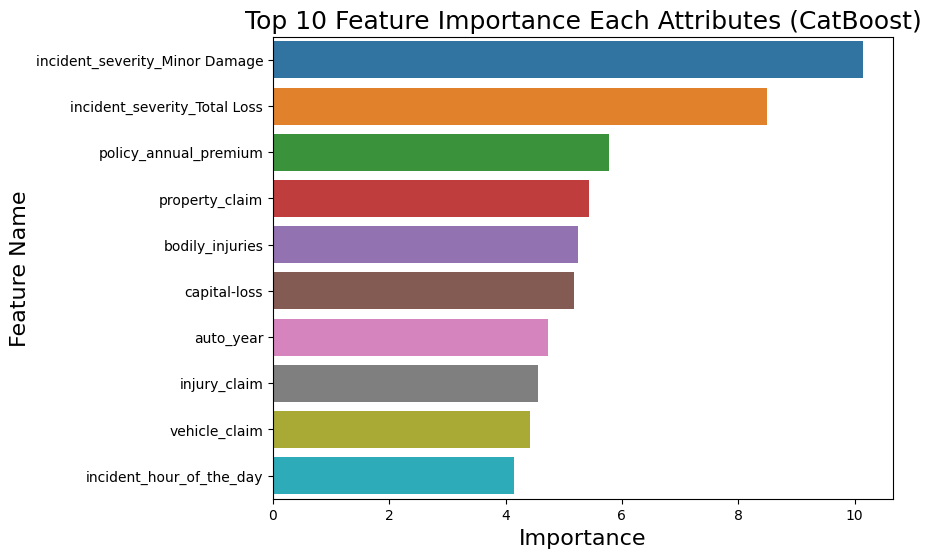

In [116]:
# Feature importance
imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": cat.feature_importances_
})
fi = imp_df.sort_values(by="Importance", ascending=False)

fi2 = fi.head(10)
plt.figure(figsize=(8,6))
sns.barplot(data=fi2, x='Importance', y='Feature Name')
plt.title('Top 10 Feature Importance Each Attributes (CatBoost)', fontsize=18)
plt.xlabel ('Importance', fontsize=16)
plt.ylabel ('Feature Name', fontsize=16)
plt.show()

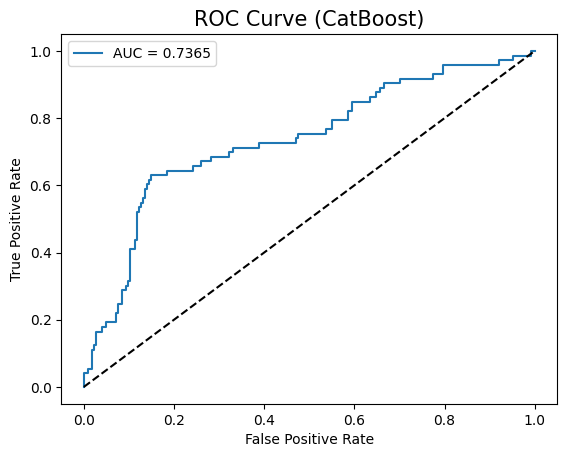

In [117]:
# ROC/AUC diagram
y_pred_proba = cat.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (CatBoost)', size = 15)
plt.legend()
plt.show()


# 8. Voting Classifier

##### A voting classifier trains various base models or estimators and predicts on the basis of aggregating the findings of each base estimator. The aggregating criteria can be combined decision of voting for each estimator output. The voting criteria can be of two types:
- Hard Voting: Voting is calculated on the predicted output class.
- Soft Voting: Voting is calculated on the predicted probability of the output class.

In [124]:
# Import
from sklearn.ensemble import VotingClassifier

classifiers = [('Decision Tree', dt), ('Random Forest', rf), ('AdaBoost', ada), ('XGBoost', xgb), 
               ('Gradient Boosting Classifier', gb), ('Stochastic Gradient Boosting', sgb), ('CatBoost', cat)]

vc = VotingClassifier(estimators = classifiers, voting='soft')
vc.fit(X_train, y_train)

y_pred = vc.predict(X_test)

0:	learn: 0.6325541	total: 11.3ms	remaining: 11.3s
1:	learn: 0.5797591	total: 20.1ms	remaining: 10s
2:	learn: 0.5444222	total: 28.6ms	remaining: 9.52s
3:	learn: 0.5080803	total: 37.3ms	remaining: 9.28s
4:	learn: 0.4720673	total: 45.9ms	remaining: 9.13s
5:	learn: 0.4486702	total: 54.4ms	remaining: 9.01s
6:	learn: 0.4242716	total: 62.7ms	remaining: 8.9s
7:	learn: 0.3975110	total: 72.4ms	remaining: 8.98s
8:	learn: 0.3747320	total: 81.2ms	remaining: 8.94s
9:	learn: 0.3585024	total: 89.7ms	remaining: 8.88s
10:	learn: 0.3409690	total: 98.3ms	remaining: 8.84s
11:	learn: 0.3241123	total: 107ms	remaining: 8.8s
12:	learn: 0.3152277	total: 115ms	remaining: 8.76s
13:	learn: 0.3007242	total: 124ms	remaining: 8.74s
14:	learn: 0.2843263	total: 133ms	remaining: 8.75s
15:	learn: 0.2691883	total: 143ms	remaining: 8.77s
16:	learn: 0.2577290	total: 151ms	remaining: 8.75s
17:	learn: 0.2492046	total: 160ms	remaining: 8.73s
18:	learn: 0.2383362	total: 169ms	remaining: 8.7s
19:	learn: 0.2284971	total: 178ms	r

170:	learn: 0.0167923	total: 1.59s	remaining: 7.74s
171:	learn: 0.0166290	total: 1.6s	remaining: 7.73s
172:	learn: 0.0165056	total: 1.61s	remaining: 7.72s
173:	learn: 0.0163261	total: 1.63s	remaining: 7.71s
174:	learn: 0.0161847	total: 1.63s	remaining: 7.7s
175:	learn: 0.0160574	total: 1.64s	remaining: 7.69s
176:	learn: 0.0159367	total: 1.65s	remaining: 7.68s
177:	learn: 0.0157919	total: 1.66s	remaining: 7.67s
178:	learn: 0.0156801	total: 1.67s	remaining: 7.66s
179:	learn: 0.0155728	total: 1.68s	remaining: 7.65s
180:	learn: 0.0154299	total: 1.69s	remaining: 7.64s
181:	learn: 0.0152924	total: 1.7s	remaining: 7.63s
182:	learn: 0.0151584	total: 1.71s	remaining: 7.61s
183:	learn: 0.0150496	total: 1.71s	remaining: 7.6s
184:	learn: 0.0149075	total: 1.72s	remaining: 7.58s
185:	learn: 0.0147885	total: 1.73s	remaining: 7.57s
186:	learn: 0.0146986	total: 1.74s	remaining: 7.56s
187:	learn: 0.0145916	total: 1.75s	remaining: 7.54s
188:	learn: 0.0144483	total: 1.75s	remaining: 7.53s
189:	learn: 0.01

347:	learn: 0.0064188	total: 3.2s	remaining: 6s
348:	learn: 0.0063837	total: 3.21s	remaining: 5.99s
349:	learn: 0.0063551	total: 3.22s	remaining: 5.98s
350:	learn: 0.0063272	total: 3.23s	remaining: 5.97s
351:	learn: 0.0062976	total: 3.24s	remaining: 5.96s
352:	learn: 0.0062712	total: 3.25s	remaining: 5.95s
353:	learn: 0.0062573	total: 3.26s	remaining: 5.94s
354:	learn: 0.0062319	total: 3.27s	remaining: 5.93s
355:	learn: 0.0062084	total: 3.27s	remaining: 5.92s
356:	learn: 0.0061881	total: 3.28s	remaining: 5.91s
357:	learn: 0.0061671	total: 3.29s	remaining: 5.9s
358:	learn: 0.0061482	total: 3.3s	remaining: 5.89s
359:	learn: 0.0061335	total: 3.31s	remaining: 5.88s
360:	learn: 0.0061105	total: 3.32s	remaining: 5.87s
361:	learn: 0.0060852	total: 3.33s	remaining: 5.87s
362:	learn: 0.0060631	total: 3.34s	remaining: 5.86s
363:	learn: 0.0060341	total: 3.35s	remaining: 5.84s
364:	learn: 0.0060123	total: 3.35s	remaining: 5.83s
365:	learn: 0.0059928	total: 3.36s	remaining: 5.83s
366:	learn: 0.0059

518:	learn: 0.0038952	total: 4.77s	remaining: 4.42s
519:	learn: 0.0038880	total: 4.78s	remaining: 4.41s
520:	learn: 0.0038790	total: 4.79s	remaining: 4.4s
521:	learn: 0.0038704	total: 4.8s	remaining: 4.39s
522:	learn: 0.0038608	total: 4.81s	remaining: 4.38s
523:	learn: 0.0038496	total: 4.82s	remaining: 4.38s
524:	learn: 0.0038408	total: 4.83s	remaining: 4.37s
525:	learn: 0.0038346	total: 4.84s	remaining: 4.36s
526:	learn: 0.0038248	total: 4.85s	remaining: 4.35s
527:	learn: 0.0038157	total: 4.86s	remaining: 4.34s
528:	learn: 0.0038055	total: 4.87s	remaining: 4.33s
529:	learn: 0.0037996	total: 4.88s	remaining: 4.32s
530:	learn: 0.0037940	total: 4.88s	remaining: 4.31s
531:	learn: 0.0037855	total: 4.89s	remaining: 4.31s
532:	learn: 0.0037739	total: 4.91s	remaining: 4.3s
533:	learn: 0.0037665	total: 4.91s	remaining: 4.29s
534:	learn: 0.0037572	total: 4.92s	remaining: 4.28s
535:	learn: 0.0037497	total: 4.93s	remaining: 4.27s
536:	learn: 0.0037426	total: 4.94s	remaining: 4.26s
537:	learn: 0.0

685:	learn: 0.0027752	total: 6.37s	remaining: 2.92s
686:	learn: 0.0027712	total: 6.38s	remaining: 2.91s
687:	learn: 0.0027659	total: 6.39s	remaining: 2.9s
688:	learn: 0.0027617	total: 6.4s	remaining: 2.89s
689:	learn: 0.0027568	total: 6.41s	remaining: 2.88s
690:	learn: 0.0027488	total: 6.42s	remaining: 2.87s
691:	learn: 0.0027456	total: 6.43s	remaining: 2.86s
692:	learn: 0.0027403	total: 6.44s	remaining: 2.85s
693:	learn: 0.0027370	total: 6.45s	remaining: 2.84s
694:	learn: 0.0027329	total: 6.46s	remaining: 2.83s
695:	learn: 0.0027274	total: 6.47s	remaining: 2.83s
696:	learn: 0.0027219	total: 6.48s	remaining: 2.82s
697:	learn: 0.0027178	total: 6.49s	remaining: 2.81s
698:	learn: 0.0027143	total: 6.5s	remaining: 2.8s
699:	learn: 0.0027107	total: 6.51s	remaining: 2.79s
700:	learn: 0.0027047	total: 6.52s	remaining: 2.78s
701:	learn: 0.0027012	total: 6.53s	remaining: 2.77s
702:	learn: 0.0026969	total: 6.54s	remaining: 2.76s
703:	learn: 0.0026926	total: 6.55s	remaining: 2.75s
704:	learn: 0.00

851:	learn: 0.0021609	total: 7.97s	remaining: 1.38s
852:	learn: 0.0021568	total: 7.98s	remaining: 1.37s
853:	learn: 0.0021551	total: 7.99s	remaining: 1.36s
854:	learn: 0.0021516	total: 8s	remaining: 1.35s
855:	learn: 0.0021484	total: 8s	remaining: 1.35s
856:	learn: 0.0021457	total: 8.01s	remaining: 1.34s
857:	learn: 0.0021425	total: 8.03s	remaining: 1.33s
858:	learn: 0.0021393	total: 8.04s	remaining: 1.32s
859:	learn: 0.0021365	total: 8.04s	remaining: 1.31s
860:	learn: 0.0021338	total: 8.05s	remaining: 1.3s
861:	learn: 0.0021298	total: 8.06s	remaining: 1.29s
862:	learn: 0.0021259	total: 8.07s	remaining: 1.28s
863:	learn: 0.0021235	total: 8.08s	remaining: 1.27s
864:	learn: 0.0021208	total: 8.09s	remaining: 1.26s
865:	learn: 0.0021178	total: 8.1s	remaining: 1.25s
866:	learn: 0.0021177	total: 8.11s	remaining: 1.24s
867:	learn: 0.0021157	total: 8.12s	remaining: 1.24s
868:	learn: 0.0021139	total: 8.13s	remaining: 1.23s
869:	learn: 0.0021095	total: 8.14s	remaining: 1.22s
870:	learn: 0.002107

In [125]:
# accuracy_score, confusion_matrix and classification_report

vc_train_acc = accuracy_score(y_train, vc.predict(X_train))
vc_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Voting Classifier is : {vc_train_acc}")
print(f"Test accuracy of Voting Classifier is : {vc_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Voting Classifier is : 0.9228571428571428
Test accuracy of Voting Classifier is : 0.7733333333333333
[[203  24]
 [ 44  29]]
              precision    recall  f1-score   support

           0       0.82      0.89      0.86       227
           1       0.55      0.40      0.46        73

    accuracy                           0.77       300
   macro avg       0.68      0.65      0.66       300
weighted avg       0.76      0.77      0.76       300



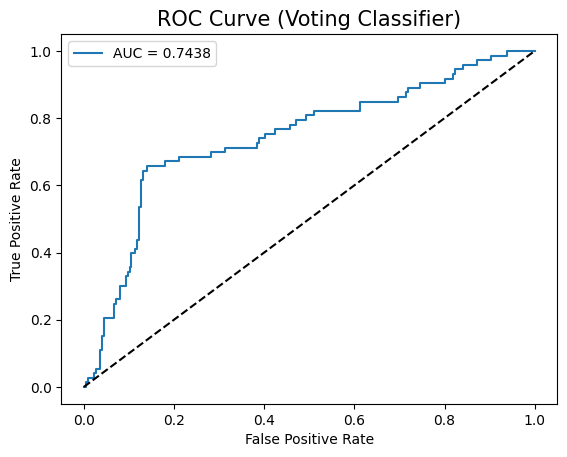

In [126]:
# ROC/AUC diagram
y_pred_proba = vc.predict_proba(X_test)[:][:,1]

df_actual_predicted = pd.concat([pd.DataFrame(np.array(y_test), columns=['y_actual']), pd.DataFrame(y_pred_proba, columns=['y_pred_proba'])], axis=1)
df_actual_predicted.index = y_test.index

fpr, tpr, tr = roc_curve(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])
auc = roc_auc_score(df_actual_predicted['y_actual'], df_actual_predicted['y_pred_proba'])

plt.plot(fpr, tpr, label='AUC = %0.4f' %auc)
plt.plot(fpr, fpr, linestyle = '--', color='k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Voting Classifier)', size = 15)
plt.legend()
plt.show()


## Compare all models

In [130]:
models = pd.DataFrame({
    'Model' : ['Decision Tree', 'Random Forest','AdaBoost', 'Gradient Boost', 'Stochastic Gradient Boost', 'XgBoost', 'CatBoost', 'Voting Classifier'],
    'Score' : [dt_test_acc, rf_test_acc, ada_test_acc, gb_test_acc, sgb_test_acc, xgb_test_acc, cat_test_acc, vc_test_acc]
})

models.sort_values(by = 'Score', ascending = False)


,Model,Score
2,AdaBoost,0.816667
5,XgBoost,0.793333
4,Stochastic Gradient Boost,0.790000
3,Gradient Boost,0.773333
7,Voting Classifier,0.773333
0,Decision Tree,0.770000
1,Random Forest,0.763333
6,CatBoost,0.756667


In [133]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'simple_white', 
       title = 'Models Comparison')

### Adaptive Boosting (AdaBoost) gives the best model for this exercise only by slight margin than other models. The performance of models can be further improved by further tuning the hyperparameters.